In [52]:
# Necessary Library Calls
import nibabel as nib
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
from skimage.util import montage 
from skimage.transform import rotate
from sklearn.model_selection import train_test_split as ttt
import torch
import torch.nn as nn 
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.optim as optim
from tqdm import tqdm
from pylab import *
import gc
import torchmetrics 
import radiomics
from torchvision.utils import save_image
import matplotlib.image
import SimpleITK as sitk
import radiomics
from radiomics import featureextractor


In [53]:
# Global variable definition
IMAGE_PATH = 'data/MICCAI_BraTS_2019_Data_Training'
CSV_FILE='data/MICCAI_BraTS_2019_Data_Training/new.csv'
MODEL_PATH = 'log/20/'

# number of slices, meaning how many slices we are taking from one image file  
SLICE_NUM = 10
# Original Image Size
IMAGE_SIZE=240
# Image size after cropping
HEIGHT=128
WIDTH=144

# Batch size constant
BATCH_SIZE= 1
# input_channel corresponds to the number of different types of images used: 
# e.g: T1, T2, T1_flair, etc. 
# only using one type of images at the moment
INPUT_CHANNEL=2
EPOCH = 50
LEARNING_RATE = 0.001
SLICE_STARTS=torch.load('data/slice_starts.pt')
WEIGHT = torch.load('data/weight.pt')
device = torch.device('cuda')
LOAD_CURRENT = False
LOAD_BEST = False


In [54]:
"""

Data loader for easy data access. 

Output shape for get_item: X [slices, input_channels, W, H ]
                           y [slices, W, H, ]
Notes: the output channel for y has dimension of 1 and has value in range of (0,3).


"""


# Simple helper function for retriving images given the path
def get_image(image_path,image_cat,image_id,image_type):
    t1_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_t1.nii.gz').get_fdata()
    t1ce_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_t1ce.nii.gz').get_fdata()
    t2_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_t2.nii.gz').get_fdata()
    seg_data=nib.load(image_path+'/'+image_cat+'/'+image_id+'/'+image_id+'_seg.nii.gz').get_fdata()
    flair_data=nib.load(os.path.join(image_path,image_cat,image_id,'')+image_id+'_flair.nii.gz').get_fdata()
    result={'t1':t1_data,'t1ce':t1ce_data,'t2':t2_data,'seg':seg_data,'flair':flair_data}
   
    return result[image_type]; 


class BraTS19Dataset(Dataset):
    def __init__(self, csv_f,i_path,i_type):
        self.source=pd.read_csv(csv_f)
        self.image_path=i_path
        self.type=i_type
        self.batch=BATCH_SIZE
    def __len__(self):
        return len(self.source)
     
    def __getitem__(self,idx):
        image_cat=self.source.iloc[idx,0]
        image_id=self.source.iloc[idx,1]
        starts=SLICE_STARTS[idx].int()
        age=self.source.iloc[idx,2]
        sur=self.source.iloc[idx,3]
        stu=self.source.iloc[idx,4]
        if sur<300: 
            cla = 0
        elif sur<450:
            cla=1
        else:
            cla =2
        #classification class 
        
        # get the image and its corresponding mask 
        img = np.zeros((INPUT_CHANNEL,IMAGE_SIZE,IMAGE_SIZE,155))
        
        for i in range(INPUT_CHANNEL):
            img[i]=get_image(self.image_path,image_cat,image_id,self.type[i])
        
     
        mask=get_image(self.image_path,image_cat,image_id,'seg')
        
        
        # change label 4 to 3 for easy index handling
        
        mask[mask==4]=3
        
        # initialize results arrays
        X=np.zeros((INPUT_CHANNEL,HEIGHT,WIDTH,SLICE_NUM))
        y=np.zeros((HEIGHT,WIDTH,SLICE_NUM))
        X = img[:,50:50+HEIGHT,55:55+WIDTH,starts-5:starts-5+SLICE_NUM]
        y = mask[50:50+HEIGHT,55:55+WIDTH,starts-5:starts-5+SLICE_NUM]
        X=torch.from_numpy(X)
        y=torch.from_numpy(y)
        
        
      
       
       
        y = y.long()
#        y = F.one_hot(y,num_classes=4)
        return (X.permute(3,0,1,2),y.permute(2,0,1),(age,sur,stu,cla))
    
def GetBraTS19Dataset(csv,ipath,itype,batch_size=1,shuffle=True,pin_memory=True):
    data = BraTS19Dataset(csv,ipath,itype)
    leng = [int(0.6* len(data)),int(0.2* len(data)),len(data) - int(0.6 * len(data))-int(0.2 * len(data))]
    train,eva,test=torch.utils.data.random_split(data,leng)
    train=DataLoader(train,batch_size=batch_size,shuffle=shuffle,pin_memory=pin_memory)
    eva=DataLoader(eva,batch_size=batch_size,shuffle=shuffle,pin_memory=pin_memory)
    test=DataLoader(eva,batch_size=batch_size,shuffle=shuffle,pin_memory=pin_memory)
    return train,eva,test

In [64]:
# Unet model
class Unet(nn.Module):

    def encoder_block(self,in_channels,out_channels,k=3,conv2d_pad1=(1,1),conv2d_pad2=(1,1)):
        block = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=k,padding=conv2d_pad1),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels,out_channels,kernel_size=k,padding=conv2d_pad2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
        )
        return block
    
    # actual output channel size = output_channel/2
    def decoder_block(self,in_channels,out_channels,k=3,s=2,conv2d_pad1=(1,1),conv2d_pad2=(1,1),convtrans2d_pad=(0,0)):
        block = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=k,padding=conv2d_pad1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
            nn.Conv2d(out_channels,out_channels,kernel_size=k,padding=conv2d_pad2),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
            nn.ConvTranspose2d(out_channels,int(out_channels/2),kernel_size=2,stride=s,padding=convtrans2d_pad),
        )
        return block
    
    def bottle_neck(self,in_channels,out_channels,k=3):
        block = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,kernel_size=k,stride=1,padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(),
            nn.Conv2d(out_channels,out_channels,kernel_size=k,stride=1,padding=1),
            nn.LeakyReLU(),
            nn.Dropout(p=0.5),
            nn.BatchNorm2d(out_channels),
            nn.ConvTranspose2d(out_channels,in_channels,kernel_size=2,stride=2,padding=(0,0),output_padding=(0,0)),
        )
        return block
    
        
    def final_block(self,in_channels,out_channels,k):
        block = nn.Sequential(
            nn.Conv2d(in_channels,int(in_channels/2),kernel_size=k,padding=(1,1)),
            nn.BatchNorm2d(int(in_channels/2)),
            nn.LeakyReLU(),
            nn.Conv2d(int(in_channels/2),out_channels,kernel_size=k,padding=(1,1)),
            nn.LeakyReLU(),
            nn.BatchNorm2d(out_channels),
            nn.Conv2d(out_channels,out_channels,kernel_size=1,stride=1),
            nn.Softmax(dim=1),
            
        )
        return block
    
    def __init__(self, in_channel, out_channel):
        super(Unet, self).__init__()
        self.en1=self.encoder_block(in_channel,32)
        self.max1 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.en2=self.encoder_block(32,64)
        self.max2 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.en3=self.encoder_block(64,128)
        self.max3 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.en4=self.encoder_block(128,256)
        self.max4 = nn.MaxPool2d(kernel_size=2,stride=2)
        self.bn=self.bottle_neck(256,512)
        self.dc4=self.decoder_block(512,256)
        self.dc3=self.decoder_block(256,128)
        self.dc2=self.decoder_block(128,64)
        self.final=self.final_block(64,out_channel,k=3)
   
    def forward(self,x):
        encoder_block1=self.en1(x)
        mp1 = self.max1(encoder_block1)
        encoder_block2=self.en2(mp1)
        mp2 = self.max2(encoder_block2)
        encoder_block3=self.en3(mp2)
        mp3 = self.max3(encoder_block3)
        encoder_block4=self.en4(mp3)
        mp4 = self.max4(encoder_block4)
        bottleneck_block1 =self.bn(mp4)
        
        cat_block4= torch.cat((bottleneck_block1,encoder_block4),1)
        decoder_block4=self.dc4(cat_block4)
        
        cat_block3= torch.cat((decoder_block4,encoder_block3),1)
        decoder_block3=self.dc3(cat_block3)
        
        cat_block2= torch.cat((decoder_block3,encoder_block2),1)
        decoder_block2=self.dc2(cat_block2)
        
        cat_block1= torch.cat((decoder_block2,encoder_block1),1)
        
        result=self.final(cat_block1)
        
        return result

In [65]:
class DiceScore(nn.Module):

    def __init__(self):
        super(DiceScore, self).__init__()
        
    def forward(self, y_pred, y_true):
        dice = torchmetrics.Dice(average = 'micro').to(device)
        macdice = torchmetrics.Dice(num_classes=4,average = 'macro').to(device)
        assert y_pred.size() == y_true.size()
        y_pred1 = F.one_hot(torch.argmax(y_pred,dim=3),num_classes=4)
      
        yp0 = y_pred1[:,:,:,0].contiguous().view(-1)
        yt0 = y_true[:,:,:,0].contiguous().view(-1)
        t0 = dice(yp0,yt0)
        
        yp1 = y_pred1[:,:,:,1].contiguous().view(-1)
        yt1 = y_true[:,:,:,1].contiguous().view(-1)
        t1 = dice(yp1,yt1)
        
        yp2 = y_pred1[:,:,:,2].contiguous().view(-1)
        yt2 = y_true[:,:,:,2].contiguous().view(-1)
        t2 = dice(yp2,yt2)
        
    
        yp3 = y_pred1[:,:,:,3].contiguous().view(-1)
        yt3 = y_true[:,:,:,3].contiguous().view(-1)
        t3 = dice(yp3,yt3)


        return macdice(y_pred1,y_true),t0,t1,t2,t3


"""

""" 
        
        
        
        
        

'\n\n'

In [66]:
class DiceLoss(nn.Module):

    def __init__(self):
        super(DiceLoss, self).__init__()
        
    def forward(self, y_pred, y_true):
        total_loss=0.0
        assert y_pred.size() == y_true.size()
        for i in range(4):
            preds =torch.flatten(y_pred[:,:,:,i])
         
            target =torch.flatten(y_true[:,:,:,i])
            intersection = torch.sum((preds * target))

            dsc = (2. * intersection + 1) / (torch.sum(preds) + torch.sum(target) + 1)
            total_loss+=(1-dsc)
        
        
       
        return total_loss/4

In [67]:
# Train function
def training(dataset, model, opt,  dev, batch_size, lr):
    print('Training in session: ')
    iou=torchmetrics.JaccardIndex('multiclass',num_classes=4,validate_args=False).to(device)
    dic = DiceScore().to(device)
    IoU=[]
    md=[]
    d0=[]
    d1=[]
    d2=[]
    d3=[]
    epoch_loss=0.0
    dataset=tqdm(dataset)
    for index, batch in enumerate(dataset):
        
        # reshape the data and load the data to gpu
        x, y,other= batch 
        a,b,c,d,e=x.shape
        x=x.reshape(a*b,c,d,e)
        x=x.float()

        a,b,c,d=y.shape
        y=y.reshape(a*b,c,d)
        
        x,y=x.to(device),y.to(device)
       
        
      
        
        
        
        loss_fn = DiceLoss().to(device)
       
        # training model
        res = model(x)
        res=res.to(device)
        loss = loss_fn(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device)).to(device)
        
        opt.zero_grad()
        
        loss.backward()
        
        opt.step()
        
        #torch.nn.utils.clip_grad_norm_(model.parameters(), gc)
        
        
        
        # Loss 
        print("Batch_id: ", index,"Training loss: ", loss.item())
        epoch_loss+=loss.item()
        
        
        
        
        #IoU
        bac = iou(torch.argmax(res,dim = 1).to(device),y.to(device)).to(device)
        print("Batch_id: ", index,"Training IoU: ", bac)
        IoU.append(bac)
        
        
        
        # Dice Score
        
        t,t0,t1,t2,t3=dic(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device))
        
        
            
        print("Batch_id: ", index,"Training Mean Dice Score: ", t)
        md.append(t)
            
        print("Batch_id: ", index,"Training Non-tumor Dice Score: ", t0)
        d0.append(t0)
            
        print("Batch_id: ", index,"Training NCR/NET Dice Score: ", t1)
        d1.append(t1)
            
        print("Batch_id: ", index,"Training ED Dice Score: ", t2)
        d2.append(t2)
            
        print("Batch_id: ", index,"Training ET Dice Score: ", t3)
        d3.append(t3)

        
            
    IoU=torch.tensor(IoU)
    md = torch.tensor(md)
    d0=torch.tensor(d0)
    d1=torch.tensor(d1)
    d2=torch.tensor(d2)
    d3=torch.tensor(d3)
    return torch.mean(IoU),epoch_loss,torch.mean(md),torch.mean(d0),torch.mean(d1),torch.mean(d2),torch.mean(d3)
        
        
        
        





       
        
        
        
#        IoU.append(iou(res,y.float()).to(torch.device('cpu')))
    
    
   

In [68]:
# Evaluation function
def evaluation(dataset, model):
    print('Evaluation in session: ')
    iou=torchmetrics.JaccardIndex('multiclass',num_classes=4,validate_args=False).to(device)
    dic = DiceScore().to(device)
    IoU=[]
    md=[]
    d0=[]
    d1=[]
    d2=[]
    d3=[]
    epoch_loss=0.0
    dataset=tqdm(dataset)
    model.eval()
    with torch.no_grad():
        
        for index, batch in enumerate(dataset):
        
            # reshape the data and load the data to gpu
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
       
        
        
        
        
        
            loss_fn = DiceLoss().to(device)
       
            #eval
            res = model(x)
            res=res.to(device)
            loss = loss_fn(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device)).to(device)
        
        
        
            # Loss
            print("Batch_id: ", index,"Eval loss: ", loss.item())
            epoch_loss+=loss.item()
            
            
            # IoU

            bac = iou(torch.argmax(res,dim = 1).to(device),y.to(device)).to(device)
            print("Batch_id: ", index,"Eval IoU: ", bac)
            IoU.append(bac)
            
            # Dice Score
            t,t0,t1,t2,t3=dic(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device))
            
            print("Batch_id: ", index,"Eval Mean Dice Score: ", t)
            md.append(t)
            
            print("Batch_id: ", index,"Eval Non-tumor Dice Score: ", t0)
            d0.append(t0)
            
            print("Batch_id: ", index,"Eval NCR/NET Dice Score: ", t1)
            d1.append(t1)
            
            print("Batch_id: ", index,"Eval ED Dice Score: ", t2)
            d2.append(t2)
            
            print("Batch_id: ", index,"Eval ET Dice Score: ", t3)
            d3.append(t3)
            if index%10==0:
                
                img1=np.zeros((HEIGHT,WIDTH))
                img1=torch.tensor(img1)
                img1[:,:]=res.argmax(dim=1)[5,:,:]
                img1[img1==3]=4
                img2=np.zeros((HEIGHT,WIDTH))
                img2=torch.tensor(img2)
                img2[:,:]=y[5,:,:]
                img2[img2==3]=4
                figure()
                imshow(img1)
                show()
                figure()
                imshow(img2)
                show()
            
            
            

            
    IoU=torch.tensor(IoU)
    md = torch.tensor(md)
    d0=torch.tensor(d0)
    d1=torch.tensor(d1)
    d2=torch.tensor(d2)
    d3=torch.tensor(d3)
    return torch.mean(IoU),epoch_loss,torch.mean(md),torch.mean(d0),torch.mean(d1),torch.mean(d2),torch.mean(d3)
    
    
    

In [69]:
# Load Best Model
def test(dataset):
    print('test in session: ') 
    checkpoint = torch.load(MODEL_PATH+'#20-BEST')
    model = Unet(in_channel=INPUT_CHANNEL,out_channel=4).to(device)
    opt = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    model.load_state_dict(checkpoint['model_state_dict'])
    opt.load_state_dict(checkpoint['optim_state_dict'])
    epoch = checkpoint['epoch']
    Avg_dice = checkpoint['Eval Dice Scores']
    non = checkpoint['Eval Non-tumor Dice Scores']
    ncr = checkpoint['Eval NCR/NET Dice Scores']
    ed = checkpoint['Eval ED Dice Scores']
    et = checkpoint['Eval ET Dice Scores']
    
    print('Model loaded!','Epoch = ', epoch, 'Mean eval dice scores is: ',Avg_dice)
    print('Dice Scorese Per class: ')
    print('Non-Tumor: ', non)
    print('NCR/NET: ', ncr)
    print('ED: ', ed)
    print('ET: ',et)
    iou=torchmetrics.JaccardIndex('multiclass',num_classes=4,validate_args=False).to(device)
    dic = DiceScore().to(device)
    IoU=[]
    md=[]
    d0=[]
    d1=[]
    d2=[]
    d3=[]
    epoch_loss=0.0
    dataset=tqdm(dataset)
    model.eval()
    with torch.no_grad():
        
        for index, batch in enumerate(dataset):
        
            # reshape the data and load the data to gpu
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
       
        
    

    
        
        
        
        
            loss_fn = DiceLoss().to(device)
       
            #test
            res = model(x)
            res=res.to(device)
            loss = loss_fn(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device)).to(device)
        
        
        
            # Loss
            print("Batch_id: ", index,"Test loss: ", loss.item())
            epoch_loss+=loss.item()
            
            
            # IoU

            bac = iou(torch.argmax(res,dim = 1).to(device),y.to(device)).to(device)
            print("Batch_id: ", index,"Test IoU: ", bac)
            IoU.append(bac)
            
            
            # Dice Score
            t,t0,t1,t2,t3=dic(res.permute(0,2,3,1).to(device),F.one_hot(y,num_classes=4).to(device))
            
            print("Batch_id: ", index,"Test Mean Dice Score: ", t)
            md.append(t)
            
            print("Batch_id: ", index,"Test Non-tumor Dice Score: ", t0)
            d0.append(t0)
            
            print("Batch_id: ", index,"Test NCR/NET Dice Score: ", t1)
            d1.append(t1)
            
            print("Batch_id: ", index,"Test ED Dice Score: ", t2)
            d2.append(t2)
            
            print("Batch_id: ", index,"Test ET Dice Score: ", t3)
            d3.append(t3)

            img1=np.zeros((HEIGHT,WIDTH))
            img1=torch.tensor(img1)
            img1[:,:]=res.argmax(dim=1)[0,:,:]
            img1[img1==3]=4
            img2=np.zeros((HEIGHT,WIDTH))
            img2=torch.tensor(img2)
            img2[:,:]=y[0,:,:]
            img2[img2==3]=4
            figure()
            imshow(img1)
            show()
            figure()
            imshow(img2)
            show()
            
    IoU=torch.tensor(IoU)
    md = torch.tensor(md)
    d0=torch.tensor(d0)
    d1=torch.tensor(d1)
    d2=torch.tensor(d2)
    d3=torch.tensor(d3)
    print('Avg IoU: ',torch.mean(IoU))
    print('Avg Loss: ',epoch_loss/(BATCH_SIZE*SLICE_NUM))
    print('Avg Dice Scores: ', torch.mean(md))
    print('Non-Tumor Dice Scores: ',torch.mean(d0))
    print('NCR/NET Dice Scores: ',torch.mean(d1))
    print('ED Dice Scores: ',torch.mean(d2))
    print('ET Dice Scores: ', torch.mean(d3))
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    
    

In [70]:
# main

def main(BEST_EVAL):
    if LOAD_CURRENT:
        train_data = torch.load(MODEL_PATH+'trdata.pth')
        eval_data = torch.load(MODEL_PATH+'edata.pth')
        test_data = torch.load(MODEL_PATH+'tdata.pth')
    else:
        train_data,eval_data,test_data = GetBraTS19Dataset(CSV_FILE,IMAGE_PATH,['t1ce','flair'],batch_size=BATCH_SIZE)
        torch.save(train_data, MODEL_PATH+'trdata.pth')
        torch.save(eval_data, MODEL_PATH+'edata.pth')
        torch.save(test_data,MODEL_PATH+'tdata.pth')
    
    print('Data Loaded!')
    
    
    
    
    
    model = Unet(in_channel=INPUT_CHANNEL,out_channel=4).to(device)
    opt = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    sc = torch.optim.lr_scheduler.ReduceLROnPlateau(opt,patience=5,factor = 0.5,threshold=0.1,mode = 'max',verbose = True)
    if LOAD_CURRENT:
        checkpoint = torch.load(MODEL_PATH+'#20-current')
        model.load_state_dict(checkpoint['model_state_dict'])
        opt.load_state_dict(checkpoint['optim_state_dict'])
        sc.load_state_dict(checkpoint['sche'])
        index =torch.load(MODEL_PATH+'index.pt')
        loss_value=torch.load(MODEL_PATH+'tloss.pt')
        accuracy=torch.load(MODEL_PATH+'tac.pt')
        eval_loss=torch.load(MODEL_PATH+'eloss.pt')
        eval_accuracy=torch.load(MODEL_PATH+'eacc.pt')
        mean_dice=torch.load(MODEL_PATH+'md.pt')
        d0=torch.load(MODEL_PATH+'d0.pt')
        d1=torch.load(MODEL_PATH+'d1.pt')
        d2=torch.load(MODEL_PATH+'d2.pt')
        d3=torch.load(MODEL_PATH+'d3.pt')
        e_mean_dice=torch.load(MODEL_PATH+'emd.pt')
        ed0=torch.load(MODEL_PATH+'ed0.pt')
        ed1=torch.load(MODEL_PATH+'ed1.pt')
        ed2=torch.load(MODEL_PATH+'ed2.pt')
        ed3=torch.load(MODEL_PATH+'ed3.pt')     
        ep = torch.load(MODEL_PATH+'ep.pt')
        
    else:
        index =[]
        loss_value=[]
        accuracy=[]
        eval_loss=[]
        eval_accuracy=[]
        mean_dice=[]
        d0=[]
        d1=[]
        d2=[]
        d3=[]
        e_mean_dice=[]
        ed0=[]
        ed1=[]
        ed2=[]
        ed3=[]
        ep = 0 
    
    
    for i in range (ep,EPOCH):
        print(f'Epoch: {i}')
        
        acc, loss_val,md,di0,di1,di2,di3=training(train_data,model.train(),opt, device,BATCH_SIZE,LEARNING_RATE)
        
        eacc,eloss_val,emd,edi0,edi1,edi2,edi3=evaluation(eval_data,model.eval())
        sc.step(eloss_val)
        
        loss_value.append(loss_val/len(train_data.sampler))
        accuracy.append(acc)
        mean_dice.append(md)
        d0.append(di0)
        d1.append(di1)
        d2.append(di2)
        d3.append(di3)
        
        eval_loss.append(eloss_val/len(eval_data.sampler))
        eval_accuracy.append(eacc)
        e_mean_dice.append(emd)
        ed0.append(edi0)
        ed1.append(edi1)
        ed2.append(edi2)
        ed3.append(edi3)
        
        index.append(i)
        ep=ep+1
        
        torch.save(index,MODEL_PATH+'index.pt')
        torch.save(loss_value,MODEL_PATH+'tloss.pt')
        torch.save(accuracy,MODEL_PATH+'tac.pt')
        torch.save(eval_loss,MODEL_PATH+'eloss.pt')
        torch.save(eval_accuracy,MODEL_PATH+'eacc.pt')
        torch.save(mean_dice,MODEL_PATH+'md.pt')
        torch.save(d0,MODEL_PATH+'d0.pt')
        torch.save(d1,MODEL_PATH+'d1.pt')
        torch.save(d2,MODEL_PATH+'d2.pt')
        torch.save(d3,MODEL_PATH+'d3.pt')
        torch.save(e_mean_dice,MODEL_PATH+'emd.pt')
        torch.save(ed0,MODEL_PATH+'ed0.pt')
        torch.save(ed1,MODEL_PATH+'ed1.pt')
        torch.save(ed2,MODEL_PATH+'ed2.pt')
        torch.save(ed3,MODEL_PATH+'ed3.pt')     
        torch.save(ep,MODEL_PATH+'ep.pt')
        
        
        print('Epoch ',i,'Training loss: ',loss_val/len(train_data.sampler))
        print('Epoch ',i,'Evaluation loss: ',eloss_val/len(eval_data.sampler))
        
        print('Epoch ',i,'Training accuracy : ',acc)
        print('Epoch ',i,'Evaluation accuracy : ',eacc)
        
        print('Epoch ',i,'Training Mean Dice Score: ',md)
        print('Epoch ',i,'Eval Mean Dice Score: ',emd)
        
        print('Epoch ',i,'Training Non-tumor Dice Score: ',di0)
        print('Epoch ',i,'Eval Non-tumor Dice Score: ',edi0)
       
        print('Epoch ',i,'Training NCR/NET Dice Score: ',di1)
        print('Epoch ',i,'Eval NCR/NET Dice Score: ',edi1)
        
        print('Epoch ',i,'Training ED Dice Score: ',di2)
        print('Epoch ',i,'Eval ED Dice Score: ',edi2)
        
        print('Epoch ',i,'Training ET Dice Score: ',di3)
        print('Epoch ',i,'Eval ET Dice Score: ',edi3)
        torch.save({
            'model_state_dict': model.state_dict(),
            'optim_state_dict': opt.state_dict(),
            'epoch': i,
            'sche':sc.state_dict(),
            'Training loss_values': loss_val/len(train_data.sampler),
            'Training accuracy':acc,
            'Eval loss_values': eloss_val/len(eval_data.sampler),
            'Eval IoU':eacc,
            'Training Dice Scores':md,
            'Eval Dice Scores': emd,
            'Training Non-tumor Dice Scores':di0,
            'Eval Non-tumor Dice Scores':edi0,   
            'Training NCR/NET Dice Scores': di1,
            'Eval NCR/NET Dice Scores': edi1,   
            'Training ED Dice Scores': di2,
            'Eval ED Dice Scores': edi2,    
            'Training ET Dice Scores': di3,
            'Eval ET Dice Scores': edi3,    
            }, MODEL_PATH+'#20-current')
        print('Epoch completed and model successfully saved')
        if BEST_EVAL < eacc :
            torch.save({
            'model_state_dict': model.state_dict(),
            'optim_state_dict': opt.state_dict(),
            'epoch': i,
            'sche':sc.state_dict(),
            'Training loss_values': loss_val/len(train_data.sampler),
            'Training accuracy':acc,
            'Eval loss_values': eloss_val/len(eval_data.sampler),
            'Eval IoU':eacc,
            'Training Dice Scores':md,
            'Eval Dice Scores': emd,
            'Training Non-tumor Dice Scores':di0,
            'Eval Non-tumor Dice Scores':edi0,   
            'Training NCR/NET Dice Scores': di1,
            'Eval NCR/NET Dice Scores': edi1,   
            'Training ED Dice Scores': di2,
            'Eval ED Dice Scores': edi2,    
            'Training ET Dice Scores': di3,
            'Eval ET Dice Scores': edi3,    
            }, MODEL_PATH+'#20-BEST')
            print("Best Model saved!")
            BEST_EVAL = eacc
        gc.collect()
        torch.cuda.empty_cache()
        if eacc > 0.75:
            break
        
    plt.plot(index, loss_value, label ="Training ")
    plt.plot(index,eval_loss, label = "Validation")
    plt.title("Training and Validation Loss Curve: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Average Loss ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training and eval Loss plot.png')
    plt.show()
    
    
    plt.plot(index, accuracy,label ="Training ")
    plt.plot(index, eval_accuracy,label ="Validation ")
    plt.title("Training and Validation IoU Scores (batch_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM, LEARNING_RATE))
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (Mean IoU Scores)")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training and eval Accuracy plot.png')
    plt.show()
    
    plt.plot(index, mean_dice, label ="Training ")
    plt.plot(index,e_mean_dice, label = "Validation")
    plt.title("Training and Validation Mean Dice Scores: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Mean Dice Scores: ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training and eval avg dice plot.png')
    plt.show()
    
    plt.plot(index, d0, label ="Non-Tumor ")
    plt.plot(index,d1, label = "NCT/NET")
    plt.plot(index, d2, label ="ED ")
    plt.plot(index,d3, label = "ET")
    plt.title("Training Dice Scores per class: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Mean Dice Scores: ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Training dice per class plot.png')
    plt.show()
    
    plt.plot(index, ed0, label ="Non-Tumor ")
    plt.plot(index,ed1, label = "NCT/NET")
    plt.plot(index, ed2, label ="ED ")
    plt.plot(index,ed3, label = "ET")
    plt.title("Validation Dice Scores per class: (Sample_size={}, lr={})".format(BATCH_SIZE*SLICE_NUM ,LEARNING_RATE))
    plt.xlabel("Epoch:")
    plt.ylabel("Mean Dice Scores: ")
    plt.legend()
    plt.savefig(MODEL_PATH+ 'Eval dice per class plot.png')
    plt.show()
    test(test_data.dataset)

In [71]:
gc.collect()
torch.cuda.empty_cache()

Data Loaded!
Epoch: 0
Training in session: 


  1%|          | 1/110 [00:01<02:57,  1.63s/it]

Batch_id:  0 Training loss:  0.8558093309402466
Batch_id:  0 Training IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.4231, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.1959, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.7482, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.8636, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.4616, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:45,  1.53s/it]

Batch_id:  1 Training loss:  0.8876804113388062
Batch_id:  1 Training IoU:  tensor(0.0455, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.3807, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.0873, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.7678, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.8623, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.4246, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:41,  1.51s/it]

Batch_id:  2 Training loss:  0.8119515180587769
Batch_id:  2 Training IoU:  tensor(0.1486, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.4571, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.2548, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.8849, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.8984, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.3332, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:33,  1.45s/it]

Batch_id:  3 Training loss:  0.8222547173500061
Batch_id:  3 Training IoU:  tensor(0.0757, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.4238, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.3223, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.8379, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.8362, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.2751, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:39,  1.52s/it]

Batch_id:  4 Training loss:  0.8362186551094055
Batch_id:  4 Training IoU:  tensor(0.1043, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.4620, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.2251, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9011, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.7432, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.5164, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:38,  1.53s/it]

Batch_id:  5 Training loss:  0.823530912399292
Batch_id:  5 Training IoU:  tensor(0.1343, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.5597, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.3991, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.8661, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.8186, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.5953, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:30,  1.46s/it]

Batch_id:  6 Training loss:  0.8272479176521301
Batch_id:  6 Training IoU:  tensor(0.0745, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.4681, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.2508, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.8766, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.7710, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.5061, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:29,  1.47s/it]

Batch_id:  7 Training loss:  0.7967814207077026
Batch_id:  7 Training IoU:  tensor(0.1835, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.5616, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.3702, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.8390, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.5783, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.8611490726470947
Batch_id:  8 Training IoU:  tensor(0.0493, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.4110, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.1430, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.6707, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.8482, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.5713, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:21,  1.42s/it]

Batch_id:  9 Training loss:  0.7757425308227539
Batch_id:  9 Training IoU:  tensor(0.2177, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.5789, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.4185, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.4907, device='cuda:0')


 10%|█         | 11/110 [00:16<02:21,  1.43s/it]

Batch_id:  10 Training loss:  0.8259706497192383
Batch_id:  10 Training IoU:  tensor(0.1602, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.5594, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.3577, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.8914, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.5413, device='cuda:0')


 11%|█         | 12/110 [00:17<02:20,  1.43s/it]

Batch_id:  11 Training loss:  0.8662855625152588
Batch_id:  11 Training IoU:  tensor(0.0206, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.3546, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.0567, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.6650, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.7660, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.5760, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:17,  1.42s/it]

Batch_id:  12 Training loss:  0.7655210494995117
Batch_id:  12 Training IoU:  tensor(0.3425, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.6965, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.5598, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.6148, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:15,  1.41s/it]

Batch_id:  13 Training loss:  0.7819682359695435
Batch_id:  13 Training IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.6460, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.5396, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9159, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.8675, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.6151, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:20,  1.48s/it]

Batch_id:  14 Training loss:  0.7249245047569275
Batch_id:  14 Training IoU:  tensor(0.4361, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.7101, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.5962, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.6275, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:17,  1.46s/it]

Batch_id:  15 Training loss:  0.7727493047714233
Batch_id:  15 Training IoU:  tensor(0.2313, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.6400, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.4838, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9146, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.8699, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.6518, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:14,  1.45s/it]

Batch_id:  16 Training loss:  0.7861969470977783
Batch_id:  16 Training IoU:  tensor(0.2580, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.6789, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.5435, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.6588, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:15,  1.47s/it]

Batch_id:  17 Training loss:  0.7107864618301392
Batch_id:  17 Training IoU:  tensor(0.3752, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.7717, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.6777, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9076, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.8103, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:12,  1.46s/it]

Batch_id:  18 Training loss:  0.8197548389434814
Batch_id:  18 Training IoU:  tensor(0.2071, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.6852, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.5499, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9106, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.8411, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.7540, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:12,  1.48s/it]

Batch_id:  19 Training loss:  0.8029860258102417
Batch_id:  19 Training IoU:  tensor(0.2426, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.7335, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.6486, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.8628, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.8990, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.7901, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:10,  1.47s/it]

Batch_id:  20 Training loss:  0.8515754342079163
Batch_id:  20 Training IoU:  tensor(0.1530, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.6136, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.4267, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.8904, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.8350, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.6887, device='cuda:0')


 20%|██        | 22/110 [00:32<02:19,  1.58s/it]

Batch_id:  21 Training loss:  0.8232025504112244
Batch_id:  21 Training IoU:  tensor(0.1883, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.6409, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.4820, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.8856, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.8490, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.7063, device='cuda:0')


 21%|██        | 23/110 [00:34<02:15,  1.55s/it]

Batch_id:  22 Training loss:  0.7537305951118469
Batch_id:  22 Training IoU:  tensor(0.3000, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.7402, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.6208, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.8779, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.8681, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.8538, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:12,  1.54s/it]

Batch_id:  23 Training loss:  0.7803974151611328
Batch_id:  23 Training IoU:  tensor(0.3645, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.7643, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.6572, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9110, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.7545, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.7326499819755554
Batch_id:  24 Training IoU:  tensor(0.3721, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.8085, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.7512, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.8896, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9090, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.8756, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:05,  1.49s/it]

Batch_id:  25 Training loss:  0.7439887523651123
Batch_id:  25 Training IoU:  tensor(0.3517, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.7550, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.6647, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.7257, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:03,  1.49s/it]

Batch_id:  26 Training loss:  0.7472756505012512
Batch_id:  26 Training IoU:  tensor(0.3713, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.8116, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.7954, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.8428, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9264, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.8702, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:57,  1.43s/it]

Batch_id:  27 Training loss:  0.7038049697875977
Batch_id:  27 Training IoU:  tensor(0.5094, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.8696, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.8270, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.8643, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:58,  1.46s/it]

Batch_id:  28 Training loss:  0.8302733898162842
Batch_id:  28 Training IoU:  tensor(0.2724, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.7579, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.6474, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.8836, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.8098, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:57,  1.47s/it]

Batch_id:  29 Training loss:  0.7375584840774536
Batch_id:  29 Training IoU:  tensor(0.4097, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.8427, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.8065, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9210, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9319, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.8689, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:53,  1.44s/it]

Batch_id:  30 Training loss:  0.8319205045700073
Batch_id:  30 Training IoU:  tensor(0.2788, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.8002, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.7080, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9100, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.8391, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:55,  1.48s/it]

Batch_id:  31 Training loss:  0.7464638352394104
Batch_id:  31 Training IoU:  tensor(0.3830, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.8221, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.7582, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.8913, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.8696, device='cuda:0')


 30%|███       | 33/110 [00:48<01:55,  1.50s/it]

Batch_id:  32 Training loss:  0.8511516451835632
Batch_id:  32 Training IoU:  tensor(0.1135, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.5741, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.3809, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.7948, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.6010, device='cuda:0')


 31%|███       | 34/110 [00:50<01:54,  1.50s/it]

Batch_id:  33 Training loss:  0.7609246969223022
Batch_id:  33 Training IoU:  tensor(0.3860, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.8393, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.7791, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.8620, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9169, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:51,  1.49s/it]

Batch_id:  34 Training loss:  0.7924196720123291
Batch_id:  34 Training IoU:  tensor(0.2726, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.7689, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.6823, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.7921, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.8825, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:52,  1.52s/it]

Batch_id:  35 Training loss:  0.7912462949752808
Batch_id:  35 Training IoU:  tensor(0.3443, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.7676, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.6592, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.7475, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:49,  1.50s/it]

Batch_id:  36 Training loss:  0.7099595069885254
Batch_id:  36 Training IoU:  tensor(0.4393, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.8561, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.7969, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.8932, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9283, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:46,  1.47s/it]

Batch_id:  37 Training loss:  0.8662929534912109
Batch_id:  37 Training IoU:  tensor(0.1802, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.7296, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.6048, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.8468, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.8281, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:49,  1.54s/it]

Batch_id:  38 Training loss:  0.8156777620315552
Batch_id:  38 Training IoU:  tensor(0.2400, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.7343, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.6571, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.8931, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.8358, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.8169, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:45,  1.50s/it]

Batch_id:  39 Training loss:  0.7683495879173279
Batch_id:  39 Training IoU:  tensor(0.3219, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.8507, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.8962, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.8709, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.8953, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.8897, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:41,  1.47s/it]

Batch_id:  40 Training loss:  0.7117659449577332
Batch_id:  40 Training IoU:  tensor(0.4779, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.8679, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9207, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9211, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:38,  1.44s/it]

Batch_id:  41 Training loss:  0.765553891658783
Batch_id:  41 Training IoU:  tensor(0.3768, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.8652, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.8695, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.8816, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9061, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:36,  1.44s/it]

Batch_id:  42 Training loss:  0.7936769723892212
Batch_id:  42 Training IoU:  tensor(0.2200, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.6553, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.5107, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.8671, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.6328, device='cuda:0')


 40%|████      | 44/110 [01:04<01:35,  1.45s/it]

Batch_id:  43 Training loss:  0.7719534039497375
Batch_id:  43 Training IoU:  tensor(0.3889, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.8356, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.8116, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.8125, device='cuda:0')


 41%|████      | 45/110 [01:06<01:34,  1.45s/it]

Batch_id:  44 Training loss:  0.8112013339996338
Batch_id:  44 Training IoU:  tensor(0.1833, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.6441, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.4829, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.8847, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.6008, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:30,  1.41s/it]

Batch_id:  45 Training loss:  0.8077836036682129
Batch_id:  45 Training IoU:  tensor(0.2730, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.7898, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.7163, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.8922, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.8206, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:29,  1.43s/it]

Batch_id:  46 Training loss:  0.722251296043396
Batch_id:  46 Training IoU:  tensor(0.5390, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.8867, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9086, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:31,  1.48s/it]

Batch_id:  47 Training loss:  0.8439846038818359
Batch_id:  47 Training IoU:  tensor(0.2371, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.8009, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.7063, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.8813, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.8849, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:30,  1.49s/it]

Batch_id:  48 Training loss:  0.7562100291252136
Batch_id:  48 Training IoU:  tensor(0.3979, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.8585, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.8230, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9086, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.8981, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:28,  1.48s/it]

Batch_id:  49 Training loss:  0.7418748140335083
Batch_id:  49 Training IoU:  tensor(0.4280, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.8481, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.7937, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.8434, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:25,  1.45s/it]

Batch_id:  50 Training loss:  0.7569403648376465
Batch_id:  50 Training IoU:  tensor(0.4383, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.8696, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.8177, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9253, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.8925, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:22,  1.41s/it]

Batch_id:  51 Training loss:  0.7202531695365906
Batch_id:  51 Training IoU:  tensor(0.5097, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.8922, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.8733, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9080, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:19,  1.40s/it]

Batch_id:  52 Training loss:  0.808616042137146
Batch_id:  52 Training IoU:  tensor(0.2632, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.7826, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.7055, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.8052, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.8841, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:20,  1.44s/it]

Batch_id:  53 Training loss:  0.7939751744270325
Batch_id:  53 Training IoU:  tensor(0.3250, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.8674, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.8675, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.8968, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.8836, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:17,  1.42s/it]

Batch_id:  54 Training loss:  0.7289223670959473
Batch_id:  54 Training IoU:  tensor(0.4292, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.8598, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.8606, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.8441, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9278, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:18,  1.46s/it]

Batch_id:  55 Training loss:  0.6992322206497192
Batch_id:  55 Training IoU:  tensor(0.5358, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9000, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.8927, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.8960, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9501, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:15,  1.43s/it]

Batch_id:  56 Training loss:  0.790748119354248
Batch_id:  56 Training IoU:  tensor(0.2965, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.8227, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.7847, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.8486, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.8930, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:13,  1.42s/it]

Batch_id:  57 Training loss:  0.7504359483718872
Batch_id:  57 Training IoU:  tensor(0.4111, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.8710, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.8256, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.8969, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:10,  1.39s/it]

Batch_id:  58 Training loss:  0.8206385970115662
Batch_id:  58 Training IoU:  tensor(0.2703, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.7954, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.7532, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.7957, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:07,  1.35s/it]

Batch_id:  59 Training loss:  0.7972042560577393
Batch_id:  59 Training IoU:  tensor(0.3432, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.8258, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.7466, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.8473, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:06,  1.36s/it]

Batch_id:  60 Training loss:  0.7604062557220459
Batch_id:  60 Training IoU:  tensor(0.4218, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.8715, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.8424, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9065, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:05,  1.36s/it]

Batch_id:  61 Training loss:  0.7245811223983765
Batch_id:  61 Training IoU:  tensor(0.4931, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.8842, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.8582, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.8970, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9353, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:07,  1.43s/it]

Batch_id:  62 Training loss:  0.8045334815979004
Batch_id:  62 Training IoU:  tensor(0.2437, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.7554, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.6832, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.8807, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9026, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.7996, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:03,  1.39s/it]

Batch_id:  63 Training loss:  0.8040372133255005
Batch_id:  63 Training IoU:  tensor(0.2825, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.8237, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.7950, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9115, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.8657, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.8988, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:04,  1.43s/it]

Batch_id:  64 Training loss:  0.7301311492919922
Batch_id:  64 Training IoU:  tensor(0.4365, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.8860, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.8719, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9242, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:03,  1.44s/it]

Batch_id:  65 Training loss:  0.7147200107574463
Batch_id:  65 Training IoU:  tensor(0.5495, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9089, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9253, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:01,  1.44s/it]

Batch_id:  66 Training loss:  0.796055793762207
Batch_id:  66 Training IoU:  tensor(0.3371, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.8583, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.7969, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.8854, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<00:59,  1.43s/it]

Batch_id:  67 Training loss:  0.6986318826675415
Batch_id:  67 Training IoU:  tensor(0.4498, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.8672, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.8135, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.8715, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<00:58,  1.42s/it]

Batch_id:  68 Training loss:  0.7148377299308777
Batch_id:  68 Training IoU:  tensor(0.4593, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.8721, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.8455, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.8470, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:57,  1.45s/it]

Batch_id:  69 Training loss:  0.6650425791740417
Batch_id:  69 Training IoU:  tensor(0.6221, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9521, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:57,  1.47s/it]

Batch_id:  70 Training loss:  0.813470721244812
Batch_id:  70 Training IoU:  tensor(0.2672, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.8345, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.8225, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.8688, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.8952, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:56,  1.48s/it]

Batch_id:  71 Training loss:  0.8012624979019165
Batch_id:  71 Training IoU:  tensor(0.2808, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.8073, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.7249, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.8832, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.8716, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:53,  1.46s/it]

Batch_id:  72 Training loss:  0.7963058948516846
Batch_id:  72 Training IoU:  tensor(0.2738, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.7859, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.7151, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.8443, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.8532, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:52,  1.46s/it]

Batch_id:  73 Training loss:  0.7727171778678894
Batch_id:  73 Training IoU:  tensor(0.3609, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.8772, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.8726, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9297, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.8818, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9474, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:50,  1.45s/it]

Batch_id:  74 Training loss:  0.6500027179718018
Batch_id:  74 Training IoU:  tensor(0.6057, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9703, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:48,  1.43s/it]

Batch_id:  75 Training loss:  0.7401314973831177
Batch_id:  75 Training IoU:  tensor(0.4262, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.8811, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.8446, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9283, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:49,  1.49s/it]

Batch_id:  76 Training loss:  0.8031655550003052
Batch_id:  76 Training IoU:  tensor(0.2845, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.8394, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.7844, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.8889, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.8813, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:45,  1.43s/it]

Batch_id:  77 Training loss:  0.6913667321205139
Batch_id:  77 Training IoU:  tensor(0.5948, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9585, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:43,  1.40s/it]

Batch_id:  78 Training loss:  0.7477564215660095
Batch_id:  78 Training IoU:  tensor(0.4279, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.8776, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.8305, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9036, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:42,  1.42s/it]

Batch_id:  79 Training loss:  0.6613619327545166
Batch_id:  79 Training IoU:  tensor(0.5187, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.8753, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.8884, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.8985, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9149, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:40,  1.40s/it]

Batch_id:  80 Training loss:  0.8050786852836609
Batch_id:  80 Training IoU:  tensor(0.2621, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.8085, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.7492, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.8904, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.8843, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:38,  1.38s/it]

Batch_id:  81 Training loss:  0.8175294399261475
Batch_id:  81 Training IoU:  tensor(0.2762, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.8566, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.8127, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.8805, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9190, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:37,  1.39s/it]

Batch_id:  82 Training loss:  0.712537407875061
Batch_id:  82 Training IoU:  tensor(0.5461, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9522, device='cuda:0')


 76%|███████▋  | 84/110 [02:01<00:36,  1.41s/it]

Batch_id:  83 Training loss:  0.7026093602180481
Batch_id:  83 Training IoU:  tensor(0.5952, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:35,  1.43s/it]

Batch_id:  84 Training loss:  0.7773157954216003
Batch_id:  84 Training IoU:  tensor(0.3085, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.8240, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.7408, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.8923, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9173, device='cuda:0')


 78%|███████▊  | 86/110 [02:04<00:33,  1.41s/it]

Batch_id:  85 Training loss:  0.7560238242149353
Batch_id:  85 Training IoU:  tensor(0.3891, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.8680, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.8237, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.8691, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9504, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:32,  1.40s/it]

Batch_id:  86 Training loss:  0.7305159568786621
Batch_id:  86 Training IoU:  tensor(0.5650, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9401, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9223, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 80%|████████  | 88/110 [02:07<00:30,  1.40s/it]

Batch_id:  87 Training loss:  0.6682912707328796
Batch_id:  87 Training IoU:  tensor(0.5825, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9582, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:29,  1.42s/it]

Batch_id:  88 Training loss:  0.7151586413383484
Batch_id:  88 Training IoU:  tensor(0.5818, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9676, device='cuda:0')


 82%|████████▏ | 90/110 [02:10<00:28,  1.44s/it]

Batch_id:  89 Training loss:  0.628027081489563
Batch_id:  89 Training IoU:  tensor(0.7068, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:28,  1.50s/it]

Batch_id:  90 Training loss:  0.8197832703590393
Batch_id:  90 Training IoU:  tensor(0.2730, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.8444, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.7774, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9030, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9171, device='cuda:0')


 84%|████████▎ | 92/110 [02:13<00:26,  1.48s/it]

Batch_id:  91 Training loss:  0.7317870855331421
Batch_id:  91 Training IoU:  tensor(0.4537, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9219, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9275, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:26,  1.57s/it]

Batch_id:  92 Training loss:  0.6412678956985474
Batch_id:  92 Training IoU:  tensor(0.6693, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9645, device='cuda:0')


 85%|████████▌ | 94/110 [02:16<00:24,  1.53s/it]

Batch_id:  93 Training loss:  0.6554069519042969
Batch_id:  93 Training IoU:  tensor(0.5500, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9147, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9001, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9662, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:22,  1.52s/it]

Batch_id:  94 Training loss:  0.6848668456077576
Batch_id:  94 Training IoU:  tensor(0.6203, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:20,  1.48s/it]

Batch_id:  95 Training loss:  0.6616359949111938
Batch_id:  95 Training IoU:  tensor(0.5389, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9026, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:18,  1.45s/it]

Batch_id:  96 Training loss:  0.7377500534057617
Batch_id:  96 Training IoU:  tensor(0.4039, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.8879, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.8728, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9447, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:17,  1.44s/it]

Batch_id:  97 Training loss:  0.6603187322616577
Batch_id:  97 Training IoU:  tensor(0.4613, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.8742, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.8979, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.8768, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9120, device='cuda:0')


 90%|█████████ | 99/110 [02:23<00:15,  1.45s/it]

Batch_id:  98 Training loss:  0.7118324637413025
Batch_id:  98 Training IoU:  tensor(0.5267, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9258, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:15,  1.51s/it]

Batch_id:  99 Training loss:  0.6620180606842041
Batch_id:  99 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9678, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:14,  1.57s/it]

Batch_id:  100 Training loss:  0.735271692276001
Batch_id:  100 Training IoU:  tensor(0.4816, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.8984, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.8696, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9507, device='cuda:0')


 93%|█████████▎| 102/110 [02:28<00:12,  1.58s/it]

Batch_id:  101 Training loss:  0.7345956563949585
Batch_id:  101 Training IoU:  tensor(0.4431, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9196, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9082, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9457, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.53s/it]

Batch_id:  102 Training loss:  0.7397423982620239
Batch_id:  102 Training IoU:  tensor(0.3882, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.8716, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.8242, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.8912, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:09,  1.57s/it]

Batch_id:  103 Training loss:  0.6845037937164307
Batch_id:  103 Training IoU:  tensor(0.5684, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9174, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9331, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.55s/it]

Batch_id:  104 Training loss:  0.7399789690971375
Batch_id:  104 Training IoU:  tensor(0.5794, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:06,  1.54s/it]

Batch_id:  105 Training loss:  0.7205910682678223
Batch_id:  105 Training IoU:  tensor(0.4722, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.8678, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.8945, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.54s/it]

Batch_id:  106 Training loss:  0.8196537494659424
Batch_id:  106 Training IoU:  tensor(0.2599, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.8441, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.7969, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.8800, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9066, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:03,  1.55s/it]

Batch_id:  107 Training loss:  0.7206151485443115
Batch_id:  107 Training IoU:  tensor(0.5062, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.54s/it]

Batch_id:  108 Training loss:  0.6560420393943787
Batch_id:  108 Training IoU:  tensor(0.7559, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.6609635949134827
Batch_id:  109 Training IoU:  tensor(0.5375, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9056, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9176, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9217, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7372683882713318
Batch_id:  0 Eval IoU:  tensor(0.2421, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.6787, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.5681, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.7739, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.7469, device='cuda:0')


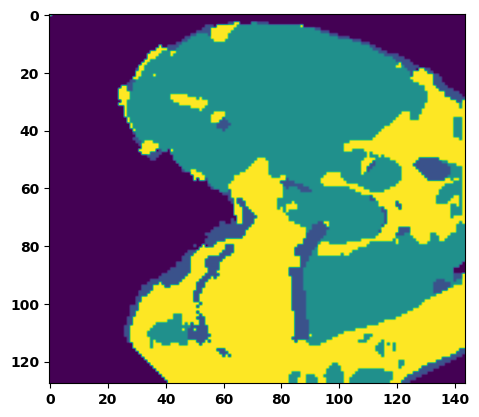

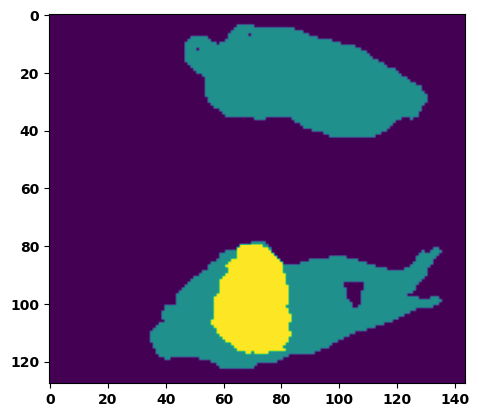

  6%|▌         | 2/36 [00:03<00:51,  1.52s/it]

Batch_id:  1 Eval loss:  0.7594949007034302
Batch_id:  1 Eval IoU:  tensor(0.2969, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8123, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.7332, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.7761, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9605, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:52,  1.58s/it]

Batch_id:  2 Eval loss:  0.8082530498504639
Batch_id:  2 Eval IoU:  tensor(0.3115, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8519, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7935, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.8144, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.51s/it]

Batch_id:  3 Eval loss:  0.7643979787826538
Batch_id:  3 Eval IoU:  tensor(0.5093, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:46,  1.49s/it]

Batch_id:  4 Eval loss:  0.9548742175102234
Batch_id:  4 Eval IoU:  tensor(0.0269, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.3930, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.1858, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.7958, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2416, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:43,  1.46s/it]

Batch_id:  5 Eval loss:  0.9460797309875488
Batch_id:  5 Eval IoU:  tensor(0.0410, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4227, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.2743, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8558, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8640, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2740, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.975147545337677
Batch_id:  6 Eval IoU:  tensor(0.0171, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.3705, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.2300, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.7635, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.1967, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.8000168204307556
Batch_id:  7 Eval IoU:  tensor(0.1988, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8636, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.7954, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.7363866567611694
Batch_id:  8 Eval IoU:  tensor(0.5431, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9753, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.43s/it]

Batch_id:  9 Eval loss:  0.8175572156906128
Batch_id:  9 Eval IoU:  tensor(0.2639, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.7824, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7193, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.7337, device='cuda:0')
Batch_id:  10 Eval loss:  0.843747079372406
Batch_id:  10 Eval IoU:  tensor(0.2173, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8074, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.7493, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.7176, device='cuda:0')


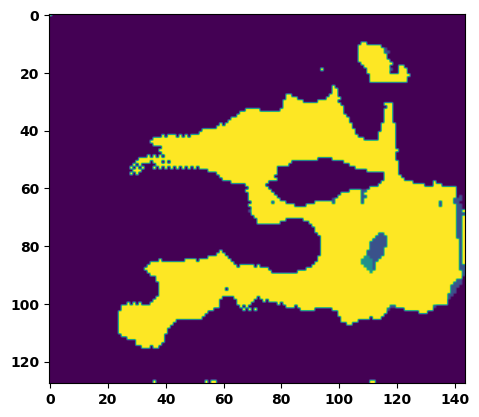

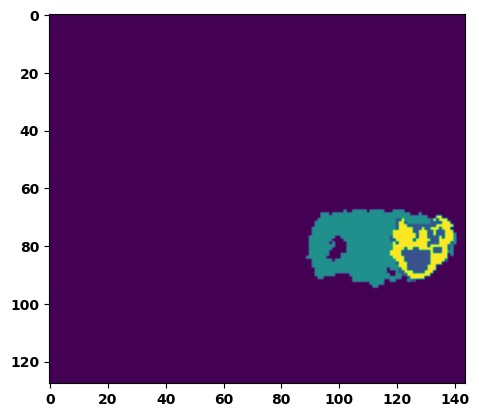

 33%|███▎      | 12/36 [00:17<00:35,  1.48s/it]

Batch_id:  11 Eval loss:  0.9479854702949524
Batch_id:  11 Eval IoU:  tensor(0.0263, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.3934, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.2122, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.8585, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.1608, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:33,  1.47s/it]

Batch_id:  12 Eval loss:  0.8350443840026855
Batch_id:  12 Eval IoU:  tensor(0.3566, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9921, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.50s/it]

Batch_id:  13 Eval loss:  0.8902140855789185
Batch_id:  13 Eval IoU:  tensor(0.0965, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.4525, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.2372, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9290, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.2295, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.49s/it]

Batch_id:  14 Eval loss:  0.781070351600647
Batch_id:  14 Eval IoU:  tensor(0.2522, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.5264, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.3091, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.3231, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9678, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.50s/it]

Batch_id:  15 Eval loss:  0.9704415798187256
Batch_id:  15 Eval IoU:  tensor(0.0175, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.3727, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.2029, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8516, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.1616, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:29,  1.53s/it]

Batch_id:  16 Eval loss:  0.811809241771698
Batch_id:  16 Eval IoU:  tensor(0.3100, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8793, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.8584, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:27,  1.52s/it]

Batch_id:  17 Eval loss:  0.8671326637268066
Batch_id:  17 Eval IoU:  tensor(0.2438, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.5708, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3616, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.3849, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:26,  1.57s/it]

Batch_id:  18 Eval loss:  0.9663276672363281
Batch_id:  18 Eval IoU:  tensor(0.0264, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4014, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.1230, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.1534, device='cuda:0')


 56%|█████▌    | 20/36 [00:30<00:24,  1.54s/it]

Batch_id:  19 Eval loss:  0.8188961744308472
Batch_id:  19 Eval IoU:  tensor(0.3588, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  20 Eval loss:  0.8375593423843384
Batch_id:  20 Eval IoU:  tensor(0.1471, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.6019, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.5993, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8244, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.4111, device='cuda:0')


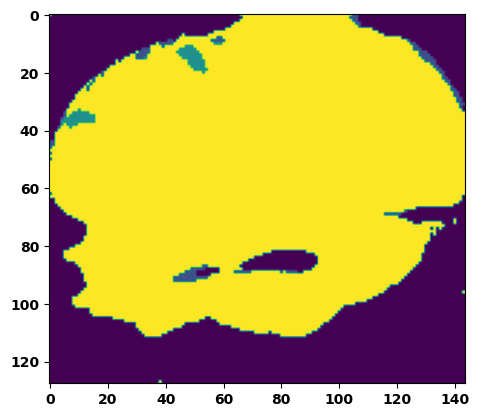

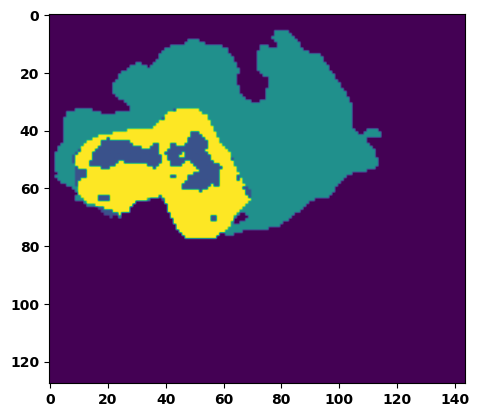

 61%|██████    | 22/36 [00:33<00:22,  1.62s/it]

Batch_id:  21 Eval loss:  0.6880700588226318
Batch_id:  21 Eval IoU:  tensor(0.4356, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.7652, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.6708, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.6621, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9824, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:20,  1.56s/it]

Batch_id:  22 Eval loss:  0.8409228324890137
Batch_id:  22 Eval IoU:  tensor(0.2683, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9244, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9010, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 67%|██████▋   | 24/36 [00:36<00:18,  1.50s/it]

Batch_id:  23 Eval loss:  0.7846450209617615
Batch_id:  23 Eval IoU:  tensor(0.4611, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9154, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.52s/it]

Batch_id:  24 Eval loss:  0.9087783098220825
Batch_id:  24 Eval IoU:  tensor(0.0619, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4708, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.2997, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9147, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2379, device='cuda:0')


 72%|███████▏  | 26/36 [00:39<00:15,  1.50s/it]

Batch_id:  25 Eval loss:  0.7489551305770874
Batch_id:  25 Eval IoU:  tensor(0.4380, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9069, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8698, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8889, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:12,  1.44s/it]

Batch_id:  26 Eval loss:  0.8044010996818542
Batch_id:  26 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9665, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.43s/it]

Batch_id:  27 Eval loss:  0.9133063554763794
Batch_id:  27 Eval IoU:  tensor(0.0613, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.4658, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3197, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8396, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2729, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.46s/it]

Batch_id:  28 Eval loss:  0.8376426696777344
Batch_id:  28 Eval IoU:  tensor(0.2094, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8241, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7564, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.7769, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9976, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.45s/it]

Batch_id:  29 Eval loss:  0.839243471622467
Batch_id:  29 Eval IoU:  tensor(0.2087, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7741, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.7004, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.7104, device='cuda:0')
Batch_id:  30 Eval loss:  0.850376546382904
Batch_id:  30 Eval IoU:  tensor(0.2095, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8059, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.7472, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.7272, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


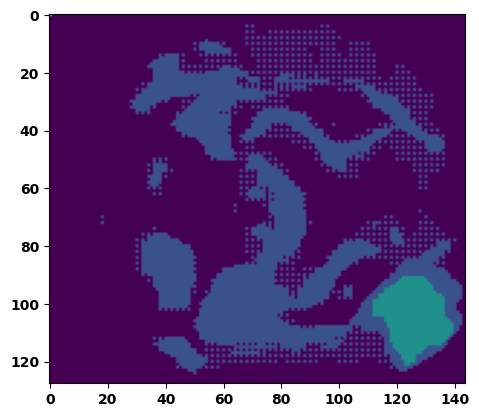

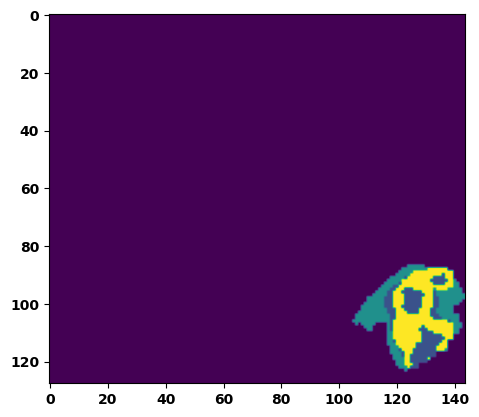

 89%|████████▉ | 32/36 [00:47<00:05,  1.48s/it]

Batch_id:  31 Eval loss:  0.8743830919265747
Batch_id:  31 Eval IoU:  tensor(0.1250, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5908, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4284, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9052, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8445, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.5944, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.51s/it]

Batch_id:  32 Eval loss:  0.7682191133499146
Batch_id:  32 Eval IoU:  tensor(0.2501, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6141, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.5016, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.4719, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.49s/it]

Batch_id:  33 Eval loss:  0.8315567970275879
Batch_id:  33 Eval IoU:  tensor(0.2288, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9153, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.47s/it]

Batch_id:  34 Eval loss:  0.7989681959152222
Batch_id:  34 Eval IoU:  tensor(0.2076, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.5961, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4418, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.4088, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9613, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.50s/it]

Batch_id:  35 Eval loss:  0.9033302068710327
Batch_id:  35 Eval IoU:  tensor(0.1460, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4837, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.2627, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2304, device='cuda:0')
Epoch  0 Training loss:  0.7597257018089294
Epoch  0 Evaluation loss:  0.8406250956985686
Epoch  0 Training accuracy :  tensor(0.3685)
Epoch  0 Evaluation accuracy :  tensor(0.2231)
Epoch  0 Training Mean Dice Score:  tensor(0.7975)
Epoch  0 Eval Mean Dice Score:  tensor(0.6967)
Epoch  0 Training Non-tumor Dice Score:  tensor(0.7308)
Epoch  0 Eval Non-tumor Dice Score:  tensor(0.5966)
Epoch  0 Training NCR/NET Dice Score:  tensor(0.9268)
Epoch  0 Eval NCR/NET Dice Score:  tensor(0.9293)
Epoch  0 Training ED Dice Score:  tensor(0.9047)
Epoch  0

Epoch: 1
Training in session: 


  1%|          | 1/110 [00:01<02:38,  1.45s/it]

Batch_id:  0 Training loss:  0.7362291812896729
Batch_id:  0 Training IoU:  tensor(0.3642, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.8588, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.8072, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.8908, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9074, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:43,  1.51s/it]

Batch_id:  1 Training loss:  0.6531468629837036
Batch_id:  1 Training IoU:  tensor(0.5408, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9189, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9118, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:41,  1.51s/it]

Batch_id:  2 Training loss:  0.7212920188903809
Batch_id:  2 Training IoU:  tensor(0.4714, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9222, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9490, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:40,  1.52s/it]

Batch_id:  3 Training loss:  0.6766596436500549
Batch_id:  3 Training IoU:  tensor(0.4950, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9472, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:36,  1.49s/it]

Batch_id:  4 Training loss:  0.78617262840271
Batch_id:  4 Training IoU:  tensor(0.3046, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.8709, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.8353, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.8870, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9144, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:34,  1.49s/it]

Batch_id:  5 Training loss:  0.7212204337120056
Batch_id:  5 Training IoU:  tensor(0.4592, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9084, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9552, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.7032426595687866
Batch_id:  6 Training IoU:  tensor(0.4915, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9333, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9153, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9586, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:31,  1.49s/it]

Batch_id:  7 Training loss:  0.7023743987083435
Batch_id:  7 Training IoU:  tensor(0.4389, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9072, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.8809, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9017, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:26,  1.45s/it]

Batch_id:  8 Training loss:  0.8120596408843994
Batch_id:  8 Training IoU:  tensor(0.2886, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.8498, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.7795, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9208, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.8870, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9621, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:20,  1.41s/it]

Batch_id:  9 Training loss:  0.6878201961517334
Batch_id:  9 Training IoU:  tensor(0.4712, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.8848, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.8417, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.8913, device='cuda:0')


 10%|█         | 11/110 [00:16<02:19,  1.41s/it]

Batch_id:  10 Training loss:  0.7819860577583313
Batch_id:  10 Training IoU:  tensor(0.3671, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.8622, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.8025, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.8978, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9743, device='cuda:0')


 11%|█         | 12/110 [00:17<02:21,  1.45s/it]

Batch_id:  11 Training loss:  0.7259273529052734
Batch_id:  11 Training IoU:  tensor(0.5315, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:17,  1.41s/it]

Batch_id:  12 Training loss:  0.7150369882583618
Batch_id:  12 Training IoU:  tensor(0.4499, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9063, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.8797, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9073, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9672, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:13,  1.39s/it]

Batch_id:  13 Training loss:  0.7259795665740967
Batch_id:  13 Training IoU:  tensor(0.4227, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.8930, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.8575, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9282, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9533, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:13,  1.40s/it]

Batch_id:  14 Training loss:  0.7338031530380249
Batch_id:  14 Training IoU:  tensor(0.3804, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.8607, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.7991, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9261, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:12,  1.41s/it]

Batch_id:  15 Training loss:  0.6861445903778076
Batch_id:  15 Training IoU:  tensor(0.6233, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.8854, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9069, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:08,  1.38s/it]

Batch_id:  16 Training loss:  0.702572762966156
Batch_id:  16 Training IoU:  tensor(0.4894, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.8885, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.8774, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:10,  1.41s/it]

Batch_id:  17 Training loss:  0.6843670606613159
Batch_id:  17 Training IoU:  tensor(0.4852, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9630, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:10,  1.43s/it]

Batch_id:  18 Training loss:  0.6976866722106934
Batch_id:  18 Training IoU:  tensor(0.4310, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.8868, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.8772, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9567, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:05,  1.39s/it]

Batch_id:  19 Training loss:  0.587824821472168
Batch_id:  19 Training IoU:  tensor(0.6359, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:05,  1.41s/it]

Batch_id:  20 Training loss:  0.6829637885093689
Batch_id:  20 Training IoU:  tensor(0.4279, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.8981, device='cuda:0')


 20%|██        | 22/110 [00:31<02:03,  1.40s/it]

Batch_id:  21 Training loss:  0.7293746471405029
Batch_id:  21 Training IoU:  tensor(0.3635, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.8518, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.8272, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.8464, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9417, device='cuda:0')


 21%|██        | 23/110 [00:32<01:59,  1.37s/it]

Batch_id:  22 Training loss:  0.7449257373809814
Batch_id:  22 Training IoU:  tensor(0.3013, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.8213, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.8201, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.8440, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.8667, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:01,  1.41s/it]

Batch_id:  23 Training loss:  0.7646346688270569
Batch_id:  23 Training IoU:  tensor(0.2491, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.8033, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.8501, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.8552, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.8035, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9010, device='cuda:0')


 23%|██▎       | 25/110 [00:35<01:59,  1.40s/it]

Batch_id:  24 Training loss:  0.6156949400901794
Batch_id:  24 Training IoU:  tensor(0.5287, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.8905, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.8597, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:56,  1.39s/it]

Batch_id:  25 Training loss:  0.6978381872177124
Batch_id:  25 Training IoU:  tensor(0.3890, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.8502, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.8149, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.8490, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9271, device='cuda:0')


 25%|██▍       | 27/110 [00:38<01:54,  1.38s/it]

Batch_id:  26 Training loss:  0.7811621427536011
Batch_id:  26 Training IoU:  tensor(0.2527, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.8219, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.7742, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9351, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.8429, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9135, device='cuda:0')


 25%|██▌       | 28/110 [00:39<01:53,  1.39s/it]

Batch_id:  27 Training loss:  0.6746900677680969
Batch_id:  27 Training IoU:  tensor(0.5341, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9560, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:52,  1.39s/it]

Batch_id:  28 Training loss:  0.6871098875999451
Batch_id:  28 Training IoU:  tensor(0.5756, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 27%|██▋       | 30/110 [00:42<01:59,  1.49s/it]

Batch_id:  29 Training loss:  0.6784207820892334
Batch_id:  29 Training IoU:  tensor(0.4807, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9078, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.8844, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:57,  1.49s/it]

Batch_id:  30 Training loss:  0.7738245129585266
Batch_id:  30 Training IoU:  tensor(0.4276, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.8819, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.8343, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.8705, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9592, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:56,  1.49s/it]

Batch_id:  31 Training loss:  0.6708847284317017
Batch_id:  31 Training IoU:  tensor(0.5532, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9313, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 30%|███       | 33/110 [00:47<01:52,  1.46s/it]

Batch_id:  32 Training loss:  0.6967261433601379
Batch_id:  32 Training IoU:  tensor(0.4633, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.8900, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.8611, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.8856, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9515, device='cuda:0')


 31%|███       | 34/110 [00:49<01:55,  1.52s/it]

Batch_id:  33 Training loss:  0.780249297618866
Batch_id:  33 Training IoU:  tensor(0.2721, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.8538, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.8078, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.8967, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.8850, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.6440091729164124
Batch_id:  34 Training IoU:  tensor(0.5957, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9676, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:50,  1.49s/it]

Batch_id:  35 Training loss:  0.7116222381591797
Batch_id:  35 Training IoU:  tensor(0.4906, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9217, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:43,  1.41s/it]

Batch_id:  36 Training loss:  0.8055771589279175
Batch_id:  36 Training IoU:  tensor(0.2896, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.8506, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.7807, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.8520, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9349, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:42,  1.43s/it]

Batch_id:  37 Training loss:  0.7124564051628113
Batch_id:  37 Training IoU:  tensor(0.5693, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 35%|███▌      | 39/110 [00:55<01:38,  1.39s/it]

Batch_id:  38 Training loss:  0.6283326745033264
Batch_id:  38 Training IoU:  tensor(0.6585, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:40,  1.43s/it]

Batch_id:  39 Training loss:  0.75493985414505
Batch_id:  39 Training IoU:  tensor(0.3471, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.8998, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.8573, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9421, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:37,  1.41s/it]

Batch_id:  40 Training loss:  0.6700297594070435
Batch_id:  40 Training IoU:  tensor(0.6109, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:38,  1.44s/it]

Batch_id:  41 Training loss:  0.5639341473579407
Batch_id:  41 Training IoU:  tensor(0.6847, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:36,  1.44s/it]

Batch_id:  42 Training loss:  0.7226704359054565
Batch_id:  42 Training IoU:  tensor(0.3465, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.8669, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.8037, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9341, device='cuda:0')


 40%|████      | 44/110 [01:03<01:32,  1.41s/it]

Batch_id:  43 Training loss:  0.696152925491333
Batch_id:  43 Training IoU:  tensor(0.4276, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9051, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9645, device='cuda:0')


 41%|████      | 45/110 [01:04<01:30,  1.40s/it]

Batch_id:  44 Training loss:  0.6054264307022095
Batch_id:  44 Training IoU:  tensor(0.5553, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 42%|████▏     | 46/110 [01:05<01:27,  1.37s/it]

Batch_id:  45 Training loss:  0.6371414661407471
Batch_id:  45 Training IoU:  tensor(0.4955, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9585, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:29,  1.41s/it]

Batch_id:  46 Training loss:  0.610647439956665
Batch_id:  46 Training IoU:  tensor(0.4662, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.8761, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.8641, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9067, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:27,  1.41s/it]

Batch_id:  47 Training loss:  0.6278660297393799
Batch_id:  47 Training IoU:  tensor(0.5674, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9633, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:25,  1.39s/it]

Batch_id:  48 Training loss:  0.6313433051109314
Batch_id:  48 Training IoU:  tensor(0.4936, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.8994, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.8911, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:23,  1.39s/it]

Batch_id:  49 Training loss:  0.6058527231216431
Batch_id:  49 Training IoU:  tensor(0.6114, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 46%|████▋     | 51/110 [01:12<01:23,  1.41s/it]

Batch_id:  50 Training loss:  0.7364485263824463
Batch_id:  50 Training IoU:  tensor(0.3115, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.8535, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.8107, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.8586, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9330, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:23,  1.43s/it]

Batch_id:  51 Training loss:  0.6011244654655457
Batch_id:  51 Training IoU:  tensor(0.7154, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 48%|████▊     | 53/110 [01:15<01:20,  1.41s/it]

Batch_id:  52 Training loss:  0.5553516745567322
Batch_id:  52 Training IoU:  tensor(0.7255, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 49%|████▉     | 54/110 [01:16<01:16,  1.37s/it]

Batch_id:  53 Training loss:  0.6129181385040283
Batch_id:  53 Training IoU:  tensor(0.6322, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 50%|█████     | 55/110 [01:18<01:13,  1.34s/it]

Batch_id:  54 Training loss:  0.7193074822425842
Batch_id:  54 Training IoU:  tensor(0.3373, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.8625, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.8219, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.8557, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9401, device='cuda:0')


 51%|█████     | 56/110 [01:19<01:17,  1.44s/it]

Batch_id:  55 Training loss:  0.7513706088066101
Batch_id:  55 Training IoU:  tensor(0.4207, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9088, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 52%|█████▏    | 57/110 [01:21<01:17,  1.46s/it]

Batch_id:  56 Training loss:  0.6674606204032898
Batch_id:  56 Training IoU:  tensor(0.4744, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9240, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9602, device='cuda:0')


 53%|█████▎    | 58/110 [01:22<01:16,  1.46s/it]

Batch_id:  57 Training loss:  0.773667573928833
Batch_id:  57 Training IoU:  tensor(0.2750, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.8454, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.7968, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.8384, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9428, device='cuda:0')


 54%|█████▎    | 59/110 [01:24<01:13,  1.44s/it]

Batch_id:  58 Training loss:  0.6591024994850159
Batch_id:  58 Training IoU:  tensor(0.4968, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9285, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 55%|█████▍    | 60/110 [01:25<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.7192265391349792
Batch_id:  59 Training IoU:  tensor(0.3552, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.8965, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.8617, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.8810, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9625, device='cuda:0')


 55%|█████▌    | 61/110 [01:27<01:11,  1.47s/it]

Batch_id:  60 Training loss:  0.7972460985183716
Batch_id:  60 Training IoU:  tensor(0.2325, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.8326, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.7617, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.8407, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9136, device='cuda:0')


 56%|█████▋    | 62/110 [01:28<01:12,  1.50s/it]

Batch_id:  61 Training loss:  0.6439374089241028
Batch_id:  61 Training IoU:  tensor(0.5117, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9198, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9010, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:09,  1.48s/it]

Batch_id:  62 Training loss:  0.5310207605361938
Batch_id:  62 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 58%|█████▊    | 64/110 [01:31<01:06,  1.45s/it]

Batch_id:  63 Training loss:  0.713331937789917
Batch_id:  63 Training IoU:  tensor(0.4491, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 59%|█████▉    | 65/110 [01:33<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.6221371293067932
Batch_id:  64 Training IoU:  tensor(0.6304, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 60%|██████    | 66/110 [01:34<01:03,  1.45s/it]

Batch_id:  65 Training loss:  0.6492860317230225
Batch_id:  65 Training IoU:  tensor(0.4770, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9541, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.570671558380127
Batch_id:  66 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 62%|██████▏   | 68/110 [01:37<01:02,  1.49s/it]

Batch_id:  67 Training loss:  0.6069703698158264
Batch_id:  67 Training IoU:  tensor(0.5619, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9591, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<01:00,  1.48s/it]

Batch_id:  68 Training loss:  0.599877119064331
Batch_id:  68 Training IoU:  tensor(0.5853, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9281, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9255, device='cuda:0')


 64%|██████▎   | 70/110 [01:40<00:59,  1.48s/it]

Batch_id:  69 Training loss:  0.7568315863609314
Batch_id:  69 Training IoU:  tensor(0.2991, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.8712, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.8162, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9263, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:57,  1.48s/it]

Batch_id:  70 Training loss:  0.5584196448326111
Batch_id:  70 Training IoU:  tensor(0.5389, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.8954, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9593, device='cuda:0')


 65%|██████▌   | 72/110 [01:43<00:55,  1.46s/it]

Batch_id:  71 Training loss:  0.6833181977272034
Batch_id:  71 Training IoU:  tensor(0.4745, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9085, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.8764, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9493, device='cuda:0')


 66%|██████▋   | 73/110 [01:44<00:54,  1.47s/it]

Batch_id:  72 Training loss:  0.7146028280258179
Batch_id:  72 Training IoU:  tensor(0.4145, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9000, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.8680, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9463, device='cuda:0')


 67%|██████▋   | 74/110 [01:46<00:51,  1.44s/it]

Batch_id:  73 Training loss:  0.6601283550262451
Batch_id:  73 Training IoU:  tensor(0.4608, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9479, device='cuda:0')


 68%|██████▊   | 75/110 [01:47<00:50,  1.44s/it]

Batch_id:  74 Training loss:  0.6116150617599487
Batch_id:  74 Training IoU:  tensor(0.6244, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:48,  1.44s/it]

Batch_id:  75 Training loss:  0.7379091382026672
Batch_id:  75 Training IoU:  tensor(0.2960, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.8537, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.8421, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.8959, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9031, device='cuda:0')


 70%|███████   | 77/110 [01:50<00:47,  1.45s/it]

Batch_id:  76 Training loss:  0.6836869716644287
Batch_id:  76 Training IoU:  tensor(0.5109, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9207, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:45,  1.43s/it]

Batch_id:  77 Training loss:  0.6294257044792175
Batch_id:  77 Training IoU:  tensor(0.6006, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 72%|███████▏  | 79/110 [01:53<00:45,  1.45s/it]

Batch_id:  78 Training loss:  0.7435582280158997
Batch_id:  78 Training IoU:  tensor(0.2854, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.7865, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.8961, device='cuda:0')


 73%|███████▎  | 80/110 [01:54<00:42,  1.43s/it]

Batch_id:  79 Training loss:  0.542448103427887
Batch_id:  79 Training IoU:  tensor(0.6626, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 74%|███████▎  | 81/110 [01:56<00:42,  1.47s/it]

Batch_id:  80 Training loss:  0.6533129215240479
Batch_id:  80 Training IoU:  tensor(0.5167, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9671, device='cuda:0')


 75%|███████▍  | 82/110 [01:57<00:41,  1.47s/it]

Batch_id:  81 Training loss:  0.681029200553894
Batch_id:  81 Training IoU:  tensor(0.5339, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9153, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9316, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 75%|███████▌  | 83/110 [01:59<00:39,  1.47s/it]

Batch_id:  82 Training loss:  0.5394519567489624
Batch_id:  82 Training IoU:  tensor(0.5873, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.8835, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 76%|███████▋  | 84/110 [02:00<00:36,  1.42s/it]

Batch_id:  83 Training loss:  0.7185403108596802
Batch_id:  83 Training IoU:  tensor(0.3602, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.8888, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.8373, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9006, device='cuda:0')


 77%|███████▋  | 85/110 [02:02<00:36,  1.44s/it]

Batch_id:  84 Training loss:  0.6976374387741089
Batch_id:  84 Training IoU:  tensor(0.3584, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9007, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9067, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9024, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9191, device='cuda:0')


 78%|███████▊  | 86/110 [02:03<00:34,  1.42s/it]

Batch_id:  85 Training loss:  0.6816402077674866
Batch_id:  85 Training IoU:  tensor(0.3855, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9154, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9459, device='cuda:0')


 79%|███████▉  | 87/110 [02:05<00:33,  1.47s/it]

Batch_id:  86 Training loss:  0.5751333236694336
Batch_id:  86 Training IoU:  tensor(0.5670, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9299, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9048, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9110, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 80%|████████  | 88/110 [02:06<00:31,  1.45s/it]

Batch_id:  87 Training loss:  0.5497527122497559
Batch_id:  87 Training IoU:  tensor(0.5694, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9108, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.8968, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9095, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 81%|████████  | 89/110 [02:08<00:31,  1.48s/it]

Batch_id:  88 Training loss:  0.6693843603134155
Batch_id:  88 Training IoU:  tensor(0.3867, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.8838, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.8550, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.8762, device='cuda:0')


 82%|████████▏ | 90/110 [02:09<00:28,  1.44s/it]

Batch_id:  89 Training loss:  0.6004273295402527
Batch_id:  89 Training IoU:  tensor(0.5115, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9684, device='cuda:0')


 83%|████████▎ | 91/110 [02:10<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.5763932466506958
Batch_id:  90 Training IoU:  tensor(0.5840, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9022, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 84%|████████▎ | 92/110 [02:12<00:25,  1.42s/it]

Batch_id:  91 Training loss:  0.6215230226516724
Batch_id:  91 Training IoU:  tensor(0.5328, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9086, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9598, device='cuda:0')


 85%|████████▍ | 93/110 [02:13<00:23,  1.40s/it]

Batch_id:  92 Training loss:  0.6113170385360718
Batch_id:  92 Training IoU:  tensor(0.5343, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 85%|████████▌ | 94/110 [02:14<00:22,  1.38s/it]

Batch_id:  93 Training loss:  0.5034070014953613
Batch_id:  93 Training IoU:  tensor(0.6223, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9702, device='cuda:0')


 86%|████████▋ | 95/110 [02:16<00:20,  1.37s/it]

Batch_id:  94 Training loss:  0.6327435970306396
Batch_id:  94 Training IoU:  tensor(0.4561, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9395, device='cuda:0')


 87%|████████▋ | 96/110 [02:18<00:20,  1.47s/it]

Batch_id:  95 Training loss:  0.4813419580459595
Batch_id:  95 Training IoU:  tensor(0.7380, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 88%|████████▊ | 97/110 [02:19<00:18,  1.46s/it]

Batch_id:  96 Training loss:  0.5290104746818542
Batch_id:  96 Training IoU:  tensor(0.6010, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 89%|████████▉ | 98/110 [02:21<00:19,  1.59s/it]

Batch_id:  97 Training loss:  0.6254913806915283
Batch_id:  97 Training IoU:  tensor(0.4155, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.8804, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9150, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.8719, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9306, device='cuda:0')


 90%|█████████ | 99/110 [02:22<00:16,  1.51s/it]

Batch_id:  98 Training loss:  0.5315909385681152
Batch_id:  98 Training IoU:  tensor(0.6893, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 91%|█████████ | 100/110 [02:24<00:14,  1.48s/it]

Batch_id:  99 Training loss:  0.5254677534103394
Batch_id:  99 Training IoU:  tensor(0.6526, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9370, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9606, device='cuda:0')


 92%|█████████▏| 101/110 [02:25<00:13,  1.45s/it]

Batch_id:  100 Training loss:  0.6193386316299438
Batch_id:  100 Training IoU:  tensor(0.4341, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.8915, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9525, device='cuda:0')


 93%|█████████▎| 102/110 [02:27<00:12,  1.50s/it]

Batch_id:  101 Training loss:  0.5270861387252808
Batch_id:  101 Training IoU:  tensor(0.7415, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 94%|█████████▎| 103/110 [02:28<00:10,  1.45s/it]

Batch_id:  102 Training loss:  0.5451387763023376
Batch_id:  102 Training IoU:  tensor(0.5322, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.8941, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9647, device='cuda:0')


 95%|█████████▍| 104/110 [02:29<00:08,  1.48s/it]

Batch_id:  103 Training loss:  0.7102426290512085
Batch_id:  103 Training IoU:  tensor(0.2814, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.8112, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.7824, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.8488, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.8922, device='cuda:0')


 95%|█████████▌| 105/110 [02:31<00:07,  1.45s/it]

Batch_id:  104 Training loss:  0.6226089596748352
Batch_id:  104 Training IoU:  tensor(0.4783, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 96%|█████████▋| 106/110 [02:33<00:06,  1.50s/it]

Batch_id:  105 Training loss:  0.5638899803161621
Batch_id:  105 Training IoU:  tensor(0.5709, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9333, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9073, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 97%|█████████▋| 107/110 [02:34<00:04,  1.55s/it]

Batch_id:  106 Training loss:  0.5336828827857971
Batch_id:  106 Training IoU:  tensor(0.6423, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 98%|█████████▊| 108/110 [02:36<00:03,  1.51s/it]

Batch_id:  107 Training loss:  0.49419546127319336
Batch_id:  107 Training IoU:  tensor(0.7481, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 99%|█████████▉| 109/110 [02:37<00:01,  1.48s/it]

Batch_id:  108 Training loss:  0.6926884055137634
Batch_id:  108 Training IoU:  tensor(0.3346, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.8919, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9503, device='cuda:0')


100%|██████████| 110/110 [02:38<00:00,  1.44s/it]


Batch_id:  109 Training loss:  0.6767854690551758
Batch_id:  109 Training IoU:  tensor(0.3749, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.8783, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.8248, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.8789, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.9646992087364197
Batch_id:  0 Eval IoU:  tensor(0.0231, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.3834, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.2493, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.7557, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2339, device='cuda:0')


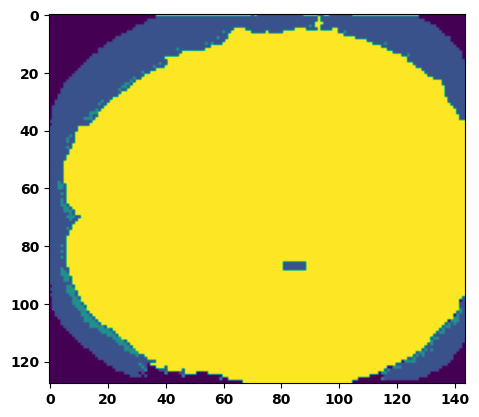

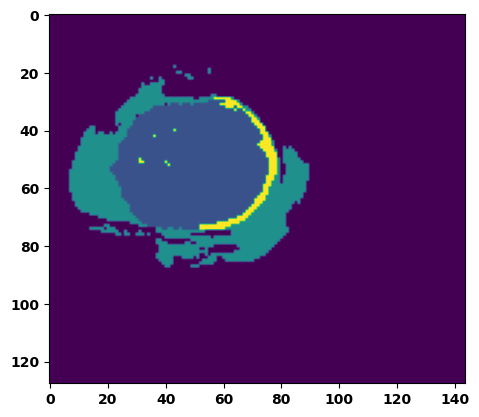

  6%|▌         | 2/36 [00:03<00:50,  1.49s/it]

Batch_id:  1 Eval loss:  0.9590541124343872
Batch_id:  1 Eval IoU:  tensor(0.0234, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.3855, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.2221, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8574, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8981, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.1789, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.40s/it]

Batch_id:  2 Eval loss:  0.7648175954818726
Batch_id:  2 Eval IoU:  tensor(0.3504, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9921, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.52s/it]

Batch_id:  3 Eval loss:  0.7845139503479004
Batch_id:  3 Eval IoU:  tensor(0.2206, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6881, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.5830, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.5996, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.47s/it]

Batch_id:  4 Eval loss:  0.8162456750869751
Batch_id:  4 Eval IoU:  tensor(0.1560, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6643, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.5362, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.5580, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:47,  1.59s/it]

Batch_id:  5 Eval loss:  0.8838010430335999
Batch_id:  5 Eval IoU:  tensor(0.1739, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4683, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.2349, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2081, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:44,  1.53s/it]

Batch_id:  6 Eval loss:  0.7719153165817261
Batch_id:  6 Eval IoU:  tensor(0.3267, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:41,  1.48s/it]

Batch_id:  7 Eval loss:  0.7631876468658447
Batch_id:  7 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.47s/it]

Batch_id:  8 Eval loss:  0.8915619850158691
Batch_id:  8 Eval IoU:  tensor(0.0648, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.4767, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.3087, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2440, device='cuda:0')


 28%|██▊       | 10/36 [00:15<00:39,  1.51s/it]

Batch_id:  9 Eval loss:  0.8761975765228271
Batch_id:  9 Eval IoU:  tensor(0.1337, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.5339, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.3257, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.3171, device='cuda:0')
Batch_id:  10 Eval loss:  0.61823970079422
Batch_id:  10 Eval IoU:  tensor(0.5408, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9682, device='cuda:0')


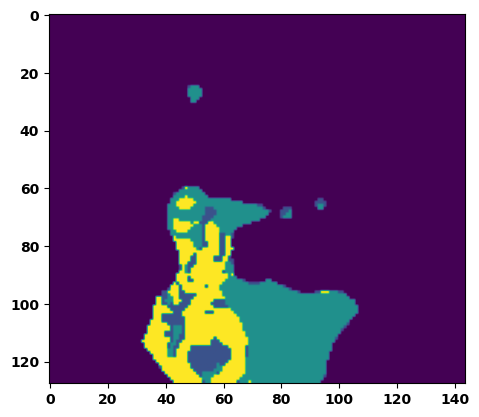

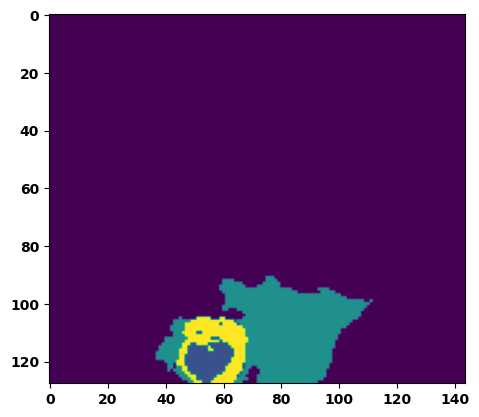

 33%|███▎      | 12/36 [00:18<00:37,  1.56s/it]

Batch_id:  11 Eval loss:  0.7378304600715637
Batch_id:  11 Eval IoU:  tensor(0.3347, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8167, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.7382, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.7487, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.50s/it]

Batch_id:  12 Eval loss:  0.6763204336166382
Batch_id:  12 Eval IoU:  tensor(0.3595, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8977, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8565, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8879, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9770, device='cuda:0')


 39%|███▉      | 14/36 [00:21<00:32,  1.49s/it]

Batch_id:  13 Eval loss:  0.9507067203521729
Batch_id:  13 Eval IoU:  tensor(0.0350, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.4238, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.1566, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.1682, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:32,  1.56s/it]

Batch_id:  14 Eval loss:  0.7414759993553162
Batch_id:  14 Eval IoU:  tensor(0.2010, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8053, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 44%|████▍     | 16/36 [00:24<00:30,  1.54s/it]

Batch_id:  15 Eval loss:  0.8464741706848145
Batch_id:  15 Eval IoU:  tensor(0.1601, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6412, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5002, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.4682, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:30,  1.59s/it]

Batch_id:  16 Eval loss:  0.7655636668205261
Batch_id:  16 Eval IoU:  tensor(0.3148, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 50%|█████     | 18/36 [00:27<00:28,  1.58s/it]

Batch_id:  17 Eval loss:  0.7820720672607422
Batch_id:  17 Eval IoU:  tensor(0.2261, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8556, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8036, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.7944, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:26,  1.54s/it]

Batch_id:  18 Eval loss:  0.6702529788017273
Batch_id:  18 Eval IoU:  tensor(0.2680, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7080, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.5724, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7156, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8693, device='cuda:0')


 56%|█████▌    | 20/36 [00:30<00:24,  1.56s/it]

Batch_id:  19 Eval loss:  0.6851120591163635
Batch_id:  19 Eval IoU:  tensor(0.3249, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8617, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8085, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8568, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  20 Eval loss:  0.7572461366653442
Batch_id:  20 Eval IoU:  tensor(0.2675, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9332, device='cuda:0')


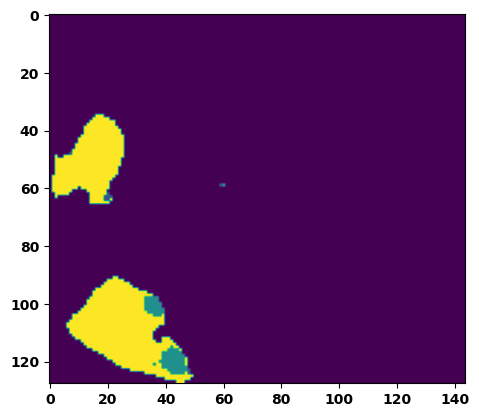

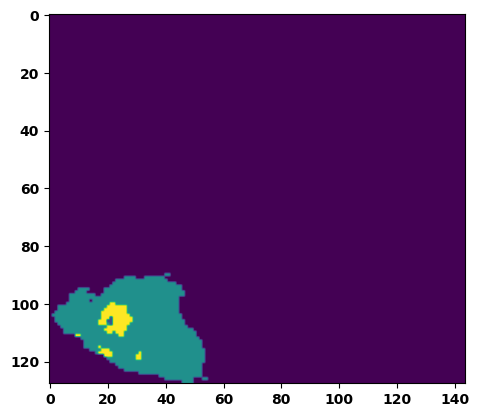

 61%|██████    | 22/36 [00:33<00:21,  1.55s/it]

Batch_id:  21 Eval loss:  0.8636345863342285
Batch_id:  21 Eval IoU:  tensor(0.1223, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.4665, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.2492, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.2547, device='cuda:0')


 64%|██████▍   | 23/36 [00:35<00:19,  1.49s/it]

Batch_id:  22 Eval loss:  0.9176359176635742
Batch_id:  22 Eval IoU:  tensor(0.0562, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.4560, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.3242, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.8906, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8617, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.2914, device='cuda:0')


 67%|██████▋   | 24/36 [00:36<00:17,  1.46s/it]

Batch_id:  23 Eval loss:  0.9295880198478699
Batch_id:  23 Eval IoU:  tensor(0.0394, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.4142, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.2148, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.7992, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.2811, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:15,  1.42s/it]

Batch_id:  24 Eval loss:  0.9289302825927734
Batch_id:  24 Eval IoU:  tensor(0.0355, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4103, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.2367, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8745, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.1710, device='cuda:0')


 72%|███████▏  | 26/36 [00:39<00:14,  1.48s/it]

Batch_id:  25 Eval loss:  0.8846758604049683
Batch_id:  25 Eval IoU:  tensor(0.0765, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4875, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3508, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8616, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.2952, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.5990961790084839
Batch_id:  26 Eval IoU:  tensor(0.4469, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8602, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8233, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.7979, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9748, device='cuda:0')


 78%|███████▊  | 28/36 [00:42<00:12,  1.51s/it]

Batch_id:  27 Eval loss:  0.7168475389480591
Batch_id:  27 Eval IoU:  tensor(0.4162, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8732, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8360, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.8132, device='cuda:0')


 81%|████████  | 29/36 [00:44<00:10,  1.55s/it]

Batch_id:  28 Eval loss:  0.721943199634552
Batch_id:  28 Eval IoU:  tensor(0.2543, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5424, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3711, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3904, device='cuda:0')


 83%|████████▎ | 30/36 [00:45<00:09,  1.58s/it]

Batch_id:  29 Eval loss:  0.7943856120109558
Batch_id:  29 Eval IoU:  tensor(0.1475, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5939, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5823, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8296, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3972, device='cuda:0')
Batch_id:  30 Eval loss:  0.6647199392318726
Batch_id:  30 Eval IoU:  tensor(0.4890, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')


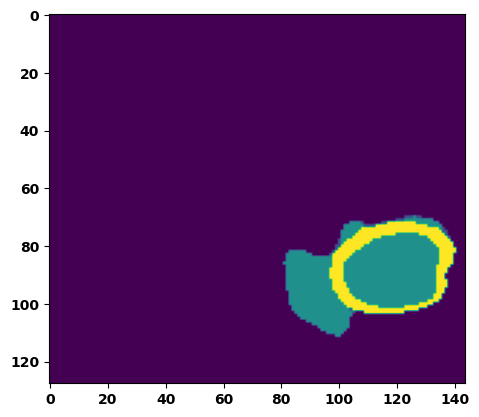

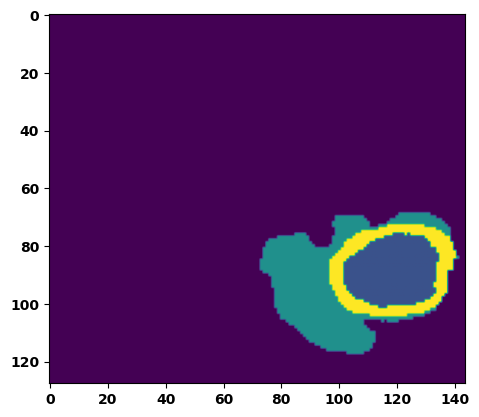

 89%|████████▉ | 32/36 [00:48<00:06,  1.59s/it]

Batch_id:  31 Eval loss:  0.8015433549880981
Batch_id:  31 Eval IoU:  tensor(0.1566, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5994, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4591, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.4122, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


 92%|█████████▏| 33/36 [00:50<00:04,  1.58s/it]

Batch_id:  32 Eval loss:  0.8507241606712341
Batch_id:  32 Eval IoU:  tensor(0.1737, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.5911, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3973, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.4048, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9882, device='cuda:0')


 94%|█████████▍| 34/36 [00:51<00:03,  1.56s/it]

Batch_id:  33 Eval loss:  0.7604568600654602
Batch_id:  33 Eval IoU:  tensor(0.2969, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.5424, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3286, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.3340, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9780, device='cuda:0')


 97%|█████████▋| 35/36 [00:53<00:01,  1.61s/it]

Batch_id:  34 Eval loss:  0.8228339552879333
Batch_id:  34 Eval IoU:  tensor(0.1426, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.5871, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4121, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8949, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8827, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.5715, device='cuda:0')


100%|██████████| 36/36 [00:54<00:00,  1.53s/it]

Batch_id:  35 Eval loss:  0.7803001999855042
Batch_id:  35 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Epoch  1 Training loss:  0.6608245659958233
Epoch  1 Evaluation loss:  0.7984612269534005
Epoch  1 Training accuracy :  tensor(0.4893)
Epoch  1 Evaluation accuracy :  tensor(0.2168)
Epoch  1 Training Mean Dice Score:  tensor(0.9129)
Epoch  1 Eval Mean Dice Score:  tensor(0.6867)
Epoch  1 Training Non-tumor Dice Score:  tensor(0.9024)
Epoch  1 Eval Non-tumor Dice Score:  tensor(0.5794)
Epoch  1 Training NCR/NET Dice Score:  tensor(0.9581)
Epoch  1 Eval NCR/NET Dice Score:  tensor(0.9425)
Epoch  1 Training ED Dice Score:  tensor(0.9235)
Epoch  1

Epoch: 2
Training in session: 


  1%|          | 1/110 [00:01<03:07,  1.72s/it]

Batch_id:  0 Training loss:  0.46080678701400757
Batch_id:  0 Training IoU:  tensor(0.8174, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:55,  1.63s/it]

Batch_id:  1 Training loss:  0.4827984571456909
Batch_id:  1 Training IoU:  tensor(0.5955, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:43,  1.52s/it]

Batch_id:  2 Training loss:  0.6655564904212952
Batch_id:  2 Training IoU:  tensor(0.3543, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.8854, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.8411, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9189, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9263, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:43,  1.54s/it]

Batch_id:  3 Training loss:  0.5107012987136841
Batch_id:  3 Training IoU:  tensor(0.6559, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:37,  1.50s/it]

Batch_id:  4 Training loss:  0.6630694270133972
Batch_id:  4 Training IoU:  tensor(0.3407, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.8657, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.8018, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9087, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9158, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:33,  1.48s/it]

Batch_id:  5 Training loss:  0.5578834414482117
Batch_id:  5 Training IoU:  tensor(0.6120, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:37,  1.52s/it]

Batch_id:  6 Training loss:  0.5121458768844604
Batch_id:  6 Training IoU:  tensor(0.5573, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:34,  1.52s/it]

Batch_id:  7 Training loss:  0.5223107933998108
Batch_id:  7 Training IoU:  tensor(0.7077, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:28,  1.47s/it]

Batch_id:  8 Training loss:  0.5996415615081787
Batch_id:  8 Training IoU:  tensor(0.5097, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9658, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:24,  1.44s/it]

Batch_id:  9 Training loss:  0.45919278264045715
Batch_id:  9 Training IoU:  tensor(0.7889, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 10%|█         | 11/110 [00:16<02:26,  1.48s/it]

Batch_id:  10 Training loss:  0.5987988114356995
Batch_id:  10 Training IoU:  tensor(0.5426, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 11%|█         | 12/110 [00:18<02:26,  1.49s/it]

Batch_id:  11 Training loss:  0.533157229423523
Batch_id:  11 Training IoU:  tensor(0.5908, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9456, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:24,  1.49s/it]

Batch_id:  12 Training loss:  0.6419292092323303
Batch_id:  12 Training IoU:  tensor(0.4411, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9256, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9431, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:26,  1.52s/it]

Batch_id:  13 Training loss:  0.5798579454421997
Batch_id:  13 Training IoU:  tensor(0.5981, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9413, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:24,  1.52s/it]

Batch_id:  14 Training loss:  0.4490315020084381
Batch_id:  14 Training IoU:  tensor(0.7291, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:20,  1.49s/it]

Batch_id:  15 Training loss:  0.5237507224082947
Batch_id:  15 Training IoU:  tensor(0.6734, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:24,  1.55s/it]

Batch_id:  16 Training loss:  0.6236742734909058
Batch_id:  16 Training IoU:  tensor(0.5134, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:19,  1.52s/it]

Batch_id:  17 Training loss:  0.6870132088661194
Batch_id:  17 Training IoU:  tensor(0.4078, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.8652, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.8810, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:19,  1.53s/it]

Batch_id:  18 Training loss:  0.6931086778640747
Batch_id:  18 Training IoU:  tensor(0.4147, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.8843, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.8369, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.8798, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9591, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:22,  1.58s/it]

Batch_id:  19 Training loss:  0.6780927777290344
Batch_id:  19 Training IoU:  tensor(0.3540, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9121, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.8924, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9483, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:18,  1.55s/it]

Batch_id:  20 Training loss:  0.7266756296157837
Batch_id:  20 Training IoU:  tensor(0.3816, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9029, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.8588, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 20%|██        | 22/110 [00:33<02:15,  1.54s/it]

Batch_id:  21 Training loss:  0.4703012704849243
Batch_id:  21 Training IoU:  tensor(0.6995, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 21%|██        | 23/110 [00:34<02:11,  1.52s/it]

Batch_id:  22 Training loss:  0.700235903263092
Batch_id:  22 Training IoU:  tensor(0.3055, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.8701, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.8103, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9118, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:08,  1.49s/it]

Batch_id:  23 Training loss:  0.6324977278709412
Batch_id:  23 Training IoU:  tensor(0.3912, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.8951, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.8725, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9037, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.5948776006698608
Batch_id:  24 Training IoU:  tensor(0.5413, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9363, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:02,  1.46s/it]

Batch_id:  25 Training loss:  0.6752175092697144
Batch_id:  25 Training IoU:  tensor(0.5366, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 25%|██▍       | 27/110 [00:40<01:57,  1.42s/it]

Batch_id:  26 Training loss:  0.627443790435791
Batch_id:  26 Training IoU:  tensor(0.4624, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9202, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.8927, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9527, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:54,  1.40s/it]

Batch_id:  27 Training loss:  0.545317530632019
Batch_id:  27 Training IoU:  tensor(0.7161, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 26%|██▋       | 29/110 [00:43<01:52,  1.39s/it]

Batch_id:  28 Training loss:  0.5459561347961426
Batch_id:  28 Training IoU:  tensor(0.6472, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:53,  1.42s/it]

Batch_id:  29 Training loss:  0.7327703237533569
Batch_id:  29 Training IoU:  tensor(0.2883, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.8799, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.8268, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9440, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:49,  1.38s/it]

Batch_id:  30 Training loss:  0.410305917263031
Batch_id:  30 Training IoU:  tensor(0.7906, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:49,  1.41s/it]

Batch_id:  31 Training loss:  0.6400911808013916
Batch_id:  31 Training IoU:  tensor(0.5012, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 30%|███       | 33/110 [00:48<01:49,  1.42s/it]

Batch_id:  32 Training loss:  0.5718061923980713
Batch_id:  32 Training IoU:  tensor(0.5012, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9622, device='cuda:0')


 31%|███       | 34/110 [00:50<01:49,  1.45s/it]

Batch_id:  33 Training loss:  0.6048139333724976
Batch_id:  33 Training IoU:  tensor(0.5925, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:51,  1.49s/it]

Batch_id:  34 Training loss:  0.4516015648841858
Batch_id:  34 Training IoU:  tensor(0.6018, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9167, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.8903, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:47,  1.45s/it]

Batch_id:  35 Training loss:  0.497057169675827
Batch_id:  35 Training IoU:  tensor(0.8067, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:49,  1.49s/it]

Batch_id:  36 Training loss:  0.7086373567581177
Batch_id:  36 Training IoU:  tensor(0.2477, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.7991, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.7385, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9209, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.8680, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.8700, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:48,  1.50s/it]

Batch_id:  37 Training loss:  0.6722911596298218
Batch_id:  37 Training IoU:  tensor(0.3712, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9715, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:44,  1.47s/it]

Batch_id:  38 Training loss:  0.4627285599708557
Batch_id:  38 Training IoU:  tensor(0.7302, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:41,  1.45s/it]

Batch_id:  39 Training loss:  0.5847032070159912
Batch_id:  39 Training IoU:  tensor(0.5025, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9208, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9048, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.8975, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:36,  1.40s/it]

Batch_id:  40 Training loss:  0.6140776872634888
Batch_id:  40 Training IoU:  tensor(0.5414, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:31,  1.34s/it]

Batch_id:  41 Training loss:  0.5307649374008179
Batch_id:  41 Training IoU:  tensor(0.6393, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:33,  1.39s/it]

Batch_id:  42 Training loss:  0.5450091361999512
Batch_id:  42 Training IoU:  tensor(0.6761, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 40%|████      | 44/110 [01:04<01:32,  1.40s/it]

Batch_id:  43 Training loss:  0.533331573009491
Batch_id:  43 Training IoU:  tensor(0.6064, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 41%|████      | 45/110 [01:06<01:31,  1.40s/it]

Batch_id:  44 Training loss:  0.668846845626831
Batch_id:  44 Training IoU:  tensor(0.3752, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9235, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:31,  1.43s/it]

Batch_id:  45 Training loss:  0.6008975505828857
Batch_id:  45 Training IoU:  tensor(0.5591, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.8937, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.8916, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:30,  1.44s/it]

Batch_id:  46 Training loss:  0.5052083134651184
Batch_id:  46 Training IoU:  tensor(0.7197, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:28,  1.42s/it]

Batch_id:  47 Training loss:  0.5129326581954956
Batch_id:  47 Training IoU:  tensor(0.5916, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:27,  1.44s/it]

Batch_id:  48 Training loss:  0.3961271047592163
Batch_id:  48 Training IoU:  tensor(0.8243, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:27,  1.47s/it]

Batch_id:  49 Training loss:  0.3973819613456726
Batch_id:  49 Training IoU:  tensor(0.7947, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:24,  1.43s/it]

Batch_id:  50 Training loss:  0.4768279790878296
Batch_id:  50 Training IoU:  tensor(0.6727, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:22,  1.43s/it]

Batch_id:  51 Training loss:  0.47586214542388916
Batch_id:  51 Training IoU:  tensor(0.7824, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:22,  1.45s/it]

Batch_id:  52 Training loss:  0.45207586884498596
Batch_id:  52 Training IoU:  tensor(0.6590, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9370, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9242, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9232, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:19,  1.42s/it]

Batch_id:  53 Training loss:  0.464336097240448
Batch_id:  53 Training IoU:  tensor(0.6425, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9695, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.6883587837219238
Batch_id:  54 Training IoU:  tensor(0.3299, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.8778, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.8995, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:18,  1.46s/it]

Batch_id:  55 Training loss:  0.6860349178314209
Batch_id:  55 Training IoU:  tensor(0.3067, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.8735, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.8181, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9212, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:16,  1.45s/it]

Batch_id:  56 Training loss:  0.5903668403625488
Batch_id:  56 Training IoU:  tensor(0.3834, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9039, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9207, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9238, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:19,  1.53s/it]

Batch_id:  57 Training loss:  0.5635262727737427
Batch_id:  57 Training IoU:  tensor(0.5061, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9615, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:16,  1.49s/it]

Batch_id:  58 Training loss:  0.5582362413406372
Batch_id:  58 Training IoU:  tensor(0.4673, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9546, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:15,  1.51s/it]

Batch_id:  59 Training loss:  0.6375035047531128
Batch_id:  59 Training IoU:  tensor(0.3562, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.8947, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.8481, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9339, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:12,  1.48s/it]

Batch_id:  60 Training loss:  0.4314322769641876
Batch_id:  60 Training IoU:  tensor(0.7388, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:13,  1.54s/it]

Batch_id:  61 Training loss:  0.5480126142501831
Batch_id:  61 Training IoU:  tensor(0.4767, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9272, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9391, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:11,  1.52s/it]

Batch_id:  62 Training loss:  0.4550211727619171
Batch_id:  62 Training IoU:  tensor(0.6358, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9290, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:07,  1.47s/it]

Batch_id:  63 Training loss:  0.460678368806839
Batch_id:  63 Training IoU:  tensor(0.6931, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:05,  1.45s/it]

Batch_id:  64 Training loss:  0.5640761852264404
Batch_id:  64 Training IoU:  tensor(0.5385, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:05,  1.50s/it]

Batch_id:  65 Training loss:  0.5512683987617493
Batch_id:  65 Training IoU:  tensor(0.5009, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9720, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.46059730648994446
Batch_id:  66 Training IoU:  tensor(0.6461, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:02,  1.48s/it]

Batch_id:  67 Training loss:  0.34988608956336975
Batch_id:  67 Training IoU:  tensor(0.7902, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:01,  1.50s/it]

Batch_id:  68 Training loss:  0.46258506178855896
Batch_id:  68 Training IoU:  tensor(0.6832, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9254, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:59,  1.50s/it]

Batch_id:  69 Training loss:  0.48248201608657837
Batch_id:  69 Training IoU:  tensor(0.6876, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:58,  1.50s/it]

Batch_id:  70 Training loss:  0.5073773860931396
Batch_id:  70 Training IoU:  tensor(0.6166, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:57,  1.50s/it]

Batch_id:  71 Training loss:  0.5825505256652832
Batch_id:  71 Training IoU:  tensor(0.5365, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9225, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:54,  1.46s/it]

Batch_id:  72 Training loss:  0.4736027717590332
Batch_id:  72 Training IoU:  tensor(0.5601, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9298, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9386, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9009, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.7473538517951965
Batch_id:  73 Training IoU:  tensor(0.2450, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.8741, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.8366, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.8647, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9357, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:51,  1.48s/it]

Batch_id:  74 Training loss:  0.3926106095314026
Batch_id:  74 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9720, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:50,  1.48s/it]

Batch_id:  75 Training loss:  0.519193172454834
Batch_id:  75 Training IoU:  tensor(0.5262, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:45,  1.39s/it]

Batch_id:  76 Training loss:  0.40926021337509155
Batch_id:  76 Training IoU:  tensor(0.7489, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:44,  1.39s/it]

Batch_id:  77 Training loss:  0.4362937808036804
Batch_id:  77 Training IoU:  tensor(0.5693, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9240, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9599, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:43,  1.40s/it]

Batch_id:  78 Training loss:  0.7001200318336487
Batch_id:  78 Training IoU:  tensor(0.2660, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.8558, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.8060, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9047, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9115, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9450, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:42,  1.41s/it]

Batch_id:  79 Training loss:  0.3955146074295044
Batch_id:  79 Training IoU:  tensor(0.7903, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:43,  1.49s/it]

Batch_id:  80 Training loss:  0.6409870386123657
Batch_id:  80 Training IoU:  tensor(0.4606, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:41,  1.47s/it]

Batch_id:  81 Training loss:  0.4931218922138214
Batch_id:  81 Training IoU:  tensor(0.5600, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:40,  1.51s/it]

Batch_id:  82 Training loss:  0.4102093279361725
Batch_id:  82 Training IoU:  tensor(0.7360, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:38,  1.49s/it]

Batch_id:  83 Training loss:  0.5781310796737671
Batch_id:  83 Training IoU:  tensor(0.4377, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9701, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:37,  1.51s/it]

Batch_id:  84 Training loss:  0.45606356859207153
Batch_id:  84 Training IoU:  tensor(0.6364, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:35,  1.50s/it]

Batch_id:  85 Training loss:  0.4793263077735901
Batch_id:  85 Training IoU:  tensor(0.6594, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:33,  1.48s/it]

Batch_id:  86 Training loss:  0.4958752989768982
Batch_id:  86 Training IoU:  tensor(0.5803, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.5200519561767578
Batch_id:  87 Training IoU:  tensor(0.6122, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:30,  1.45s/it]

Batch_id:  88 Training loss:  0.38078442215919495
Batch_id:  88 Training IoU:  tensor(0.6760, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:29,  1.46s/it]

Batch_id:  89 Training loss:  0.41777607798576355
Batch_id:  89 Training IoU:  tensor(0.6671, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.4480931758880615
Batch_id:  90 Training IoU:  tensor(0.5408, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9256, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9757, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:24,  1.38s/it]

Batch_id:  91 Training loss:  0.5211009383201599
Batch_id:  91 Training IoU:  tensor(0.4559, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9643, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:23,  1.39s/it]

Batch_id:  92 Training loss:  0.4761032462120056
Batch_id:  92 Training IoU:  tensor(0.5457, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9224, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9155, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:22,  1.40s/it]

Batch_id:  93 Training loss:  0.6329464316368103
Batch_id:  93 Training IoU:  tensor(0.3547, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9188, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9068, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9193, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:21,  1.43s/it]

Batch_id:  94 Training loss:  0.5987333059310913
Batch_id:  94 Training IoU:  tensor(0.4325, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9162, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9590, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:19,  1.41s/it]

Batch_id:  95 Training loss:  0.41532641649246216
Batch_id:  95 Training IoU:  tensor(0.7397, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:18,  1.44s/it]

Batch_id:  96 Training loss:  0.4240773916244507
Batch_id:  96 Training IoU:  tensor(0.6724, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:17,  1.45s/it]

Batch_id:  97 Training loss:  0.5177546739578247
Batch_id:  97 Training IoU:  tensor(0.5754, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9282, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9665, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:15,  1.43s/it]

Batch_id:  98 Training loss:  0.4289243817329407
Batch_id:  98 Training IoU:  tensor(0.6726, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:14,  1.46s/it]

Batch_id:  99 Training loss:  0.551384687423706
Batch_id:  99 Training IoU:  tensor(0.4511, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9670, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.49s/it]

Batch_id:  100 Training loss:  0.4357615113258362
Batch_id:  100 Training IoU:  tensor(0.5948, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9346, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:11,  1.48s/it]

Batch_id:  101 Training loss:  0.447534441947937
Batch_id:  101 Training IoU:  tensor(0.5864, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.44s/it]

Batch_id:  102 Training loss:  0.4316273033618927
Batch_id:  102 Training IoU:  tensor(0.7218, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.47s/it]

Batch_id:  103 Training loss:  0.4994329810142517
Batch_id:  103 Training IoU:  tensor(0.5527, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9462, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.51s/it]

Batch_id:  104 Training loss:  0.4133870601654053
Batch_id:  104 Training IoU:  tensor(0.5983, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9664, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.5838688611984253
Batch_id:  105 Training IoU:  tensor(0.4459, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9297, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.45s/it]

Batch_id:  106 Training loss:  0.47251129150390625
Batch_id:  106 Training IoU:  tensor(0.6344, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:02,  1.45s/it]

Batch_id:  107 Training loss:  0.4031139016151428
Batch_id:  107 Training IoU:  tensor(0.6692, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.40s/it]

Batch_id:  108 Training loss:  0.46767693758010864
Batch_id:  108 Training IoU:  tensor(0.6314, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9737, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.34324997663497925
Batch_id:  109 Training IoU:  tensor(0.7444, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9893, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4891778230667114
Batch_id:  0 Eval IoU:  tensor(0.7100, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


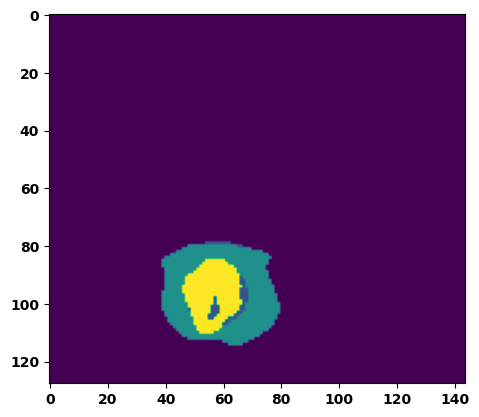

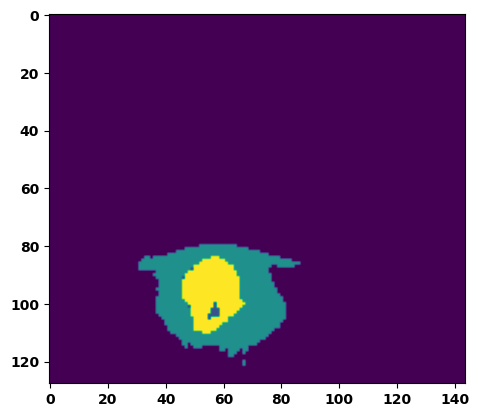

  6%|▌         | 2/36 [00:03<00:50,  1.49s/it]

Batch_id:  1 Eval loss:  0.4954688549041748
Batch_id:  1 Eval IoU:  tensor(0.5870, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9229, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9290, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.39s/it]

Batch_id:  2 Eval loss:  0.7511038780212402
Batch_id:  2 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.41s/it]

Batch_id:  3 Eval loss:  0.8965523838996887
Batch_id:  3 Eval IoU:  tensor(0.0526, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.4440, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.2600, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8440, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.2722, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:47,  1.52s/it]

Batch_id:  4 Eval loss:  0.7472941279411316
Batch_id:  4 Eval IoU:  tensor(0.2425, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:45,  1.51s/it]

Batch_id:  5 Eval loss:  0.5881541967391968
Batch_id:  5 Eval IoU:  tensor(0.6133, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:43,  1.51s/it]

Batch_id:  6 Eval loss:  0.7514659762382507
Batch_id:  6 Eval IoU:  tensor(0.2201, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8806, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:41,  1.48s/it]

Batch_id:  7 Eval loss:  0.600853443145752
Batch_id:  7 Eval IoU:  tensor(0.3981, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9124, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9787, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:40,  1.51s/it]

Batch_id:  8 Eval loss:  0.6532527208328247
Batch_id:  8 Eval IoU:  tensor(0.2897, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.7982, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8810, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9278, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.47s/it]

Batch_id:  9 Eval loss:  0.7106317281723022
Batch_id:  9 Eval IoU:  tensor(0.3270, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  10 Eval loss:  0.7602174282073975
Batch_id:  10 Eval IoU:  tensor(0.1819, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5534, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4182, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.3505, device='cuda:0')


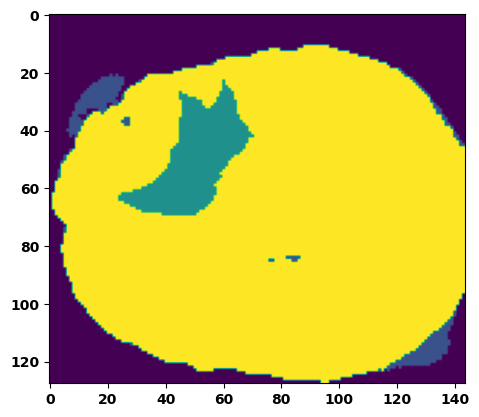

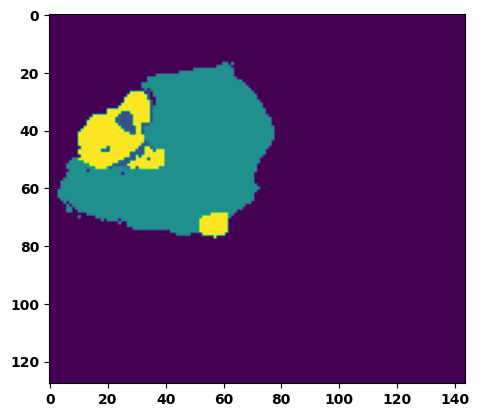

 33%|███▎      | 12/36 [00:18<00:37,  1.54s/it]

Batch_id:  11 Eval loss:  0.6364767551422119
Batch_id:  11 Eval IoU:  tensor(0.4116, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.53s/it]

Batch_id:  12 Eval loss:  0.7282682657241821
Batch_id:  12 Eval IoU:  tensor(0.2841, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 39%|███▉      | 14/36 [00:21<00:33,  1.50s/it]

Batch_id:  13 Eval loss:  0.7271279692649841
Batch_id:  13 Eval IoU:  tensor(0.3039, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.7492959499359131
Batch_id:  14 Eval IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 44%|████▍     | 16/36 [00:24<00:31,  1.56s/it]

Batch_id:  15 Eval loss:  0.6367725729942322
Batch_id:  15 Eval IoU:  tensor(0.3542, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.50s/it]

Batch_id:  16 Eval loss:  0.7562474012374878
Batch_id:  16 Eval IoU:  tensor(0.2337, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.47s/it]

Batch_id:  17 Eval loss:  0.7292641997337341
Batch_id:  17 Eval IoU:  tensor(0.2549, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9011, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:24,  1.45s/it]

Batch_id:  18 Eval loss:  0.728670597076416
Batch_id:  18 Eval IoU:  tensor(0.2379, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8911, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8369, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.43s/it]

Batch_id:  19 Eval loss:  0.7607184648513794
Batch_id:  19 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Eval loss:  0.6874452829360962
Batch_id:  20 Eval IoU:  tensor(0.3689, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9304, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


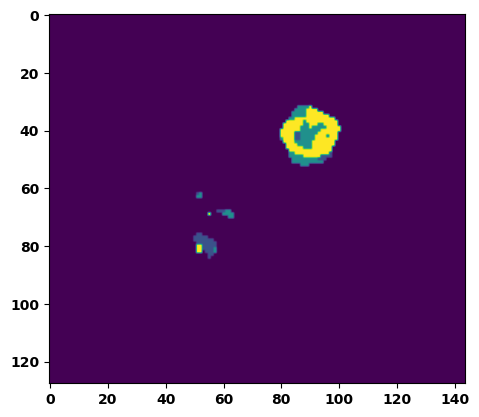

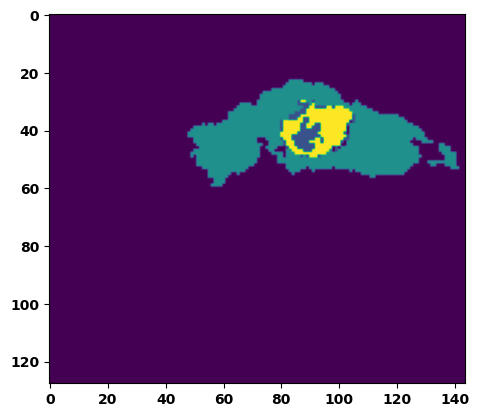

 61%|██████    | 22/36 [00:33<00:21,  1.53s/it]

Batch_id:  21 Eval loss:  0.588307797908783
Batch_id:  21 Eval IoU:  tensor(0.5583, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.49s/it]

Batch_id:  22 Eval loss:  0.7636697888374329
Batch_id:  22 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.51s/it]

Batch_id:  23 Eval loss:  0.7083100080490112
Batch_id:  23 Eval IoU:  tensor(0.2912, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.50s/it]

Batch_id:  24 Eval loss:  0.4581792950630188
Batch_id:  24 Eval IoU:  tensor(0.5378, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9557, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.45s/it]

Batch_id:  25 Eval loss:  0.7601262927055359
Batch_id:  25 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.7617929577827454
Batch_id:  26 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.48s/it]

Batch_id:  27 Eval loss:  0.5714870095252991
Batch_id:  27 Eval IoU:  tensor(0.5098, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9897, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.51s/it]

Batch_id:  28 Eval loss:  0.3599555492401123
Batch_id:  28 Eval IoU:  tensor(0.7040, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9822, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.47s/it]

Batch_id:  29 Eval loss:  0.6466923952102661
Batch_id:  29 Eval IoU:  tensor(0.4662, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  30 Eval loss:  0.9176805019378662
Batch_id:  30 Eval IoU:  tensor(0.0491, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4425, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3075, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.1855, device='cuda:0')


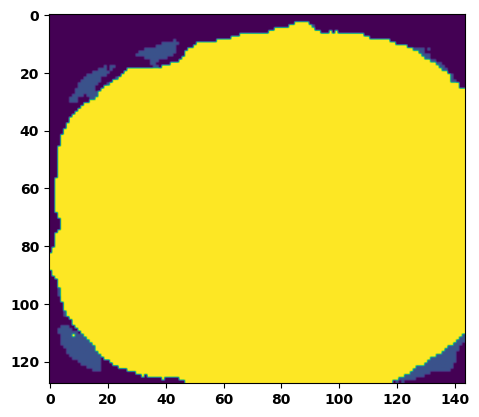

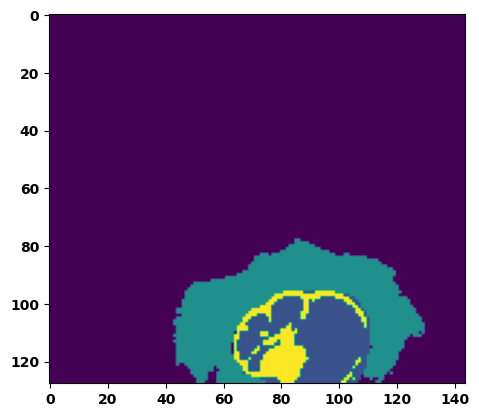

 89%|████████▉ | 32/36 [00:47<00:05,  1.49s/it]

Batch_id:  31 Eval loss:  0.8435184359550476
Batch_id:  31 Eval IoU:  tensor(0.1712, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5828, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3772, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.3774, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9937, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.48s/it]

Batch_id:  32 Eval loss:  0.4661402702331543
Batch_id:  32 Eval IoU:  tensor(0.5311, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8786, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8238, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8198, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.47s/it]

Batch_id:  33 Eval loss:  0.7292112708091736
Batch_id:  33 Eval IoU:  tensor(0.1995, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.7981, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.51s/it]

Batch_id:  34 Eval loss:  0.8816240429878235
Batch_id:  34 Eval IoU:  tensor(0.0653, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.4576, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.3054, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9306, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.2265, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.49s/it]

Batch_id:  35 Eval loss:  0.9421881437301636
Batch_id:  35 Eval IoU:  tensor(0.0352, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4097, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.2887, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.7937, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2253, device='cuda:0')
Epoch  2 Training loss:  0.5319128152999011
Epoch  2 Evaluation loss:  0.6939817716677984
Epoch  2 Training accuracy :  tensor(0.5718)
Epoch  2 Evaluation accuracy :  tensor(0.3209)
Epoch  2 Training Mean Dice Score:  tensor(0.9419)
Epoch  2 Eval Mean Dice Score:  tensor(0.8648)
Epoch  2 Training Non-tumor Dice Score:  tensor(0.9376)
Epoch  2 Eval Non-tumor Dice Score:  tensor(0.8243)
Epoch  2 Training NCR/NET Dice Score:  tensor(0.9737)
Epoch  2 Eval NCR/NET Dice Score:  tensor(0.9657)
Epoch  2 Training ED Dice Score:  tensor(0.9432)
Epoch  2

Epoch: 3
Training in session: 


  1%|          | 1/110 [00:01<02:59,  1.64s/it]

Batch_id:  0 Training loss:  0.32276684045791626
Batch_id:  0 Training IoU:  tensor(0.7809, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:46,  1.54s/it]

Batch_id:  1 Training loss:  0.39944636821746826
Batch_id:  1 Training IoU:  tensor(0.6674, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:38,  1.48s/it]

Batch_id:  2 Training loss:  0.3096839487552643
Batch_id:  2 Training IoU:  tensor(0.7858, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:38,  1.50s/it]

Batch_id:  3 Training loss:  0.37800320982933044
Batch_id:  3 Training IoU:  tensor(0.7351, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:33,  1.47s/it]

Batch_id:  4 Training loss:  0.3464266061782837
Batch_id:  4 Training IoU:  tensor(0.7017, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:35,  1.49s/it]

Batch_id:  5 Training loss:  0.4809079170227051
Batch_id:  5 Training IoU:  tensor(0.6006, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:31,  1.47s/it]

Batch_id:  6 Training loss:  0.2777930498123169
Batch_id:  6 Training IoU:  tensor(0.8674, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:30,  1.47s/it]

Batch_id:  7 Training loss:  0.5364947319030762
Batch_id:  7 Training IoU:  tensor(0.4916, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9282, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9113, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9629, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:35,  1.53s/it]

Batch_id:  8 Training loss:  0.42993322014808655
Batch_id:  8 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:34,  1.54s/it]

Batch_id:  9 Training loss:  0.49198684096336365
Batch_id:  9 Training IoU:  tensor(0.5953, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 10%|█         | 11/110 [00:16<02:32,  1.54s/it]

Batch_id:  10 Training loss:  0.42712634801864624
Batch_id:  10 Training IoU:  tensor(0.6834, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 11%|█         | 12/110 [00:18<02:26,  1.49s/it]

Batch_id:  11 Training loss:  0.46439579129219055
Batch_id:  11 Training IoU:  tensor(0.6140, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9316, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9282, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:26,  1.51s/it]

Batch_id:  12 Training loss:  0.37722545862197876
Batch_id:  12 Training IoU:  tensor(0.5947, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9181, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9705, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:22,  1.49s/it]

Batch_id:  13 Training loss:  0.4325431287288666
Batch_id:  13 Training IoU:  tensor(0.6954, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:20,  1.47s/it]

Batch_id:  14 Training loss:  0.4247037470340729
Batch_id:  14 Training IoU:  tensor(0.6780, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:15,  1.44s/it]

Batch_id:  15 Training loss:  0.5206927061080933
Batch_id:  15 Training IoU:  tensor(0.5296, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:20,  1.52s/it]

Batch_id:  16 Training loss:  0.5358986854553223
Batch_id:  16 Training IoU:  tensor(0.4881, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9652, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:19,  1.52s/it]

Batch_id:  17 Training loss:  0.46965014934539795
Batch_id:  17 Training IoU:  tensor(0.5213, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9162, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9570, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:19,  1.54s/it]

Batch_id:  18 Training loss:  0.30567121505737305
Batch_id:  18 Training IoU:  tensor(0.8116, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:16,  1.51s/it]

Batch_id:  19 Training loss:  0.6210143566131592
Batch_id:  19 Training IoU:  tensor(0.3949, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9096, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9395, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:27,  1.66s/it]

Batch_id:  20 Training loss:  0.2993965744972229
Batch_id:  20 Training IoU:  tensor(0.7516, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 20%|██        | 22/110 [00:33<02:25,  1.66s/it]

Batch_id:  21 Training loss:  0.344379186630249
Batch_id:  21 Training IoU:  tensor(0.7133, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 21%|██        | 23/110 [00:35<02:22,  1.64s/it]

Batch_id:  22 Training loss:  0.46407103538513184
Batch_id:  22 Training IoU:  tensor(0.5537, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:15,  1.58s/it]

Batch_id:  23 Training loss:  0.3378753960132599
Batch_id:  23 Training IoU:  tensor(0.6933, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


 23%|██▎       | 25/110 [00:38<02:15,  1.60s/it]

Batch_id:  24 Training loss:  0.35279446840286255
Batch_id:  24 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 24%|██▎       | 26/110 [00:40<02:14,  1.60s/it]

Batch_id:  25 Training loss:  0.3379117250442505
Batch_id:  25 Training IoU:  tensor(0.6833, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9586, device='cuda:0')


 25%|██▍       | 27/110 [00:41<02:10,  1.57s/it]

Batch_id:  26 Training loss:  0.3730050027370453
Batch_id:  26 Training IoU:  tensor(0.6763, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 25%|██▌       | 28/110 [00:43<02:07,  1.56s/it]

Batch_id:  27 Training loss:  0.25928643345832825
Batch_id:  27 Training IoU:  tensor(0.8330, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 26%|██▋       | 29/110 [00:44<02:05,  1.55s/it]

Batch_id:  28 Training loss:  0.3986166715621948
Batch_id:  28 Training IoU:  tensor(0.6850, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9298, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 27%|██▋       | 30/110 [00:46<02:02,  1.53s/it]

Batch_id:  29 Training loss:  0.33717137575149536
Batch_id:  29 Training IoU:  tensor(0.8318, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 28%|██▊       | 31/110 [00:47<02:00,  1.53s/it]

Batch_id:  30 Training loss:  0.32947438955307007
Batch_id:  30 Training IoU:  tensor(0.7316, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 29%|██▉       | 32/110 [00:49<01:58,  1.51s/it]

Batch_id:  31 Training loss:  0.5564842224121094
Batch_id:  31 Training IoU:  tensor(0.4470, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9337, device='cuda:0')


 30%|███       | 33/110 [00:50<01:56,  1.51s/it]

Batch_id:  32 Training loss:  0.6639077067375183
Batch_id:  32 Training IoU:  tensor(0.3114, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.8901, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.8406, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9509, device='cuda:0')


 31%|███       | 34/110 [00:52<01:58,  1.56s/it]

Batch_id:  33 Training loss:  0.27609431743621826
Batch_id:  33 Training IoU:  tensor(0.8752, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 32%|███▏      | 35/110 [00:53<01:58,  1.58s/it]

Batch_id:  34 Training loss:  0.5888817310333252
Batch_id:  34 Training IoU:  tensor(0.4269, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 33%|███▎      | 36/110 [00:55<01:57,  1.59s/it]

Batch_id:  35 Training loss:  0.38221877813339233
Batch_id:  35 Training IoU:  tensor(0.7221, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:53,  1.56s/it]

Batch_id:  36 Training loss:  0.2987591028213501
Batch_id:  36 Training IoU:  tensor(0.7654, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 35%|███▍      | 38/110 [00:58<01:47,  1.49s/it]

Batch_id:  37 Training loss:  0.363444447517395
Batch_id:  37 Training IoU:  tensor(0.7928, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:46,  1.50s/it]

Batch_id:  38 Training loss:  0.40974390506744385
Batch_id:  38 Training IoU:  tensor(0.6472, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


 36%|███▋      | 40/110 [01:01<01:42,  1.46s/it]

Batch_id:  39 Training loss:  0.40205278992652893
Batch_id:  39 Training IoU:  tensor(0.7328, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 37%|███▋      | 41/110 [01:02<01:41,  1.47s/it]

Batch_id:  40 Training loss:  0.4874719977378845
Batch_id:  40 Training IoU:  tensor(0.6327, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 38%|███▊      | 42/110 [01:04<01:40,  1.47s/it]

Batch_id:  41 Training loss:  0.4838216304779053
Batch_id:  41 Training IoU:  tensor(0.5351, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 39%|███▉      | 43/110 [01:05<01:35,  1.42s/it]

Batch_id:  42 Training loss:  0.5617028474807739
Batch_id:  42 Training IoU:  tensor(0.4393, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 40%|████      | 44/110 [01:06<01:33,  1.41s/it]

Batch_id:  43 Training loss:  0.5918498039245605
Batch_id:  43 Training IoU:  tensor(0.3935, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9103, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


 41%|████      | 45/110 [01:08<01:31,  1.40s/it]

Batch_id:  44 Training loss:  0.4632442891597748
Batch_id:  44 Training IoU:  tensor(0.6716, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:29,  1.40s/it]

Batch_id:  45 Training loss:  0.38049203157424927
Batch_id:  45 Training IoU:  tensor(0.6546, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:29,  1.42s/it]

Batch_id:  46 Training loss:  0.35653600096702576
Batch_id:  46 Training IoU:  tensor(0.7360, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:25,  1.37s/it]

Batch_id:  47 Training loss:  0.33153849840164185
Batch_id:  47 Training IoU:  tensor(0.7207, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:24,  1.39s/it]

Batch_id:  48 Training loss:  0.4848894774913788
Batch_id:  48 Training IoU:  tensor(0.6783, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 45%|████▌     | 50/110 [01:15<01:22,  1.38s/it]

Batch_id:  49 Training loss:  0.3261765241622925
Batch_id:  49 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:21,  1.38s/it]

Batch_id:  50 Training loss:  0.39714038372039795
Batch_id:  50 Training IoU:  tensor(0.6583, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:21,  1.40s/it]

Batch_id:  51 Training loss:  0.570097804069519
Batch_id:  51 Training IoU:  tensor(0.4483, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:21,  1.42s/it]

Batch_id:  52 Training loss:  0.3010242283344269
Batch_id:  52 Training IoU:  tensor(0.6799, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9282, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:18,  1.41s/it]

Batch_id:  53 Training loss:  0.46721237897872925
Batch_id:  53 Training IoU:  tensor(0.5548, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:17,  1.41s/it]

Batch_id:  54 Training loss:  0.41024360060691833
Batch_id:  54 Training IoU:  tensor(0.7015, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:15,  1.40s/it]

Batch_id:  55 Training loss:  0.40720462799072266
Batch_id:  55 Training IoU:  tensor(0.5736, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.8988, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:14,  1.40s/it]

Batch_id:  56 Training loss:  0.6124873161315918
Batch_id:  56 Training IoU:  tensor(0.3829, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9261, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9349, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9007, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:13,  1.42s/it]

Batch_id:  57 Training loss:  0.3573063611984253
Batch_id:  57 Training IoU:  tensor(0.7264, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:12,  1.42s/it]

Batch_id:  58 Training loss:  0.4551424980163574
Batch_id:  58 Training IoU:  tensor(0.5695, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 55%|█████▍    | 60/110 [01:29<01:12,  1.46s/it]

Batch_id:  59 Training loss:  0.3558834493160248
Batch_id:  59 Training IoU:  tensor(0.6620, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 55%|█████▌    | 61/110 [01:31<01:16,  1.55s/it]

Batch_id:  60 Training loss:  0.4859321117401123
Batch_id:  60 Training IoU:  tensor(0.4218, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9131, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9084, device='cuda:0')


 56%|█████▋    | 62/110 [01:32<01:11,  1.49s/it]

Batch_id:  61 Training loss:  0.4348062574863434
Batch_id:  61 Training IoU:  tensor(0.5646, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:05,  1.40s/it]

Batch_id:  62 Training loss:  0.42970019578933716
Batch_id:  62 Training IoU:  tensor(0.6328, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9319, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 58%|█████▊    | 64/110 [01:35<01:03,  1.37s/it]

Batch_id:  63 Training loss:  0.4429931640625
Batch_id:  63 Training IoU:  tensor(0.5420, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9128, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:04,  1.43s/it]

Batch_id:  64 Training loss:  0.5486265420913696
Batch_id:  64 Training IoU:  tensor(0.4840, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 60%|██████    | 66/110 [01:38<01:02,  1.43s/it]

Batch_id:  65 Training loss:  0.2604920268058777
Batch_id:  65 Training IoU:  tensor(0.7740, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:00,  1.40s/it]

Batch_id:  66 Training loss:  0.6194574236869812
Batch_id:  66 Training IoU:  tensor(0.3200, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.8879, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.8923, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.8980, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9675, device='cuda:0')


 62%|██████▏   | 68/110 [01:41<01:02,  1.48s/it]

Batch_id:  67 Training loss:  0.4080820679664612
Batch_id:  67 Training IoU:  tensor(0.6921, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<00:58,  1.43s/it]

Batch_id:  68 Training loss:  0.4561046361923218
Batch_id:  68 Training IoU:  tensor(0.5892, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:56,  1.41s/it]

Batch_id:  69 Training loss:  0.6826591491699219
Batch_id:  69 Training IoU:  tensor(0.3057, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.8943, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<00:54,  1.39s/it]

Batch_id:  70 Training loss:  0.47953882813453674
Batch_id:  70 Training IoU:  tensor(0.5939, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:52,  1.37s/it]

Batch_id:  71 Training loss:  0.448546826839447
Batch_id:  71 Training IoU:  tensor(0.5139, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9411, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9503, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:51,  1.39s/it]

Batch_id:  72 Training loss:  0.5288169384002686
Batch_id:  72 Training IoU:  tensor(0.5756, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:48,  1.36s/it]

Batch_id:  73 Training loss:  0.32884007692337036
Batch_id:  73 Training IoU:  tensor(0.7178, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:48,  1.38s/it]

Batch_id:  74 Training loss:  0.337981641292572
Batch_id:  74 Training IoU:  tensor(0.7711, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:46,  1.36s/it]

Batch_id:  75 Training loss:  0.3516550362110138
Batch_id:  75 Training IoU:  tensor(0.6518, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:47,  1.43s/it]

Batch_id:  76 Training loss:  0.30967050790786743
Batch_id:  76 Training IoU:  tensor(0.7991, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:44,  1.40s/it]

Batch_id:  77 Training loss:  0.4389335513114929
Batch_id:  77 Training IoU:  tensor(0.5852, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:43,  1.39s/it]

Batch_id:  78 Training loss:  0.43640416860580444
Batch_id:  78 Training IoU:  tensor(0.6413, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:41,  1.38s/it]

Batch_id:  79 Training loss:  0.31192371249198914
Batch_id:  79 Training IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:40,  1.38s/it]

Batch_id:  80 Training loss:  0.5755112171173096
Batch_id:  80 Training IoU:  tensor(0.3958, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9165, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:38,  1.39s/it]

Batch_id:  81 Training loss:  0.32363027334213257
Batch_id:  81 Training IoU:  tensor(0.6687, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9696, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:37,  1.41s/it]

Batch_id:  82 Training loss:  0.35498061776161194
Batch_id:  82 Training IoU:  tensor(0.6404, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:36,  1.42s/it]

Batch_id:  83 Training loss:  0.4856247901916504
Batch_id:  83 Training IoU:  tensor(0.5285, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:35,  1.43s/it]

Batch_id:  84 Training loss:  0.4354100525379181
Batch_id:  84 Training IoU:  tensor(0.5998, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:34,  1.43s/it]

Batch_id:  85 Training loss:  0.30648094415664673
Batch_id:  85 Training IoU:  tensor(0.7218, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:33,  1.44s/it]

Batch_id:  86 Training loss:  0.35690081119537354
Batch_id:  86 Training IoU:  tensor(0.6718, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:32,  1.46s/it]

Batch_id:  87 Training loss:  0.49123305082321167
Batch_id:  87 Training IoU:  tensor(0.5463, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:30,  1.44s/it]

Batch_id:  88 Training loss:  0.5156195759773254
Batch_id:  88 Training IoU:  tensor(0.4408, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:29,  1.46s/it]

Batch_id:  89 Training loss:  0.3599841296672821
Batch_id:  89 Training IoU:  tensor(0.7489, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:27,  1.47s/it]

Batch_id:  90 Training loss:  0.5531314611434937
Batch_id:  90 Training IoU:  tensor(0.5313, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9126, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:26,  1.47s/it]

Batch_id:  91 Training loss:  0.3262365460395813
Batch_id:  91 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:26,  1.55s/it]

Batch_id:  92 Training loss:  0.35641148686408997
Batch_id:  92 Training IoU:  tensor(0.5887, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:24,  1.53s/it]

Batch_id:  93 Training loss:  0.43741363286972046
Batch_id:  93 Training IoU:  tensor(0.5953, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:23,  1.54s/it]

Batch_id:  94 Training loss:  0.5843959450721741
Batch_id:  94 Training IoU:  tensor(0.3708, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9180, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.8851, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9225, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:21,  1.53s/it]

Batch_id:  95 Training loss:  0.53290855884552
Batch_id:  95 Training IoU:  tensor(0.4120, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.8894, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9285, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.53s/it]

Batch_id:  96 Training loss:  0.4342863857746124
Batch_id:  96 Training IoU:  tensor(0.5306, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.3995952606201172
Batch_id:  97 Training IoU:  tensor(0.5662, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.51s/it]

Batch_id:  98 Training loss:  0.6146699786186218
Batch_id:  98 Training IoU:  tensor(0.3082, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.8553, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.8235, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9057, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9020, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:14,  1.45s/it]

Batch_id:  99 Training loss:  0.23571832478046417
Batch_id:  99 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.46s/it]

Batch_id:  100 Training loss:  0.26851487159729004
Batch_id:  100 Training IoU:  tensor(0.8001, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:11,  1.45s/it]

Batch_id:  101 Training loss:  0.3536994755268097
Batch_id:  101 Training IoU:  tensor(0.6037, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:09,  1.43s/it]

Batch_id:  102 Training loss:  0.23279881477355957
Batch_id:  102 Training IoU:  tensor(0.7826, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.43s/it]

Batch_id:  103 Training loss:  0.2799448072910309
Batch_id:  103 Training IoU:  tensor(0.7302, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.42s/it]

Batch_id:  104 Training loss:  0.2609437108039856
Batch_id:  104 Training IoU:  tensor(0.7646, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.42s/it]

Batch_id:  105 Training loss:  0.3664173483848572
Batch_id:  105 Training IoU:  tensor(0.6309, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.55s/it]

Batch_id:  106 Training loss:  0.46205827593803406
Batch_id:  106 Training IoU:  tensor(0.5826, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.30762869119644165
Batch_id:  107 Training IoU:  tensor(0.7361, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.53s/it]

Batch_id:  108 Training loss:  0.2821708619594574
Batch_id:  108 Training IoU:  tensor(0.6604, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9370, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.2714236378669739
Batch_id:  109 Training IoU:  tensor(0.7195, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9738, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8797897100448608
Batch_id:  0 Eval IoU:  tensor(0.0702, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.4270, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.2686, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8952, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2151, device='cuda:0')


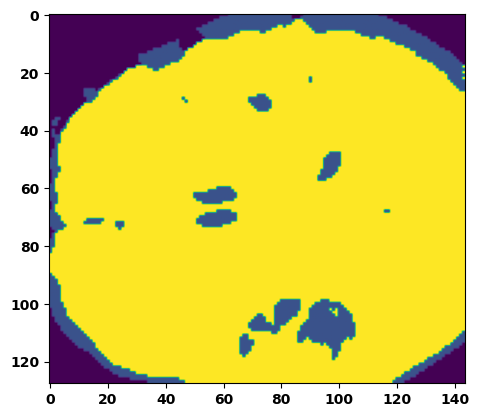

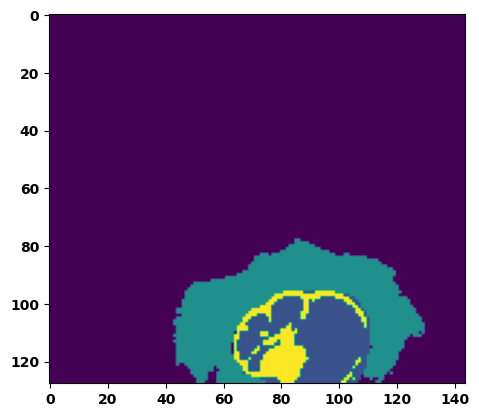

  6%|▌         | 2/36 [00:02<00:47,  1.39s/it]

Batch_id:  1 Eval loss:  0.8091855645179749
Batch_id:  1 Eval IoU:  tensor(0.1269, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.5012, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.2938, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8926, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.3556, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.42s/it]

Batch_id:  2 Eval loss:  0.7563700079917908
Batch_id:  2 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 11%|█         | 4/36 [00:05<00:44,  1.40s/it]

Batch_id:  3 Eval loss:  0.7520568370819092
Batch_id:  3 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:42,  1.36s/it]

Batch_id:  4 Eval loss:  0.7869174480438232
Batch_id:  4 Eval IoU:  tensor(0.1672, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.4832, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.2916, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2765, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.40s/it]

Batch_id:  5 Eval loss:  0.7572755813598633
Batch_id:  5 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.40s/it]

Batch_id:  6 Eval loss:  0.7202461957931519
Batch_id:  6 Eval IoU:  tensor(0.2438, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.545892596244812
Batch_id:  7 Eval IoU:  tensor(0.4567, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.40s/it]

Batch_id:  8 Eval loss:  0.7295064926147461
Batch_id:  8 Eval IoU:  tensor(0.2251, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.5714, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4032, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.4079, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.48s/it]

Batch_id:  9 Eval loss:  0.44903242588043213
Batch_id:  9 Eval IoU:  tensor(0.5825, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  10 Eval loss:  0.7024656534194946
Batch_id:  10 Eval IoU:  tensor(0.2051, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8658, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8208, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.8528, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


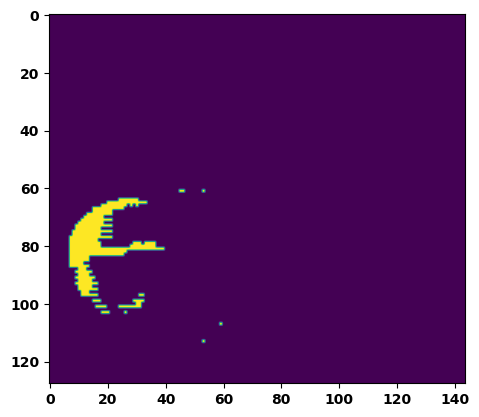

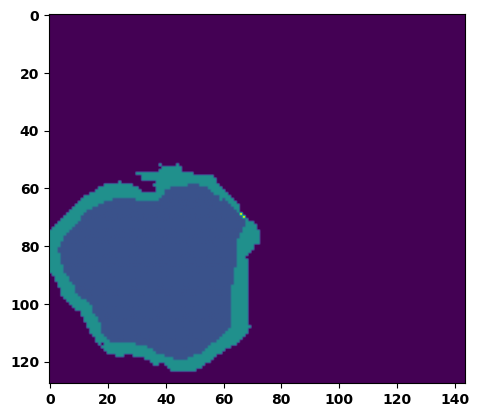

 33%|███▎      | 12/36 [00:17<00:36,  1.50s/it]

Batch_id:  11 Eval loss:  0.465109646320343
Batch_id:  11 Eval IoU:  tensor(0.5878, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:34,  1.51s/it]

Batch_id:  12 Eval loss:  0.7767554521560669
Batch_id:  12 Eval IoU:  tensor(0.2017, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7140, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.5986, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.7168, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8382, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9885, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.45s/it]

Batch_id:  13 Eval loss:  0.5487271547317505
Batch_id:  13 Eval IoU:  tensor(0.4423, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9903, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.47s/it]

Batch_id:  14 Eval loss:  0.40955135226249695
Batch_id:  14 Eval IoU:  tensor(0.6387, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.41s/it]

Batch_id:  15 Eval loss:  0.8681450486183167
Batch_id:  15 Eval IoU:  tensor(0.0854, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5105, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4043, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8975, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8639, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3658, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.41s/it]

Batch_id:  16 Eval loss:  0.7388188242912292
Batch_id:  16 Eval IoU:  tensor(0.1788, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.6401, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.5623, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.5963, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8149, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9469, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:26,  1.45s/it]

Batch_id:  17 Eval loss:  0.8284499049186707
Batch_id:  17 Eval IoU:  tensor(0.1009, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4761, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.2614, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.7942, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.4176, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.47s/it]

Batch_id:  18 Eval loss:  0.6659027934074402
Batch_id:  18 Eval IoU:  tensor(0.3114, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8903, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9180, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.41s/it]

Batch_id:  19 Eval loss:  0.4500722289085388
Batch_id:  19 Eval IoU:  tensor(0.5926, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  20 Eval loss:  0.4748958945274353
Batch_id:  20 Eval IoU:  tensor(0.5253, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


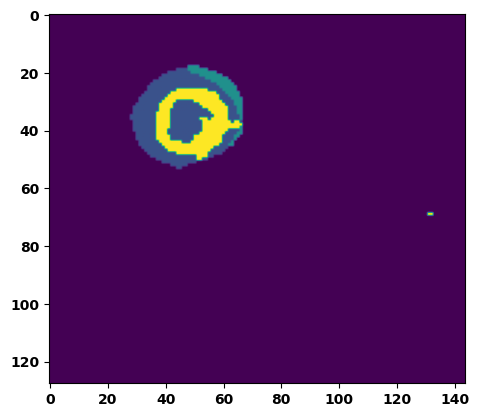

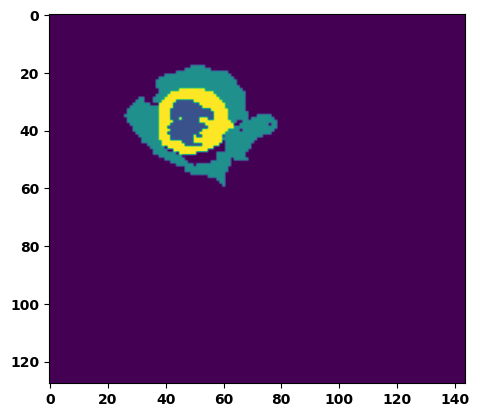

 61%|██████    | 22/36 [00:31<00:21,  1.51s/it]

Batch_id:  21 Eval loss:  0.4985917806625366
Batch_id:  21 Eval IoU:  tensor(0.4906, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9925, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.46s/it]

Batch_id:  22 Eval loss:  0.5564963221549988
Batch_id:  22 Eval IoU:  tensor(0.4350, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9825, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.46s/it]

Batch_id:  23 Eval loss:  0.7647570371627808
Batch_id:  23 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.32540419697761536
Batch_id:  24 Eval IoU:  tensor(0.6061, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9770, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.46s/it]

Batch_id:  25 Eval loss:  0.9100621342658997
Batch_id:  25 Eval IoU:  tensor(0.0544, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4615, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.2089, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.7924, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.4532, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.45s/it]

Batch_id:  26 Eval loss:  0.5036041736602783
Batch_id:  26 Eval IoU:  tensor(0.4672, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9847, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.48s/it]

Batch_id:  27 Eval loss:  0.603975772857666
Batch_id:  27 Eval IoU:  tensor(0.3418, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6690, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.6476, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.7195, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.6567, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9831, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.48s/it]

Batch_id:  28 Eval loss:  0.3985639214515686
Batch_id:  28 Eval IoU:  tensor(0.5652, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9186, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8873, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9229, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9601, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.44s/it]

Batch_id:  29 Eval loss:  0.6230447888374329
Batch_id:  29 Eval IoU:  tensor(0.2915, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7028, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.6171, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.5796, device='cuda:0')
Batch_id:  30 Eval loss:  0.45116928219795227
Batch_id:  30 Eval IoU:  tensor(0.5120, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9390, device='cuda:0')


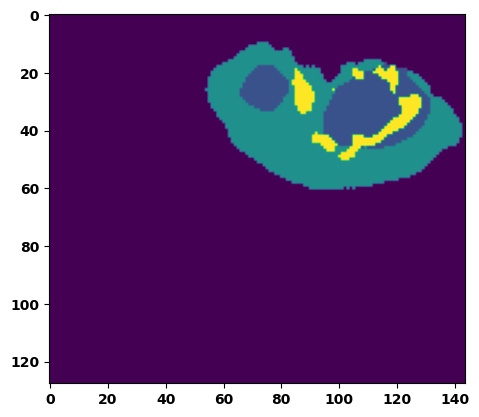

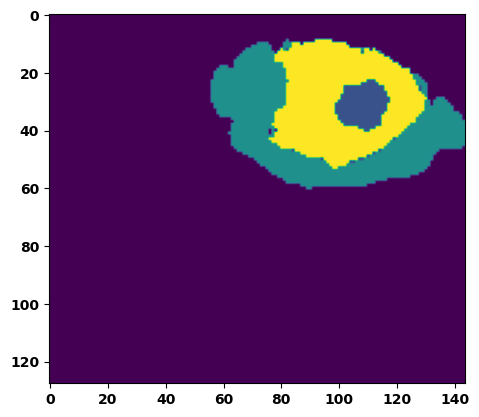

 89%|████████▉ | 32/36 [00:46<00:05,  1.44s/it]

Batch_id:  31 Eval loss:  0.910495936870575
Batch_id:  31 Eval IoU:  tensor(0.0475, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.4267, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3094, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.7966, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.2539, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.44s/it]

Batch_id:  32 Eval loss:  0.5626843571662903
Batch_id:  32 Eval IoU:  tensor(0.3704, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8313, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.7953, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8319, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8978, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9690, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.42s/it]

Batch_id:  33 Eval loss:  0.712128221988678
Batch_id:  33 Eval IoU:  tensor(0.2398, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.39s/it]

Batch_id:  34 Eval loss:  0.42590487003326416
Batch_id:  34 Eval IoU:  tensor(0.5859, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.760077714920044
Batch_id:  35 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Epoch  3 Training loss:  0.41487552482973444
Epoch  3 Evaluation loss:  0.6422813145650758
Epoch  3 Training accuracy :  tensor(0.6274)
Epoch  3 Evaluation accuracy :  tensor(0.3299)
Epoch  3 Training Mean Dice Score:  tensor(0.9578)
Epoch  3 Eval Mean Dice Score:  tensor(0.8132)
Epoch  3 Training Non-tumor Dice Score:  tensor(0.9593)
Epoch  3 Eval Non-tumor Dice Score:  tensor(0.7584)
Epoch  3 Training NCR/NET Dice Score:  tensor(0.9791)
Epoch  3 Eval NCR/NET Dice Score:  tensor(0.9235)
Epoch  3 Training ED Dice Score:  tensor(0.9546)
Epoch  3

Epoch: 4
Training in session: 


  1%|          | 1/110 [00:01<02:37,  1.44s/it]

Batch_id:  0 Training loss:  0.3054518401622772
Batch_id:  0 Training IoU:  tensor(0.7136, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:32,  1.41s/it]

Batch_id:  1 Training loss:  0.24192415177822113
Batch_id:  1 Training IoU:  tensor(0.7336, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:34,  1.44s/it]

Batch_id:  2 Training loss:  0.32905253767967224
Batch_id:  2 Training IoU:  tensor(0.6758, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:34,  1.46s/it]

Batch_id:  3 Training loss:  0.4890643358230591
Batch_id:  3 Training IoU:  tensor(0.5380, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:36,  1.49s/it]

Batch_id:  4 Training loss:  0.504436194896698
Batch_id:  4 Training IoU:  tensor(0.4494, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:30,  1.45s/it]

Batch_id:  5 Training loss:  0.5929222106933594
Batch_id:  5 Training IoU:  tensor(0.3680, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.8903, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:28,  1.44s/it]

Batch_id:  6 Training loss:  0.5627697706222534
Batch_id:  6 Training IoU:  tensor(0.3473, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9013, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9031, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.8986, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:29,  1.46s/it]

Batch_id:  7 Training loss:  0.28741222620010376
Batch_id:  7 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9575, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:28,  1.47s/it]

Batch_id:  8 Training loss:  0.19807156920433044
Batch_id:  8 Training IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:23,  1.43s/it]

Batch_id:  9 Training loss:  0.3523865342140198
Batch_id:  9 Training IoU:  tensor(0.6542, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 10%|█         | 11/110 [00:15<02:21,  1.43s/it]

Batch_id:  10 Training loss:  0.34193259477615356
Batch_id:  10 Training IoU:  tensor(0.7443, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 11%|█         | 12/110 [00:17<02:17,  1.40s/it]

Batch_id:  11 Training loss:  0.3590753674507141
Batch_id:  11 Training IoU:  tensor(0.6569, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:17,  1.41s/it]

Batch_id:  12 Training loss:  0.3567821979522705
Batch_id:  12 Training IoU:  tensor(0.6706, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:21,  1.47s/it]

Batch_id:  13 Training loss:  0.524217963218689
Batch_id:  13 Training IoU:  tensor(0.5282, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:23,  1.51s/it]

Batch_id:  14 Training loss:  0.4108286499977112
Batch_id:  14 Training IoU:  tensor(0.5931, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:19,  1.48s/it]

Batch_id:  15 Training loss:  0.41537049412727356
Batch_id:  15 Training IoU:  tensor(0.5765, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:17,  1.47s/it]

Batch_id:  16 Training loss:  0.4814051389694214
Batch_id:  16 Training IoU:  tensor(0.5640, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:16,  1.48s/it]

Batch_id:  17 Training loss:  0.20845410227775574
Batch_id:  17 Training IoU:  tensor(0.8320, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:13,  1.47s/it]

Batch_id:  18 Training loss:  0.42599940299987793
Batch_id:  18 Training IoU:  tensor(0.6251, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:13,  1.48s/it]

Batch_id:  19 Training loss:  0.35181790590286255
Batch_id:  19 Training IoU:  tensor(0.6593, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:11,  1.48s/it]

Batch_id:  20 Training loss:  0.18261271715164185
Batch_id:  20 Training IoU:  tensor(0.8945, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 20%|██        | 22/110 [00:32<02:12,  1.51s/it]

Batch_id:  21 Training loss:  0.2495494931936264
Batch_id:  21 Training IoU:  tensor(0.7742, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 21%|██        | 23/110 [00:33<02:09,  1.49s/it]

Batch_id:  22 Training loss:  0.3084697723388672
Batch_id:  22 Training IoU:  tensor(0.6621, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:06,  1.47s/it]

Batch_id:  23 Training loss:  0.2572460174560547
Batch_id:  23 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:03,  1.45s/it]

Batch_id:  24 Training loss:  0.3361935615539551
Batch_id:  24 Training IoU:  tensor(0.6245, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:04,  1.48s/it]

Batch_id:  25 Training loss:  0.45437091588974
Batch_id:  25 Training IoU:  tensor(0.5003, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:05,  1.52s/it]

Batch_id:  26 Training loss:  0.41149628162384033
Batch_id:  26 Training IoU:  tensor(0.6191, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 25%|██▌       | 28/110 [00:41<02:03,  1.50s/it]

Batch_id:  27 Training loss:  0.2405765801668167
Batch_id:  27 Training IoU:  tensor(0.7502, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 26%|██▋       | 29/110 [00:42<02:00,  1.49s/it]

Batch_id:  28 Training loss:  0.27218154072761536
Batch_id:  28 Training IoU:  tensor(0.7056, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:59,  1.50s/it]

Batch_id:  29 Training loss:  0.23170927166938782
Batch_id:  29 Training IoU:  tensor(0.7333, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:56,  1.47s/it]

Batch_id:  30 Training loss:  0.35293522477149963
Batch_id:  30 Training IoU:  tensor(0.6541, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:51,  1.44s/it]

Batch_id:  31 Training loss:  0.3752649426460266
Batch_id:  31 Training IoU:  tensor(0.6085, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 30%|███       | 33/110 [00:48<01:50,  1.43s/it]

Batch_id:  32 Training loss:  0.32488593459129333
Batch_id:  32 Training IoU:  tensor(0.6569, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 31%|███       | 34/110 [00:49<01:50,  1.46s/it]

Batch_id:  33 Training loss:  0.24491819739341736
Batch_id:  33 Training IoU:  tensor(0.7416, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.340625137090683
Batch_id:  34 Training IoU:  tensor(0.6930, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:50,  1.50s/it]

Batch_id:  35 Training loss:  0.6473815441131592
Batch_id:  35 Training IoU:  tensor(0.2913, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.8429, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.7843, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9147, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9164, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:53,  1.55s/it]

Batch_id:  36 Training loss:  0.31968286633491516
Batch_id:  36 Training IoU:  tensor(0.7012, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:52,  1.57s/it]

Batch_id:  37 Training loss:  0.4744473695755005
Batch_id:  37 Training IoU:  tensor(0.5159, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:48,  1.52s/it]

Batch_id:  38 Training loss:  0.2586265802383423
Batch_id:  38 Training IoU:  tensor(0.7436, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:47,  1.53s/it]

Batch_id:  39 Training loss:  0.3210442066192627
Batch_id:  39 Training IoU:  tensor(0.6503, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:44,  1.51s/it]

Batch_id:  40 Training loss:  0.3963426351547241
Batch_id:  40 Training IoU:  tensor(0.6210, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:41,  1.49s/it]

Batch_id:  41 Training loss:  0.42360493540763855
Batch_id:  41 Training IoU:  tensor(0.5325, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9592, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:40,  1.49s/it]

Batch_id:  42 Training loss:  0.2696720063686371
Batch_id:  42 Training IoU:  tensor(0.6942, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 40%|████      | 44/110 [01:05<01:40,  1.52s/it]

Batch_id:  43 Training loss:  0.4746529459953308
Batch_id:  43 Training IoU:  tensor(0.5239, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 41%|████      | 45/110 [01:06<01:38,  1.51s/it]

Batch_id:  44 Training loss:  0.5224833488464355
Batch_id:  44 Training IoU:  tensor(0.4143, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9012, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:39,  1.56s/it]

Batch_id:  45 Training loss:  0.24687208235263824
Batch_id:  45 Training IoU:  tensor(0.7515, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:36,  1.53s/it]

Batch_id:  46 Training loss:  0.2369253784418106
Batch_id:  46 Training IoU:  tensor(0.7255, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9714, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:36,  1.55s/it]

Batch_id:  47 Training loss:  0.2914045453071594
Batch_id:  47 Training IoU:  tensor(0.7269, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:35,  1.56s/it]

Batch_id:  48 Training loss:  0.2710994482040405
Batch_id:  48 Training IoU:  tensor(0.7477, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:30,  1.51s/it]

Batch_id:  49 Training loss:  0.2197297215461731
Batch_id:  49 Training IoU:  tensor(0.7515, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:29,  1.52s/it]

Batch_id:  50 Training loss:  0.21599814295768738
Batch_id:  50 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:26,  1.49s/it]

Batch_id:  51 Training loss:  0.4119434356689453
Batch_id:  51 Training IoU:  tensor(0.5397, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:26,  1.51s/it]

Batch_id:  52 Training loss:  0.21211494505405426
Batch_id:  52 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:25,  1.53s/it]

Batch_id:  53 Training loss:  0.4314769506454468
Batch_id:  53 Training IoU:  tensor(0.4846, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9506, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:23,  1.52s/it]

Batch_id:  54 Training loss:  0.3801993131637573
Batch_id:  54 Training IoU:  tensor(0.6607, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:17,  1.43s/it]

Batch_id:  55 Training loss:  0.25393712520599365
Batch_id:  55 Training IoU:  tensor(0.7915, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:21,  1.54s/it]

Batch_id:  56 Training loss:  0.19201751053333282
Batch_id:  56 Training IoU:  tensor(0.8114, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:20,  1.55s/it]

Batch_id:  57 Training loss:  0.45370882749557495
Batch_id:  57 Training IoU:  tensor(0.5154, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:17,  1.51s/it]

Batch_id:  58 Training loss:  0.4272803068161011
Batch_id:  58 Training IoU:  tensor(0.5742, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 55%|█████▍    | 60/110 [01:29<01:14,  1.49s/it]

Batch_id:  59 Training loss:  0.16291657090187073
Batch_id:  59 Training IoU:  tensor(0.8409, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:11,  1.47s/it]

Batch_id:  60 Training loss:  0.30385854840278625
Batch_id:  60 Training IoU:  tensor(0.6589, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 56%|█████▋    | 62/110 [01:32<01:10,  1.46s/it]

Batch_id:  61 Training loss:  0.28994083404541016
Batch_id:  61 Training IoU:  tensor(0.6197, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9281, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9116, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:09,  1.47s/it]

Batch_id:  62 Training loss:  0.23053790628910065
Batch_id:  62 Training IoU:  tensor(0.7664, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 58%|█████▊    | 64/110 [01:35<01:05,  1.42s/it]

Batch_id:  63 Training loss:  0.24601706862449646
Batch_id:  63 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:04,  1.44s/it]

Batch_id:  64 Training loss:  0.30248504877090454
Batch_id:  64 Training IoU:  tensor(0.6952, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:02,  1.42s/it]

Batch_id:  65 Training loss:  0.5842182636260986
Batch_id:  65 Training IoU:  tensor(0.3496, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9107, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9172, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:00,  1.41s/it]

Batch_id:  66 Training loss:  0.3157978951931
Batch_id:  66 Training IoU:  tensor(0.7017, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<00:58,  1.40s/it]

Batch_id:  67 Training loss:  0.5645047426223755
Batch_id:  67 Training IoU:  tensor(0.4010, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9676, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<00:58,  1.44s/it]

Batch_id:  68 Training loss:  0.19195953011512756
Batch_id:  68 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:56,  1.42s/it]

Batch_id:  69 Training loss:  0.263805627822876
Batch_id:  69 Training IoU:  tensor(0.7152, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:55,  1.42s/it]

Batch_id:  70 Training loss:  0.17132556438446045
Batch_id:  70 Training IoU:  tensor(0.8381, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.1705586165189743
Batch_id:  71 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:52,  1.42s/it]

Batch_id:  72 Training loss:  0.24071131646633148
Batch_id:  72 Training IoU:  tensor(0.7303, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:51,  1.42s/it]

Batch_id:  73 Training loss:  0.28671616315841675
Batch_id:  73 Training IoU:  tensor(0.6566, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:49,  1.42s/it]

Batch_id:  74 Training loss:  0.46617579460144043
Batch_id:  74 Training IoU:  tensor(0.5575, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:48,  1.42s/it]

Batch_id:  75 Training loss:  0.3450540602207184
Batch_id:  75 Training IoU:  tensor(0.6660, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:46,  1.40s/it]

Batch_id:  76 Training loss:  0.14586010575294495
Batch_id:  76 Training IoU:  tensor(0.8778, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:44,  1.40s/it]

Batch_id:  77 Training loss:  0.4824656546115875
Batch_id:  77 Training IoU:  tensor(0.4737, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:45,  1.45s/it]

Batch_id:  78 Training loss:  0.30542629957199097
Batch_id:  78 Training IoU:  tensor(0.6115, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9200, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9614, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:43,  1.46s/it]

Batch_id:  79 Training loss:  0.3497503995895386
Batch_id:  79 Training IoU:  tensor(0.6113, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:42,  1.46s/it]

Batch_id:  80 Training loss:  0.4273195266723633
Batch_id:  80 Training IoU:  tensor(0.4896, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.8605, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:41,  1.48s/it]

Batch_id:  81 Training loss:  0.297275185585022
Batch_id:  81 Training IoU:  tensor(0.6648, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:41,  1.54s/it]

Batch_id:  82 Training loss:  0.1512250155210495
Batch_id:  82 Training IoU:  tensor(0.8459, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:38,  1.49s/it]

Batch_id:  83 Training loss:  0.5681767463684082
Batch_id:  83 Training IoU:  tensor(0.3737, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.8982, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.8776, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9109, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:37,  1.49s/it]

Batch_id:  84 Training loss:  0.5075704455375671
Batch_id:  84 Training IoU:  tensor(0.4453, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:35,  1.48s/it]

Batch_id:  85 Training loss:  0.6524999737739563
Batch_id:  85 Training IoU:  tensor(0.2963, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9180, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.8964, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9170, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9643, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:34,  1.51s/it]

Batch_id:  86 Training loss:  0.5524144172668457
Batch_id:  86 Training IoU:  tensor(0.3838, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9242, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.8912, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9519, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:32,  1.49s/it]

Batch_id:  87 Training loss:  0.1475955843925476
Batch_id:  87 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 81%|████████  | 89/110 [02:11<00:30,  1.47s/it]

Batch_id:  88 Training loss:  0.19296470284461975
Batch_id:  88 Training IoU:  tensor(0.7972, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.266349732875824
Batch_id:  89 Training IoU:  tensor(0.7111, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:28,  1.48s/it]

Batch_id:  90 Training loss:  0.3158332109451294
Batch_id:  90 Training IoU:  tensor(0.6530, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 84%|████████▎ | 92/110 [02:15<00:27,  1.50s/it]

Batch_id:  91 Training loss:  0.2822309136390686
Batch_id:  91 Training IoU:  tensor(0.6297, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9711, device='cuda:0')


 85%|████████▍ | 93/110 [02:17<00:25,  1.49s/it]

Batch_id:  92 Training loss:  0.24269753694534302
Batch_id:  92 Training IoU:  tensor(0.7103, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:23,  1.46s/it]

Batch_id:  93 Training loss:  0.2042565494775772
Batch_id:  93 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:22,  1.50s/it]

Batch_id:  94 Training loss:  0.3272273540496826
Batch_id:  94 Training IoU:  tensor(0.6879, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:21,  1.53s/it]

Batch_id:  95 Training loss:  0.17420890927314758
Batch_id:  95 Training IoU:  tensor(0.7908, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:19,  1.51s/it]

Batch_id:  96 Training loss:  0.35208916664123535
Batch_id:  96 Training IoU:  tensor(0.6495, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:17,  1.49s/it]

Batch_id:  97 Training loss:  0.2626040577888489
Batch_id:  97 Training IoU:  tensor(0.7045, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:16,  1.47s/it]

Batch_id:  98 Training loss:  0.16848380863666534
Batch_id:  98 Training IoU:  tensor(0.7963, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:14,  1.45s/it]

Batch_id:  99 Training loss:  0.1689154952764511
Batch_id:  99 Training IoU:  tensor(0.8538, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.53s/it]

Batch_id:  100 Training loss:  0.226765975356102
Batch_id:  100 Training IoU:  tensor(0.7134, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9708, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.49s/it]

Batch_id:  101 Training loss:  0.2944636940956116
Batch_id:  101 Training IoU:  tensor(0.6675, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.46s/it]

Batch_id:  102 Training loss:  0.21219776570796967
Batch_id:  102 Training IoU:  tensor(0.7722, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:09,  1.54s/it]

Batch_id:  103 Training loss:  0.46910110116004944
Batch_id:  103 Training IoU:  tensor(0.4848, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.54s/it]

Batch_id:  104 Training loss:  0.23390133678913116
Batch_id:  104 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 96%|█████████▋| 106/110 [02:37<00:06,  1.56s/it]

Batch_id:  105 Training loss:  0.29539546370506287
Batch_id:  105 Training IoU:  tensor(0.6875, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.54s/it]

Batch_id:  106 Training loss:  0.24817173182964325
Batch_id:  106 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:03,  1.51s/it]

Batch_id:  107 Training loss:  0.25650256872177124
Batch_id:  107 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.22088444232940674
Batch_id:  108 Training IoU:  tensor(0.8317, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.3244301676750183
Batch_id:  109 Training IoU:  tensor(0.6102, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9725, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7496803998947144
Batch_id:  0 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


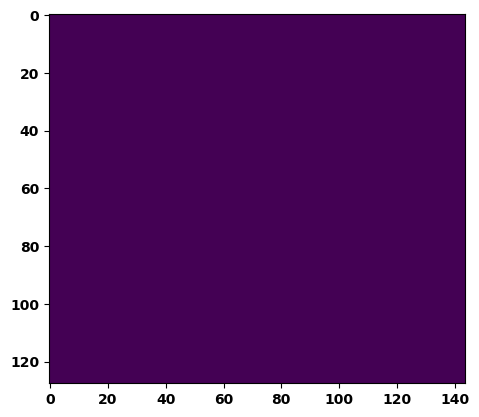

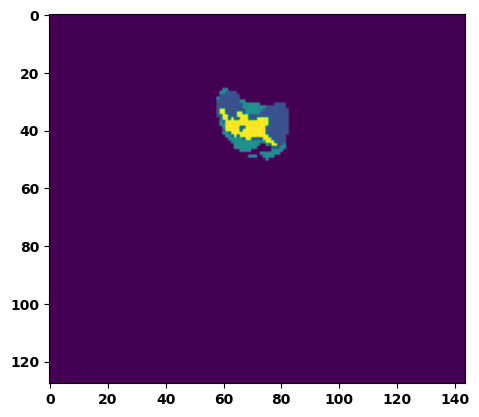

  6%|▌         | 2/36 [00:03<00:55,  1.64s/it]

Batch_id:  1 Eval loss:  0.41031911969184875
Batch_id:  1 Eval IoU:  tensor(0.6316, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:51,  1.56s/it]

Batch_id:  2 Eval loss:  0.5839954614639282
Batch_id:  2 Eval IoU:  tensor(0.3657, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.53s/it]

Batch_id:  3 Eval loss:  0.639447033405304
Batch_id:  3 Eval IoU:  tensor(0.3322, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.47s/it]

Batch_id:  4 Eval loss:  0.23980477452278137
Batch_id:  4 Eval IoU:  tensor(0.7025, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:43,  1.45s/it]

Batch_id:  5 Eval loss:  0.7054771780967712
Batch_id:  5 Eval IoU:  tensor(0.2613, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.43s/it]

Batch_id:  6 Eval loss:  0.5383278131484985
Batch_id:  6 Eval IoU:  tensor(0.4109, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9200, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.8328655362129211
Batch_id:  7 Eval IoU:  tensor(0.0931, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4849, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3322, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9292, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8188, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.3747, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:36,  1.36s/it]

Batch_id:  8 Eval loss:  0.7334651947021484
Batch_id:  8 Eval IoU:  tensor(0.1982, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7427, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.6823, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.6151, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.41s/it]

Batch_id:  9 Eval loss:  0.6959367990493774
Batch_id:  9 Eval IoU:  tensor(0.2611, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval loss:  0.5253443717956543
Batch_id:  10 Eval IoU:  tensor(0.4230, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9119, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8914, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9872, device='cuda:0')


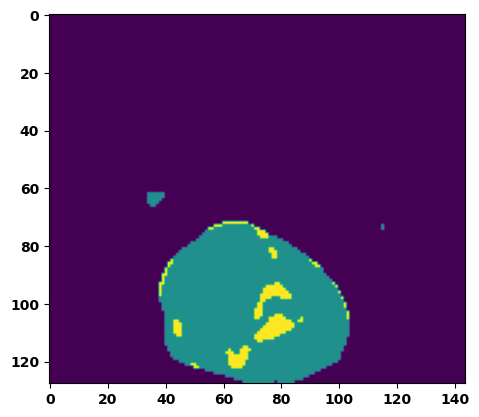

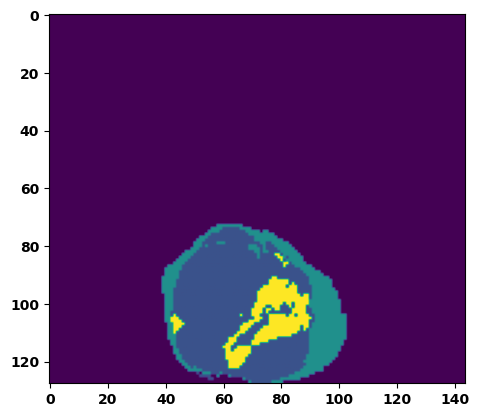

 33%|███▎      | 12/36 [00:17<00:35,  1.49s/it]

Batch_id:  11 Eval loss:  0.6067147254943848
Batch_id:  11 Eval IoU:  tensor(0.3273, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8789, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8242, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9071, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9268, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:33,  1.47s/it]

Batch_id:  12 Eval loss:  0.4033818244934082
Batch_id:  12 Eval IoU:  tensor(0.5360, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9805, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.45s/it]

Batch_id:  13 Eval loss:  0.894606351852417
Batch_id:  13 Eval IoU:  tensor(0.0613, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.4678, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3454, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.2022, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.45s/it]

Batch_id:  14 Eval loss:  0.7244266271591187
Batch_id:  14 Eval IoU:  tensor(0.2480, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.42s/it]

Batch_id:  15 Eval loss:  0.7730333805084229
Batch_id:  15 Eval IoU:  tensor(0.1995, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.7981, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.38s/it]

Batch_id:  16 Eval loss:  0.7474390864372253
Batch_id:  16 Eval IoU:  tensor(0.2274, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9196, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9110, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9082, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:24,  1.38s/it]

Batch_id:  17 Eval loss:  0.4681708514690399
Batch_id:  17 Eval IoU:  tensor(0.4381, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8014, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.7129, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.7022, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.38s/it]

Batch_id:  18 Eval loss:  0.88433837890625
Batch_id:  18 Eval IoU:  tensor(0.0721, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4896, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4086, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.8787, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.2602, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:21,  1.37s/it]

Batch_id:  19 Eval loss:  0.7478398680686951
Batch_id:  19 Eval IoU:  tensor(0.2346, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9386, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  20 Eval loss:  0.3521342873573303
Batch_id:  20 Eval IoU:  tensor(0.7041, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


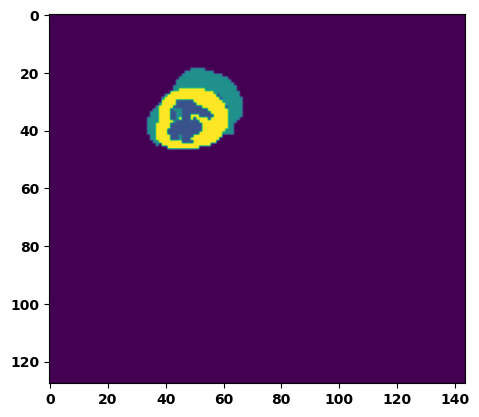

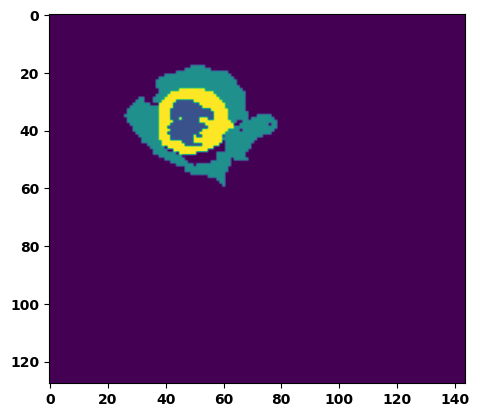

 61%|██████    | 22/36 [00:31<00:20,  1.45s/it]

Batch_id:  21 Eval loss:  0.6526240110397339
Batch_id:  21 Eval IoU:  tensor(0.3091, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9914, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.46s/it]

Batch_id:  22 Eval loss:  0.7190020084381104
Batch_id:  22 Eval IoU:  tensor(0.2466, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9101, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8803, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8656, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.52s/it]

Batch_id:  23 Eval loss:  0.7577795386314392
Batch_id:  23 Eval IoU:  tensor(0.1541, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.5425, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3912, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3335, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.3222990036010742
Batch_id:  24 Eval IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.5029993057250977
Batch_id:  25 Eval IoU:  tensor(0.4414, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9869, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.47s/it]

Batch_id:  26 Eval loss:  0.7641590237617493
Batch_id:  26 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.49s/it]

Batch_id:  27 Eval loss:  0.7562925219535828
Batch_id:  27 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.45s/it]

Batch_id:  28 Eval loss:  0.46429443359375
Batch_id:  28 Eval IoU:  tensor(0.4546, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9793, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.5806743502616882
Batch_id:  29 Eval IoU:  tensor(0.3773, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  30 Eval loss:  0.8203111886978149
Batch_id:  30 Eval IoU:  tensor(0.1472, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.5894, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3873, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.3852, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


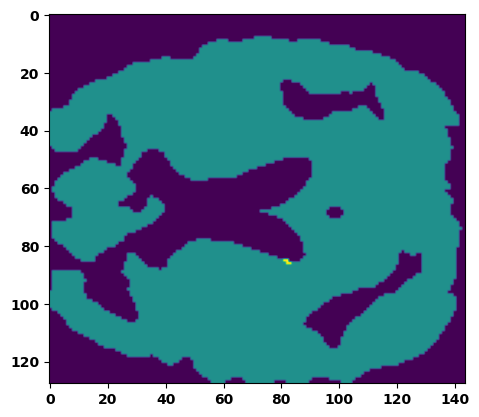

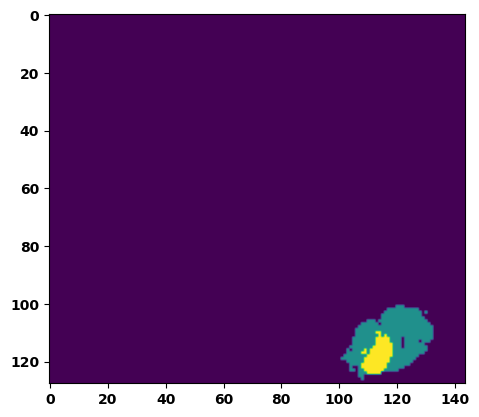

 89%|████████▉ | 32/36 [00:46<00:05,  1.43s/it]

Batch_id:  31 Eval loss:  0.7008756399154663
Batch_id:  31 Eval IoU:  tensor(0.2712, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.41s/it]

Batch_id:  32 Eval loss:  0.7683058977127075
Batch_id:  32 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.40s/it]

Batch_id:  33 Eval loss:  0.6524125337600708
Batch_id:  33 Eval IoU:  tensor(0.2778, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.6118, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4590, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.4421, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.39s/it]

Batch_id:  34 Eval loss:  0.7581578493118286
Batch_id:  34 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.6534320712089539
Batch_id:  35 Eval IoU:  tensor(0.2975, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9109, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8754, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9222, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')
Epoch  4 Training loss:  0.32853541401299563
Epoch  4 Evaluation loss:  0.6425102344817586
Epoch  4 Training accuracy :  tensor(0.6592)
Epoch  4 Evaluation accuracy :  tensor(0.3221)
Epoch  4 Training Mean Dice Score:  tensor(0.9645)
Epoch  4 Eval Mean Dice Score:  tensor(0.8669)
Epoch  4 Training Non-tumor Dice Score:  tensor(0.9665)
Epoch  4 Eval Non-tumor Dice Score:  tensor(0.8276)
Epoch  4 Training NCR/NET Dice Score:  tensor(0.9799)
Epoch  4 Eval NCR/NET Dice Score:  tensor(0.9725)
Epoch  4 Training ED Dice Score:  tensor(0.9640)
Epoch  

Epoch: 5
Training in session: 


  1%|          | 1/110 [00:01<02:40,  1.48s/it]

Batch_id:  0 Training loss:  0.6302555799484253
Batch_id:  0 Training IoU:  tensor(0.3110, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9028, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.8936, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9162, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9650, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:34,  1.44s/it]

Batch_id:  1 Training loss:  0.45020556449890137
Batch_id:  1 Training IoU:  tensor(0.4987, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:33,  1.43s/it]

Batch_id:  2 Training loss:  0.3414391279220581
Batch_id:  2 Training IoU:  tensor(0.6184, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:26,  1.38s/it]

Batch_id:  3 Training loss:  0.2950115203857422
Batch_id:  3 Training IoU:  tensor(0.6474, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:29,  1.42s/it]

Batch_id:  4 Training loss:  0.28311461210250854
Batch_id:  4 Training IoU:  tensor(0.6727, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:32,  1.46s/it]

Batch_id:  5 Training loss:  0.22353993356227875
Batch_id:  5 Training IoU:  tensor(0.7208, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:27,  1.43s/it]

Batch_id:  6 Training loss:  0.3612564206123352
Batch_id:  6 Training IoU:  tensor(0.5689, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9341, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:27,  1.44s/it]

Batch_id:  7 Training loss:  0.44901907444000244
Batch_id:  7 Training IoU:  tensor(0.5211, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.22202014923095703
Batch_id:  8 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:29,  1.49s/it]

Batch_id:  9 Training loss:  0.24525929987430573
Batch_id:  9 Training IoU:  tensor(0.7352, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 10%|█         | 11/110 [00:15<02:25,  1.47s/it]

Batch_id:  10 Training loss:  0.28999805450439453
Batch_id:  10 Training IoU:  tensor(0.7045, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 11%|█         | 12/110 [00:17<02:21,  1.45s/it]

Batch_id:  11 Training loss:  0.317839115858078
Batch_id:  11 Training IoU:  tensor(0.5747, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9193, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9650, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:21,  1.46s/it]

Batch_id:  12 Training loss:  0.4082724452018738
Batch_id:  12 Training IoU:  tensor(0.5933, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:22,  1.49s/it]

Batch_id:  13 Training loss:  0.15969447791576385
Batch_id:  13 Training IoU:  tensor(0.7986, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:19,  1.47s/it]

Batch_id:  14 Training loss:  0.2875989079475403
Batch_id:  14 Training IoU:  tensor(0.6890, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:16,  1.45s/it]

Batch_id:  15 Training loss:  0.2960006892681122
Batch_id:  15 Training IoU:  tensor(0.6703, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:15,  1.46s/it]

Batch_id:  16 Training loss:  0.33191072940826416
Batch_id:  16 Training IoU:  tensor(0.5809, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.8943, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:16,  1.48s/it]

Batch_id:  17 Training loss:  0.4031737446784973
Batch_id:  17 Training IoU:  tensor(0.5387, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:13,  1.46s/it]

Batch_id:  18 Training loss:  0.16521471738815308
Batch_id:  18 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:06,  1.40s/it]

Batch_id:  19 Training loss:  0.1415662318468094
Batch_id:  19 Training IoU:  tensor(0.8304, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:11,  1.48s/it]

Batch_id:  20 Training loss:  0.46435219049453735
Batch_id:  20 Training IoU:  tensor(0.4671, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 20%|██        | 22/110 [00:32<02:11,  1.50s/it]

Batch_id:  21 Training loss:  0.1650380939245224
Batch_id:  21 Training IoU:  tensor(0.7879, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 21%|██        | 23/110 [00:33<02:11,  1.51s/it]

Batch_id:  22 Training loss:  0.20801402628421783
Batch_id:  22 Training IoU:  tensor(0.7583, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:08,  1.49s/it]

Batch_id:  23 Training loss:  0.14301910996437073
Batch_id:  23 Training IoU:  tensor(0.8205, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9804, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:06,  1.49s/it]

Batch_id:  24 Training loss:  0.15814778208732605
Batch_id:  24 Training IoU:  tensor(0.8001, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:04,  1.49s/it]

Batch_id:  25 Training loss:  0.39481693506240845
Batch_id:  25 Training IoU:  tensor(0.5960, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:07,  1.54s/it]

Batch_id:  26 Training loss:  0.4443756639957428
Batch_id:  26 Training IoU:  tensor(0.5489, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 25%|██▌       | 28/110 [00:41<02:03,  1.51s/it]

Batch_id:  27 Training loss:  0.5112742781639099
Batch_id:  27 Training IoU:  tensor(0.4609, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 26%|██▋       | 29/110 [00:42<02:06,  1.56s/it]

Batch_id:  28 Training loss:  0.2570952773094177
Batch_id:  28 Training IoU:  tensor(0.6825, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 27%|██▋       | 30/110 [00:44<02:01,  1.52s/it]

Batch_id:  29 Training loss:  0.21322427690029144
Batch_id:  29 Training IoU:  tensor(0.7605, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 28%|██▊       | 31/110 [00:45<02:04,  1.57s/it]

Batch_id:  30 Training loss:  0.1808655560016632
Batch_id:  30 Training IoU:  tensor(0.8181, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:59,  1.54s/it]

Batch_id:  31 Training loss:  0.29550907015800476
Batch_id:  31 Training IoU:  tensor(0.7323, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 30%|███       | 33/110 [00:48<01:55,  1.51s/it]

Batch_id:  32 Training loss:  0.5326064825057983
Batch_id:  32 Training IoU:  tensor(0.3955, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9120, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9247, device='cuda:0')


 31%|███       | 34/110 [00:50<01:54,  1.50s/it]

Batch_id:  33 Training loss:  0.33443498611450195
Batch_id:  33 Training IoU:  tensor(0.6110, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:52,  1.49s/it]

Batch_id:  34 Training loss:  0.5909336805343628
Batch_id:  34 Training IoU:  tensor(0.3279, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.8656, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.8343, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9079, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:47,  1.45s/it]

Batch_id:  35 Training loss:  0.14970757067203522
Batch_id:  35 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.37907540798187256
Batch_id:  36 Training IoU:  tensor(0.5338, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9509, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:50,  1.54s/it]

Batch_id:  37 Training loss:  0.46379780769348145
Batch_id:  37 Training IoU:  tensor(0.4996, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:46,  1.50s/it]

Batch_id:  38 Training loss:  0.2066112905740738
Batch_id:  38 Training IoU:  tensor(0.7566, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:42,  1.47s/it]

Batch_id:  39 Training loss:  0.3157813549041748
Batch_id:  39 Training IoU:  tensor(0.5955, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:43,  1.49s/it]

Batch_id:  40 Training loss:  0.30219709873199463
Batch_id:  40 Training IoU:  tensor(0.6470, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:39,  1.46s/it]

Batch_id:  41 Training loss:  0.4051574468612671
Batch_id:  41 Training IoU:  tensor(0.5057, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:37,  1.46s/it]

Batch_id:  42 Training loss:  0.31333571672439575
Batch_id:  42 Training IoU:  tensor(0.6239, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 40%|████      | 44/110 [01:05<01:36,  1.46s/it]

Batch_id:  43 Training loss:  0.3090760111808777
Batch_id:  43 Training IoU:  tensor(0.6344, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 41%|████      | 45/110 [01:06<01:33,  1.44s/it]

Batch_id:  44 Training loss:  0.2859324812889099
Batch_id:  44 Training IoU:  tensor(0.6637, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:35,  1.50s/it]

Batch_id:  45 Training loss:  0.6381939649581909
Batch_id:  45 Training IoU:  tensor(0.3129, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9267, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:34,  1.51s/it]

Batch_id:  46 Training loss:  0.2071894258260727
Batch_id:  46 Training IoU:  tensor(0.7518, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:31,  1.48s/it]

Batch_id:  47 Training loss:  0.2867751717567444
Batch_id:  47 Training IoU:  tensor(0.7174, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:31,  1.50s/it]

Batch_id:  48 Training loss:  0.1941591501235962
Batch_id:  48 Training IoU:  tensor(0.7492, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:29,  1.49s/it]

Batch_id:  49 Training loss:  0.48909974098205566
Batch_id:  49 Training IoU:  tensor(0.4811, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:27,  1.48s/it]

Batch_id:  50 Training loss:  0.27118974924087524
Batch_id:  50 Training IoU:  tensor(0.6673, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:23,  1.44s/it]

Batch_id:  51 Training loss:  0.33116817474365234
Batch_id:  51 Training IoU:  tensor(0.5873, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9716, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:23,  1.47s/it]

Batch_id:  52 Training loss:  0.38457900285720825
Batch_id:  52 Training IoU:  tensor(0.6113, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:22,  1.48s/it]

Batch_id:  53 Training loss:  0.3767944574356079
Batch_id:  53 Training IoU:  tensor(0.5898, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:20,  1.46s/it]

Batch_id:  54 Training loss:  0.27237868309020996
Batch_id:  54 Training IoU:  tensor(0.6761, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:17,  1.44s/it]

Batch_id:  55 Training loss:  0.1850070059299469
Batch_id:  55 Training IoU:  tensor(0.7505, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:14,  1.41s/it]

Batch_id:  56 Training loss:  0.13863100111484528
Batch_id:  56 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:16,  1.48s/it]

Batch_id:  57 Training loss:  0.2806490659713745
Batch_id:  57 Training IoU:  tensor(0.6531, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:13,  1.44s/it]

Batch_id:  58 Training loss:  0.24128365516662598
Batch_id:  58 Training IoU:  tensor(0.7385, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.2551591992378235
Batch_id:  59 Training IoU:  tensor(0.6953, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:11,  1.47s/it]

Batch_id:  60 Training loss:  0.4678798317909241
Batch_id:  60 Training IoU:  tensor(0.5215, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:10,  1.47s/it]

Batch_id:  61 Training loss:  0.2668580114841461
Batch_id:  61 Training IoU:  tensor(0.7067, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:07,  1.44s/it]

Batch_id:  62 Training loss:  0.3602987229824066
Batch_id:  62 Training IoU:  tensor(0.6226, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:07,  1.47s/it]

Batch_id:  63 Training loss:  0.24466757476329803
Batch_id:  63 Training IoU:  tensor(0.7668, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:07,  1.50s/it]

Batch_id:  64 Training loss:  0.1453547328710556
Batch_id:  64 Training IoU:  tensor(0.8219, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:06,  1.52s/it]

Batch_id:  65 Training loss:  0.28773465752601624
Batch_id:  65 Training IoU:  tensor(0.6033, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9061, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:05,  1.53s/it]

Batch_id:  66 Training loss:  0.3656740188598633
Batch_id:  66 Training IoU:  tensor(0.5777, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9714, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:04,  1.53s/it]

Batch_id:  67 Training loss:  0.14250309765338898
Batch_id:  67 Training IoU:  tensor(0.8304, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<01:01,  1.51s/it]

Batch_id:  68 Training loss:  0.2545241713523865
Batch_id:  68 Training IoU:  tensor(0.7050, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:58,  1.47s/it]

Batch_id:  69 Training loss:  0.18918998539447784
Batch_id:  69 Training IoU:  tensor(0.7694, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:56,  1.46s/it]

Batch_id:  70 Training loss:  0.2219686061143875
Batch_id:  70 Training IoU:  tensor(0.7088, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:55,  1.46s/it]

Batch_id:  71 Training loss:  0.11469168961048126
Batch_id:  71 Training IoU:  tensor(0.8693, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:51,  1.38s/it]

Batch_id:  72 Training loss:  0.30976682901382446
Batch_id:  72 Training IoU:  tensor(0.6021, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9780, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:48,  1.36s/it]

Batch_id:  73 Training loss:  0.2465292066335678
Batch_id:  73 Training IoU:  tensor(0.7072, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:48,  1.37s/it]

Batch_id:  74 Training loss:  0.10428580641746521
Batch_id:  74 Training IoU:  tensor(0.8804, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:47,  1.40s/it]

Batch_id:  75 Training loss:  0.2060565948486328
Batch_id:  75 Training IoU:  tensor(0.7457, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:46,  1.42s/it]

Batch_id:  76 Training loss:  0.10940463840961456
Batch_id:  76 Training IoU:  tensor(0.8623, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:44,  1.40s/it]

Batch_id:  77 Training loss:  0.14966261386871338
Batch_id:  77 Training IoU:  tensor(0.7905, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:42,  1.38s/it]

Batch_id:  78 Training loss:  0.21562053263187408
Batch_id:  78 Training IoU:  tensor(0.7189, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9632, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:42,  1.40s/it]

Batch_id:  79 Training loss:  0.16234222054481506
Batch_id:  79 Training IoU:  tensor(0.7826, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:40,  1.41s/it]

Batch_id:  80 Training loss:  0.22977030277252197
Batch_id:  80 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:39,  1.40s/it]

Batch_id:  81 Training loss:  0.1924138367176056
Batch_id:  81 Training IoU:  tensor(0.7458, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:37,  1.39s/it]

Batch_id:  82 Training loss:  0.3933694362640381
Batch_id:  82 Training IoU:  tensor(0.5606, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:35,  1.37s/it]

Batch_id:  83 Training loss:  0.16931873559951782
Batch_id:  83 Training IoU:  tensor(0.7823, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:34,  1.39s/it]

Batch_id:  84 Training loss:  0.19019469618797302
Batch_id:  84 Training IoU:  tensor(0.7462, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:33,  1.39s/it]

Batch_id:  85 Training loss:  0.2959810197353363
Batch_id:  85 Training IoU:  tensor(0.6175, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:32,  1.43s/it]

Batch_id:  86 Training loss:  0.3179006576538086
Batch_id:  86 Training IoU:  tensor(0.6784, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 80%|████████  | 88/110 [02:08<00:31,  1.42s/it]

Batch_id:  87 Training loss:  0.5839657783508301
Batch_id:  87 Training IoU:  tensor(0.3285, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.8986, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9099, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.8984, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:29,  1.39s/it]

Batch_id:  88 Training loss:  0.3127250075340271
Batch_id:  88 Training IoU:  tensor(0.6635, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:27,  1.37s/it]

Batch_id:  89 Training loss:  0.24502801895141602
Batch_id:  89 Training IoU:  tensor(0.7031, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.12167052924633026
Batch_id:  90 Training IoU:  tensor(0.8455, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:25,  1.41s/it]

Batch_id:  91 Training loss:  0.2048996090888977
Batch_id:  91 Training IoU:  tensor(0.7152, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9731, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:23,  1.38s/it]

Batch_id:  92 Training loss:  0.19419309496879578
Batch_id:  92 Training IoU:  tensor(0.7439, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:22,  1.44s/it]

Batch_id:  93 Training loss:  0.3496893048286438
Batch_id:  93 Training IoU:  tensor(0.5969, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:20,  1.38s/it]

Batch_id:  94 Training loss:  0.20756666362285614
Batch_id:  94 Training IoU:  tensor(0.7062, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9673, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:19,  1.38s/it]

Batch_id:  95 Training loss:  0.18050195276737213
Batch_id:  95 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:18,  1.42s/it]

Batch_id:  96 Training loss:  0.21361520886421204
Batch_id:  96 Training IoU:  tensor(0.7288, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:17,  1.46s/it]

Batch_id:  97 Training loss:  0.2042093425989151
Batch_id:  97 Training IoU:  tensor(0.7674, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:15,  1.43s/it]

Batch_id:  98 Training loss:  0.45933735370635986
Batch_id:  98 Training IoU:  tensor(0.4781, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:14,  1.40s/it]

Batch_id:  99 Training loss:  0.14014285802841187
Batch_id:  99 Training IoU:  tensor(0.8261, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 92%|█████████▏| 101/110 [02:26<00:12,  1.42s/it]

Batch_id:  100 Training loss:  0.5206539630889893
Batch_id:  100 Training IoU:  tensor(0.4087, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9106, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 93%|█████████▎| 102/110 [02:28<00:11,  1.41s/it]

Batch_id:  101 Training loss:  0.14304709434509277
Batch_id:  101 Training IoU:  tensor(0.8340, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 94%|█████████▎| 103/110 [02:29<00:09,  1.41s/it]

Batch_id:  102 Training loss:  0.25952446460723877
Batch_id:  102 Training IoU:  tensor(0.6425, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9225, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9258, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9597, device='cuda:0')


 95%|█████████▍| 104/110 [02:31<00:08,  1.47s/it]

Batch_id:  103 Training loss:  0.14180031418800354
Batch_id:  103 Training IoU:  tensor(0.8339, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 95%|█████████▌| 105/110 [02:32<00:07,  1.46s/it]

Batch_id:  104 Training loss:  0.34225529432296753
Batch_id:  104 Training IoU:  tensor(0.5648, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9743, device='cuda:0')


 96%|█████████▋| 106/110 [02:34<00:05,  1.48s/it]

Batch_id:  105 Training loss:  0.17904873192310333
Batch_id:  105 Training IoU:  tensor(0.7913, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 97%|█████████▋| 107/110 [02:35<00:04,  1.44s/it]

Batch_id:  106 Training loss:  0.3426375389099121
Batch_id:  106 Training IoU:  tensor(0.5849, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:02,  1.46s/it]

Batch_id:  107 Training loss:  0.2822508215904236
Batch_id:  107 Training IoU:  tensor(0.6860, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 99%|█████████▉| 109/110 [02:38<00:01,  1.46s/it]

Batch_id:  108 Training loss:  0.2663545608520508
Batch_id:  108 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


100%|██████████| 110/110 [02:40<00:00,  1.45s/it]


Batch_id:  109 Training loss:  0.41086244583129883
Batch_id:  109 Training IoU:  tensor(0.5479, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9931, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7445974349975586
Batch_id:  0 Eval IoU:  tensor(0.1589, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.5557, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3726, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8855, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9411, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.4678, device='cuda:0')


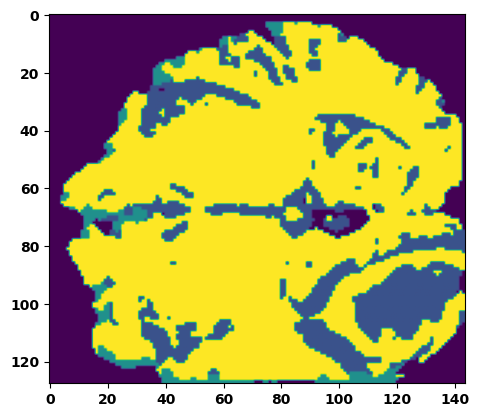

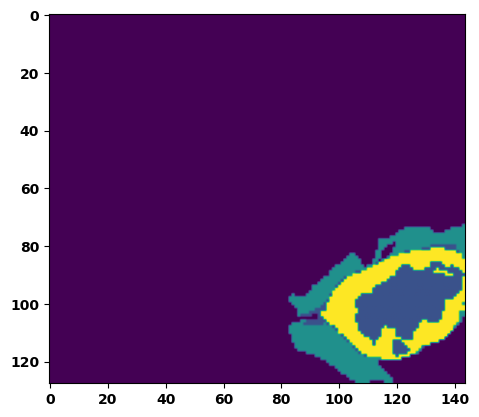

  6%|▌         | 2/36 [00:03<00:59,  1.75s/it]

Batch_id:  1 Eval loss:  0.7562077641487122
Batch_id:  1 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:51,  1.56s/it]

Batch_id:  2 Eval loss:  0.7419540882110596
Batch_id:  2 Eval IoU:  tensor(0.1874, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.4961, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3075, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9297, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.3054, device='cuda:0')


 11%|█         | 4/36 [00:06<00:46,  1.45s/it]

Batch_id:  3 Eval loss:  0.771315336227417
Batch_id:  3 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.46s/it]

Batch_id:  4 Eval loss:  0.7503390312194824
Batch_id:  4 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:44,  1.48s/it]

Batch_id:  5 Eval loss:  0.3510609269142151
Batch_id:  5 Eval IoU:  tensor(0.5683, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.43s/it]

Batch_id:  6 Eval loss:  0.2696818709373474
Batch_id:  6 Eval IoU:  tensor(0.6974, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:41,  1.47s/it]

Batch_id:  7 Eval loss:  0.4803818464279175
Batch_id:  7 Eval IoU:  tensor(0.4243, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.7593, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.6484, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.6455, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.45s/it]

Batch_id:  8 Eval loss:  0.12514746189117432
Batch_id:  8 Eval IoU:  tensor(0.8248, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9876, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.48s/it]

Batch_id:  9 Eval loss:  0.2540501356124878
Batch_id:  9 Eval IoU:  tensor(0.7368, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  10 Eval loss:  0.489590585231781
Batch_id:  10 Eval IoU:  tensor(0.4443, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9349, device='cuda:0')


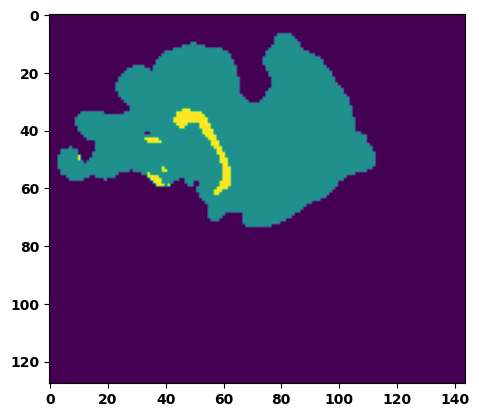

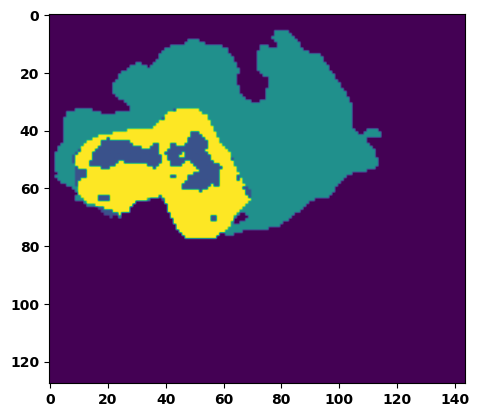

 33%|███▎      | 12/36 [00:18<00:37,  1.54s/it]

Batch_id:  11 Eval loss:  0.6903882026672363
Batch_id:  11 Eval IoU:  tensor(0.2699, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9194, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9041, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9857, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.49s/it]

Batch_id:  12 Eval loss:  0.7742316126823425
Batch_id:  12 Eval IoU:  tensor(0.1995, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7981, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.50s/it]

Batch_id:  13 Eval loss:  0.7059338092803955
Batch_id:  13 Eval IoU:  tensor(0.2605, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.7096988558769226
Batch_id:  14 Eval IoU:  tensor(0.1998, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.5384, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.3680, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.3315, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.44s/it]

Batch_id:  15 Eval loss:  0.7524803280830383
Batch_id:  15 Eval IoU:  tensor(0.1783, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7068, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6290, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.5609, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:26,  1.41s/it]

Batch_id:  16 Eval loss:  0.568637490272522
Batch_id:  16 Eval IoU:  tensor(0.3363, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8138, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7691, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.7346, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9542, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.46s/it]

Batch_id:  17 Eval loss:  0.7589796185493469
Batch_id:  17 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.42s/it]

Batch_id:  18 Eval loss:  0.7008084654808044
Batch_id:  18 Eval IoU:  tensor(0.2658, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.45s/it]

Batch_id:  19 Eval loss:  0.5524839758872986
Batch_id:  19 Eval IoU:  tensor(0.4136, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  20 Eval loss:  0.6905784010887146
Batch_id:  20 Eval IoU:  tensor(0.2679, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9266, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9770, device='cuda:0')


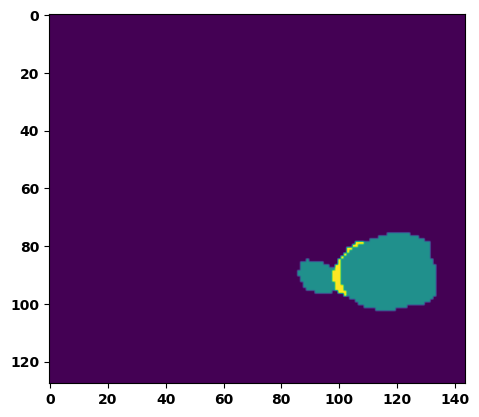

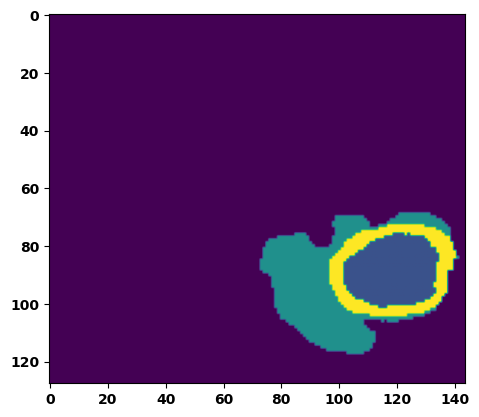

 61%|██████    | 22/36 [00:32<00:21,  1.52s/it]

Batch_id:  21 Eval loss:  0.8682680726051331
Batch_id:  21 Eval IoU:  tensor(0.0858, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.4819, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.2258, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.2616, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9837, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.53s/it]

Batch_id:  22 Eval loss:  0.2297222912311554
Batch_id:  22 Eval IoU:  tensor(0.7710, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9983, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.54s/it]

Batch_id:  23 Eval loss:  0.7650647163391113
Batch_id:  23 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.49s/it]

Batch_id:  24 Eval loss:  0.3775770664215088
Batch_id:  24 Eval IoU:  tensor(0.5670, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.49s/it]

Batch_id:  25 Eval loss:  0.7558979392051697
Batch_id:  25 Eval IoU:  tensor(0.1543, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.5646, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4276, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8408, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8882, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.5373, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:12,  1.40s/it]

Batch_id:  26 Eval loss:  0.8949283361434937
Batch_id:  26 Eval IoU:  tensor(0.0595, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.4613, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.3353, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.1952, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.45s/it]

Batch_id:  27 Eval loss:  0.3983610272407532
Batch_id:  27 Eval IoU:  tensor(0.5193, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9866, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.45s/it]

Batch_id:  28 Eval loss:  0.5692177414894104
Batch_id:  28 Eval IoU:  tensor(0.3699, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9267, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.5952489972114563
Batch_id:  29 Eval IoU:  tensor(0.3681, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  30 Eval loss:  0.3907510042190552
Batch_id:  30 Eval IoU:  tensor(0.5880, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


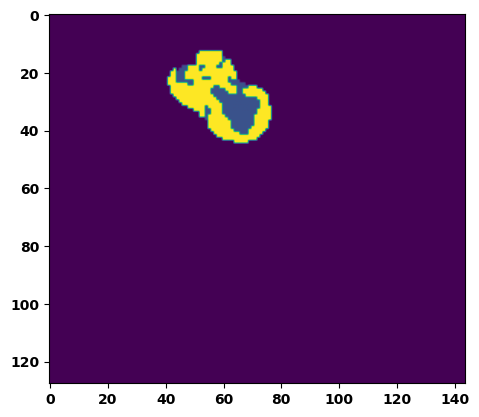

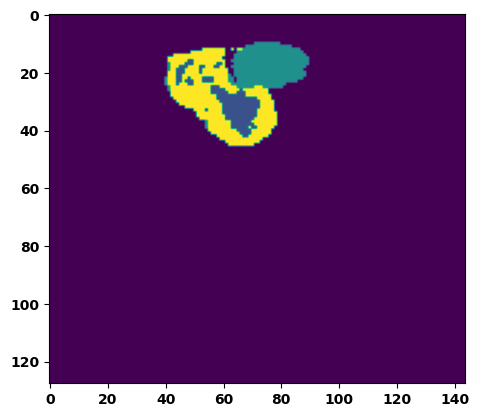

 89%|████████▉ | 32/36 [00:47<00:05,  1.44s/it]

Batch_id:  31 Eval loss:  0.33180323243141174
Batch_id:  31 Eval IoU:  tensor(0.6426, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.42s/it]

Batch_id:  32 Eval loss:  0.22685375809669495
Batch_id:  32 Eval IoU:  tensor(0.7487, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.40s/it]

Batch_id:  33 Eval loss:  0.7299777269363403
Batch_id:  33 Eval IoU:  tensor(0.1766, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.5652, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4428, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9316, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9049, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.4163, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.41s/it]

Batch_id:  34 Eval loss:  0.33900880813598633
Batch_id:  34 Eval IoU:  tensor(0.5490, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9141, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.46s/it]

Batch_id:  35 Eval loss:  0.8914355039596558
Batch_id:  35 Eval IoU:  tensor(0.0685, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4819, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3971, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8805, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2469, device='cuda:0')
Epoch  5 Training loss:  0.28671790564602073
Epoch  5 Evaluation loss:  0.5834073184265031
Epoch  5 Training accuracy :  tensor(0.6682)
Epoch  5 Evaluation accuracy :  tensor(0.3675)
Epoch  5 Training Mean Dice Score:  tensor(0.9678)
Epoch  5 Eval Mean Dice Score:  tensor(0.8414)
Epoch  5 Training Non-tumor Dice Score:  tensor(0.9708)
Epoch  5 Eval Non-tumor Dice Score:  tensor(0.7937)
Epoch  5 Training NCR/NET Dice Score:  tensor(0.9817)
Epoch  5 Eval NCR/NET Dice Score:  tensor(0.9678)
Epoch  5 Training ED Dice Score:  tensor(0.9667)
Epoch  

Epoch: 6
Training in session: 


  1%|          | 1/110 [00:01<03:16,  1.80s/it]

Batch_id:  0 Training loss:  0.18316374719142914
Batch_id:  0 Training IoU:  tensor(0.7491, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:49,  1.57s/it]

Batch_id:  1 Training loss:  0.5732666850090027
Batch_id:  1 Training IoU:  tensor(0.3558, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9200, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9170, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:39,  1.49s/it]

Batch_id:  2 Training loss:  0.24113933742046356
Batch_id:  2 Training IoU:  tensor(0.6911, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:42,  1.53s/it]

Batch_id:  3 Training loss:  0.16155016422271729
Batch_id:  3 Training IoU:  tensor(0.7829, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:41,  1.53s/it]

Batch_id:  4 Training loss:  0.17415128648281097
Batch_id:  4 Training IoU:  tensor(0.7988, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:34,  1.48s/it]

Batch_id:  5 Training loss:  0.2491895705461502
Batch_id:  5 Training IoU:  tensor(0.6843, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:31,  1.47s/it]

Batch_id:  6 Training loss:  0.21050071716308594
Batch_id:  6 Training IoU:  tensor(0.7104, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:26,  1.44s/it]

Batch_id:  7 Training loss:  0.5191474556922913
Batch_id:  7 Training IoU:  tensor(0.4061, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9151, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9384, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:20,  1.39s/it]

Batch_id:  8 Training loss:  0.4348929822444916
Batch_id:  8 Training IoU:  tensor(0.4552, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9240, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9314, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:20,  1.41s/it]

Batch_id:  9 Training loss:  0.3621227443218231
Batch_id:  9 Training IoU:  tensor(0.5629, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 10%|█         | 11/110 [00:16<02:24,  1.46s/it]

Batch_id:  10 Training loss:  0.2439374327659607
Batch_id:  10 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 11%|█         | 12/110 [00:17<02:17,  1.41s/it]

Batch_id:  11 Training loss:  0.2914101481437683
Batch_id:  11 Training IoU:  tensor(0.6750, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:17,  1.41s/it]

Batch_id:  12 Training loss:  0.28163942694664
Batch_id:  12 Training IoU:  tensor(0.6800, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:17,  1.43s/it]

Batch_id:  13 Training loss:  0.17127875983715057
Batch_id:  13 Training IoU:  tensor(0.7754, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:16,  1.43s/it]

Batch_id:  14 Training loss:  0.09999959170818329
Batch_id:  14 Training IoU:  tensor(0.8805, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:13,  1.43s/it]

Batch_id:  15 Training loss:  0.36018750071525574
Batch_id:  15 Training IoU:  tensor(0.5427, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:22,  1.53s/it]

Batch_id:  16 Training loss:  0.2744849920272827
Batch_id:  16 Training IoU:  tensor(0.6438, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:21,  1.54s/it]

Batch_id:  17 Training loss:  0.20042164623737335
Batch_id:  17 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:19,  1.54s/it]

Batch_id:  18 Training loss:  0.2250160574913025
Batch_id:  18 Training IoU:  tensor(0.6913, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:16,  1.52s/it]

Batch_id:  19 Training loss:  0.2869093418121338
Batch_id:  19 Training IoU:  tensor(0.6913, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:09,  1.46s/it]

Batch_id:  20 Training loss:  0.2179999202489853
Batch_id:  20 Training IoU:  tensor(0.7378, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 20%|██        | 22/110 [00:32<02:11,  1.49s/it]

Batch_id:  21 Training loss:  0.13219065964221954
Batch_id:  21 Training IoU:  tensor(0.8356, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 21%|██        | 23/110 [00:33<02:05,  1.45s/it]

Batch_id:  22 Training loss:  0.3505643606185913
Batch_id:  22 Training IoU:  tensor(0.5636, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:04,  1.44s/it]

Batch_id:  23 Training loss:  0.2613140046596527
Batch_id:  23 Training IoU:  tensor(0.6388, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:02,  1.44s/it]

Batch_id:  24 Training loss:  0.12224692106246948
Batch_id:  24 Training IoU:  tensor(0.8532, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 24%|██▎       | 26/110 [00:38<01:57,  1.39s/it]

Batch_id:  25 Training loss:  0.29760831594467163
Batch_id:  25 Training IoU:  tensor(0.6120, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:55,  1.39s/it]

Batch_id:  26 Training loss:  0.21785466372966766
Batch_id:  26 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:56,  1.43s/it]

Batch_id:  27 Training loss:  0.4340374171733856
Batch_id:  27 Training IoU:  tensor(0.4941, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:55,  1.43s/it]

Batch_id:  28 Training loss:  0.3347610831260681
Batch_id:  28 Training IoU:  tensor(0.5751, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:54,  1.43s/it]

Batch_id:  29 Training loss:  0.24440370500087738
Batch_id:  29 Training IoU:  tensor(0.6915, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:54,  1.45s/it]

Batch_id:  30 Training loss:  0.4682362675666809
Batch_id:  30 Training IoU:  tensor(0.4351, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9173, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:54,  1.47s/it]

Batch_id:  31 Training loss:  0.1518750935792923
Batch_id:  31 Training IoU:  tensor(0.8068, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 30%|███       | 33/110 [00:48<01:50,  1.44s/it]

Batch_id:  32 Training loss:  0.18990744650363922
Batch_id:  32 Training IoU:  tensor(0.7306, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 31%|███       | 34/110 [00:49<01:50,  1.45s/it]

Batch_id:  33 Training loss:  0.2971469461917877
Batch_id:  33 Training IoU:  tensor(0.6031, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9693, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:49,  1.46s/it]

Batch_id:  34 Training loss:  0.1884617954492569
Batch_id:  34 Training IoU:  tensor(0.7611, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:47,  1.45s/it]

Batch_id:  35 Training loss:  0.27245092391967773
Batch_id:  35 Training IoU:  tensor(0.6687, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:54,  1.56s/it]

Batch_id:  36 Training loss:  0.307341992855072
Batch_id:  36 Training IoU:  tensor(0.7001, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:51,  1.55s/it]

Batch_id:  37 Training loss:  0.2729254364967346
Batch_id:  37 Training IoU:  tensor(0.7039, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:48,  1.53s/it]

Batch_id:  38 Training loss:  0.24790836870670319
Batch_id:  38 Training IoU:  tensor(0.7382, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:48,  1.55s/it]

Batch_id:  39 Training loss:  0.3743738532066345
Batch_id:  39 Training IoU:  tensor(0.5928, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:43,  1.49s/it]

Batch_id:  40 Training loss:  0.2604306936264038
Batch_id:  40 Training IoU:  tensor(0.6799, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:41,  1.50s/it]

Batch_id:  41 Training loss:  0.20833562314510345
Batch_id:  41 Training IoU:  tensor(0.7048, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:45,  1.58s/it]

Batch_id:  42 Training loss:  0.1613946408033371
Batch_id:  42 Training IoU:  tensor(0.8052, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 40%|████      | 44/110 [01:05<01:41,  1.53s/it]

Batch_id:  43 Training loss:  0.17311647534370422
Batch_id:  43 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 41%|████      | 45/110 [01:06<01:40,  1.55s/it]

Batch_id:  44 Training loss:  0.4619995653629303
Batch_id:  44 Training IoU:  tensor(0.4678, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:37,  1.53s/it]

Batch_id:  45 Training loss:  0.22602592408657074
Batch_id:  45 Training IoU:  tensor(0.7736, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:34,  1.50s/it]

Batch_id:  46 Training loss:  0.33833253383636475
Batch_id:  46 Training IoU:  tensor(0.6445, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:30,  1.47s/it]

Batch_id:  47 Training loss:  0.2073386311531067
Batch_id:  47 Training IoU:  tensor(0.7351, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:26,  1.43s/it]

Batch_id:  48 Training loss:  0.1941860318183899
Batch_id:  48 Training IoU:  tensor(0.7227, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:25,  1.42s/it]

Batch_id:  49 Training loss:  0.20282702147960663
Batch_id:  49 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:26,  1.47s/it]

Batch_id:  50 Training loss:  0.38244596123695374
Batch_id:  50 Training IoU:  tensor(0.6052, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:25,  1.47s/it]

Batch_id:  51 Training loss:  0.2818927764892578
Batch_id:  51 Training IoU:  tensor(0.6047, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9447, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:22,  1.45s/it]

Batch_id:  52 Training loss:  0.24959278106689453
Batch_id:  52 Training IoU:  tensor(0.6985, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:21,  1.46s/it]

Batch_id:  53 Training loss:  0.2961331903934479
Batch_id:  53 Training IoU:  tensor(0.5889, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9251, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9583, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:20,  1.47s/it]

Batch_id:  54 Training loss:  0.19861437380313873
Batch_id:  54 Training IoU:  tensor(0.7285, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:21,  1.51s/it]

Batch_id:  55 Training loss:  0.25909143686294556
Batch_id:  55 Training IoU:  tensor(0.6732, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:20,  1.52s/it]

Batch_id:  56 Training loss:  0.1814708262681961
Batch_id:  56 Training IoU:  tensor(0.7619, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:18,  1.51s/it]

Batch_id:  57 Training loss:  0.2568097710609436
Batch_id:  57 Training IoU:  tensor(0.6470, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9689, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:16,  1.49s/it]

Batch_id:  58 Training loss:  0.28413692116737366
Batch_id:  58 Training IoU:  tensor(0.6238, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:16,  1.52s/it]

Batch_id:  59 Training loss:  0.15024471282958984
Batch_id:  59 Training IoU:  tensor(0.7814, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:13,  1.50s/it]

Batch_id:  60 Training loss:  0.12184680998325348
Batch_id:  60 Training IoU:  tensor(0.8233, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:12,  1.51s/it]

Batch_id:  61 Training loss:  0.1308736354112625
Batch_id:  61 Training IoU:  tensor(0.8082, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:11,  1.52s/it]

Batch_id:  62 Training loss:  0.47787410020828247
Batch_id:  62 Training IoU:  tensor(0.4407, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9444, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:08,  1.49s/it]

Batch_id:  63 Training loss:  0.20210273563861847
Batch_id:  63 Training IoU:  tensor(0.7196, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:05,  1.46s/it]

Batch_id:  64 Training loss:  0.14999698102474213
Batch_id:  64 Training IoU:  tensor(0.7884, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:04,  1.47s/it]

Batch_id:  65 Training loss:  0.15957896411418915
Batch_id:  65 Training IoU:  tensor(0.7607, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9737, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:02,  1.46s/it]

Batch_id:  66 Training loss:  0.1875353902578354
Batch_id:  66 Training IoU:  tensor(0.7679, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:01,  1.47s/it]

Batch_id:  67 Training loss:  0.09766882658004761
Batch_id:  67 Training IoU:  tensor(0.8688, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<01:01,  1.50s/it]

Batch_id:  68 Training loss:  0.134646475315094
Batch_id:  68 Training IoU:  tensor(0.8026, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:59,  1.49s/it]

Batch_id:  69 Training loss:  0.35273444652557373
Batch_id:  69 Training IoU:  tensor(0.5923, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<00:57,  1.48s/it]

Batch_id:  70 Training loss:  0.4720369279384613
Batch_id:  70 Training IoU:  tensor(0.4532, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:57,  1.51s/it]

Batch_id:  71 Training loss:  0.26740455627441406
Batch_id:  71 Training IoU:  tensor(0.7156, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:57,  1.54s/it]

Batch_id:  72 Training loss:  0.09882023930549622
Batch_id:  72 Training IoU:  tensor(0.8706, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:53,  1.50s/it]

Batch_id:  73 Training loss:  0.3146817088127136
Batch_id:  73 Training IoU:  tensor(0.6559, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:51,  1.48s/it]

Batch_id:  74 Training loss:  0.14691944420337677
Batch_id:  74 Training IoU:  tensor(0.8086, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:50,  1.50s/it]

Batch_id:  75 Training loss:  0.3673129081726074
Batch_id:  75 Training IoU:  tensor(0.6017, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:50,  1.52s/it]

Batch_id:  76 Training loss:  0.1689586490392685
Batch_id:  76 Training IoU:  tensor(0.7636, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:48,  1.52s/it]

Batch_id:  77 Training loss:  0.3130577802658081
Batch_id:  77 Training IoU:  tensor(0.5906, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:47,  1.53s/it]

Batch_id:  78 Training loss:  0.12355922162532806
Batch_id:  78 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:45,  1.53s/it]

Batch_id:  79 Training loss:  0.1637839376926422
Batch_id:  79 Training IoU:  tensor(0.7701, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:44,  1.53s/it]

Batch_id:  80 Training loss:  0.30635184049606323
Batch_id:  80 Training IoU:  tensor(0.6600, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:42,  1.51s/it]

Batch_id:  81 Training loss:  0.5947449207305908
Batch_id:  81 Training IoU:  tensor(0.3277, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.8798, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.8757, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9185, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9082, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9371, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:41,  1.53s/it]

Batch_id:  82 Training loss:  0.24998152256011963
Batch_id:  82 Training IoU:  tensor(0.7001, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:39,  1.52s/it]

Batch_id:  83 Training loss:  0.3331170678138733
Batch_id:  83 Training IoU:  tensor(0.5782, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:38,  1.53s/it]

Batch_id:  84 Training loss:  0.2689548432826996
Batch_id:  84 Training IoU:  tensor(0.6371, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:36,  1.54s/it]

Batch_id:  85 Training loss:  0.16371940076351166
Batch_id:  85 Training IoU:  tensor(0.7584, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9731, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:34,  1.49s/it]

Batch_id:  86 Training loss:  0.14478619396686554
Batch_id:  86 Training IoU:  tensor(0.7869, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:33,  1.51s/it]

Batch_id:  87 Training loss:  0.16956660151481628
Batch_id:  87 Training IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:31,  1.51s/it]

Batch_id:  88 Training loss:  0.22132913768291473
Batch_id:  88 Training IoU:  tensor(0.6917, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:30,  1.52s/it]

Batch_id:  89 Training loss:  0.1210326999425888
Batch_id:  89 Training IoU:  tensor(0.8366, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:27,  1.47s/it]

Batch_id:  90 Training loss:  0.18045087158679962
Batch_id:  90 Training IoU:  tensor(0.7576, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9274, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9306, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.5854703187942505
Batch_id:  91 Training IoU:  tensor(0.3524, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9648, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:24,  1.46s/it]

Batch_id:  92 Training loss:  0.24068404734134674
Batch_id:  92 Training IoU:  tensor(0.6669, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9551, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:23,  1.48s/it]

Batch_id:  93 Training loss:  0.26743367314338684
Batch_id:  93 Training IoU:  tensor(0.6212, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9090, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:21,  1.45s/it]

Batch_id:  94 Training loss:  0.4055851101875305
Batch_id:  94 Training IoU:  tensor(0.5489, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:19,  1.42s/it]

Batch_id:  95 Training loss:  0.16362446546554565
Batch_id:  95 Training IoU:  tensor(0.7917, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.45s/it]

Batch_id:  96 Training loss:  0.29408639669418335
Batch_id:  96 Training IoU:  tensor(0.7192, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:16,  1.40s/it]

Batch_id:  97 Training loss:  0.18575656414031982
Batch_id:  97 Training IoU:  tensor(0.7656, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.39s/it]

Batch_id:  98 Training loss:  0.20523394644260406
Batch_id:  98 Training IoU:  tensor(0.7062, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:14,  1.41s/it]

Batch_id:  99 Training loss:  0.20793472230434418
Batch_id:  99 Training IoU:  tensor(0.7660, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:12,  1.37s/it]

Batch_id:  100 Training loss:  0.17720702290534973
Batch_id:  100 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.42s/it]

Batch_id:  101 Training loss:  0.15324923396110535
Batch_id:  101 Training IoU:  tensor(0.7969, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:09,  1.43s/it]

Batch_id:  102 Training loss:  0.22872225940227509
Batch_id:  102 Training IoU:  tensor(0.7158, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.47s/it]

Batch_id:  103 Training loss:  0.10772454738616943
Batch_id:  103 Training IoU:  tensor(0.8488, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.46s/it]

Batch_id:  104 Training loss:  0.30366039276123047
Batch_id:  104 Training IoU:  tensor(0.6091, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9547, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.43s/it]

Batch_id:  105 Training loss:  0.5333531498908997
Batch_id:  105 Training IoU:  tensor(0.4185, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.46s/it]

Batch_id:  106 Training loss:  0.2845572829246521
Batch_id:  106 Training IoU:  tensor(0.6146, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.4347192049026489
Batch_id:  107 Training IoU:  tensor(0.5194, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.46s/it]

Batch_id:  108 Training loss:  0.21314604580402374
Batch_id:  108 Training IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.3968154788017273
Batch_id:  109 Training IoU:  tensor(0.5411, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9924, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6517250537872314
Batch_id:  0 Eval IoU:  tensor(0.2918, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8595, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8076, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8341, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


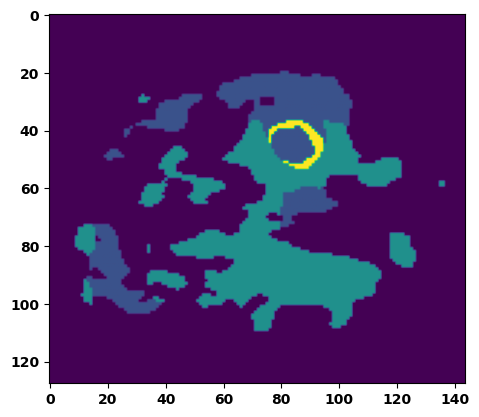

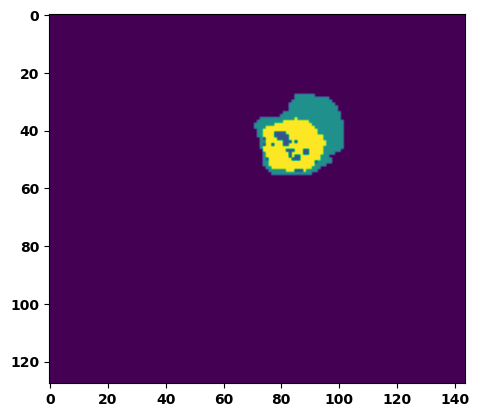

  6%|▌         | 2/36 [00:02<00:48,  1.44s/it]

Batch_id:  1 Eval loss:  0.3253431022167206
Batch_id:  1 Eval IoU:  tensor(0.5606, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9483, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.38s/it]

Batch_id:  2 Eval loss:  0.8718456029891968
Batch_id:  2 Eval IoU:  tensor(0.0785, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.4938, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3794, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.7953, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8640, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.4428, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.43s/it]

Batch_id:  3 Eval loss:  0.7762726545333862
Batch_id:  3 Eval IoU:  tensor(0.1995, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.7981, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.40s/it]

Batch_id:  4 Eval loss:  0.2189968079328537
Batch_id:  4 Eval IoU:  tensor(0.7118, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.42s/it]

Batch_id:  5 Eval loss:  0.9160407781600952
Batch_id:  5 Eval IoU:  tensor(0.0484, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4474, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.1907, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9003, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3173, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:39,  1.37s/it]

Batch_id:  6 Eval loss:  0.7720747590065002
Batch_id:  6 Eval IoU:  tensor(0.2047, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.43s/it]

Batch_id:  7 Eval loss:  0.8288484811782837
Batch_id:  7 Eval IoU:  tensor(0.0985, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4729, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.2560, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.7860, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.4207, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.39s/it]

Batch_id:  8 Eval loss:  0.6504436731338501
Batch_id:  8 Eval IoU:  tensor(0.2354, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6962, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.6011, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.5654, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9516, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:35,  1.37s/it]

Batch_id:  9 Eval loss:  0.8023040294647217
Batch_id:  9 Eval IoU:  tensor(0.1259, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.4711, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.2719, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8663, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.3260, device='cuda:0')
Batch_id:  10 Eval loss:  0.7391976714134216
Batch_id:  10 Eval IoU:  tensor(0.1722, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5634, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3873, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9222, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.4190, device='cuda:0')


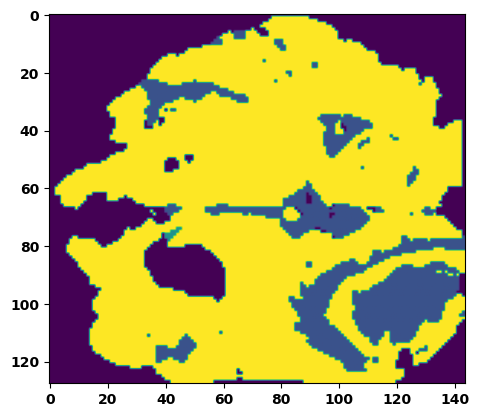

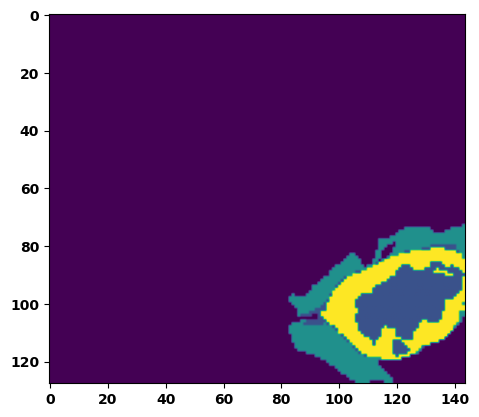

 33%|███▎      | 12/36 [00:16<00:33,  1.40s/it]

Batch_id:  11 Eval loss:  0.23108597099781036
Batch_id:  11 Eval IoU:  tensor(0.6857, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9680, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.47s/it]

Batch_id:  12 Eval loss:  0.5548177361488342
Batch_id:  12 Eval IoU:  tensor(0.3316, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7101, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.6354, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.8178, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7066, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9706, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:31,  1.45s/it]

Batch_id:  13 Eval loss:  0.5383973717689514
Batch_id:  13 Eval IoU:  tensor(0.4021, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.44s/it]

Batch_id:  14 Eval loss:  0.7502931356430054
Batch_id:  14 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.41s/it]

Batch_id:  15 Eval loss:  0.7536937594413757
Batch_id:  15 Eval IoU:  tensor(0.2391, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.40s/it]

Batch_id:  16 Eval loss:  0.44515150785446167
Batch_id:  16 Eval IoU:  tensor(0.4453, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8679, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8570, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.8216, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:26,  1.48s/it]

Batch_id:  17 Eval loss:  0.34630218148231506
Batch_id:  17 Eval IoU:  tensor(0.6252, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:25,  1.49s/it]

Batch_id:  18 Eval loss:  0.5529826283454895
Batch_id:  18 Eval IoU:  tensor(0.3281, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7327, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.6374, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.6454, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9712, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:24,  1.55s/it]

Batch_id:  19 Eval loss:  0.3424699902534485
Batch_id:  19 Eval IoU:  tensor(0.5798, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  20 Eval loss:  0.9216474294662476
Batch_id:  20 Eval IoU:  tensor(0.0445, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.4235, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3060, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.7877, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.2552, device='cuda:0')


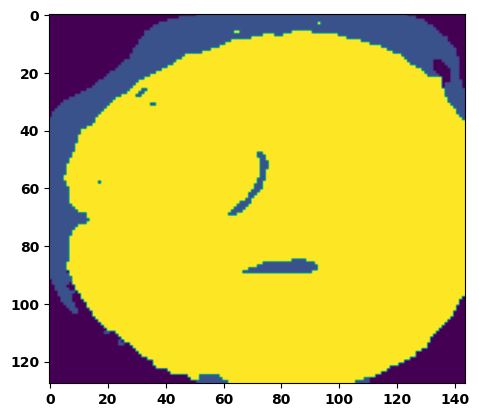

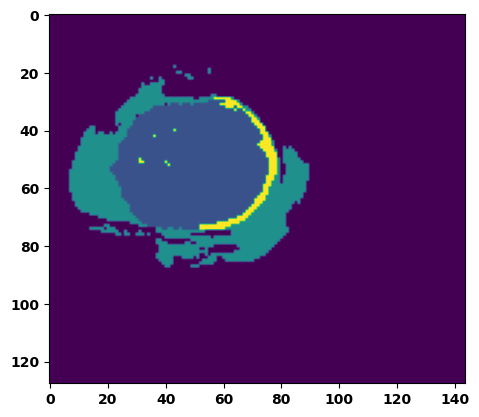

 61%|██████    | 22/36 [00:31<00:21,  1.51s/it]

Batch_id:  21 Eval loss:  0.45654433965682983
Batch_id:  21 Eval IoU:  tensor(0.4685, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.45s/it]

Batch_id:  22 Eval loss:  0.7591964602470398
Batch_id:  22 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.44s/it]

Batch_id:  23 Eval loss:  0.25104671716690063
Batch_id:  23 Eval IoU:  tensor(0.6589, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9933, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.41s/it]

Batch_id:  24 Eval loss:  0.2543277144432068
Batch_id:  24 Eval IoU:  tensor(0.6595, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9914, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.7564346790313721
Batch_id:  25 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.40s/it]

Batch_id:  26 Eval loss:  0.4811917841434479
Batch_id:  26 Eval IoU:  tensor(0.4129, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9286, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.39s/it]

Batch_id:  27 Eval loss:  0.34906691312789917
Batch_id:  27 Eval IoU:  tensor(0.5542, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9941, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.39s/it]

Batch_id:  28 Eval loss:  0.7554422616958618
Batch_id:  28 Eval IoU:  tensor(0.2374, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.37s/it]

Batch_id:  29 Eval loss:  0.4977131485939026
Batch_id:  29 Eval IoU:  tensor(0.4191, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  30 Eval loss:  0.2959613800048828
Batch_id:  30 Eval IoU:  tensor(0.6403, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


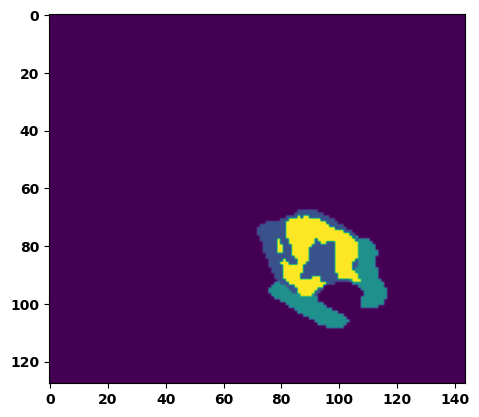

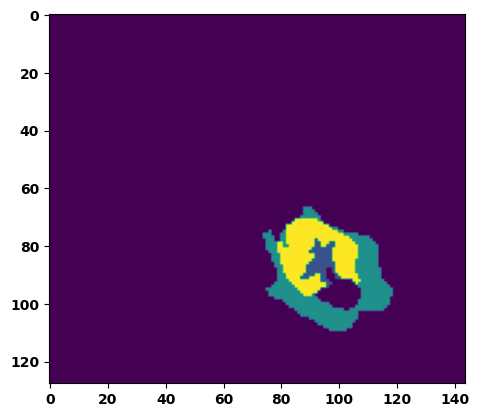

 89%|████████▉ | 32/36 [00:45<00:05,  1.45s/it]

Batch_id:  31 Eval loss:  0.688651442527771
Batch_id:  31 Eval IoU:  tensor(0.2344, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5776, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4162, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9446, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.4069, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.3968220353126526
Batch_id:  32 Eval IoU:  tensor(0.5108, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.40s/it]

Batch_id:  33 Eval loss:  0.7666352987289429
Batch_id:  33 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.46s/it]

Batch_id:  34 Eval loss:  0.23802600800991058
Batch_id:  34 Eval IoU:  tensor(0.6508, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9729, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.8844085931777954
Batch_id:  35 Eval IoU:  tensor(0.0635, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4187, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.2555, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.8784, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2202, device='cuda:0')
Epoch 00007: reducing learning rate of group 0 to 5.0000e-04.
Epoch  6 Training loss:  0.25906210324980994
Epoch  6 Evaluation loss:  0.5783723083635172
Epoch  6 Training accuracy :  tensor(0.6805)
Epoch  6 Evaluation accuracy :  tensor(0.3567)
Epoch  6 Training Mean Dice Score:  tensor(0.9693)
Epoch  6 Eval Mean Dice Score:  tensor(0.8260)
Epoch  6 Training Non-tumor Dice Score:  tensor(0.9712)
Epoch  6 Eval Non-tumor Dice Score:  tensor(0.7718)
Epoch  6 Training NCR/NET Dice Score:  tensor(0.9834)
Epoch  6 Eval NCR/NET Dice Score:  tensor(0.

Epoch: 7
Training in session: 


  1%|          | 1/110 [00:01<02:48,  1.55s/it]

Batch_id:  0 Training loss:  0.14387981593608856
Batch_id:  0 Training IoU:  tensor(0.7987, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:39,  1.48s/it]

Batch_id:  1 Training loss:  0.4319566488265991
Batch_id:  1 Training IoU:  tensor(0.4930, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9388, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:40,  1.50s/it]

Batch_id:  2 Training loss:  0.3963860273361206
Batch_id:  2 Training IoU:  tensor(0.5260, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:41,  1.52s/it]

Batch_id:  3 Training loss:  0.16697397828102112
Batch_id:  3 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:34,  1.47s/it]

Batch_id:  4 Training loss:  0.15829795598983765
Batch_id:  4 Training IoU:  tensor(0.7618, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:28,  1.43s/it]

Batch_id:  5 Training loss:  0.18169695138931274
Batch_id:  5 Training IoU:  tensor(0.7388, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9702, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:26,  1.43s/it]

Batch_id:  6 Training loss:  0.1938193291425705
Batch_id:  6 Training IoU:  tensor(0.7427, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:23,  1.41s/it]

Batch_id:  7 Training loss:  0.1801336407661438
Batch_id:  7 Training IoU:  tensor(0.7379, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:22,  1.41s/it]

Batch_id:  8 Training loss:  0.14539583027362823
Batch_id:  8 Training IoU:  tensor(0.7794, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:29,  1.49s/it]

Batch_id:  9 Training loss:  0.21527355909347534
Batch_id:  9 Training IoU:  tensor(0.6878, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 10%|█         | 11/110 [00:16<02:27,  1.49s/it]

Batch_id:  10 Training loss:  0.4053056240081787
Batch_id:  10 Training IoU:  tensor(0.5343, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 11%|█         | 12/110 [00:17<02:21,  1.44s/it]

Batch_id:  11 Training loss:  0.49873751401901245
Batch_id:  11 Training IoU:  tensor(0.4551, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:20,  1.45s/it]

Batch_id:  12 Training loss:  0.1446293443441391
Batch_id:  12 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:22,  1.49s/it]

Batch_id:  13 Training loss:  0.08763603866100311
Batch_id:  13 Training IoU:  tensor(0.8765, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:13,  1.40s/it]

Batch_id:  14 Training loss:  0.22632960975170135
Batch_id:  14 Training IoU:  tensor(0.7145, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:14,  1.43s/it]

Batch_id:  15 Training loss:  0.2512180507183075
Batch_id:  15 Training IoU:  tensor(0.6535, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:11,  1.42s/it]

Batch_id:  16 Training loss:  0.2845645546913147
Batch_id:  16 Training IoU:  tensor(0.6222, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:18,  1.51s/it]

Batch_id:  17 Training loss:  0.40680769085884094
Batch_id:  17 Training IoU:  tensor(0.4882, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:11,  1.45s/it]

Batch_id:  18 Training loss:  0.15017350018024445
Batch_id:  18 Training IoU:  tensor(0.7717, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:10,  1.45s/it]

Batch_id:  19 Training loss:  0.42636817693710327
Batch_id:  19 Training IoU:  tensor(0.4613, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9250, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9319, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:06,  1.42s/it]

Batch_id:  20 Training loss:  0.21761400997638702
Batch_id:  20 Training IoU:  tensor(0.7014, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 20%|██        | 22/110 [00:31<02:04,  1.41s/it]

Batch_id:  21 Training loss:  0.21979999542236328
Batch_id:  21 Training IoU:  tensor(0.7017, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 21%|██        | 23/110 [00:33<02:04,  1.43s/it]

Batch_id:  22 Training loss:  0.4593324363231659
Batch_id:  22 Training IoU:  tensor(0.4536, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9611, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:06,  1.47s/it]

Batch_id:  23 Training loss:  0.08927527070045471
Batch_id:  23 Training IoU:  tensor(0.8738, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:07,  1.50s/it]

Batch_id:  24 Training loss:  0.21845084428787231
Batch_id:  24 Training IoU:  tensor(0.7309, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:02,  1.46s/it]

Batch_id:  25 Training loss:  0.1626235395669937
Batch_id:  25 Training IoU:  tensor(0.7539, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:00,  1.45s/it]

Batch_id:  26 Training loss:  0.3886914849281311
Batch_id:  26 Training IoU:  tensor(0.5589, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:56,  1.42s/it]

Batch_id:  27 Training loss:  0.3181781768798828
Batch_id:  27 Training IoU:  tensor(0.5871, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:57,  1.46s/it]

Batch_id:  28 Training loss:  0.3444507122039795
Batch_id:  28 Training IoU:  tensor(0.6145, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:51,  1.39s/it]

Batch_id:  29 Training loss:  0.3410797715187073
Batch_id:  29 Training IoU:  tensor(0.5692, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:52,  1.42s/it]

Batch_id:  30 Training loss:  0.25009235739707947
Batch_id:  30 Training IoU:  tensor(0.6743, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:53,  1.45s/it]

Batch_id:  31 Training loss:  0.09095896780490875
Batch_id:  31 Training IoU:  tensor(0.8827, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 30%|███       | 33/110 [00:48<02:01,  1.58s/it]

Batch_id:  32 Training loss:  0.2623980641365051
Batch_id:  32 Training IoU:  tensor(0.6971, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 31%|███       | 34/110 [00:49<01:57,  1.54s/it]

Batch_id:  33 Training loss:  0.40301942825317383
Batch_id:  33 Training IoU:  tensor(0.5377, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.1260795295238495
Batch_id:  34 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:48,  1.47s/it]

Batch_id:  35 Training loss:  0.24407872557640076
Batch_id:  35 Training IoU:  tensor(0.6718, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:44,  1.43s/it]

Batch_id:  36 Training loss:  0.22304394841194153
Batch_id:  36 Training IoU:  tensor(0.6853, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:43,  1.44s/it]

Batch_id:  37 Training loss:  0.29200953245162964
Batch_id:  37 Training IoU:  tensor(0.6319, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:41,  1.44s/it]

Batch_id:  38 Training loss:  0.2880975008010864
Batch_id:  38 Training IoU:  tensor(0.6596, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:38,  1.41s/it]

Batch_id:  39 Training loss:  0.5828099846839905
Batch_id:  39 Training IoU:  tensor(0.3439, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.8884, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.8704, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9286, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9333, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:42,  1.49s/it]

Batch_id:  40 Training loss:  0.33354657888412476
Batch_id:  40 Training IoU:  tensor(0.6276, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:38,  1.45s/it]

Batch_id:  41 Training loss:  0.24196910858154297
Batch_id:  41 Training IoU:  tensor(0.7336, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:41,  1.51s/it]

Batch_id:  42 Training loss:  0.25400251150131226
Batch_id:  42 Training IoU:  tensor(0.7593, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 40%|████      | 44/110 [01:04<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.14741119742393494
Batch_id:  43 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 41%|████      | 45/110 [01:05<01:35,  1.47s/it]

Batch_id:  44 Training loss:  0.24771355092525482
Batch_id:  44 Training IoU:  tensor(0.7826, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:35,  1.50s/it]

Batch_id:  45 Training loss:  0.09566089510917664
Batch_id:  45 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:35,  1.52s/it]

Batch_id:  46 Training loss:  0.14493387937545776
Batch_id:  46 Training IoU:  tensor(0.8088, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:31,  1.47s/it]

Batch_id:  47 Training loss:  0.1235751062631607
Batch_id:  47 Training IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:28,  1.45s/it]

Batch_id:  48 Training loss:  0.13902345299720764
Batch_id:  48 Training IoU:  tensor(0.7953, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:26,  1.43s/it]

Batch_id:  49 Training loss:  0.13691134750843048
Batch_id:  49 Training IoU:  tensor(0.8091, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:23,  1.42s/it]

Batch_id:  50 Training loss:  0.2359422743320465
Batch_id:  50 Training IoU:  tensor(0.6989, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:21,  1.40s/it]

Batch_id:  51 Training loss:  0.18239203095436096
Batch_id:  51 Training IoU:  tensor(0.7348, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:21,  1.42s/it]

Batch_id:  52 Training loss:  0.27977460622787476
Batch_id:  52 Training IoU:  tensor(0.6043, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9083, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:19,  1.43s/it]

Batch_id:  53 Training loss:  0.138620987534523
Batch_id:  53 Training IoU:  tensor(0.7944, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:17,  1.40s/it]

Batch_id:  54 Training loss:  0.5675051808357239
Batch_id:  54 Training IoU:  tensor(0.3538, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9050, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:15,  1.40s/it]

Batch_id:  55 Training loss:  0.15738505125045776
Batch_id:  55 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:14,  1.40s/it]

Batch_id:  56 Training loss:  0.3246861696243286
Batch_id:  56 Training IoU:  tensor(0.6475, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:15,  1.45s/it]

Batch_id:  57 Training loss:  0.22341297566890717
Batch_id:  57 Training IoU:  tensor(0.7206, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:14,  1.45s/it]

Batch_id:  58 Training loss:  0.12147092819213867
Batch_id:  58 Training IoU:  tensor(0.8118, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:13,  1.46s/it]

Batch_id:  59 Training loss:  0.11794903874397278
Batch_id:  59 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:13,  1.50s/it]

Batch_id:  60 Training loss:  0.1734069585800171
Batch_id:  60 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:11,  1.48s/it]

Batch_id:  61 Training loss:  0.22321482002735138
Batch_id:  61 Training IoU:  tensor(0.7389, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:09,  1.48s/it]

Batch_id:  62 Training loss:  0.1098024845123291
Batch_id:  62 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:06,  1.44s/it]

Batch_id:  63 Training loss:  0.1680385172367096
Batch_id:  63 Training IoU:  tensor(0.7746, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:06,  1.47s/it]

Batch_id:  64 Training loss:  0.3591766953468323
Batch_id:  64 Training IoU:  tensor(0.6095, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:04,  1.46s/it]

Batch_id:  65 Training loss:  0.15636928379535675
Batch_id:  65 Training IoU:  tensor(0.7902, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.2189001441001892
Batch_id:  66 Training IoU:  tensor(0.7334, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:04,  1.54s/it]

Batch_id:  67 Training loss:  0.18344177305698395
Batch_id:  67 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<01:02,  1.52s/it]

Batch_id:  68 Training loss:  0.1198883205652237
Batch_id:  68 Training IoU:  tensor(0.8350, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<01:00,  1.51s/it]

Batch_id:  69 Training loss:  0.09822042286396027
Batch_id:  69 Training IoU:  tensor(0.8660, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:57,  1.47s/it]

Batch_id:  70 Training loss:  0.23666058480739594
Batch_id:  70 Training IoU:  tensor(0.6862, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:56,  1.49s/it]

Batch_id:  71 Training loss:  0.20606006681919098
Batch_id:  71 Training IoU:  tensor(0.7519, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:54,  1.49s/it]

Batch_id:  72 Training loss:  0.3189793825149536
Batch_id:  72 Training IoU:  tensor(0.5735, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:53,  1.49s/it]

Batch_id:  73 Training loss:  0.29272082448005676
Batch_id:  73 Training IoU:  tensor(0.6167, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:52,  1.49s/it]

Batch_id:  74 Training loss:  0.17209191620349884
Batch_id:  74 Training IoU:  tensor(0.7414, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:50,  1.49s/it]

Batch_id:  75 Training loss:  0.12372928857803345
Batch_id:  75 Training IoU:  tensor(0.8192, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9720, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:47,  1.43s/it]

Batch_id:  76 Training loss:  0.2856314480304718
Batch_id:  76 Training IoU:  tensor(0.6881, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:46,  1.44s/it]

Batch_id:  77 Training loss:  0.3671112358570099
Batch_id:  77 Training IoU:  tensor(0.5672, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:44,  1.44s/it]

Batch_id:  78 Training loss:  0.16129685938358307
Batch_id:  78 Training IoU:  tensor(0.7660, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:42,  1.43s/it]

Batch_id:  79 Training loss:  0.31037986278533936
Batch_id:  79 Training IoU:  tensor(0.5823, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9629, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:41,  1.44s/it]

Batch_id:  80 Training loss:  0.1905267834663391
Batch_id:  80 Training IoU:  tensor(0.7391, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:41,  1.48s/it]

Batch_id:  81 Training loss:  0.1467103511095047
Batch_id:  81 Training IoU:  tensor(0.7839, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:40,  1.51s/it]

Batch_id:  82 Training loss:  0.13407927751541138
Batch_id:  82 Training IoU:  tensor(0.7941, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:39,  1.50s/it]

Batch_id:  83 Training loss:  0.19163885712623596
Batch_id:  83 Training IoU:  tensor(0.7292, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:36,  1.48s/it]

Batch_id:  84 Training loss:  0.1899268925189972
Batch_id:  84 Training IoU:  tensor(0.7357, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:35,  1.47s/it]

Batch_id:  85 Training loss:  0.32988888025283813
Batch_id:  85 Training IoU:  tensor(0.6290, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:35,  1.54s/it]

Batch_id:  86 Training loss:  0.22460459172725677
Batch_id:  86 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 80%|████████  | 88/110 [02:08<00:33,  1.54s/it]

Batch_id:  87 Training loss:  0.24580955505371094
Batch_id:  87 Training IoU:  tensor(0.7427, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:32,  1.53s/it]

Batch_id:  88 Training loss:  0.20469655096530914
Batch_id:  88 Training IoU:  tensor(0.7434, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:30,  1.55s/it]

Batch_id:  89 Training loss:  0.13193905353546143
Batch_id:  89 Training IoU:  tensor(0.8141, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:29,  1.53s/it]

Batch_id:  90 Training loss:  0.2064361572265625
Batch_id:  90 Training IoU:  tensor(0.7077, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9586, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:27,  1.52s/it]

Batch_id:  91 Training loss:  0.10579569637775421
Batch_id:  91 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:26,  1.58s/it]

Batch_id:  92 Training loss:  0.2321830689907074
Batch_id:  92 Training IoU:  tensor(0.6610, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9202, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:24,  1.52s/it]

Batch_id:  93 Training loss:  0.2659263610839844
Batch_id:  93 Training IoU:  tensor(0.6336, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:23,  1.56s/it]

Batch_id:  94 Training loss:  0.3170577883720398
Batch_id:  94 Training IoU:  tensor(0.6390, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:21,  1.57s/it]

Batch_id:  95 Training loss:  0.13181523978710175
Batch_id:  95 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:20,  1.58s/it]

Batch_id:  96 Training loss:  0.20819248259067535
Batch_id:  96 Training IoU:  tensor(0.7320, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.16296738386154175
Batch_id:  97 Training IoU:  tensor(0.7675, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.53s/it]

Batch_id:  98 Training loss:  0.10132735967636108
Batch_id:  98 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:15,  1.55s/it]

Batch_id:  99 Training loss:  0.08688552677631378
Batch_id:  99 Training IoU:  tensor(0.8752, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:14,  1.56s/it]

Batch_id:  100 Training loss:  0.3586673140525818
Batch_id:  100 Training IoU:  tensor(0.5343, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9545, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:12,  1.54s/it]

Batch_id:  101 Training loss:  0.6142668128013611
Batch_id:  101 Training IoU:  tensor(0.3215, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9680, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.51s/it]

Batch_id:  102 Training loss:  0.2203225940465927
Batch_id:  102 Training IoU:  tensor(0.6832, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9314, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9752, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.49s/it]

Batch_id:  103 Training loss:  0.12256385385990143
Batch_id:  103 Training IoU:  tensor(0.8289, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.49s/it]

Batch_id:  104 Training loss:  0.2795163094997406
Batch_id:  104 Training IoU:  tensor(0.7137, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:06,  1.52s/it]

Batch_id:  105 Training loss:  0.08314196765422821
Batch_id:  105 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.57s/it]

Batch_id:  106 Training loss:  0.26982980966567993
Batch_id:  106 Training IoU:  tensor(0.6180, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9703, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:03,  1.57s/it]

Batch_id:  107 Training loss:  0.14400461316108704
Batch_id:  107 Training IoU:  tensor(0.7965, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.53s/it]

Batch_id:  108 Training loss:  0.17043280601501465
Batch_id:  108 Training IoU:  tensor(0.7880, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.07224729657173157
Batch_id:  109 Training IoU:  tensor(0.8983, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9942, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.22246558964252472
Batch_id:  0 Eval IoU:  tensor(0.6898, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


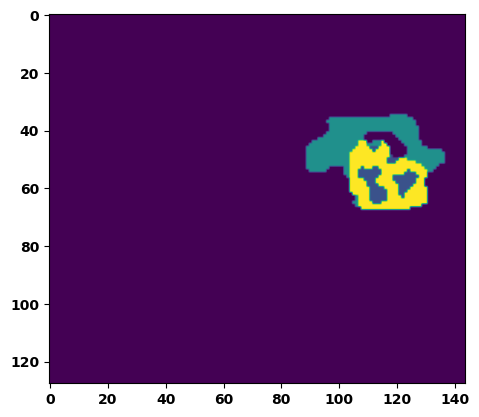

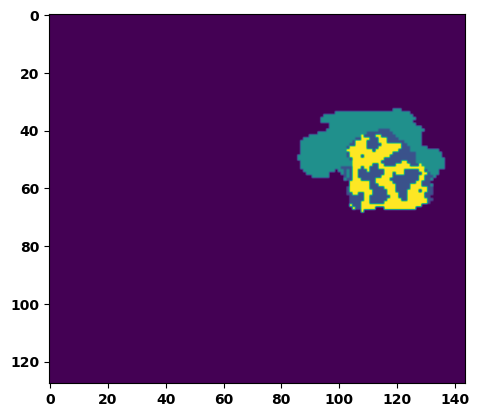

  6%|▌         | 2/36 [00:03<00:51,  1.50s/it]

Batch_id:  1 Eval loss:  0.579116702079773
Batch_id:  1 Eval IoU:  tensor(0.3396, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9081, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8726, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8692, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9903, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.37s/it]

Batch_id:  2 Eval loss:  0.747916042804718
Batch_id:  2 Eval IoU:  tensor(0.1592, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6153, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5119, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.4246, device='cuda:0')


 11%|█         | 4/36 [00:05<00:44,  1.39s/it]

Batch_id:  3 Eval loss:  0.2684357166290283
Batch_id:  3 Eval IoU:  tensor(0.6170, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9563, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:41,  1.33s/it]

Batch_id:  4 Eval loss:  0.1334017515182495
Batch_id:  4 Eval IoU:  tensor(0.8231, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:38,  1.29s/it]

Batch_id:  5 Eval loss:  0.29986900091171265
Batch_id:  5 Eval IoU:  tensor(0.6063, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9921, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:38,  1.32s/it]

Batch_id:  6 Eval loss:  0.8762986660003662
Batch_id:  6 Eval IoU:  tensor(0.0811, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.5098, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4380, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.2657, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.44s/it]

Batch_id:  7 Eval loss:  0.3838115334510803
Batch_id:  7 Eval IoU:  tensor(0.5654, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9867, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.40s/it]

Batch_id:  8 Eval loss:  0.9205969572067261
Batch_id:  8 Eval IoU:  tensor(0.0465, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.4533, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.2006, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2259, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:35,  1.36s/it]

Batch_id:  9 Eval loss:  0.39707475900650024
Batch_id:  9 Eval IoU:  tensor(0.5064, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  10 Eval loss:  0.7656623125076294
Batch_id:  10 Eval IoU:  tensor(0.2079, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8783, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8175, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


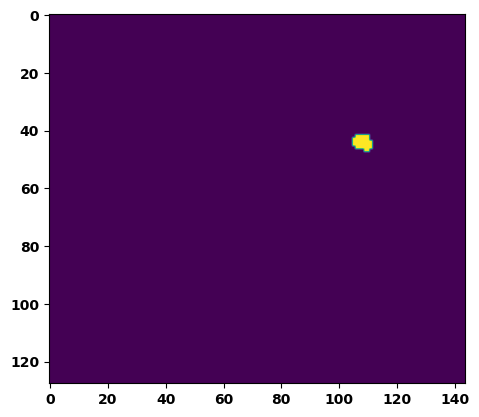

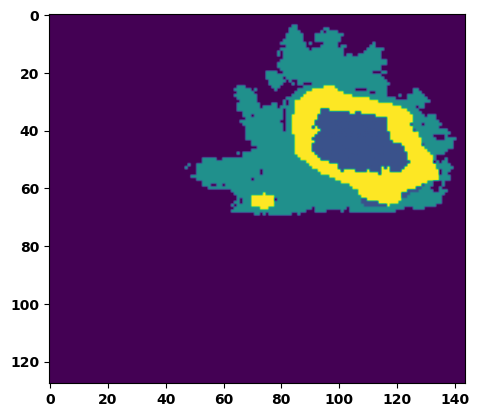

 33%|███▎      | 12/36 [00:16<00:35,  1.48s/it]

Batch_id:  11 Eval loss:  0.17485524713993073
Batch_id:  11 Eval IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.47s/it]

Batch_id:  12 Eval loss:  0.27852606773376465
Batch_id:  12 Eval IoU:  tensor(0.6533, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9640, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.52s/it]

Batch_id:  13 Eval loss:  0.7592445015907288
Batch_id:  13 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.47s/it]

Batch_id:  14 Eval loss:  0.1182602196931839
Batch_id:  14 Eval IoU:  tensor(0.8107, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9795, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.45s/it]

Batch_id:  15 Eval loss:  0.7460401654243469
Batch_id:  15 Eval IoU:  tensor(0.1634, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5514, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4205, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3386, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:28,  1.52s/it]

Batch_id:  16 Eval loss:  0.9003027677536011
Batch_id:  16 Eval IoU:  tensor(0.0589, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.4641, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3400, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.1962, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:26,  1.48s/it]

Batch_id:  17 Eval loss:  0.5667304992675781
Batch_id:  17 Eval IoU:  tensor(0.3888, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8999, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:25,  1.47s/it]

Batch_id:  18 Eval loss:  0.4140510559082031
Batch_id:  18 Eval IoU:  tensor(0.4767, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7841, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.6923, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.6886, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.43s/it]

Batch_id:  19 Eval loss:  0.46261611580848694
Batch_id:  19 Eval IoU:  tensor(0.4704, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  20 Eval loss:  0.5964040160179138
Batch_id:  20 Eval IoU:  tensor(0.3617, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


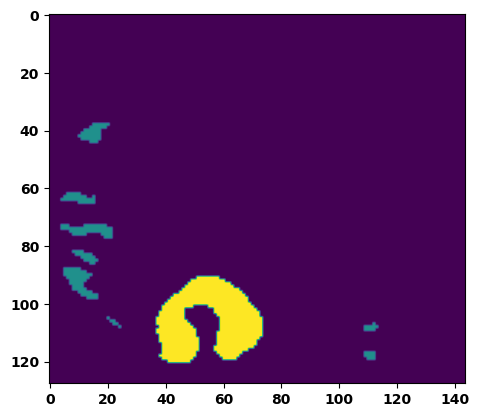

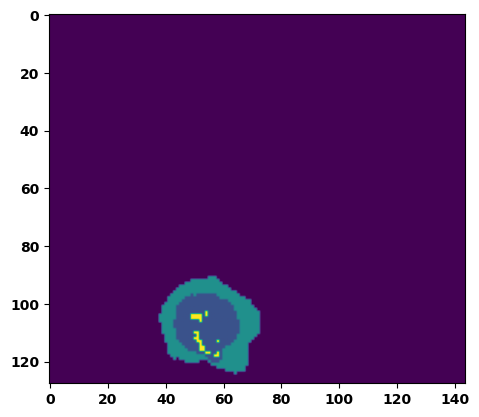

 61%|██████    | 22/36 [00:32<00:22,  1.58s/it]

Batch_id:  21 Eval loss:  0.6619269251823425
Batch_id:  21 Eval IoU:  tensor(0.2302, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.7038, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.6143, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.5607, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9526, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:20,  1.54s/it]

Batch_id:  22 Eval loss:  0.509651243686676
Batch_id:  22 Eval IoU:  tensor(0.3760, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7508, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.6451, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9283, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.7065, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9723, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.52s/it]

Batch_id:  23 Eval loss:  0.18942014873027802
Batch_id:  23 Eval IoU:  tensor(0.7522, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.6714900135993958
Batch_id:  24 Eval IoU:  tensor(0.2950, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.44s/it]

Batch_id:  25 Eval loss:  0.8648035526275635
Batch_id:  25 Eval IoU:  tensor(0.0746, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4608, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3077, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.1925, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:12,  1.40s/it]

Batch_id:  26 Eval loss:  0.2388496845960617
Batch_id:  26 Eval IoU:  tensor(0.6873, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9865, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.38s/it]

Batch_id:  27 Eval loss:  0.5492068529129028
Batch_id:  27 Eval IoU:  tensor(0.3623, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9386, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9820, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.42s/it]

Batch_id:  28 Eval loss:  0.8276464343070984
Batch_id:  28 Eval IoU:  tensor(0.1069, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5419, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4059, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3163, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.40s/it]

Batch_id:  29 Eval loss:  0.7500551342964172
Batch_id:  29 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  30 Eval loss:  0.7383626699447632
Batch_id:  30 Eval IoU:  tensor(0.1726, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.5145, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3160, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.3127, device='cuda:0')


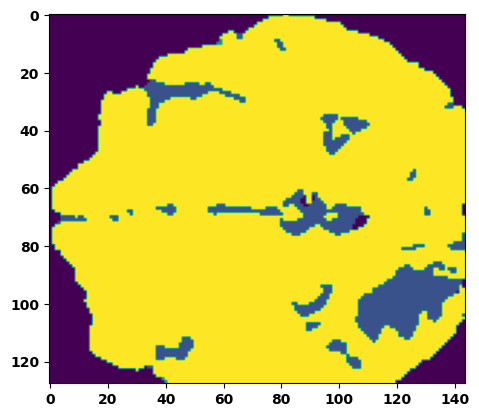

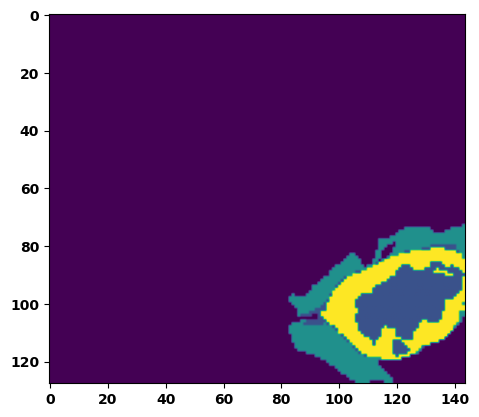

 89%|████████▉ | 32/36 [00:46<00:05,  1.41s/it]

Batch_id:  31 Eval loss:  0.7672231197357178
Batch_id:  31 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.42s/it]

Batch_id:  32 Eval loss:  0.6417351961135864
Batch_id:  32 Eval IoU:  tensor(0.3149, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.43s/it]

Batch_id:  33 Eval loss:  0.7566028833389282
Batch_id:  33 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.46s/it]

Batch_id:  34 Eval loss:  0.5065678358078003
Batch_id:  34 Eval IoU:  tensor(0.4052, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9170, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8891, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9190, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.8551217913627625
Batch_id:  35 Eval IoU:  tensor(0.0945, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.5359, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4440, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8636, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.3050, device='cuda:0')
Epoch  7 Training loss:  0.22963706471703269
Epoch  7 Evaluation loss:  0.5594539770649539
Epoch  7 Training accuracy :  tensor(0.7083)
Epoch  7 Evaluation accuracy :  tensor(0.3783)
Epoch  7 Training Mean Dice Score:  tensor(0.9731)
Epoch  7 Eval Mean Dice Score:  tensor(0.8308)
Epoch  7 Training Non-tumor Dice Score:  tensor(0.9749)
Epoch  7 Eval Non-tumor Dice Score:  tensor(0.7811)
Epoch  7 Training NCR/NET Dice Score:  tensor(0.9857)
Epoch  7 Eval NCR/NET Dice Score:  tensor(0.9731)
Epoch  7 Training ED Dice Score:  tensor(0.9718)
Epoch  

Epoch: 8
Training in session: 


  1%|          | 1/110 [00:01<03:03,  1.69s/it]

Batch_id:  0 Training loss:  0.11197963356971741
Batch_id:  0 Training IoU:  tensor(0.8369, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:45,  1.53s/it]

Batch_id:  1 Training loss:  0.16286326944828033
Batch_id:  1 Training IoU:  tensor(0.7697, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:42,  1.52s/it]

Batch_id:  2 Training loss:  0.08705052733421326
Batch_id:  2 Training IoU:  tensor(0.8782, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:43,  1.55s/it]

Batch_id:  3 Training loss:  0.1295599341392517
Batch_id:  3 Training IoU:  tensor(0.8071, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:43,  1.56s/it]

Batch_id:  4 Training loss:  0.14738087356090546
Batch_id:  4 Training IoU:  tensor(0.7739, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:33,  1.48s/it]

Batch_id:  5 Training loss:  0.5239943265914917
Batch_id:  5 Training IoU:  tensor(0.4310, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.08371704816818237
Batch_id:  6 Training IoU:  tensor(0.8886, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:29,  1.47s/it]

Batch_id:  7 Training loss:  0.17202167212963104
Batch_id:  7 Training IoU:  tensor(0.7458, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9712, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:29,  1.48s/it]

Batch_id:  8 Training loss:  0.12828290462493896
Batch_id:  8 Training IoU:  tensor(0.8105, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:26,  1.47s/it]

Batch_id:  9 Training loss:  0.4464900493621826
Batch_id:  9 Training IoU:  tensor(0.4671, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9494, device='cuda:0')


 10%|█         | 11/110 [00:16<02:24,  1.46s/it]

Batch_id:  10 Training loss:  0.3460931181907654
Batch_id:  10 Training IoU:  tensor(0.6017, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 11%|█         | 12/110 [00:17<02:23,  1.46s/it]

Batch_id:  11 Training loss:  0.3204682469367981
Batch_id:  11 Training IoU:  tensor(0.6341, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:20,  1.45s/it]

Batch_id:  12 Training loss:  0.1549891084432602
Batch_id:  12 Training IoU:  tensor(0.7865, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:20,  1.46s/it]

Batch_id:  13 Training loss:  0.17787538468837738
Batch_id:  13 Training IoU:  tensor(0.7339, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:14,  1.41s/it]

Batch_id:  14 Training loss:  0.19697372615337372
Batch_id:  14 Training IoU:  tensor(0.7275, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:20,  1.49s/it]

Batch_id:  15 Training loss:  0.0606197863817215
Batch_id:  15 Training IoU:  tensor(0.9191, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:14,  1.45s/it]

Batch_id:  16 Training loss:  0.15200045704841614
Batch_id:  16 Training IoU:  tensor(0.7867, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:08,  1.40s/it]

Batch_id:  17 Training loss:  0.1358712762594223
Batch_id:  17 Training IoU:  tensor(0.7978, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:10,  1.43s/it]

Batch_id:  18 Training loss:  0.3136187791824341
Batch_id:  18 Training IoU:  tensor(0.5919, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:14,  1.49s/it]

Batch_id:  19 Training loss:  0.13340619206428528
Batch_id:  19 Training IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:12,  1.49s/it]

Batch_id:  20 Training loss:  0.27773505449295044
Batch_id:  20 Training IoU:  tensor(0.6775, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 20%|██        | 22/110 [00:32<02:09,  1.47s/it]

Batch_id:  21 Training loss:  0.2155330777168274
Batch_id:  21 Training IoU:  tensor(0.7213, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 21%|██        | 23/110 [00:33<02:06,  1.46s/it]

Batch_id:  22 Training loss:  0.20218594372272491
Batch_id:  22 Training IoU:  tensor(0.7370, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:05,  1.46s/it]

Batch_id:  23 Training loss:  0.1273157298564911
Batch_id:  23 Training IoU:  tensor(0.8210, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:08,  1.51s/it]

Batch_id:  24 Training loss:  0.2406236082315445
Batch_id:  24 Training IoU:  tensor(0.7120, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:02,  1.46s/it]

Batch_id:  25 Training loss:  0.22737383842468262
Batch_id:  25 Training IoU:  tensor(0.7412, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:56,  1.41s/it]

Batch_id:  26 Training loss:  0.18973058462142944
Batch_id:  26 Training IoU:  tensor(0.7232, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:56,  1.42s/it]

Batch_id:  27 Training loss:  0.20856304466724396
Batch_id:  27 Training IoU:  tensor(0.7126, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:55,  1.43s/it]

Batch_id:  28 Training loss:  0.19066037237644196
Batch_id:  28 Training IoU:  tensor(0.7331, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:52,  1.40s/it]

Batch_id:  29 Training loss:  0.28406983613967896
Batch_id:  29 Training IoU:  tensor(0.6142, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9685, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:52,  1.42s/it]

Batch_id:  30 Training loss:  0.18742641806602478
Batch_id:  30 Training IoU:  tensor(0.7669, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:56,  1.50s/it]

Batch_id:  31 Training loss:  0.09232047200202942
Batch_id:  31 Training IoU:  tensor(0.8584, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 30%|███       | 33/110 [00:48<01:54,  1.48s/it]

Batch_id:  32 Training loss:  0.21407611668109894
Batch_id:  32 Training IoU:  tensor(0.8078, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 31%|███       | 34/110 [00:49<01:53,  1.49s/it]

Batch_id:  33 Training loss:  0.09965930879116058
Batch_id:  33 Training IoU:  tensor(0.8472, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:49,  1.46s/it]

Batch_id:  34 Training loss:  0.5004120469093323
Batch_id:  34 Training IoU:  tensor(0.4001, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9144, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9199, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:45,  1.43s/it]

Batch_id:  35 Training loss:  0.32471001148223877
Batch_id:  35 Training IoU:  tensor(0.6006, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:42,  1.41s/it]

Batch_id:  36 Training loss:  0.2705845236778259
Batch_id:  36 Training IoU:  tensor(0.7105, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:38,  1.36s/it]

Batch_id:  37 Training loss:  0.20768877863883972
Batch_id:  37 Training IoU:  tensor(0.7129, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:37,  1.37s/it]

Batch_id:  38 Training loss:  0.1330278068780899
Batch_id:  38 Training IoU:  tensor(0.8137, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:42,  1.46s/it]

Batch_id:  39 Training loss:  0.3031650483608246
Batch_id:  39 Training IoU:  tensor(0.6710, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:39,  1.45s/it]

Batch_id:  40 Training loss:  0.17717957496643066
Batch_id:  40 Training IoU:  tensor(0.7562, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:40,  1.48s/it]

Batch_id:  41 Training loss:  0.22784821689128876
Batch_id:  41 Training IoU:  tensor(0.6649, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:38,  1.46s/it]

Batch_id:  42 Training loss:  0.24029593169689178
Batch_id:  42 Training IoU:  tensor(0.6640, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 40%|████      | 44/110 [01:04<01:37,  1.47s/it]

Batch_id:  43 Training loss:  0.09648193418979645
Batch_id:  43 Training IoU:  tensor(0.8540, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 41%|████      | 45/110 [01:05<01:33,  1.44s/it]

Batch_id:  44 Training loss:  0.12945425510406494
Batch_id:  44 Training IoU:  tensor(0.8072, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:30,  1.42s/it]

Batch_id:  45 Training loss:  0.21341195702552795
Batch_id:  45 Training IoU:  tensor(0.7243, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:32,  1.46s/it]

Batch_id:  46 Training loss:  0.2261398434638977
Batch_id:  46 Training IoU:  tensor(0.6953, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:29,  1.45s/it]

Batch_id:  47 Training loss:  0.20406770706176758
Batch_id:  47 Training IoU:  tensor(0.7307, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:29,  1.46s/it]

Batch_id:  48 Training loss:  0.34007394313812256
Batch_id:  48 Training IoU:  tensor(0.5440, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9673, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:26,  1.45s/it]

Batch_id:  49 Training loss:  0.31396302580833435
Batch_id:  49 Training IoU:  tensor(0.6112, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:24,  1.44s/it]

Batch_id:  50 Training loss:  0.323844313621521
Batch_id:  50 Training IoU:  tensor(0.6368, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:22,  1.41s/it]

Batch_id:  51 Training loss:  0.11539861559867859
Batch_id:  51 Training IoU:  tensor(0.8332, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:22,  1.44s/it]

Batch_id:  52 Training loss:  0.3495901823043823
Batch_id:  52 Training IoU:  tensor(0.5783, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:21,  1.45s/it]

Batch_id:  53 Training loss:  0.11234265565872192
Batch_id:  53 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.14605310559272766
Batch_id:  54 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:18,  1.45s/it]

Batch_id:  55 Training loss:  0.24828678369522095
Batch_id:  55 Training IoU:  tensor(0.7481, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:17,  1.47s/it]

Batch_id:  56 Training loss:  0.13196037709712982
Batch_id:  56 Training IoU:  tensor(0.7976, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:14,  1.42s/it]

Batch_id:  57 Training loss:  0.17805632948875427
Batch_id:  57 Training IoU:  tensor(0.7739, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:12,  1.41s/it]

Batch_id:  58 Training loss:  0.13596196472644806
Batch_id:  58 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:10,  1.41s/it]

Batch_id:  59 Training loss:  0.36365824937820435
Batch_id:  59 Training IoU:  tensor(0.5739, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:13,  1.49s/it]

Batch_id:  60 Training loss:  0.2311164289712906
Batch_id:  60 Training IoU:  tensor(0.7244, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:11,  1.49s/it]

Batch_id:  61 Training loss:  0.17217184603214264
Batch_id:  61 Training IoU:  tensor(0.7385, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:08,  1.47s/it]

Batch_id:  62 Training loss:  0.16029956936836243
Batch_id:  62 Training IoU:  tensor(0.7512, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9717, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:05,  1.43s/it]

Batch_id:  63 Training loss:  0.1807982623577118
Batch_id:  63 Training IoU:  tensor(0.7400, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:04,  1.42s/it]

Batch_id:  64 Training loss:  0.4454071521759033
Batch_id:  64 Training IoU:  tensor(0.4745, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:02,  1.41s/it]

Batch_id:  65 Training loss:  0.1329674869775772
Batch_id:  65 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:03,  1.47s/it]

Batch_id:  66 Training loss:  0.349344402551651
Batch_id:  66 Training IoU:  tensor(0.6059, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:02,  1.49s/it]

Batch_id:  67 Training loss:  0.16205227375030518
Batch_id:  67 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<00:59,  1.44s/it]

Batch_id:  68 Training loss:  0.35568827390670776
Batch_id:  68 Training IoU:  tensor(0.5556, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:57,  1.44s/it]

Batch_id:  69 Training loss:  0.09101797640323639
Batch_id:  69 Training IoU:  tensor(0.8661, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:58,  1.50s/it]

Batch_id:  70 Training loss:  0.11849828064441681
Batch_id:  70 Training IoU:  tensor(0.8147, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:56,  1.50s/it]

Batch_id:  71 Training loss:  0.5470069646835327
Batch_id:  71 Training IoU:  tensor(0.3709, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.8994, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.8952, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9333, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9381, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:55,  1.49s/it]

Batch_id:  72 Training loss:  0.21002282202243805
Batch_id:  72 Training IoU:  tensor(0.6975, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9509, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:55,  1.54s/it]

Batch_id:  73 Training loss:  0.10426902770996094
Batch_id:  73 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:52,  1.49s/it]

Batch_id:  74 Training loss:  0.13661566376686096
Batch_id:  74 Training IoU:  tensor(0.8126, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:50,  1.49s/it]

Batch_id:  75 Training loss:  0.3599385619163513
Batch_id:  75 Training IoU:  tensor(0.5907, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:50,  1.53s/it]

Batch_id:  76 Training loss:  0.16096244752407074
Batch_id:  76 Training IoU:  tensor(0.7809, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:48,  1.52s/it]

Batch_id:  77 Training loss:  0.31926199793815613
Batch_id:  77 Training IoU:  tensor(0.6441, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:47,  1.54s/it]

Batch_id:  78 Training loss:  0.0846409946680069
Batch_id:  78 Training IoU:  tensor(0.8747, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:46,  1.55s/it]

Batch_id:  79 Training loss:  0.1416948139667511
Batch_id:  79 Training IoU:  tensor(0.7986, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:44,  1.55s/it]

Batch_id:  80 Training loss:  0.16107746958732605
Batch_id:  80 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:42,  1.54s/it]

Batch_id:  81 Training loss:  0.13099178671836853
Batch_id:  81 Training IoU:  tensor(0.8091, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:40,  1.48s/it]

Batch_id:  82 Training loss:  0.3389256000518799
Batch_id:  82 Training IoU:  tensor(0.5534, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:38,  1.50s/it]

Batch_id:  83 Training loss:  0.31282714009284973
Batch_id:  83 Training IoU:  tensor(0.5937, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9533, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:36,  1.48s/it]

Batch_id:  84 Training loss:  0.2834250330924988
Batch_id:  84 Training IoU:  tensor(0.6822, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:36,  1.53s/it]

Batch_id:  85 Training loss:  0.10488654673099518
Batch_id:  85 Training IoU:  tensor(0.8362, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:35,  1.52s/it]

Batch_id:  86 Training loss:  0.16028830409049988
Batch_id:  86 Training IoU:  tensor(0.7795, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:32,  1.49s/it]

Batch_id:  87 Training loss:  0.30209070444107056
Batch_id:  87 Training IoU:  tensor(0.6044, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:31,  1.50s/it]

Batch_id:  88 Training loss:  0.23579108715057373
Batch_id:  88 Training IoU:  tensor(0.6655, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:30,  1.51s/it]

Batch_id:  89 Training loss:  0.2285052388906479
Batch_id:  89 Training IoU:  tensor(0.7018, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:28,  1.51s/it]

Batch_id:  90 Training loss:  0.23177547752857208
Batch_id:  90 Training IoU:  tensor(0.6665, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 84%|████████▎ | 92/110 [02:15<00:26,  1.50s/it]

Batch_id:  91 Training loss:  0.10897490382194519
Batch_id:  91 Training IoU:  tensor(0.8511, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:25,  1.51s/it]

Batch_id:  92 Training loss:  0.07840286195278168
Batch_id:  92 Training IoU:  tensor(0.8832, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:24,  1.51s/it]

Batch_id:  93 Training loss:  0.08804382383823395
Batch_id:  93 Training IoU:  tensor(0.8674, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:22,  1.51s/it]

Batch_id:  94 Training loss:  0.21742644906044006
Batch_id:  94 Training IoU:  tensor(0.7367, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:21,  1.53s/it]

Batch_id:  95 Training loss:  0.12317995727062225
Batch_id:  95 Training IoU:  tensor(0.8295, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.52s/it]

Batch_id:  96 Training loss:  0.25904735922813416
Batch_id:  96 Training IoU:  tensor(0.6438, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:17,  1.48s/it]

Batch_id:  97 Training loss:  0.11547110974788666
Batch_id:  97 Training IoU:  tensor(0.8225, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.47s/it]

Batch_id:  98 Training loss:  0.17512506246566772
Batch_id:  98 Training IoU:  tensor(0.7602, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:15,  1.52s/it]

Batch_id:  99 Training loss:  0.1645541936159134
Batch_id:  99 Training IoU:  tensor(0.7523, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.50s/it]

Batch_id:  100 Training loss:  0.5360639095306396
Batch_id:  100 Training IoU:  tensor(0.3792, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9189, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9151, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.49s/it]

Batch_id:  101 Training loss:  0.21433013677597046
Batch_id:  101 Training IoU:  tensor(0.6837, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.52s/it]

Batch_id:  102 Training loss:  0.16058200597763062
Batch_id:  102 Training IoU:  tensor(0.7535, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.49s/it]

Batch_id:  103 Training loss:  0.15142367780208588
Batch_id:  103 Training IoU:  tensor(0.7661, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.49s/it]

Batch_id:  104 Training loss:  0.25163859128952026
Batch_id:  104 Training IoU:  tensor(0.6722, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.48s/it]

Batch_id:  105 Training loss:  0.599298894405365
Batch_id:  105 Training IoU:  tensor(0.3309, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9333, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.57s/it]

Batch_id:  106 Training loss:  0.343135267496109
Batch_id:  106 Training IoU:  tensor(0.6003, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.24710184335708618
Batch_id:  107 Training IoU:  tensor(0.6443, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9710, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.55s/it]

Batch_id:  108 Training loss:  0.17152278125286102
Batch_id:  108 Training IoU:  tensor(0.7482, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.08613498508930206
Batch_id:  109 Training IoU:  tensor(0.8686, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9908, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7565838098526001
Batch_id:  0 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


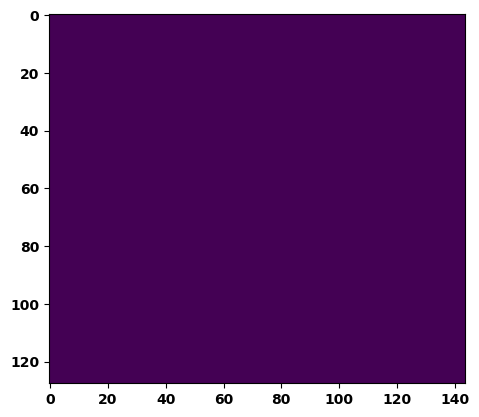

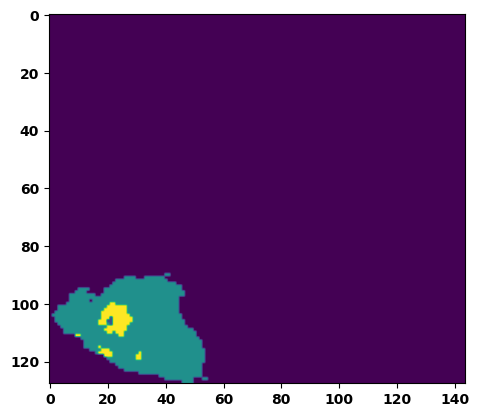

  6%|▌         | 2/36 [00:03<00:52,  1.54s/it]

Batch_id:  1 Eval loss:  0.7590557932853699
Batch_id:  1 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.51s/it]

Batch_id:  2 Eval loss:  0.8173311352729797
Batch_id:  2 Eval IoU:  tensor(0.1110, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.5425, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.4445, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.8531, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8626, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.4672, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.51s/it]

Batch_id:  3 Eval loss:  0.7674683928489685
Batch_id:  3 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.41s/it]

Batch_id:  4 Eval loss:  0.5934627652168274
Batch_id:  4 Eval IoU:  tensor(0.3501, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9175, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8878, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.40s/it]

Batch_id:  5 Eval loss:  0.4352240264415741
Batch_id:  5 Eval IoU:  tensor(0.4726, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9871, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:42,  1.45s/it]

Batch_id:  6 Eval loss:  0.6511806845664978
Batch_id:  6 Eval IoU:  tensor(0.2949, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8989, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8490, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.46s/it]

Batch_id:  7 Eval loss:  0.5843403935432434
Batch_id:  7 Eval IoU:  tensor(0.3611, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9135, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9451, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.48s/it]

Batch_id:  8 Eval loss:  0.6404216289520264
Batch_id:  8 Eval IoU:  tensor(0.3091, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9909, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.41s/it]

Batch_id:  9 Eval loss:  0.24628323316574097
Batch_id:  9 Eval IoU:  tensor(0.6598, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  10 Eval loss:  0.36316144466400146
Batch_id:  10 Eval IoU:  tensor(0.5252, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')


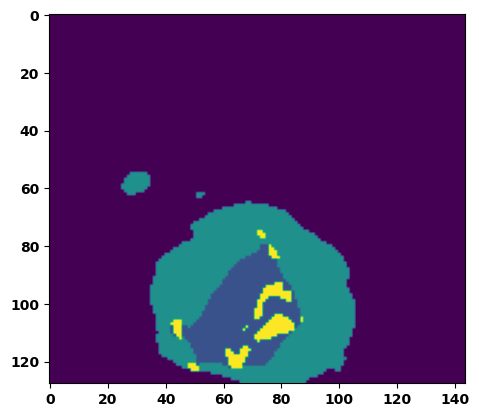

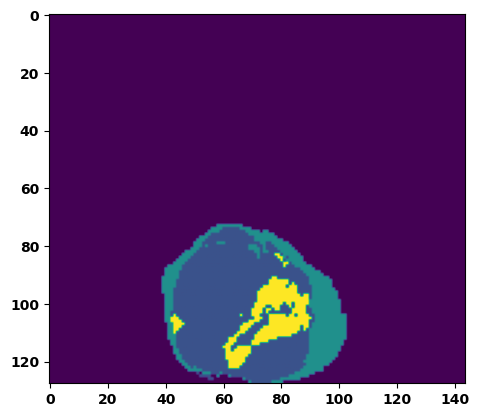

 33%|███▎      | 12/36 [00:17<00:36,  1.52s/it]

Batch_id:  11 Eval loss:  0.47299522161483765
Batch_id:  11 Eval IoU:  tensor(0.4446, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.51s/it]

Batch_id:  12 Eval loss:  0.7540765404701233
Batch_id:  12 Eval IoU:  tensor(0.2350, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.52s/it]

Batch_id:  13 Eval loss:  0.35524803400039673
Batch_id:  13 Eval IoU:  tensor(0.5294, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9795, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.51s/it]

Batch_id:  14 Eval loss:  0.5120940804481506
Batch_id:  14 Eval IoU:  tensor(0.4119, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.47s/it]

Batch_id:  15 Eval loss:  0.633254885673523
Batch_id:  15 Eval IoU:  tensor(0.3143, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9245, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8572, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:27,  1.46s/it]

Batch_id:  16 Eval loss:  0.10166159272193909
Batch_id:  16 Eval IoU:  tensor(0.8367, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.45s/it]

Batch_id:  17 Eval loss:  0.774202287197113
Batch_id:  17 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.41s/it]

Batch_id:  18 Eval loss:  0.718396782875061
Batch_id:  18 Eval IoU:  tensor(0.2128, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.5044, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.3178, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7505, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.4858, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.42s/it]

Batch_id:  19 Eval loss:  0.22750845551490784
Batch_id:  19 Eval IoU:  tensor(0.7292, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  20 Eval loss:  0.6103338003158569
Batch_id:  20 Eval IoU:  tensor(0.3521, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


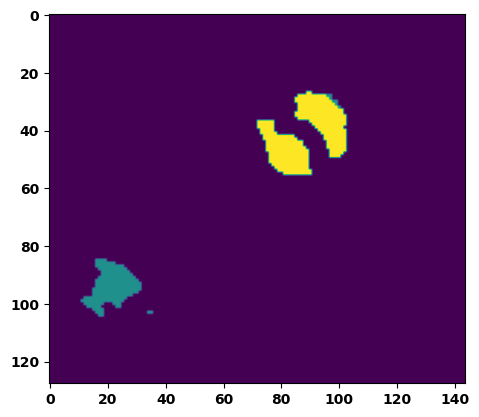

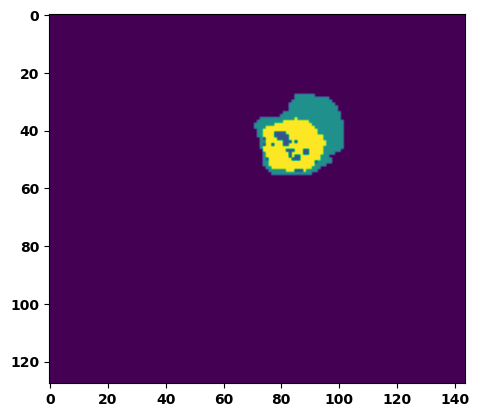

 61%|██████    | 22/36 [00:32<00:21,  1.50s/it]

Batch_id:  21 Eval loss:  0.5951757431030273
Batch_id:  21 Eval IoU:  tensor(0.3433, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8855, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8327, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9184, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9267, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.47s/it]

Batch_id:  22 Eval loss:  0.6184462308883667
Batch_id:  22 Eval IoU:  tensor(0.3594, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.43s/it]

Batch_id:  23 Eval loss:  0.599294900894165
Batch_id:  23 Eval IoU:  tensor(0.3500, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9402, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.37s/it]

Batch_id:  24 Eval loss:  0.7605636715888977
Batch_id:  24 Eval IoU:  tensor(0.2258, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9056, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.40s/it]

Batch_id:  25 Eval loss:  0.30045798420906067
Batch_id:  25 Eval IoU:  tensor(0.6155, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9925, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:12,  1.37s/it]

Batch_id:  26 Eval loss:  0.2124103605747223
Batch_id:  26 Eval IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9954, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:10,  1.36s/it]

Batch_id:  27 Eval loss:  0.7510532140731812
Batch_id:  27 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.36s/it]

Batch_id:  28 Eval loss:  0.7068439722061157
Batch_id:  28 Eval IoU:  tensor(0.2620, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.42s/it]

Batch_id:  29 Eval loss:  0.7304183840751648
Batch_id:  29 Eval IoU:  tensor(0.1812, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5433, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3889, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3228, device='cuda:0')
Batch_id:  30 Eval loss:  0.7497340440750122
Batch_id:  30 Eval IoU:  tensor(0.2386, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9706, device='cuda:0')


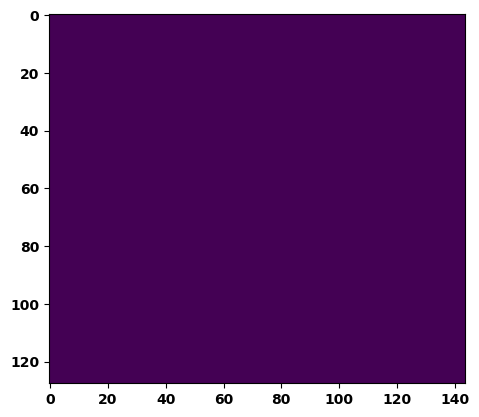

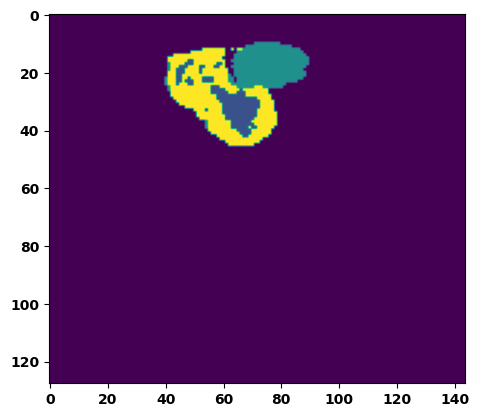

 89%|████████▉ | 32/36 [00:46<00:05,  1.42s/it]

Batch_id:  31 Eval loss:  0.8781899213790894
Batch_id:  31 Eval IoU:  tensor(0.0766, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.4999, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4240, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9209, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.2506, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.38s/it]

Batch_id:  32 Eval loss:  0.639380693435669
Batch_id:  32 Eval IoU:  tensor(0.3131, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.39s/it]

Batch_id:  33 Eval loss:  0.9004734754562378
Batch_id:  33 Eval IoU:  tensor(0.0584, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.4618, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3365, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.1939, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.34s/it]

Batch_id:  34 Eval loss:  0.8595132827758789
Batch_id:  34 Eval IoU:  tensor(0.0836, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.5255, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.2915, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.2898, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.4571077227592468
Batch_id:  35 Eval IoU:  tensor(0.4388, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8023, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.7155, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.7111, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9889, device='cuda:0')
Epoch  8 Training loss:  0.2163818577473814
Epoch  8 Evaluation loss:  0.5981485719482104
Epoch  8 Training accuracy :  tensor(0.7202)
Epoch  8 Evaluation accuracy :  tensor(0.3497)
Epoch  8 Training Mean Dice Score:  tensor(0.9743)
Epoch  8 Eval Mean Dice Score:  tensor(0.8729)
Epoch  8 Training Non-tumor Dice Score:  tensor(0.9754)
Epoch  8 Eval Non-tumor Dice Score:  tensor(0.8343)
Epoch  8 Training NCR/NET Dice Score:  tensor(0.9872)
Epoch  8 Eval NCR/NET Dice Score:  tensor(0.9733)
Epoch  8 Training ED Dice Score:  tensor(0.9733)
Epoch  8

Epoch: 9
Training in session: 


  1%|          | 1/110 [00:01<02:48,  1.55s/it]

Batch_id:  0 Training loss:  0.2808911204338074
Batch_id:  0 Training IoU:  tensor(0.6310, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9570, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:36,  1.45s/it]

Batch_id:  1 Training loss:  0.22017548978328705
Batch_id:  1 Training IoU:  tensor(0.7108, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:33,  1.44s/it]

Batch_id:  2 Training loss:  0.13733725249767303
Batch_id:  2 Training IoU:  tensor(0.7955, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:32,  1.44s/it]

Batch_id:  3 Training loss:  0.2774789333343506
Batch_id:  3 Training IoU:  tensor(0.6356, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:38,  1.51s/it]

Batch_id:  4 Training loss:  0.17904309928417206
Batch_id:  4 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:32,  1.47s/it]

Batch_id:  5 Training loss:  0.1741841435432434
Batch_id:  5 Training IoU:  tensor(0.7544, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:31,  1.47s/it]

Batch_id:  6 Training loss:  0.13292455673217773
Batch_id:  6 Training IoU:  tensor(0.7932, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:32,  1.50s/it]

Batch_id:  7 Training loss:  0.08857269585132599
Batch_id:  7 Training IoU:  tensor(0.8662, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.16529381275177002
Batch_id:  8 Training IoU:  tensor(0.7788, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:25,  1.46s/it]

Batch_id:  9 Training loss:  0.07930956780910492
Batch_id:  9 Training IoU:  tensor(0.8856, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 10%|█         | 11/110 [00:16<02:27,  1.49s/it]

Batch_id:  10 Training loss:  0.1025475263595581
Batch_id:  10 Training IoU:  tensor(0.8485, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 11%|█         | 12/110 [00:17<02:21,  1.44s/it]

Batch_id:  11 Training loss:  0.2920934855937958
Batch_id:  11 Training IoU:  tensor(0.6051, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9752, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:17,  1.42s/it]

Batch_id:  12 Training loss:  0.08090834319591522
Batch_id:  12 Training IoU:  tensor(0.8805, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:14,  1.40s/it]

Batch_id:  13 Training loss:  0.048375204205513
Batch_id:  13 Training IoU:  tensor(0.9360, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:13,  1.41s/it]

Batch_id:  14 Training loss:  0.2872042655944824
Batch_id:  14 Training IoU:  tensor(0.6718, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:13,  1.42s/it]

Batch_id:  15 Training loss:  0.32580721378326416
Batch_id:  15 Training IoU:  tensor(0.6249, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:11,  1.42s/it]

Batch_id:  16 Training loss:  0.15888111293315887
Batch_id:  16 Training IoU:  tensor(0.7566, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:07,  1.38s/it]

Batch_id:  17 Training loss:  0.1931348592042923
Batch_id:  17 Training IoU:  tensor(0.7476, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:07,  1.40s/it]

Batch_id:  18 Training loss:  0.134666308760643
Batch_id:  18 Training IoU:  tensor(0.8054, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:03,  1.37s/it]

Batch_id:  19 Training loss:  0.22803890705108643
Batch_id:  19 Training IoU:  tensor(0.6671, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9692, device='cuda:0')


 19%|█▉        | 21/110 [00:29<02:01,  1.37s/it]

Batch_id:  20 Training loss:  0.2712680697441101
Batch_id:  20 Training IoU:  tensor(0.6236, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 20%|██        | 22/110 [00:31<01:59,  1.36s/it]

Batch_id:  21 Training loss:  0.10349595546722412
Batch_id:  21 Training IoU:  tensor(0.8471, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 21%|██        | 23/110 [00:32<02:03,  1.42s/it]

Batch_id:  22 Training loss:  0.25924497842788696
Batch_id:  22 Training IoU:  tensor(0.6274, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9714, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:03,  1.44s/it]

Batch_id:  23 Training loss:  0.3223249316215515
Batch_id:  23 Training IoU:  tensor(0.6289, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 23%|██▎       | 25/110 [00:35<02:00,  1.42s/it]

Batch_id:  24 Training loss:  0.3388575315475464
Batch_id:  24 Training IoU:  tensor(0.5553, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:57,  1.40s/it]

Batch_id:  25 Training loss:  0.19312427937984467
Batch_id:  25 Training IoU:  tensor(0.7709, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 25%|██▍       | 27/110 [00:38<01:55,  1.39s/it]

Batch_id:  26 Training loss:  0.17403170466423035
Batch_id:  26 Training IoU:  tensor(0.7421, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 25%|██▌       | 28/110 [00:39<01:55,  1.41s/it]

Batch_id:  27 Training loss:  0.24180547893047333
Batch_id:  27 Training IoU:  tensor(0.6816, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.3611355423927307
Batch_id:  28 Training IoU:  tensor(0.5692, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 27%|██▋       | 30/110 [00:42<01:53,  1.42s/it]

Batch_id:  29 Training loss:  0.39471760392189026
Batch_id:  29 Training IoU:  tensor(0.5393, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:51,  1.41s/it]

Batch_id:  30 Training loss:  0.11821867525577545
Batch_id:  30 Training IoU:  tensor(0.8219, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:48,  1.39s/it]

Batch_id:  31 Training loss:  0.13101673126220703
Batch_id:  31 Training IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 30%|███       | 33/110 [00:46<01:46,  1.38s/it]

Batch_id:  32 Training loss:  0.23743844032287598
Batch_id:  32 Training IoU:  tensor(0.7207, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 31%|███       | 34/110 [00:48<01:49,  1.44s/it]

Batch_id:  33 Training loss:  0.5819597244262695
Batch_id:  33 Training IoU:  tensor(0.3400, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.8777, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.8491, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9193, device='cuda:0')


 32%|███▏      | 35/110 [00:49<01:48,  1.44s/it]

Batch_id:  34 Training loss:  0.09665673971176147
Batch_id:  34 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:43,  1.41s/it]

Batch_id:  35 Training loss:  0.1525627225637436
Batch_id:  35 Training IoU:  tensor(0.7837, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 34%|███▎      | 37/110 [00:52<01:41,  1.39s/it]

Batch_id:  36 Training loss:  0.1829546093940735
Batch_id:  36 Training IoU:  tensor(0.7428, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.10241523385047913
Batch_id:  37 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 35%|███▌      | 39/110 [00:55<01:43,  1.46s/it]

Batch_id:  38 Training loss:  0.19420170783996582
Batch_id:  38 Training IoU:  tensor(0.7795, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:39,  1.42s/it]

Batch_id:  39 Training loss:  0.17054429650306702
Batch_id:  39 Training IoU:  tensor(0.7398, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:38,  1.43s/it]

Batch_id:  40 Training loss:  0.1204896867275238
Batch_id:  40 Training IoU:  tensor(0.8288, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:40,  1.48s/it]

Batch_id:  41 Training loss:  0.20276294648647308
Batch_id:  41 Training IoU:  tensor(0.7264, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:36,  1.45s/it]

Batch_id:  42 Training loss:  0.28247594833374023
Batch_id:  42 Training IoU:  tensor(0.6187, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 40%|████      | 44/110 [01:02<01:34,  1.43s/it]

Batch_id:  43 Training loss:  0.24027682840824127
Batch_id:  43 Training IoU:  tensor(0.7523, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 41%|████      | 45/110 [01:04<01:35,  1.48s/it]

Batch_id:  44 Training loss:  0.20217430591583252
Batch_id:  44 Training IoU:  tensor(0.7076, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9580, device='cuda:0')


 42%|████▏     | 46/110 [01:05<01:32,  1.44s/it]

Batch_id:  45 Training loss:  0.1589079201221466
Batch_id:  45 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:32,  1.47s/it]

Batch_id:  46 Training loss:  0.13542047142982483
Batch_id:  46 Training IoU:  tensor(0.7989, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:27,  1.42s/it]

Batch_id:  47 Training loss:  0.30002424120903015
Batch_id:  47 Training IoU:  tensor(0.6283, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:27,  1.44s/it]

Batch_id:  48 Training loss:  0.16808050870895386
Batch_id:  48 Training IoU:  tensor(0.7539, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:28,  1.48s/it]

Batch_id:  49 Training loss:  0.42404910922050476
Batch_id:  49 Training IoU:  tensor(0.4902, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9681, device='cuda:0')


 46%|████▋     | 51/110 [01:12<01:24,  1.43s/it]

Batch_id:  50 Training loss:  0.17800261080265045
Batch_id:  50 Training IoU:  tensor(0.7364, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:25,  1.47s/it]

Batch_id:  51 Training loss:  0.17184484004974365
Batch_id:  51 Training IoU:  tensor(0.7845, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 48%|████▊     | 53/110 [01:15<01:22,  1.45s/it]

Batch_id:  52 Training loss:  0.3086031377315521
Batch_id:  52 Training IoU:  tensor(0.6524, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:20,  1.44s/it]

Batch_id:  53 Training loss:  0.11948727071285248
Batch_id:  53 Training IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 50%|█████     | 55/110 [01:18<01:16,  1.39s/it]

Batch_id:  54 Training loss:  0.1795184314250946
Batch_id:  54 Training IoU:  tensor(0.7307, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:16,  1.41s/it]

Batch_id:  55 Training loss:  0.13359606266021729
Batch_id:  55 Training IoU:  tensor(0.7917, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 52%|█████▏    | 57/110 [01:21<01:14,  1.41s/it]

Batch_id:  56 Training loss:  0.5558151006698608
Batch_id:  56 Training IoU:  tensor(0.3681, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9296, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9260, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 53%|█████▎    | 58/110 [01:22<01:11,  1.38s/it]

Batch_id:  57 Training loss:  0.2181282341480255
Batch_id:  57 Training IoU:  tensor(0.6723, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9300, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 54%|█████▎    | 59/110 [01:24<01:08,  1.34s/it]

Batch_id:  58 Training loss:  0.08190008997917175
Batch_id:  58 Training IoU:  tensor(0.8780, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 55%|█████▍    | 60/110 [01:25<01:07,  1.35s/it]

Batch_id:  59 Training loss:  0.08970177173614502
Batch_id:  59 Training IoU:  tensor(0.8621, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 55%|█████▌    | 61/110 [01:26<01:09,  1.41s/it]

Batch_id:  60 Training loss:  0.5310930609703064
Batch_id:  60 Training IoU:  tensor(0.3948, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 56%|█████▋    | 62/110 [01:28<01:06,  1.39s/it]

Batch_id:  61 Training loss:  0.3161378502845764
Batch_id:  61 Training IoU:  tensor(0.6431, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 57%|█████▋    | 63/110 [01:29<01:03,  1.36s/it]

Batch_id:  62 Training loss:  0.1491677165031433
Batch_id:  62 Training IoU:  tensor(0.7644, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


 58%|█████▊    | 64/110 [01:31<01:03,  1.38s/it]

Batch_id:  63 Training loss:  0.14666688442230225
Batch_id:  63 Training IoU:  tensor(0.7796, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 59%|█████▉    | 65/110 [01:32<01:04,  1.43s/it]

Batch_id:  64 Training loss:  0.13232426345348358
Batch_id:  64 Training IoU:  tensor(0.8045, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 60%|██████    | 66/110 [01:33<01:02,  1.41s/it]

Batch_id:  65 Training loss:  0.4149129390716553
Batch_id:  65 Training IoU:  tensor(0.4709, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9277, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9356, device='cuda:0')


 61%|██████    | 67/110 [01:35<01:00,  1.41s/it]

Batch_id:  66 Training loss:  0.31505534052848816
Batch_id:  66 Training IoU:  tensor(0.6330, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 62%|██████▏   | 68/110 [01:36<01:00,  1.45s/it]

Batch_id:  67 Training loss:  0.1662643998861313
Batch_id:  67 Training IoU:  tensor(0.7676, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 63%|██████▎   | 69/110 [01:38<00:58,  1.42s/it]

Batch_id:  68 Training loss:  0.20875589549541473
Batch_id:  68 Training IoU:  tensor(0.7056, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 64%|██████▎   | 70/110 [01:39<00:57,  1.43s/it]

Batch_id:  69 Training loss:  0.17688500881195068
Batch_id:  69 Training IoU:  tensor(0.7471, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 65%|██████▍   | 71/110 [01:41<00:56,  1.44s/it]

Batch_id:  70 Training loss:  0.14010387659072876
Batch_id:  70 Training IoU:  tensor(0.7874, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 65%|██████▌   | 72/110 [01:42<00:56,  1.48s/it]

Batch_id:  71 Training loss:  0.17176826298236847
Batch_id:  71 Training IoU:  tensor(0.7451, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 66%|██████▋   | 73/110 [01:44<00:53,  1.44s/it]

Batch_id:  72 Training loss:  0.20068277418613434
Batch_id:  72 Training IoU:  tensor(0.7716, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 67%|██████▋   | 74/110 [01:45<00:51,  1.44s/it]

Batch_id:  73 Training loss:  0.11501191556453705
Batch_id:  73 Training IoU:  tensor(0.8229, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 68%|██████▊   | 75/110 [01:46<00:50,  1.44s/it]

Batch_id:  74 Training loss:  0.3452575206756592
Batch_id:  74 Training IoU:  tensor(0.5369, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9729, device='cuda:0')


 69%|██████▉   | 76/110 [01:48<00:50,  1.49s/it]

Batch_id:  75 Training loss:  0.07914112508296967
Batch_id:  75 Training IoU:  tensor(0.8773, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 70%|███████   | 77/110 [01:49<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.12483951449394226
Batch_id:  76 Training IoU:  tensor(0.8062, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 71%|███████   | 78/110 [01:51<00:47,  1.47s/it]

Batch_id:  77 Training loss:  0.12062819302082062
Batch_id:  77 Training IoU:  tensor(0.8085, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 72%|███████▏  | 79/110 [01:52<00:45,  1.46s/it]

Batch_id:  78 Training loss:  0.16967599093914032
Batch_id:  78 Training IoU:  tensor(0.8639, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 73%|███████▎  | 80/110 [01:54<00:42,  1.41s/it]

Batch_id:  79 Training loss:  0.18407617509365082
Batch_id:  79 Training IoU:  tensor(0.7160, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 74%|███████▎  | 81/110 [01:55<00:40,  1.40s/it]

Batch_id:  80 Training loss:  0.33036211133003235
Batch_id:  80 Training IoU:  tensor(0.5601, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9617, device='cuda:0')


 75%|███████▍  | 82/110 [01:57<00:43,  1.55s/it]

Batch_id:  81 Training loss:  0.1505395472049713
Batch_id:  81 Training IoU:  tensor(0.8200, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 75%|███████▌  | 83/110 [01:58<00:40,  1.51s/it]

Batch_id:  82 Training loss:  0.11906950175762177
Batch_id:  82 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 76%|███████▋  | 84/110 [02:00<00:41,  1.59s/it]

Batch_id:  83 Training loss:  0.3199304938316345
Batch_id:  83 Training IoU:  tensor(0.6465, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 77%|███████▋  | 85/110 [02:02<00:38,  1.54s/it]

Batch_id:  84 Training loss:  0.12856481969356537
Batch_id:  84 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 78%|███████▊  | 86/110 [02:03<00:35,  1.50s/it]

Batch_id:  85 Training loss:  0.21458296477794647
Batch_id:  85 Training IoU:  tensor(0.6969, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 79%|███████▉  | 87/110 [02:04<00:33,  1.48s/it]

Batch_id:  86 Training loss:  0.1759195327758789
Batch_id:  86 Training IoU:  tensor(0.7469, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 80%|████████  | 88/110 [02:06<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.14573779702186584
Batch_id:  87 Training IoU:  tensor(0.7947, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 81%|████████  | 89/110 [02:07<00:30,  1.44s/it]

Batch_id:  88 Training loss:  0.09579652547836304
Batch_id:  88 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 82%|████████▏ | 90/110 [02:09<00:29,  1.48s/it]

Batch_id:  89 Training loss:  0.3191719651222229
Batch_id:  89 Training IoU:  tensor(0.6329, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 83%|████████▎ | 91/110 [02:10<00:28,  1.50s/it]

Batch_id:  90 Training loss:  0.20201963186264038
Batch_id:  90 Training IoU:  tensor(0.8638, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 84%|████████▎ | 92/110 [02:12<00:26,  1.48s/it]

Batch_id:  91 Training loss:  0.3350332975387573
Batch_id:  91 Training IoU:  tensor(0.6155, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 85%|████████▍ | 93/110 [02:13<00:26,  1.53s/it]

Batch_id:  92 Training loss:  0.3843744397163391
Batch_id:  92 Training IoU:  tensor(0.5810, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 85%|████████▌ | 94/110 [02:15<00:24,  1.50s/it]

Batch_id:  93 Training loss:  0.21877214312553406
Batch_id:  93 Training IoU:  tensor(0.6842, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9637, device='cuda:0')


 86%|████████▋ | 95/110 [02:16<00:22,  1.48s/it]

Batch_id:  94 Training loss:  0.28068652749061584
Batch_id:  94 Training IoU:  tensor(0.6351, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 87%|████████▋ | 96/110 [02:18<00:19,  1.43s/it]

Batch_id:  95 Training loss:  0.1811712384223938
Batch_id:  95 Training IoU:  tensor(0.7685, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 88%|████████▊ | 97/110 [02:19<00:18,  1.45s/it]

Batch_id:  96 Training loss:  0.22915276885032654
Batch_id:  96 Training IoU:  tensor(0.6710, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 89%|████████▉ | 98/110 [02:21<00:17,  1.47s/it]

Batch_id:  97 Training loss:  0.08603468537330627
Batch_id:  97 Training IoU:  tensor(0.8759, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 90%|█████████ | 99/110 [02:22<00:16,  1.46s/it]

Batch_id:  98 Training loss:  0.18309704959392548
Batch_id:  98 Training IoU:  tensor(0.7198, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 91%|█████████ | 100/110 [02:23<00:14,  1.46s/it]

Batch_id:  99 Training loss:  0.27357321977615356
Batch_id:  99 Training IoU:  tensor(0.6805, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 92%|█████████▏| 101/110 [02:25<00:13,  1.45s/it]

Batch_id:  100 Training loss:  0.4252883493900299
Batch_id:  100 Training IoU:  tensor(0.4710, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 93%|█████████▎| 102/110 [02:26<00:11,  1.43s/it]

Batch_id:  101 Training loss:  0.14052115380764008
Batch_id:  101 Training IoU:  tensor(0.8234, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 94%|█████████▎| 103/110 [02:28<00:10,  1.47s/it]

Batch_id:  102 Training loss:  0.24801571667194366
Batch_id:  102 Training IoU:  tensor(0.6738, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 95%|█████████▍| 104/110 [02:29<00:09,  1.51s/it]

Batch_id:  103 Training loss:  0.3360823392868042
Batch_id:  103 Training IoU:  tensor(0.5894, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 95%|█████████▌| 105/110 [02:31<00:07,  1.49s/it]

Batch_id:  104 Training loss:  0.26862797141075134
Batch_id:  104 Training IoU:  tensor(0.6273, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 96%|█████████▋| 106/110 [02:32<00:05,  1.46s/it]

Batch_id:  105 Training loss:  0.07469433546066284
Batch_id:  105 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 97%|█████████▋| 107/110 [02:34<00:04,  1.50s/it]

Batch_id:  106 Training loss:  0.1123669296503067
Batch_id:  106 Training IoU:  tensor(0.8208, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


 98%|█████████▊| 108/110 [02:35<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.12451760470867157
Batch_id:  107 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 99%|█████████▉| 109/110 [02:37<00:01,  1.48s/it]

Batch_id:  108 Training loss:  0.19419226050376892
Batch_id:  108 Training IoU:  tensor(0.7166, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


100%|██████████| 110/110 [02:38<00:00,  1.44s/it]


Batch_id:  109 Training loss:  0.2739242911338806
Batch_id:  109 Training IoU:  tensor(0.6575, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9914, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4523836672306061
Batch_id:  0 Eval IoU:  tensor(0.4502, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7834, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.6821, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.6787, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


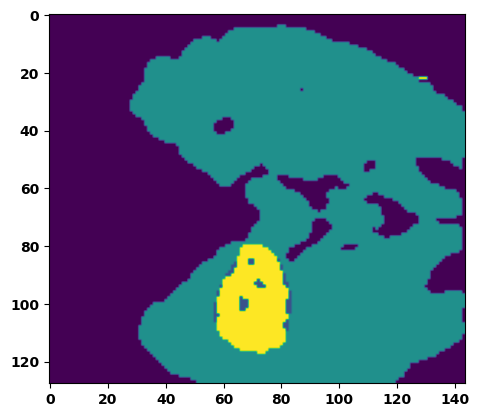

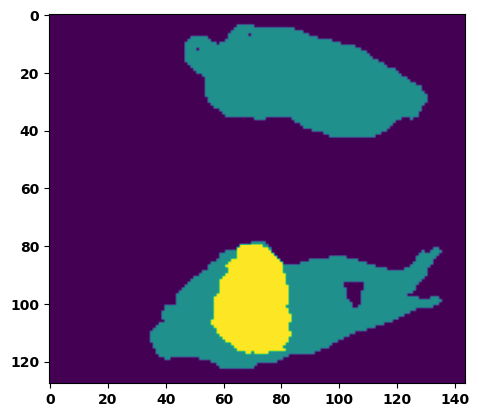

  6%|▌         | 2/36 [00:03<00:56,  1.65s/it]

Batch_id:  1 Eval loss:  0.2767547369003296
Batch_id:  1 Eval IoU:  tensor(0.6176, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9705, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:53,  1.61s/it]

Batch_id:  2 Eval loss:  0.4000703692436218
Batch_id:  2 Eval IoU:  tensor(0.5231, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 11%|█         | 4/36 [00:06<00:50,  1.57s/it]

Batch_id:  3 Eval loss:  0.6628352403640747
Batch_id:  3 Eval IoU:  tensor(0.2260, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6361, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.5231, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9363, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.6807, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.7683, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:46,  1.51s/it]

Batch_id:  4 Eval loss:  0.7352186441421509
Batch_id:  4 Eval IoU:  tensor(0.2416, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9757, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:45,  1.52s/it]

Batch_id:  5 Eval loss:  0.1963953822851181
Batch_id:  5 Eval IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9982, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:43,  1.51s/it]

Batch_id:  6 Eval loss:  0.7947331666946411
Batch_id:  6 Eval IoU:  tensor(0.1385, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.5023, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.2566, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.2551, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 22%|██▏       | 8/36 [00:12<00:41,  1.47s/it]

Batch_id:  7 Eval loss:  0.5290330648422241
Batch_id:  7 Eval IoU:  tensor(0.4437, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.44s/it]

Batch_id:  8 Eval loss:  0.24170321226119995
Batch_id:  8 Eval IoU:  tensor(0.6593, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9614, device='cuda:0')


 28%|██▊       | 10/36 [00:15<00:38,  1.50s/it]

Batch_id:  9 Eval loss:  0.6290957927703857
Batch_id:  9 Eval IoU:  tensor(0.3292, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8910, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8524, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8557, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  10 Eval loss:  0.6377091407775879
Batch_id:  10 Eval IoU:  tensor(0.3138, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


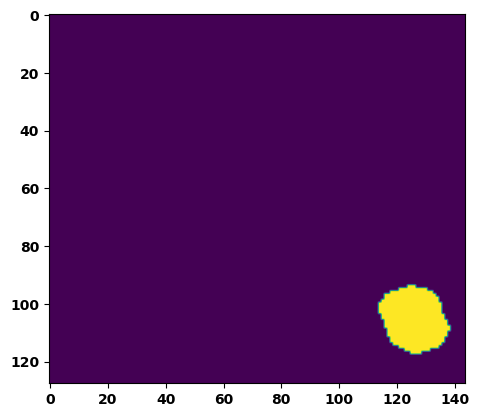

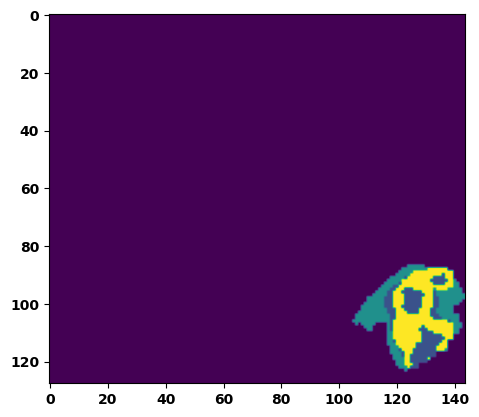

 33%|███▎      | 12/36 [00:18<00:34,  1.44s/it]

Batch_id:  11 Eval loss:  0.6817072629928589
Batch_id:  11 Eval IoU:  tensor(0.2798, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9401, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:32,  1.40s/it]

Batch_id:  12 Eval loss:  0.4803007245063782
Batch_id:  12 Eval IoU:  tensor(0.4444, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9360, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9261, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.41s/it]

Batch_id:  13 Eval loss:  0.6472774147987366
Batch_id:  13 Eval IoU:  tensor(0.2616, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6012, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4466, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.4255, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.45s/it]

Batch_id:  14 Eval loss:  0.23034361004829407
Batch_id:  14 Eval IoU:  tensor(0.6860, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.46s/it]

Batch_id:  15 Eval loss:  0.7085983157157898
Batch_id:  15 Eval IoU:  tensor(0.1985, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5403, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3809, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3168, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.52s/it]

Batch_id:  16 Eval loss:  0.0809427946805954
Batch_id:  16 Eval IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9895, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.47s/it]

Batch_id:  17 Eval loss:  0.2727051377296448
Batch_id:  17 Eval IoU:  tensor(0.6227, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9913, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:24,  1.45s/it]

Batch_id:  18 Eval loss:  0.1807631403207779
Batch_id:  18 Eval IoU:  tensor(0.7925, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9967, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.50s/it]

Batch_id:  19 Eval loss:  0.4369833469390869
Batch_id:  19 Eval IoU:  tensor(0.4927, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  20 Eval loss:  0.7675736546516418
Batch_id:  20 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


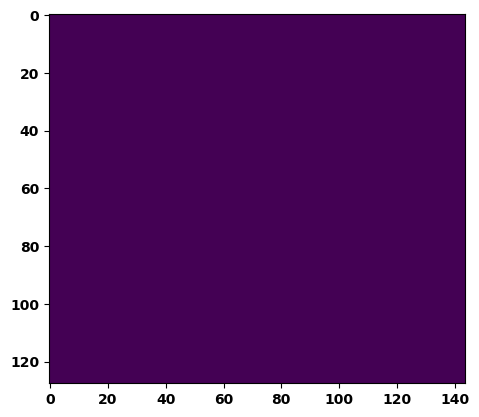

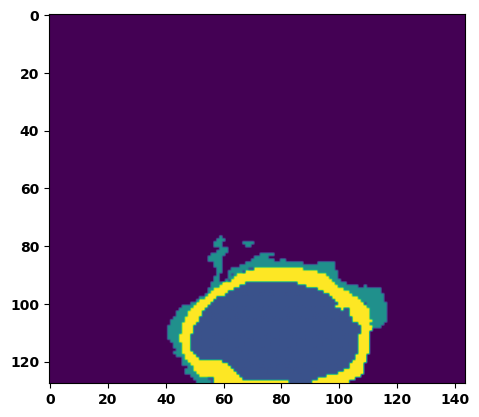

 61%|██████    | 22/36 [00:32<00:20,  1.48s/it]

Batch_id:  21 Eval loss:  0.7741418480873108
Batch_id:  21 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.47s/it]

Batch_id:  22 Eval loss:  0.7511264085769653
Batch_id:  22 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.47s/it]

Batch_id:  23 Eval loss:  0.6810084581375122
Batch_id:  23 Eval IoU:  tensor(0.2564, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8150, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.7909, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9143, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.7962, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.49s/it]

Batch_id:  24 Eval loss:  0.6858075261116028
Batch_id:  24 Eval IoU:  tensor(0.2672, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8712, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8261, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8094, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.47s/it]

Batch_id:  25 Eval loss:  0.8827087879180908
Batch_id:  25 Eval IoU:  tensor(0.0749, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4960, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4182, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9208, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.2448, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:14,  1.56s/it]

Batch_id:  26 Eval loss:  0.5569589138031006
Batch_id:  26 Eval IoU:  tensor(0.3773, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8993, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8627, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9301, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:12,  1.52s/it]

Batch_id:  27 Eval loss:  0.31982189416885376
Batch_id:  27 Eval IoU:  tensor(0.5848, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:11,  1.58s/it]

Batch_id:  28 Eval loss:  0.5796481966972351
Batch_id:  28 Eval IoU:  tensor(0.3470, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9886, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:09,  1.52s/it]

Batch_id:  29 Eval loss:  0.6656047701835632
Batch_id:  29 Eval IoU:  tensor(0.2495, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5012, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3111, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8795, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3367, device='cuda:0')
Batch_id:  30 Eval loss:  0.6528961062431335
Batch_id:  30 Eval IoU:  tensor(0.2967, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


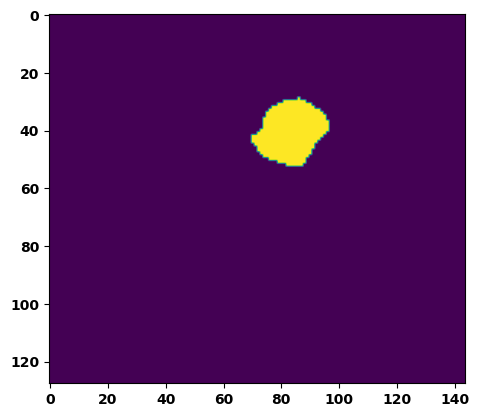

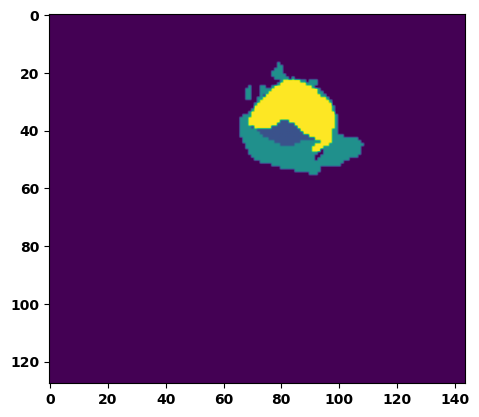

 89%|████████▉ | 32/36 [00:48<00:06,  1.53s/it]

Batch_id:  31 Eval loss:  0.5727767944335938
Batch_id:  31 Eval IoU:  tensor(0.3485, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8878, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8655, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9486, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.48s/it]

Batch_id:  32 Eval loss:  0.582320511341095
Batch_id:  32 Eval IoU:  tensor(0.3712, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 94%|█████████▍| 34/36 [00:51<00:02,  1.50s/it]

Batch_id:  33 Eval loss:  0.7566151022911072
Batch_id:  33 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.9013487100601196
Batch_id:  34 Eval IoU:  tensor(0.0582, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.4621, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.3369, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9016, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.1937, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.49s/it]

Batch_id:  35 Eval loss:  0.7582951188087463
Batch_id:  35 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Epoch  9 Training loss:  0.2115124753930352
Epoch  9 Evaluation loss:  0.560116860187716
Epoch  9 Training accuracy :  tensor(0.7230)
Epoch  9 Evaluation accuracy :  tensor(0.3806)
Epoch  9 Training Mean Dice Score:  tensor(0.9754)
Epoch  9 Eval Mean Dice Score:  tensor(0.8595)
Epoch  9 Training Non-tumor Dice Score:  tensor(0.9767)
Epoch  9 Eval Non-tumor Dice Score:  tensor(0.8154)
Epoch  9 Training NCR/NET Dice Score:  tensor(0.9876)
Epoch  9 Eval NCR/NET Dice Score:  tensor(0.9670)
Epoch  9 Training ED Dice Score:  tensor(0.9743)
Epoch  9 

Epoch: 10
Training in session: 


  1%|          | 1/110 [00:01<02:41,  1.49s/it]

Batch_id:  0 Training loss:  0.14643889665603638
Batch_id:  0 Training IoU:  tensor(0.7926, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:37,  1.46s/it]

Batch_id:  1 Training loss:  0.17773598432540894
Batch_id:  1 Training IoU:  tensor(0.7780, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:32,  1.42s/it]

Batch_id:  2 Training loss:  0.09843356907367706
Batch_id:  2 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:29,  1.41s/it]

Batch_id:  3 Training loss:  0.11687852442264557
Batch_id:  3 Training IoU:  tensor(0.8119, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:38,  1.51s/it]

Batch_id:  4 Training loss:  0.3401135802268982
Batch_id:  4 Training IoU:  tensor(0.6102, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:33,  1.47s/it]

Batch_id:  5 Training loss:  0.305134654045105
Batch_id:  5 Training IoU:  tensor(0.5845, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9717, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:28,  1.45s/it]

Batch_id:  6 Training loss:  0.35311996936798096
Batch_id:  6 Training IoU:  tensor(0.5754, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:23,  1.41s/it]

Batch_id:  7 Training loss:  0.13782554864883423
Batch_id:  7 Training IoU:  tensor(0.7826, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:31,  1.50s/it]

Batch_id:  8 Training loss:  0.2023870050907135
Batch_id:  8 Training IoU:  tensor(0.7040, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:22,  1.43s/it]

Batch_id:  9 Training loss:  0.18063458800315857
Batch_id:  9 Training IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 10%|█         | 11/110 [00:15<02:18,  1.40s/it]

Batch_id:  10 Training loss:  0.07545366883277893
Batch_id:  10 Training IoU:  tensor(0.8847, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 11%|█         | 12/110 [00:17<02:17,  1.40s/it]

Batch_id:  11 Training loss:  0.1612185835838318
Batch_id:  11 Training IoU:  tensor(0.7455, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9708, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:18,  1.43s/it]

Batch_id:  12 Training loss:  0.14608481526374817
Batch_id:  12 Training IoU:  tensor(0.7902, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:19,  1.45s/it]

Batch_id:  13 Training loss:  0.1357780247926712
Batch_id:  13 Training IoU:  tensor(0.7852, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:15,  1.42s/it]

Batch_id:  14 Training loss:  0.19863548874855042
Batch_id:  14 Training IoU:  tensor(0.7339, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:14,  1.43s/it]

Batch_id:  15 Training loss:  0.2977460026741028
Batch_id:  15 Training IoU:  tensor(0.5749, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9243, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9267, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9581, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:13,  1.43s/it]

Batch_id:  16 Training loss:  0.1123935878276825
Batch_id:  16 Training IoU:  tensor(0.8328, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:10,  1.42s/it]

Batch_id:  17 Training loss:  0.1959041953086853
Batch_id:  17 Training IoU:  tensor(0.7387, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:05,  1.38s/it]

Batch_id:  18 Training loss:  0.22847934067249298
Batch_id:  18 Training IoU:  tensor(0.7572, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:03,  1.38s/it]

Batch_id:  19 Training loss:  0.11967208981513977
Batch_id:  19 Training IoU:  tensor(0.8162, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 19%|█▉        | 21/110 [00:29<02:01,  1.36s/it]

Batch_id:  20 Training loss:  0.1872430294752121
Batch_id:  20 Training IoU:  tensor(0.7701, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 20%|██        | 22/110 [00:31<02:02,  1.39s/it]

Batch_id:  21 Training loss:  0.21725988388061523
Batch_id:  21 Training IoU:  tensor(0.7046, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 21%|██        | 23/110 [00:32<02:03,  1.42s/it]

Batch_id:  22 Training loss:  0.28033447265625
Batch_id:  22 Training IoU:  tensor(0.6857, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:08,  1.49s/it]

Batch_id:  23 Training loss:  0.3269907236099243
Batch_id:  23 Training IoU:  tensor(0.5925, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 23%|██▎       | 25/110 [00:35<02:08,  1.51s/it]

Batch_id:  24 Training loss:  0.22818657755851746
Batch_id:  24 Training IoU:  tensor(0.7311, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:04,  1.49s/it]

Batch_id:  25 Training loss:  0.18885928392410278
Batch_id:  25 Training IoU:  tensor(0.7147, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9709, device='cuda:0')


 25%|██▍       | 27/110 [00:38<02:01,  1.47s/it]

Batch_id:  26 Training loss:  0.11871181428432465
Batch_id:  26 Training IoU:  tensor(0.8115, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:58,  1.44s/it]

Batch_id:  27 Training loss:  0.25312697887420654
Batch_id:  27 Training IoU:  tensor(0.6444, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9725, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.08166633546352386
Batch_id:  28 Training IoU:  tensor(0.8780, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:52,  1.41s/it]

Batch_id:  29 Training loss:  0.0803828239440918
Batch_id:  29 Training IoU:  tensor(0.8764, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:49,  1.39s/it]

Batch_id:  30 Training loss:  0.17303778231143951
Batch_id:  30 Training IoU:  tensor(0.7729, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:53,  1.46s/it]

Batch_id:  31 Training loss:  0.4001360535621643
Batch_id:  31 Training IoU:  tensor(0.4895, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9293, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9388, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9286, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9522, device='cuda:0')


 30%|███       | 33/110 [00:47<01:47,  1.39s/it]

Batch_id:  32 Training loss:  0.30330976843833923
Batch_id:  32 Training IoU:  tensor(0.6570, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 31%|███       | 34/110 [00:48<01:50,  1.46s/it]

Batch_id:  33 Training loss:  0.08960916101932526
Batch_id:  33 Training IoU:  tensor(0.8590, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:48,  1.45s/it]

Batch_id:  34 Training loss:  0.30977097153663635
Batch_id:  34 Training IoU:  tensor(0.6419, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:43,  1.40s/it]

Batch_id:  35 Training loss:  0.1878320723772049
Batch_id:  35 Training IoU:  tensor(0.7210, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:45,  1.45s/it]

Batch_id:  36 Training loss:  0.15512686967849731
Batch_id:  36 Training IoU:  tensor(0.7590, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.2394082248210907
Batch_id:  37 Training IoU:  tensor(0.6550, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:46,  1.50s/it]

Batch_id:  38 Training loss:  0.3038908839225769
Batch_id:  38 Training IoU:  tensor(0.6489, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:40,  1.43s/it]

Batch_id:  39 Training loss:  0.17546775937080383
Batch_id:  39 Training IoU:  tensor(0.7393, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:38,  1.42s/it]

Batch_id:  40 Training loss:  0.07327336072921753
Batch_id:  40 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:39,  1.46s/it]

Batch_id:  41 Training loss:  0.08594551682472229
Batch_id:  41 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:39,  1.49s/it]

Batch_id:  42 Training loss:  0.36505380272865295
Batch_id:  42 Training IoU:  tensor(0.5290, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9507, device='cuda:0')


 40%|████      | 44/110 [01:03<01:37,  1.47s/it]

Batch_id:  43 Training loss:  0.4115133285522461
Batch_id:  43 Training IoU:  tensor(0.5059, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 41%|████      | 45/110 [01:04<01:33,  1.44s/it]

Batch_id:  44 Training loss:  0.22097063064575195
Batch_id:  44 Training IoU:  tensor(0.6908, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:35,  1.49s/it]

Batch_id:  45 Training loss:  0.14899390935897827
Batch_id:  45 Training IoU:  tensor(0.7963, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:30,  1.44s/it]

Batch_id:  46 Training loss:  0.15964707732200623
Batch_id:  46 Training IoU:  tensor(0.7589, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:28,  1.42s/it]

Batch_id:  47 Training loss:  0.16805177927017212
Batch_id:  47 Training IoU:  tensor(0.7600, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:27,  1.43s/it]

Batch_id:  48 Training loss:  0.13549663126468658
Batch_id:  48 Training IoU:  tensor(0.7912, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:24,  1.42s/it]

Batch_id:  49 Training loss:  0.2147156298160553
Batch_id:  49 Training IoU:  tensor(0.6972, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9554, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:22,  1.39s/it]

Batch_id:  50 Training loss:  0.17149117588996887
Batch_id:  50 Training IoU:  tensor(0.7493, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:23,  1.45s/it]

Batch_id:  51 Training loss:  0.25851529836654663
Batch_id:  51 Training IoU:  tensor(0.6441, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:20,  1.41s/it]

Batch_id:  52 Training loss:  0.5467417240142822
Batch_id:  52 Training IoU:  tensor(0.3777, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:18,  1.41s/it]

Batch_id:  53 Training loss:  0.13779543340206146
Batch_id:  53 Training IoU:  tensor(0.7962, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:19,  1.44s/it]

Batch_id:  54 Training loss:  0.1911976933479309
Batch_id:  54 Training IoU:  tensor(0.7387, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:17,  1.43s/it]

Batch_id:  55 Training loss:  0.08073648810386658
Batch_id:  55 Training IoU:  tensor(0.8787, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:18,  1.48s/it]

Batch_id:  56 Training loss:  0.24443316459655762
Batch_id:  56 Training IoU:  tensor(0.6360, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9785, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:18,  1.50s/it]

Batch_id:  57 Training loss:  0.2975810766220093
Batch_id:  57 Training IoU:  tensor(0.6523, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:15,  1.48s/it]

Batch_id:  58 Training loss:  0.1189759373664856
Batch_id:  58 Training IoU:  tensor(0.8168, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:11,  1.43s/it]

Batch_id:  59 Training loss:  0.11277671158313751
Batch_id:  59 Training IoU:  tensor(0.8246, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 55%|█████▌    | 61/110 [01:27<01:09,  1.42s/it]

Batch_id:  60 Training loss:  0.25645408034324646
Batch_id:  60 Training IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9082, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9212, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9657, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:06,  1.39s/it]

Batch_id:  61 Training loss:  0.15150946378707886
Batch_id:  61 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:09,  1.48s/it]

Batch_id:  62 Training loss:  0.09031437337398529
Batch_id:  62 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:07,  1.47s/it]

Batch_id:  63 Training loss:  0.1385709047317505
Batch_id:  63 Training IoU:  tensor(0.7839, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 59%|█████▉    | 65/110 [01:33<01:06,  1.47s/it]

Batch_id:  64 Training loss:  0.33972641825675964
Batch_id:  64 Training IoU:  tensor(0.5613, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:05,  1.50s/it]

Batch_id:  65 Training loss:  0.30322879552841187
Batch_id:  65 Training IoU:  tensor(0.6542, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.4565469026565552
Batch_id:  66 Training IoU:  tensor(0.4838, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<01:02,  1.48s/it]

Batch_id:  67 Training loss:  0.34921693801879883
Batch_id:  67 Training IoU:  tensor(0.5993, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<00:59,  1.46s/it]

Batch_id:  68 Training loss:  0.2707288861274719
Batch_id:  68 Training IoU:  tensor(0.6927, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<01:00,  1.51s/it]

Batch_id:  69 Training loss:  0.15605376660823822
Batch_id:  69 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:57,  1.46s/it]

Batch_id:  70 Training loss:  0.2372179925441742
Batch_id:  70 Training IoU:  tensor(0.7105, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:56,  1.48s/it]

Batch_id:  71 Training loss:  0.3237171173095703
Batch_id:  71 Training IoU:  tensor(0.6008, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:55,  1.50s/it]

Batch_id:  72 Training loss:  0.09751886129379272
Batch_id:  72 Training IoU:  tensor(0.8525, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.21481570601463318
Batch_id:  73 Training IoU:  tensor(0.6833, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:49,  1.41s/it]

Batch_id:  74 Training loss:  0.48484256863594055
Batch_id:  74 Training IoU:  tensor(0.4227, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:47,  1.40s/it]

Batch_id:  75 Training loss:  0.11391967535018921
Batch_id:  75 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:46,  1.42s/it]

Batch_id:  76 Training loss:  0.14168401062488556
Batch_id:  76 Training IoU:  tensor(0.7762, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:46,  1.45s/it]

Batch_id:  77 Training loss:  0.07702881097793579
Batch_id:  77 Training IoU:  tensor(0.8830, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:45,  1.47s/it]

Batch_id:  78 Training loss:  0.14611777663230896
Batch_id:  78 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:43,  1.46s/it]

Batch_id:  79 Training loss:  0.21555595099925995
Batch_id:  79 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9444, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9233, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:42,  1.48s/it]

Batch_id:  80 Training loss:  0.2430339902639389
Batch_id:  80 Training IoU:  tensor(0.6749, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 75%|███████▍  | 82/110 [01:58<00:39,  1.42s/it]

Batch_id:  81 Training loss:  0.2943606972694397
Batch_id:  81 Training IoU:  tensor(0.6121, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 75%|███████▌  | 83/110 [01:59<00:37,  1.40s/it]

Batch_id:  82 Training loss:  0.12699386477470398
Batch_id:  82 Training IoU:  tensor(0.8024, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 76%|███████▋  | 84/110 [02:01<00:37,  1.42s/it]

Batch_id:  83 Training loss:  0.21453237533569336
Batch_id:  83 Training IoU:  tensor(0.7775, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 77%|███████▋  | 85/110 [02:02<00:35,  1.43s/it]

Batch_id:  84 Training loss:  0.18963156640529633
Batch_id:  84 Training IoU:  tensor(0.7420, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 78%|███████▊  | 86/110 [02:04<00:34,  1.45s/it]

Batch_id:  85 Training loss:  0.21166522800922394
Batch_id:  85 Training IoU:  tensor(0.7329, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 79%|███████▉  | 87/110 [02:05<00:32,  1.42s/it]

Batch_id:  86 Training loss:  0.3340641260147095
Batch_id:  86 Training IoU:  tensor(0.5571, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 80%|████████  | 88/110 [02:06<00:31,  1.43s/it]

Batch_id:  87 Training loss:  0.11793379485607147
Batch_id:  87 Training IoU:  tensor(0.8232, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 81%|████████  | 89/110 [02:08<00:29,  1.42s/it]

Batch_id:  88 Training loss:  0.20592129230499268
Batch_id:  88 Training IoU:  tensor(0.6991, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 82%|████████▏ | 90/110 [02:09<00:29,  1.45s/it]

Batch_id:  89 Training loss:  0.5456296801567078
Batch_id:  89 Training IoU:  tensor(0.3677, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.8855, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9326, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9288, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9363, device='cuda:0')


 83%|████████▎ | 91/110 [02:11<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.11732278764247894
Batch_id:  90 Training IoU:  tensor(0.8158, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 84%|████████▎ | 92/110 [02:12<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.157053604722023
Batch_id:  91 Training IoU:  tensor(0.7522, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 85%|████████▍ | 93/110 [02:14<00:23,  1.41s/it]

Batch_id:  92 Training loss:  0.1375071108341217
Batch_id:  92 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 85%|████████▌ | 94/110 [02:15<00:23,  1.49s/it]

Batch_id:  93 Training loss:  0.07908549904823303
Batch_id:  93 Training IoU:  tensor(0.8773, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 86%|████████▋ | 95/110 [02:17<00:21,  1.46s/it]

Batch_id:  94 Training loss:  0.38747185468673706
Batch_id:  94 Training IoU:  tensor(0.5206, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9736, device='cuda:0')


 87%|████████▋ | 96/110 [02:18<00:20,  1.50s/it]

Batch_id:  95 Training loss:  0.045367613434791565
Batch_id:  95 Training IoU:  tensor(0.9340, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 88%|████████▊ | 97/110 [02:20<00:19,  1.46s/it]

Batch_id:  96 Training loss:  0.17416206002235413
Batch_id:  96 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 89%|████████▉ | 98/110 [02:21<00:17,  1.46s/it]

Batch_id:  97 Training loss:  0.1776396483182907
Batch_id:  97 Training IoU:  tensor(0.7696, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 90%|█████████ | 99/110 [02:23<00:16,  1.47s/it]

Batch_id:  98 Training loss:  0.16840356588363647
Batch_id:  98 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 91%|█████████ | 100/110 [02:24<00:15,  1.55s/it]

Batch_id:  99 Training loss:  0.07798463106155396
Batch_id:  99 Training IoU:  tensor(0.8780, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 92%|█████████▏| 101/110 [02:26<00:13,  1.53s/it]

Batch_id:  100 Training loss:  0.08930796384811401
Batch_id:  100 Training IoU:  tensor(0.8636, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 93%|█████████▎| 102/110 [02:27<00:11,  1.48s/it]

Batch_id:  101 Training loss:  0.15442416071891785
Batch_id:  101 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 94%|█████████▎| 103/110 [02:29<00:10,  1.44s/it]

Batch_id:  102 Training loss:  0.10837239027023315
Batch_id:  102 Training IoU:  tensor(0.8395, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 95%|█████████▍| 104/110 [02:30<00:08,  1.43s/it]

Batch_id:  103 Training loss:  0.1931150257587433
Batch_id:  103 Training IoU:  tensor(0.7046, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 95%|█████████▌| 105/110 [02:31<00:07,  1.44s/it]

Batch_id:  104 Training loss:  0.2898029088973999
Batch_id:  104 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 96%|█████████▋| 106/110 [02:33<00:05,  1.43s/it]

Batch_id:  105 Training loss:  0.1278000771999359
Batch_id:  105 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 97%|█████████▋| 107/110 [02:34<00:04,  1.46s/it]

Batch_id:  106 Training loss:  0.17039933800697327
Batch_id:  106 Training IoU:  tensor(0.8081, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 98%|█████████▊| 108/110 [02:36<00:02,  1.49s/it]

Batch_id:  107 Training loss:  0.2074856013059616
Batch_id:  107 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 99%|█████████▉| 109/110 [02:37<00:01,  1.44s/it]

Batch_id:  108 Training loss:  0.09967538714408875
Batch_id:  108 Training IoU:  tensor(0.8393, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


100%|██████████| 110/110 [02:39<00:00,  1.45s/it]


Batch_id:  109 Training loss:  0.11330318450927734
Batch_id:  109 Training IoU:  tensor(0.8220, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9930, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4740626811981201
Batch_id:  0 Eval IoU:  tensor(0.4166, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9805, device='cuda:0')


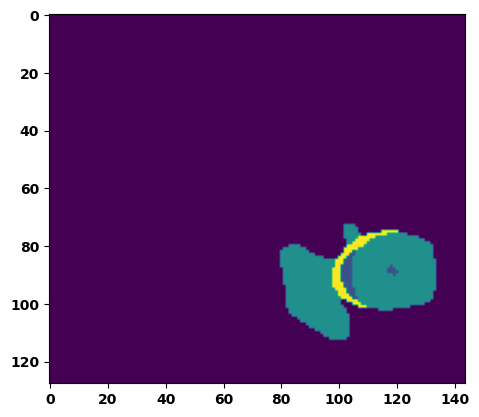

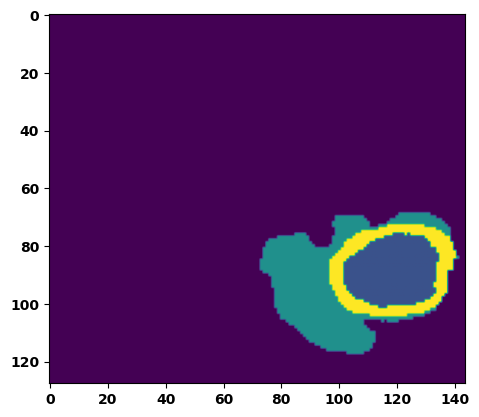

  6%|▌         | 2/36 [00:03<00:52,  1.56s/it]

Batch_id:  1 Eval loss:  0.13618089258670807
Batch_id:  1 Eval IoU:  tensor(0.7962, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:48,  1.48s/it]

Batch_id:  2 Eval loss:  0.24142026901245117
Batch_id:  2 Eval IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.44s/it]

Batch_id:  3 Eval loss:  0.2531869411468506
Batch_id:  3 Eval IoU:  tensor(0.6533, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9592, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.47s/it]

Batch_id:  4 Eval loss:  0.3559194803237915
Batch_id:  4 Eval IoU:  tensor(0.5530, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:45,  1.50s/it]

Batch_id:  5 Eval loss:  0.22984233498573303
Batch_id:  5 Eval IoU:  tensor(0.6750, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.9036100506782532
Batch_id:  6 Eval IoU:  tensor(0.0567, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.4582, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3310, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.1927, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.43s/it]

Batch_id:  7 Eval loss:  0.5160825848579407
Batch_id:  7 Eval IoU:  tensor(0.4621, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.42s/it]

Batch_id:  8 Eval loss:  0.772760808467865
Batch_id:  8 Eval IoU:  tensor(0.1442, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6067, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4751, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9435, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.4547, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9468, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.45s/it]

Batch_id:  9 Eval loss:  0.17090831696987152
Batch_id:  9 Eval IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  10 Eval loss:  0.10646472871303558
Batch_id:  10 Eval IoU:  tensor(0.8559, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9983, device='cuda:0')


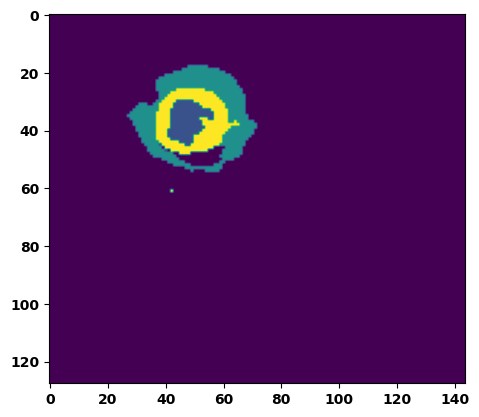

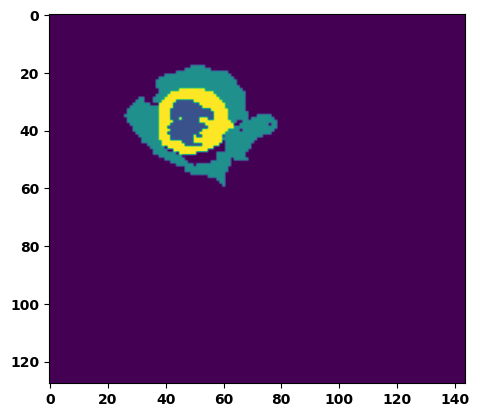

 33%|███▎      | 12/36 [00:17<00:35,  1.50s/it]

Batch_id:  11 Eval loss:  0.6442770957946777
Batch_id:  11 Eval IoU:  tensor(0.2343, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.5527, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.3672, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.3657, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9659, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.53s/it]

Batch_id:  12 Eval loss:  0.7565468549728394
Batch_id:  12 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9351, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.49s/it]

Batch_id:  13 Eval loss:  0.7591907978057861
Batch_id:  13 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.32171517610549927
Batch_id:  14 Eval IoU:  tensor(0.5693, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.47s/it]

Batch_id:  15 Eval loss:  0.3647238612174988
Batch_id:  15 Eval IoU:  tensor(0.5171, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9071, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.48s/it]

Batch_id:  16 Eval loss:  0.7235571146011353
Batch_id:  16 Eval IoU:  tensor(0.1816, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.5312, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3592, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.3272, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.48s/it]

Batch_id:  17 Eval loss:  0.8823758363723755
Batch_id:  17 Eval IoU:  tensor(0.0752, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4966, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4191, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9012, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2481, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:25,  1.47s/it]

Batch_id:  18 Eval loss:  0.8576468825340271
Batch_id:  18 Eval IoU:  tensor(0.0904, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.5259, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4286, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8639, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.3404, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.48s/it]

Batch_id:  19 Eval loss:  0.7574092149734497
Batch_id:  19 Eval IoU:  tensor(0.1659, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6411, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4745, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.5165, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  20 Eval loss:  0.6714865565299988
Batch_id:  20 Eval IoU:  tensor(0.2818, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


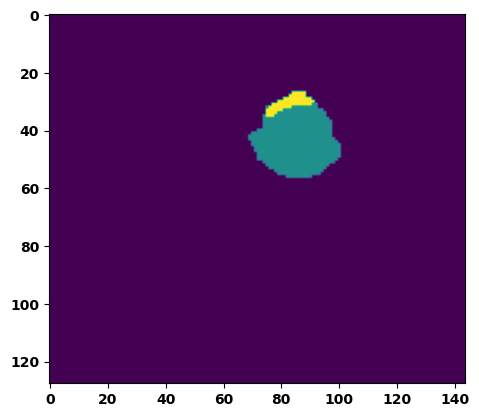

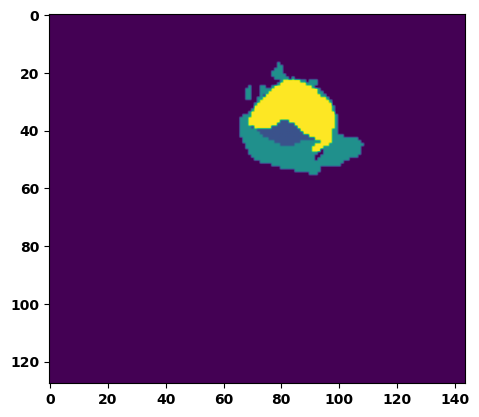

 61%|██████    | 22/36 [00:32<00:21,  1.52s/it]

Batch_id:  21 Eval loss:  0.6839180588722229
Batch_id:  21 Eval IoU:  tensor(0.2369, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.5790, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.4140, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.4134, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.48s/it]

Batch_id:  22 Eval loss:  0.725636899471283
Batch_id:  22 Eval IoU:  tensor(0.1994, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.4868, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.3051, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.2407, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.50s/it]

Batch_id:  23 Eval loss:  0.774061381816864
Batch_id:  23 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.51s/it]

Batch_id:  24 Eval loss:  0.495304673910141
Batch_id:  24 Eval IoU:  tensor(0.3980, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.7329, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.6198, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.6913, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:15,  1.53s/it]

Batch_id:  25 Eval loss:  0.6809208989143372
Batch_id:  25 Eval IoU:  tensor(0.2734, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8905, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8549, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8873, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.53s/it]

Batch_id:  26 Eval loss:  0.3936551511287689
Batch_id:  26 Eval IoU:  tensor(0.4806, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9302, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8924, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9406, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.49s/it]

Batch_id:  27 Eval loss:  0.7511987686157227
Batch_id:  27 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.48s/it]

Batch_id:  28 Eval loss:  0.9095871448516846
Batch_id:  28 Eval IoU:  tensor(0.0519, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4547, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.1961, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.6868, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.5753, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.48s/it]

Batch_id:  29 Eval loss:  0.6555551886558533
Batch_id:  29 Eval IoU:  tensor(0.2400, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6529, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5200, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.5324, device='cuda:0')
Batch_id:  30 Eval loss:  0.7676262855529785
Batch_id:  30 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


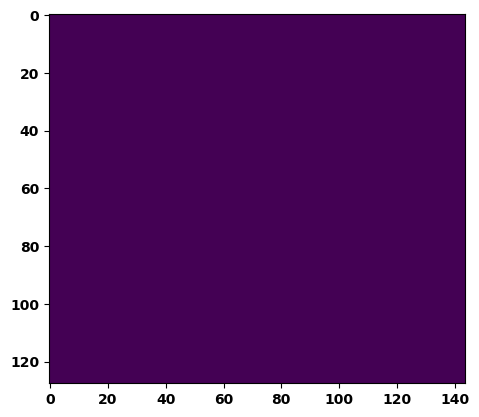

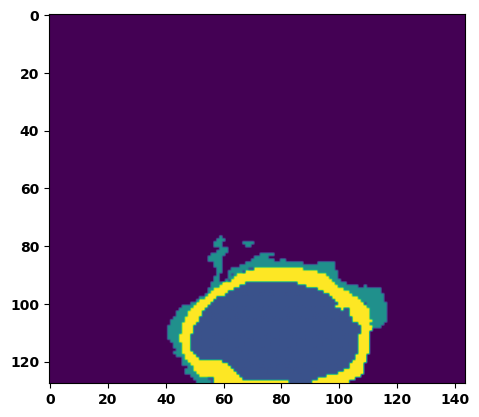

 89%|████████▉ | 32/36 [00:47<00:05,  1.47s/it]

Batch_id:  31 Eval loss:  0.32052159309387207
Batch_id:  31 Eval IoU:  tensor(0.6419, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.53s/it]

Batch_id:  32 Eval loss:  0.6290137767791748
Batch_id:  32 Eval IoU:  tensor(0.3161, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.46s/it]

Batch_id:  33 Eval loss:  0.21060621738433838
Batch_id:  33 Eval IoU:  tensor(0.6922, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.5366253852844238
Batch_id:  34 Eval IoU:  tensor(0.3802, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9281, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9099, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8986, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.48s/it]

Batch_id:  35 Eval loss:  0.11034415662288666
Batch_id:  35 Eval IoU:  tensor(0.8159, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9859, device='cuda:0')
Epoch  10 Training loss:  0.20271405442194504
Epoch  10 Evaluation loss:  0.5428873350222906
Epoch  10 Training accuracy :  tensor(0.7299)
Epoch  10 Evaluation accuracy :  tensor(0.3896)
Epoch  10 Training Mean Dice Score:  tensor(0.9759)
Epoch  10 Eval Mean Dice Score:  tensor(0.8241)
Epoch  10 Training Non-tumor Dice Score:  tensor(0.9771)
Epoch  10 Eval Non-tumor Dice Score:  tensor(0.7679)
Epoch  10 Training NCR/NET Dice Score:  tensor(0.9880)
Epoch  10 Eval NCR/NET Dice Score:  tensor(0.9662)
Epoch  10 Training ED Dice Score:  tensor(0.9

Epoch: 11
Training in session: 


  1%|          | 1/110 [00:01<02:41,  1.48s/it]

Batch_id:  0 Training loss:  0.1545693278312683
Batch_id:  0 Training IoU:  tensor(0.7517, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9718, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:38,  1.47s/it]

Batch_id:  1 Training loss:  0.19220949709415436
Batch_id:  1 Training IoU:  tensor(0.7239, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:28,  1.39s/it]

Batch_id:  2 Training loss:  0.2848309278488159
Batch_id:  2 Training IoU:  tensor(0.6825, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:31,  1.43s/it]

Batch_id:  3 Training loss:  0.07898715138435364
Batch_id:  3 Training IoU:  tensor(0.8725, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:32,  1.45s/it]

Batch_id:  4 Training loss:  0.2954344153404236
Batch_id:  4 Training IoU:  tensor(0.6658, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:29,  1.44s/it]

Batch_id:  5 Training loss:  0.14198993146419525
Batch_id:  5 Training IoU:  tensor(0.7826, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:40,  1.56s/it]

Batch_id:  6 Training loss:  0.29002290964126587
Batch_id:  6 Training IoU:  tensor(0.6752, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:39,  1.56s/it]

Batch_id:  7 Training loss:  0.24476933479309082
Batch_id:  7 Training IoU:  tensor(0.6717, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:37,  1.56s/it]

Batch_id:  8 Training loss:  0.5040625333786011
Batch_id:  8 Training IoU:  tensor(0.4079, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9206, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9470, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:34,  1.55s/it]

Batch_id:  9 Training loss:  0.2360551357269287
Batch_id:  9 Training IoU:  tensor(0.6554, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9699, device='cuda:0')


 10%|█         | 11/110 [00:16<02:29,  1.51s/it]

Batch_id:  10 Training loss:  0.15383511781692505
Batch_id:  10 Training IoU:  tensor(0.7665, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 11%|█         | 12/110 [00:18<02:31,  1.55s/it]

Batch_id:  11 Training loss:  0.1407189667224884
Batch_id:  11 Training IoU:  tensor(0.7948, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:27,  1.53s/it]

Batch_id:  12 Training loss:  0.108489990234375
Batch_id:  12 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:28,  1.55s/it]

Batch_id:  13 Training loss:  0.10211020708084106
Batch_id:  13 Training IoU:  tensor(0.8467, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:23,  1.51s/it]

Batch_id:  14 Training loss:  0.2656696140766144
Batch_id:  14 Training IoU:  tensor(0.6929, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:18,  1.47s/it]

Batch_id:  15 Training loss:  0.13841257989406586
Batch_id:  15 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:16,  1.47s/it]

Batch_id:  16 Training loss:  0.18488693237304688
Batch_id:  16 Training IoU:  tensor(0.7301, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9616, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:10,  1.42s/it]

Batch_id:  17 Training loss:  0.1955428272485733
Batch_id:  17 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:14,  1.48s/it]

Batch_id:  18 Training loss:  0.2647141218185425
Batch_id:  18 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:08,  1.43s/it]

Batch_id:  19 Training loss:  0.3832542300224304
Batch_id:  19 Training IoU:  tensor(0.5411, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:05,  1.41s/it]

Batch_id:  20 Training loss:  0.17815351486206055
Batch_id:  20 Training IoU:  tensor(0.7524, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 20%|██        | 22/110 [00:32<02:02,  1.40s/it]

Batch_id:  21 Training loss:  0.20944072306156158
Batch_id:  21 Training IoU:  tensor(0.7352, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 21%|██        | 23/110 [00:33<02:04,  1.43s/it]

Batch_id:  22 Training loss:  0.19409212470054626
Batch_id:  22 Training IoU:  tensor(0.7449, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:01,  1.41s/it]

Batch_id:  23 Training loss:  0.07131791114807129
Batch_id:  23 Training IoU:  tensor(0.8918, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 23%|██▎       | 25/110 [00:36<01:59,  1.41s/it]

Batch_id:  24 Training loss:  0.3304140567779541
Batch_id:  24 Training IoU:  tensor(0.5984, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 24%|██▎       | 26/110 [00:38<01:57,  1.40s/it]

Batch_id:  25 Training loss:  0.2124256044626236
Batch_id:  25 Training IoU:  tensor(0.6870, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:04,  1.50s/it]

Batch_id:  26 Training loss:  0.30146104097366333
Batch_id:  26 Training IoU:  tensor(0.6183, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:59,  1.45s/it]

Batch_id:  27 Training loss:  0.0790942907333374
Batch_id:  27 Training IoU:  tensor(0.8794, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 26%|██▋       | 29/110 [00:42<02:02,  1.51s/it]

Batch_id:  28 Training loss:  0.3276238739490509
Batch_id:  28 Training IoU:  tensor(0.5847, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:59,  1.49s/it]

Batch_id:  29 Training loss:  0.1518295705318451
Batch_id:  29 Training IoU:  tensor(0.7598, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:55,  1.46s/it]

Batch_id:  30 Training loss:  0.18836481869220734
Batch_id:  30 Training IoU:  tensor(0.7802, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:54,  1.47s/it]

Batch_id:  31 Training loss:  0.35652369260787964
Batch_id:  31 Training IoU:  tensor(0.5448, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 30%|███       | 33/110 [00:48<01:52,  1.46s/it]

Batch_id:  32 Training loss:  0.18074102699756622
Batch_id:  32 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 31%|███       | 34/110 [00:50<01:50,  1.45s/it]

Batch_id:  33 Training loss:  0.17693087458610535
Batch_id:  33 Training IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:47,  1.44s/it]

Batch_id:  34 Training loss:  0.09979359805583954
Batch_id:  34 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:45,  1.43s/it]

Batch_id:  35 Training loss:  0.2956084609031677
Batch_id:  35 Training IoU:  tensor(0.6518, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:43,  1.42s/it]

Batch_id:  36 Training loss:  0.23735609650611877
Batch_id:  36 Training IoU:  tensor(0.7208, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:40,  1.40s/it]

Batch_id:  37 Training loss:  0.13132895529270172
Batch_id:  37 Training IoU:  tensor(0.8131, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:40,  1.41s/it]

Batch_id:  38 Training loss:  0.23389197885990143
Batch_id:  38 Training IoU:  tensor(0.6538, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9365, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:37,  1.39s/it]

Batch_id:  39 Training loss:  0.16902536153793335
Batch_id:  39 Training IoU:  tensor(0.8226, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:35,  1.39s/it]

Batch_id:  40 Training loss:  0.23540323972702026
Batch_id:  40 Training IoU:  tensor(0.6676, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9738, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:35,  1.41s/it]

Batch_id:  41 Training loss:  0.17994660139083862
Batch_id:  41 Training IoU:  tensor(0.7191, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:32,  1.37s/it]

Batch_id:  42 Training loss:  0.10314899682998657
Batch_id:  42 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 40%|████      | 44/110 [01:03<01:29,  1.36s/it]

Batch_id:  43 Training loss:  0.10945060849189758
Batch_id:  43 Training IoU:  tensor(0.8266, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 41%|████      | 45/110 [01:05<01:28,  1.36s/it]

Batch_id:  44 Training loss:  0.11938007175922394
Batch_id:  44 Training IoU:  tensor(0.8125, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:27,  1.37s/it]

Batch_id:  45 Training loss:  0.1618211418390274
Batch_id:  45 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:25,  1.35s/it]

Batch_id:  46 Training loss:  0.20543430745601654
Batch_id:  46 Training IoU:  tensor(0.7151, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:25,  1.38s/it]

Batch_id:  47 Training loss:  0.20149090886116028
Batch_id:  47 Training IoU:  tensor(0.7072, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:22,  1.36s/it]

Batch_id:  48 Training loss:  0.3654469847679138
Batch_id:  48 Training IoU:  tensor(0.5298, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9386, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9528, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:21,  1.36s/it]

Batch_id:  49 Training loss:  0.15400683879852295
Batch_id:  49 Training IoU:  tensor(0.7625, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:20,  1.36s/it]

Batch_id:  50 Training loss:  0.1845403015613556
Batch_id:  50 Training IoU:  tensor(0.7236, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:19,  1.38s/it]

Batch_id:  51 Training loss:  0.14745521545410156
Batch_id:  51 Training IoU:  tensor(0.7674, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:19,  1.40s/it]

Batch_id:  52 Training loss:  0.2837258279323578
Batch_id:  52 Training IoU:  tensor(0.6273, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:20,  1.44s/it]

Batch_id:  53 Training loss:  0.1194053441286087
Batch_id:  53 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:22,  1.50s/it]

Batch_id:  54 Training loss:  0.04741033911705017
Batch_id:  54 Training IoU:  tensor(0.9330, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:20,  1.50s/it]

Batch_id:  55 Training loss:  0.12160110473632812
Batch_id:  55 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:19,  1.49s/it]

Batch_id:  56 Training loss:  0.10026626288890839
Batch_id:  56 Training IoU:  tensor(0.8409, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:17,  1.49s/it]

Batch_id:  57 Training loss:  0.19101306796073914
Batch_id:  57 Training IoU:  tensor(0.7171, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:13,  1.45s/it]

Batch_id:  58 Training loss:  0.1442728489637375
Batch_id:  58 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:11,  1.44s/it]

Batch_id:  59 Training loss:  0.3100307583808899
Batch_id:  59 Training IoU:  tensor(0.6317, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:10,  1.45s/it]

Batch_id:  60 Training loss:  0.07373164594173431
Batch_id:  60 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:08,  1.44s/it]

Batch_id:  61 Training loss:  0.10677534341812134
Batch_id:  61 Training IoU:  tensor(0.8308, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:09,  1.47s/it]

Batch_id:  62 Training loss:  0.12382520735263824
Batch_id:  62 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:07,  1.47s/it]

Batch_id:  63 Training loss:  0.2115085870027542
Batch_id:  63 Training IoU:  tensor(0.7092, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:07,  1.50s/it]

Batch_id:  64 Training loss:  0.2612100839614868
Batch_id:  64 Training IoU:  tensor(0.6203, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9691, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:03,  1.44s/it]

Batch_id:  65 Training loss:  0.2501039505004883
Batch_id:  65 Training IoU:  tensor(0.6771, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:01,  1.43s/it]

Batch_id:  66 Training loss:  0.08205804228782654
Batch_id:  66 Training IoU:  tensor(0.8707, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<00:59,  1.41s/it]

Batch_id:  67 Training loss:  0.22272208333015442
Batch_id:  67 Training IoU:  tensor(0.6703, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.12469205260276794
Batch_id:  68 Training IoU:  tensor(0.8080, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:56,  1.40s/it]

Batch_id:  69 Training loss:  0.12079921364784241
Batch_id:  69 Training IoU:  tensor(0.8329, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:54,  1.39s/it]

Batch_id:  70 Training loss:  0.06961920857429504
Batch_id:  70 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:55,  1.45s/it]

Batch_id:  71 Training loss:  0.27551788091659546
Batch_id:  71 Training IoU:  tensor(0.6318, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9585, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:54,  1.49s/it]

Batch_id:  72 Training loss:  0.19287630915641785
Batch_id:  72 Training IoU:  tensor(0.7419, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:53,  1.47s/it]

Batch_id:  73 Training loss:  0.10058142244815826
Batch_id:  73 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:50,  1.44s/it]

Batch_id:  74 Training loss:  0.1469765156507492
Batch_id:  74 Training IoU:  tensor(0.7725, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:48,  1.43s/it]

Batch_id:  75 Training loss:  0.316403329372406
Batch_id:  75 Training IoU:  tensor(0.5787, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:46,  1.41s/it]

Batch_id:  76 Training loss:  0.1884453296661377
Batch_id:  76 Training IoU:  tensor(0.7517, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:44,  1.38s/it]

Batch_id:  77 Training loss:  0.1191701740026474
Batch_id:  77 Training IoU:  tensor(0.8064, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 72%|███████▏  | 79/110 [01:53<00:43,  1.39s/it]

Batch_id:  78 Training loss:  0.06847453117370605
Batch_id:  78 Training IoU:  tensor(0.8902, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:42,  1.42s/it]

Batch_id:  79 Training loss:  0.1787148416042328
Batch_id:  79 Training IoU:  tensor(0.7365, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 74%|███████▎  | 81/110 [01:56<00:40,  1.40s/it]

Batch_id:  80 Training loss:  0.15291333198547363
Batch_id:  80 Training IoU:  tensor(0.7742, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 75%|███████▍  | 82/110 [01:58<00:38,  1.37s/it]

Batch_id:  81 Training loss:  0.17748840153217316
Batch_id:  81 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 75%|███████▌  | 83/110 [01:59<00:37,  1.39s/it]

Batch_id:  82 Training loss:  0.07784178853034973
Batch_id:  82 Training IoU:  tensor(0.8760, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 76%|███████▋  | 84/110 [02:00<00:36,  1.42s/it]

Batch_id:  83 Training loss:  0.3540111184120178
Batch_id:  83 Training IoU:  tensor(0.5898, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 77%|███████▋  | 85/110 [02:02<00:35,  1.42s/it]

Batch_id:  84 Training loss:  0.07525019347667694
Batch_id:  84 Training IoU:  tensor(0.8831, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 78%|███████▊  | 86/110 [02:03<00:33,  1.40s/it]

Batch_id:  85 Training loss:  0.14769890904426575
Batch_id:  85 Training IoU:  tensor(0.7885, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 79%|███████▉  | 87/110 [02:05<00:32,  1.41s/it]

Batch_id:  86 Training loss:  0.19238467514514923
Batch_id:  86 Training IoU:  tensor(0.7294, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 80%|████████  | 88/110 [02:06<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.1401379108428955
Batch_id:  87 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 81%|████████  | 89/110 [02:07<00:29,  1.41s/it]

Batch_id:  88 Training loss:  0.1418592929840088
Batch_id:  88 Training IoU:  tensor(0.7861, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 82%|████████▏ | 90/110 [02:09<00:28,  1.42s/it]

Batch_id:  89 Training loss:  0.08374756574630737
Batch_id:  89 Training IoU:  tensor(0.8687, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 83%|████████▎ | 91/110 [02:10<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.24389110505580902
Batch_id:  90 Training IoU:  tensor(0.7297, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 84%|████████▎ | 92/110 [02:12<00:26,  1.46s/it]

Batch_id:  91 Training loss:  0.1565140187740326
Batch_id:  91 Training IoU:  tensor(0.7746, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 85%|████████▍ | 93/110 [02:13<00:25,  1.47s/it]

Batch_id:  92 Training loss:  0.10610702633857727
Batch_id:  92 Training IoU:  tensor(0.8379, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 85%|████████▌ | 94/110 [02:15<00:23,  1.48s/it]

Batch_id:  93 Training loss:  0.21842239797115326
Batch_id:  93 Training IoU:  tensor(0.6803, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 86%|████████▋ | 95/110 [02:16<00:22,  1.48s/it]

Batch_id:  94 Training loss:  0.2884112000465393
Batch_id:  94 Training IoU:  tensor(0.6393, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 87%|████████▋ | 96/110 [02:18<00:19,  1.42s/it]

Batch_id:  95 Training loss:  0.4898867607116699
Batch_id:  95 Training IoU:  tensor(0.4352, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 88%|████████▊ | 97/110 [02:19<00:18,  1.42s/it]

Batch_id:  96 Training loss:  0.13253381848335266
Batch_id:  96 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 89%|████████▉ | 98/110 [02:21<00:17,  1.42s/it]

Batch_id:  97 Training loss:  0.15359239280223846
Batch_id:  97 Training IoU:  tensor(0.7669, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 90%|█████████ | 99/110 [02:22<00:15,  1.41s/it]

Batch_id:  98 Training loss:  0.2804361581802368
Batch_id:  98 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 91%|█████████ | 100/110 [02:23<00:13,  1.39s/it]

Batch_id:  99 Training loss:  0.2833748757839203
Batch_id:  99 Training IoU:  tensor(0.6166, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 92%|█████████▏| 101/110 [02:25<00:13,  1.46s/it]

Batch_id:  100 Training loss:  0.09122450649738312
Batch_id:  100 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 93%|█████████▎| 102/110 [02:26<00:11,  1.42s/it]

Batch_id:  101 Training loss:  0.09089100360870361
Batch_id:  101 Training IoU:  tensor(0.8592, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 94%|█████████▎| 103/110 [02:28<00:10,  1.49s/it]

Batch_id:  102 Training loss:  0.07652200758457184
Batch_id:  102 Training IoU:  tensor(0.8766, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 95%|█████████▍| 104/110 [02:29<00:09,  1.51s/it]

Batch_id:  103 Training loss:  0.34381410479545593
Batch_id:  103 Training IoU:  tensor(0.5332, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9681, device='cuda:0')


 95%|█████████▌| 105/110 [02:31<00:07,  1.50s/it]

Batch_id:  104 Training loss:  0.1271328330039978
Batch_id:  104 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 96%|█████████▋| 106/110 [02:32<00:05,  1.44s/it]

Batch_id:  105 Training loss:  0.38779401779174805
Batch_id:  105 Training IoU:  tensor(0.5567, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 97%|█████████▋| 107/110 [02:33<00:04,  1.40s/it]

Batch_id:  106 Training loss:  0.46326303482055664
Batch_id:  106 Training IoU:  tensor(0.4383, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 98%|█████████▊| 108/110 [02:35<00:02,  1.47s/it]

Batch_id:  107 Training loss:  0.10325001180171967
Batch_id:  107 Training IoU:  tensor(0.8412, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 99%|█████████▉| 109/110 [02:37<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.27574649453163147
Batch_id:  108 Training IoU:  tensor(0.6117, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


100%|██████████| 110/110 [02:38<00:00,  1.44s/it]


Batch_id:  109 Training loss:  0.10881346464157104
Batch_id:  109 Training IoU:  tensor(0.8316, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9937, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.3799028992652893
Batch_id:  0 Eval IoU:  tensor(0.5154, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9866, device='cuda:0')


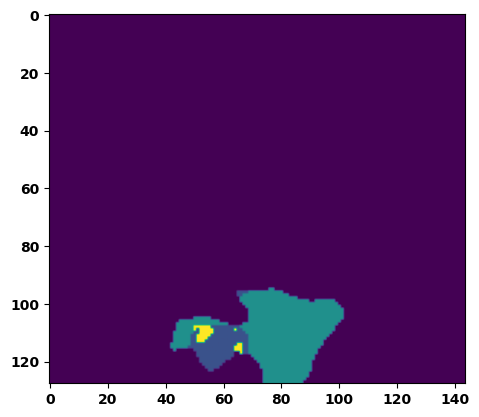

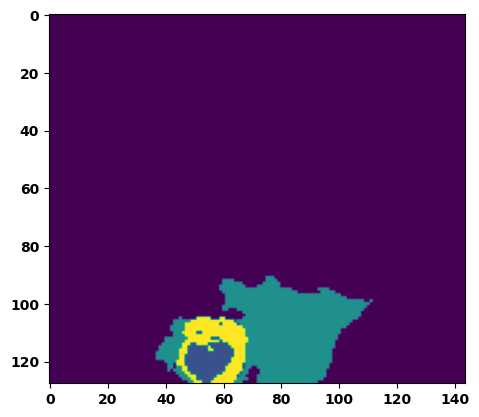

  6%|▌         | 2/36 [00:02<00:49,  1.46s/it]

Batch_id:  1 Eval loss:  0.5740735530853271
Batch_id:  1 Eval IoU:  tensor(0.3728, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9008, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8665, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9307, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.51s/it]

Batch_id:  2 Eval loss:  0.5063796043395996
Batch_id:  2 Eval IoU:  tensor(0.4036, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9921, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.44s/it]

Batch_id:  3 Eval loss:  0.6700442433357239
Batch_id:  3 Eval IoU:  tensor(0.2126, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6214, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4477, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.5376, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9021, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.42s/it]

Batch_id:  4 Eval loss:  0.7611509561538696
Batch_id:  4 Eval IoU:  tensor(0.2273, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9122, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9067, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:45,  1.52s/it]

Batch_id:  5 Eval loss:  0.5484054684638977
Batch_id:  5 Eval IoU:  tensor(0.4135, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9141, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:43,  1.49s/it]

Batch_id:  6 Eval loss:  0.3892570734024048
Batch_id:  6 Eval IoU:  tensor(0.4996, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.42s/it]

Batch_id:  7 Eval loss:  0.6538651585578918
Batch_id:  7 Eval IoU:  tensor(0.3011, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:37,  1.41s/it]

Batch_id:  8 Eval loss:  0.2925407886505127
Batch_id:  8 Eval IoU:  tensor(0.6142, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9879, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.42s/it]

Batch_id:  9 Eval loss:  0.5338470935821533
Batch_id:  9 Eval IoU:  tensor(0.3480, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.7813, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7554, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9231, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.6784, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  10 Eval loss:  0.6799185276031494
Batch_id:  10 Eval IoU:  tensor(0.2770, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


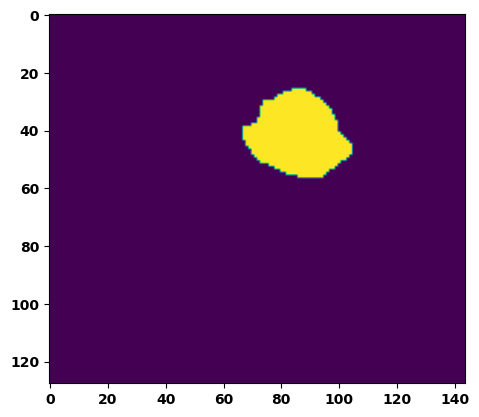

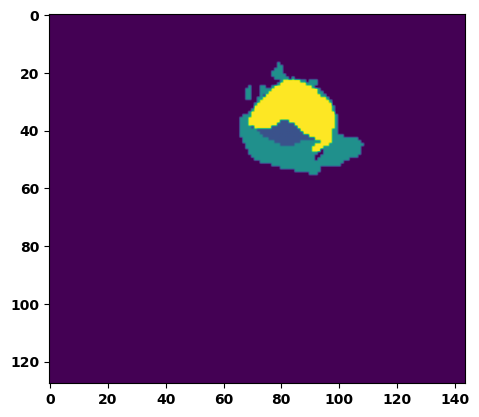

 33%|███▎      | 12/36 [00:17<00:33,  1.41s/it]

Batch_id:  11 Eval loss:  0.7512161731719971
Batch_id:  11 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.46s/it]

Batch_id:  12 Eval loss:  0.6952595710754395
Batch_id:  12 Eval IoU:  tensor(0.2132, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.5429, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3787, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.3247, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.47s/it]

Batch_id:  13 Eval loss:  0.5314481854438782
Batch_id:  13 Eval IoU:  tensor(0.3419, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7695, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.6784, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.6719, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9766, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.43s/it]

Batch_id:  14 Eval loss:  0.7678262591362
Batch_id:  14 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.49s/it]

Batch_id:  15 Eval loss:  0.20859843492507935
Batch_id:  15 Eval IoU:  tensor(0.7158, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.44s/it]

Batch_id:  16 Eval loss:  0.6866835951805115
Batch_id:  16 Eval IoU:  tensor(0.2466, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7846, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.7457, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8548, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8097, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:25,  1.42s/it]

Batch_id:  17 Eval loss:  0.23688121140003204
Batch_id:  17 Eval IoU:  tensor(0.6879, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.45s/it]

Batch_id:  18 Eval loss:  0.6475691795349121
Batch_id:  18 Eval IoU:  tensor(0.2505, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.5207, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.3158, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.4438, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.8473, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.47s/it]

Batch_id:  19 Eval loss:  0.8873224258422852
Batch_id:  19 Eval IoU:  tensor(0.0657, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.5005, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.2552, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.2512, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Eval loss:  0.7743524312973022
Batch_id:  20 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


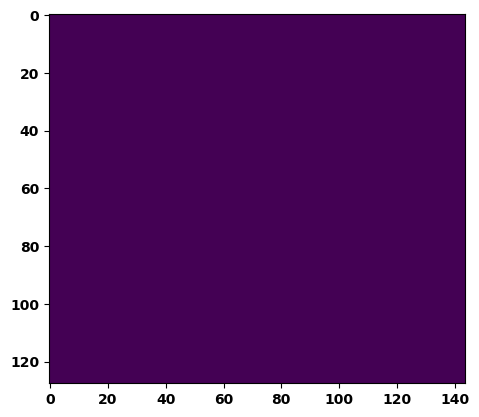

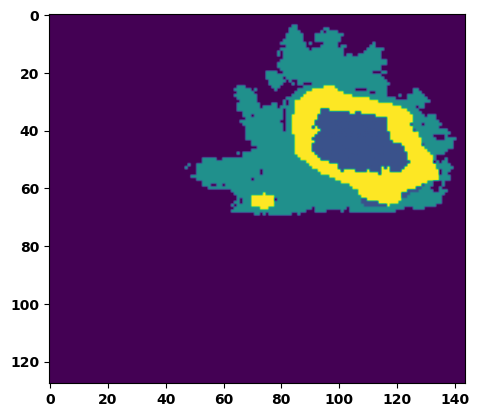

 61%|██████    | 22/36 [00:32<00:21,  1.51s/it]

Batch_id:  21 Eval loss:  0.6468257308006287
Batch_id:  21 Eval IoU:  tensor(0.3001, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9137, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8880, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.8748, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.47s/it]

Batch_id:  22 Eval loss:  0.758701503276825
Batch_id:  22 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.47s/it]

Batch_id:  23 Eval loss:  0.11753204464912415
Batch_id:  23 Eval IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.51s/it]

Batch_id:  24 Eval loss:  0.6459265351295471
Batch_id:  24 Eval IoU:  tensor(0.3135, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9031, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8715, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.8762, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:15,  1.54s/it]

Batch_id:  25 Eval loss:  0.7565293908119202
Batch_id:  25 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.51s/it]

Batch_id:  26 Eval loss:  0.62847501039505
Batch_id:  26 Eval IoU:  tensor(0.3148, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9005, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8825, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9379, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9359, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9452, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:12,  1.51s/it]

Batch_id:  27 Eval loss:  0.7091445326805115
Batch_id:  27 Eval IoU:  tensor(0.2646, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9708, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.52s/it]

Batch_id:  28 Eval loss:  0.6588704586029053
Batch_id:  28 Eval IoU:  tensor(0.2866, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.48s/it]

Batch_id:  29 Eval loss:  0.5772335529327393
Batch_id:  29 Eval IoU:  tensor(0.3775, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  30 Eval loss:  0.2986775040626526
Batch_id:  30 Eval IoU:  tensor(0.5918, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')


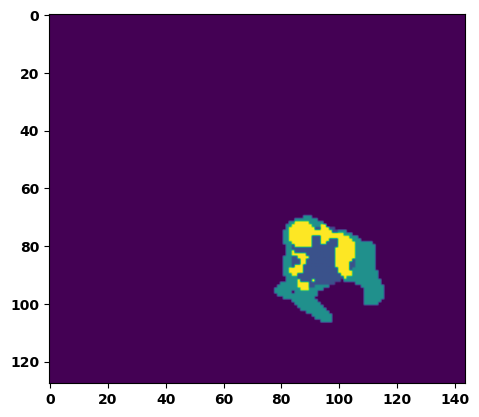

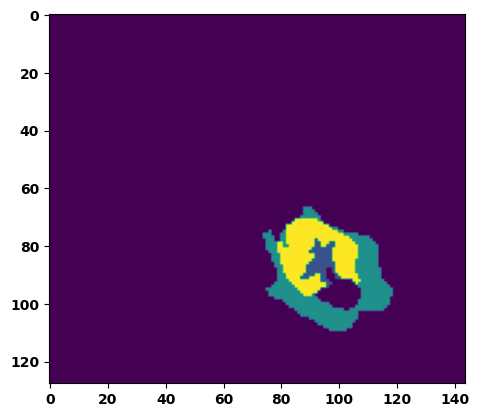

 89%|████████▉ | 32/36 [00:47<00:06,  1.54s/it]

Batch_id:  31 Eval loss:  0.8969124555587769
Batch_id:  31 Eval IoU:  tensor(0.0599, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.4613, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3353, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9016, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.1946, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.59s/it]

Batch_id:  32 Eval loss:  0.8820539116859436
Batch_id:  32 Eval IoU:  tensor(0.0752, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.4965, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4189, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9036, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2458, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:03,  1.54s/it]

Batch_id:  33 Eval loss:  0.21119725704193115
Batch_id:  33 Eval IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9812, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.52s/it]

Batch_id:  34 Eval loss:  0.567255437374115
Batch_id:  34 Eval IoU:  tensor(0.3861, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9323, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.49s/it]

Batch_id:  35 Eval loss:  0.661971926689148
Batch_id:  35 Eval IoU:  tensor(0.2910, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')
Epoch  11 Training loss:  0.1924581297419288
Epoch  11 Evaluation loss:  0.5887180579205354
Epoch  11 Training accuracy :  tensor(0.7398)
Epoch  11 Evaluation accuracy :  tensor(0.3494)
Epoch  11 Training Mean Dice Score:  tensor(0.9776)
Epoch  11 Eval Mean Dice Score:  tensor(0.8639)
Epoch  11 Training Non-tumor Dice Score:  tensor(0.9788)
Epoch  11 Eval Non-tumor Dice Score:  tensor(0.8220)
Epoch  11 Training NCR/NET Dice Score:  tensor(0.9890)
Epoch  11 Eval NCR/NET Dice Score:  tensor(0.9647)
Epoch  11 Training ED Dice Score:  tensor(0.9761

Epoch: 12
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.52s/it]

Batch_id:  0 Training loss:  0.11792917549610138
Batch_id:  0 Training IoU:  tensor(0.8088, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:37,  1.46s/it]

Batch_id:  1 Training loss:  0.29488882422447205
Batch_id:  1 Training IoU:  tensor(0.6453, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:42,  1.52s/it]

Batch_id:  2 Training loss:  0.3123094141483307
Batch_id:  2 Training IoU:  tensor(0.6387, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:40,  1.51s/it]

Batch_id:  3 Training loss:  0.16100044548511505
Batch_id:  3 Training IoU:  tensor(0.7868, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:37,  1.50s/it]

Batch_id:  4 Training loss:  0.08082793653011322
Batch_id:  4 Training IoU:  tensor(0.8712, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:37,  1.51s/it]

Batch_id:  5 Training loss:  0.1823970526456833
Batch_id:  5 Training IoU:  tensor(0.7250, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.2838437557220459
Batch_id:  6 Training IoU:  tensor(0.6096, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:30,  1.48s/it]

Batch_id:  7 Training loss:  0.5219507217407227
Batch_id:  7 Training IoU:  tensor(0.3947, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:30,  1.49s/it]

Batch_id:  8 Training loss:  0.3180375397205353
Batch_id:  8 Training IoU:  tensor(0.6002, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:37,  1.57s/it]

Batch_id:  9 Training loss:  0.16825616359710693
Batch_id:  9 Training IoU:  tensor(0.7858, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 10%|█         | 11/110 [00:16<02:34,  1.56s/it]

Batch_id:  10 Training loss:  0.09576350450515747
Batch_id:  10 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 11%|█         | 12/110 [00:18<02:31,  1.55s/it]

Batch_id:  11 Training loss:  0.12947219610214233
Batch_id:  11 Training IoU:  tensor(0.7946, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:27,  1.52s/it]

Batch_id:  12 Training loss:  0.21123258769512177
Batch_id:  12 Training IoU:  tensor(0.6963, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:28,  1.55s/it]

Batch_id:  13 Training loss:  0.09404931962490082
Batch_id:  13 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:24,  1.52s/it]

Batch_id:  14 Training loss:  0.12783865630626678
Batch_id:  14 Training IoU:  tensor(0.7994, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:22,  1.51s/it]

Batch_id:  15 Training loss:  0.09437951445579529
Batch_id:  15 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:21,  1.52s/it]

Batch_id:  16 Training loss:  0.27141106128692627
Batch_id:  16 Training IoU:  tensor(0.6784, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:22,  1.55s/it]

Batch_id:  17 Training loss:  0.26433852314949036
Batch_id:  17 Training IoU:  tensor(0.6403, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9560, device='cuda:0')


 17%|█▋        | 19/110 [00:29<02:23,  1.58s/it]

Batch_id:  18 Training loss:  0.2851783037185669
Batch_id:  18 Training IoU:  tensor(0.6761, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:20,  1.56s/it]

Batch_id:  19 Training loss:  0.20558708906173706
Batch_id:  19 Training IoU:  tensor(0.7107, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:18,  1.56s/it]

Batch_id:  20 Training loss:  0.115241140127182
Batch_id:  20 Training IoU:  tensor(0.8239, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 20%|██        | 22/110 [00:33<02:15,  1.54s/it]

Batch_id:  21 Training loss:  0.15372945368289948
Batch_id:  21 Training IoU:  tensor(0.7541, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 21%|██        | 23/110 [00:35<02:12,  1.52s/it]

Batch_id:  22 Training loss:  0.16928505897521973
Batch_id:  22 Training IoU:  tensor(0.7431, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:10,  1.52s/it]

Batch_id:  23 Training loss:  0.07226380705833435
Batch_id:  23 Training IoU:  tensor(0.8836, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 23%|██▎       | 25/110 [00:38<02:06,  1.49s/it]

Batch_id:  24 Training loss:  0.35481831431388855
Batch_id:  24 Training IoU:  tensor(0.5506, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9596, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:03,  1.48s/it]

Batch_id:  25 Training loss:  0.16664248704910278
Batch_id:  25 Training IoU:  tensor(0.7648, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:01,  1.47s/it]

Batch_id:  26 Training loss:  0.3388821482658386
Batch_id:  26 Training IoU:  tensor(0.6101, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:01,  1.48s/it]

Batch_id:  27 Training loss:  0.06588289141654968
Batch_id:  27 Training IoU:  tensor(0.9016, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:01,  1.49s/it]

Batch_id:  28 Training loss:  0.16728058457374573
Batch_id:  28 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:00,  1.50s/it]

Batch_id:  29 Training loss:  0.1183263510465622
Batch_id:  29 Training IoU:  tensor(0.8312, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:56,  1.47s/it]

Batch_id:  30 Training loss:  0.22007785737514496
Batch_id:  30 Training IoU:  tensor(0.7639, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 29%|██▉       | 32/110 [00:48<01:58,  1.52s/it]

Batch_id:  31 Training loss:  0.12117449939250946
Batch_id:  31 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 30%|███       | 33/110 [00:50<01:57,  1.53s/it]

Batch_id:  32 Training loss:  0.09844087064266205
Batch_id:  32 Training IoU:  tensor(0.8443, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 31%|███       | 34/110 [00:51<01:55,  1.52s/it]

Batch_id:  33 Training loss:  0.08308354020118713
Batch_id:  33 Training IoU:  tensor(0.8728, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.08649741113185883
Batch_id:  34 Training IoU:  tensor(0.8613, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:48,  1.46s/it]

Batch_id:  35 Training loss:  0.1814248263835907
Batch_id:  35 Training IoU:  tensor(0.7457, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:47,  1.47s/it]

Batch_id:  36 Training loss:  0.1415160596370697
Batch_id:  36 Training IoU:  tensor(0.7788, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.16491906344890594
Batch_id:  37 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:41,  1.43s/it]

Batch_id:  38 Training loss:  0.1436724215745926
Batch_id:  38 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:38,  1.41s/it]

Batch_id:  39 Training loss:  0.18871688842773438
Batch_id:  39 Training IoU:  tensor(0.7351, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:38,  1.42s/it]

Batch_id:  40 Training loss:  0.2828584313392639
Batch_id:  40 Training IoU:  tensor(0.6710, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:33,  1.37s/it]

Batch_id:  41 Training loss:  0.15801844000816345
Batch_id:  41 Training IoU:  tensor(0.7455, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9719, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:34,  1.41s/it]

Batch_id:  42 Training loss:  0.30604955554008484
Batch_id:  42 Training IoU:  tensor(0.6282, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 40%|████      | 44/110 [01:05<01:32,  1.41s/it]

Batch_id:  43 Training loss:  0.07146356999874115
Batch_id:  43 Training IoU:  tensor(0.8890, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 41%|████      | 45/110 [01:06<01:28,  1.37s/it]

Batch_id:  44 Training loss:  0.0834360271692276
Batch_id:  44 Training IoU:  tensor(0.8724, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:30,  1.41s/it]

Batch_id:  45 Training loss:  0.511106550693512
Batch_id:  45 Training IoU:  tensor(0.3972, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9110, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9498, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:28,  1.40s/it]

Batch_id:  46 Training loss:  0.22808851301670074
Batch_id:  46 Training IoU:  tensor(0.6618, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9372, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9221, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:27,  1.41s/it]

Batch_id:  47 Training loss:  0.0961710512638092
Batch_id:  47 Training IoU:  tensor(0.8466, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:27,  1.44s/it]

Batch_id:  48 Training loss:  0.30752667784690857
Batch_id:  48 Training IoU:  tensor(0.6363, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:28,  1.48s/it]

Batch_id:  49 Training loss:  0.19180543720722198
Batch_id:  49 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:26,  1.47s/it]

Batch_id:  50 Training loss:  0.16308465600013733
Batch_id:  50 Training IoU:  tensor(0.7617, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:25,  1.47s/it]

Batch_id:  51 Training loss:  0.14662446081638336
Batch_id:  51 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:22,  1.45s/it]

Batch_id:  52 Training loss:  0.1404968798160553
Batch_id:  52 Training IoU:  tensor(0.7963, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:19,  1.43s/it]

Batch_id:  53 Training loss:  0.17282734811306
Batch_id:  53 Training IoU:  tensor(0.7372, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:15,  1.38s/it]

Batch_id:  54 Training loss:  0.1648140549659729
Batch_id:  54 Training IoU:  tensor(0.7461, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:14,  1.39s/it]

Batch_id:  55 Training loss:  0.1311861276626587
Batch_id:  55 Training IoU:  tensor(0.8149, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:13,  1.39s/it]

Batch_id:  56 Training loss:  0.11562967300415039
Batch_id:  56 Training IoU:  tensor(0.8100, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:11,  1.38s/it]

Batch_id:  57 Training loss:  0.2247595489025116
Batch_id:  57 Training IoU:  tensor(0.6872, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:10,  1.37s/it]

Batch_id:  58 Training loss:  0.2642248868942261
Batch_id:  58 Training IoU:  tensor(0.6855, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:08,  1.38s/it]

Batch_id:  59 Training loss:  0.12652334570884705
Batch_id:  59 Training IoU:  tensor(0.7954, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:06,  1.37s/it]

Batch_id:  60 Training loss:  0.2005482017993927
Batch_id:  60 Training IoU:  tensor(0.7038, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:04,  1.34s/it]

Batch_id:  61 Training loss:  0.25774306058883667
Batch_id:  61 Training IoU:  tensor(0.6433, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:02,  1.33s/it]

Batch_id:  62 Training loss:  0.39449185132980347
Batch_id:  62 Training IoU:  tensor(0.5284, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:02,  1.36s/it]

Batch_id:  63 Training loss:  0.4009602665901184
Batch_id:  63 Training IoU:  tensor(0.5052, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9709, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:05,  1.45s/it]

Batch_id:  64 Training loss:  0.12687243521213531
Batch_id:  64 Training IoU:  tensor(0.7890, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:03,  1.45s/it]

Batch_id:  65 Training loss:  0.17167866230010986
Batch_id:  65 Training IoU:  tensor(0.7313, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:00,  1.41s/it]

Batch_id:  66 Training loss:  0.14262966811656952
Batch_id:  66 Training IoU:  tensor(0.7893, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<00:58,  1.40s/it]

Batch_id:  67 Training loss:  0.1026143878698349
Batch_id:  67 Training IoU:  tensor(0.8381, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<00:56,  1.37s/it]

Batch_id:  68 Training loss:  0.15710048377513885
Batch_id:  68 Training IoU:  tensor(0.7520, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:55,  1.40s/it]

Batch_id:  69 Training loss:  0.07973179221153259
Batch_id:  69 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:54,  1.40s/it]

Batch_id:  70 Training loss:  0.13113000988960266
Batch_id:  70 Training IoU:  tensor(0.7936, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:55,  1.47s/it]

Batch_id:  71 Training loss:  0.07562154531478882
Batch_id:  71 Training IoU:  tensor(0.8787, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:58,  1.59s/it]

Batch_id:  72 Training loss:  0.07973773777484894
Batch_id:  72 Training IoU:  tensor(0.8759, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:54,  1.51s/it]

Batch_id:  73 Training loss:  0.3167727589607239
Batch_id:  73 Training IoU:  tensor(0.5605, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9729, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:50,  1.45s/it]

Batch_id:  74 Training loss:  0.27315348386764526
Batch_id:  74 Training IoU:  tensor(0.6472, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:49,  1.45s/it]

Batch_id:  75 Training loss:  0.2241654247045517
Batch_id:  75 Training IoU:  tensor(0.6792, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9512, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.23248089849948883
Batch_id:  76 Training IoU:  tensor(0.6804, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:46,  1.44s/it]

Batch_id:  77 Training loss:  0.11106590926647186
Batch_id:  77 Training IoU:  tensor(0.8272, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:44,  1.45s/it]

Batch_id:  78 Training loss:  0.15290337800979614
Batch_id:  78 Training IoU:  tensor(0.7709, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:42,  1.42s/it]

Batch_id:  79 Training loss:  0.17688368260860443
Batch_id:  79 Training IoU:  tensor(0.7299, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:41,  1.44s/it]

Batch_id:  80 Training loss:  0.25067710876464844
Batch_id:  80 Training IoU:  tensor(0.6566, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:40,  1.43s/it]

Batch_id:  81 Training loss:  0.21977315843105316
Batch_id:  81 Training IoU:  tensor(0.7219, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:38,  1.43s/it]

Batch_id:  82 Training loss:  0.12660232186317444
Batch_id:  82 Training IoU:  tensor(0.8484, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:37,  1.45s/it]

Batch_id:  83 Training loss:  0.09903961420059204
Batch_id:  83 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:37,  1.51s/it]

Batch_id:  84 Training loss:  0.1063658595085144
Batch_id:  84 Training IoU:  tensor(0.8353, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:36,  1.50s/it]

Batch_id:  85 Training loss:  0.3015173673629761
Batch_id:  85 Training IoU:  tensor(0.6200, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:33,  1.44s/it]

Batch_id:  86 Training loss:  0.12133464217185974
Batch_id:  86 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 80%|████████  | 88/110 [02:08<00:31,  1.42s/it]

Batch_id:  87 Training loss:  0.14621961116790771
Batch_id:  87 Training IoU:  tensor(0.9245, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:30,  1.44s/it]

Batch_id:  88 Training loss:  0.361187219619751
Batch_id:  88 Training IoU:  tensor(0.5579, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:28,  1.43s/it]

Batch_id:  89 Training loss:  0.19300960004329681
Batch_id:  89 Training IoU:  tensor(0.7089, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.21866324543952942
Batch_id:  90 Training IoU:  tensor(0.6718, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9705, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.14719770848751068
Batch_id:  91 Training IoU:  tensor(0.8012, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:25,  1.47s/it]

Batch_id:  92 Training loss:  0.23205679655075073
Batch_id:  92 Training IoU:  tensor(0.6708, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:23,  1.45s/it]

Batch_id:  93 Training loss:  0.25561636686325073
Batch_id:  93 Training IoU:  tensor(0.6320, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:21,  1.45s/it]

Batch_id:  94 Training loss:  0.16560491919517517
Batch_id:  94 Training IoU:  tensor(0.7917, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:19,  1.43s/it]

Batch_id:  95 Training loss:  0.10742776095867157
Batch_id:  95 Training IoU:  tensor(0.8243, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:18,  1.39s/it]

Batch_id:  96 Training loss:  0.13592790067195892
Batch_id:  96 Training IoU:  tensor(0.7888, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:16,  1.37s/it]

Batch_id:  97 Training loss:  0.4827486276626587
Batch_id:  97 Training IoU:  tensor(0.4228, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 90%|█████████ | 99/110 [02:23<00:15,  1.37s/it]

Batch_id:  98 Training loss:  0.1823766678571701
Batch_id:  98 Training IoU:  tensor(0.7202, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9696, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:14,  1.42s/it]

Batch_id:  99 Training loss:  0.19060370326042175
Batch_id:  99 Training IoU:  tensor(0.7332, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 92%|█████████▏| 101/110 [02:26<00:12,  1.44s/it]

Batch_id:  100 Training loss:  0.21743595600128174
Batch_id:  100 Training IoU:  tensor(0.6755, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 93%|█████████▎| 102/110 [02:28<00:11,  1.45s/it]

Batch_id:  101 Training loss:  0.06556443870067596
Batch_id:  101 Training IoU:  tensor(0.8966, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.51s/it]

Batch_id:  102 Training loss:  0.04470433294773102
Batch_id:  102 Training IoU:  tensor(0.9299, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 95%|█████████▍| 104/110 [02:31<00:09,  1.52s/it]

Batch_id:  103 Training loss:  0.3221992254257202
Batch_id:  103 Training IoU:  tensor(0.5890, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.48s/it]

Batch_id:  104 Training loss:  0.0894869863986969
Batch_id:  104 Training IoU:  tensor(0.8546, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 96%|█████████▋| 106/110 [02:34<00:05,  1.45s/it]

Batch_id:  105 Training loss:  0.24107402563095093
Batch_id:  105 Training IoU:  tensor(0.6440, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


 97%|█████████▋| 107/110 [02:35<00:04,  1.42s/it]

Batch_id:  106 Training loss:  0.10037046670913696
Batch_id:  106 Training IoU:  tensor(0.8379, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:02,  1.41s/it]

Batch_id:  107 Training loss:  0.18521751463413239
Batch_id:  107 Training IoU:  tensor(0.7121, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 99%|█████████▉| 109/110 [02:38<00:01,  1.40s/it]

Batch_id:  108 Training loss:  0.07814270257949829
Batch_id:  108 Training IoU:  tensor(0.8684, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


100%|██████████| 110/110 [02:40<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.30338114500045776
Batch_id:  109 Training IoU:  tensor(0.6340, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9948, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6038213968276978
Batch_id:  0 Eval IoU:  tensor(0.3468, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


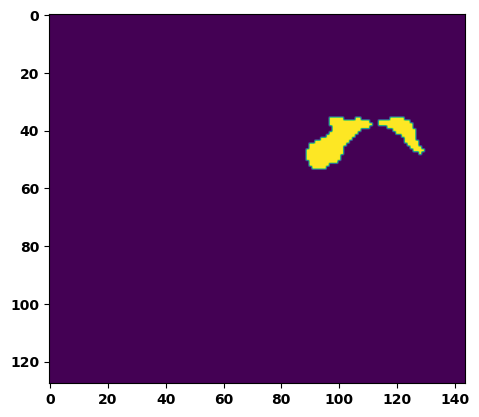

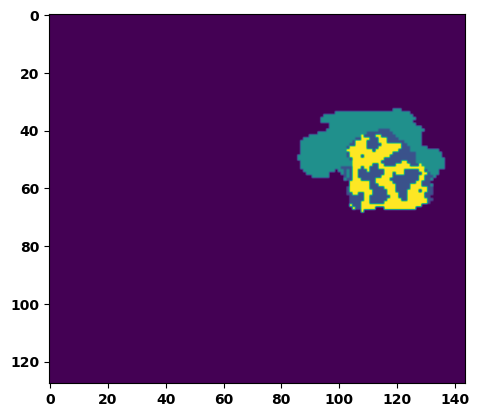

  6%|▌         | 2/36 [00:03<00:54,  1.61s/it]

Batch_id:  1 Eval loss:  0.1988414078950882
Batch_id:  1 Eval IoU:  tensor(0.6942, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9672, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:47,  1.45s/it]

Batch_id:  2 Eval loss:  0.5536662340164185
Batch_id:  2 Eval IoU:  tensor(0.3885, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9054, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8725, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9289, device='cuda:0')


 11%|█         | 4/36 [00:05<00:47,  1.48s/it]

Batch_id:  3 Eval loss:  0.761020839214325
Batch_id:  3 Eval IoU:  tensor(0.2274, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9128, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.39s/it]

Batch_id:  4 Eval loss:  0.4302322268486023
Batch_id:  4 Eval IoU:  tensor(0.4944, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9396, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9240, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.37s/it]

Batch_id:  5 Eval loss:  0.6784233450889587
Batch_id:  5 Eval IoU:  tensor(0.2256, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5794, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4383, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.4046, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:39,  1.38s/it]

Batch_id:  6 Eval loss:  0.898939847946167
Batch_id:  6 Eval IoU:  tensor(0.0588, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.4597, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3330, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9018, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.1924, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.39s/it]

Batch_id:  7 Eval loss:  0.7688040733337402
Batch_id:  7 Eval IoU:  tensor(0.1652, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.5134, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.2730, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.2728, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.37s/it]

Batch_id:  8 Eval loss:  0.7746227979660034
Batch_id:  8 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.42s/it]

Batch_id:  9 Eval loss:  0.1829279214143753
Batch_id:  9 Eval IoU:  tensor(0.7583, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  10 Eval loss:  0.6257571578025818
Batch_id:  10 Eval IoU:  tensor(0.3247, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


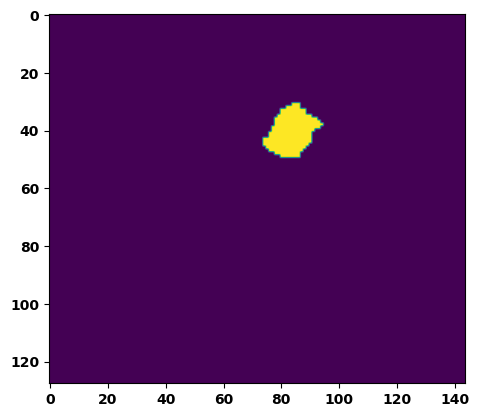

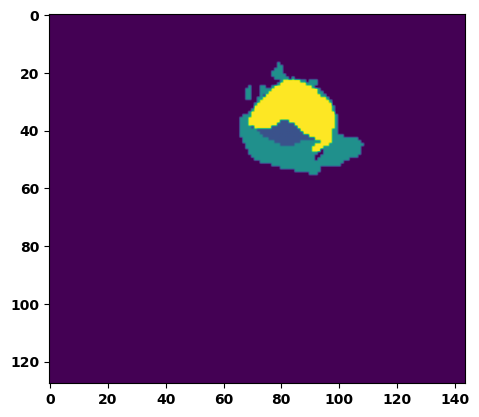

 33%|███▎      | 12/36 [00:17<00:37,  1.55s/it]

Batch_id:  11 Eval loss:  0.46305713057518005
Batch_id:  11 Eval IoU:  tensor(0.4609, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9801, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.54s/it]

Batch_id:  12 Eval loss:  0.458776593208313
Batch_id:  12 Eval IoU:  tensor(0.4384, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7836, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.6846, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.6809, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9913, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:34,  1.56s/it]

Batch_id:  13 Eval loss:  0.5590552687644958
Batch_id:  13 Eval IoU:  tensor(0.4008, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:32,  1.53s/it]

Batch_id:  14 Eval loss:  0.22563433647155762
Batch_id:  14 Eval IoU:  tensor(0.6753, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:31,  1.56s/it]

Batch_id:  15 Eval loss:  0.7565385103225708
Batch_id:  15 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:29,  1.56s/it]

Batch_id:  16 Eval loss:  0.3707538843154907
Batch_id:  16 Eval IoU:  tensor(0.5367, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:27,  1.51s/it]

Batch_id:  17 Eval loss:  0.4960113763809204
Batch_id:  17 Eval IoU:  tensor(0.4063, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8340, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8159, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9374, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.7733, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9754, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:25,  1.48s/it]

Batch_id:  18 Eval loss:  0.7679228782653809
Batch_id:  18 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.45s/it]

Batch_id:  19 Eval loss:  0.7189447283744812
Batch_id:  19 Eval IoU:  tensor(0.2057, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.4978, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3094, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.3235, device='cuda:0')
Batch_id:  20 Eval loss:  0.4956936836242676
Batch_id:  20 Eval IoU:  tensor(0.4194, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9863, device='cuda:0')


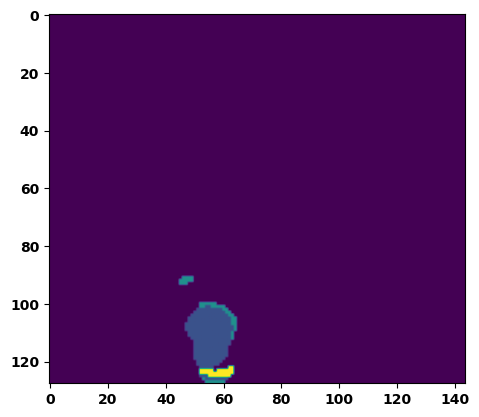

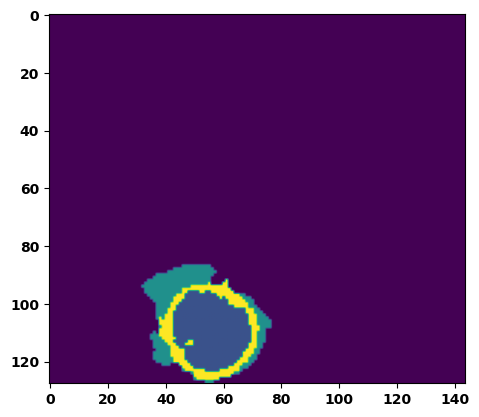

 61%|██████    | 22/36 [00:32<00:20,  1.46s/it]

Batch_id:  21 Eval loss:  0.2849419116973877
Batch_id:  21 Eval IoU:  tensor(0.6064, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.44s/it]

Batch_id:  22 Eval loss:  0.19625060260295868
Batch_id:  22 Eval IoU:  tensor(0.7108, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9863, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.44s/it]

Batch_id:  23 Eval loss:  0.6665542125701904
Batch_id:  23 Eval IoU:  tensor(0.2761, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8607, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.7929, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.17080824077129364
Batch_id:  24 Eval IoU:  tensor(0.7767, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.7482757568359375
Batch_id:  25 Eval IoU:  tensor(0.2136, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8703, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8055, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8597, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:12,  1.40s/it]

Batch_id:  26 Eval loss:  0.6405460238456726
Batch_id:  26 Eval IoU:  tensor(0.3136, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.41s/it]

Batch_id:  27 Eval loss:  0.5966927409172058
Batch_id:  27 Eval IoU:  tensor(0.3543, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9859, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:09,  1.39s/it]

Batch_id:  28 Eval loss:  0.7514941692352295
Batch_id:  28 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.09200286865234375
Batch_id:  29 Eval IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  30 Eval loss:  0.5881475210189819
Batch_id:  30 Eval IoU:  tensor(0.3610, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


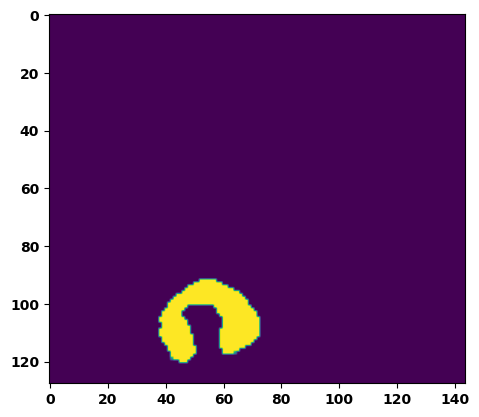

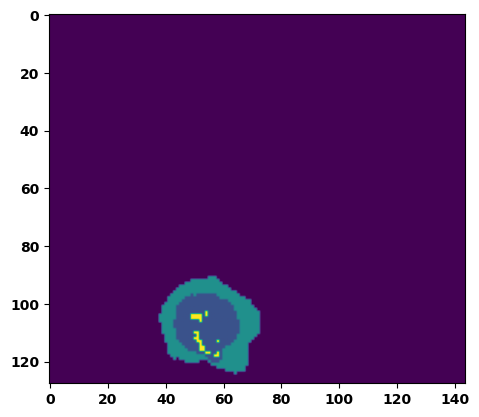

 89%|████████▉ | 32/36 [00:47<00:06,  1.58s/it]

Batch_id:  31 Eval loss:  0.676284909248352
Batch_id:  31 Eval IoU:  tensor(0.2354, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5451, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3760, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3305, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.50s/it]

Batch_id:  32 Eval loss:  0.8837820291519165
Batch_id:  32 Eval IoU:  tensor(0.0740, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.4940, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4153, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9194, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2437, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.43s/it]

Batch_id:  33 Eval loss:  0.7585998773574829
Batch_id:  33 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.39s/it]

Batch_id:  34 Eval loss:  0.2014734297990799
Batch_id:  34 Eval IoU:  tensor(0.7011, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9917, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.46s/it]

Batch_id:  35 Eval loss:  0.4718526303768158
Batch_id:  35 Eval IoU:  tensor(0.4211, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9493, device='cuda:0')
Epoch 00013: reducing learning rate of group 0 to 2.5000e-04.
Epoch  12 Training loss:  0.1887188666246154
Epoch  12 Evaluation loss:  0.5421431267427074
Epoch  12 Training accuracy :  tensor(0.7419)
Epoch  12 Evaluation accuracy :  tensor(0.3956)
Epoch  12 Training Mean Dice Score:  tensor(0.9775)
Epoch  12 Eval Mean Dice Score:  tensor(0.8721)
Epoch  12 Training Non-tumor Dice Score:  tensor(0.9785)
Epoch  12 Eval Non-tumor Dice Score:  tensor(0.8331)
Epoch  12 Training NCR/NET Dice Score:  tensor(0.9894)
Epoch  12 Eval NCR/NET Dice Score:  

Epoch completed and model successfully saved
Epoch: 13
Training in session: 


  1%|          | 1/110 [00:01<02:43,  1.50s/it]

Batch_id:  0 Training loss:  0.09615063667297363
Batch_id:  0 Training IoU:  tensor(0.8444, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:47,  1.55s/it]

Batch_id:  1 Training loss:  0.36312755942344666
Batch_id:  1 Training IoU:  tensor(0.5616, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:41,  1.51s/it]

Batch_id:  2 Training loss:  0.06323057413101196
Batch_id:  2 Training IoU:  tensor(0.8990, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:50,  1.61s/it]

Batch_id:  3 Training loss:  0.15380260348320007
Batch_id:  3 Training IoU:  tensor(0.7933, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:44,  1.56s/it]

Batch_id:  4 Training loss:  0.16354182362556458
Batch_id:  4 Training IoU:  tensor(0.7760, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:39,  1.53s/it]

Batch_id:  5 Training loss:  0.21354132890701294
Batch_id:  5 Training IoU:  tensor(0.7236, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.14732418954372406
Batch_id:  6 Training IoU:  tensor(0.7836, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:31,  1.49s/it]

Batch_id:  7 Training loss:  0.08716067671775818
Batch_id:  7 Training IoU:  tensor(0.8587, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:30,  1.49s/it]

Batch_id:  8 Training loss:  0.1192704290151596
Batch_id:  8 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:27,  1.48s/it]

Batch_id:  9 Training loss:  0.24425531923770905
Batch_id:  9 Training IoU:  tensor(0.6940, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 10%|█         | 11/110 [00:16<02:25,  1.47s/it]

Batch_id:  10 Training loss:  0.06907570362091064
Batch_id:  10 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 11%|█         | 12/110 [00:17<02:22,  1.45s/it]

Batch_id:  11 Training loss:  0.11801230907440186
Batch_id:  11 Training IoU:  tensor(0.8079, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:22,  1.47s/it]

Batch_id:  12 Training loss:  0.32210251688957214
Batch_id:  12 Training IoU:  tensor(0.6123, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:22,  1.49s/it]

Batch_id:  13 Training loss:  0.20263725519180298
Batch_id:  13 Training IoU:  tensor(0.7232, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:22,  1.50s/it]

Batch_id:  14 Training loss:  0.29640617966651917
Batch_id:  14 Training IoU:  tensor(0.6679, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:24,  1.53s/it]

Batch_id:  15 Training loss:  0.11705653369426727
Batch_id:  15 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:20,  1.51s/it]

Batch_id:  16 Training loss:  0.13574014604091644
Batch_id:  16 Training IoU:  tensor(0.8482, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:18,  1.50s/it]

Batch_id:  17 Training loss:  0.227695494890213
Batch_id:  17 Training IoU:  tensor(0.7469, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:18,  1.52s/it]

Batch_id:  18 Training loss:  0.278153657913208
Batch_id:  18 Training IoU:  tensor(0.6468, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:15,  1.50s/it]

Batch_id:  19 Training loss:  0.16889025270938873
Batch_id:  19 Training IoU:  tensor(0.7411, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:14,  1.52s/it]

Batch_id:  20 Training loss:  0.13216935098171234
Batch_id:  20 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 20%|██        | 22/110 [00:33<02:11,  1.49s/it]

Batch_id:  21 Training loss:  0.14103250205516815
Batch_id:  21 Training IoU:  tensor(0.7720, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 21%|██        | 23/110 [00:34<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.189458966255188
Batch_id:  22 Training IoU:  tensor(0.7166, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:08,  1.49s/it]

Batch_id:  23 Training loss:  0.1653096079826355
Batch_id:  23 Training IoU:  tensor(0.7381, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:07,  1.50s/it]

Batch_id:  24 Training loss:  0.21213750541210175
Batch_id:  24 Training IoU:  tensor(0.6994, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:08,  1.53s/it]

Batch_id:  25 Training loss:  0.0899585634469986
Batch_id:  25 Training IoU:  tensor(0.8607, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:07,  1.53s/it]

Batch_id:  26 Training loss:  0.15722663700580597
Batch_id:  26 Training IoU:  tensor(0.7994, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:09,  1.57s/it]

Batch_id:  27 Training loss:  0.26900479197502136
Batch_id:  27 Training IoU:  tensor(0.6843, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:06,  1.56s/it]

Batch_id:  28 Training loss:  0.2779421806335449
Batch_id:  28 Training IoU:  tensor(0.6736, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:03,  1.55s/it]

Batch_id:  29 Training loss:  0.16282129287719727
Batch_id:  29 Training IoU:  tensor(0.8033, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 28%|██▊       | 31/110 [00:47<02:03,  1.57s/it]

Batch_id:  30 Training loss:  0.18123526871204376
Batch_id:  30 Training IoU:  tensor(0.7349, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 29%|██▉       | 32/110 [00:48<02:00,  1.55s/it]

Batch_id:  31 Training loss:  0.1505141258239746
Batch_id:  31 Training IoU:  tensor(0.7637, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 30%|███       | 33/110 [00:50<01:59,  1.55s/it]

Batch_id:  32 Training loss:  0.13235437870025635
Batch_id:  32 Training IoU:  tensor(0.7919, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 31%|███       | 34/110 [00:51<01:59,  1.57s/it]

Batch_id:  33 Training loss:  0.05002439022064209
Batch_id:  33 Training IoU:  tensor(0.9188, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 32%|███▏      | 35/110 [00:53<01:53,  1.52s/it]

Batch_id:  34 Training loss:  0.08718118071556091
Batch_id:  34 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:51,  1.51s/it]

Batch_id:  35 Training loss:  0.11222396790981293
Batch_id:  35 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:50,  1.51s/it]

Batch_id:  36 Training loss:  0.06476850807666779
Batch_id:  36 Training IoU:  tensor(0.8954, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:48,  1.50s/it]

Batch_id:  37 Training loss:  0.1352490931749344
Batch_id:  37 Training IoU:  tensor(0.7773, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:46,  1.50s/it]

Batch_id:  38 Training loss:  0.17537961900234222
Batch_id:  38 Training IoU:  tensor(0.7322, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9802, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:43,  1.48s/it]

Batch_id:  39 Training loss:  0.33413344621658325
Batch_id:  39 Training IoU:  tensor(0.6136, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:41,  1.47s/it]

Batch_id:  40 Training loss:  0.17262820899486542
Batch_id:  40 Training IoU:  tensor(0.7523, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:44,  1.53s/it]

Batch_id:  41 Training loss:  0.2530762553215027
Batch_id:  41 Training IoU:  tensor(0.6509, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9612, device='cuda:0')


 39%|███▉      | 43/110 [01:05<01:42,  1.53s/it]

Batch_id:  42 Training loss:  0.09327763319015503
Batch_id:  42 Training IoU:  tensor(0.8969, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 40%|████      | 44/110 [01:06<01:40,  1.52s/it]

Batch_id:  43 Training loss:  0.13729338347911835
Batch_id:  43 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 41%|████      | 45/110 [01:08<01:40,  1.55s/it]

Batch_id:  44 Training loss:  0.09458017349243164
Batch_id:  44 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:41,  1.58s/it]

Batch_id:  45 Training loss:  0.17664331197738647
Batch_id:  45 Training IoU:  tensor(0.7301, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:36,  1.52s/it]

Batch_id:  46 Training loss:  0.21763679385185242
Batch_id:  46 Training IoU:  tensor(0.6740, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9401, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9234, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:36,  1.55s/it]

Batch_id:  47 Training loss:  0.18213970959186554
Batch_id:  47 Training IoU:  tensor(0.7278, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 45%|████▍     | 49/110 [01:14<01:35,  1.56s/it]

Batch_id:  48 Training loss:  0.24307781457901
Batch_id:  48 Training IoU:  tensor(0.6697, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 45%|████▌     | 50/110 [01:16<01:33,  1.56s/it]

Batch_id:  49 Training loss:  0.15990974009037018
Batch_id:  49 Training IoU:  tensor(0.7531, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9710, device='cuda:0')


 46%|████▋     | 51/110 [01:17<01:31,  1.55s/it]

Batch_id:  50 Training loss:  0.12074416875839233
Batch_id:  50 Training IoU:  tensor(0.8149, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 47%|████▋     | 52/110 [01:19<01:30,  1.56s/it]

Batch_id:  51 Training loss:  0.18766558170318604
Batch_id:  51 Training IoU:  tensor(0.7381, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 48%|████▊     | 53/110 [01:20<01:25,  1.49s/it]

Batch_id:  52 Training loss:  0.341680645942688
Batch_id:  52 Training IoU:  tensor(0.5573, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 49%|████▉     | 54/110 [01:21<01:22,  1.48s/it]

Batch_id:  53 Training loss:  0.07458856701850891
Batch_id:  53 Training IoU:  tensor(0.8775, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 50%|█████     | 55/110 [01:23<01:22,  1.50s/it]

Batch_id:  54 Training loss:  0.08891883492469788
Batch_id:  54 Training IoU:  tensor(0.8610, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 51%|█████     | 56/110 [01:25<01:20,  1.49s/it]

Batch_id:  55 Training loss:  0.10615542531013489
Batch_id:  55 Training IoU:  tensor(0.8228, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 52%|█████▏    | 57/110 [01:26<01:16,  1.45s/it]

Batch_id:  56 Training loss:  0.16230304539203644
Batch_id:  56 Training IoU:  tensor(0.7915, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 53%|█████▎    | 58/110 [01:27<01:15,  1.46s/it]

Batch_id:  57 Training loss:  0.306465208530426
Batch_id:  57 Training IoU:  tensor(0.6349, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 54%|█████▎    | 59/110 [01:29<01:12,  1.43s/it]

Batch_id:  58 Training loss:  0.08562430739402771
Batch_id:  58 Training IoU:  tensor(0.8629, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 55%|█████▍    | 60/110 [01:30<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.3379148840904236
Batch_id:  59 Training IoU:  tensor(0.5803, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 55%|█████▌    | 61/110 [01:32<01:10,  1.44s/it]

Batch_id:  60 Training loss:  0.06283603608608246
Batch_id:  60 Training IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 56%|█████▋    | 62/110 [01:33<01:08,  1.42s/it]

Batch_id:  61 Training loss:  0.19777609407901764
Batch_id:  61 Training IoU:  tensor(0.7016, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 57%|█████▋    | 63/110 [01:35<01:08,  1.46s/it]

Batch_id:  62 Training loss:  0.10031101107597351
Batch_id:  62 Training IoU:  tensor(0.8397, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 58%|█████▊    | 64/110 [01:36<01:05,  1.42s/it]

Batch_id:  63 Training loss:  0.07228124141693115
Batch_id:  63 Training IoU:  tensor(0.8804, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:03,  1.41s/it]

Batch_id:  64 Training loss:  0.15222690999507904
Batch_id:  64 Training IoU:  tensor(0.8729, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 60%|██████    | 66/110 [01:39<01:04,  1.47s/it]

Batch_id:  65 Training loss:  0.14881780743598938
Batch_id:  65 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 61%|██████    | 67/110 [01:40<01:02,  1.45s/it]

Batch_id:  66 Training loss:  0.07278421521186829
Batch_id:  66 Training IoU:  tensor(0.8835, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 62%|██████▏   | 68/110 [01:42<01:01,  1.46s/it]

Batch_id:  67 Training loss:  0.12568451464176178
Batch_id:  67 Training IoU:  tensor(0.8096, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 63%|██████▎   | 69/110 [01:43<00:58,  1.43s/it]

Batch_id:  68 Training loss:  0.1155499815940857
Batch_id:  68 Training IoU:  tensor(0.8242, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 64%|██████▎   | 70/110 [01:44<00:56,  1.41s/it]

Batch_id:  69 Training loss:  0.3338026702404022
Batch_id:  69 Training IoU:  tensor(0.5978, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 65%|██████▍   | 71/110 [01:46<00:53,  1.38s/it]

Batch_id:  70 Training loss:  0.12287929654121399
Batch_id:  70 Training IoU:  tensor(0.7999, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 65%|██████▌   | 72/110 [01:47<00:52,  1.38s/it]

Batch_id:  71 Training loss:  0.10557688772678375
Batch_id:  71 Training IoU:  tensor(0.8346, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 66%|██████▋   | 73/110 [01:49<00:51,  1.39s/it]

Batch_id:  72 Training loss:  0.20720842480659485
Batch_id:  72 Training IoU:  tensor(0.6887, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 67%|██████▋   | 74/110 [01:50<00:49,  1.38s/it]

Batch_id:  73 Training loss:  0.16124729812145233
Batch_id:  73 Training IoU:  tensor(0.7439, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:49,  1.40s/it]

Batch_id:  74 Training loss:  0.07618314027786255
Batch_id:  74 Training IoU:  tensor(0.8778, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 69%|██████▉   | 76/110 [01:53<00:46,  1.38s/it]

Batch_id:  75 Training loss:  0.14089849591255188
Batch_id:  75 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:46,  1.40s/it]

Batch_id:  76 Training loss:  0.071864053606987
Batch_id:  76 Training IoU:  tensor(0.8848, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 71%|███████   | 78/110 [01:56<00:45,  1.41s/it]

Batch_id:  77 Training loss:  0.29749351739883423
Batch_id:  77 Training IoU:  tensor(0.5815, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9726, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:42,  1.38s/it]

Batch_id:  78 Training loss:  0.08059102296829224
Batch_id:  78 Training IoU:  tensor(0.8650, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:40,  1.36s/it]

Batch_id:  79 Training loss:  0.2898618280887604
Batch_id:  79 Training IoU:  tensor(0.6109, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:41,  1.44s/it]

Batch_id:  80 Training loss:  0.4727576971054077
Batch_id:  80 Training IoU:  tensor(0.4355, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9235, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9418, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9567, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:40,  1.43s/it]

Batch_id:  81 Training loss:  0.19700179994106293
Batch_id:  81 Training IoU:  tensor(0.7114, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:37,  1.39s/it]

Batch_id:  82 Training loss:  0.25243693590164185
Batch_id:  82 Training IoU:  tensor(0.7040, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:35,  1.38s/it]

Batch_id:  83 Training loss:  0.23052357137203217
Batch_id:  83 Training IoU:  tensor(0.6673, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:34,  1.37s/it]

Batch_id:  84 Training loss:  0.11771120131015778
Batch_id:  84 Training IoU:  tensor(0.8055, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:33,  1.39s/it]

Batch_id:  85 Training loss:  0.4338163137435913
Batch_id:  85 Training IoU:  tensor(0.4825, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:32,  1.41s/it]

Batch_id:  86 Training loss:  0.14700783789157867
Batch_id:  86 Training IoU:  tensor(0.7984, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:31,  1.43s/it]

Batch_id:  87 Training loss:  0.2876269221305847
Batch_id:  87 Training IoU:  tensor(0.6447, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 81%|████████  | 89/110 [02:11<00:30,  1.44s/it]

Batch_id:  88 Training loss:  0.06890028715133667
Batch_id:  88 Training IoU:  tensor(0.8826, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.14963313937187195
Batch_id:  89 Training IoU:  tensor(0.7747, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:27,  1.45s/it]

Batch_id:  90 Training loss:  0.2564055323600769
Batch_id:  90 Training IoU:  tensor(0.6396, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 84%|████████▎ | 92/110 [02:15<00:24,  1.39s/it]

Batch_id:  91 Training loss:  0.2138930857181549
Batch_id:  91 Training IoU:  tensor(0.6784, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 85%|████████▍ | 93/110 [02:17<00:24,  1.41s/it]

Batch_id:  92 Training loss:  0.1958523988723755
Batch_id:  92 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:22,  1.39s/it]

Batch_id:  93 Training loss:  0.08513659238815308
Batch_id:  93 Training IoU:  tensor(0.8585, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:21,  1.41s/it]

Batch_id:  94 Training loss:  0.3841598629951477
Batch_id:  94 Training IoU:  tensor(0.5052, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:20,  1.47s/it]

Batch_id:  95 Training loss:  0.3123285174369812
Batch_id:  95 Training IoU:  tensor(0.6048, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.45s/it]

Batch_id:  96 Training loss:  0.10170723497867584
Batch_id:  96 Training IoU:  tensor(0.8415, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:18,  1.53s/it]

Batch_id:  97 Training loss:  0.14664873480796814
Batch_id:  97 Training IoU:  tensor(0.7768, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:16,  1.48s/it]

Batch_id:  98 Training loss:  0.10651521384716034
Batch_id:  98 Training IoU:  tensor(0.8289, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:14,  1.49s/it]

Batch_id:  99 Training loss:  0.2063942700624466
Batch_id:  99 Training IoU:  tensor(0.6998, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9563, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.50s/it]

Batch_id:  100 Training loss:  0.17442065477371216
Batch_id:  100 Training IoU:  tensor(0.7473, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.43s/it]

Batch_id:  101 Training loss:  0.18530389666557312
Batch_id:  101 Training IoU:  tensor(0.7301, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.54s/it]

Batch_id:  102 Training loss:  0.29159611463546753
Batch_id:  102 Training IoU:  tensor(0.6579, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.47s/it]

Batch_id:  103 Training loss:  0.14657436311244965
Batch_id:  103 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.51s/it]

Batch_id:  104 Training loss:  0.13608907163143158
Batch_id:  104 Training IoU:  tensor(0.7916, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.11462222039699554
Batch_id:  105 Training IoU:  tensor(0.8103, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.45s/it]

Batch_id:  106 Training loss:  0.1993674784898758
Batch_id:  106 Training IoU:  tensor(0.6955, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9736, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.49s/it]

Batch_id:  107 Training loss:  0.09434676170349121
Batch_id:  107 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.46s/it]

Batch_id:  108 Training loss:  0.25184035301208496
Batch_id:  108 Training IoU:  tensor(0.6286, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9702, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.10636317729949951
Batch_id:  109 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9795, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.05751103162765503
Batch_id:  0 Eval IoU:  tensor(0.9015, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9913, device='cuda:0')


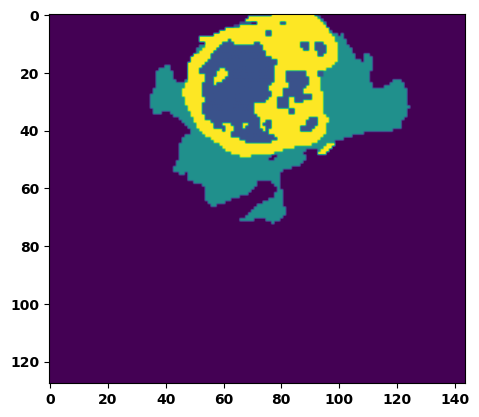

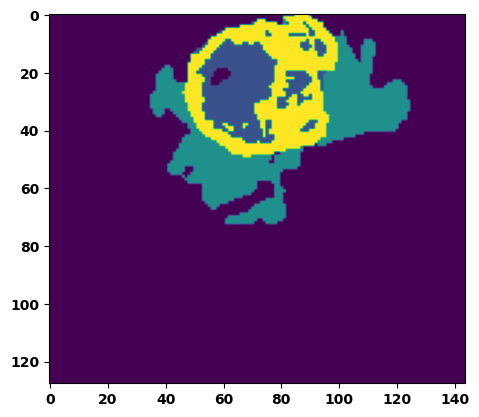

  6%|▌         | 2/36 [00:03<00:55,  1.64s/it]

Batch_id:  1 Eval loss:  0.4495425224304199
Batch_id:  1 Eval IoU:  tensor(0.4574, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7757, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.6673, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.6654, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:50,  1.53s/it]

Batch_id:  2 Eval loss:  0.4022948741912842
Batch_id:  2 Eval IoU:  tensor(0.5189, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9857, device='cuda:0')


 11%|█         | 4/36 [00:06<00:47,  1.49s/it]

Batch_id:  3 Eval loss:  0.7151248455047607
Batch_id:  3 Eval IoU:  tensor(0.2152, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7645, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.7145, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.6478, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9447, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.43s/it]

Batch_id:  4 Eval loss:  0.854712724685669
Batch_id:  4 Eval IoU:  tensor(0.0932, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5338, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4406, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8613, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3644, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.41s/it]

Batch_id:  5 Eval loss:  0.6707094311714172
Batch_id:  5 Eval IoU:  tensor(0.2825, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:38,  1.34s/it]

Batch_id:  6 Eval loss:  0.5480718016624451
Batch_id:  6 Eval IoU:  tensor(0.4151, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.45s/it]

Batch_id:  7 Eval loss:  0.5767130851745605
Batch_id:  7 Eval IoU:  tensor(0.3705, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9255, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8902, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.43s/it]

Batch_id:  8 Eval loss:  0.8840857744216919
Batch_id:  8 Eval IoU:  tensor(0.0735, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.4929, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.4136, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9202, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2406, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:35,  1.37s/it]

Batch_id:  9 Eval loss:  0.631718635559082
Batch_id:  9 Eval IoU:  tensor(0.3103, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval loss:  0.3803975582122803
Batch_id:  10 Eval IoU:  tensor(0.5135, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9943, device='cuda:0')


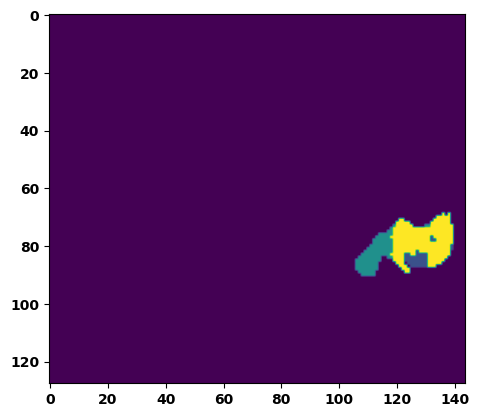

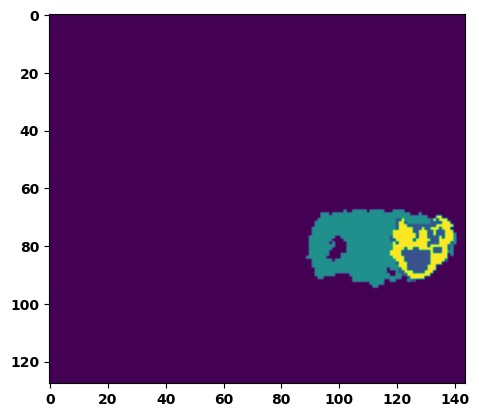

 33%|███▎      | 12/36 [00:17<00:35,  1.49s/it]

Batch_id:  11 Eval loss:  0.5435752868652344
Batch_id:  11 Eval IoU:  tensor(0.3941, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9056, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8698, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9304, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:34,  1.48s/it]

Batch_id:  12 Eval loss:  0.7562766671180725
Batch_id:  12 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.48s/it]

Batch_id:  13 Eval loss:  0.16792896389961243
Batch_id:  13 Eval IoU:  tensor(0.7666, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.7308124303817749
Batch_id:  14 Eval IoU:  tensor(0.1966, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.4855, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.3061, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2386, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:27,  1.39s/it]

Batch_id:  15 Eval loss:  0.15058694779872894
Batch_id:  15 Eval IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9941, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:25,  1.36s/it]

Batch_id:  16 Eval loss:  0.7515882849693298
Batch_id:  16 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.39s/it]

Batch_id:  17 Eval loss:  0.5933088064193726
Batch_id:  17 Eval IoU:  tensor(0.3632, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.42s/it]

Batch_id:  18 Eval loss:  0.2713238596916199
Batch_id:  18 Eval IoU:  tensor(0.6105, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.40s/it]

Batch_id:  19 Eval loss:  0.5593541860580444
Batch_id:  19 Eval IoU:  tensor(0.3491, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8336, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8190, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9032, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.8379, device='cuda:0')
Batch_id:  20 Eval loss:  0.6334342956542969
Batch_id:  20 Eval IoU:  tensor(0.3107, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9864, device='cuda:0')


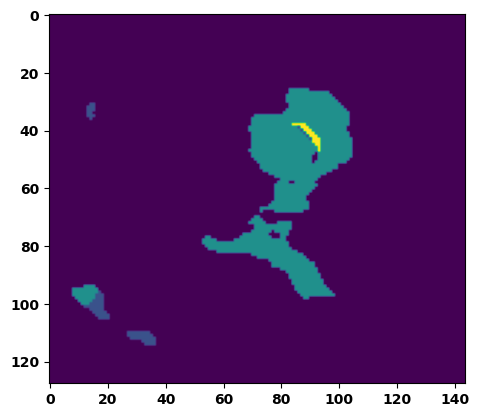

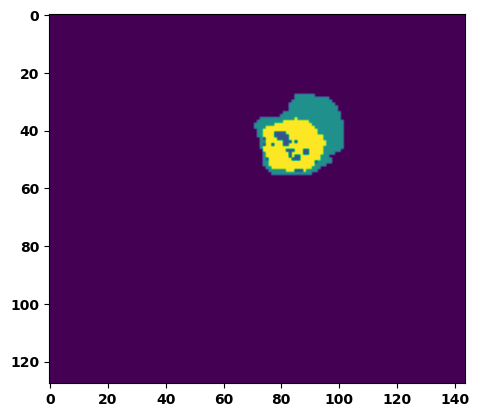

 61%|██████    | 22/36 [00:31<00:20,  1.45s/it]

Batch_id:  21 Eval loss:  0.728988528251648
Batch_id:  21 Eval IoU:  tensor(0.2491, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.43s/it]

Batch_id:  22 Eval loss:  0.5657286643981934
Batch_id:  22 Eval IoU:  tensor(0.3843, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9411, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9245, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.43s/it]

Batch_id:  23 Eval loss:  0.7746919989585876
Batch_id:  23 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.43s/it]

Batch_id:  24 Eval loss:  0.13010837137699127
Batch_id:  24 Eval IoU:  tensor(0.8271, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9977, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.902786135673523
Batch_id:  25 Eval IoU:  tensor(0.0572, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4604, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3344, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9018, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.1909, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.38s/it]

Batch_id:  26 Eval loss:  0.7231261730194092
Batch_id:  26 Eval IoU:  tensor(0.2488, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9223, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9084, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9752, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:10,  1.37s/it]

Batch_id:  27 Eval loss:  0.2853475511074066
Batch_id:  27 Eval IoU:  tensor(0.6041, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9486, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.40s/it]

Batch_id:  28 Eval loss:  0.7583550214767456
Batch_id:  28 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.39s/it]

Batch_id:  29 Eval loss:  0.768035888671875
Batch_id:  29 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  30 Eval loss:  0.38417527079582214
Batch_id:  30 Eval IoU:  tensor(0.5074, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9756, device='cuda:0')


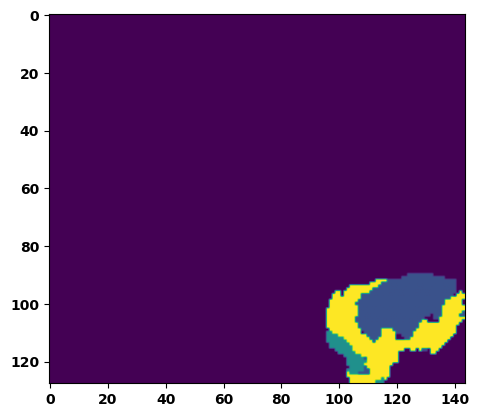

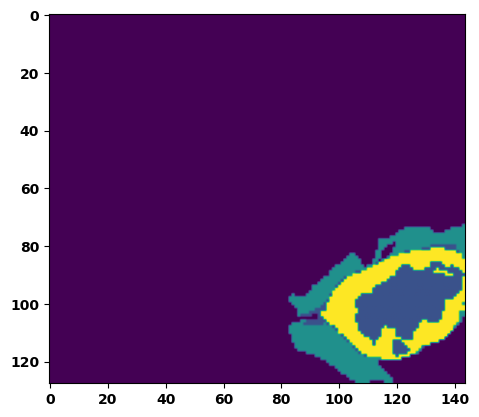

 89%|████████▉ | 32/36 [00:45<00:05,  1.40s/it]

Batch_id:  31 Eval loss:  0.8652503490447998
Batch_id:  31 Eval IoU:  tensor(0.0850, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5238, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.2887, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.4192, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9023, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.8080071210861206
Batch_id:  32 Eval IoU:  tensor(0.1147, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.5269, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3801, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2940, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.46s/it]

Batch_id:  33 Eval loss:  0.4687941074371338
Batch_id:  33 Eval IoU:  tensor(0.4037, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8955, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8777, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8715, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9562, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.15109795331954956
Batch_id:  34 Eval IoU:  tensor(0.7797, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9973, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.5897936820983887
Batch_id:  35 Eval IoU:  tensor(0.3633, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')
Epoch  13 Training loss:  0.17593163590539584
Epoch  13 Evaluation loss:  0.5620377452837096
Epoch  13 Training accuracy :  tensor(0.7552)
Epoch  13 Evaluation accuracy :  tensor(0.3794)
Epoch  13 Training Mean Dice Score:  tensor(0.9794)
Epoch  13 Eval Mean Dice Score:  tensor(0.8667)
Epoch  13 Training Non-tumor Dice Score:  tensor(0.9811)
Epoch  13 Eval Non-tumor Dice Score:  tensor(0.8303)
Epoch  13 Training NCR/NET Dice Score:  tensor(0.9898)
Epoch  13 Eval NCR/NET Dice Score:  tensor(0.9751)
Epoch  13 Training ED Dice Score:  tensor(0.97

Epoch completed and model successfully saved
Epoch: 14
Training in session: 


  1%|          | 1/110 [00:01<02:26,  1.34s/it]

Batch_id:  0 Training loss:  0.1562775820493698
Batch_id:  0 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:30,  1.39s/it]

Batch_id:  1 Training loss:  0.43959879875183105
Batch_id:  1 Training IoU:  tensor(0.4743, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:36,  1.47s/it]

Batch_id:  2 Training loss:  0.06924229860305786
Batch_id:  2 Training IoU:  tensor(0.8874, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:40,  1.52s/it]

Batch_id:  3 Training loss:  0.06410421431064606
Batch_id:  3 Training IoU:  tensor(0.8937, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:39,  1.52s/it]

Batch_id:  4 Training loss:  0.13211145997047424
Batch_id:  4 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:34,  1.49s/it]

Batch_id:  5 Training loss:  0.08275580406188965
Batch_id:  5 Training IoU:  tensor(0.8622, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.1748068481683731
Batch_id:  6 Training IoU:  tensor(0.7540, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:36,  1.54s/it]

Batch_id:  7 Training loss:  0.04777050018310547
Batch_id:  7 Training IoU:  tensor(0.9219, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:34,  1.53s/it]

Batch_id:  8 Training loss:  0.2341025471687317
Batch_id:  8 Training IoU:  tensor(0.7205, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:31,  1.52s/it]

Batch_id:  9 Training loss:  0.14222653210163116
Batch_id:  9 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 10%|█         | 11/110 [00:16<02:29,  1.51s/it]

Batch_id:  10 Training loss:  0.07926274836063385
Batch_id:  10 Training IoU:  tensor(0.8762, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 11%|█         | 12/110 [00:18<02:29,  1.52s/it]

Batch_id:  11 Training loss:  0.23305459320545197
Batch_id:  11 Training IoU:  tensor(0.6998, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:22,  1.47s/it]

Batch_id:  12 Training loss:  0.1841455101966858
Batch_id:  12 Training IoU:  tensor(0.7257, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:18,  1.44s/it]

Batch_id:  13 Training loss:  0.10017964243888855
Batch_id:  13 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:18,  1.46s/it]

Batch_id:  14 Training loss:  0.13325610756874084
Batch_id:  14 Training IoU:  tensor(0.8526, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:15,  1.44s/it]

Batch_id:  15 Training loss:  0.10532110929489136
Batch_id:  15 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:13,  1.44s/it]

Batch_id:  16 Training loss:  0.12109075486660004
Batch_id:  16 Training IoU:  tensor(0.8000, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:08,  1.39s/it]

Batch_id:  17 Training loss:  0.18397651612758636
Batch_id:  17 Training IoU:  tensor(0.7400, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:15,  1.49s/it]

Batch_id:  18 Training loss:  0.08607938885688782
Batch_id:  18 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:17,  1.53s/it]

Batch_id:  19 Training loss:  0.11318282783031464
Batch_id:  19 Training IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:10,  1.46s/it]

Batch_id:  20 Training loss:  0.2922370433807373
Batch_id:  20 Training IoU:  tensor(0.6599, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 20%|██        | 22/110 [00:32<02:05,  1.42s/it]

Batch_id:  21 Training loss:  0.08778662979602814
Batch_id:  21 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 21%|██        | 23/110 [00:33<02:03,  1.42s/it]

Batch_id:  22 Training loss:  0.12357933819293976
Batch_id:  22 Training IoU:  tensor(0.8293, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:04,  1.44s/it]

Batch_id:  23 Training loss:  0.07094286382198334
Batch_id:  23 Training IoU:  tensor(0.8813, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:03,  1.46s/it]

Batch_id:  24 Training loss:  0.06194987893104553
Batch_id:  24 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:02,  1.46s/it]

Batch_id:  25 Training loss:  0.10821749269962311
Batch_id:  25 Training IoU:  tensor(0.8270, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:01,  1.46s/it]

Batch_id:  26 Training loss:  0.2012021839618683
Batch_id:  26 Training IoU:  tensor(0.6950, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:54,  1.40s/it]

Batch_id:  27 Training loss:  0.20826365053653717
Batch_id:  27 Training IoU:  tensor(0.7639, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.30755192041397095
Batch_id:  28 Training IoU:  tensor(0.6244, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:52,  1.41s/it]

Batch_id:  29 Training loss:  0.1326003223657608
Batch_id:  29 Training IoU:  tensor(0.8019, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:51,  1.41s/it]

Batch_id:  30 Training loss:  0.2444017380475998
Batch_id:  30 Training IoU:  tensor(0.6604, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:51,  1.44s/it]

Batch_id:  31 Training loss:  0.15616320073604584
Batch_id:  31 Training IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 30%|███       | 33/110 [00:48<01:53,  1.47s/it]

Batch_id:  32 Training loss:  0.18383072316646576
Batch_id:  32 Training IoU:  tensor(0.7266, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 31%|███       | 34/110 [00:49<01:52,  1.48s/it]

Batch_id:  33 Training loss:  0.17957264184951782
Batch_id:  33 Training IoU:  tensor(0.7293, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:54,  1.53s/it]

Batch_id:  34 Training loss:  0.14045366644859314
Batch_id:  34 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:53,  1.53s/it]

Batch_id:  35 Training loss:  0.07675337791442871
Batch_id:  35 Training IoU:  tensor(0.8765, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.15714047849178314
Batch_id:  36 Training IoU:  tensor(0.7954, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:45,  1.46s/it]

Batch_id:  37 Training loss:  0.11791020631790161
Batch_id:  37 Training IoU:  tensor(0.8114, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:41,  1.43s/it]

Batch_id:  38 Training loss:  0.22622300684452057
Batch_id:  38 Training IoU:  tensor(0.7063, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:40,  1.44s/it]

Batch_id:  39 Training loss:  0.12064029276371002
Batch_id:  39 Training IoU:  tensor(0.7996, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:42,  1.49s/it]

Batch_id:  40 Training loss:  0.2367248833179474
Batch_id:  40 Training IoU:  tensor(0.6749, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9444, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:43,  1.53s/it]

Batch_id:  41 Training loss:  0.2888626456260681
Batch_id:  41 Training IoU:  tensor(0.6318, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:41,  1.52s/it]

Batch_id:  42 Training loss:  0.17445597052574158
Batch_id:  42 Training IoU:  tensor(0.7387, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9650, device='cuda:0')


 40%|████      | 44/110 [01:04<01:39,  1.51s/it]

Batch_id:  43 Training loss:  0.11341628432273865
Batch_id:  43 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 41%|████      | 45/110 [01:06<01:43,  1.59s/it]

Batch_id:  44 Training loss:  0.10559935867786407
Batch_id:  44 Training IoU:  tensor(0.8234, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:36,  1.51s/it]

Batch_id:  45 Training loss:  0.12084761261940002
Batch_id:  45 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:33,  1.49s/it]

Batch_id:  46 Training loss:  0.12197403609752655
Batch_id:  46 Training IoU:  tensor(0.8117, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:32,  1.48s/it]

Batch_id:  47 Training loss:  0.15489253401756287
Batch_id:  47 Training IoU:  tensor(0.7572, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9724, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:33,  1.53s/it]

Batch_id:  48 Training loss:  0.06681269407272339
Batch_id:  48 Training IoU:  tensor(0.8939, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:28,  1.48s/it]

Batch_id:  49 Training loss:  0.24007055163383484
Batch_id:  49 Training IoU:  tensor(0.7155, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:26,  1.47s/it]

Batch_id:  50 Training loss:  0.1304328590631485
Batch_id:  50 Training IoU:  tensor(0.7935, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:22,  1.43s/it]

Batch_id:  51 Training loss:  0.22916337847709656
Batch_id:  51 Training IoU:  tensor(0.6580, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:23,  1.47s/it]

Batch_id:  52 Training loss:  0.1635812669992447
Batch_id:  52 Training IoU:  tensor(0.7700, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:22,  1.47s/it]

Batch_id:  53 Training loss:  0.28769248723983765
Batch_id:  53 Training IoU:  tensor(0.6520, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:21,  1.49s/it]

Batch_id:  54 Training loss:  0.30799853801727295
Batch_id:  54 Training IoU:  tensor(0.5697, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9684, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:20,  1.48s/it]

Batch_id:  55 Training loss:  0.07331718504428864
Batch_id:  55 Training IoU:  tensor(0.8798, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:20,  1.52s/it]

Batch_id:  56 Training loss:  0.2549961805343628
Batch_id:  56 Training IoU:  tensor(0.6495, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9595, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:19,  1.52s/it]

Batch_id:  57 Training loss:  0.4437326192855835
Batch_id:  57 Training IoU:  tensor(0.4637, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9269, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9513, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:15,  1.49s/it]

Batch_id:  58 Training loss:  0.2115771323442459
Batch_id:  58 Training IoU:  tensor(0.6806, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:18,  1.57s/it]

Batch_id:  59 Training loss:  0.1376427412033081
Batch_id:  59 Training IoU:  tensor(0.7879, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:14,  1.52s/it]

Batch_id:  60 Training loss:  0.15195345878601074
Batch_id:  60 Training IoU:  tensor(0.7626, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:11,  1.50s/it]

Batch_id:  61 Training loss:  0.0906030684709549
Batch_id:  61 Training IoU:  tensor(0.8566, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:09,  1.48s/it]

Batch_id:  62 Training loss:  0.2710684537887573
Batch_id:  62 Training IoU:  tensor(0.6209, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:08,  1.49s/it]

Batch_id:  63 Training loss:  0.10203155875205994
Batch_id:  63 Training IoU:  tensor(0.8336, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:08,  1.51s/it]

Batch_id:  64 Training loss:  0.28625941276550293
Batch_id:  64 Training IoU:  tensor(0.6305, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:05,  1.49s/it]

Batch_id:  65 Training loss:  0.2341388463973999
Batch_id:  65 Training IoU:  tensor(0.6629, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9813, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:05,  1.53s/it]

Batch_id:  66 Training loss:  0.2824200987815857
Batch_id:  66 Training IoU:  tensor(0.6465, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:03,  1.50s/it]

Batch_id:  67 Training loss:  0.07046005129814148
Batch_id:  67 Training IoU:  tensor(0.8804, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<01:00,  1.49s/it]

Batch_id:  68 Training loss:  0.29578259587287903
Batch_id:  68 Training IoU:  tensor(0.6300, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<01:00,  1.52s/it]

Batch_id:  69 Training loss:  0.23883813619613647
Batch_id:  69 Training IoU:  tensor(0.6454, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<00:58,  1.50s/it]

Batch_id:  70 Training loss:  0.07145801186561584
Batch_id:  70 Training IoU:  tensor(0.8840, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:57,  1.51s/it]

Batch_id:  71 Training loss:  0.16180506348609924
Batch_id:  71 Training IoU:  tensor(0.7436, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:54,  1.48s/it]

Batch_id:  72 Training loss:  0.10318398475646973
Batch_id:  72 Training IoU:  tensor(0.8264, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.15355412662029266
Batch_id:  73 Training IoU:  tensor(0.7542, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:51,  1.46s/it]

Batch_id:  74 Training loss:  0.18932810425758362
Batch_id:  74 Training IoU:  tensor(0.7238, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:49,  1.45s/it]

Batch_id:  75 Training loss:  0.13983066380023956
Batch_id:  75 Training IoU:  tensor(0.7741, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:46,  1.41s/it]

Batch_id:  76 Training loss:  0.10120448470115662
Batch_id:  76 Training IoU:  tensor(0.8362, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:46,  1.46s/it]

Batch_id:  77 Training loss:  0.152988001704216
Batch_id:  77 Training IoU:  tensor(0.7510, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9721, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:44,  1.44s/it]

Batch_id:  78 Training loss:  0.2779814600944519
Batch_id:  78 Training IoU:  tensor(0.6672, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:42,  1.42s/it]

Batch_id:  79 Training loss:  0.31915271282196045
Batch_id:  79 Training IoU:  tensor(0.5839, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:41,  1.42s/it]

Batch_id:  80 Training loss:  0.10582658648490906
Batch_id:  80 Training IoU:  tensor(0.8290, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:38,  1.39s/it]

Batch_id:  81 Training loss:  0.1749817281961441
Batch_id:  81 Training IoU:  tensor(0.7276, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:38,  1.43s/it]

Batch_id:  82 Training loss:  0.2648244798183441
Batch_id:  82 Training IoU:  tensor(0.6821, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:36,  1.41s/it]

Batch_id:  83 Training loss:  0.0807657539844513
Batch_id:  83 Training IoU:  tensor(0.8739, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:35,  1.43s/it]

Batch_id:  84 Training loss:  0.2916722297668457
Batch_id:  84 Training IoU:  tensor(0.6498, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:34,  1.43s/it]

Batch_id:  85 Training loss:  0.16927121579647064
Batch_id:  85 Training IoU:  tensor(0.7860, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:32,  1.41s/it]

Batch_id:  86 Training loss:  0.07567034661769867
Batch_id:  86 Training IoU:  tensor(0.8734, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:30,  1.38s/it]

Batch_id:  87 Training loss:  0.11253716051578522
Batch_id:  87 Training IoU:  tensor(0.8226, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:28,  1.36s/it]

Batch_id:  88 Training loss:  0.15494579076766968
Batch_id:  88 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:27,  1.36s/it]

Batch_id:  89 Training loss:  0.09184341132640839
Batch_id:  89 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:25,  1.37s/it]

Batch_id:  90 Training loss:  0.2842111587524414
Batch_id:  90 Training IoU:  tensor(0.6616, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:24,  1.38s/it]

Batch_id:  91 Training loss:  0.19566164910793304
Batch_id:  91 Training IoU:  tensor(0.7173, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:23,  1.39s/it]

Batch_id:  92 Training loss:  0.20056743919849396
Batch_id:  92 Training IoU:  tensor(0.6911, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9704, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:23,  1.47s/it]

Batch_id:  93 Training loss:  0.11994531750679016
Batch_id:  93 Training IoU:  tensor(0.8462, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:21,  1.40s/it]

Batch_id:  94 Training loss:  0.29037076234817505
Batch_id:  94 Training IoU:  tensor(0.6100, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:20,  1.44s/it]

Batch_id:  95 Training loss:  0.10254506766796112
Batch_id:  95 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.48s/it]

Batch_id:  96 Training loss:  0.13100303709506989
Batch_id:  96 Training IoU:  tensor(0.8056, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:17,  1.47s/it]

Batch_id:  97 Training loss:  0.12506195902824402
Batch_id:  97 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.52s/it]

Batch_id:  98 Training loss:  0.07391473650932312
Batch_id:  98 Training IoU:  tensor(0.8771, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:14,  1.45s/it]

Batch_id:  99 Training loss:  0.4316667318344116
Batch_id:  99 Training IoU:  tensor(0.4652, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.49s/it]

Batch_id:  100 Training loss:  0.13518212735652924
Batch_id:  100 Training IoU:  tensor(0.8954, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:12,  1.56s/it]

Batch_id:  101 Training loss:  0.11710816621780396
Batch_id:  101 Training IoU:  tensor(0.8244, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:11,  1.58s/it]

Batch_id:  102 Training loss:  0.29729408025741577
Batch_id:  102 Training IoU:  tensor(0.6234, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:09,  1.57s/it]

Batch_id:  103 Training loss:  0.09559649229049683
Batch_id:  103 Training IoU:  tensor(0.8440, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.55s/it]

Batch_id:  104 Training loss:  0.1551944613456726
Batch_id:  104 Training IoU:  tensor(0.7592, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:06,  1.51s/it]

Batch_id:  105 Training loss:  0.3376687169075012
Batch_id:  105 Training IoU:  tensor(0.6088, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.56s/it]

Batch_id:  106 Training loss:  0.06688886880874634
Batch_id:  106 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.14129966497421265
Batch_id:  107 Training IoU:  tensor(0.7804, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.10948264598846436
Batch_id:  108 Training IoU:  tensor(0.8229, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.06561864912509918
Batch_id:  109 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9935, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.20792724192142487
Batch_id:  0 Eval IoU:  tensor(0.7204, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9968, device='cuda:0')


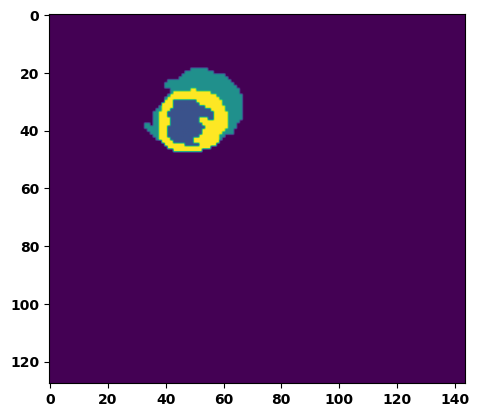

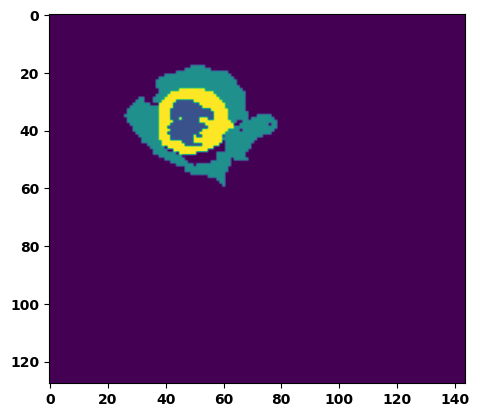

  6%|▌         | 2/36 [00:03<00:56,  1.65s/it]

Batch_id:  1 Eval loss:  0.7597500681877136
Batch_id:  1 Eval IoU:  tensor(0.2283, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9165, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:50,  1.54s/it]

Batch_id:  2 Eval loss:  0.582364022731781
Batch_id:  2 Eval IoU:  tensor(0.3613, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8947, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8525, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


 11%|█         | 4/36 [00:06<00:47,  1.48s/it]

Batch_id:  3 Eval loss:  0.7425262331962585
Batch_id:  3 Eval IoU:  tensor(0.1838, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6878, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.6004, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8168, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.7025, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.43s/it]

Batch_id:  4 Eval loss:  0.6429779529571533
Batch_id:  4 Eval IoU:  tensor(0.3081, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.42s/it]

Batch_id:  5 Eval loss:  0.7746694087982178
Batch_id:  5 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.5505179166793823
Batch_id:  6 Eval IoU:  tensor(0.4066, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.42s/it]

Batch_id:  7 Eval loss:  0.7515527606010437
Batch_id:  7 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.6520137786865234
Batch_id:  8 Eval IoU:  tensor(0.2975, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.43s/it]

Batch_id:  9 Eval loss:  0.1796264797449112
Batch_id:  9 Eval IoU:  tensor(0.7487, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  10 Eval loss:  0.6999647617340088
Batch_id:  10 Eval IoU:  tensor(0.2136, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5114, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3178, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.6581, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.6085, device='cuda:0')


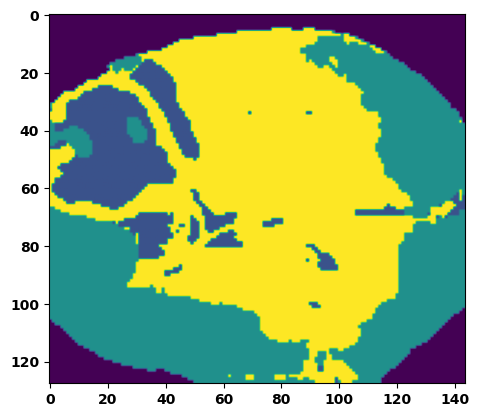

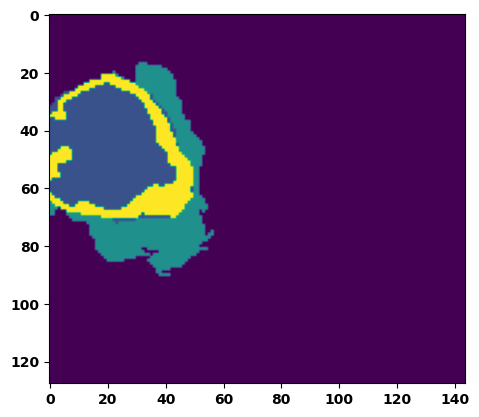

 33%|███▎      | 12/36 [00:17<00:35,  1.47s/it]

Batch_id:  11 Eval loss:  0.4761722683906555
Batch_id:  11 Eval IoU:  tensor(0.4160, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8928, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9271, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8446, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.50s/it]

Batch_id:  12 Eval loss:  0.4357513189315796
Batch_id:  12 Eval IoU:  tensor(0.4799, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9851, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.51s/it]

Batch_id:  13 Eval loss:  0.6779686808586121
Batch_id:  13 Eval IoU:  tensor(0.2320, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.5485, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3847, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.3311, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.51s/it]

Batch_id:  14 Eval loss:  0.7262694835662842
Batch_id:  14 Eval IoU:  tensor(0.2520, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.48s/it]

Batch_id:  15 Eval loss:  0.8959465026855469
Batch_id:  15 Eval IoU:  tensor(0.0607, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.4619, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3361, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.1953, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:27,  1.45s/it]

Batch_id:  16 Eval loss:  0.7570464611053467
Batch_id:  16 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:25,  1.43s/it]

Batch_id:  17 Eval loss:  0.5701431632041931
Batch_id:  17 Eval IoU:  tensor(0.3843, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8876, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8589, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9144, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.40s/it]

Batch_id:  18 Eval loss:  0.7063705921173096
Batch_id:  18 Eval IoU:  tensor(0.2630, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.38s/it]

Batch_id:  19 Eval loss:  0.8821694254875183
Batch_id:  19 Eval IoU:  tensor(0.0752, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.4966, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4191, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9200, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.2466, device='cuda:0')
Batch_id:  20 Eval loss:  0.5093079805374146
Batch_id:  20 Eval IoU:  tensor(0.3682, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7749, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.6819, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.6733, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9805, device='cuda:0')


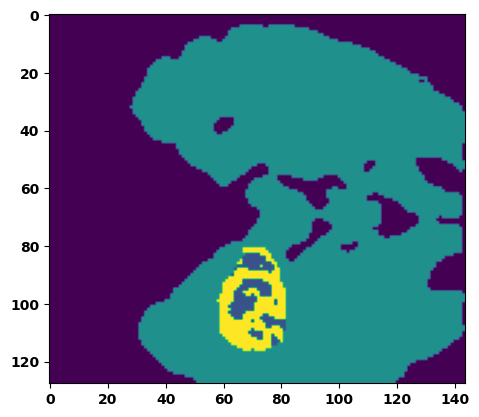

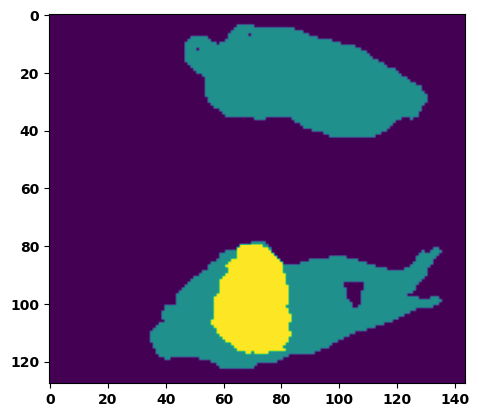

 61%|██████    | 22/36 [00:32<00:20,  1.47s/it]

Batch_id:  21 Eval loss:  0.5736295580863953
Batch_id:  21 Eval IoU:  tensor(0.3818, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.44s/it]

Batch_id:  22 Eval loss:  0.7564725279808044
Batch_id:  22 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.43s/it]

Batch_id:  23 Eval loss:  0.4104345440864563
Batch_id:  23 Eval IoU:  tensor(0.4789, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9932, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.11633679270744324
Batch_id:  24 Eval IoU:  tensor(0.8024, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9823, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.45s/it]

Batch_id:  25 Eval loss:  0.7356256246566772
Batch_id:  25 Eval IoU:  tensor(0.1990, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.6816, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.5459, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.5247, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.30612248182296753
Batch_id:  26 Eval IoU:  tensor(0.5818, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9909, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.41s/it]

Batch_id:  27 Eval loss:  0.7411742806434631
Batch_id:  27 Eval IoU:  tensor(0.2429, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:09,  1.41s/it]

Batch_id:  28 Eval loss:  0.8820793628692627
Batch_id:  28 Eval IoU:  tensor(0.0680, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5065, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.2639, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.2604, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.44s/it]

Batch_id:  29 Eval loss:  0.6655983924865723
Batch_id:  29 Eval IoU:  tensor(0.2625, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.7804, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.6975, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.7622, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  30 Eval loss:  0.7553811073303223
Batch_id:  30 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


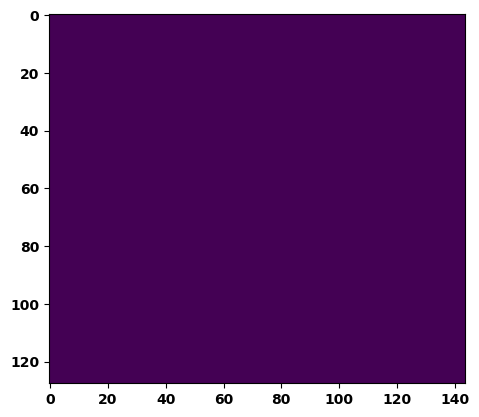

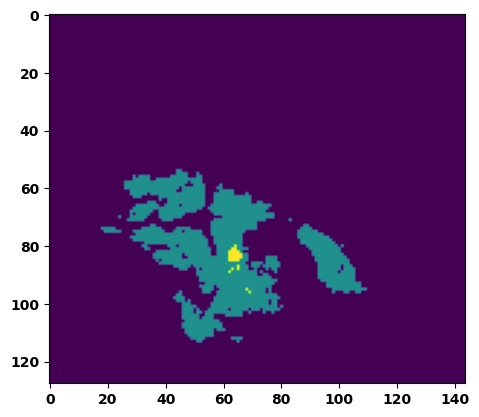

 89%|████████▉ | 32/36 [00:46<00:05,  1.48s/it]

Batch_id:  31 Eval loss:  0.7036013007164001
Batch_id:  31 Eval IoU:  tensor(0.2353, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7555, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6495, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.6691, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.42s/it]

Batch_id:  32 Eval loss:  0.5472825169563293
Batch_id:  32 Eval IoU:  tensor(0.3687, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9093, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9662, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.39s/it]

Batch_id:  33 Eval loss:  0.7680375576019287
Batch_id:  33 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.37s/it]

Batch_id:  34 Eval loss:  0.22360965609550476
Batch_id:  34 Eval IoU:  tensor(0.6779, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9865, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.6694815158843994
Batch_id:  35 Eval IoU:  tensor(0.2366, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.6070, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4471, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9057, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9113, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.5570, device='cuda:0')
Epoch  14 Training loss:  0.1694220011884516
Epoch  14 Evaluation loss:  0.6121084367235502
Epoch  14 Training accuracy :  tensor(0.7625)
Epoch  14 Evaluation accuracy :  tensor(0.3305)
Epoch  14 Training Mean Dice Score:  tensor(0.9805)
Epoch  14 Eval Mean Dice Score:  tensor(0.8480)
Epoch  14 Training Non-tumor Dice Score:  tensor(0.9819)
Epoch  14 Eval Non-tumor Dice Score:  tensor(0.7982)
Epoch  14 Training NCR/NET Dice Score:  tensor(0.9907)
Epoch  14 Eval NCR/NET Dice Score:  tensor(0.9396)
Epoch  14 Training ED Dice Score:  tensor(0.978

Epoch: 15
Training in session: 


  1%|          | 1/110 [00:01<02:43,  1.50s/it]

Batch_id:  0 Training loss:  0.19915525615215302
Batch_id:  0 Training IoU:  tensor(0.6958, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9362, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:36,  1.45s/it]

Batch_id:  1 Training loss:  0.16094312071800232
Batch_id:  1 Training IoU:  tensor(0.7488, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9723, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:39,  1.49s/it]

Batch_id:  2 Training loss:  0.09605732560157776
Batch_id:  2 Training IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:31,  1.43s/it]

Batch_id:  3 Training loss:  0.16050320863723755
Batch_id:  3 Training IoU:  tensor(0.7518, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:26,  1.40s/it]

Batch_id:  4 Training loss:  0.10313628613948822
Batch_id:  4 Training IoU:  tensor(0.8297, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:26,  1.40s/it]

Batch_id:  5 Training loss:  0.0630614310503006
Batch_id:  5 Training IoU:  tensor(0.8969, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  6%|▋         | 7/110 [00:09<02:25,  1.41s/it]

Batch_id:  6 Training loss:  0.12231163680553436
Batch_id:  6 Training IoU:  tensor(0.8060, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:23,  1.40s/it]

Batch_id:  7 Training loss:  0.08673228323459625
Batch_id:  7 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:24,  1.43s/it]

Batch_id:  8 Training loss:  0.08658389747142792
Batch_id:  8 Training IoU:  tensor(0.8613, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:24,  1.45s/it]

Batch_id:  9 Training loss:  0.11176638305187225
Batch_id:  9 Training IoU:  tensor(0.8308, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 10%|█         | 11/110 [00:15<02:22,  1.44s/it]

Batch_id:  10 Training loss:  0.061817049980163574
Batch_id:  10 Training IoU:  tensor(0.8968, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 11%|█         | 12/110 [00:17<02:20,  1.43s/it]

Batch_id:  11 Training loss:  0.10767082870006561
Batch_id:  11 Training IoU:  tensor(0.8536, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:16,  1.41s/it]

Batch_id:  12 Training loss:  0.13020649552345276
Batch_id:  12 Training IoU:  tensor(0.8060, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:20,  1.46s/it]

Batch_id:  13 Training loss:  0.15812262892723083
Batch_id:  13 Training IoU:  tensor(0.7801, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:16,  1.44s/it]

Batch_id:  14 Training loss:  0.17504261434078217
Batch_id:  14 Training IoU:  tensor(0.7360, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 15%|█▍        | 16/110 [00:22<02:14,  1.43s/it]

Batch_id:  15 Training loss:  0.2762795090675354
Batch_id:  15 Training IoU:  tensor(0.6498, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:16,  1.46s/it]

Batch_id:  16 Training loss:  0.16632428765296936
Batch_id:  16 Training IoU:  tensor(0.7396, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:14,  1.46s/it]

Batch_id:  17 Training loss:  0.17809312045574188
Batch_id:  17 Training IoU:  tensor(0.7354, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9644, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:12,  1.45s/it]

Batch_id:  18 Training loss:  0.4609493017196655
Batch_id:  18 Training IoU:  tensor(0.4470, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9521, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:10,  1.45s/it]

Batch_id:  19 Training loss:  0.09817777574062347
Batch_id:  19 Training IoU:  tensor(0.8415, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:06,  1.42s/it]

Batch_id:  20 Training loss:  0.16414180397987366
Batch_id:  20 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 20%|██        | 22/110 [00:31<02:03,  1.40s/it]

Batch_id:  21 Training loss:  0.12817353010177612
Batch_id:  21 Training IoU:  tensor(0.7964, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 21%|██        | 23/110 [00:33<02:06,  1.45s/it]

Batch_id:  22 Training loss:  0.1369357407093048
Batch_id:  22 Training IoU:  tensor(0.7794, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:01,  1.41s/it]

Batch_id:  23 Training loss:  0.33266955614089966
Batch_id:  23 Training IoU:  tensor(0.6151, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 23%|██▎       | 25/110 [00:35<02:01,  1.43s/it]

Batch_id:  24 Training loss:  0.208441823720932
Batch_id:  24 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:02,  1.46s/it]

Batch_id:  25 Training loss:  0.2912314534187317
Batch_id:  25 Training IoU:  tensor(0.6234, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 25%|██▍       | 27/110 [00:38<02:00,  1.45s/it]

Batch_id:  26 Training loss:  0.060849905014038086
Batch_id:  26 Training IoU:  tensor(0.8995, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:59,  1.45s/it]

Batch_id:  27 Training loss:  0.14394386112689972
Batch_id:  27 Training IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.2791450321674347
Batch_id:  28 Training IoU:  tensor(0.6625, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:54,  1.43s/it]

Batch_id:  29 Training loss:  0.12541325390338898
Batch_id:  29 Training IoU:  tensor(0.8071, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:52,  1.42s/it]

Batch_id:  30 Training loss:  0.0932520180940628
Batch_id:  30 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:52,  1.44s/it]

Batch_id:  31 Training loss:  0.10021878778934479
Batch_id:  31 Training IoU:  tensor(0.8345, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 30%|███       | 33/110 [00:47<01:54,  1.48s/it]

Batch_id:  32 Training loss:  0.23668867349624634
Batch_id:  32 Training IoU:  tensor(0.7386, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 31%|███       | 34/110 [00:48<01:49,  1.44s/it]

Batch_id:  33 Training loss:  0.13258914649486542
Batch_id:  33 Training IoU:  tensor(0.8016, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:50,  1.48s/it]

Batch_id:  34 Training loss:  0.08283770084381104
Batch_id:  34 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:46,  1.44s/it]

Batch_id:  35 Training loss:  0.24200640618801117
Batch_id:  35 Training IoU:  tensor(0.6476, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:43,  1.42s/it]

Batch_id:  36 Training loss:  0.14417153596878052
Batch_id:  36 Training IoU:  tensor(0.7737, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.2876044511795044
Batch_id:  37 Training IoU:  tensor(0.5924, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9743, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:43,  1.45s/it]

Batch_id:  38 Training loss:  0.13105371594429016
Batch_id:  38 Training IoU:  tensor(0.7893, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:41,  1.45s/it]

Batch_id:  39 Training loss:  0.082278311252594
Batch_id:  39 Training IoU:  tensor(0.8689, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:37,  1.42s/it]

Batch_id:  40 Training loss:  0.1726233959197998
Batch_id:  40 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:38,  1.45s/it]

Batch_id:  41 Training loss:  0.12691210210323334
Batch_id:  41 Training IoU:  tensor(0.7905, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:37,  1.46s/it]

Batch_id:  42 Training loss:  0.17863096296787262
Batch_id:  42 Training IoU:  tensor(0.7785, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 40%|████      | 44/110 [01:03<01:36,  1.46s/it]

Batch_id:  43 Training loss:  0.1670878380537033
Batch_id:  43 Training IoU:  tensor(0.7553, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 41%|████      | 45/110 [01:05<01:39,  1.53s/it]

Batch_id:  44 Training loss:  0.1546814888715744
Batch_id:  44 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:37,  1.53s/it]

Batch_id:  45 Training loss:  0.04286375641822815
Batch_id:  45 Training IoU:  tensor(0.9313, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:35,  1.51s/it]

Batch_id:  46 Training loss:  0.06780527532100677
Batch_id:  46 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:32,  1.50s/it]

Batch_id:  47 Training loss:  0.33734065294265747
Batch_id:  47 Training IoU:  tensor(0.5865, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:32,  1.52s/it]

Batch_id:  48 Training loss:  0.07458092272281647
Batch_id:  48 Training IoU:  tensor(0.8719, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:29,  1.49s/it]

Batch_id:  49 Training loss:  0.08576677739620209
Batch_id:  49 Training IoU:  tensor(0.8591, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:29,  1.52s/it]

Batch_id:  50 Training loss:  0.2614156901836395
Batch_id:  50 Training IoU:  tensor(0.6324, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:25,  1.48s/it]

Batch_id:  51 Training loss:  0.18170394003391266
Batch_id:  51 Training IoU:  tensor(0.7283, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:23,  1.46s/it]

Batch_id:  52 Training loss:  0.2504415512084961
Batch_id:  52 Training IoU:  tensor(0.6706, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:19,  1.41s/it]

Batch_id:  53 Training loss:  0.2147093415260315
Batch_id:  53 Training IoU:  tensor(0.6761, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:19,  1.44s/it]

Batch_id:  54 Training loss:  0.27212950587272644
Batch_id:  54 Training IoU:  tensor(0.6431, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:16,  1.41s/it]

Batch_id:  55 Training loss:  0.300468385219574
Batch_id:  55 Training IoU:  tensor(0.6552, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:22,  1.56s/it]

Batch_id:  56 Training loss:  0.144171342253685
Batch_id:  56 Training IoU:  tensor(0.7948, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:22,  1.59s/it]

Batch_id:  57 Training loss:  0.07112163305282593
Batch_id:  57 Training IoU:  tensor(0.8833, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:21,  1.59s/it]

Batch_id:  58 Training loss:  0.06258884072303772
Batch_id:  58 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:21,  1.63s/it]

Batch_id:  59 Training loss:  0.12929600477218628
Batch_id:  59 Training IoU:  tensor(0.7891, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:18,  1.60s/it]

Batch_id:  60 Training loss:  0.22731727361679077
Batch_id:  60 Training IoU:  tensor(0.6760, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:15,  1.58s/it]

Batch_id:  61 Training loss:  0.13153450191020966
Batch_id:  61 Training IoU:  tensor(0.7849, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:12,  1.53s/it]

Batch_id:  62 Training loss:  0.10551753640174866
Batch_id:  62 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:08,  1.50s/it]

Batch_id:  63 Training loss:  0.15624746680259705
Batch_id:  63 Training IoU:  tensor(0.7937, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:07,  1.49s/it]

Batch_id:  64 Training loss:  0.11667667329311371
Batch_id:  64 Training IoU:  tensor(0.8204, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:08,  1.56s/it]

Batch_id:  65 Training loss:  0.22843241691589355
Batch_id:  65 Training IoU:  tensor(0.6764, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9626, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.24509288370609283
Batch_id:  66 Training IoU:  tensor(0.6629, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:01,  1.47s/it]

Batch_id:  67 Training loss:  0.2701481878757477
Batch_id:  67 Training IoU:  tensor(0.6652, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:03,  1.55s/it]

Batch_id:  68 Training loss:  0.32553762197494507
Batch_id:  68 Training IoU:  tensor(0.5941, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<01:01,  1.54s/it]

Batch_id:  69 Training loss:  0.07448232173919678
Batch_id:  69 Training IoU:  tensor(0.8791, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<01:00,  1.56s/it]

Batch_id:  70 Training loss:  0.26483625173568726
Batch_id:  70 Training IoU:  tensor(0.6899, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:59,  1.56s/it]

Batch_id:  71 Training loss:  0.09991295635700226
Batch_id:  71 Training IoU:  tensor(0.8393, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:57,  1.55s/it]

Batch_id:  72 Training loss:  0.07409310340881348
Batch_id:  72 Training IoU:  tensor(0.8759, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:56,  1.57s/it]

Batch_id:  73 Training loss:  0.23716530203819275
Batch_id:  73 Training IoU:  tensor(0.6490, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9720, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:53,  1.54s/it]

Batch_id:  74 Training loss:  0.2812613844871521
Batch_id:  74 Training IoU:  tensor(0.6630, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:51,  1.52s/it]

Batch_id:  75 Training loss:  0.19180765748023987
Batch_id:  75 Training IoU:  tensor(0.7054, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:48,  1.48s/it]

Batch_id:  76 Training loss:  0.28872084617614746
Batch_id:  76 Training IoU:  tensor(0.6643, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:47,  1.49s/it]

Batch_id:  77 Training loss:  0.07410094141960144
Batch_id:  77 Training IoU:  tensor(0.8799, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:48,  1.55s/it]

Batch_id:  78 Training loss:  0.17245934903621674
Batch_id:  78 Training IoU:  tensor(0.7449, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:45,  1.51s/it]

Batch_id:  79 Training loss:  0.1768813282251358
Batch_id:  79 Training IoU:  tensor(0.7325, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:44,  1.52s/it]

Batch_id:  80 Training loss:  0.1279090940952301
Batch_id:  80 Training IoU:  tensor(0.7875, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:43,  1.55s/it]

Batch_id:  81 Training loss:  0.08174380660057068
Batch_id:  81 Training IoU:  tensor(0.8682, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:41,  1.53s/it]

Batch_id:  82 Training loss:  0.41887611150741577
Batch_id:  82 Training IoU:  tensor(0.4735, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:39,  1.53s/it]

Batch_id:  83 Training loss:  0.29507213830947876
Batch_id:  83 Training IoU:  tensor(0.6039, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:38,  1.53s/it]

Batch_id:  84 Training loss:  0.11295469105243683
Batch_id:  84 Training IoU:  tensor(0.8771, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:36,  1.54s/it]

Batch_id:  85 Training loss:  0.10226821899414062
Batch_id:  85 Training IoU:  tensor(0.8285, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:35,  1.53s/it]

Batch_id:  86 Training loss:  0.11468736827373505
Batch_id:  86 Training IoU:  tensor(0.8083, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:33,  1.54s/it]

Batch_id:  87 Training loss:  0.1287754476070404
Batch_id:  87 Training IoU:  tensor(0.9129, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:31,  1.50s/it]

Batch_id:  88 Training loss:  0.2349185347557068
Batch_id:  88 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.45525291562080383
Batch_id:  89 Training IoU:  tensor(0.4630, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:27,  1.43s/it]

Batch_id:  90 Training loss:  0.2163136601448059
Batch_id:  90 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:25,  1.39s/it]

Batch_id:  91 Training loss:  0.14360564947128296
Batch_id:  91 Training IoU:  tensor(0.7796, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 85%|████████▍ | 93/110 [02:17<00:24,  1.46s/it]

Batch_id:  92 Training loss:  0.11431334912776947
Batch_id:  92 Training IoU:  tensor(0.8517, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:23,  1.46s/it]

Batch_id:  93 Training loss:  0.22810854017734528
Batch_id:  93 Training IoU:  tensor(0.6804, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9432, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:21,  1.45s/it]

Batch_id:  94 Training loss:  0.1843239814043045
Batch_id:  94 Training IoU:  tensor(0.7662, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:20,  1.44s/it]

Batch_id:  95 Training loss:  0.1553768366575241
Batch_id:  95 Training IoU:  tensor(0.7505, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.44s/it]

Batch_id:  96 Training loss:  0.11208073794841766
Batch_id:  96 Training IoU:  tensor(0.8137, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:17,  1.45s/it]

Batch_id:  97 Training loss:  0.06806126236915588
Batch_id:  97 Training IoU:  tensor(0.8909, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.40s/it]

Batch_id:  98 Training loss:  0.06267319619655609
Batch_id:  98 Training IoU:  tensor(0.9019, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:13,  1.39s/it]

Batch_id:  99 Training loss:  0.1407543122768402
Batch_id:  99 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:12,  1.41s/it]

Batch_id:  100 Training loss:  0.09692361950874329
Batch_id:  100 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.41s/it]

Batch_id:  101 Training loss:  0.16484926640987396
Batch_id:  101 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.44s/it]

Batch_id:  102 Training loss:  0.10145840048789978
Batch_id:  102 Training IoU:  tensor(0.8343, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.47s/it]

Batch_id:  103 Training loss:  0.0723690390586853
Batch_id:  103 Training IoU:  tensor(0.8826, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.48s/it]

Batch_id:  104 Training loss:  0.1403011828660965
Batch_id:  104 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.48s/it]

Batch_id:  105 Training loss:  0.13344040513038635
Batch_id:  105 Training IoU:  tensor(0.7989, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.48s/it]

Batch_id:  106 Training loss:  0.13368403911590576
Batch_id:  106 Training IoU:  tensor(0.7945, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.46s/it]

Batch_id:  107 Training loss:  0.13467109203338623
Batch_id:  107 Training IoU:  tensor(0.7897, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.46s/it]

Batch_id:  108 Training loss:  0.13538779318332672
Batch_id:  108 Training IoU:  tensor(0.7824, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.24840040504932404
Batch_id:  109 Training IoU:  tensor(0.6472, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9893, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.48143869638442993
Batch_id:  0 Eval IoU:  tensor(0.4043, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8899, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8647, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9609, device='cuda:0')


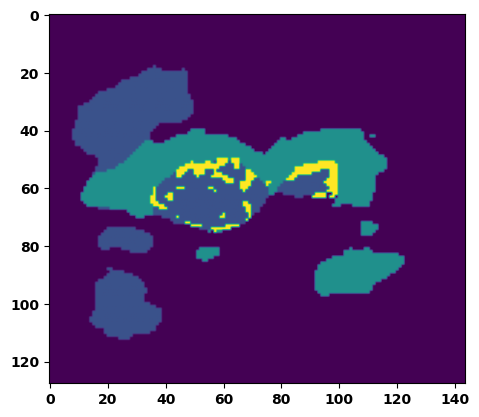

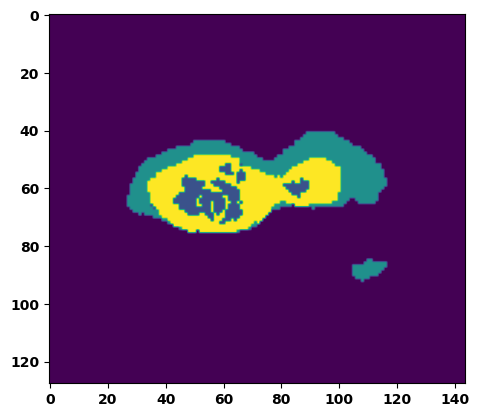

  6%|▌         | 2/36 [00:03<00:54,  1.62s/it]

Batch_id:  1 Eval loss:  0.7589166164398193
Batch_id:  1 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:50,  1.54s/it]

Batch_id:  2 Eval loss:  0.5618345737457275
Batch_id:  2 Eval IoU:  tensor(0.3954, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.45s/it]

Batch_id:  3 Eval loss:  0.15396206080913544
Batch_id:  3 Eval IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:47,  1.52s/it]

Batch_id:  4 Eval loss:  0.9019559025764465
Batch_id:  4 Eval IoU:  tensor(0.0577, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.4609, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3351, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.1923, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.46s/it]

Batch_id:  5 Eval loss:  0.4091208577156067
Batch_id:  5 Eval IoU:  tensor(0.4954, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.44s/it]

Batch_id:  6 Eval loss:  0.4540068507194519
Batch_id:  6 Eval IoU:  tensor(0.4637, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9808, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.39s/it]

Batch_id:  7 Eval loss:  0.8826946020126343
Batch_id:  7 Eval IoU:  tensor(0.0753, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4968, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4194, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.2464, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:37,  1.39s/it]

Batch_id:  8 Eval loss:  0.6051602363586426
Batch_id:  8 Eval IoU:  tensor(0.3233, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9134, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8830, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9877, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.44s/it]

Batch_id:  9 Eval loss:  0.7121562361717224
Batch_id:  9 Eval IoU:  tensor(0.2088, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.7354, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.6689, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.6237, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9465, device='cuda:0')
Batch_id:  10 Eval loss:  0.743687093257904
Batch_id:  10 Eval IoU:  tensor(0.2377, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9212, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9181, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9055, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9751, device='cuda:0')


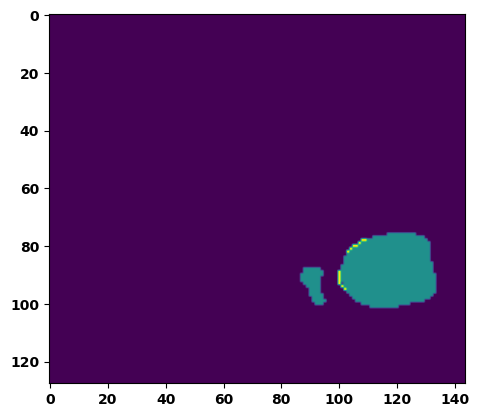

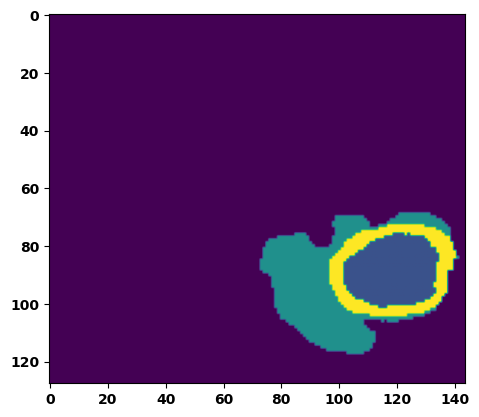

 33%|███▎      | 12/36 [00:17<00:36,  1.53s/it]

Batch_id:  11 Eval loss:  0.30614495277404785
Batch_id:  11 Eval IoU:  tensor(0.5813, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.50s/it]

Batch_id:  12 Eval loss:  0.6128166913986206
Batch_id:  12 Eval IoU:  tensor(0.3380, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.44s/it]

Batch_id:  13 Eval loss:  0.5595475435256958
Batch_id:  13 Eval IoU:  tensor(0.3715, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8948, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8497, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9256, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9305, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.51s/it]

Batch_id:  14 Eval loss:  0.6425307393074036
Batch_id:  14 Eval IoU:  tensor(0.3068, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.45s/it]

Batch_id:  15 Eval loss:  0.13398714363574982
Batch_id:  15 Eval IoU:  tensor(0.8169, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:27,  1.46s/it]

Batch_id:  16 Eval loss:  0.18915431201457977
Batch_id:  16 Eval IoU:  tensor(0.7247, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.50s/it]

Batch_id:  17 Eval loss:  0.768016517162323
Batch_id:  17 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.44s/it]

Batch_id:  18 Eval loss:  0.19097185134887695
Batch_id:  18 Eval IoU:  tensor(0.7495, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9982, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.40s/it]

Batch_id:  19 Eval loss:  0.774723470211029
Batch_id:  19 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  20 Eval loss:  0.8527079820632935
Batch_id:  20 Eval IoU:  tensor(0.0941, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.5333, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.4395, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8622, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3526, device='cuda:0')


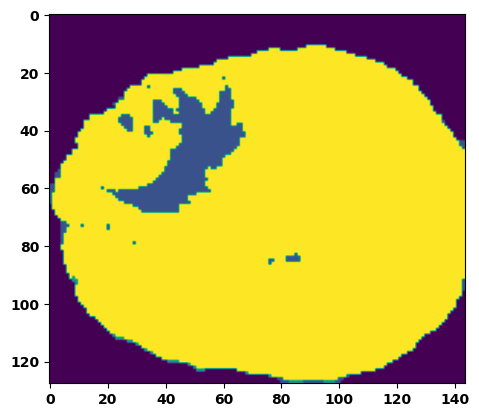

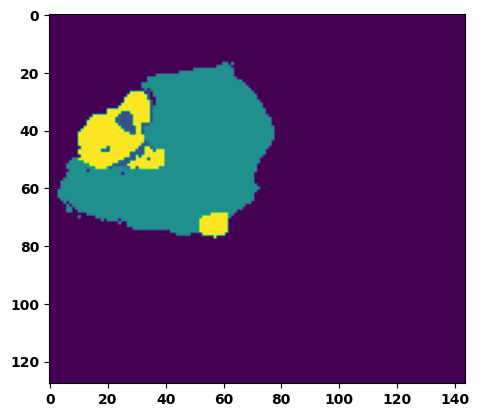

 61%|██████    | 22/36 [00:32<00:21,  1.51s/it]

Batch_id:  21 Eval loss:  0.5392346978187561
Batch_id:  21 Eval IoU:  tensor(0.3821, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9860, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.45s/it]

Batch_id:  22 Eval loss:  0.5373977422714233
Batch_id:  22 Eval IoU:  tensor(0.4278, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9411, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:16,  1.38s/it]

Batch_id:  23 Eval loss:  0.3535768389701843
Batch_id:  23 Eval IoU:  tensor(0.5548, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9300, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.06682907044887543
Batch_id:  24 Eval IoU:  tensor(0.8835, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.47s/it]

Batch_id:  25 Eval loss:  0.6313318610191345
Batch_id:  25 Eval IoU:  tensor(0.3112, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8896, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8544, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8382, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.48s/it]

Batch_id:  26 Eval loss:  0.442668080329895
Batch_id:  26 Eval IoU:  tensor(0.4653, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.7848, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.6824, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.6844, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:12,  1.53s/it]

Batch_id:  27 Eval loss:  0.7565375566482544
Batch_id:  27 Eval IoU:  tensor(0.1533, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.5354, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3838, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3094, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.53s/it]

Batch_id:  28 Eval loss:  0.5664860606193542
Batch_id:  28 Eval IoU:  tensor(0.3431, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.8491, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8449, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.8725, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:09,  1.53s/it]

Batch_id:  29 Eval loss:  0.6286075115203857
Batch_id:  29 Eval IoU:  tensor(0.3194, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  30 Eval loss:  0.8490496277809143
Batch_id:  30 Eval IoU:  tensor(0.0985, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.5642, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3489, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.4686, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.8999, device='cuda:0')


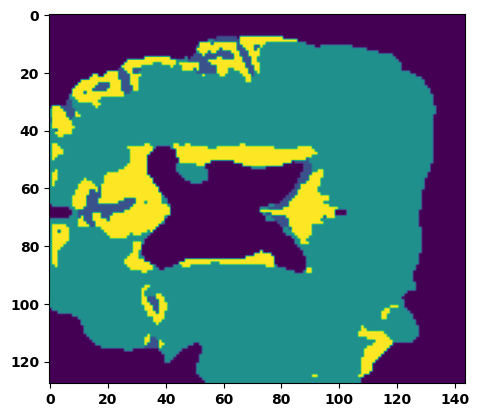

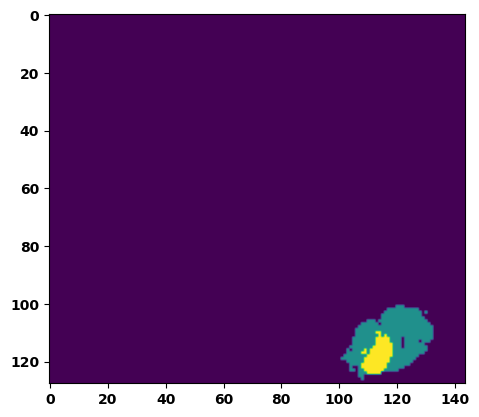

 89%|████████▉ | 32/36 [00:47<00:06,  1.52s/it]

Batch_id:  31 Eval loss:  0.7563744783401489
Batch_id:  31 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.47s/it]

Batch_id:  32 Eval loss:  0.751621425151825
Batch_id:  32 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.46s/it]

Batch_id:  33 Eval loss:  0.33921658992767334
Batch_id:  33 Eval IoU:  tensor(0.5519, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9439, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.6243495941162109
Batch_id:  34 Eval IoU:  tensor(0.3026, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9308, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8988, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9652, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.47s/it]

Batch_id:  35 Eval loss:  0.7297381162643433
Batch_id:  35 Eval IoU:  tensor(0.1954, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4853, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3066, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2375, device='cuda:0')
Epoch  15 Training loss:  0.16640637869184668
Epoch  15 Evaluation loss:  0.5630153939127922
Epoch  15 Training accuracy :  tensor(0.7660)
Epoch  15 Evaluation accuracy :  tensor(0.3755)
Epoch  15 Training Mean Dice Score:  tensor(0.9807)
Epoch  15 Eval Mean Dice Score:  tensor(0.8635)
Epoch  15 Training Non-tumor Dice Score:  tensor(0.9819)
Epoch  15 Eval Non-tumor Dice Score:  tensor(0.8242)
Epoch  15 Training NCR/NET Dice Score:  tensor(0.9909)
Epoch  15 Eval NCR/NET Dice Score:  tensor(0.9682)
Epoch  15 Training ED Dice Score:  tensor(0.97

Epoch: 16
Training in session: 


  1%|          | 1/110 [00:01<02:30,  1.38s/it]

Batch_id:  0 Training loss:  0.1582174003124237
Batch_id:  0 Training IoU:  tensor(0.7550, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:38,  1.47s/it]

Batch_id:  1 Training loss:  0.09467749297618866
Batch_id:  1 Training IoU:  tensor(0.8453, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:39,  1.49s/it]

Batch_id:  2 Training loss:  0.06813760101795197
Batch_id:  2 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:28,  1.40s/it]

Batch_id:  3 Training loss:  0.16923190653324127
Batch_id:  3 Training IoU:  tensor(0.7453, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:26,  1.39s/it]

Batch_id:  4 Training loss:  0.12358216941356659
Batch_id:  4 Training IoU:  tensor(0.8088, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:19,  1.34s/it]

Batch_id:  5 Training loss:  0.07641299068927765
Batch_id:  5 Training IoU:  tensor(0.8710, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


  6%|▋         | 7/110 [00:09<02:20,  1.37s/it]

Batch_id:  6 Training loss:  0.18548540771007538
Batch_id:  6 Training IoU:  tensor(0.7128, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9725, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:23,  1.41s/it]

Batch_id:  7 Training loss:  0.06818537414073944
Batch_id:  7 Training IoU:  tensor(0.8877, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:21,  1.40s/it]

Batch_id:  8 Training loss:  0.203700453042984
Batch_id:  8 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:22,  1.42s/it]

Batch_id:  9 Training loss:  0.4183387756347656
Batch_id:  9 Training IoU:  tensor(0.4935, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9741, device='cuda:0')


 10%|█         | 11/110 [00:15<02:22,  1.44s/it]

Batch_id:  10 Training loss:  0.20847688615322113
Batch_id:  10 Training IoU:  tensor(0.7373, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 11%|█         | 12/110 [00:17<02:26,  1.50s/it]

Batch_id:  11 Training loss:  0.11614485085010529
Batch_id:  11 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:27,  1.52s/it]

Batch_id:  12 Training loss:  0.0807298868894577
Batch_id:  12 Training IoU:  tensor(0.8712, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:21,  1.47s/it]

Batch_id:  13 Training loss:  0.06691344082355499
Batch_id:  13 Training IoU:  tensor(0.8860, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:24,  1.52s/it]

Batch_id:  14 Training loss:  0.0700933039188385
Batch_id:  14 Training IoU:  tensor(0.8787, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:19,  1.49s/it]

Batch_id:  15 Training loss:  0.2619268298149109
Batch_id:  15 Training IoU:  tensor(0.6405, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9586, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:17,  1.47s/it]

Batch_id:  16 Training loss:  0.21262815594673157
Batch_id:  16 Training IoU:  tensor(0.7168, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:10,  1.42s/it]

Batch_id:  17 Training loss:  0.12563127279281616
Batch_id:  17 Training IoU:  tensor(0.8106, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:06,  1.39s/it]

Batch_id:  18 Training loss:  0.2659992575645447
Batch_id:  18 Training IoU:  tensor(0.6514, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:03,  1.37s/it]

Batch_id:  19 Training loss:  0.1460939645767212
Batch_id:  19 Training IoU:  tensor(0.7651, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:08,  1.45s/it]

Batch_id:  20 Training loss:  0.2714373469352722
Batch_id:  20 Training IoU:  tensor(0.6084, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 20%|██        | 22/110 [00:31<02:07,  1.45s/it]

Batch_id:  21 Training loss:  0.1023084968328476
Batch_id:  21 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 21%|██        | 23/110 [00:33<02:08,  1.48s/it]

Batch_id:  22 Training loss:  0.21454930305480957
Batch_id:  22 Training IoU:  tensor(0.6833, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:07,  1.48s/it]

Batch_id:  23 Training loss:  0.08629831671714783
Batch_id:  23 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:02,  1.44s/it]

Batch_id:  24 Training loss:  0.08312687277793884
Batch_id:  24 Training IoU:  tensor(0.8634, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:57,  1.40s/it]

Batch_id:  25 Training loss:  0.1342466026544571
Batch_id:  25 Training IoU:  tensor(0.7906, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 25%|██▍       | 27/110 [00:38<01:56,  1.40s/it]

Batch_id:  26 Training loss:  0.21449893712997437
Batch_id:  26 Training IoU:  tensor(0.6944, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:53,  1.39s/it]

Batch_id:  27 Training loss:  0.12683507800102234
Batch_id:  27 Training IoU:  tensor(0.7914, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:51,  1.37s/it]

Batch_id:  28 Training loss:  0.06888343393802643
Batch_id:  28 Training IoU:  tensor(0.8847, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 27%|██▋       | 30/110 [00:42<01:52,  1.41s/it]

Batch_id:  29 Training loss:  0.2927160859107971
Batch_id:  29 Training IoU:  tensor(0.6315, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9738, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:49,  1.39s/it]

Batch_id:  30 Training loss:  0.332239031791687
Batch_id:  30 Training IoU:  tensor(0.6136, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:51,  1.43s/it]

Batch_id:  31 Training loss:  0.08455638587474823
Batch_id:  31 Training IoU:  tensor(0.8654, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 30%|███       | 33/110 [00:47<01:50,  1.43s/it]

Batch_id:  32 Training loss:  0.2606878876686096
Batch_id:  32 Training IoU:  tensor(0.6370, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 31%|███       | 34/110 [00:48<01:47,  1.41s/it]

Batch_id:  33 Training loss:  0.09092234075069427
Batch_id:  33 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 32%|███▏      | 35/110 [00:49<01:45,  1.40s/it]

Batch_id:  34 Training loss:  0.166134774684906
Batch_id:  34 Training IoU:  tensor(0.7642, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:45,  1.43s/it]

Batch_id:  35 Training loss:  0.06040264666080475
Batch_id:  35 Training IoU:  tensor(0.9031, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 34%|███▎      | 37/110 [00:52<01:42,  1.40s/it]

Batch_id:  36 Training loss:  0.15272706747055054
Batch_id:  36 Training IoU:  tensor(0.7602, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9728, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:39,  1.38s/it]

Batch_id:  37 Training loss:  0.09967763721942902
Batch_id:  37 Training IoU:  tensor(0.8316, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 35%|███▌      | 39/110 [00:55<01:38,  1.39s/it]

Batch_id:  38 Training loss:  0.19016528129577637
Batch_id:  38 Training IoU:  tensor(0.7310, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 36%|███▋      | 40/110 [00:56<01:36,  1.38s/it]

Batch_id:  39 Training loss:  0.2827635407447815
Batch_id:  39 Training IoU:  tensor(0.6593, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:35,  1.38s/it]

Batch_id:  40 Training loss:  0.10797412693500519
Batch_id:  40 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 38%|███▊      | 42/110 [00:59<01:35,  1.41s/it]

Batch_id:  41 Training loss:  0.1768544614315033
Batch_id:  41 Training IoU:  tensor(0.7393, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:35,  1.42s/it]

Batch_id:  42 Training loss:  0.27169734239578247
Batch_id:  42 Training IoU:  tensor(0.6587, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 40%|████      | 44/110 [01:02<01:32,  1.40s/it]

Batch_id:  43 Training loss:  0.16626885533332825
Batch_id:  43 Training IoU:  tensor(0.7589, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 41%|████      | 45/110 [01:04<01:33,  1.43s/it]

Batch_id:  44 Training loss:  0.15448540449142456
Batch_id:  44 Training IoU:  tensor(0.7838, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 42%|████▏     | 46/110 [01:05<01:33,  1.46s/it]

Batch_id:  45 Training loss:  0.16377776861190796
Batch_id:  45 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 43%|████▎     | 47/110 [01:06<01:31,  1.45s/it]

Batch_id:  46 Training loss:  0.10672765970230103
Batch_id:  46 Training IoU:  tensor(0.8204, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:30,  1.46s/it]

Batch_id:  47 Training loss:  0.2581248879432678
Batch_id:  47 Training IoU:  tensor(0.6497, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 45%|████▍     | 49/110 [01:09<01:27,  1.43s/it]

Batch_id:  48 Training loss:  0.24781827628612518
Batch_id:  48 Training IoU:  tensor(0.6328, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9693, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:25,  1.42s/it]

Batch_id:  49 Training loss:  0.2574770748615265
Batch_id:  49 Training IoU:  tensor(0.6609, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 46%|████▋     | 51/110 [01:12<01:25,  1.45s/it]

Batch_id:  50 Training loss:  0.2705448865890503
Batch_id:  50 Training IoU:  tensor(0.6480, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:25,  1.48s/it]

Batch_id:  51 Training loss:  0.058846279978752136
Batch_id:  51 Training IoU:  tensor(0.9051, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 48%|████▊     | 53/110 [01:15<01:23,  1.46s/it]

Batch_id:  52 Training loss:  0.23726531863212585
Batch_id:  52 Training IoU:  tensor(0.6746, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:22,  1.47s/it]

Batch_id:  53 Training loss:  0.13219621777534485
Batch_id:  53 Training IoU:  tensor(0.8457, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 50%|█████     | 55/110 [01:18<01:22,  1.50s/it]

Batch_id:  54 Training loss:  0.1304214596748352
Batch_id:  54 Training IoU:  tensor(0.7978, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:19,  1.47s/it]

Batch_id:  55 Training loss:  0.260900616645813
Batch_id:  55 Training IoU:  tensor(0.6909, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 52%|█████▏    | 57/110 [01:21<01:16,  1.44s/it]

Batch_id:  56 Training loss:  0.12618505954742432
Batch_id:  56 Training IoU:  tensor(0.7910, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:15,  1.46s/it]

Batch_id:  57 Training loss:  0.2959447503089905
Batch_id:  57 Training IoU:  tensor(0.6476, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 54%|█████▎    | 59/110 [01:24<01:13,  1.45s/it]

Batch_id:  58 Training loss:  0.07576651871204376
Batch_id:  58 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 55%|█████▍    | 60/110 [01:25<01:13,  1.47s/it]

Batch_id:  59 Training loss:  0.12251836061477661
Batch_id:  59 Training IoU:  tensor(0.8547, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 55%|█████▌    | 61/110 [01:27<01:10,  1.43s/it]

Batch_id:  60 Training loss:  0.16877365112304688
Batch_id:  60 Training IoU:  tensor(0.7465, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 56%|█████▋    | 62/110 [01:28<01:08,  1.43s/it]

Batch_id:  61 Training loss:  0.12607477605342865
Batch_id:  61 Training IoU:  tensor(0.7918, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:08,  1.46s/it]

Batch_id:  62 Training loss:  0.2557887136936188
Batch_id:  62 Training IoU:  tensor(0.7004, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 58%|█████▊    | 64/110 [01:31<01:04,  1.40s/it]

Batch_id:  63 Training loss:  0.17615103721618652
Batch_id:  63 Training IoU:  tensor(0.7309, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 59%|█████▉    | 65/110 [01:32<01:02,  1.39s/it]

Batch_id:  64 Training loss:  0.399753212928772
Batch_id:  64 Training IoU:  tensor(0.4934, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 60%|██████    | 66/110 [01:34<01:01,  1.39s/it]

Batch_id:  65 Training loss:  0.1390160322189331
Batch_id:  65 Training IoU:  tensor(0.8153, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:03,  1.49s/it]

Batch_id:  66 Training loss:  0.07891418039798737
Batch_id:  66 Training IoU:  tensor(0.8681, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 62%|██████▏   | 68/110 [01:37<01:01,  1.45s/it]

Batch_id:  67 Training loss:  0.12576206028461456
Batch_id:  67 Training IoU:  tensor(0.7965, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 63%|██████▎   | 69/110 [01:38<01:00,  1.48s/it]

Batch_id:  68 Training loss:  0.28243279457092285
Batch_id:  68 Training IoU:  tensor(0.6404, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 64%|██████▎   | 70/110 [01:40<00:59,  1.50s/it]

Batch_id:  69 Training loss:  0.12596368789672852
Batch_id:  69 Training IoU:  tensor(0.7957, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:59,  1.52s/it]

Batch_id:  70 Training loss:  0.0833716094493866
Batch_id:  70 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 65%|██████▌   | 72/110 [01:43<00:57,  1.50s/it]

Batch_id:  71 Training loss:  0.2901150584220886
Batch_id:  71 Training IoU:  tensor(0.6041, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:57,  1.54s/it]

Batch_id:  72 Training loss:  0.0398375540971756
Batch_id:  72 Training IoU:  tensor(0.9355, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 67%|██████▋   | 74/110 [01:46<00:53,  1.50s/it]

Batch_id:  73 Training loss:  0.13071849942207336
Batch_id:  73 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:53,  1.54s/it]

Batch_id:  74 Training loss:  0.17823286354541779
Batch_id:  74 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:51,  1.50s/it]

Batch_id:  75 Training loss:  0.1252743899822235
Batch_id:  75 Training IoU:  tensor(0.8000, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:48,  1.48s/it]

Batch_id:  76 Training loss:  0.11567305028438568
Batch_id:  76 Training IoU:  tensor(0.8072, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:48,  1.53s/it]

Batch_id:  77 Training loss:  0.09986720979213715
Batch_id:  77 Training IoU:  tensor(0.8377, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:48,  1.57s/it]

Batch_id:  78 Training loss:  0.12395001947879791
Batch_id:  78 Training IoU:  tensor(0.8148, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:45,  1.53s/it]

Batch_id:  79 Training loss:  0.14052799344062805
Batch_id:  79 Training IoU:  tensor(0.7781, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:43,  1.51s/it]

Batch_id:  80 Training loss:  0.13300836086273193
Batch_id:  80 Training IoU:  tensor(0.7859, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 75%|███████▍  | 82/110 [01:58<00:42,  1.50s/it]

Batch_id:  81 Training loss:  0.10994867980480194
Batch_id:  81 Training IoU:  tensor(0.8173, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:40,  1.50s/it]

Batch_id:  82 Training loss:  0.10766899585723877
Batch_id:  82 Training IoU:  tensor(0.8587, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 76%|███████▋  | 84/110 [02:01<00:38,  1.48s/it]

Batch_id:  83 Training loss:  0.1375526785850525
Batch_id:  83 Training IoU:  tensor(0.7957, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:38,  1.55s/it]

Batch_id:  84 Training loss:  0.13365784287452698
Batch_id:  84 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 78%|███████▊  | 86/110 [02:04<00:35,  1.50s/it]

Batch_id:  85 Training loss:  0.19283819198608398
Batch_id:  85 Training IoU:  tensor(0.7043, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:34,  1.48s/it]

Batch_id:  86 Training loss:  0.06192983686923981
Batch_id:  86 Training IoU:  tensor(0.8967, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 80%|████████  | 88/110 [02:07<00:32,  1.49s/it]

Batch_id:  87 Training loss:  0.12802602350711823
Batch_id:  87 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:33,  1.58s/it]

Batch_id:  88 Training loss:  0.1270279735326767
Batch_id:  88 Training IoU:  tensor(0.8175, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:31,  1.57s/it]

Batch_id:  89 Training loss:  0.07203386723995209
Batch_id:  89 Training IoU:  tensor(0.8807, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:29,  1.56s/it]

Batch_id:  90 Training loss:  0.17322252690792084
Batch_id:  90 Training IoU:  tensor(0.7238, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 84%|████████▎ | 92/110 [02:13<00:26,  1.50s/it]

Batch_id:  91 Training loss:  0.12649057805538177
Batch_id:  91 Training IoU:  tensor(0.7980, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:25,  1.49s/it]

Batch_id:  92 Training loss:  0.2030177265405655
Batch_id:  92 Training IoU:  tensor(0.6883, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 85%|████████▌ | 94/110 [02:16<00:23,  1.47s/it]

Batch_id:  93 Training loss:  0.2902924716472626
Batch_id:  93 Training IoU:  tensor(0.6497, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:22,  1.48s/it]

Batch_id:  94 Training loss:  0.17209550738334656
Batch_id:  94 Training IoU:  tensor(0.7397, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9656, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:20,  1.47s/it]

Batch_id:  95 Training loss:  0.22336210310459137
Batch_id:  95 Training IoU:  tensor(0.7326, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:19,  1.49s/it]

Batch_id:  96 Training loss:  0.09606394171714783
Batch_id:  96 Training IoU:  tensor(0.8378, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:18,  1.54s/it]

Batch_id:  97 Training loss:  0.0841989815235138
Batch_id:  97 Training IoU:  tensor(0.8634, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:16,  1.53s/it]

Batch_id:  98 Training loss:  0.1878337860107422
Batch_id:  98 Training IoU:  tensor(0.7100, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:14,  1.48s/it]

Batch_id:  99 Training loss:  0.08441971242427826
Batch_id:  99 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.49s/it]

Batch_id:  100 Training loss:  0.14638344943523407
Batch_id:  100 Training IoU:  tensor(0.7757, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:12,  1.58s/it]

Batch_id:  101 Training loss:  0.23378074169158936
Batch_id:  101 Training IoU:  tensor(0.7172, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.54s/it]

Batch_id:  102 Training loss:  0.44025158882141113
Batch_id:  102 Training IoU:  tensor(0.4720, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:09,  1.60s/it]

Batch_id:  103 Training loss:  0.0710442066192627
Batch_id:  103 Training IoU:  tensor(0.8802, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.59s/it]

Batch_id:  104 Training loss:  0.08600300550460815
Batch_id:  104 Training IoU:  tensor(0.8592, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:06,  1.52s/it]

Batch_id:  105 Training loss:  0.17158129811286926
Batch_id:  105 Training IoU:  tensor(0.7320, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.47s/it]

Batch_id:  106 Training loss:  0.10126985609531403
Batch_id:  106 Training IoU:  tensor(0.8358, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:02,  1.43s/it]

Batch_id:  107 Training loss:  0.1193392425775528
Batch_id:  107 Training IoU:  tensor(0.8159, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.47s/it]

Batch_id:  108 Training loss:  0.10555389523506165
Batch_id:  108 Training IoU:  tensor(0.8307, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


100%|██████████| 110/110 [02:40<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.26662683486938477
Batch_id:  109 Training IoU:  tensor(0.6915, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9970, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6147741079330444
Batch_id:  0 Eval IoU:  tensor(0.3313, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9182, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


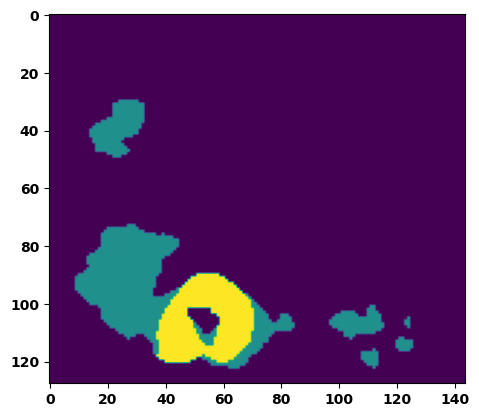

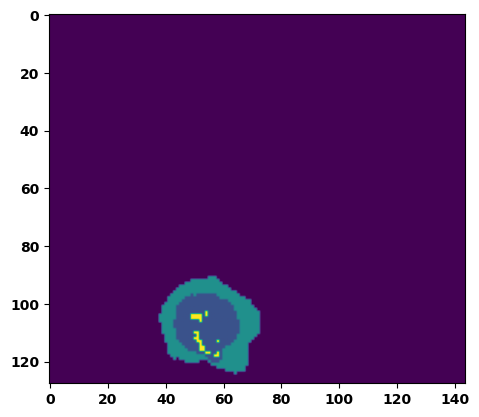

  6%|▌         | 2/36 [00:02<00:49,  1.46s/it]

Batch_id:  1 Eval loss:  0.39924296736717224
Batch_id:  1 Eval IoU:  tensor(0.5298, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9841, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:44,  1.35s/it]

Batch_id:  2 Eval loss:  0.9020956158638
Batch_id:  2 Eval IoU:  tensor(0.0576, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.4605, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3345, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.1923, device='cuda:0')


 11%|█         | 4/36 [00:05<00:43,  1.37s/it]

Batch_id:  3 Eval loss:  0.7255299687385559
Batch_id:  3 Eval IoU:  tensor(0.2191, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8236, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.7505, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8882, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8460, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9861, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.39s/it]

Batch_id:  4 Eval loss:  0.5572136640548706
Batch_id:  4 Eval IoU:  tensor(0.4023, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.44s/it]

Batch_id:  5 Eval loss:  0.6776876449584961
Batch_id:  5 Eval IoU:  tensor(0.2190, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6986, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.5979, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.7762, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.7697, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9521, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.7583651542663574
Batch_id:  6 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.38s/it]

Batch_id:  7 Eval loss:  0.6561606526374817
Batch_id:  7 Eval IoU:  tensor(0.2911, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:36,  1.37s/it]

Batch_id:  8 Eval loss:  0.7747735381126404
Batch_id:  8 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:35,  1.35s/it]

Batch_id:  9 Eval loss:  0.7527823448181152
Batch_id:  9 Eval IoU:  tensor(0.1561, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.5373, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.3865, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.3112, device='cuda:0')
Batch_id:  10 Eval loss:  0.13588643074035645
Batch_id:  10 Eval IoU:  tensor(0.8039, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9982, device='cuda:0')


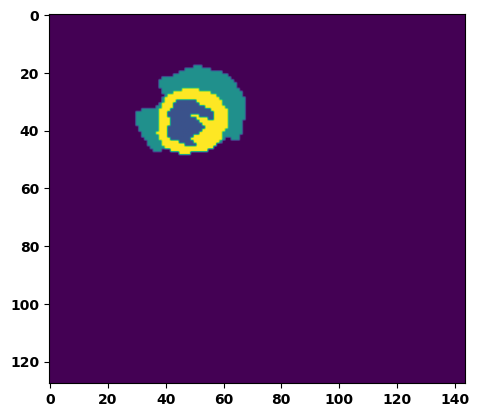

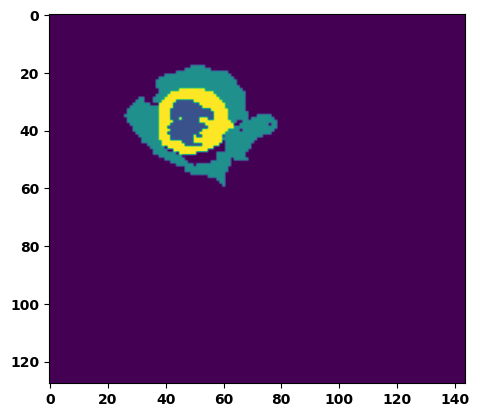

 33%|███▎      | 12/36 [00:16<00:34,  1.44s/it]

Batch_id:  11 Eval loss:  0.81734299659729
Batch_id:  11 Eval IoU:  tensor(0.1179, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.4929, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.2419, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.2774, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9886, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.42s/it]

Batch_id:  12 Eval loss:  0.732268214225769
Batch_id:  12 Eval IoU:  tensor(0.1898, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.4919, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3072, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.2766, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:31,  1.43s/it]

Batch_id:  13 Eval loss:  0.07388627529144287
Batch_id:  13 Eval IoU:  tensor(0.8711, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9887, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:31,  1.48s/it]

Batch_id:  14 Eval loss:  0.46820151805877686
Batch_id:  14 Eval IoU:  tensor(0.4299, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.7623, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.6507, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.6543, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:29,  1.47s/it]

Batch_id:  15 Eval loss:  0.2384594976902008
Batch_id:  15 Eval IoU:  tensor(0.6475, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.43s/it]

Batch_id:  16 Eval loss:  0.5887065529823303
Batch_id:  16 Eval IoU:  tensor(0.3354, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9660, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.44s/it]

Batch_id:  17 Eval loss:  0.6917479634284973
Batch_id:  17 Eval IoU:  tensor(0.2704, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9295, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9748, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.45s/it]

Batch_id:  18 Eval loss:  0.7767386436462402
Batch_id:  18 Eval IoU:  tensor(0.1527, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6485, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.5416, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9097, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.5503, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9438, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:23,  1.44s/it]

Batch_id:  19 Eval loss:  0.7515749931335449
Batch_id:  19 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  20 Eval loss:  0.23317864537239075
Batch_id:  20 Eval IoU:  tensor(0.6520, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9622, device='cuda:0')


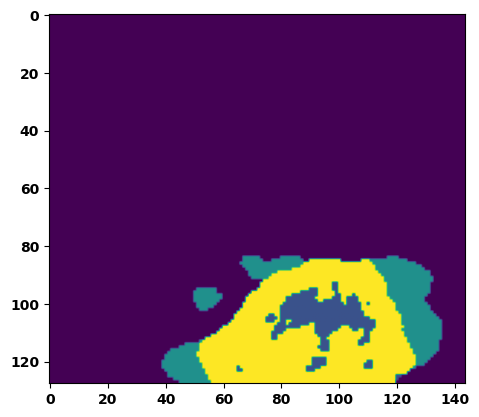

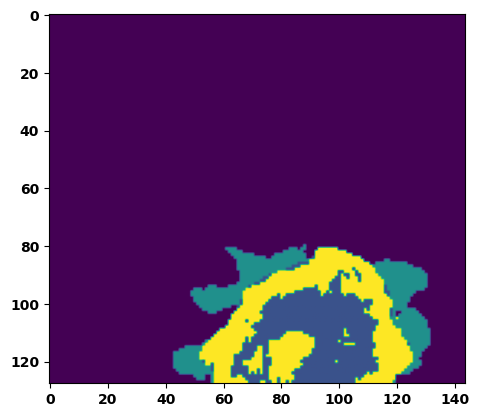

 61%|██████    | 22/36 [00:31<00:20,  1.47s/it]

Batch_id:  21 Eval loss:  0.5358232259750366
Batch_id:  21 Eval IoU:  tensor(0.4300, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.40s/it]

Batch_id:  22 Eval loss:  0.8524413108825684
Batch_id:  22 Eval IoU:  tensor(0.0941, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.5334, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.4397, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.8606, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.3987, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:16,  1.40s/it]

Batch_id:  23 Eval loss:  0.49272239208221436
Batch_id:  23 Eval IoU:  tensor(0.4347, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9819, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.44s/it]

Batch_id:  24 Eval loss:  0.18227684497833252
Batch_id:  24 Eval IoU:  tensor(0.7248, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:13,  1.40s/it]

Batch_id:  25 Eval loss:  0.17303398251533508
Batch_id:  25 Eval IoU:  tensor(0.7521, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.38s/it]

Batch_id:  26 Eval loss:  0.1759844422340393
Batch_id:  26 Eval IoU:  tensor(0.7317, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:10,  1.37s/it]

Batch_id:  27 Eval loss:  0.6133113503456116
Batch_id:  27 Eval IoU:  tensor(0.3291, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.41s/it]

Batch_id:  28 Eval loss:  0.31973421573638916
Batch_id:  28 Eval IoU:  tensor(0.5811, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9884, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.38s/it]

Batch_id:  29 Eval loss:  0.8817511796951294
Batch_id:  29 Eval IoU:  tensor(0.0757, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.4976, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.4206, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9041, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.2479, device='cuda:0')
Batch_id:  30 Eval loss:  0.43103379011154175
Batch_id:  30 Eval IoU:  tensor(0.4740, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9206, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9272, device='cuda:0')


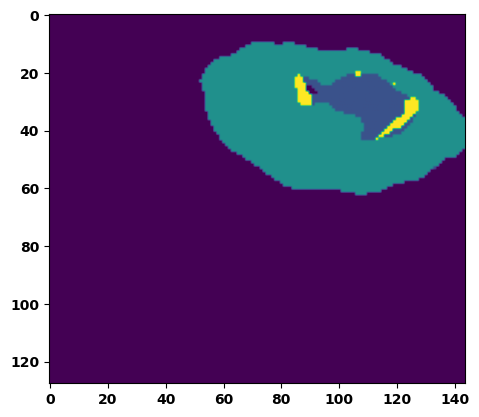

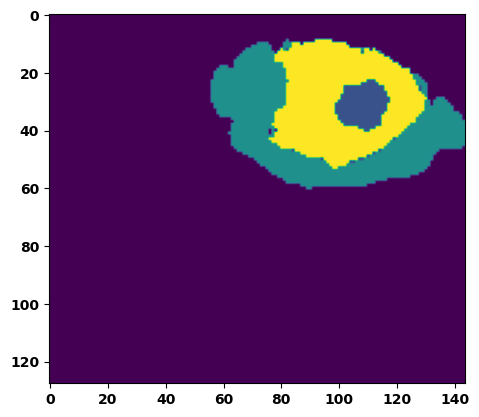

 89%|████████▉ | 32/36 [00:45<00:05,  1.43s/it]

Batch_id:  31 Eval loss:  0.6005820035934448
Batch_id:  31 Eval IoU:  tensor(0.2960, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7691, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.7290, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.7070, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9579, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.48s/it]

Batch_id:  32 Eval loss:  0.7563575506210327
Batch_id:  32 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.43s/it]

Batch_id:  33 Eval loss:  0.7680907249450684
Batch_id:  33 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.5310072898864746
Batch_id:  34 Eval IoU:  tensor(0.4188, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9194, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9297, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.42s/it]

Batch_id:  35 Eval loss:  0.3265722393989563
Batch_id:  35 Eval IoU:  tensor(0.5684, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')
Epoch  16 Training loss:  0.16227547377347945
Epoch  16 Evaluation loss:  0.5546483314699597
Epoch  16 Training accuracy :  tensor(0.7698)
Epoch  16 Evaluation accuracy :  tensor(0.3810)
Epoch  16 Training Mean Dice Score:  tensor(0.9812)
Epoch  16 Eval Mean Dice Score:  tensor(0.8518)
Epoch  16 Training Non-tumor Dice Score:  tensor(0.9827)
Epoch  16 Eval Non-tumor Dice Score:  tensor(0.8091)
Epoch  16 Training NCR/NET Dice Score:  tensor(0.9912)
Epoch  16 Eval NCR/NET Dice Score:  tensor(0.9619)
Epoch  16 Training ED Dice Score:  tensor(0.97

Epoch: 17
Training in session: 


  1%|          | 1/110 [00:01<02:57,  1.63s/it]

Batch_id:  0 Training loss:  0.09471964836120605
Batch_id:  0 Training IoU:  tensor(0.8425, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:36,  1.45s/it]

Batch_id:  1 Training loss:  0.15228882431983948
Batch_id:  1 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:31,  1.41s/it]

Batch_id:  2 Training loss:  0.11016085743904114
Batch_id:  2 Training IoU:  tensor(0.8171, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:29,  1.41s/it]

Batch_id:  3 Training loss:  0.2185761034488678
Batch_id:  3 Training IoU:  tensor(0.7375, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


  5%|▍         | 5/110 [00:06<02:22,  1.36s/it]

Batch_id:  4 Training loss:  0.1322878748178482
Batch_id:  4 Training IoU:  tensor(0.7802, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:37,  1.52s/it]

Batch_id:  5 Training loss:  0.24024032056331635
Batch_id:  5 Training IoU:  tensor(0.6427, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9370, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9712, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:34,  1.50s/it]

Batch_id:  6 Training loss:  0.05735720694065094
Batch_id:  6 Training IoU:  tensor(0.9045, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:29,  1.47s/it]

Batch_id:  7 Training loss:  0.06526798009872437
Batch_id:  7 Training IoU:  tensor(0.8895, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:26,  1.45s/it]

Batch_id:  8 Training loss:  0.2104172557592392
Batch_id:  8 Training IoU:  tensor(0.7632, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:23,  1.43s/it]

Batch_id:  9 Training loss:  0.21852147579193115
Batch_id:  9 Training IoU:  tensor(0.6876, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 10%|█         | 11/110 [00:15<02:17,  1.39s/it]

Batch_id:  10 Training loss:  0.2344648689031601
Batch_id:  10 Training IoU:  tensor(0.6958, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 11%|█         | 12/110 [00:17<02:16,  1.39s/it]

Batch_id:  11 Training loss:  0.11726200580596924
Batch_id:  11 Training IoU:  tensor(0.8129, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:16,  1.40s/it]

Batch_id:  12 Training loss:  0.26326149702072144
Batch_id:  12 Training IoU:  tensor(0.6725, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:26,  1.52s/it]

Batch_id:  13 Training loss:  0.15111057460308075
Batch_id:  13 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:19,  1.47s/it]

Batch_id:  14 Training loss:  0.12132735550403595
Batch_id:  14 Training IoU:  tensor(0.8106, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:20,  1.50s/it]

Batch_id:  15 Training loss:  0.13788826763629913
Batch_id:  15 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:16,  1.47s/it]

Batch_id:  16 Training loss:  0.17774228751659393
Batch_id:  16 Training IoU:  tensor(0.7223, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:14,  1.47s/it]

Batch_id:  17 Training loss:  0.08440320193767548
Batch_id:  17 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:15,  1.49s/it]

Batch_id:  18 Training loss:  0.10690104961395264
Batch_id:  18 Training IoU:  tensor(0.8336, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:10,  1.45s/it]

Batch_id:  19 Training loss:  0.14155861735343933
Batch_id:  19 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:13,  1.50s/it]

Batch_id:  20 Training loss:  0.11691723763942719
Batch_id:  20 Training IoU:  tensor(0.9066, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 20%|██        | 22/110 [00:32<02:07,  1.45s/it]

Batch_id:  21 Training loss:  0.11298339068889618
Batch_id:  21 Training IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 21%|██        | 23/110 [00:33<02:03,  1.42s/it]

Batch_id:  22 Training loss:  0.09818853437900543
Batch_id:  22 Training IoU:  tensor(0.8334, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:02,  1.43s/it]

Batch_id:  23 Training loss:  0.27822524309158325
Batch_id:  23 Training IoU:  tensor(0.6630, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 23%|██▎       | 25/110 [00:36<01:59,  1.41s/it]

Batch_id:  24 Training loss:  0.10278093814849854
Batch_id:  24 Training IoU:  tensor(0.8331, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:00,  1.44s/it]

Batch_id:  25 Training loss:  0.1576911062002182
Batch_id:  25 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9695, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:58,  1.43s/it]

Batch_id:  26 Training loss:  0.19188931584358215
Batch_id:  26 Training IoU:  tensor(0.7043, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9809, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:52,  1.37s/it]

Batch_id:  27 Training loss:  0.37935036420822144
Batch_id:  27 Training IoU:  tensor(0.5149, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:52,  1.39s/it]

Batch_id:  28 Training loss:  0.17958131432533264
Batch_id:  28 Training IoU:  tensor(0.7289, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:53,  1.42s/it]

Batch_id:  29 Training loss:  0.44922560453414917
Batch_id:  29 Training IoU:  tensor(0.4602, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9564, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:54,  1.45s/it]

Batch_id:  30 Training loss:  0.13865593075752258
Batch_id:  30 Training IoU:  tensor(0.7812, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:54,  1.47s/it]

Batch_id:  31 Training loss:  0.25069183111190796
Batch_id:  31 Training IoU:  tensor(0.6689, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 30%|███       | 33/110 [00:47<01:47,  1.39s/it]

Batch_id:  32 Training loss:  0.2916407883167267
Batch_id:  32 Training IoU:  tensor(0.5988, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9844, device='cuda:0')


 31%|███       | 34/110 [00:48<01:48,  1.42s/it]

Batch_id:  33 Training loss:  0.1074395477771759
Batch_id:  33 Training IoU:  tensor(0.8302, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:48,  1.44s/it]

Batch_id:  34 Training loss:  0.3353639841079712
Batch_id:  34 Training IoU:  tensor(0.6116, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:44,  1.41s/it]

Batch_id:  35 Training loss:  0.13860082626342773
Batch_id:  35 Training IoU:  tensor(0.7860, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:44,  1.43s/it]

Batch_id:  36 Training loss:  0.28022903203964233
Batch_id:  36 Training IoU:  tensor(0.6550, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:40,  1.39s/it]

Batch_id:  37 Training loss:  0.1351632922887802
Batch_id:  37 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:43,  1.45s/it]

Batch_id:  38 Training loss:  0.220198392868042
Batch_id:  38 Training IoU:  tensor(0.7456, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:43,  1.48s/it]

Batch_id:  39 Training loss:  0.20922788977622986
Batch_id:  39 Training IoU:  tensor(0.7311, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:41,  1.47s/it]

Batch_id:  40 Training loss:  0.10536494851112366
Batch_id:  40 Training IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:39,  1.46s/it]

Batch_id:  41 Training loss:  0.15796934068202972
Batch_id:  41 Training IoU:  tensor(0.7450, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:35,  1.42s/it]

Batch_id:  42 Training loss:  0.09701094031333923
Batch_id:  42 Training IoU:  tensor(0.8362, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 40%|████      | 44/110 [01:03<01:33,  1.41s/it]

Batch_id:  43 Training loss:  0.16727040708065033
Batch_id:  43 Training IoU:  tensor(0.7595, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 41%|████      | 45/110 [01:04<01:30,  1.39s/it]

Batch_id:  44 Training loss:  0.16665874421596527
Batch_id:  44 Training IoU:  tensor(0.7886, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:28,  1.39s/it]

Batch_id:  45 Training loss:  0.15047922730445862
Batch_id:  45 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:29,  1.43s/it]

Batch_id:  46 Training loss:  0.16408781707286835
Batch_id:  46 Training IoU:  tensor(0.7700, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:26,  1.40s/it]

Batch_id:  47 Training loss:  0.10928809642791748
Batch_id:  47 Training IoU:  tensor(0.8184, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:26,  1.42s/it]

Batch_id:  48 Training loss:  0.14642329514026642
Batch_id:  48 Training IoU:  tensor(0.7699, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:26,  1.44s/it]

Batch_id:  49 Training loss:  0.06042703986167908
Batch_id:  49 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:24,  1.44s/it]

Batch_id:  50 Training loss:  0.09475542604923248
Batch_id:  50 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:23,  1.44s/it]

Batch_id:  51 Training loss:  0.13546296954154968
Batch_id:  51 Training IoU:  tensor(0.7863, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:20,  1.41s/it]

Batch_id:  52 Training loss:  0.14846909046173096
Batch_id:  52 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:17,  1.39s/it]

Batch_id:  53 Training loss:  0.13773901760578156
Batch_id:  53 Training IoU:  tensor(0.7936, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:20,  1.47s/it]

Batch_id:  54 Training loss:  0.10361140966415405
Batch_id:  54 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:16,  1.43s/it]

Batch_id:  55 Training loss:  0.07172854244709015
Batch_id:  55 Training IoU:  tensor(0.8810, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 52%|█████▏    | 57/110 [01:21<01:15,  1.43s/it]

Batch_id:  56 Training loss:  0.09359350800514221
Batch_id:  56 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:14,  1.43s/it]

Batch_id:  57 Training loss:  0.08514893054962158
Batch_id:  57 Training IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 54%|█████▎    | 59/110 [01:24<01:11,  1.40s/it]

Batch_id:  58 Training loss:  0.2370675653219223
Batch_id:  58 Training IoU:  tensor(0.6569, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:18,  1.58s/it]

Batch_id:  59 Training loss:  0.12091906368732452
Batch_id:  59 Training IoU:  tensor(0.8307, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:15,  1.53s/it]

Batch_id:  60 Training loss:  0.07910753786563873
Batch_id:  60 Training IoU:  tensor(0.8712, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:11,  1.48s/it]

Batch_id:  61 Training loss:  0.2678644061088562
Batch_id:  61 Training IoU:  tensor(0.6864, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:10,  1.50s/it]

Batch_id:  62 Training loss:  0.2841736078262329
Batch_id:  62 Training IoU:  tensor(0.6280, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:09,  1.50s/it]

Batch_id:  63 Training loss:  0.1434219628572464
Batch_id:  63 Training IoU:  tensor(0.8050, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 59%|█████▉    | 65/110 [01:33<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.2710941433906555
Batch_id:  64 Training IoU:  tensor(0.6769, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:06,  1.52s/it]

Batch_id:  65 Training loss:  0.12602338194847107
Batch_id:  65 Training IoU:  tensor(0.7972, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:03,  1.49s/it]

Batch_id:  66 Training loss:  0.15822404623031616
Batch_id:  66 Training IoU:  tensor(0.7489, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<01:01,  1.46s/it]

Batch_id:  67 Training loss:  0.33440086245536804
Batch_id:  67 Training IoU:  tensor(0.5948, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.15796291828155518
Batch_id:  68 Training IoU:  tensor(0.7645, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:58,  1.46s/it]

Batch_id:  69 Training loss:  0.41326993703842163
Batch_id:  69 Training IoU:  tensor(0.4974, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:57,  1.46s/it]

Batch_id:  70 Training loss:  0.09612421691417694
Batch_id:  70 Training IoU:  tensor(0.8407, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:56,  1.50s/it]

Batch_id:  71 Training loss:  0.16244341433048248
Batch_id:  71 Training IoU:  tensor(0.7430, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:54,  1.47s/it]

Batch_id:  72 Training loss:  0.09046386182308197
Batch_id:  72 Training IoU:  tensor(0.8499, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.23308618366718292
Batch_id:  73 Training IoU:  tensor(0.6543, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:52,  1.50s/it]

Batch_id:  74 Training loss:  0.05510595440864563
Batch_id:  74 Training IoU:  tensor(0.9111, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:50,  1.47s/it]

Batch_id:  75 Training loss:  0.20270505547523499
Batch_id:  75 Training IoU:  tensor(0.6937, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.2919537425041199
Batch_id:  76 Training IoU:  tensor(0.6567, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:46,  1.45s/it]

Batch_id:  77 Training loss:  0.2574164569377899
Batch_id:  77 Training IoU:  tensor(0.6460, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:44,  1.43s/it]

Batch_id:  78 Training loss:  0.09239137172698975
Batch_id:  78 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:43,  1.43s/it]

Batch_id:  79 Training loss:  0.05969296395778656
Batch_id:  79 Training IoU:  tensor(0.9001, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:43,  1.49s/it]

Batch_id:  80 Training loss:  0.18912485241889954
Batch_id:  80 Training IoU:  tensor(0.7195, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:42,  1.52s/it]

Batch_id:  81 Training loss:  0.24311712384223938
Batch_id:  81 Training IoU:  tensor(0.6675, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:41,  1.55s/it]

Batch_id:  82 Training loss:  0.07456938922405243
Batch_id:  82 Training IoU:  tensor(0.8762, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:39,  1.52s/it]

Batch_id:  83 Training loss:  0.2399652600288391
Batch_id:  83 Training IoU:  tensor(0.6823, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:38,  1.56s/it]

Batch_id:  84 Training loss:  0.2572605609893799
Batch_id:  84 Training IoU:  tensor(0.6432, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9606, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:36,  1.54s/it]

Batch_id:  85 Training loss:  0.08249892294406891
Batch_id:  85 Training IoU:  tensor(0.8608, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:34,  1.50s/it]

Batch_id:  86 Training loss:  0.11235243082046509
Batch_id:  86 Training IoU:  tensor(0.8131, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 80%|████████  | 88/110 [02:08<00:33,  1.52s/it]

Batch_id:  87 Training loss:  0.09654349088668823
Batch_id:  87 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:31,  1.51s/it]

Batch_id:  88 Training loss:  0.2923688292503357
Batch_id:  88 Training IoU:  tensor(0.6326, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:30,  1.54s/it]

Batch_id:  89 Training loss:  0.06874130666255951
Batch_id:  89 Training IoU:  tensor(0.8866, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:29,  1.56s/it]

Batch_id:  90 Training loss:  0.1034231185913086
Batch_id:  90 Training IoU:  tensor(0.8255, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:28,  1.57s/it]

Batch_id:  91 Training loss:  0.07885602116584778
Batch_id:  91 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:26,  1.55s/it]

Batch_id:  92 Training loss:  0.24552562832832336
Batch_id:  92 Training IoU:  tensor(0.6363, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:24,  1.55s/it]

Batch_id:  93 Training loss:  0.07009018957614899
Batch_id:  93 Training IoU:  tensor(0.8894, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:23,  1.58s/it]

Batch_id:  94 Training loss:  0.1711122840642929
Batch_id:  94 Training IoU:  tensor(0.7397, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:21,  1.56s/it]

Batch_id:  95 Training loss:  0.07119673490524292
Batch_id:  95 Training IoU:  tensor(0.8828, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:20,  1.55s/it]

Batch_id:  96 Training loss:  0.06756936013698578
Batch_id:  96 Training IoU:  tensor(0.8824, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:18,  1.55s/it]

Batch_id:  97 Training loss:  0.1387975662946701
Batch_id:  97 Training IoU:  tensor(0.7755, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.52s/it]

Batch_id:  98 Training loss:  0.19964103400707245
Batch_id:  98 Training IoU:  tensor(0.6929, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:15,  1.55s/it]

Batch_id:  99 Training loss:  0.10279099643230438
Batch_id:  99 Training IoU:  tensor(0.8250, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.54s/it]

Batch_id:  100 Training loss:  0.19435347616672516
Batch_id:  100 Training IoU:  tensor(0.7225, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:12,  1.54s/it]

Batch_id:  101 Training loss:  0.10246239602565765
Batch_id:  101 Training IoU:  tensor(0.8845, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.52s/it]

Batch_id:  102 Training loss:  0.10486912727355957
Batch_id:  102 Training IoU:  tensor(0.8301, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:09,  1.53s/it]

Batch_id:  103 Training loss:  0.13088460266590118
Batch_id:  103 Training IoU:  tensor(0.8025, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.52s/it]

Batch_id:  104 Training loss:  0.061570197343826294
Batch_id:  104 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:06,  1.52s/it]

Batch_id:  105 Training loss:  0.09742861986160278
Batch_id:  105 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.50s/it]

Batch_id:  106 Training loss:  0.12286785244941711
Batch_id:  106 Training IoU:  tensor(0.8103, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:02,  1.48s/it]

Batch_id:  107 Training loss:  0.17343635857105255
Batch_id:  107 Training IoU:  tensor(0.7431, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.53s/it]

Batch_id:  108 Training loss:  0.032683223485946655
Batch_id:  108 Training IoU:  tensor(0.9480, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.21587695181369781
Batch_id:  109 Training IoU:  tensor(0.7091, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9948, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.3625996708869934
Batch_id:  0 Eval IoU:  tensor(0.5244, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


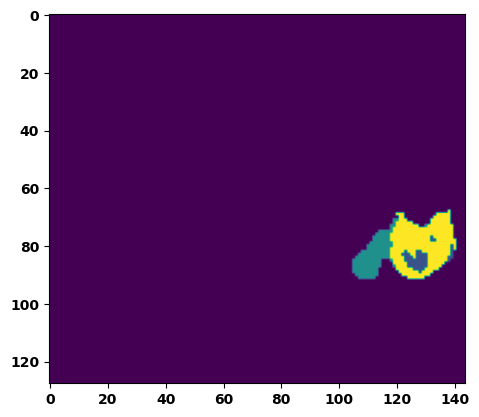

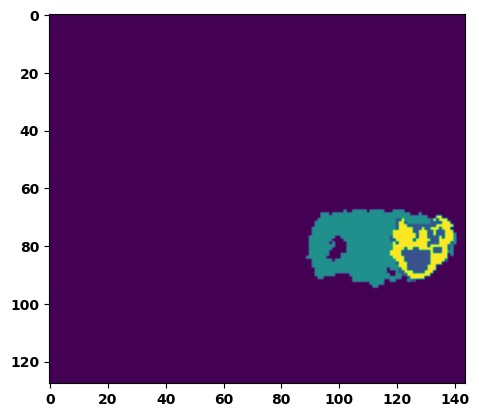

  6%|▌         | 2/36 [00:02<00:49,  1.45s/it]

Batch_id:  1 Eval loss:  0.8008617758750916
Batch_id:  1 Eval IoU:  tensor(0.1206, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.5280, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.3802, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.2976, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:48,  1.48s/it]

Batch_id:  2 Eval loss:  0.4705057740211487
Batch_id:  2 Eval IoU:  tensor(0.4259, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.7615, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.6506, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.7017, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9885, device='cuda:0')


 11%|█         | 4/36 [00:05<00:47,  1.49s/it]

Batch_id:  3 Eval loss:  0.42199233174324036
Batch_id:  3 Eval IoU:  tensor(0.4602, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9863, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.47s/it]

Batch_id:  4 Eval loss:  0.6143230199813843
Batch_id:  4 Eval IoU:  tensor(0.3259, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9100, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8669, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9171, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:48,  1.60s/it]

Batch_id:  5 Eval loss:  0.4769272804260254
Batch_id:  5 Eval IoU:  tensor(0.3967, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.7822, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.6985, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.7050, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9759, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:44,  1.55s/it]

Batch_id:  6 Eval loss:  0.06273333728313446
Batch_id:  6 Eval IoU:  tensor(0.8895, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9888, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:41,  1.48s/it]

Batch_id:  7 Eval loss:  0.19474321603775024
Batch_id:  7 Eval IoU:  tensor(0.7002, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:40,  1.49s/it]

Batch_id:  8 Eval loss:  0.7062883973121643
Batch_id:  8 Eval IoU:  tensor(0.1976, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6826, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.5867, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.5346, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9494, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.46s/it]

Batch_id:  9 Eval loss:  0.2707061767578125
Batch_id:  9 Eval IoU:  tensor(0.6313, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  10 Eval loss:  0.8194030523300171
Batch_id:  10 Eval IoU:  tensor(0.1041, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.4648, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3044, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.2020, device='cuda:0')


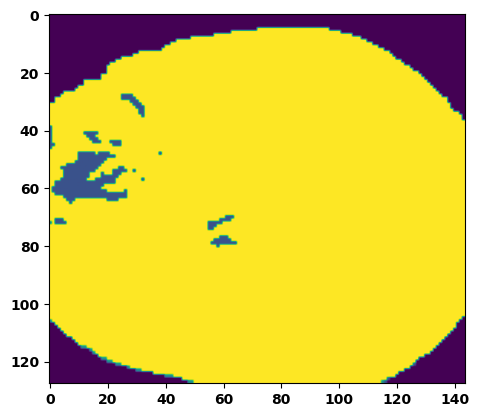

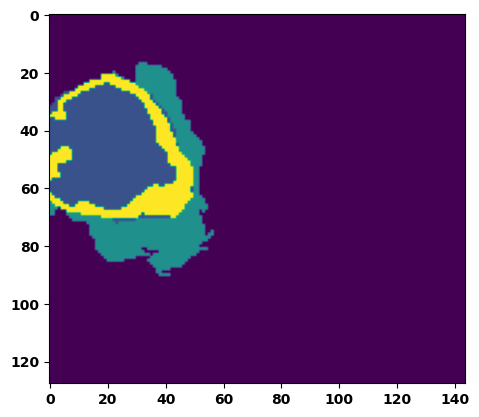

 33%|███▎      | 12/36 [00:18<00:37,  1.55s/it]

Batch_id:  11 Eval loss:  0.7516266107559204
Batch_id:  11 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.52s/it]

Batch_id:  12 Eval loss:  0.3071632385253906
Batch_id:  12 Eval IoU:  tensor(0.5708, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9482, device='cuda:0')


 39%|███▉      | 14/36 [00:21<00:32,  1.48s/it]

Batch_id:  13 Eval loss:  0.6546390652656555
Batch_id:  13 Eval IoU:  tensor(0.2905, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9310, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9319, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9199, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9763, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.44s/it]

Batch_id:  14 Eval loss:  0.7748465538024902
Batch_id:  14 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.43s/it]

Batch_id:  15 Eval loss:  0.1533566564321518
Batch_id:  15 Eval IoU:  tensor(0.7702, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.48s/it]

Batch_id:  16 Eval loss:  0.3212566375732422
Batch_id:  16 Eval IoU:  tensor(0.6322, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9915, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.46s/it]

Batch_id:  17 Eval loss:  0.7681529521942139
Batch_id:  17 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:25,  1.49s/it]

Batch_id:  18 Eval loss:  0.11827145516872406
Batch_id:  18 Eval IoU:  tensor(0.8186, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.44s/it]

Batch_id:  19 Eval loss:  0.1525675654411316
Batch_id:  19 Eval IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  20 Eval loss:  0.8532440662384033
Batch_id:  20 Eval IoU:  tensor(0.0941, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.5324, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.4386, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3124, device='cuda:0')


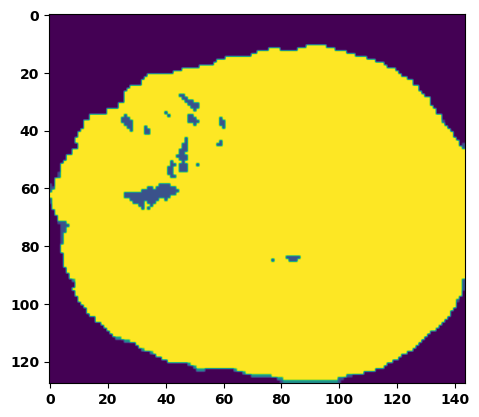

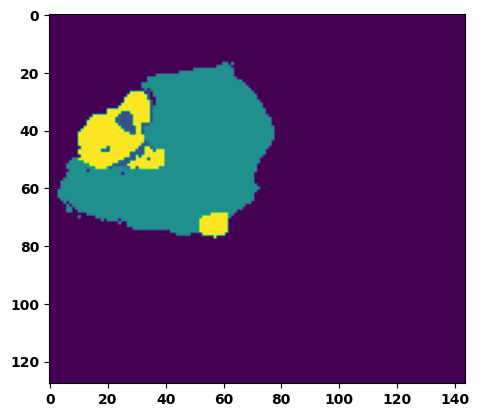

 61%|██████    | 22/36 [00:32<00:20,  1.45s/it]

Batch_id:  21 Eval loss:  0.650672197341919
Batch_id:  21 Eval IoU:  tensor(0.3056, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.40s/it]

Batch_id:  22 Eval loss:  0.5640074014663696
Batch_id:  22 Eval IoU:  tensor(0.3246, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7950, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.7559, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.7387, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:16,  1.41s/it]

Batch_id:  23 Eval loss:  0.6801802515983582
Batch_id:  23 Eval IoU:  tensor(0.2350, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.5735, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4190, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3852, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.37s/it]

Batch_id:  24 Eval loss:  0.10669848322868347
Batch_id:  24 Eval IoU:  tensor(0.8244, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:13,  1.34s/it]

Batch_id:  25 Eval loss:  0.9031161665916443
Batch_id:  25 Eval IoU:  tensor(0.0570, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4598, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3335, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9012, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.1912, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:12,  1.37s/it]

Batch_id:  26 Eval loss:  0.9208930730819702
Batch_id:  26 Eval IoU:  tensor(0.0461, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.4514, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.1979, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9055, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.3204, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.40s/it]

Batch_id:  27 Eval loss:  0.6706662774085999
Batch_id:  27 Eval IoU:  tensor(0.2169, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.5449, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3563, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3553, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:09,  1.36s/it]

Batch_id:  28 Eval loss:  0.2580585777759552
Batch_id:  28 Eval IoU:  tensor(0.6220, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.40s/it]

Batch_id:  29 Eval loss:  0.7562191486358643
Batch_id:  29 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  30 Eval loss:  0.7581204175949097
Batch_id:  30 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


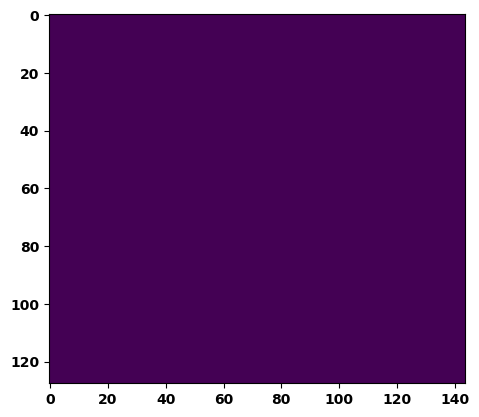

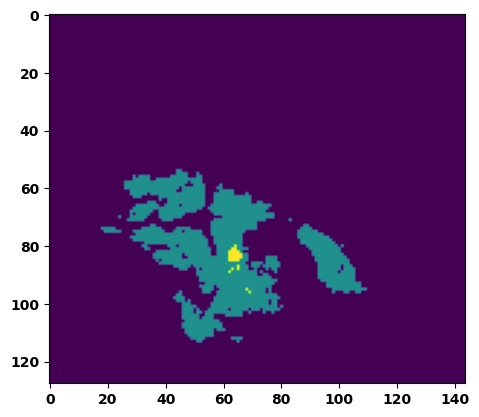

 89%|████████▉ | 32/36 [00:46<00:05,  1.39s/it]

Batch_id:  31 Eval loss:  0.4560527801513672
Batch_id:  31 Eval IoU:  tensor(0.4715, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.47s/it]

Batch_id:  32 Eval loss:  0.6192542910575867
Batch_id:  32 Eval IoU:  tensor(0.2991, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8796, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8308, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8413, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.46s/it]

Batch_id:  33 Eval loss:  0.5802252888679504
Batch_id:  33 Eval IoU:  tensor(0.3657, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.40s/it]

Batch_id:  34 Eval loss:  0.6291723251342773
Batch_id:  34 Eval IoU:  tensor(0.3245, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.45s/it]

Batch_id:  35 Eval loss:  0.8838138580322266
Batch_id:  35 Eval IoU:  tensor(0.0741, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4943, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4156, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9038, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2437, device='cuda:0')
Epoch  17 Training loss:  0.16074710136110132
Epoch  17 Evaluation loss:  0.5414822047783269
Epoch  17 Training accuracy :  tensor(0.7711)
Epoch  17 Evaluation accuracy :  tensor(0.3898)
Epoch  17 Training Mean Dice Score:  tensor(0.9814)
Epoch  17 Eval Mean Dice Score:  tensor(0.8357)
Epoch  17 Training Non-tumor Dice Score:  tensor(0.9826)
Epoch  17 Eval Non-tumor Dice Score:  tensor(0.7852)
Epoch  17 Training NCR/NET Dice Score:  tensor(0.9913)
Epoch  17 Eval NCR/NET Dice Score:  tensor(0.9713)
Epoch  17 Training ED Dice Score:  tensor(0.97

Epoch completed and model successfully saved
Epoch: 18
Training in session: 


  1%|          | 1/110 [00:01<02:53,  1.59s/it]

Batch_id:  0 Training loss:  0.10105422139167786
Batch_id:  0 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:36,  1.44s/it]

Batch_id:  1 Training loss:  0.1456541270017624
Batch_id:  1 Training IoU:  tensor(0.7655, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:35,  1.45s/it]

Batch_id:  2 Training loss:  0.12057788670063019
Batch_id:  2 Training IoU:  tensor(0.8086, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:42,  1.54s/it]

Batch_id:  3 Training loss:  0.07613810896873474
Batch_id:  3 Training IoU:  tensor(0.8722, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:34,  1.47s/it]

Batch_id:  4 Training loss:  0.392975389957428
Batch_id:  4 Training IoU:  tensor(0.5177, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:27,  1.42s/it]

Batch_id:  5 Training loss:  0.10667961835861206
Batch_id:  5 Training IoU:  tensor(0.8271, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:24,  1.40s/it]

Batch_id:  6 Training loss:  0.11611561477184296
Batch_id:  6 Training IoU:  tensor(0.8050, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:24,  1.42s/it]

Batch_id:  7 Training loss:  0.3769605755805969
Batch_id:  7 Training IoU:  tensor(0.5129, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:16,  1.35s/it]

Batch_id:  8 Training loss:  0.09996746480464935
Batch_id:  8 Training IoU:  tensor(0.8309, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:16,  1.36s/it]

Batch_id:  9 Training loss:  0.08301977813243866
Batch_id:  9 Training IoU:  tensor(0.8648, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 10%|█         | 11/110 [00:15<02:15,  1.37s/it]

Batch_id:  10 Training loss:  0.12738509476184845
Batch_id:  10 Training IoU:  tensor(0.7948, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 11%|█         | 12/110 [00:17<02:17,  1.41s/it]

Batch_id:  11 Training loss:  0.2781435251235962
Batch_id:  11 Training IoU:  tensor(0.6692, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:14,  1.39s/it]

Batch_id:  12 Training loss:  0.06137645244598389
Batch_id:  12 Training IoU:  tensor(0.8977, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 13%|█▎        | 14/110 [00:19<02:16,  1.42s/it]

Batch_id:  13 Training loss:  0.1214355081319809
Batch_id:  13 Training IoU:  tensor(0.7971, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:21,  1.49s/it]

Batch_id:  14 Training loss:  0.13994120061397552
Batch_id:  14 Training IoU:  tensor(0.8020, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 15%|█▍        | 16/110 [00:22<02:17,  1.47s/it]

Batch_id:  15 Training loss:  0.08732403814792633
Batch_id:  15 Training IoU:  tensor(0.8765, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:23,  1.55s/it]

Batch_id:  16 Training loss:  0.10265013575553894
Batch_id:  16 Training IoU:  tensor(0.8315, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:19,  1.52s/it]

Batch_id:  17 Training loss:  0.09358909726142883
Batch_id:  17 Training IoU:  tensor(0.8449, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:13,  1.47s/it]

Batch_id:  18 Training loss:  0.09637923538684845
Batch_id:  18 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:14,  1.50s/it]

Batch_id:  19 Training loss:  0.10405495762825012
Batch_id:  19 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:11,  1.48s/it]

Batch_id:  20 Training loss:  0.09584198892116547
Batch_id:  20 Training IoU:  tensor(0.8371, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 20%|██        | 22/110 [00:31<02:07,  1.45s/it]

Batch_id:  21 Training loss:  0.1532829850912094
Batch_id:  21 Training IoU:  tensor(0.7542, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 21%|██        | 23/110 [00:33<02:05,  1.44s/it]

Batch_id:  22 Training loss:  0.24148385226726532
Batch_id:  22 Training IoU:  tensor(0.6699, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:02,  1.43s/it]

Batch_id:  23 Training loss:  0.06550543010234833
Batch_id:  23 Training IoU:  tensor(0.8893, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 23%|██▎       | 25/110 [00:36<01:59,  1.41s/it]

Batch_id:  24 Training loss:  0.28287526965141296
Batch_id:  24 Training IoU:  tensor(0.6118, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:01,  1.45s/it]

Batch_id:  25 Training loss:  0.1386530101299286
Batch_id:  25 Training IoU:  tensor(0.8099, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:59,  1.44s/it]

Batch_id:  26 Training loss:  0.07758723199367523
Batch_id:  26 Training IoU:  tensor(0.8714, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:55,  1.41s/it]

Batch_id:  27 Training loss:  0.27480548620224
Batch_id:  27 Training IoU:  tensor(0.6489, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9756, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:54,  1.41s/it]

Batch_id:  28 Training loss:  0.14323441684246063
Batch_id:  28 Training IoU:  tensor(0.7736, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:49,  1.37s/it]

Batch_id:  29 Training loss:  0.14238706231117249
Batch_id:  29 Training IoU:  tensor(0.7743, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:48,  1.38s/it]

Batch_id:  30 Training loss:  0.22580954432487488
Batch_id:  30 Training IoU:  tensor(0.7288, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:50,  1.41s/it]

Batch_id:  31 Training loss:  0.1739838719367981
Batch_id:  31 Training IoU:  tensor(0.7477, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 30%|███       | 33/110 [00:47<01:47,  1.40s/it]

Batch_id:  32 Training loss:  0.11450642347335815
Batch_id:  32 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 31%|███       | 34/110 [00:48<01:46,  1.40s/it]

Batch_id:  33 Training loss:  0.07301920652389526
Batch_id:  33 Training IoU:  tensor(0.8733, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:49,  1.45s/it]

Batch_id:  34 Training loss:  0.06423619389533997
Batch_id:  34 Training IoU:  tensor(0.8940, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:46,  1.44s/it]

Batch_id:  35 Training loss:  0.10380560159683228
Batch_id:  35 Training IoU:  tensor(0.8588, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:46,  1.47s/it]

Batch_id:  36 Training loss:  0.1738170087337494
Batch_id:  36 Training IoU:  tensor(0.7285, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:43,  1.44s/it]

Batch_id:  37 Training loss:  0.24513451755046844
Batch_id:  37 Training IoU:  tensor(0.6379, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:41,  1.43s/it]

Batch_id:  38 Training loss:  0.12843061983585358
Batch_id:  38 Training IoU:  tensor(0.7863, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:40,  1.43s/it]

Batch_id:  39 Training loss:  0.19154156744480133
Batch_id:  39 Training IoU:  tensor(0.7072, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9814, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:36,  1.39s/it]

Batch_id:  40 Training loss:  0.10773101449012756
Batch_id:  40 Training IoU:  tensor(0.8281, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:42,  1.50s/it]

Batch_id:  41 Training loss:  0.2789211869239807
Batch_id:  41 Training IoU:  tensor(0.6491, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:38,  1.48s/it]

Batch_id:  42 Training loss:  0.07416079938411713
Batch_id:  42 Training IoU:  tensor(0.8781, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 40%|████      | 44/110 [01:03<01:34,  1.44s/it]

Batch_id:  43 Training loss:  0.2585821747779846
Batch_id:  43 Training IoU:  tensor(0.6526, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 41%|████      | 45/110 [01:04<01:30,  1.39s/it]

Batch_id:  44 Training loss:  0.1745924949645996
Batch_id:  44 Training IoU:  tensor(0.7333, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 42%|████▏     | 46/110 [01:05<01:29,  1.40s/it]

Batch_id:  45 Training loss:  0.13265679776668549
Batch_id:  45 Training IoU:  tensor(0.7953, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:24,  1.35s/it]

Batch_id:  46 Training loss:  0.17119969427585602
Batch_id:  46 Training IoU:  tensor(0.7384, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:28,  1.42s/it]

Batch_id:  47 Training loss:  0.17122341692447662
Batch_id:  47 Training IoU:  tensor(0.7530, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:27,  1.43s/it]

Batch_id:  48 Training loss:  0.09008817374706268
Batch_id:  48 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:24,  1.41s/it]

Batch_id:  49 Training loss:  0.27186936140060425
Batch_id:  49 Training IoU:  tensor(0.6835, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:23,  1.42s/it]

Batch_id:  50 Training loss:  0.15996266901493073
Batch_id:  50 Training IoU:  tensor(0.7430, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:30,  1.56s/it]

Batch_id:  51 Training loss:  0.0732661634683609
Batch_id:  51 Training IoU:  tensor(0.8813, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:28,  1.56s/it]

Batch_id:  52 Training loss:  0.12428544461727142
Batch_id:  52 Training IoU:  tensor(0.8205, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:23,  1.49s/it]

Batch_id:  53 Training loss:  0.2432529628276825
Batch_id:  53 Training IoU:  tensor(0.6535, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:22,  1.50s/it]

Batch_id:  54 Training loss:  0.20267900824546814
Batch_id:  54 Training IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:21,  1.51s/it]

Batch_id:  55 Training loss:  0.22311507165431976
Batch_id:  55 Training IoU:  tensor(0.6838, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:16,  1.44s/it]

Batch_id:  56 Training loss:  0.24428175389766693
Batch_id:  56 Training IoU:  tensor(0.6365, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9693, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:14,  1.42s/it]

Batch_id:  57 Training loss:  0.13970309495925903
Batch_id:  57 Training IoU:  tensor(0.7852, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:16,  1.50s/it]

Batch_id:  58 Training loss:  0.058112069964408875
Batch_id:  58 Training IoU:  tensor(0.9051, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:13,  1.47s/it]

Batch_id:  59 Training loss:  0.137687087059021
Batch_id:  59 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 55%|█████▌    | 61/110 [01:27<01:08,  1.41s/it]

Batch_id:  60 Training loss:  0.07373806834220886
Batch_id:  60 Training IoU:  tensor(0.8728, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:08,  1.43s/it]

Batch_id:  61 Training loss:  0.24034331738948822
Batch_id:  61 Training IoU:  tensor(0.6810, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:06,  1.41s/it]

Batch_id:  62 Training loss:  0.418620765209198
Batch_id:  62 Training IoU:  tensor(0.4934, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:04,  1.40s/it]

Batch_id:  63 Training loss:  0.1225505918264389
Batch_id:  63 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 59%|█████▉    | 65/110 [01:33<01:04,  1.42s/it]

Batch_id:  64 Training loss:  0.08921124041080475
Batch_id:  64 Training IoU:  tensor(0.8490, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:02,  1.43s/it]

Batch_id:  65 Training loss:  0.3568057119846344
Batch_id:  65 Training IoU:  tensor(0.5693, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:01,  1.43s/it]

Batch_id:  66 Training loss:  0.10289399325847626
Batch_id:  66 Training IoU:  tensor(0.8253, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 62%|██████▏   | 68/110 [01:37<01:01,  1.45s/it]

Batch_id:  67 Training loss:  0.10569889843463898
Batch_id:  67 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<00:59,  1.44s/it]

Batch_id:  68 Training loss:  0.15981602668762207
Batch_id:  68 Training IoU:  tensor(0.7502, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 64%|██████▎   | 70/110 [01:40<00:59,  1.49s/it]

Batch_id:  69 Training loss:  0.16438701748847961
Batch_id:  69 Training IoU:  tensor(0.7532, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9670, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:58,  1.49s/it]

Batch_id:  70 Training loss:  0.13047294318675995
Batch_id:  70 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 65%|██████▌   | 72/110 [01:43<00:56,  1.50s/it]

Batch_id:  71 Training loss:  0.17829182744026184
Batch_id:  71 Training IoU:  tensor(0.7805, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:56,  1.51s/it]

Batch_id:  72 Training loss:  0.10818666219711304
Batch_id:  72 Training IoU:  tensor(0.8685, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 67%|██████▋   | 74/110 [01:46<00:53,  1.49s/it]

Batch_id:  73 Training loss:  0.217695415019989
Batch_id:  73 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:51,  1.46s/it]

Batch_id:  74 Training loss:  0.18881282210350037
Batch_id:  74 Training IoU:  tensor(0.7222, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:54,  1.60s/it]

Batch_id:  75 Training loss:  0.26761454343795776
Batch_id:  75 Training IoU:  tensor(0.6674, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:50,  1.53s/it]

Batch_id:  76 Training loss:  0.1171083003282547
Batch_id:  76 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9865, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:49,  1.53s/it]

Batch_id:  77 Training loss:  0.05594035983085632
Batch_id:  77 Training IoU:  tensor(0.9119, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:47,  1.52s/it]

Batch_id:  78 Training loss:  0.10784661769866943
Batch_id:  78 Training IoU:  tensor(0.9234, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:45,  1.51s/it]

Batch_id:  79 Training loss:  0.044863611459732056
Batch_id:  79 Training IoU:  tensor(0.9256, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:44,  1.55s/it]

Batch_id:  80 Training loss:  0.12052977085113525
Batch_id:  80 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:41,  1.49s/it]

Batch_id:  81 Training loss:  0.07866601645946503
Batch_id:  81 Training IoU:  tensor(0.8730, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:39,  1.47s/it]

Batch_id:  82 Training loss:  0.06600849330425262
Batch_id:  82 Training IoU:  tensor(0.8873, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:38,  1.47s/it]

Batch_id:  83 Training loss:  0.17001596093177795
Batch_id:  83 Training IoU:  tensor(0.7378, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9685, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:36,  1.44s/it]

Batch_id:  84 Training loss:  0.18874314427375793
Batch_id:  84 Training IoU:  tensor(0.7469, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:35,  1.48s/it]

Batch_id:  85 Training loss:  0.09949301183223724
Batch_id:  85 Training IoU:  tensor(0.8482, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:32,  1.43s/it]

Batch_id:  86 Training loss:  0.10014830529689789
Batch_id:  86 Training IoU:  tensor(0.8346, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 80%|████████  | 88/110 [02:07<00:31,  1.42s/it]

Batch_id:  87 Training loss:  0.06913848221302032
Batch_id:  87 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:29,  1.38s/it]

Batch_id:  88 Training loss:  0.12116222083568573
Batch_id:  88 Training IoU:  tensor(0.8085, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 82%|████████▏ | 90/110 [02:10<00:28,  1.41s/it]

Batch_id:  89 Training loss:  0.0930548906326294
Batch_id:  89 Training IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 83%|████████▎ | 91/110 [02:11<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.2536253035068512
Batch_id:  90 Training IoU:  tensor(0.6615, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 84%|████████▎ | 92/110 [02:13<00:25,  1.43s/it]

Batch_id:  91 Training loss:  0.18016406893730164
Batch_id:  91 Training IoU:  tensor(0.7181, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 85%|████████▍ | 93/110 [02:14<00:24,  1.43s/it]

Batch_id:  92 Training loss:  0.2737523913383484
Batch_id:  92 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 85%|████████▌ | 94/110 [02:16<00:23,  1.47s/it]

Batch_id:  93 Training loss:  0.3308998644351959
Batch_id:  93 Training IoU:  tensor(0.6151, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 86%|████████▋ | 95/110 [02:17<00:21,  1.44s/it]

Batch_id:  94 Training loss:  0.24291746318340302
Batch_id:  94 Training IoU:  tensor(0.6893, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:20,  1.46s/it]

Batch_id:  95 Training loss:  0.22697289288043976
Batch_id:  95 Training IoU:  tensor(0.7178, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 88%|████████▊ | 97/110 [02:20<00:19,  1.46s/it]

Batch_id:  96 Training loss:  0.18075406551361084
Batch_id:  96 Training IoU:  tensor(0.7342, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:17,  1.49s/it]

Batch_id:  97 Training loss:  0.24963808059692383
Batch_id:  97 Training IoU:  tensor(0.6532, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9610, device='cuda:0')


 90%|█████████ | 99/110 [02:23<00:15,  1.44s/it]

Batch_id:  98 Training loss:  0.13416381180286407
Batch_id:  98 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:14,  1.46s/it]

Batch_id:  99 Training loss:  0.1429208517074585
Batch_id:  99 Training IoU:  tensor(0.7777, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 92%|█████████▏| 101/110 [02:26<00:13,  1.45s/it]

Batch_id:  100 Training loss:  0.18620726466178894
Batch_id:  100 Training IoU:  tensor(0.7102, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 93%|█████████▎| 102/110 [02:28<00:11,  1.49s/it]

Batch_id:  101 Training loss:  0.2838572859764099
Batch_id:  101 Training IoU:  tensor(0.6579, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 94%|█████████▎| 103/110 [02:29<00:10,  1.56s/it]

Batch_id:  102 Training loss:  0.12457478046417236
Batch_id:  102 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 95%|█████████▍| 104/110 [02:31<00:09,  1.56s/it]

Batch_id:  103 Training loss:  0.17404061555862427
Batch_id:  103 Training IoU:  tensor(0.7288, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 95%|█████████▌| 105/110 [02:32<00:07,  1.56s/it]

Batch_id:  104 Training loss:  0.16507196426391602
Batch_id:  104 Training IoU:  tensor(0.7614, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 96%|█████████▋| 106/110 [02:34<00:06,  1.55s/it]

Batch_id:  105 Training loss:  0.17238332331180573
Batch_id:  105 Training IoU:  tensor(0.7426, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 97%|█████████▋| 107/110 [02:35<00:04,  1.53s/it]

Batch_id:  106 Training loss:  0.08506157994270325
Batch_id:  106 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.07732328772544861
Batch_id:  107 Training IoU:  tensor(0.8702, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 99%|█████████▉| 109/110 [02:38<00:01,  1.51s/it]

Batch_id:  108 Training loss:  0.22780653834342957
Batch_id:  108 Training IoU:  tensor(0.7218, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


100%|██████████| 110/110 [02:40<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.07250513136386871
Batch_id:  109 Training IoU:  tensor(0.8739, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9909, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4158563017845154
Batch_id:  0 Eval IoU:  tensor(0.4847, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9307, device='cuda:0')


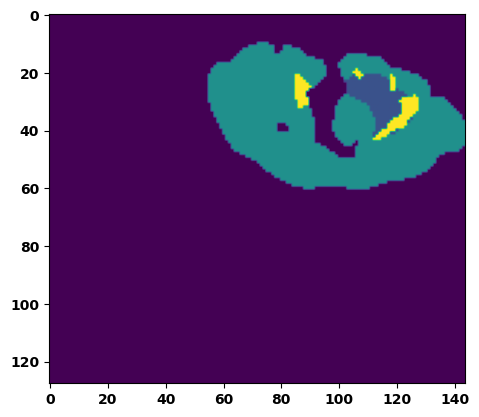

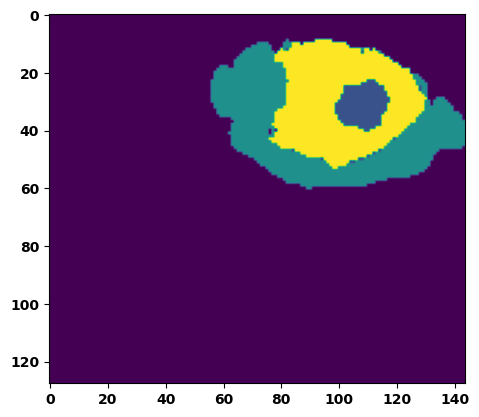

  6%|▌         | 2/36 [00:03<00:55,  1.64s/it]

Batch_id:  1 Eval loss:  0.1702485829591751
Batch_id:  1 Eval IoU:  tensor(0.7458, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9973, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:50,  1.53s/it]

Batch_id:  2 Eval loss:  0.6012390851974487
Batch_id:  2 Eval IoU:  tensor(0.3513, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9304, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.47s/it]

Batch_id:  3 Eval loss:  0.7528994083404541
Batch_id:  3 Eval IoU:  tensor(0.2320, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9145, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9075, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.39s/it]

Batch_id:  4 Eval loss:  0.7828348875045776
Batch_id:  4 Eval IoU:  tensor(0.1355, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5471, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4371, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8866, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3727, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.37s/it]

Batch_id:  5 Eval loss:  0.7748600840568542
Batch_id:  5 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:38,  1.34s/it]

Batch_id:  6 Eval loss:  0.8466801643371582
Batch_id:  6 Eval IoU:  tensor(0.0968, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.5074, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.2634, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.3002, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9672, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.41s/it]

Batch_id:  7 Eval loss:  0.7562366724014282
Batch_id:  7 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:38,  1.41s/it]

Batch_id:  8 Eval loss:  0.6437364816665649
Batch_id:  8 Eval IoU:  tensor(0.3102, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:35,  1.36s/it]

Batch_id:  9 Eval loss:  0.12858667969703674
Batch_id:  9 Eval IoU:  tensor(0.8183, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  10 Eval loss:  0.5271399021148682
Batch_id:  10 Eval IoU:  tensor(0.3537, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8275, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9319, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8660, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9587, device='cuda:0')


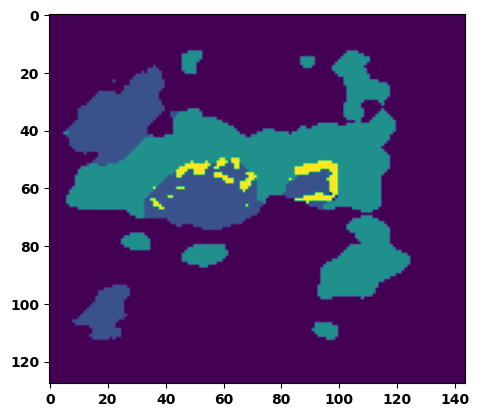

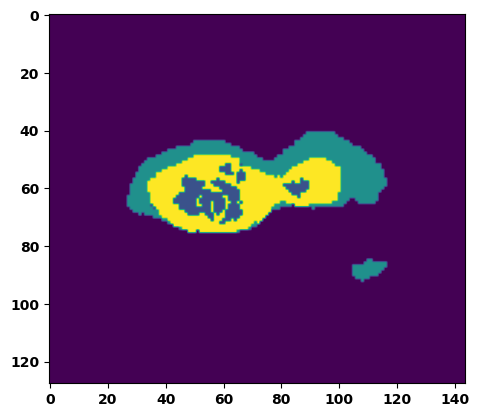

 33%|███▎      | 12/36 [00:17<00:37,  1.55s/it]

Batch_id:  11 Eval loss:  0.4961938261985779
Batch_id:  11 Eval IoU:  tensor(0.4036, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9875, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.53s/it]

Batch_id:  12 Eval loss:  0.5421440005302429
Batch_id:  12 Eval IoU:  tensor(0.3942, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9050, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8680, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9309, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.48s/it]

Batch_id:  13 Eval loss:  0.13641756772994995
Batch_id:  13 Eval IoU:  tensor(0.7804, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.47s/it]

Batch_id:  14 Eval loss:  0.6392505168914795
Batch_id:  14 Eval IoU:  tensor(0.2591, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.7441, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.6943, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.7506, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.8639, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.50s/it]

Batch_id:  15 Eval loss:  0.1802617758512497
Batch_id:  15 Eval IoU:  tensor(0.7419, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:29,  1.57s/it]

Batch_id:  16 Eval loss:  0.06491921842098236
Batch_id:  16 Eval IoU:  tensor(0.8862, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9904, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:27,  1.51s/it]

Batch_id:  17 Eval loss:  0.7495004534721375
Batch_id:  17 Eval IoU:  tensor(0.1781, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6976, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.6142, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.5521, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9446, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:25,  1.52s/it]

Batch_id:  18 Eval loss:  0.3104915916919708
Batch_id:  18 Eval IoU:  tensor(0.6517, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.47s/it]

Batch_id:  19 Eval loss:  0.7681595087051392
Batch_id:  19 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  20 Eval loss:  0.6745801568031311
Batch_id:  20 Eval IoU:  tensor(0.2679, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8999, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8643, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9865, device='cuda:0')


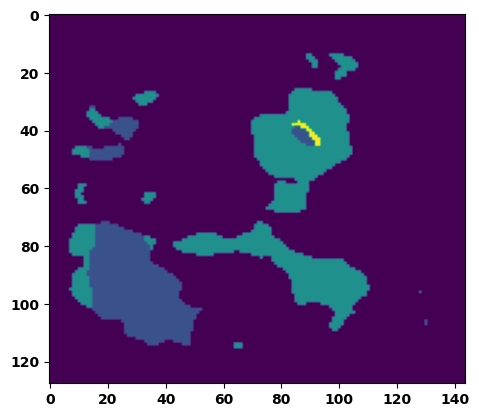

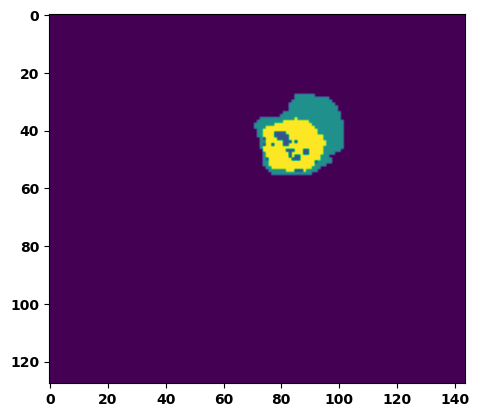

 61%|██████    | 22/36 [00:32<00:21,  1.57s/it]

Batch_id:  21 Eval loss:  0.6213054656982422
Batch_id:  21 Eval IoU:  tensor(0.3276, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.53s/it]

Batch_id:  22 Eval loss:  0.574974775314331
Batch_id:  22 Eval IoU:  tensor(0.3771, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8980, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.50s/it]

Batch_id:  23 Eval loss:  0.4117778539657593
Batch_id:  23 Eval IoU:  tensor(0.4911, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.50s/it]

Batch_id:  24 Eval loss:  0.7287161946296692
Batch_id:  24 Eval IoU:  tensor(0.1981, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4857, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3061, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2413, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.48s/it]

Batch_id:  25 Eval loss:  0.8847594261169434
Batch_id:  25 Eval IoU:  tensor(0.0732, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4924, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4128, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9029, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9208, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.2406, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.9044325947761536
Batch_id:  26 Eval IoU:  tensor(0.0560, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.4578, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.3305, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.1898, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.48s/it]

Batch_id:  27 Eval loss:  0.39339208602905273
Batch_id:  27 Eval IoU:  tensor(0.4959, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.48s/it]

Batch_id:  28 Eval loss:  0.27413254976272583
Batch_id:  28 Eval IoU:  tensor(0.6091, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.47s/it]

Batch_id:  29 Eval loss:  0.811184823513031
Batch_id:  29 Eval IoU:  tensor(0.1135, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5245, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3761, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.2921, device='cuda:0')
Batch_id:  30 Eval loss:  0.44980865716934204
Batch_id:  30 Eval IoU:  tensor(0.4541, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.7780, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.6714, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.6733, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


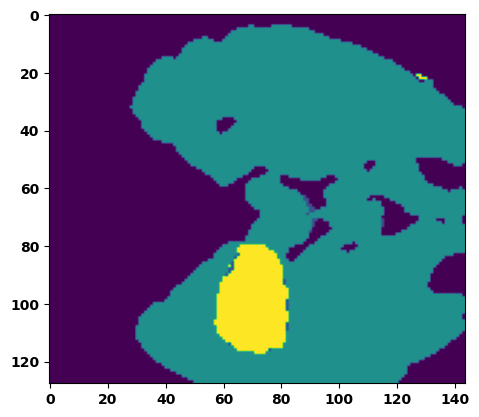

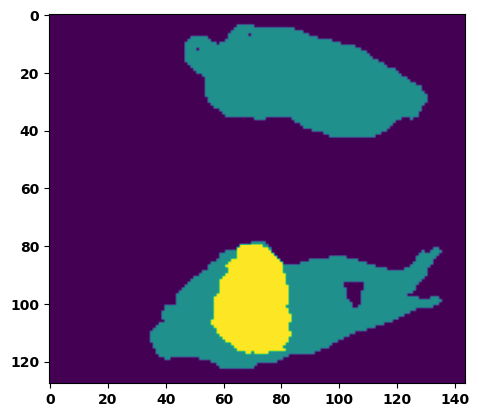

 89%|████████▉ | 32/36 [00:47<00:06,  1.57s/it]

Batch_id:  31 Eval loss:  0.758286714553833
Batch_id:  31 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.5525632500648499
Batch_id:  32 Eval IoU:  tensor(0.4096, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.42s/it]

Batch_id:  33 Eval loss:  0.2744092047214508
Batch_id:  33 Eval IoU:  tensor(0.6325, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9766, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.7516452074050903
Batch_id:  34 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.48s/it]

Batch_id:  35 Eval loss:  0.3745207190513611
Batch_id:  35 Eval IoU:  tensor(0.5227, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')
Epoch 00019: reducing learning rate of group 0 to 1.2500e-04.
Epoch  18 Training loss:  0.15837484869089993
Epoch  18 Evaluation loss:  0.5480040663646327
Epoch  18 Training accuracy :  tensor(0.7734)
Epoch  18 Evaluation accuracy :  tensor(0.3883)
Epoch  18 Training Mean Dice Score:  tensor(0.9817)
Epoch  18 Eval Mean Dice Score:  tensor(0.8594)
Epoch  18 Training Non-tumor Dice Score:  tensor(0.9829)
Epoch  18 Eval Non-tumor Dice Score:  tensor(0.8184)
Epoch  18 Training NCR/NET Dice Score:  tensor(0.9915)
Epoch  18 Eval NCR/NET Dice Score: 

Epoch: 19
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.52s/it]

Batch_id:  0 Training loss:  0.15733739733695984
Batch_id:  0 Training IoU:  tensor(0.7758, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:45,  1.53s/it]

Batch_id:  1 Training loss:  0.15608949959278107
Batch_id:  1 Training IoU:  tensor(0.7945, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:43,  1.53s/it]

Batch_id:  2 Training loss:  0.08320516347885132
Batch_id:  2 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:39,  1.50s/it]

Batch_id:  3 Training loss:  0.2662658393383026
Batch_id:  3 Training IoU:  tensor(0.6491, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:28,  1.42s/it]

Batch_id:  4 Training loss:  0.11698366701602936
Batch_id:  4 Training IoU:  tensor(0.8108, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:31,  1.46s/it]

Batch_id:  5 Training loss:  0.14978933334350586
Batch_id:  5 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:29,  1.45s/it]

Batch_id:  6 Training loss:  0.274394154548645
Batch_id:  6 Training IoU:  tensor(0.6704, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:26,  1.44s/it]

Batch_id:  7 Training loss:  0.07143554091453552
Batch_id:  7 Training IoU:  tensor(0.8810, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:28,  1.48s/it]

Batch_id:  8 Training loss:  0.152542382478714
Batch_id:  8 Training IoU:  tensor(0.7984, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:23,  1.43s/it]

Batch_id:  9 Training loss:  0.2620432674884796
Batch_id:  9 Training IoU:  tensor(0.6822, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 10%|█         | 11/110 [00:16<02:25,  1.47s/it]

Batch_id:  10 Training loss:  0.08766569197177887
Batch_id:  10 Training IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 11%|█         | 12/110 [00:17<02:23,  1.46s/it]

Batch_id:  11 Training loss:  0.18815982341766357
Batch_id:  11 Training IoU:  tensor(0.7203, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:17,  1.42s/it]

Batch_id:  12 Training loss:  0.23252563178539276
Batch_id:  12 Training IoU:  tensor(0.6529, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:24,  1.50s/it]

Batch_id:  13 Training loss:  0.10840609669685364
Batch_id:  13 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:22,  1.50s/it]

Batch_id:  14 Training loss:  0.07573629915714264
Batch_id:  14 Training IoU:  tensor(0.8729, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:17,  1.47s/it]

Batch_id:  15 Training loss:  0.24457889795303345
Batch_id:  15 Training IoU:  tensor(0.6397, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:13,  1.44s/it]

Batch_id:  16 Training loss:  0.060398370027542114
Batch_id:  16 Training IoU:  tensor(0.8999, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:13,  1.45s/it]

Batch_id:  17 Training loss:  0.27730268239974976
Batch_id:  17 Training IoU:  tensor(0.6601, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9811, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:13,  1.47s/it]

Batch_id:  18 Training loss:  0.23437298834323883
Batch_id:  18 Training IoU:  tensor(0.6758, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:13,  1.49s/it]

Batch_id:  19 Training loss:  0.0946938693523407
Batch_id:  19 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:13,  1.50s/it]

Batch_id:  20 Training loss:  0.38104355335235596
Batch_id:  20 Training IoU:  tensor(0.5068, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 20%|██        | 22/110 [00:32<02:11,  1.50s/it]

Batch_id:  21 Training loss:  0.08967478573322296
Batch_id:  21 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 21%|██        | 23/110 [00:34<02:12,  1.53s/it]

Batch_id:  22 Training loss:  0.09445492923259735
Batch_id:  22 Training IoU:  tensor(0.8448, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:10,  1.52s/it]

Batch_id:  23 Training loss:  0.23344402015209198
Batch_id:  23 Training IoU:  tensor(0.6857, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:02,  1.45s/it]

Batch_id:  24 Training loss:  0.14562226831912994
Batch_id:  24 Training IoU:  tensor(0.7692, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9742, device='cuda:0')


 24%|██▎       | 26/110 [00:38<01:59,  1.42s/it]

Batch_id:  25 Training loss:  0.08602389693260193
Batch_id:  25 Training IoU:  tensor(0.8574, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:57,  1.42s/it]

Batch_id:  26 Training loss:  0.14519521594047546
Batch_id:  26 Training IoU:  tensor(0.7700, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:56,  1.42s/it]

Batch_id:  27 Training loss:  0.0560389906167984
Batch_id:  27 Training IoU:  tensor(0.9100, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:52,  1.39s/it]

Batch_id:  28 Training loss:  0.1723913848400116
Batch_id:  28 Training IoU:  tensor(0.7362, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:49,  1.37s/it]

Batch_id:  29 Training loss:  0.13336847722530365
Batch_id:  29 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:51,  1.41s/it]

Batch_id:  30 Training loss:  0.06515035033226013
Batch_id:  30 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:49,  1.40s/it]

Batch_id:  31 Training loss:  0.10563957691192627
Batch_id:  31 Training IoU:  tensor(0.8288, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 30%|███       | 33/110 [00:48<01:50,  1.44s/it]

Batch_id:  32 Training loss:  0.12640300393104553
Batch_id:  32 Training IoU:  tensor(0.8085, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 31%|███       | 34/110 [00:49<01:49,  1.44s/it]

Batch_id:  33 Training loss:  0.0870208889245987
Batch_id:  33 Training IoU:  tensor(0.8720, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:48,  1.44s/it]

Batch_id:  34 Training loss:  0.06903509795665741
Batch_id:  34 Training IoU:  tensor(0.8798, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:46,  1.44s/it]

Batch_id:  35 Training loss:  0.05985642969608307
Batch_id:  35 Training IoU:  tensor(0.8981, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:43,  1.41s/it]

Batch_id:  36 Training loss:  0.11612497270107269
Batch_id:  36 Training IoU:  tensor(0.8237, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:40,  1.39s/it]

Batch_id:  37 Training loss:  0.07034310698509216
Batch_id:  37 Training IoU:  tensor(0.8827, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:37,  1.37s/it]

Batch_id:  38 Training loss:  0.3902435898780823
Batch_id:  38 Training IoU:  tensor(0.5243, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:36,  1.38s/it]

Batch_id:  39 Training loss:  0.0811927318572998
Batch_id:  39 Training IoU:  tensor(0.8630, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:36,  1.40s/it]

Batch_id:  40 Training loss:  0.16473202407360077
Batch_id:  40 Training IoU:  tensor(0.7503, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9670, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:36,  1.41s/it]

Batch_id:  41 Training loss:  0.1487978845834732
Batch_id:  41 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:31,  1.37s/it]

Batch_id:  42 Training loss:  0.1285461187362671
Batch_id:  42 Training IoU:  tensor(0.7849, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 40%|████      | 44/110 [01:03<01:33,  1.42s/it]

Batch_id:  43 Training loss:  0.11152893304824829
Batch_id:  43 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 41%|████      | 45/110 [01:04<01:32,  1.42s/it]

Batch_id:  44 Training loss:  0.12625636160373688
Batch_id:  44 Training IoU:  tensor(0.8002, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:32,  1.44s/it]

Batch_id:  45 Training loss:  0.09056010842323303
Batch_id:  45 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:32,  1.47s/it]

Batch_id:  46 Training loss:  0.12474162876605988
Batch_id:  46 Training IoU:  tensor(0.8177, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:31,  1.47s/it]

Batch_id:  47 Training loss:  0.09527629613876343
Batch_id:  47 Training IoU:  tensor(0.8386, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:27,  1.43s/it]

Batch_id:  48 Training loss:  0.0783206969499588
Batch_id:  48 Training IoU:  tensor(0.8706, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:26,  1.44s/it]

Batch_id:  49 Training loss:  0.23796850442886353
Batch_id:  49 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:27,  1.49s/it]

Batch_id:  50 Training loss:  0.18429522216320038
Batch_id:  50 Training IoU:  tensor(0.8011, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:24,  1.46s/it]

Batch_id:  51 Training loss:  0.26939311623573303
Batch_id:  51 Training IoU:  tensor(0.6587, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:21,  1.43s/it]

Batch_id:  52 Training loss:  0.17963005602359772
Batch_id:  52 Training IoU:  tensor(0.7172, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:21,  1.46s/it]

Batch_id:  53 Training loss:  0.0778372585773468
Batch_id:  53 Training IoU:  tensor(0.8710, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:21,  1.48s/it]

Batch_id:  54 Training loss:  0.19380827248096466
Batch_id:  54 Training IoU:  tensor(0.7349, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:20,  1.49s/it]

Batch_id:  55 Training loss:  0.12289638817310333
Batch_id:  55 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:18,  1.48s/it]

Batch_id:  56 Training loss:  0.09412939846515656
Batch_id:  56 Training IoU:  tensor(0.8666, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:19,  1.52s/it]

Batch_id:  57 Training loss:  0.26829686760902405
Batch_id:  57 Training IoU:  tensor(0.6642, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:17,  1.52s/it]

Batch_id:  58 Training loss:  0.16639503836631775
Batch_id:  58 Training IoU:  tensor(0.7375, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9760, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:14,  1.50s/it]

Batch_id:  59 Training loss:  0.05229811370372772
Batch_id:  59 Training IoU:  tensor(0.9158, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:17,  1.57s/it]

Batch_id:  60 Training loss:  0.10182921588420868
Batch_id:  60 Training IoU:  tensor(0.9229, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:12,  1.52s/it]

Batch_id:  61 Training loss:  0.1606852114200592
Batch_id:  61 Training IoU:  tensor(0.7731, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:10,  1.50s/it]

Batch_id:  62 Training loss:  0.07701711356639862
Batch_id:  62 Training IoU:  tensor(0.8727, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:07,  1.47s/it]

Batch_id:  63 Training loss:  0.11250123381614685
Batch_id:  63 Training IoU:  tensor(0.8102, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.12320445477962494
Batch_id:  64 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:02,  1.43s/it]

Batch_id:  65 Training loss:  0.16159044206142426
Batch_id:  65 Training IoU:  tensor(0.7416, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:02,  1.46s/it]

Batch_id:  66 Training loss:  0.23646663129329681
Batch_id:  66 Training IoU:  tensor(0.7204, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<01:01,  1.47s/it]

Batch_id:  67 Training loss:  0.23042139410972595
Batch_id:  67 Training IoU:  tensor(0.7130, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<01:01,  1.49s/it]

Batch_id:  68 Training loss:  0.3264114260673523
Batch_id:  68 Training IoU:  tensor(0.6214, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:59,  1.48s/it]

Batch_id:  69 Training loss:  0.14032019674777985
Batch_id:  69 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:58,  1.49s/it]

Batch_id:  70 Training loss:  0.1590760350227356
Batch_id:  70 Training IoU:  tensor(0.7654, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:54,  1.44s/it]

Batch_id:  71 Training loss:  0.1447778046131134
Batch_id:  71 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:52,  1.42s/it]

Batch_id:  72 Training loss:  0.09093071520328522
Batch_id:  72 Training IoU:  tensor(0.8461, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:52,  1.44s/it]

Batch_id:  73 Training loss:  0.27826571464538574
Batch_id:  73 Training IoU:  tensor(0.6176, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:51,  1.49s/it]

Batch_id:  74 Training loss:  0.0963849127292633
Batch_id:  74 Training IoU:  tensor(0.8394, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:50,  1.48s/it]

Batch_id:  75 Training loss:  0.0968971699476242
Batch_id:  75 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:49,  1.49s/it]

Batch_id:  76 Training loss:  0.0357639342546463
Batch_id:  76 Training IoU:  tensor(0.9404, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:46,  1.46s/it]

Batch_id:  77 Training loss:  0.12600411474704742
Batch_id:  77 Training IoU:  tensor(0.7946, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:46,  1.49s/it]

Batch_id:  78 Training loss:  0.0597529411315918
Batch_id:  78 Training IoU:  tensor(0.9011, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:43,  1.45s/it]

Batch_id:  79 Training loss:  0.11216714978218079
Batch_id:  79 Training IoU:  tensor(0.8116, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:42,  1.47s/it]

Batch_id:  80 Training loss:  0.24766193330287933
Batch_id:  80 Training IoU:  tensor(0.6901, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.17121438682079315
Batch_id:  81 Training IoU:  tensor(0.7458, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:39,  1.45s/it]

Batch_id:  82 Training loss:  0.10060641169548035
Batch_id:  82 Training IoU:  tensor(0.8412, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:37,  1.46s/it]

Batch_id:  83 Training loss:  0.1029079258441925
Batch_id:  83 Training IoU:  tensor(0.8269, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:35,  1.43s/it]

Batch_id:  84 Training loss:  0.2511514723300934
Batch_id:  84 Training IoU:  tensor(0.6598, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:33,  1.42s/it]

Batch_id:  85 Training loss:  0.061581775546073914
Batch_id:  85 Training IoU:  tensor(0.8948, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:32,  1.42s/it]

Batch_id:  86 Training loss:  0.10936906933784485
Batch_id:  86 Training IoU:  tensor(0.8283, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 80%|████████  | 88/110 [02:08<00:32,  1.49s/it]

Batch_id:  87 Training loss:  0.23623640835285187
Batch_id:  87 Training IoU:  tensor(0.6647, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9619, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:31,  1.48s/it]

Batch_id:  88 Training loss:  0.18628711998462677
Batch_id:  88 Training IoU:  tensor(0.7127, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:28,  1.43s/it]

Batch_id:  89 Training loss:  0.16761067509651184
Batch_id:  89 Training IoU:  tensor(0.7645, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.08543474972248077
Batch_id:  90 Training IoU:  tensor(0.8584, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 84%|████████▎ | 92/110 [02:13<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.12575289607048035
Batch_id:  91 Training IoU:  tensor(0.7935, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:23,  1.41s/it]

Batch_id:  92 Training loss:  0.15943744778633118
Batch_id:  92 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 85%|████████▌ | 94/110 [02:16<00:22,  1.39s/it]

Batch_id:  93 Training loss:  0.25497305393218994
Batch_id:  93 Training IoU:  tensor(0.7143, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:21,  1.44s/it]

Batch_id:  94 Training loss:  0.06576064229011536
Batch_id:  94 Training IoU:  tensor(0.8883, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:20,  1.44s/it]

Batch_id:  95 Training loss:  0.11504663527011871
Batch_id:  95 Training IoU:  tensor(0.8175, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:19,  1.48s/it]

Batch_id:  96 Training loss:  0.26343560218811035
Batch_id:  96 Training IoU:  tensor(0.6775, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:17,  1.48s/it]

Batch_id:  97 Training loss:  0.1384032517671585
Batch_id:  97 Training IoU:  tensor(0.8118, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 90%|█████████ | 99/110 [02:23<00:15,  1.43s/it]

Batch_id:  98 Training loss:  0.12931278347969055
Batch_id:  98 Training IoU:  tensor(0.7959, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:14,  1.41s/it]

Batch_id:  99 Training loss:  0.2358519732952118
Batch_id:  99 Training IoU:  tensor(0.6621, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 92%|█████████▏| 101/110 [02:26<00:12,  1.39s/it]

Batch_id:  100 Training loss:  0.19715160131454468
Batch_id:  100 Training IoU:  tensor(0.7690, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 93%|█████████▎| 102/110 [02:28<00:10,  1.37s/it]

Batch_id:  101 Training loss:  0.11262455582618713
Batch_id:  101 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 94%|█████████▎| 103/110 [02:29<00:09,  1.40s/it]

Batch_id:  102 Training loss:  0.402396023273468
Batch_id:  102 Training IoU:  tensor(0.5088, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9745, device='cuda:0')


 95%|█████████▍| 104/110 [02:30<00:08,  1.40s/it]

Batch_id:  103 Training loss:  0.10626024007797241
Batch_id:  103 Training IoU:  tensor(0.8275, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 95%|█████████▌| 105/110 [02:32<00:07,  1.42s/it]

Batch_id:  104 Training loss:  0.1775599718093872
Batch_id:  104 Training IoU:  tensor(0.7167, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 96%|█████████▋| 106/110 [02:33<00:05,  1.42s/it]

Batch_id:  105 Training loss:  0.16369250416755676
Batch_id:  105 Training IoU:  tensor(0.7411, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 97%|█████████▋| 107/110 [02:35<00:04,  1.40s/it]

Batch_id:  106 Training loss:  0.06256924569606781
Batch_id:  106 Training IoU:  tensor(0.8913, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 98%|█████████▊| 108/110 [02:36<00:02,  1.40s/it]

Batch_id:  107 Training loss:  0.2425939440727234
Batch_id:  107 Training IoU:  tensor(0.6538, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 99%|█████████▉| 109/110 [02:37<00:01,  1.40s/it]

Batch_id:  108 Training loss:  0.16616196930408478
Batch_id:  108 Training IoU:  tensor(0.7441, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


100%|██████████| 110/110 [02:39<00:00,  1.45s/it]


Batch_id:  109 Training loss:  0.11806699633598328
Batch_id:  109 Training IoU:  tensor(0.8183, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9913, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4232326149940491
Batch_id:  0 Eval IoU:  tensor(0.4971, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9244, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9453, device='cuda:0')


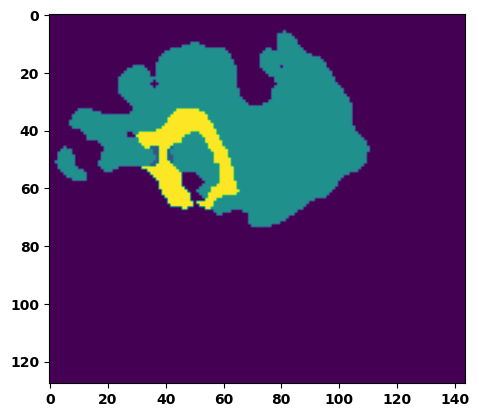

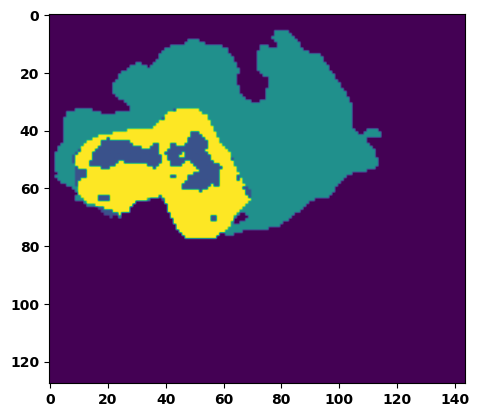

  6%|▌         | 2/36 [00:03<00:50,  1.48s/it]

Batch_id:  1 Eval loss:  0.4320414662361145
Batch_id:  1 Eval IoU:  tensor(0.4601, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9265, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:47,  1.45s/it]

Batch_id:  2 Eval loss:  0.7581256031990051
Batch_id:  2 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 11%|█         | 4/36 [00:06<00:49,  1.55s/it]

Batch_id:  3 Eval loss:  0.11094886064529419
Batch_id:  3 Eval IoU:  tensor(0.8162, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.43s/it]

Batch_id:  4 Eval loss:  0.7681652903556824
Batch_id:  4 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.44s/it]

Batch_id:  5 Eval loss:  0.5001078248023987
Batch_id:  5 Eval IoU:  tensor(0.3886, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.7522, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.6465, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.6589, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.1506906896829605
Batch_id:  6 Eval IoU:  tensor(0.7744, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9977, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.43s/it]

Batch_id:  7 Eval loss:  0.9031431674957275
Batch_id:  7 Eval IoU:  tensor(0.0570, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4600, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3338, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.1910, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.7516909837722778
Batch_id:  8 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.45s/it]

Batch_id:  9 Eval loss:  0.6233800649642944
Batch_id:  9 Eval IoU:  tensor(0.2970, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6526, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.5240, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.5101, device='cuda:0')
Batch_id:  10 Eval loss:  0.6610395908355713
Batch_id:  10 Eval IoU:  tensor(0.2628, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8395, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.7714, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8073, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


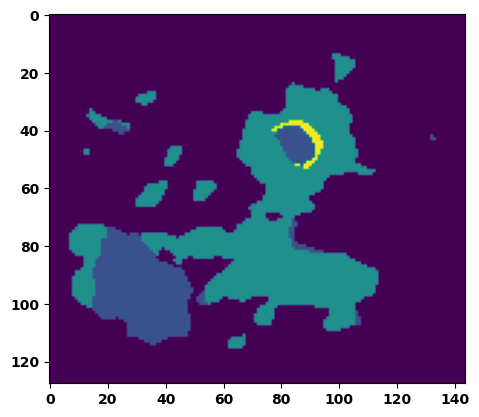

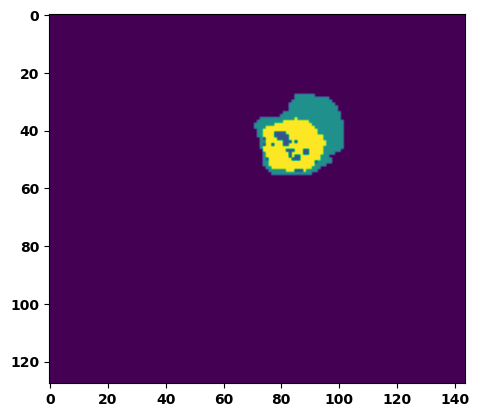

 33%|███▎      | 12/36 [00:17<00:36,  1.52s/it]

Batch_id:  11 Eval loss:  0.6351064443588257
Batch_id:  11 Eval IoU:  tensor(0.3047, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9205, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9772, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:33,  1.47s/it]

Batch_id:  12 Eval loss:  0.31370511651039124
Batch_id:  12 Eval IoU:  tensor(0.6420, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.47s/it]

Batch_id:  13 Eval loss:  0.7395740747451782
Batch_id:  13 Eval IoU:  tensor(0.1754, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6655, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.5630, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.5207, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9477, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:32,  1.52s/it]

Batch_id:  14 Eval loss:  0.6404494047164917
Batch_id:  14 Eval IoU:  tensor(0.3119, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.48s/it]

Batch_id:  15 Eval loss:  0.8550899028778076
Batch_id:  15 Eval IoU:  tensor(0.0929, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5327, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.4389, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8620, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3516, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:27,  1.47s/it]

Batch_id:  16 Eval loss:  0.2021251916885376
Batch_id:  16 Eval IoU:  tensor(0.6903, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.48s/it]

Batch_id:  17 Eval loss:  0.1322695016860962
Batch_id:  17 Eval IoU:  tensor(0.8093, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:25,  1.49s/it]

Batch_id:  18 Eval loss:  0.35196930170059204
Batch_id:  18 Eval IoU:  tensor(0.5357, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:25,  1.57s/it]

Batch_id:  19 Eval loss:  0.058539703488349915
Batch_id:  19 Eval IoU:  tensor(0.8964, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  20 Eval loss:  0.4663412868976593
Batch_id:  20 Eval IoU:  tensor(0.4329, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.7617, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.6474, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.6819, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9913, device='cuda:0')


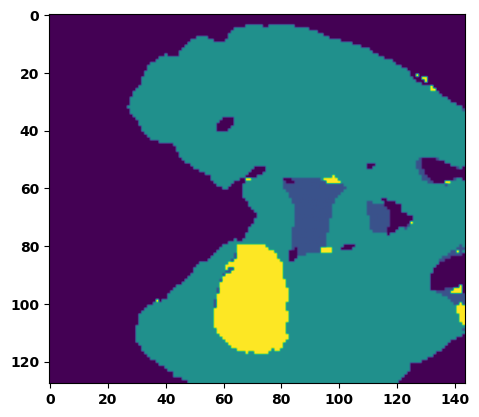

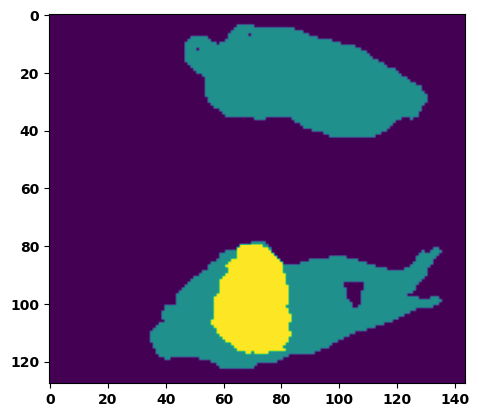

 61%|██████    | 22/36 [00:32<00:21,  1.53s/it]

Batch_id:  21 Eval loss:  0.595266580581665
Batch_id:  21 Eval IoU:  tensor(0.3545, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9386, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.50s/it]

Batch_id:  22 Eval loss:  0.5178758502006531
Batch_id:  22 Eval IoU:  tensor(0.4297, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.53s/it]

Batch_id:  23 Eval loss:  0.22010958194732666
Batch_id:  23 Eval IoU:  tensor(0.6815, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.51s/it]

Batch_id:  24 Eval loss:  0.7748551368713379
Batch_id:  24 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 72%|███████▏  | 26/36 [00:39<00:15,  1.55s/it]

Batch_id:  25 Eval loss:  0.8832740783691406
Batch_id:  25 Eval IoU:  tensor(0.0747, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4955, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4175, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9204, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.2445, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.54s/it]

Batch_id:  26 Eval loss:  0.12788492441177368
Batch_id:  26 Eval IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9977, device='cuda:0')


 78%|███████▊  | 28/36 [00:42<00:12,  1.55s/it]

Batch_id:  27 Eval loss:  0.3311613202095032
Batch_id:  27 Eval IoU:  tensor(0.5487, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9441, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.50s/it]

Batch_id:  28 Eval loss:  0.9058538675308228
Batch_id:  28 Eval IoU:  tensor(0.0543, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4597, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.2050, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.8736, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.7880, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.5124, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.47s/it]

Batch_id:  29 Eval loss:  0.6376063823699951
Batch_id:  29 Eval IoU:  tensor(0.3121, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  30 Eval loss:  0.7525213360786438
Batch_id:  30 Eval IoU:  tensor(0.1657, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4773, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3046, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.2218, device='cuda:0')


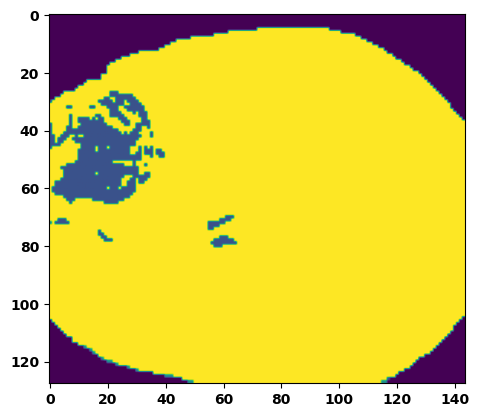

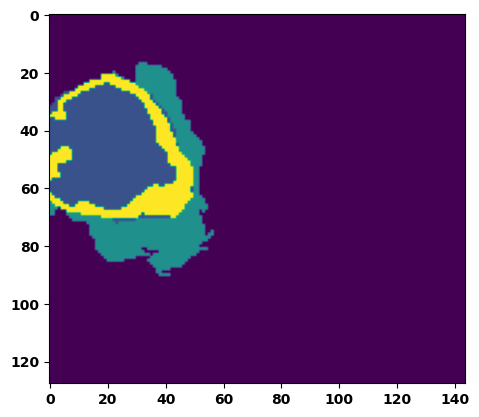

 89%|████████▉ | 32/36 [00:48<00:06,  1.55s/it]

Batch_id:  31 Eval loss:  0.5732600092887878
Batch_id:  31 Eval IoU:  tensor(0.3061, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7194, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6109, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.8991, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.6786, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9697, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.52s/it]

Batch_id:  32 Eval loss:  0.2336137741804123
Batch_id:  32 Eval IoU:  tensor(0.6504, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 94%|█████████▍| 34/36 [00:51<00:03,  1.58s/it]

Batch_id:  33 Eval loss:  0.5573174953460693
Batch_id:  33 Eval IoU:  tensor(0.3992, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.58s/it]

Batch_id:  34 Eval loss:  0.7561579942703247
Batch_id:  34 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


100%|██████████| 36/36 [00:54<00:00,  1.52s/it]

Batch_id:  35 Eval loss:  0.8083418607711792
Batch_id:  35 Eval IoU:  tensor(0.1159, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.5291, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3832, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.2976, device='cuda:0')
Epoch  19 Training loss:  0.1522316657684066
Epoch  19 Evaluation loss:  0.5320232299466928
Epoch  19 Training accuracy :  tensor(0.7806)
Epoch  19 Evaluation accuracy :  tensor(0.4019)
Epoch  19 Training Mean Dice Score:  tensor(0.9824)
Epoch  19 Eval Mean Dice Score:  tensor(0.8450)
Epoch  19 Training Non-tumor Dice Score:  tensor(0.9838)
Epoch  19 Eval Non-tumor Dice Score:  tensor(0.7980)
Epoch  19 Training NCR/NET Dice Score:  tensor(0.9919)
Epoch  19 Eval NCR/NET Dice Score:  tensor(0.9689)
Epoch  19 Training ED Dice Score:  tensor(0.980

Epoch completed and model successfully saved
Epoch: 20
Training in session: 


  1%|          | 1/110 [00:01<02:40,  1.47s/it]

Batch_id:  0 Training loss:  0.08832754194736481
Batch_id:  0 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:39,  1.48s/it]

Batch_id:  1 Training loss:  0.09266392886638641
Batch_id:  1 Training IoU:  tensor(0.8449, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:43,  1.53s/it]

Batch_id:  2 Training loss:  0.11826732754707336
Batch_id:  2 Training IoU:  tensor(0.8180, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:42,  1.53s/it]

Batch_id:  3 Training loss:  0.07768070697784424
Batch_id:  3 Training IoU:  tensor(0.8709, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:41,  1.54s/it]

Batch_id:  4 Training loss:  0.12983013689517975
Batch_id:  4 Training IoU:  tensor(0.7971, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:42,  1.56s/it]

Batch_id:  5 Training loss:  0.12439940869808197
Batch_id:  5 Training IoU:  tensor(0.8186, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:38,  1.54s/it]

Batch_id:  6 Training loss:  0.16262905299663544
Batch_id:  6 Training IoU:  tensor(0.7426, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9807, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:38,  1.56s/it]

Batch_id:  7 Training loss:  0.12154525518417358
Batch_id:  7 Training IoU:  tensor(0.8056, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:31,  1.50s/it]

Batch_id:  8 Training loss:  0.1485232263803482
Batch_id:  8 Training IoU:  tensor(0.7611, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:30,  1.51s/it]

Batch_id:  9 Training loss:  0.0535874217748642
Batch_id:  9 Training IoU:  tensor(0.9116, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 10%|█         | 11/110 [00:16<02:26,  1.48s/it]

Batch_id:  10 Training loss:  0.081684410572052
Batch_id:  10 Training IoU:  tensor(0.8625, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 11%|█         | 12/110 [00:18<02:22,  1.46s/it]

Batch_id:  11 Training loss:  0.2520071864128113
Batch_id:  11 Training IoU:  tensor(0.6797, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:21,  1.46s/it]

Batch_id:  12 Training loss:  0.05903318524360657
Batch_id:  12 Training IoU:  tensor(0.8986, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:18,  1.44s/it]

Batch_id:  13 Training loss:  0.21134664118289948
Batch_id:  13 Training IoU:  tensor(0.7409, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:15,  1.42s/it]

Batch_id:  14 Training loss:  0.16996656358242035
Batch_id:  14 Training IoU:  tensor(0.7286, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:16,  1.45s/it]

Batch_id:  15 Training loss:  0.07338716089725494
Batch_id:  15 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:15,  1.46s/it]

Batch_id:  16 Training loss:  0.29047393798828125
Batch_id:  16 Training IoU:  tensor(0.6309, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:12,  1.44s/it]

Batch_id:  17 Training loss:  0.09031176567077637
Batch_id:  17 Training IoU:  tensor(0.8467, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:11,  1.45s/it]

Batch_id:  18 Training loss:  0.1249365359544754
Batch_id:  18 Training IoU:  tensor(0.7905, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9775, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:11,  1.46s/it]

Batch_id:  19 Training loss:  0.16986888647079468
Batch_id:  19 Training IoU:  tensor(0.7527, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:10,  1.46s/it]

Batch_id:  20 Training loss:  0.10176603496074677
Batch_id:  20 Training IoU:  tensor(0.8270, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 20%|██        | 22/110 [00:32<02:06,  1.44s/it]

Batch_id:  21 Training loss:  0.24522696435451508
Batch_id:  21 Training IoU:  tensor(0.6667, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 21%|██        | 23/110 [00:33<02:04,  1.43s/it]

Batch_id:  22 Training loss:  0.11693325638771057
Batch_id:  22 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:01,  1.41s/it]

Batch_id:  23 Training loss:  0.1028088629245758
Batch_id:  23 Training IoU:  tensor(0.8319, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 23%|██▎       | 25/110 [00:36<01:57,  1.39s/it]

Batch_id:  24 Training loss:  0.10154518485069275
Batch_id:  24 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:01,  1.45s/it]

Batch_id:  25 Training loss:  0.09345023334026337
Batch_id:  25 Training IoU:  tensor(0.8446, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:54,  1.37s/it]

Batch_id:  26 Training loss:  0.15502646565437317
Batch_id:  26 Training IoU:  tensor(0.7643, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:52,  1.37s/it]

Batch_id:  27 Training loss:  0.23792710900306702
Batch_id:  27 Training IoU:  tensor(0.6821, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:53,  1.40s/it]

Batch_id:  28 Training loss:  0.13603797554969788
Batch_id:  28 Training IoU:  tensor(0.8045, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:51,  1.40s/it]

Batch_id:  29 Training loss:  0.22487510740756989
Batch_id:  29 Training IoU:  tensor(0.6621, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9742, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:48,  1.38s/it]

Batch_id:  30 Training loss:  0.15874461829662323
Batch_id:  30 Training IoU:  tensor(0.7698, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:44,  1.34s/it]

Batch_id:  31 Training loss:  0.07628044486045837
Batch_id:  31 Training IoU:  tensor(0.8738, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 30%|███       | 33/110 [00:47<01:45,  1.37s/it]

Batch_id:  32 Training loss:  0.25969913601875305
Batch_id:  32 Training IoU:  tensor(0.6855, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 31%|███       | 34/110 [00:48<01:42,  1.35s/it]

Batch_id:  33 Training loss:  0.08635316789150238
Batch_id:  33 Training IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:43,  1.38s/it]

Batch_id:  34 Training loss:  0.26697516441345215
Batch_id:  34 Training IoU:  tensor(0.6737, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:41,  1.37s/it]

Batch_id:  35 Training loss:  0.15941672027111053
Batch_id:  35 Training IoU:  tensor(0.7931, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 34%|███▎      | 37/110 [00:52<01:36,  1.32s/it]

Batch_id:  36 Training loss:  0.25523656606674194
Batch_id:  36 Training IoU:  tensor(0.6407, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:36,  1.34s/it]

Batch_id:  37 Training loss:  0.15498624742031097
Batch_id:  37 Training IoU:  tensor(0.7542, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9798, device='cuda:0')


 35%|███▌      | 39/110 [00:55<01:34,  1.33s/it]

Batch_id:  38 Training loss:  0.25756728649139404
Batch_id:  38 Training IoU:  tensor(0.7025, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 36%|███▋      | 40/110 [00:56<01:33,  1.34s/it]

Batch_id:  39 Training loss:  0.3607493042945862
Batch_id:  39 Training IoU:  tensor(0.5328, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:32,  1.34s/it]

Batch_id:  40 Training loss:  0.23330633342266083
Batch_id:  40 Training IoU:  tensor(0.6631, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 38%|███▊      | 42/110 [00:59<01:32,  1.36s/it]

Batch_id:  41 Training loss:  0.07223832607269287
Batch_id:  41 Training IoU:  tensor(0.8831, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:32,  1.38s/it]

Batch_id:  42 Training loss:  0.11466144025325775
Batch_id:  42 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 40%|████      | 44/110 [01:02<01:31,  1.39s/it]

Batch_id:  43 Training loss:  0.06876243650913239
Batch_id:  43 Training IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 41%|████      | 45/110 [01:04<01:31,  1.41s/it]

Batch_id:  44 Training loss:  0.03640608489513397
Batch_id:  44 Training IoU:  tensor(0.9388, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 42%|████▏     | 46/110 [01:05<01:30,  1.41s/it]

Batch_id:  45 Training loss:  0.0965377539396286
Batch_id:  45 Training IoU:  tensor(0.8425, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 43%|████▎     | 47/110 [01:06<01:30,  1.43s/it]

Batch_id:  46 Training loss:  0.2668187618255615
Batch_id:  46 Training IoU:  tensor(0.6598, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.23915383219718933
Batch_id:  47 Training IoU:  tensor(0.6444, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 45%|████▍     | 49/110 [01:09<01:25,  1.40s/it]

Batch_id:  48 Training loss:  0.13882915675640106
Batch_id:  48 Training IoU:  tensor(0.8098, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:22,  1.38s/it]

Batch_id:  49 Training loss:  0.16093569993972778
Batch_id:  49 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 46%|████▋     | 51/110 [01:12<01:23,  1.41s/it]

Batch_id:  50 Training loss:  0.10914529860019684
Batch_id:  50 Training IoU:  tensor(0.8960, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:23,  1.44s/it]

Batch_id:  51 Training loss:  0.19537460803985596
Batch_id:  51 Training IoU:  tensor(0.7449, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 48%|████▊     | 53/110 [01:15<01:21,  1.42s/it]

Batch_id:  52 Training loss:  0.06052839756011963
Batch_id:  52 Training IoU:  tensor(0.8976, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 49%|████▉     | 54/110 [01:16<01:18,  1.41s/it]

Batch_id:  53 Training loss:  0.24943865835666656
Batch_id:  53 Training IoU:  tensor(0.6711, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 50%|█████     | 55/110 [01:18<01:18,  1.42s/it]

Batch_id:  54 Training loss:  0.26842236518859863
Batch_id:  54 Training IoU:  tensor(0.6468, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 51%|█████     | 56/110 [01:19<01:17,  1.44s/it]

Batch_id:  55 Training loss:  0.18106479942798615
Batch_id:  55 Training IoU:  tensor(0.7970, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 52%|█████▏    | 57/110 [01:21<01:16,  1.44s/it]

Batch_id:  56 Training loss:  0.056074634194374084
Batch_id:  56 Training IoU:  tensor(0.9088, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 53%|█████▎    | 58/110 [01:22<01:14,  1.43s/it]

Batch_id:  57 Training loss:  0.22630789875984192
Batch_id:  57 Training IoU:  tensor(0.6820, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 54%|█████▎    | 59/110 [01:23<01:09,  1.37s/it]

Batch_id:  58 Training loss:  0.16465936601161957
Batch_id:  58 Training IoU:  tensor(0.7473, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9808, device='cuda:0')


 55%|█████▍    | 60/110 [01:25<01:08,  1.37s/it]

Batch_id:  59 Training loss:  0.33164942264556885
Batch_id:  59 Training IoU:  tensor(0.6162, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 55%|█████▌    | 61/110 [01:26<01:06,  1.36s/it]

Batch_id:  60 Training loss:  0.10727867484092712
Batch_id:  60 Training IoU:  tensor(0.8259, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 56%|█████▋    | 62/110 [01:27<01:05,  1.36s/it]

Batch_id:  61 Training loss:  0.10230055451393127
Batch_id:  61 Training IoU:  tensor(0.8284, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 57%|█████▋    | 63/110 [01:29<01:06,  1.41s/it]

Batch_id:  62 Training loss:  0.10740575194358826
Batch_id:  62 Training IoU:  tensor(0.8193, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 58%|█████▊    | 64/110 [01:30<01:04,  1.41s/it]

Batch_id:  63 Training loss:  0.19702450931072235
Batch_id:  63 Training IoU:  tensor(0.7719, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 59%|█████▉    | 65/110 [01:32<01:02,  1.39s/it]

Batch_id:  64 Training loss:  0.11596965789794922
Batch_id:  64 Training IoU:  tensor(0.8233, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 60%|██████    | 66/110 [01:33<01:02,  1.43s/it]

Batch_id:  65 Training loss:  0.14307908713817596
Batch_id:  65 Training IoU:  tensor(0.7672, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 61%|██████    | 67/110 [01:34<01:00,  1.40s/it]

Batch_id:  66 Training loss:  0.06700702011585236
Batch_id:  66 Training IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 62%|██████▏   | 68/110 [01:36<00:58,  1.39s/it]

Batch_id:  67 Training loss:  0.19912633299827576
Batch_id:  67 Training IoU:  tensor(0.7116, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 63%|██████▎   | 69/110 [01:37<00:57,  1.40s/it]

Batch_id:  68 Training loss:  0.16376416385173798
Batch_id:  68 Training IoU:  tensor(0.7525, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9673, device='cuda:0')


 64%|██████▎   | 70/110 [01:39<00:54,  1.35s/it]

Batch_id:  69 Training loss:  0.12367004156112671
Batch_id:  69 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 65%|██████▍   | 71/110 [01:40<00:55,  1.41s/it]

Batch_id:  70 Training loss:  0.0628538578748703
Batch_id:  70 Training IoU:  tensor(0.8941, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 65%|██████▌   | 72/110 [01:41<00:52,  1.38s/it]

Batch_id:  71 Training loss:  0.12005360424518585
Batch_id:  71 Training IoU:  tensor(0.8097, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 66%|██████▋   | 73/110 [01:43<00:51,  1.40s/it]

Batch_id:  72 Training loss:  0.14453671872615814
Batch_id:  72 Training IoU:  tensor(0.7721, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9741, device='cuda:0')


 67%|██████▋   | 74/110 [01:44<00:49,  1.39s/it]

Batch_id:  73 Training loss:  0.11117985844612122
Batch_id:  73 Training IoU:  tensor(0.8263, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 68%|██████▊   | 75/110 [01:46<00:50,  1.43s/it]

Batch_id:  74 Training loss:  0.09587526321411133
Batch_id:  74 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 69%|██████▉   | 76/110 [01:47<00:50,  1.48s/it]

Batch_id:  75 Training loss:  0.10184527933597565
Batch_id:  75 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 70%|███████   | 77/110 [01:49<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.17411985993385315
Batch_id:  76 Training IoU:  tensor(0.7339, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 71%|███████   | 78/110 [01:50<00:46,  1.47s/it]

Batch_id:  77 Training loss:  0.11695866286754608
Batch_id:  77 Training IoU:  tensor(0.8112, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 72%|███████▏  | 79/110 [01:52<00:44,  1.43s/it]

Batch_id:  78 Training loss:  0.10135608911514282
Batch_id:  78 Training IoU:  tensor(0.8400, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 73%|███████▎  | 80/110 [01:53<00:42,  1.41s/it]

Batch_id:  79 Training loss:  0.2664449214935303
Batch_id:  79 Training IoU:  tensor(0.6575, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 74%|███████▎  | 81/110 [01:54<00:40,  1.40s/it]

Batch_id:  80 Training loss:  0.15931864082813263
Batch_id:  80 Training IoU:  tensor(0.7713, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 75%|███████▍  | 82/110 [01:56<00:39,  1.39s/it]

Batch_id:  81 Training loss:  0.19822567701339722
Batch_id:  81 Training IoU:  tensor(0.7246, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 75%|███████▌  | 83/110 [01:57<00:37,  1.40s/it]

Batch_id:  82 Training loss:  0.06776711344718933
Batch_id:  82 Training IoU:  tensor(0.8868, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 76%|███████▋  | 84/110 [01:59<00:37,  1.44s/it]

Batch_id:  83 Training loss:  0.07553981244564056
Batch_id:  83 Training IoU:  tensor(0.8740, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 77%|███████▋  | 85/110 [02:00<00:36,  1.46s/it]

Batch_id:  84 Training loss:  0.06194588541984558
Batch_id:  84 Training IoU:  tensor(0.8972, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 78%|███████▊  | 86/110 [02:01<00:34,  1.43s/it]

Batch_id:  85 Training loss:  0.09284508228302002
Batch_id:  85 Training IoU:  tensor(0.8415, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 79%|███████▉  | 87/110 [02:03<00:33,  1.45s/it]

Batch_id:  86 Training loss:  0.17402632534503937
Batch_id:  86 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 80%|████████  | 88/110 [02:04<00:32,  1.47s/it]

Batch_id:  87 Training loss:  0.12719257175922394
Batch_id:  87 Training IoU:  tensor(0.8011, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 81%|████████  | 89/110 [02:06<00:30,  1.44s/it]

Batch_id:  88 Training loss:  0.2542998194694519
Batch_id:  88 Training IoU:  tensor(0.6945, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 82%|████████▏ | 90/110 [02:07<00:28,  1.42s/it]

Batch_id:  89 Training loss:  0.14879143238067627
Batch_id:  89 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 83%|████████▎ | 91/110 [02:08<00:25,  1.36s/it]

Batch_id:  90 Training loss:  0.09573937952518463
Batch_id:  90 Training IoU:  tensor(0.8367, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 84%|████████▎ | 92/110 [02:10<00:24,  1.35s/it]

Batch_id:  91 Training loss:  0.15617509186267853
Batch_id:  91 Training IoU:  tensor(0.7518, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 85%|████████▍ | 93/110 [02:11<00:24,  1.43s/it]

Batch_id:  92 Training loss:  0.24174456298351288
Batch_id:  92 Training IoU:  tensor(0.6582, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9614, device='cuda:0')


 85%|████████▌ | 94/110 [02:13<00:22,  1.38s/it]

Batch_id:  93 Training loss:  0.11331366002559662
Batch_id:  93 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 86%|████████▋ | 95/110 [02:14<00:20,  1.36s/it]

Batch_id:  94 Training loss:  0.13848191499710083
Batch_id:  94 Training IoU:  tensor(0.7745, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 87%|████████▋ | 96/110 [02:15<00:19,  1.38s/it]

Batch_id:  95 Training loss:  0.08368749916553497
Batch_id:  95 Training IoU:  tensor(0.8612, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 88%|████████▊ | 97/110 [02:17<00:18,  1.40s/it]

Batch_id:  96 Training loss:  0.06781072914600372
Batch_id:  96 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 89%|████████▉ | 98/110 [02:18<00:16,  1.41s/it]

Batch_id:  97 Training loss:  0.09378235042095184
Batch_id:  97 Training IoU:  tensor(0.8435, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 90%|█████████ | 99/110 [02:20<00:15,  1.41s/it]

Batch_id:  98 Training loss:  0.18190309405326843
Batch_id:  98 Training IoU:  tensor(0.7173, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 91%|█████████ | 100/110 [02:21<00:13,  1.37s/it]

Batch_id:  99 Training loss:  0.12248164415359497
Batch_id:  99 Training IoU:  tensor(0.7990, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 92%|█████████▏| 101/110 [02:22<00:12,  1.39s/it]

Batch_id:  100 Training loss:  0.05912940204143524
Batch_id:  100 Training IoU:  tensor(0.8984, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 93%|█████████▎| 102/110 [02:24<00:11,  1.38s/it]

Batch_id:  101 Training loss:  0.10822860896587372
Batch_id:  101 Training IoU:  tensor(0.8164, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 94%|█████████▎| 103/110 [02:25<00:09,  1.40s/it]

Batch_id:  102 Training loss:  0.38548630475997925
Batch_id:  102 Training IoU:  tensor(0.5265, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 95%|█████████▍| 104/110 [02:26<00:08,  1.36s/it]

Batch_id:  103 Training loss:  0.20417921245098114
Batch_id:  103 Training IoU:  tensor(0.7040, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 95%|█████████▌| 105/110 [02:28<00:06,  1.34s/it]

Batch_id:  104 Training loss:  0.12194450199604034
Batch_id:  104 Training IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 96%|█████████▋| 106/110 [02:29<00:05,  1.34s/it]

Batch_id:  105 Training loss:  0.15089067816734314
Batch_id:  105 Training IoU:  tensor(0.7561, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 97%|█████████▋| 107/110 [02:31<00:04,  1.42s/it]

Batch_id:  106 Training loss:  0.08948118984699249
Batch_id:  106 Training IoU:  tensor(0.8941, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 98%|█████████▊| 108/110 [02:32<00:02,  1.45s/it]

Batch_id:  107 Training loss:  0.39104825258255005
Batch_id:  107 Training IoU:  tensor(0.5175, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 99%|█████████▉| 109/110 [02:34<00:01,  1.45s/it]

Batch_id:  108 Training loss:  0.07827061414718628
Batch_id:  108 Training IoU:  tensor(0.8673, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


100%|██████████| 110/110 [02:35<00:00,  1.41s/it]


Batch_id:  109 Training loss:  0.06101319193840027
Batch_id:  109 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9939, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.4707682728767395
Batch_id:  0 Eval IoU:  tensor(0.4542, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9404, device='cuda:0')


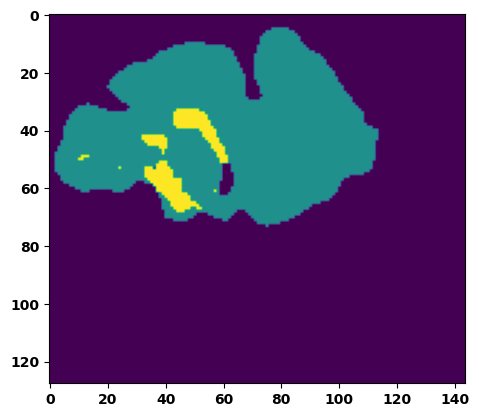

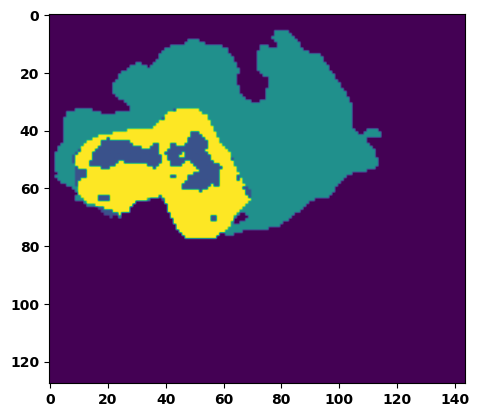

  6%|▌         | 2/36 [00:02<00:47,  1.39s/it]

Batch_id:  1 Eval loss:  0.20613232254981995
Batch_id:  1 Eval IoU:  tensor(0.6869, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.38s/it]

Batch_id:  2 Eval loss:  0.751654326915741
Batch_id:  2 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 11%|█         | 4/36 [00:05<00:44,  1.38s/it]

Batch_id:  3 Eval loss:  0.32344356179237366
Batch_id:  3 Eval IoU:  tensor(0.5580, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9938, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:42,  1.38s/it]

Batch_id:  4 Eval loss:  0.5755399465560913
Batch_id:  4 Eval IoU:  tensor(0.3743, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9411, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9276, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.42s/it]

Batch_id:  5 Eval loss:  0.3819020986557007
Batch_id:  5 Eval IoU:  tensor(0.4955, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9283, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9101, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9381, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.9045498371124268
Batch_id:  6 Eval IoU:  tensor(0.0560, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.4578, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3305, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.1893, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.37s/it]

Batch_id:  7 Eval loss:  0.7681282162666321
Batch_id:  7 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.38s/it]

Batch_id:  8 Eval loss:  0.7121631503105164
Batch_id:  8 Eval IoU:  tensor(0.2572, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9254, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:35,  1.36s/it]

Batch_id:  9 Eval loss:  0.7032326459884644
Batch_id:  9 Eval IoU:  tensor(0.2589, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9395, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9148, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval loss:  0.5599748492240906
Batch_id:  10 Eval IoU:  tensor(0.3935, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9342, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9056, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


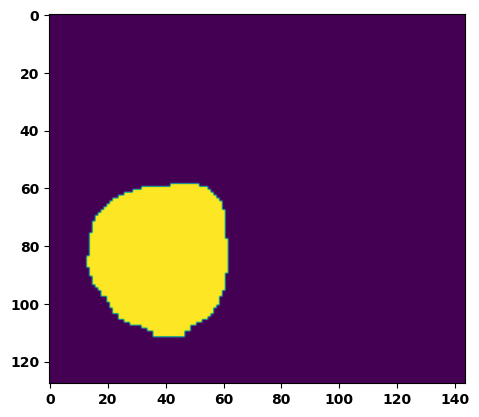

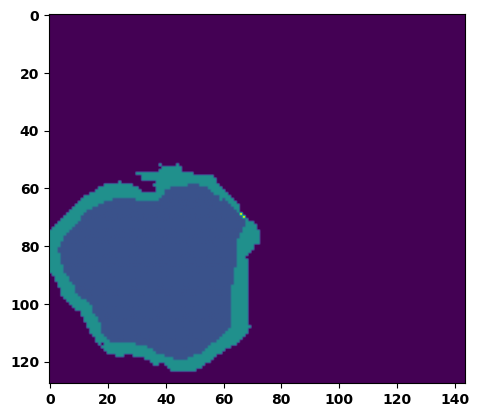

 33%|███▎      | 12/36 [00:16<00:34,  1.45s/it]

Batch_id:  11 Eval loss:  0.7560771703720093
Batch_id:  11 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.45s/it]

Batch_id:  12 Eval loss:  0.067228302359581
Batch_id:  12 Eval IoU:  tensor(0.8805, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:32,  1.48s/it]

Batch_id:  13 Eval loss:  0.16439345479011536
Batch_id:  13 Eval IoU:  tensor(0.7566, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.489875853061676
Batch_id:  14 Eval IoU:  tensor(0.4039, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9870, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:29,  1.49s/it]

Batch_id:  15 Eval loss:  0.8292789459228516
Batch_id:  15 Eval IoU:  tensor(0.1026, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5241, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3783, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.2890, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.44s/it]

Batch_id:  16 Eval loss:  0.9028435349464417
Batch_id:  16 Eval IoU:  tensor(0.0557, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.4606, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.2004, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.8866, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.5606, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.7343, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:26,  1.46s/it]

Batch_id:  17 Eval loss:  0.7737302780151367
Batch_id:  17 Eval IoU:  tensor(0.1499, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6349, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.5195, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.4736, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9456, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.44s/it]

Batch_id:  18 Eval loss:  0.8852839469909668
Batch_id:  18 Eval IoU:  tensor(0.0729, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4915, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4115, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9209, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.2381, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:23,  1.49s/it]

Batch_id:  19 Eval loss:  0.6321814060211182
Batch_id:  19 Eval IoU:  tensor(0.2439, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6093, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4496, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9336, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.4790, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  20 Eval loss:  0.11278437077999115
Batch_id:  20 Eval IoU:  tensor(0.8218, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


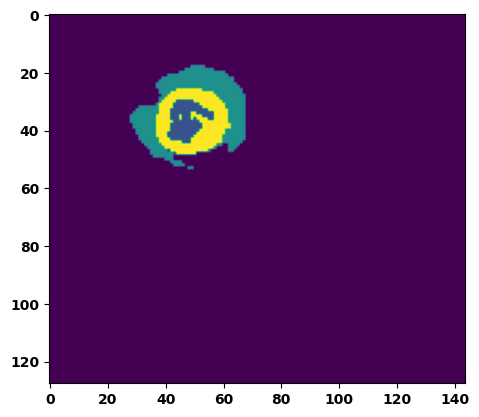

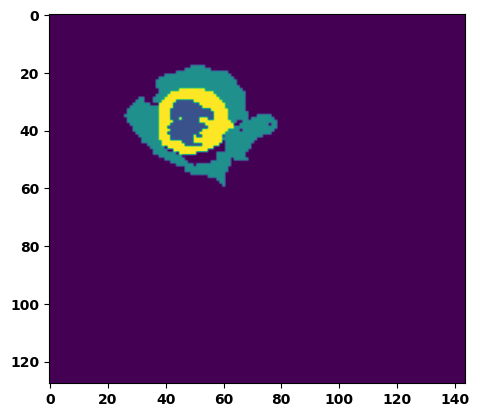

 61%|██████    | 22/36 [00:31<00:21,  1.54s/it]

Batch_id:  21 Eval loss:  0.5944441556930542
Batch_id:  21 Eval IoU:  tensor(0.3340, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9212, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9787, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:20,  1.56s/it]

Batch_id:  22 Eval loss:  0.469402015209198
Batch_id:  22 Eval IoU:  tensor(0.4323, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7532, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.6335, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.6479, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.55s/it]

Batch_id:  23 Eval loss:  0.11650732159614563
Batch_id:  23 Eval IoU:  tensor(0.8166, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.51s/it]

Batch_id:  24 Eval loss:  0.31227409839630127
Batch_id:  24 Eval IoU:  tensor(0.6411, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9922, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.47s/it]

Batch_id:  25 Eval loss:  0.5585695505142212
Batch_id:  25 Eval IoU:  tensor(0.3394, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8410, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8098, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8400, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9227, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.45s/it]

Batch_id:  26 Eval loss:  0.10537451505661011
Batch_id:  26 Eval IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.41s/it]

Batch_id:  27 Eval loss:  0.8562432527542114
Batch_id:  27 Eval IoU:  tensor(0.0920, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.5312, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4368, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8611, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3467, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.44s/it]

Batch_id:  28 Eval loss:  0.6015815138816833
Batch_id:  28 Eval IoU:  tensor(0.3512, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.45s/it]

Batch_id:  29 Eval loss:  0.6626623272895813
Batch_id:  29 Eval IoU:  tensor(0.2346, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6555, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5610, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8875, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.5942, device='cuda:0')
Batch_id:  30 Eval loss:  0.7901742458343506
Batch_id:  30 Eval IoU:  tensor(0.1286, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4694, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3037, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.2113, device='cuda:0')


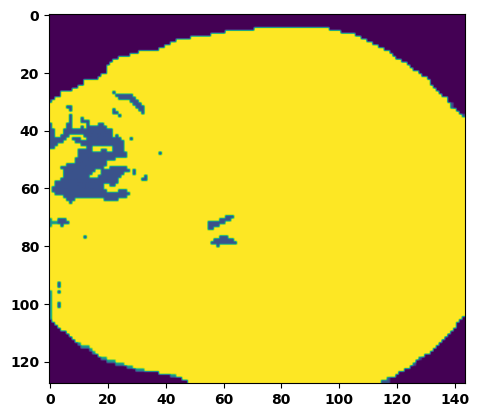

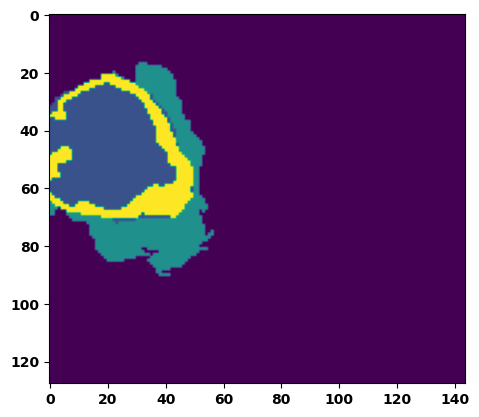

 89%|████████▉ | 32/36 [00:46<00:06,  1.51s/it]

Batch_id:  31 Eval loss:  0.7581714987754822
Batch_id:  31 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.52s/it]

Batch_id:  32 Eval loss:  0.7252969145774841
Batch_id:  32 Eval IoU:  tensor(0.2048, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7652, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.6616, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6618, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9872, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.44s/it]

Batch_id:  33 Eval loss:  0.20850445330142975
Batch_id:  33 Eval IoU:  tensor(0.6815, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.44s/it]

Batch_id:  34 Eval loss:  0.7748398780822754
Batch_id:  34 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.46s/it]

Batch_id:  35 Eval loss:  0.5696925520896912
Batch_id:  35 Eval IoU:  tensor(0.3317, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8155, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.7320, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.8050, device='cuda:0')
Epoch  20 Training loss:  0.14899077781222084
Epoch  20 Evaluation loss:  0.5576362440155612
Epoch  20 Training accuracy :  tensor(0.7841)
Epoch  20 Evaluation accuracy :  tensor(0.3768)
Epoch  20 Training Mean Dice Score:  tensor(0.9828)
Epoch  20 Eval Mean Dice Score:  tensor(0.8348)
Epoch  20 Training Non-tumor Dice Score:  tensor(0.9841)
Epoch  20 Eval Non-tumor Dice Score:  tensor(0.7866)
Epoch  20 Training NCR/NET Dice Score:  tensor(0.9921)
Epoch  20 Eval NCR/NET Dice Score:  tensor(0.9671)
Epoch  20 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 21
Training in session: 


  1%|          | 1/110 [00:01<03:04,  1.69s/it]

Batch_id:  0 Training loss:  0.12376117706298828
Batch_id:  0 Training IoU:  tensor(0.7953, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:45,  1.54s/it]

Batch_id:  1 Training loss:  0.11253899335861206
Batch_id:  1 Training IoU:  tensor(0.8091, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:35,  1.46s/it]

Batch_id:  2 Training loss:  0.15856239199638367
Batch_id:  2 Training IoU:  tensor(0.7472, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:42,  1.54s/it]

Batch_id:  3 Training loss:  0.07958810031414032
Batch_id:  3 Training IoU:  tensor(0.8690, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:41,  1.54s/it]

Batch_id:  4 Training loss:  0.12476865947246552
Batch_id:  4 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:41,  1.55s/it]

Batch_id:  5 Training loss:  0.13236317038536072
Batch_id:  5 Training IoU:  tensor(0.8169, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:42,  1.58s/it]

Batch_id:  6 Training loss:  0.10012781620025635
Batch_id:  6 Training IoU:  tensor(0.8342, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:37,  1.54s/it]

Batch_id:  7 Training loss:  0.2145565003156662
Batch_id:  7 Training IoU:  tensor(0.6740, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9739, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:34,  1.53s/it]

Batch_id:  8 Training loss:  0.09444761276245117
Batch_id:  8 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:26,  1.46s/it]

Batch_id:  9 Training loss:  0.0902472734451294
Batch_id:  9 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 10%|█         | 11/110 [00:16<02:22,  1.44s/it]

Batch_id:  10 Training loss:  0.14866217970848083
Batch_id:  10 Training IoU:  tensor(0.7736, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 11%|█         | 12/110 [00:17<02:20,  1.43s/it]

Batch_id:  11 Training loss:  0.08049774169921875
Batch_id:  11 Training IoU:  tensor(0.8665, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:20,  1.45s/it]

Batch_id:  12 Training loss:  0.13363684713840485
Batch_id:  12 Training IoU:  tensor(0.7932, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:28,  1.54s/it]

Batch_id:  13 Training loss:  0.08711545169353485
Batch_id:  13 Training IoU:  tensor(0.8796, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:27,  1.56s/it]

Batch_id:  14 Training loss:  0.09992986917495728
Batch_id:  14 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:24,  1.54s/it]

Batch_id:  15 Training loss:  0.07186958193778992
Batch_id:  15 Training IoU:  tensor(0.8965, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:27,  1.58s/it]

Batch_id:  16 Training loss:  0.21871508657932281
Batch_id:  16 Training IoU:  tensor(0.6835, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9641, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:23,  1.56s/it]

Batch_id:  17 Training loss:  0.26435691118240356
Batch_id:  17 Training IoU:  tensor(0.6651, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:17,  1.51s/it]

Batch_id:  18 Training loss:  0.23957061767578125
Batch_id:  18 Training IoU:  tensor(0.7295, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:20,  1.56s/it]

Batch_id:  19 Training loss:  0.1126161515712738
Batch_id:  19 Training IoU:  tensor(0.8541, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:19,  1.57s/it]

Batch_id:  20 Training loss:  0.23425234854221344
Batch_id:  20 Training IoU:  tensor(0.7090, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 20%|██        | 22/110 [00:33<02:14,  1.53s/it]

Batch_id:  21 Training loss:  0.11860646307468414
Batch_id:  21 Training IoU:  tensor(0.8220, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 21%|██        | 23/110 [00:35<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.09899945557117462
Batch_id:  22 Training IoU:  tensor(0.8314, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:07,  1.49s/it]

Batch_id:  23 Training loss:  0.1560337394475937
Batch_id:  23 Training IoU:  tensor(0.7735, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:06,  1.49s/it]

Batch_id:  24 Training loss:  0.16527439653873444
Batch_id:  24 Training IoU:  tensor(0.7381, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:03,  1.47s/it]

Batch_id:  25 Training loss:  0.15472625195980072
Batch_id:  25 Training IoU:  tensor(0.7936, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:00,  1.45s/it]

Batch_id:  26 Training loss:  0.11277264356613159
Batch_id:  26 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:07,  1.55s/it]

Batch_id:  27 Training loss:  0.08585575222969055
Batch_id:  27 Training IoU:  tensor(0.8986, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 26%|██▋       | 29/110 [00:44<02:04,  1.54s/it]

Batch_id:  28 Training loss:  0.1770092099905014
Batch_id:  28 Training IoU:  tensor(0.7251, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:05,  1.57s/it]

Batch_id:  29 Training loss:  0.15668919682502747
Batch_id:  29 Training IoU:  tensor(0.7521, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 28%|██▊       | 31/110 [00:47<02:06,  1.60s/it]

Batch_id:  30 Training loss:  0.05728210508823395
Batch_id:  30 Training IoU:  tensor(0.9079, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 29%|██▉       | 32/110 [00:48<02:01,  1.55s/it]

Batch_id:  31 Training loss:  0.23485323786735535
Batch_id:  31 Training IoU:  tensor(0.6860, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 30%|███       | 33/110 [00:50<01:57,  1.53s/it]

Batch_id:  32 Training loss:  0.07545751333236694
Batch_id:  32 Training IoU:  tensor(0.8722, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 31%|███       | 34/110 [00:51<01:53,  1.50s/it]

Batch_id:  33 Training loss:  0.2687687575817108
Batch_id:  33 Training IoU:  tensor(0.6670, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 32%|███▏      | 35/110 [00:53<01:49,  1.46s/it]

Batch_id:  34 Training loss:  0.21303479373455048
Batch_id:  34 Training IoU:  tensor(0.7254, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:44,  1.42s/it]

Batch_id:  35 Training loss:  0.10490073263645172
Batch_id:  35 Training IoU:  tensor(0.8270, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:40,  1.38s/it]

Batch_id:  36 Training loss:  0.1709401160478592
Batch_id:  36 Training IoU:  tensor(0.7362, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:38,  1.37s/it]

Batch_id:  37 Training loss:  0.1212262511253357
Batch_id:  37 Training IoU:  tensor(0.8047, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:36,  1.36s/it]

Batch_id:  38 Training loss:  0.1947324573993683
Batch_id:  38 Training IoU:  tensor(0.7307, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:36,  1.38s/it]

Batch_id:  39 Training loss:  0.16139398515224457
Batch_id:  39 Training IoU:  tensor(0.7576, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:36,  1.39s/it]

Batch_id:  40 Training loss:  0.14369307458400726
Batch_id:  40 Training IoU:  tensor(0.7741, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:32,  1.36s/it]

Batch_id:  41 Training loss:  0.2506025433540344
Batch_id:  41 Training IoU:  tensor(0.6783, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:33,  1.39s/it]

Batch_id:  42 Training loss:  0.10561655461788177
Batch_id:  42 Training IoU:  tensor(0.9026, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 40%|████      | 44/110 [01:05<01:33,  1.41s/it]

Batch_id:  43 Training loss:  0.06202341616153717
Batch_id:  43 Training IoU:  tensor(0.8934, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 41%|████      | 45/110 [01:06<01:31,  1.40s/it]

Batch_id:  44 Training loss:  0.06904104351997375
Batch_id:  44 Training IoU:  tensor(0.8863, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:32,  1.44s/it]

Batch_id:  45 Training loss:  0.0770614743232727
Batch_id:  45 Training IoU:  tensor(0.8713, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:32,  1.46s/it]

Batch_id:  46 Training loss:  0.1690172553062439
Batch_id:  46 Training IoU:  tensor(0.7526, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:32,  1.49s/it]

Batch_id:  47 Training loss:  0.12609148025512695
Batch_id:  47 Training IoU:  tensor(0.8003, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:31,  1.49s/it]

Batch_id:  48 Training loss:  0.3847944140434265
Batch_id:  48 Training IoU:  tensor(0.5234, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:28,  1.47s/it]

Batch_id:  49 Training loss:  0.1997670978307724
Batch_id:  49 Training IoU:  tensor(0.7081, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:26,  1.47s/it]

Batch_id:  50 Training loss:  0.2428814172744751
Batch_id:  50 Training IoU:  tensor(0.6777, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:25,  1.47s/it]

Batch_id:  51 Training loss:  0.12533916532993317
Batch_id:  51 Training IoU:  tensor(0.7920, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:21,  1.43s/it]

Batch_id:  52 Training loss:  0.10941942036151886
Batch_id:  52 Training IoU:  tensor(0.8296, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:19,  1.41s/it]

Batch_id:  53 Training loss:  0.10434304177761078
Batch_id:  53 Training IoU:  tensor(0.8239, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:17,  1.40s/it]

Batch_id:  54 Training loss:  0.25494521856307983
Batch_id:  54 Training IoU:  tensor(0.6932, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:22,  1.52s/it]

Batch_id:  55 Training loss:  0.15159638226032257
Batch_id:  55 Training IoU:  tensor(0.7695, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:15,  1.43s/it]

Batch_id:  56 Training loss:  0.3501430153846741
Batch_id:  56 Training IoU:  tensor(0.5436, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:16,  1.47s/it]

Batch_id:  57 Training loss:  0.26525020599365234
Batch_id:  57 Training IoU:  tensor(0.6770, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:13,  1.44s/it]

Batch_id:  58 Training loss:  0.20101651549339294
Batch_id:  58 Training IoU:  tensor(0.7706, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:11,  1.42s/it]

Batch_id:  59 Training loss:  0.12417721748352051
Batch_id:  59 Training IoU:  tensor(0.8016, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:09,  1.43s/it]

Batch_id:  60 Training loss:  0.12377263605594635
Batch_id:  60 Training IoU:  tensor(0.7925, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:05,  1.36s/it]

Batch_id:  61 Training loss:  0.09034104645252228
Batch_id:  61 Training IoU:  tensor(0.8490, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:06,  1.41s/it]

Batch_id:  62 Training loss:  0.08773088455200195
Batch_id:  62 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:05,  1.43s/it]

Batch_id:  63 Training loss:  0.03579385578632355
Batch_id:  63 Training IoU:  tensor(0.9404, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:03,  1.42s/it]

Batch_id:  64 Training loss:  0.2366832196712494
Batch_id:  64 Training IoU:  tensor(0.6630, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:04,  1.47s/it]

Batch_id:  65 Training loss:  0.10572439432144165
Batch_id:  65 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.14925123751163483
Batch_id:  66 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:00,  1.45s/it]

Batch_id:  67 Training loss:  0.16303080320358276
Batch_id:  67 Training IoU:  tensor(0.7467, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<00:59,  1.44s/it]

Batch_id:  68 Training loss:  0.08781982958316803
Batch_id:  68 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:56,  1.41s/it]

Batch_id:  69 Training loss:  0.26102113723754883
Batch_id:  69 Training IoU:  tensor(0.6754, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:55,  1.41s/it]

Batch_id:  70 Training loss:  0.15208393335342407
Batch_id:  70 Training IoU:  tensor(0.7529, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9805, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.15096765756607056
Batch_id:  71 Training IoU:  tensor(0.7571, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:55,  1.50s/it]

Batch_id:  72 Training loss:  0.0569259375333786
Batch_id:  72 Training IoU:  tensor(0.9052, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:54,  1.52s/it]

Batch_id:  73 Training loss:  0.07634446024894714
Batch_id:  73 Training IoU:  tensor(0.8676, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:52,  1.50s/it]

Batch_id:  74 Training loss:  0.13627545535564423
Batch_id:  74 Training IoU:  tensor(0.8033, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:51,  1.50s/it]

Batch_id:  75 Training loss:  0.07037945091724396
Batch_id:  75 Training IoU:  tensor(0.8805, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:49,  1.51s/it]

Batch_id:  76 Training loss:  0.0901673436164856
Batch_id:  76 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:45,  1.43s/it]

Batch_id:  77 Training loss:  0.0905500054359436
Batch_id:  77 Training IoU:  tensor(0.8464, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:43,  1.40s/it]

Batch_id:  78 Training loss:  0.12271983921527863
Batch_id:  78 Training IoU:  tensor(0.7989, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:41,  1.38s/it]

Batch_id:  79 Training loss:  0.3670237064361572
Batch_id:  79 Training IoU:  tensor(0.5437, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:40,  1.41s/it]

Batch_id:  80 Training loss:  0.15589779615402222
Batch_id:  80 Training IoU:  tensor(0.7636, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9700, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:39,  1.42s/it]

Batch_id:  81 Training loss:  0.08347360789775848
Batch_id:  81 Training IoU:  tensor(0.8597, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:39,  1.45s/it]

Batch_id:  82 Training loss:  0.07224559783935547
Batch_id:  82 Training IoU:  tensor(0.8822, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:36,  1.40s/it]

Batch_id:  83 Training loss:  0.11827591061592102
Batch_id:  83 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:35,  1.41s/it]

Batch_id:  84 Training loss:  0.11334162950515747
Batch_id:  84 Training IoU:  tensor(0.8093, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9849, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:33,  1.40s/it]

Batch_id:  85 Training loss:  0.22475051879882812
Batch_id:  85 Training IoU:  tensor(0.6708, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:33,  1.44s/it]

Batch_id:  86 Training loss:  0.0917726457118988
Batch_id:  86 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.09279268980026245
Batch_id:  87 Training IoU:  tensor(0.8456, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:29,  1.41s/it]

Batch_id:  88 Training loss:  0.1956026703119278
Batch_id:  88 Training IoU:  tensor(0.7120, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:27,  1.39s/it]

Batch_id:  89 Training loss:  0.06007552146911621
Batch_id:  89 Training IoU:  tensor(0.8981, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:27,  1.45s/it]

Batch_id:  90 Training loss:  0.12215028703212738
Batch_id:  90 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:25,  1.44s/it]

Batch_id:  91 Training loss:  0.09641307592391968
Batch_id:  91 Training IoU:  tensor(0.8348, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:24,  1.44s/it]

Batch_id:  92 Training loss:  0.17375217378139496
Batch_id:  92 Training IoU:  tensor(0.7246, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:23,  1.49s/it]

Batch_id:  93 Training loss:  0.2628023624420166
Batch_id:  93 Training IoU:  tensor(0.6511, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:22,  1.49s/it]

Batch_id:  94 Training loss:  0.06499418616294861
Batch_id:  94 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:20,  1.46s/it]

Batch_id:  95 Training loss:  0.14930063486099243
Batch_id:  95 Training IoU:  tensor(0.7858, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.46s/it]

Batch_id:  96 Training loss:  0.24278032779693604
Batch_id:  96 Training IoU:  tensor(0.6662, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:17,  1.43s/it]

Batch_id:  97 Training loss:  0.21841683983802795
Batch_id:  97 Training IoU:  tensor(0.6694, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:15,  1.42s/it]

Batch_id:  98 Training loss:  0.33262062072753906
Batch_id:  98 Training IoU:  tensor(0.6145, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:15,  1.52s/it]

Batch_id:  99 Training loss:  0.13312216103076935
Batch_id:  99 Training IoU:  tensor(0.7919, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.46s/it]

Batch_id:  100 Training loss:  0.08395886421203613
Batch_id:  100 Training IoU:  tensor(0.8555, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:11,  1.45s/it]

Batch_id:  101 Training loss:  0.17062601447105408
Batch_id:  101 Training IoU:  tensor(0.8080, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.46s/it]

Batch_id:  102 Training loss:  0.069989874958992
Batch_id:  102 Training IoU:  tensor(0.8797, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.49s/it]

Batch_id:  103 Training loss:  0.1419830322265625
Batch_id:  103 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.43s/it]

Batch_id:  104 Training loss:  0.19625048339366913
Batch_id:  104 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.44s/it]

Batch_id:  105 Training loss:  0.07449778914451599
Batch_id:  105 Training IoU:  tensor(0.8748, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.46s/it]

Batch_id:  106 Training loss:  0.06340254843235016
Batch_id:  106 Training IoU:  tensor(0.8901, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:03,  1.50s/it]

Batch_id:  107 Training loss:  0.056682005524635315
Batch_id:  107 Training IoU:  tensor(0.9041, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.53s/it]

Batch_id:  108 Training loss:  0.2268010675907135
Batch_id:  108 Training IoU:  tensor(0.6815, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9441, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.053181737661361694
Batch_id:  109 Training IoU:  tensor(0.9106, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9954, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6748030781745911
Batch_id:  0 Eval IoU:  tensor(0.2767, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8996, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8515, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.8749, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


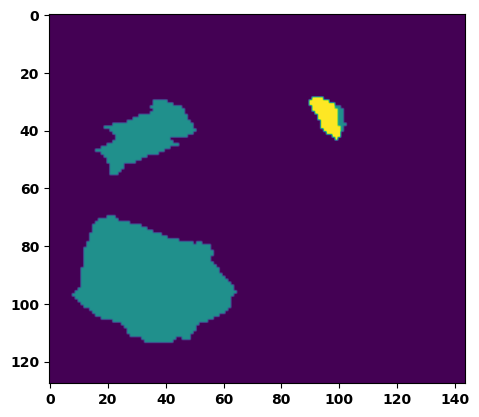

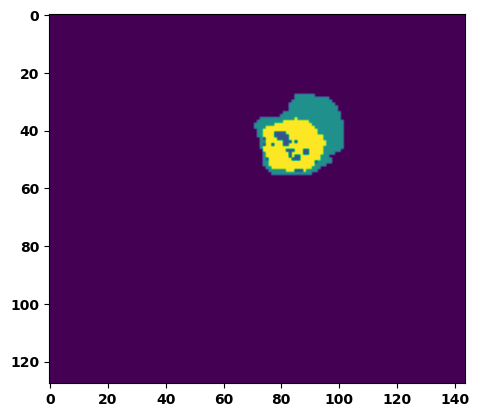

  6%|▌         | 2/36 [00:03<00:52,  1.53s/it]

Batch_id:  1 Eval loss:  0.5797339081764221
Batch_id:  1 Eval IoU:  tensor(0.3685, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9257, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8939, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:50,  1.54s/it]

Batch_id:  2 Eval loss:  0.40511417388916016
Batch_id:  2 Eval IoU:  tensor(0.5000, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9011, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8690, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8682, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9830, device='cuda:0')


 11%|█         | 4/36 [00:06<00:47,  1.47s/it]

Batch_id:  3 Eval loss:  0.6044965386390686
Batch_id:  3 Eval IoU:  tensor(0.3452, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9376, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9235, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.48s/it]

Batch_id:  4 Eval loss:  0.4747922122478485
Batch_id:  4 Eval IoU:  tensor(0.4294, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9151, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9875, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:44,  1.48s/it]

Batch_id:  5 Eval loss:  0.757853090763092
Batch_id:  5 Eval IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.44s/it]

Batch_id:  6 Eval loss:  0.6119494438171387
Batch_id:  6 Eval IoU:  tensor(0.3394, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.42s/it]

Batch_id:  7 Eval loss:  0.7580617666244507
Batch_id:  7 Eval IoU:  tensor(0.2336, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.21574744582176208
Batch_id:  8 Eval IoU:  tensor(0.6855, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.46s/it]

Batch_id:  9 Eval loss:  0.6982779502868652
Batch_id:  9 Eval IoU:  tensor(0.2533, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8860, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.8688, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  10 Eval loss:  0.7377718687057495
Batch_id:  10 Eval IoU:  tensor(0.2124, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8297, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.7447, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8392, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


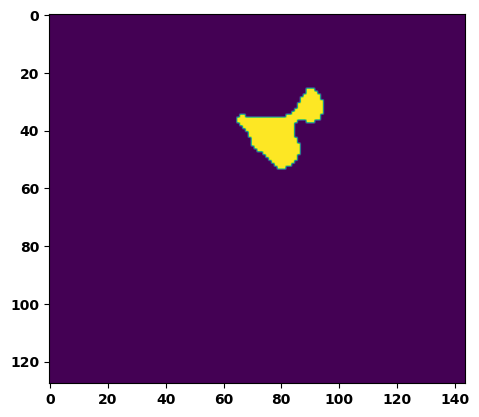

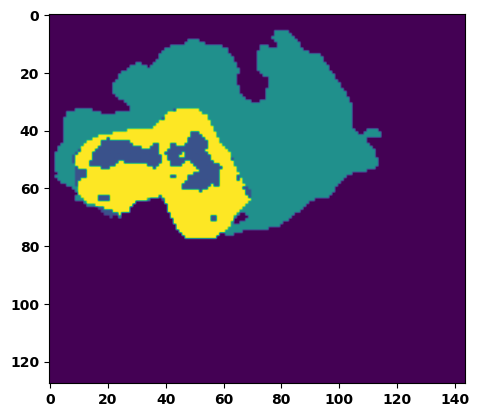

 33%|███▎      | 12/36 [00:17<00:35,  1.48s/it]

Batch_id:  11 Eval loss:  0.6790225505828857
Batch_id:  11 Eval IoU:  tensor(0.2760, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9348, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9025, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.48s/it]

Batch_id:  12 Eval loss:  0.7562870383262634
Batch_id:  12 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.51s/it]

Batch_id:  13 Eval loss:  0.722619354724884
Batch_id:  13 Eval IoU:  tensor(0.2344, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8827, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8316, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9254, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.49s/it]

Batch_id:  14 Eval loss:  0.370719313621521
Batch_id:  14 Eval IoU:  tensor(0.5320, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.46s/it]

Batch_id:  15 Eval loss:  0.7577263116836548
Batch_id:  15 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.47s/it]

Batch_id:  16 Eval loss:  0.7573398351669312
Batch_id:  16 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.46s/it]

Batch_id:  17 Eval loss:  0.7749416828155518
Batch_id:  17 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:24,  1.45s/it]

Batch_id:  18 Eval loss:  0.7517154216766357
Batch_id:  18 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.41s/it]

Batch_id:  19 Eval loss:  0.6037718653678894
Batch_id:  19 Eval IoU:  tensor(0.2870, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.5918, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4340, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.6077, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.7640, device='cuda:0')
Batch_id:  20 Eval loss:  0.900575578212738
Batch_id:  20 Eval IoU:  tensor(0.0583, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.4616, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3362, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9018, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.1940, device='cuda:0')


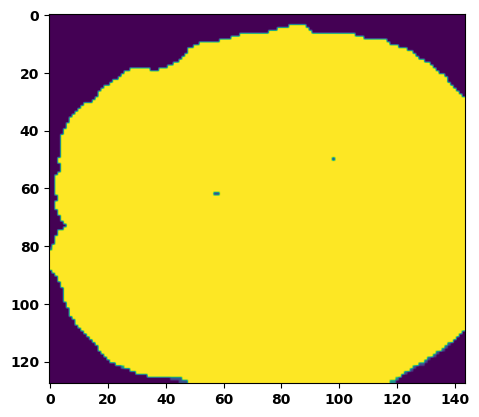

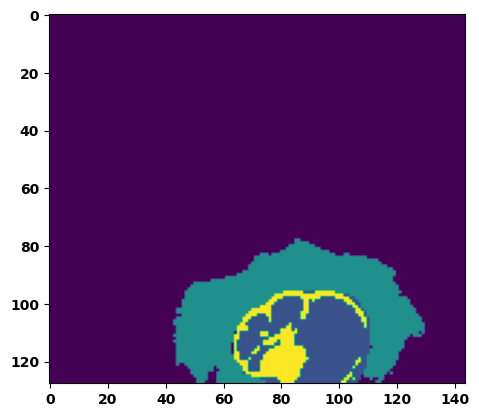

 61%|██████    | 22/36 [00:32<00:20,  1.48s/it]

Batch_id:  21 Eval loss:  0.7299017906188965
Batch_id:  21 Eval IoU:  tensor(0.2241, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8520, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.7781, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.8731, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:20,  1.56s/it]

Batch_id:  22 Eval loss:  0.5931063294410706
Batch_id:  22 Eval IoU:  tensor(0.3411, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9805, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.51s/it]

Batch_id:  23 Eval loss:  0.760460376739502
Batch_id:  23 Eval IoU:  tensor(0.2223, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8824, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.45s/it]

Batch_id:  24 Eval loss:  0.7561779618263245
Batch_id:  24 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.47s/it]

Batch_id:  25 Eval loss:  0.8824461698532104
Batch_id:  25 Eval IoU:  tensor(0.0749, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4960, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4182, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9039, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9212, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.2447, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.47s/it]

Batch_id:  26 Eval loss:  0.7352650761604309
Batch_id:  26 Eval IoU:  tensor(0.2424, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.49s/it]

Batch_id:  27 Eval loss:  0.1546168029308319
Batch_id:  27 Eval IoU:  tensor(0.7471, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9825, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.49s/it]

Batch_id:  28 Eval loss:  0.756781816482544
Batch_id:  28 Eval IoU:  tensor(0.2258, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8859, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9614, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.50s/it]

Batch_id:  29 Eval loss:  0.7625237703323364
Batch_id:  29 Eval IoU:  tensor(0.1468, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5373, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3891, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3094, device='cuda:0')
Batch_id:  30 Eval loss:  0.40635350346565247
Batch_id:  30 Eval IoU:  tensor(0.5047, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9466, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9767, device='cuda:0')


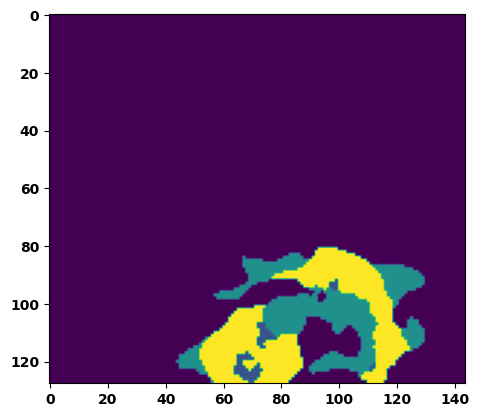

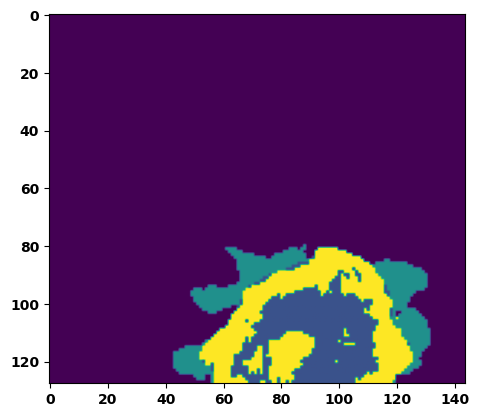

 89%|████████▉ | 32/36 [00:47<00:05,  1.48s/it]

Batch_id:  31 Eval loss:  0.6534022688865662
Batch_id:  31 Eval IoU:  tensor(0.2976, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9433, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.39s/it]

Batch_id:  32 Eval loss:  0.7681825160980225
Batch_id:  32 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.38s/it]

Batch_id:  33 Eval loss:  0.6293171048164368
Batch_id:  33 Eval IoU:  tensor(0.3192, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.38s/it]

Batch_id:  34 Eval loss:  0.6250104904174805
Batch_id:  34 Eval IoU:  tensor(0.2586, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6935, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.5606, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.6528, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.8737, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.47s/it]

Batch_id:  35 Eval loss:  0.6864909529685974
Batch_id:  35 Eval IoU:  tensor(0.2751, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9172, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')
Epoch  21 Training loss:  0.14603748186068102
Epoch  21 Evaluation loss:  0.6525932600100836
Epoch  21 Training accuracy :  tensor(0.7875)
Epoch  21 Evaluation accuracy :  tensor(0.2985)
Epoch  21 Training Mean Dice Score:  tensor(0.9831)
Epoch  21 Eval Mean Dice Score:  tensor(0.8815)
Epoch  21 Training Non-tumor Dice Score:  tensor(0.9842)
Epoch  21 Eval Non-tumor Dice Score:  tensor(0.8443)
Epoch  21 Training NCR/NET Dice Score:  tensor(0.9923)
Epoch  21 Eval NCR/NET Dice Score:  tensor(0.9642)
Epoch  21 Training ED Dice Score:  tensor(0.98

Epoch: 22
Training in session: 


  1%|          | 1/110 [00:01<02:51,  1.57s/it]

Batch_id:  0 Training loss:  0.09303592145442963
Batch_id:  0 Training IoU:  tensor(0.8454, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:38,  1.46s/it]

Batch_id:  1 Training loss:  0.14207151532173157
Batch_id:  1 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:34,  1.45s/it]

Batch_id:  2 Training loss:  0.12797679007053375
Batch_id:  2 Training IoU:  tensor(0.7890, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:30,  1.42s/it]

Batch_id:  3 Training loss:  0.3259492516517639
Batch_id:  3 Training IoU:  tensor(0.5703, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:35,  1.48s/it]

Batch_id:  4 Training loss:  0.07608616352081299
Batch_id:  4 Training IoU:  tensor(0.8725, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:33,  1.47s/it]

Batch_id:  5 Training loss:  0.3503788411617279
Batch_id:  5 Training IoU:  tensor(0.5605, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:29,  1.45s/it]

Batch_id:  6 Training loss:  0.09050305187702179
Batch_id:  6 Training IoU:  tensor(0.8460, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:26,  1.44s/it]

Batch_id:  7 Training loss:  0.0877877026796341
Batch_id:  7 Training IoU:  tensor(0.8511, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.26607272028923035
Batch_id:  8 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:26,  1.47s/it]

Batch_id:  9 Training loss:  0.11455592513084412
Batch_id:  9 Training IoU:  tensor(0.8305, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 10%|█         | 11/110 [00:16<02:23,  1.45s/it]

Batch_id:  10 Training loss:  0.2326611578464508
Batch_id:  10 Training IoU:  tensor(0.6800, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 11%|█         | 12/110 [00:17<02:21,  1.45s/it]

Batch_id:  11 Training loss:  0.05492079257965088
Batch_id:  11 Training IoU:  tensor(0.9110, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:18,  1.43s/it]

Batch_id:  12 Training loss:  0.13424883782863617
Batch_id:  12 Training IoU:  tensor(0.8137, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:18,  1.44s/it]

Batch_id:  13 Training loss:  0.1468997448682785
Batch_id:  13 Training IoU:  tensor(0.7615, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:26,  1.54s/it]

Batch_id:  14 Training loss:  0.14951422810554504
Batch_id:  14 Training IoU:  tensor(0.7732, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:27,  1.56s/it]

Batch_id:  15 Training loss:  0.1885221153497696
Batch_id:  15 Training IoU:  tensor(0.7477, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:20,  1.51s/it]

Batch_id:  16 Training loss:  0.26010215282440186
Batch_id:  16 Training IoU:  tensor(0.6846, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:15,  1.48s/it]

Batch_id:  17 Training loss:  0.11006081104278564
Batch_id:  17 Training IoU:  tensor(0.8255, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:14,  1.48s/it]

Batch_id:  18 Training loss:  0.11661092936992645
Batch_id:  18 Training IoU:  tensor(0.8028, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:17,  1.52s/it]

Batch_id:  19 Training loss:  0.08560553193092346
Batch_id:  19 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:13,  1.50s/it]

Batch_id:  20 Training loss:  0.11899322271347046
Batch_id:  20 Training IoU:  tensor(0.8169, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 20%|██        | 22/110 [00:32<02:09,  1.48s/it]

Batch_id:  21 Training loss:  0.15282826125621796
Batch_id:  21 Training IoU:  tensor(0.7516, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 21%|██        | 23/110 [00:34<02:11,  1.51s/it]

Batch_id:  22 Training loss:  0.12296760082244873
Batch_id:  22 Training IoU:  tensor(0.7937, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9779, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:10,  1.51s/it]

Batch_id:  23 Training loss:  0.12424591183662415
Batch_id:  23 Training IoU:  tensor(0.8010, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.21299228072166443
Batch_id:  24 Training IoU:  tensor(0.6753, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:04,  1.49s/it]

Batch_id:  25 Training loss:  0.09368772804737091
Batch_id:  25 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:05,  1.52s/it]

Batch_id:  26 Training loss:  0.146190345287323
Batch_id:  26 Training IoU:  tensor(0.7887, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 25%|██▌       | 28/110 [00:41<02:04,  1.52s/it]

Batch_id:  27 Training loss:  0.05369293689727783
Batch_id:  27 Training IoU:  tensor(0.9093, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:02,  1.51s/it]

Batch_id:  28 Training loss:  0.10677097737789154
Batch_id:  28 Training IoU:  tensor(0.8269, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:59,  1.49s/it]

Batch_id:  29 Training loss:  0.07354995608329773
Batch_id:  29 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:55,  1.47s/it]

Batch_id:  30 Training loss:  0.11816181242465973
Batch_id:  30 Training IoU:  tensor(0.8186, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:54,  1.46s/it]

Batch_id:  31 Training loss:  0.15841104090213776
Batch_id:  31 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 30%|███       | 33/110 [00:48<01:55,  1.50s/it]

Batch_id:  32 Training loss:  0.1192837506532669
Batch_id:  32 Training IoU:  tensor(0.8155, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 31%|███       | 34/110 [00:50<01:53,  1.49s/it]

Batch_id:  33 Training loss:  0.2202920764684677
Batch_id:  33 Training IoU:  tensor(0.6864, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:54,  1.53s/it]

Batch_id:  34 Training loss:  0.1587996780872345
Batch_id:  34 Training IoU:  tensor(0.7476, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:52,  1.52s/it]

Batch_id:  35 Training loss:  0.066616952419281
Batch_id:  35 Training IoU:  tensor(0.8825, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:51,  1.52s/it]

Batch_id:  36 Training loss:  0.07843531668186188
Batch_id:  36 Training IoU:  tensor(0.9114, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:53,  1.58s/it]

Batch_id:  37 Training loss:  0.08999563753604889
Batch_id:  37 Training IoU:  tensor(0.8655, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:49,  1.55s/it]

Batch_id:  38 Training loss:  0.27545231580734253
Batch_id:  38 Training IoU:  tensor(0.6590, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:47,  1.54s/it]

Batch_id:  39 Training loss:  0.26667290925979614
Batch_id:  39 Training IoU:  tensor(0.6711, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:45,  1.52s/it]

Batch_id:  40 Training loss:  0.16716785728931427
Batch_id:  40 Training IoU:  tensor(0.7502, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:40,  1.48s/it]

Batch_id:  41 Training loss:  0.1632697731256485
Batch_id:  41 Training IoU:  tensor(0.7416, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:37,  1.46s/it]

Batch_id:  42 Training loss:  0.1396436244249344
Batch_id:  42 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 40%|████      | 44/110 [01:05<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.06268587708473206
Batch_id:  43 Training IoU:  tensor(0.8927, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 41%|████      | 45/110 [01:07<01:37,  1.50s/it]

Batch_id:  44 Training loss:  0.05928593873977661
Batch_id:  44 Training IoU:  tensor(0.8975, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:38,  1.53s/it]

Batch_id:  45 Training loss:  0.17805947363376617
Batch_id:  45 Training IoU:  tensor(0.7237, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 43%|████▎     | 47/110 [01:10<01:34,  1.51s/it]

Batch_id:  46 Training loss:  0.14097191393375397
Batch_id:  46 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:35,  1.53s/it]

Batch_id:  47 Training loss:  0.21613414585590363
Batch_id:  47 Training IoU:  tensor(0.6733, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:30,  1.48s/it]

Batch_id:  48 Training loss:  0.086550772190094
Batch_id:  48 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:29,  1.49s/it]

Batch_id:  49 Training loss:  0.04815639555454254
Batch_id:  49 Training IoU:  tensor(0.9204, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:28,  1.49s/it]

Batch_id:  50 Training loss:  0.0685434490442276
Batch_id:  50 Training IoU:  tensor(0.8830, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:23,  1.44s/it]

Batch_id:  51 Training loss:  0.07483313977718353
Batch_id:  51 Training IoU:  tensor(0.8752, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:21,  1.43s/it]

Batch_id:  52 Training loss:  0.11989113688468933
Batch_id:  52 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:21,  1.46s/it]

Batch_id:  53 Training loss:  0.23119330406188965
Batch_id:  53 Training IoU:  tensor(0.6688, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9628, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:19,  1.44s/it]

Batch_id:  54 Training loss:  0.08178071677684784
Batch_id:  54 Training IoU:  tensor(0.8626, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:18,  1.45s/it]

Batch_id:  55 Training loss:  0.24106667935848236
Batch_id:  55 Training IoU:  tensor(0.7271, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:17,  1.46s/it]

Batch_id:  56 Training loss:  0.23166751861572266
Batch_id:  56 Training IoU:  tensor(0.6793, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:14,  1.43s/it]

Batch_id:  57 Training loss:  0.24386847019195557
Batch_id:  57 Training IoU:  tensor(0.6901, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:11,  1.41s/it]

Batch_id:  58 Training loss:  0.09086167812347412
Batch_id:  58 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:10,  1.41s/it]

Batch_id:  59 Training loss:  0.14889493584632874
Batch_id:  59 Training IoU:  tensor(0.7715, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9711, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:08,  1.40s/it]

Batch_id:  60 Training loss:  0.09663437306880951
Batch_id:  60 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:05,  1.37s/it]

Batch_id:  61 Training loss:  0.05913540720939636
Batch_id:  61 Training IoU:  tensor(0.8985, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:03,  1.35s/it]

Batch_id:  62 Training loss:  0.06520549952983856
Batch_id:  62 Training IoU:  tensor(0.8879, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:01,  1.33s/it]

Batch_id:  63 Training loss:  0.2361636459827423
Batch_id:  63 Training IoU:  tensor(0.6594, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:00,  1.35s/it]

Batch_id:  64 Training loss:  0.08192096650600433
Batch_id:  64 Training IoU:  tensor(0.8623, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:05,  1.48s/it]

Batch_id:  65 Training loss:  0.22633877396583557
Batch_id:  65 Training IoU:  tensor(0.6955, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.19430901110172272
Batch_id:  66 Training IoU:  tensor(0.7141, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<00:59,  1.41s/it]

Batch_id:  67 Training loss:  0.23098357021808624
Batch_id:  67 Training IoU:  tensor(0.6651, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<00:58,  1.43s/it]

Batch_id:  68 Training loss:  0.272261381149292
Batch_id:  68 Training IoU:  tensor(0.6535, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:54,  1.37s/it]

Batch_id:  69 Training loss:  0.15583598613739014
Batch_id:  69 Training IoU:  tensor(0.7697, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:55,  1.42s/it]

Batch_id:  70 Training loss:  0.12884841859340668
Batch_id:  70 Training IoU:  tensor(0.8254, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:52,  1.38s/it]

Batch_id:  71 Training loss:  0.15493758022785187
Batch_id:  71 Training IoU:  tensor(0.7599, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:54,  1.47s/it]

Batch_id:  72 Training loss:  0.09647905826568604
Batch_id:  72 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:54,  1.50s/it]

Batch_id:  73 Training loss:  0.10178454220294952
Batch_id:  73 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:52,  1.50s/it]

Batch_id:  74 Training loss:  0.2624244689941406
Batch_id:  74 Training IoU:  tensor(0.6509, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:51,  1.51s/it]

Batch_id:  75 Training loss:  0.3913007378578186
Batch_id:  75 Training IoU:  tensor(0.5239, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9722, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:49,  1.49s/it]

Batch_id:  76 Training loss:  0.10470609366893768
Batch_id:  76 Training IoU:  tensor(0.8279, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:48,  1.50s/it]

Batch_id:  77 Training loss:  0.1173296719789505
Batch_id:  77 Training IoU:  tensor(0.8129, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:44,  1.44s/it]

Batch_id:  78 Training loss:  0.14824339747428894
Batch_id:  78 Training IoU:  tensor(0.7991, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:43,  1.45s/it]

Batch_id:  79 Training loss:  0.09512889385223389
Batch_id:  79 Training IoU:  tensor(0.8367, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:41,  1.43s/it]

Batch_id:  80 Training loss:  0.09079581499099731
Batch_id:  80 Training IoU:  tensor(0.8526, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:40,  1.43s/it]

Batch_id:  81 Training loss:  0.11939287185668945
Batch_id:  81 Training IoU:  tensor(0.8105, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:38,  1.44s/it]

Batch_id:  82 Training loss:  0.17061485350131989
Batch_id:  82 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:36,  1.42s/it]

Batch_id:  83 Training loss:  0.15545053780078888
Batch_id:  83 Training IoU:  tensor(0.7543, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:35,  1.43s/it]

Batch_id:  84 Training loss:  0.20431384444236755
Batch_id:  84 Training IoU:  tensor(0.7486, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:34,  1.45s/it]

Batch_id:  85 Training loss:  0.10082195699214935
Batch_id:  85 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:35,  1.56s/it]

Batch_id:  86 Training loss:  0.06951162219047546
Batch_id:  86 Training IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:33,  1.53s/it]

Batch_id:  87 Training loss:  0.07143448293209076
Batch_id:  87 Training IoU:  tensor(0.8843, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:31,  1.48s/it]

Batch_id:  88 Training loss:  0.126877099275589
Batch_id:  88 Training IoU:  tensor(0.7976, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:28,  1.42s/it]

Batch_id:  89 Training loss:  0.11206197738647461
Batch_id:  89 Training IoU:  tensor(0.8103, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.07815419137477875
Batch_id:  90 Training IoU:  tensor(0.8656, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:25,  1.41s/it]

Batch_id:  91 Training loss:  0.20181414484977722
Batch_id:  91 Training IoU:  tensor(0.7195, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:23,  1.39s/it]

Batch_id:  92 Training loss:  0.14666028320789337
Batch_id:  92 Training IoU:  tensor(0.7630, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:23,  1.49s/it]

Batch_id:  93 Training loss:  0.14901204407215118
Batch_id:  93 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:22,  1.49s/it]

Batch_id:  94 Training loss:  0.061825767159461975
Batch_id:  94 Training IoU:  tensor(0.8965, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:20,  1.47s/it]

Batch_id:  95 Training loss:  0.23581978678703308
Batch_id:  95 Training IoU:  tensor(0.6850, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.47s/it]

Batch_id:  96 Training loss:  0.10034424066543579
Batch_id:  96 Training IoU:  tensor(0.9093, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:17,  1.47s/it]

Batch_id:  97 Training loss:  0.0936441570520401
Batch_id:  97 Training IoU:  tensor(0.8527, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:15,  1.45s/it]

Batch_id:  98 Training loss:  0.10996353626251221
Batch_id:  98 Training IoU:  tensor(0.8176, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:14,  1.46s/it]

Batch_id:  99 Training loss:  0.09407731890678406
Batch_id:  99 Training IoU:  tensor(0.8673, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.51s/it]

Batch_id:  100 Training loss:  0.05414089560508728
Batch_id:  100 Training IoU:  tensor(0.9098, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:12,  1.52s/it]

Batch_id:  101 Training loss:  0.07256630063056946
Batch_id:  101 Training IoU:  tensor(0.8787, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.49s/it]

Batch_id:  102 Training loss:  0.19734890758991241
Batch_id:  102 Training IoU:  tensor(0.7730, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.45s/it]

Batch_id:  103 Training loss:  0.17715942859649658
Batch_id:  103 Training IoU:  tensor(0.7289, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.48s/it]

Batch_id:  104 Training loss:  0.1359732300043106
Batch_id:  104 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.3271797001361847
Batch_id:  105 Training IoU:  tensor(0.6216, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.50s/it]

Batch_id:  106 Training loss:  0.13060100376605988
Batch_id:  106 Training IoU:  tensor(0.8169, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:03,  1.50s/it]

Batch_id:  107 Training loss:  0.19679206609725952
Batch_id:  107 Training IoU:  tensor(0.7021, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.55s/it]

Batch_id:  108 Training loss:  0.039028897881507874
Batch_id:  108 Training IoU:  tensor(0.9340, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.2350887656211853
Batch_id:  109 Training IoU:  tensor(0.6987, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9981, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8839921951293945
Batch_id:  0 Eval IoU:  tensor(0.0747, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.4956, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.4176, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2435, device='cuda:0')


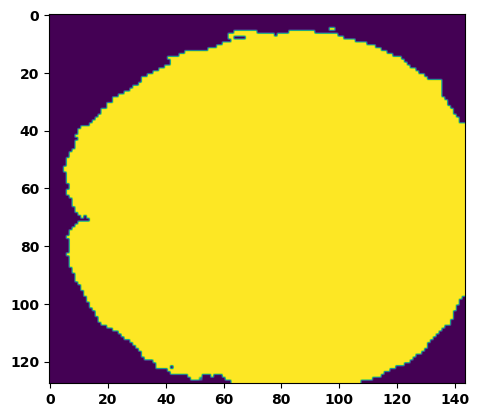

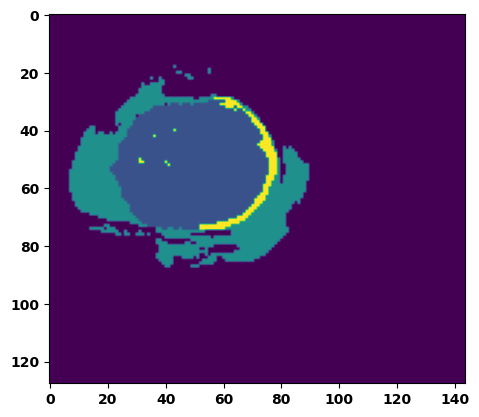

  6%|▌         | 2/36 [00:02<00:47,  1.39s/it]

Batch_id:  1 Eval loss:  0.5396184921264648
Batch_id:  1 Eval IoU:  tensor(0.3945, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9044, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8667, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9315, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.40s/it]

Batch_id:  2 Eval loss:  0.6428114175796509
Batch_id:  2 Eval IoU:  tensor(0.3114, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.46s/it]

Batch_id:  3 Eval loss:  0.6299750804901123
Batch_id:  3 Eval IoU:  tensor(0.3015, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9255, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9873, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.45s/it]

Batch_id:  4 Eval loss:  0.17645226418972015
Batch_id:  4 Eval IoU:  tensor(0.7458, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.45s/it]

Batch_id:  5 Eval loss:  0.4449536204338074
Batch_id:  5 Eval IoU:  tensor(0.4330, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9022, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8860, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9155, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9663, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.7748628854751587
Batch_id:  6 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.39s/it]

Batch_id:  7 Eval loss:  0.49755334854125977
Batch_id:  7 Eval IoU:  tensor(0.3983, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9081, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9581, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:38,  1.41s/it]

Batch_id:  8 Eval loss:  0.666611909866333
Batch_id:  8 Eval IoU:  tensor(0.2449, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7543, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.7160, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8597, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.7693, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.42s/it]

Batch_id:  9 Eval loss:  0.666208028793335
Batch_id:  9 Eval IoU:  tensor(0.2942, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  10 Eval loss:  0.7585505247116089
Batch_id:  10 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


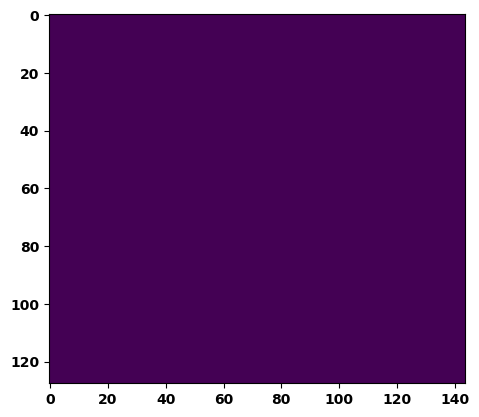

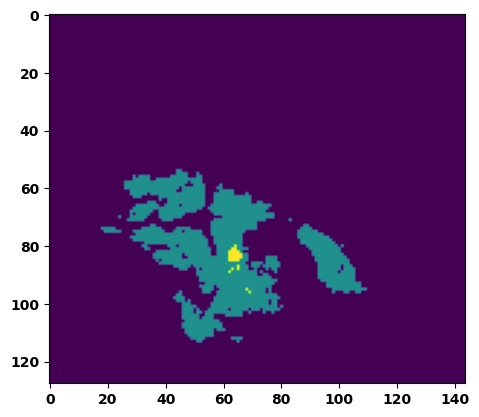

 33%|███▎      | 12/36 [00:17<00:34,  1.44s/it]

Batch_id:  11 Eval loss:  0.8558480143547058
Batch_id:  11 Eval IoU:  tensor(0.0926, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.5331, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4396, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8632, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.3265, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.45s/it]

Batch_id:  12 Eval loss:  0.5629094839096069
Batch_id:  12 Eval IoU:  tensor(0.3906, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9349, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9133, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.49s/it]

Batch_id:  13 Eval loss:  0.3842942714691162
Batch_id:  13 Eval IoU:  tensor(0.5129, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.47s/it]

Batch_id:  14 Eval loss:  0.2906298041343689
Batch_id:  14 Eval IoU:  tensor(0.5894, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.42s/it]

Batch_id:  15 Eval loss:  0.12060664594173431
Batch_id:  15 Eval IoU:  tensor(0.8027, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.40s/it]

Batch_id:  16 Eval loss:  0.7681711316108704
Batch_id:  16 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:26,  1.45s/it]

Batch_id:  17 Eval loss:  0.7263550162315369
Batch_id:  17 Eval IoU:  tensor(0.1930, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.7082, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.6285, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.5690, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9465, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.42s/it]

Batch_id:  18 Eval loss:  0.509783923625946
Batch_id:  18 Eval IoU:  tensor(0.4021, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.42s/it]

Batch_id:  19 Eval loss:  0.9032875299453735
Batch_id:  19 Eval IoU:  tensor(0.0570, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.4599, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3337, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.1901, device='cuda:0')
Batch_id:  20 Eval loss:  0.7516766786575317
Batch_id:  20 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


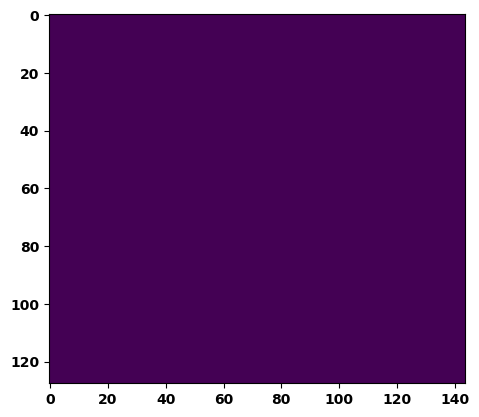

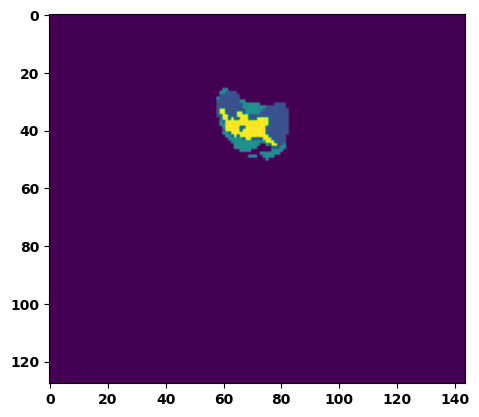

 61%|██████    | 22/36 [00:31<00:20,  1.47s/it]

Batch_id:  21 Eval loss:  0.8377262949943542
Batch_id:  21 Eval IoU:  tensor(0.0993, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.5278, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3851, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.2925, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:20,  1.54s/it]

Batch_id:  22 Eval loss:  0.35760796070098877
Batch_id:  22 Eval IoU:  tensor(0.5778, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.50s/it]

Batch_id:  23 Eval loss:  0.6998582482337952
Batch_id:  23 Eval IoU:  tensor(0.2631, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9264, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9111, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9755, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.42641744017601013
Batch_id:  24 Eval IoU:  tensor(0.4761, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9421, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:15,  1.52s/it]

Batch_id:  25 Eval loss:  0.597608745098114
Batch_id:  25 Eval IoU:  tensor(0.3545, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9419, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.49s/it]

Batch_id:  26 Eval loss:  0.14158973097801208
Batch_id:  26 Eval IoU:  tensor(0.7849, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.49s/it]

Batch_id:  27 Eval loss:  0.10998465120792389
Batch_id:  27 Eval IoU:  tensor(0.8418, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.48s/it]

Batch_id:  28 Eval loss:  0.7561838626861572
Batch_id:  28 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.44s/it]

Batch_id:  29 Eval loss:  0.8836337327957153
Batch_id:  29 Eval IoU:  tensor(0.0700, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.4990, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.2556, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.5171, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.7745, device='cuda:0')
Batch_id:  30 Eval loss:  0.44498831033706665
Batch_id:  30 Eval IoU:  tensor(0.4638, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.7772, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.6681, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.6721, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


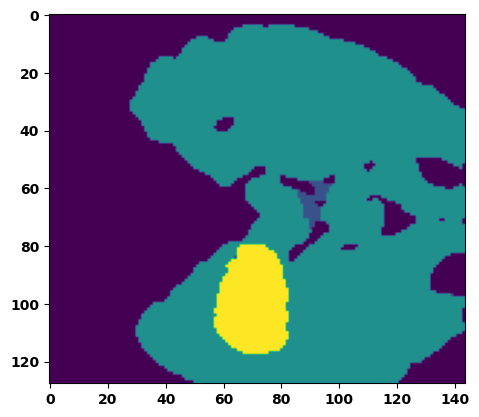

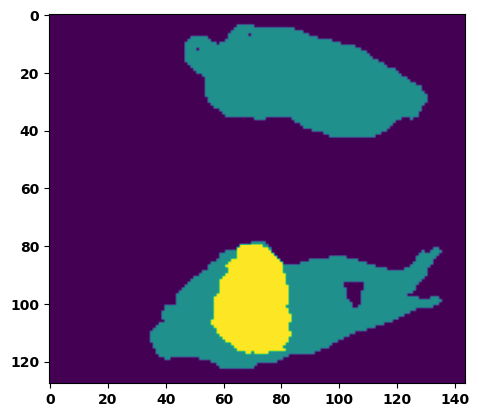

 89%|████████▉ | 32/36 [00:46<00:05,  1.43s/it]

Batch_id:  31 Eval loss:  0.5441668629646301
Batch_id:  31 Eval IoU:  tensor(0.3903, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9820, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.05565465986728668
Batch_id:  32 Eval IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.49s/it]

Batch_id:  33 Eval loss:  0.3686673045158386
Batch_id:  33 Eval IoU:  tensor(0.5263, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9550, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9347, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.47s/it]

Batch_id:  34 Eval loss:  0.5529689788818359
Batch_id:  34 Eval IoU:  tensor(0.4055, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.45s/it]

Batch_id:  35 Eval loss:  0.8287951350212097
Batch_id:  35 Eval IoU:  tensor(0.0981, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4640, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3053, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.1995, device='cuda:0')
Epoch  22 Training loss:  0.14531429911201652
Epoch  22 Evaluation loss:  0.5600278940465715
Epoch  22 Training accuracy :  tensor(0.7882)
Epoch  22 Evaluation accuracy :  tensor(0.3783)
Epoch  22 Training Mean Dice Score:  tensor(0.9832)
Epoch  22 Eval Mean Dice Score:  tensor(0.8604)
Epoch  22 Training Non-tumor Dice Score:  tensor(0.9843)
Epoch  22 Eval Non-tumor Dice Score:  tensor(0.8215)
Epoch  22 Training NCR/NET Dice Score:  tensor(0.9924)
Epoch  22 Eval NCR/NET Dice Score:  tensor(0.9724)
Epoch  22 Training ED Dice Score:  tensor(0.98

Epoch: 23
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.51s/it]

Batch_id:  0 Training loss:  0.0716768354177475
Batch_id:  0 Training IoU:  tensor(0.8800, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:32,  1.42s/it]

Batch_id:  1 Training loss:  0.23334155976772308
Batch_id:  1 Training IoU:  tensor(0.6995, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:27,  1.38s/it]

Batch_id:  2 Training loss:  0.1187143474817276
Batch_id:  2 Training IoU:  tensor(0.8014, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:26,  1.38s/it]

Batch_id:  3 Training loss:  0.1834067702293396
Batch_id:  3 Training IoU:  tensor(0.7188, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:28,  1.41s/it]

Batch_id:  4 Training loss:  0.19278787076473236
Batch_id:  4 Training IoU:  tensor(0.7752, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:30,  1.45s/it]

Batch_id:  5 Training loss:  0.08528754115104675
Batch_id:  5 Training IoU:  tensor(0.8827, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:29,  1.45s/it]

Batch_id:  6 Training loss:  0.052999526262283325
Batch_id:  6 Training IoU:  tensor(0.9100, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:34,  1.51s/it]

Batch_id:  7 Training loss:  0.23425818979740143
Batch_id:  7 Training IoU:  tensor(0.6754, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.13983894884586334
Batch_id:  8 Training IoU:  tensor(0.7714, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:25,  1.45s/it]

Batch_id:  9 Training loss:  0.08212193846702576
Batch_id:  9 Training IoU:  tensor(0.8615, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 10%|█         | 11/110 [00:15<02:25,  1.47s/it]

Batch_id:  10 Training loss:  0.105296790599823
Batch_id:  10 Training IoU:  tensor(0.8214, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 11%|█         | 12/110 [00:17<02:23,  1.46s/it]

Batch_id:  11 Training loss:  0.059221699833869934
Batch_id:  11 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:23,  1.48s/it]

Batch_id:  12 Training loss:  0.1608702689409256
Batch_id:  12 Training IoU:  tensor(0.8333, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:22,  1.48s/it]

Batch_id:  13 Training loss:  0.18434590101242065
Batch_id:  13 Training IoU:  tensor(0.7535, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:16,  1.44s/it]

Batch_id:  14 Training loss:  0.092058926820755
Batch_id:  14 Training IoU:  tensor(0.8424, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:17,  1.47s/it]

Batch_id:  15 Training loss:  0.15312035381793976
Batch_id:  15 Training IoU:  tensor(0.7701, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:18,  1.49s/it]

Batch_id:  16 Training loss:  0.09949430823326111
Batch_id:  16 Training IoU:  tensor(0.9027, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:17,  1.49s/it]

Batch_id:  17 Training loss:  0.1164761483669281
Batch_id:  17 Training IoU:  tensor(0.8154, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:17,  1.52s/it]

Batch_id:  18 Training loss:  0.07782721519470215
Batch_id:  18 Training IoU:  tensor(0.9083, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:11,  1.46s/it]

Batch_id:  19 Training loss:  0.15927861630916595
Batch_id:  19 Training IoU:  tensor(0.7455, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:09,  1.46s/it]

Batch_id:  20 Training loss:  0.09745003283023834
Batch_id:  20 Training IoU:  tensor(0.8334, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 20%|██        | 22/110 [00:32<02:10,  1.48s/it]

Batch_id:  21 Training loss:  0.06063051521778107
Batch_id:  21 Training IoU:  tensor(0.8980, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 21%|██        | 23/110 [00:33<02:04,  1.43s/it]

Batch_id:  22 Training loss:  0.1571502983570099
Batch_id:  22 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:01,  1.41s/it]

Batch_id:  23 Training loss:  0.0917590856552124
Batch_id:  23 Training IoU:  tensor(0.8498, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:04,  1.46s/it]

Batch_id:  24 Training loss:  0.054455384612083435
Batch_id:  24 Training IoU:  tensor(0.9073, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:04,  1.48s/it]

Batch_id:  25 Training loss:  0.0789259821176529
Batch_id:  25 Training IoU:  tensor(0.8682, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:57,  1.42s/it]

Batch_id:  26 Training loss:  0.15059176087379456
Batch_id:  26 Training IoU:  tensor(0.7612, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:54,  1.40s/it]

Batch_id:  27 Training loss:  0.18555815517902374
Batch_id:  27 Training IoU:  tensor(0.7711, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.07657885551452637
Batch_id:  28 Training IoU:  tensor(0.8859, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:57,  1.47s/it]

Batch_id:  29 Training loss:  0.09537011384963989
Batch_id:  29 Training IoU:  tensor(0.8377, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:53,  1.44s/it]

Batch_id:  30 Training loss:  0.13514173030853271
Batch_id:  30 Training IoU:  tensor(0.8100, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:55,  1.48s/it]

Batch_id:  31 Training loss:  0.14009399712085724
Batch_id:  31 Training IoU:  tensor(0.7972, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 30%|███       | 33/110 [00:48<01:54,  1.49s/it]

Batch_id:  32 Training loss:  0.11900182068347931
Batch_id:  32 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 31%|███       | 34/110 [00:49<01:52,  1.49s/it]

Batch_id:  33 Training loss:  0.10691224038600922
Batch_id:  33 Training IoU:  tensor(0.8321, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:54,  1.53s/it]

Batch_id:  34 Training loss:  0.2370377629995346
Batch_id:  34 Training IoU:  tensor(0.6969, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 33%|███▎      | 36/110 [00:53<02:00,  1.63s/it]

Batch_id:  35 Training loss:  0.10142374038696289
Batch_id:  35 Training IoU:  tensor(0.8334, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:56,  1.59s/it]

Batch_id:  36 Training loss:  0.25867968797683716
Batch_id:  36 Training IoU:  tensor(0.6694, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:52,  1.56s/it]

Batch_id:  37 Training loss:  0.17649240791797638
Batch_id:  37 Training IoU:  tensor(0.7193, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:50,  1.56s/it]

Batch_id:  38 Training loss:  0.12106598913669586
Batch_id:  38 Training IoU:  tensor(0.8203, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:50,  1.58s/it]

Batch_id:  39 Training loss:  0.06540016829967499
Batch_id:  39 Training IoU:  tensor(0.8879, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:46,  1.55s/it]

Batch_id:  40 Training loss:  0.1261373907327652
Batch_id:  40 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:46,  1.56s/it]

Batch_id:  41 Training loss:  0.0483001172542572
Batch_id:  41 Training IoU:  tensor(0.9209, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:44,  1.57s/it]

Batch_id:  42 Training loss:  0.056672438979148865
Batch_id:  42 Training IoU:  tensor(0.9042, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 40%|████      | 44/110 [01:05<01:42,  1.55s/it]

Batch_id:  43 Training loss:  0.11556848883628845
Batch_id:  43 Training IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 41%|████      | 45/110 [01:07<01:42,  1.57s/it]

Batch_id:  44 Training loss:  0.24533043801784515
Batch_id:  44 Training IoU:  tensor(0.6916, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:39,  1.55s/it]

Batch_id:  45 Training loss:  0.14907380938529968
Batch_id:  45 Training IoU:  tensor(0.7713, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 43%|████▎     | 47/110 [01:10<01:41,  1.61s/it]

Batch_id:  46 Training loss:  0.03240758180618286
Batch_id:  46 Training IoU:  tensor(0.9460, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:36,  1.56s/it]

Batch_id:  47 Training loss:  0.14883700013160706
Batch_id:  47 Training IoU:  tensor(0.7864, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:34,  1.55s/it]

Batch_id:  48 Training loss:  0.15260009467601776
Batch_id:  48 Training IoU:  tensor(0.7943, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:30,  1.50s/it]

Batch_id:  49 Training loss:  0.14867886900901794
Batch_id:  49 Training IoU:  tensor(0.7713, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:27,  1.48s/it]

Batch_id:  50 Training loss:  0.14921924471855164
Batch_id:  50 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:32,  1.60s/it]

Batch_id:  51 Training loss:  0.11133576929569244
Batch_id:  51 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:27,  1.54s/it]

Batch_id:  52 Training loss:  0.1221504807472229
Batch_id:  52 Training IoU:  tensor(0.8053, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 49%|████▉     | 54/110 [01:21<01:28,  1.58s/it]

Batch_id:  53 Training loss:  0.19287492334842682
Batch_id:  53 Training IoU:  tensor(0.7306, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:28,  1.61s/it]

Batch_id:  54 Training loss:  0.07421986758708954
Batch_id:  54 Training IoU:  tensor(0.8767, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 51%|█████     | 56/110 [01:24<01:25,  1.58s/it]

Batch_id:  55 Training loss:  0.19789569079875946
Batch_id:  55 Training IoU:  tensor(0.7025, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 52%|█████▏    | 57/110 [01:25<01:23,  1.58s/it]

Batch_id:  56 Training loss:  0.08741460740566254
Batch_id:  56 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 53%|█████▎    | 58/110 [01:27<01:19,  1.53s/it]

Batch_id:  57 Training loss:  0.20068347454071045
Batch_id:  57 Training IoU:  tensor(0.6985, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 54%|█████▎    | 59/110 [01:28<01:17,  1.51s/it]

Batch_id:  58 Training loss:  0.20836776494979858
Batch_id:  58 Training IoU:  tensor(0.6843, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 55%|█████▍    | 60/110 [01:30<01:18,  1.56s/it]

Batch_id:  59 Training loss:  0.052214115858078
Batch_id:  59 Training IoU:  tensor(0.9154, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 55%|█████▌    | 61/110 [01:31<01:13,  1.50s/it]

Batch_id:  60 Training loss:  0.10585558414459229
Batch_id:  60 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 56%|█████▋    | 62/110 [01:33<01:11,  1.49s/it]

Batch_id:  61 Training loss:  0.10403375327587128
Batch_id:  61 Training IoU:  tensor(0.8300, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 57%|█████▋    | 63/110 [01:34<01:09,  1.47s/it]

Batch_id:  62 Training loss:  0.3085698187351227
Batch_id:  62 Training IoU:  tensor(0.5837, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 58%|█████▊    | 64/110 [01:36<01:07,  1.48s/it]

Batch_id:  63 Training loss:  0.07196500897407532
Batch_id:  63 Training IoU:  tensor(0.8732, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:10,  1.56s/it]

Batch_id:  64 Training loss:  0.1257784515619278
Batch_id:  64 Training IoU:  tensor(0.8004, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 60%|██████    | 66/110 [01:39<01:06,  1.50s/it]

Batch_id:  65 Training loss:  0.09551176428794861
Batch_id:  65 Training IoU:  tensor(0.8413, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


 61%|██████    | 67/110 [01:40<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.11377087235450745
Batch_id:  66 Training IoU:  tensor(0.8160, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 62%|██████▏   | 68/110 [01:42<01:04,  1.55s/it]

Batch_id:  67 Training loss:  0.12017287313938141
Batch_id:  67 Training IoU:  tensor(0.8144, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 63%|██████▎   | 69/110 [01:43<01:03,  1.54s/it]

Batch_id:  68 Training loss:  0.11356885731220245
Batch_id:  68 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 64%|██████▎   | 70/110 [01:45<00:59,  1.48s/it]

Batch_id:  69 Training loss:  0.1011311411857605
Batch_id:  69 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 65%|██████▍   | 71/110 [01:46<00:58,  1.51s/it]

Batch_id:  70 Training loss:  0.09398426115512848
Batch_id:  70 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 65%|██████▌   | 72/110 [01:48<00:55,  1.45s/it]

Batch_id:  71 Training loss:  0.15150979161262512
Batch_id:  71 Training IoU:  tensor(0.7575, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9592, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9759, device='cuda:0')


 66%|██████▋   | 73/110 [01:49<00:53,  1.45s/it]

Batch_id:  72 Training loss:  0.2753416895866394
Batch_id:  72 Training IoU:  tensor(0.6651, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 67%|██████▋   | 74/110 [01:50<00:51,  1.44s/it]

Batch_id:  73 Training loss:  0.16443844139575958
Batch_id:  73 Training IoU:  tensor(0.7553, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 68%|██████▊   | 75/110 [01:52<00:51,  1.48s/it]

Batch_id:  74 Training loss:  0.07562790811061859
Batch_id:  74 Training IoU:  tensor(0.8753, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 69%|██████▉   | 76/110 [01:54<00:49,  1.47s/it]

Batch_id:  75 Training loss:  0.24278394877910614
Batch_id:  75 Training IoU:  tensor(0.6644, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 70%|███████   | 77/110 [01:55<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.1767856925725937
Batch_id:  76 Training IoU:  tensor(0.7258, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 71%|███████   | 78/110 [01:56<00:45,  1.44s/it]

Batch_id:  77 Training loss:  0.15521161258220673
Batch_id:  77 Training IoU:  tensor(0.7635, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9705, device='cuda:0')


 72%|███████▏  | 79/110 [01:58<00:44,  1.43s/it]

Batch_id:  78 Training loss:  0.3837818503379822
Batch_id:  78 Training IoU:  tensor(0.5328, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9736, device='cuda:0')


 73%|███████▎  | 80/110 [01:59<00:41,  1.38s/it]

Batch_id:  79 Training loss:  0.12003287672996521
Batch_id:  79 Training IoU:  tensor(0.7980, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9781, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:39,  1.36s/it]

Batch_id:  80 Training loss:  0.11681143939495087
Batch_id:  80 Training IoU:  tensor(0.8113, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:39,  1.42s/it]

Batch_id:  81 Training loss:  0.0893644243478775
Batch_id:  81 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:38,  1.43s/it]

Batch_id:  82 Training loss:  0.0813203901052475
Batch_id:  82 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 76%|███████▋  | 84/110 [02:05<00:36,  1.41s/it]

Batch_id:  83 Training loss:  0.3236069977283478
Batch_id:  83 Training IoU:  tensor(0.6263, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:33,  1.34s/it]

Batch_id:  84 Training loss:  0.15869370102882385
Batch_id:  84 Training IoU:  tensor(0.7711, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:32,  1.36s/it]

Batch_id:  85 Training loss:  0.1427699774503708
Batch_id:  85 Training IoU:  tensor(0.7735, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9729, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:31,  1.37s/it]

Batch_id:  86 Training loss:  0.3679441213607788
Batch_id:  86 Training IoU:  tensor(0.5443, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:29,  1.36s/it]

Batch_id:  87 Training loss:  0.0806904286146164
Batch_id:  87 Training IoU:  tensor(0.8656, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 81%|████████  | 89/110 [02:11<00:28,  1.35s/it]

Batch_id:  88 Training loss:  0.09924952685832977
Batch_id:  88 Training IoU:  tensor(0.8327, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:27,  1.39s/it]

Batch_id:  89 Training loss:  0.09668131172657013
Batch_id:  89 Training IoU:  tensor(0.8378, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:26,  1.38s/it]

Batch_id:  90 Training loss:  0.05841974914073944
Batch_id:  90 Training IoU:  tensor(0.8998, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:24,  1.38s/it]

Batch_id:  91 Training loss:  0.2287738174200058
Batch_id:  91 Training IoU:  tensor(0.6914, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 85%|████████▍ | 93/110 [02:17<00:24,  1.41s/it]

Batch_id:  92 Training loss:  0.21371829509735107
Batch_id:  92 Training IoU:  tensor(0.6750, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:22,  1.40s/it]

Batch_id:  93 Training loss:  0.12626148760318756
Batch_id:  93 Training IoU:  tensor(0.7902, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:21,  1.42s/it]

Batch_id:  94 Training loss:  0.22798244655132294
Batch_id:  94 Training IoU:  tensor(0.6711, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9622, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:20,  1.44s/it]

Batch_id:  95 Training loss:  0.10637184977531433
Batch_id:  95 Training IoU:  tensor(0.8225, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.40s/it]

Batch_id:  96 Training loss:  0.1911560446023941
Batch_id:  96 Training IoU:  tensor(0.7169, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:16,  1.39s/it]

Batch_id:  97 Training loss:  0.15027551352977753
Batch_id:  97 Training IoU:  tensor(0.7578, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:15,  1.38s/it]

Batch_id:  98 Training loss:  0.2573804259300232
Batch_id:  98 Training IoU:  tensor(0.6854, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:13,  1.38s/it]

Batch_id:  99 Training loss:  0.08784058690071106
Batch_id:  99 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:12,  1.37s/it]

Batch_id:  100 Training loss:  0.061439767479896545
Batch_id:  100 Training IoU:  tensor(0.8950, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.41s/it]

Batch_id:  101 Training loss:  0.25883573293685913
Batch_id:  101 Training IoU:  tensor(0.6543, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.44s/it]

Batch_id:  102 Training loss:  0.06985551118850708
Batch_id:  102 Training IoU:  tensor(0.8801, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.42s/it]

Batch_id:  103 Training loss:  0.256780743598938
Batch_id:  103 Training IoU:  tensor(0.6833, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.43s/it]

Batch_id:  104 Training loss:  0.07341688871383667
Batch_id:  104 Training IoU:  tensor(0.8759, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.42s/it]

Batch_id:  105 Training loss:  0.1332635134458542
Batch_id:  105 Training IoU:  tensor(0.7847, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.43s/it]

Batch_id:  106 Training loss:  0.19348445534706116
Batch_id:  106 Training IoU:  tensor(0.7157, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:02,  1.41s/it]

Batch_id:  107 Training loss:  0.23035430908203125
Batch_id:  107 Training IoU:  tensor(0.7450, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.37s/it]

Batch_id:  108 Training loss:  0.12080243229866028
Batch_id:  108 Training IoU:  tensor(0.7957, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.2145020216703415
Batch_id:  109 Training IoU:  tensor(0.7059, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9959, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5736256837844849
Batch_id:  0 Eval IoU:  tensor(0.3800, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9392, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9238, device='cuda:0')


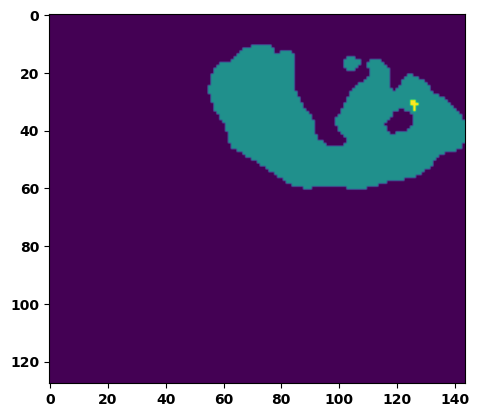

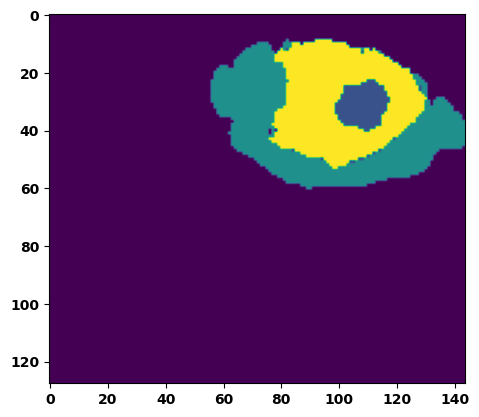

  6%|▌         | 2/36 [00:02<00:45,  1.32s/it]

Batch_id:  1 Eval loss:  0.5043685436248779
Batch_id:  1 Eval IoU:  tensor(0.4087, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9858, device='cuda:0')


  8%|▊         | 3/36 [00:03<00:43,  1.31s/it]

Batch_id:  2 Eval loss:  0.7516312599182129
Batch_id:  2 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 11%|█         | 4/36 [00:05<00:42,  1.32s/it]

Batch_id:  3 Eval loss:  0.7523094415664673
Batch_id:  3 Eval IoU:  tensor(0.1808, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7104, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.6345, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.5729, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:41,  1.33s/it]

Batch_id:  4 Eval loss:  0.5585373044013977
Batch_id:  4 Eval IoU:  tensor(0.3851, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9046, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8720, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9349, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9283, device='cuda:0')


 17%|█▋        | 6/36 [00:07<00:40,  1.34s/it]

Batch_id:  5 Eval loss:  0.7748676538467407
Batch_id:  5 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:39,  1.36s/it]

Batch_id:  6 Eval loss:  0.6848598122596741
Batch_id:  6 Eval IoU:  tensor(0.2745, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9428, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9181, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 22%|██▏       | 8/36 [00:10<00:39,  1.41s/it]

Batch_id:  7 Eval loss:  0.5534607768058777
Batch_id:  7 Eval IoU:  tensor(0.3607, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.8056, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8024, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.7113, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:39,  1.45s/it]

Batch_id:  8 Eval loss:  0.18372957408428192
Batch_id:  8 Eval IoU:  tensor(0.7186, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:38,  1.48s/it]

Batch_id:  9 Eval loss:  0.5529775619506836
Batch_id:  9 Eval IoU:  tensor(0.3471, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8979, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8871, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8850, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  10 Eval loss:  0.19400717318058014
Batch_id:  10 Eval IoU:  tensor(0.7022, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9917, device='cuda:0')


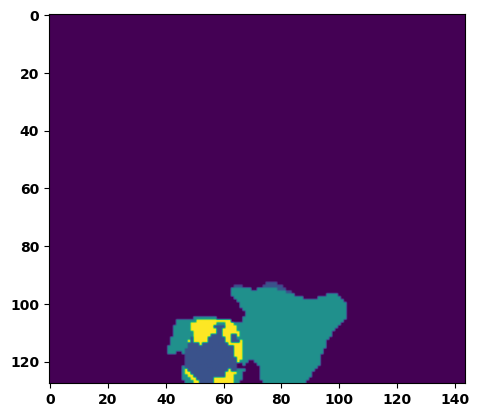

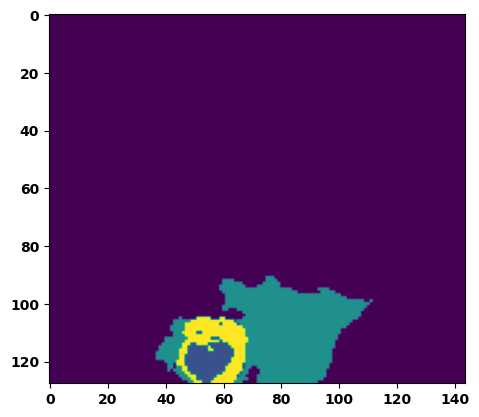

 33%|███▎      | 12/36 [00:16<00:34,  1.45s/it]

Batch_id:  11 Eval loss:  0.553497314453125
Batch_id:  11 Eval IoU:  tensor(0.4038, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.45s/it]

Batch_id:  12 Eval loss:  0.7303160429000854
Batch_id:  12 Eval IoU:  tensor(0.2459, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9074, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:32,  1.46s/it]

Batch_id:  13 Eval loss:  0.7295743227005005
Batch_id:  13 Eval IoU:  tensor(0.1762, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.5380, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3830, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.3107, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:31,  1.49s/it]

Batch_id:  14 Eval loss:  0.7562429308891296
Batch_id:  14 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.44s/it]

Batch_id:  15 Eval loss:  0.14598123729228973
Batch_id:  15 Eval IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9967, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.46s/it]

Batch_id:  16 Eval loss:  0.3666197657585144
Batch_id:  16 Eval IoU:  tensor(0.5271, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.44s/it]

Batch_id:  17 Eval loss:  0.7297540307044983
Batch_id:  17 Eval IoU:  tensor(0.1801, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4889, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3170, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8925, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.3003, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:23,  1.36s/it]

Batch_id:  18 Eval loss:  0.596561074256897
Batch_id:  18 Eval IoU:  tensor(0.3553, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:23,  1.49s/it]

Batch_id:  19 Eval loss:  0.5590916872024536
Batch_id:  19 Eval IoU:  tensor(0.4011, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  20 Eval loss:  0.7565903067588806
Batch_id:  20 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


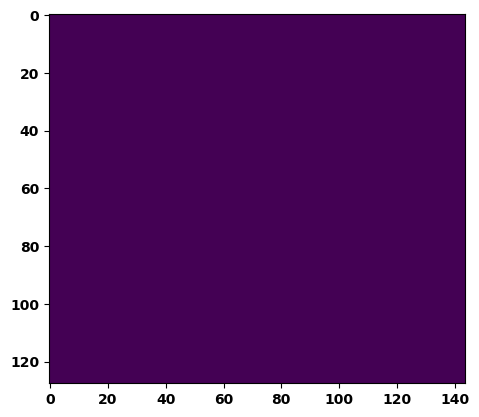

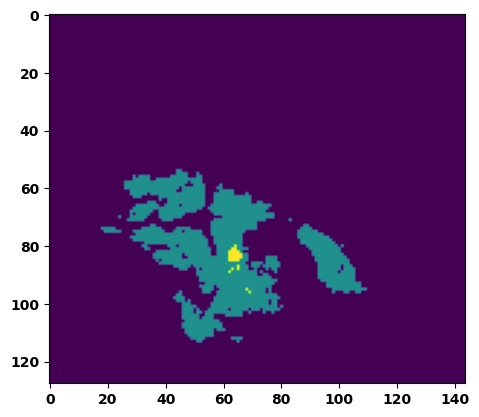

 61%|██████    | 22/36 [00:31<00:20,  1.46s/it]

Batch_id:  21 Eval loss:  0.6816630363464355
Batch_id:  21 Eval IoU:  tensor(0.2759, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.44s/it]

Batch_id:  22 Eval loss:  0.7782953977584839
Batch_id:  22 Eval IoU:  tensor(0.1450, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.4994, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.2521, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.2504, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:18,  1.52s/it]

Batch_id:  23 Eval loss:  0.7681688666343689
Batch_id:  23 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.06832574307918549
Batch_id:  24 Eval IoU:  tensor(0.8782, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:15,  1.50s/it]

Batch_id:  25 Eval loss:  0.6854522228240967
Batch_id:  25 Eval IoU:  tensor(0.2648, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9275, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8946, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9650, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:13,  1.47s/it]

Batch_id:  26 Eval loss:  0.29375994205474854
Batch_id:  26 Eval IoU:  tensor(0.5973, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9671, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:12,  1.53s/it]

Batch_id:  27 Eval loss:  0.2746720314025879
Batch_id:  27 Eval IoU:  tensor(0.6028, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:10,  1.51s/it]

Batch_id:  28 Eval loss:  0.884179949760437
Batch_id:  28 Eval IoU:  tensor(0.0739, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4938, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4149, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.2408, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.6898615956306458
Batch_id:  29 Eval IoU:  tensor(0.2134, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5753, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.4390, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9253, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3791, device='cuda:0')
Batch_id:  30 Eval loss:  0.9038642048835754
Batch_id:  30 Eval IoU:  tensor(0.0563, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4581, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3309, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9018, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.1903, device='cuda:0')


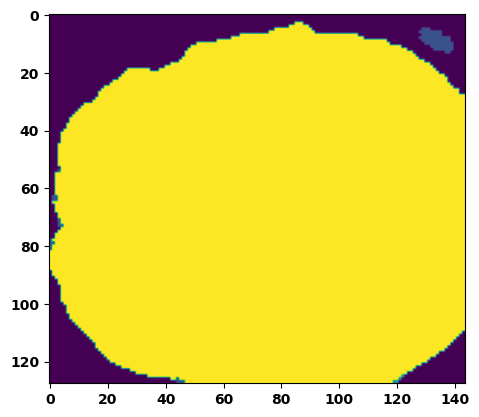

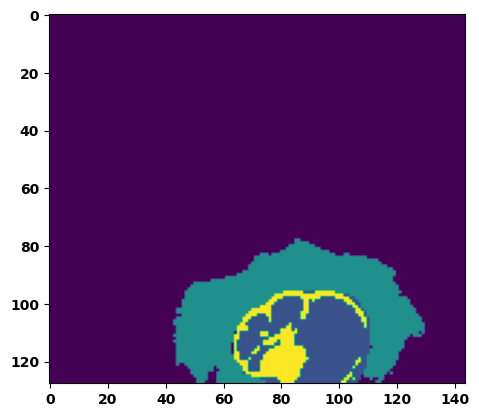

 89%|████████▉ | 32/36 [00:46<00:05,  1.50s/it]

Batch_id:  31 Eval loss:  0.45786356925964355
Batch_id:  31 Eval IoU:  tensor(0.4419, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7713, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6634, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.6584, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9936, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.50s/it]

Batch_id:  32 Eval loss:  0.5074448585510254
Batch_id:  32 Eval IoU:  tensor(0.4111, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9782, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.42s/it]

Batch_id:  33 Eval loss:  0.15790338814258575
Batch_id:  33 Eval IoU:  tensor(0.7735, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9983, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.6377840638160706
Batch_id:  34 Eval IoU:  tensor(0.3067, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.45s/it]

Batch_id:  35 Eval loss:  0.5936670303344727
Batch_id:  35 Eval IoU:  tensor(0.3616, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Epoch  23 Training loss:  0.14227299785072153
Epoch  23 Evaluation loss:  0.5664308166338338
Epoch  23 Training accuracy :  tensor(0.7916)
Epoch  23 Evaluation accuracy :  tensor(0.3711)
Epoch  23 Training Mean Dice Score:  tensor(0.9834)
Epoch  23 Eval Mean Dice Score:  tensor(0.8641)
Epoch  23 Training Non-tumor Dice Score:  tensor(0.9846)
Epoch  23 Eval Non-tumor Dice Score:  tensor(0.8262)
Epoch  23 Training NCR/NET Dice Score:  tensor(0.9926)
Epoch  23 Eval NCR/NET Dice Score:  tensor(0.9758)
Epoch  23 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 24
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.51s/it]

Batch_id:  0 Training loss:  0.06528796255588531
Batch_id:  0 Training IoU:  tensor(0.8893, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:34,  1.43s/it]

Batch_id:  1 Training loss:  0.276944100856781
Batch_id:  1 Training IoU:  tensor(0.6529, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:30,  1.41s/it]

Batch_id:  2 Training loss:  0.17074064910411835
Batch_id:  2 Training IoU:  tensor(0.7281, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:31,  1.43s/it]

Batch_id:  3 Training loss:  0.1529812514781952
Batch_id:  3 Training IoU:  tensor(0.7577, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9729, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:36,  1.49s/it]

Batch_id:  4 Training loss:  0.05489043891429901
Batch_id:  4 Training IoU:  tensor(0.9089, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:33,  1.48s/it]

Batch_id:  5 Training loss:  0.20710080862045288
Batch_id:  5 Training IoU:  tensor(0.6836, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:31,  1.47s/it]

Batch_id:  6 Training loss:  0.09040762484073639
Batch_id:  6 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:26,  1.44s/it]

Batch_id:  7 Training loss:  0.08169832825660706
Batch_id:  7 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:33,  1.52s/it]

Batch_id:  8 Training loss:  0.15194092690944672
Batch_id:  8 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9810, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:26,  1.46s/it]

Batch_id:  9 Training loss:  0.32037946581840515
Batch_id:  9 Training IoU:  tensor(0.5719, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 10%|█         | 11/110 [00:16<02:28,  1.50s/it]

Batch_id:  10 Training loss:  0.11386458575725555
Batch_id:  10 Training IoU:  tensor(0.8128, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 11%|█         | 12/110 [00:17<02:24,  1.48s/it]

Batch_id:  11 Training loss:  0.10446108877658844
Batch_id:  11 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:21,  1.46s/it]

Batch_id:  12 Training loss:  0.10445833206176758
Batch_id:  12 Training IoU:  tensor(0.8309, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:17,  1.44s/it]

Batch_id:  13 Training loss:  0.13197821378707886
Batch_id:  13 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:18,  1.46s/it]

Batch_id:  14 Training loss:  0.11731180548667908
Batch_id:  14 Training IoU:  tensor(0.8176, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:17,  1.46s/it]

Batch_id:  15 Training loss:  0.09261786937713623
Batch_id:  15 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:15,  1.46s/it]

Batch_id:  16 Training loss:  0.22751976549625397
Batch_id:  16 Training IoU:  tensor(0.7275, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:13,  1.46s/it]

Batch_id:  17 Training loss:  0.2847851812839508
Batch_id:  17 Training IoU:  tensor(0.6377, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:21,  1.55s/it]

Batch_id:  18 Training loss:  0.11956058442592621
Batch_id:  18 Training IoU:  tensor(0.8058, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:14,  1.49s/it]

Batch_id:  19 Training loss:  0.1787489801645279
Batch_id:  19 Training IoU:  tensor(0.7219, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9422, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:10,  1.46s/it]

Batch_id:  20 Training loss:  0.1799876093864441
Batch_id:  20 Training IoU:  tensor(0.7316, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 20%|██        | 22/110 [00:32<02:06,  1.43s/it]

Batch_id:  21 Training loss:  0.15447647869586945
Batch_id:  21 Training IoU:  tensor(0.7700, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 21%|██        | 23/110 [00:33<02:06,  1.46s/it]

Batch_id:  22 Training loss:  0.029298394918441772
Batch_id:  22 Training IoU:  tensor(0.9517, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:02,  1.42s/it]

Batch_id:  23 Training loss:  0.1937493234872818
Batch_id:  23 Training IoU:  tensor(0.7102, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 23%|██▎       | 25/110 [00:36<01:58,  1.39s/it]

Batch_id:  24 Training loss:  0.07285350561141968
Batch_id:  24 Training IoU:  tensor(0.8786, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:58,  1.41s/it]

Batch_id:  25 Training loss:  0.13344494998455048
Batch_id:  25 Training IoU:  tensor(0.7802, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:57,  1.42s/it]

Batch_id:  26 Training loss:  0.14685243368148804
Batch_id:  26 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:57,  1.43s/it]

Batch_id:  27 Training loss:  0.1426631063222885
Batch_id:  27 Training IoU:  tensor(0.7664, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:55,  1.43s/it]

Batch_id:  28 Training loss:  0.06963197886943817
Batch_id:  28 Training IoU:  tensor(0.8771, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:56,  1.46s/it]

Batch_id:  29 Training loss:  0.24118977785110474
Batch_id:  29 Training IoU:  tensor(0.7116, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:55,  1.46s/it]

Batch_id:  30 Training loss:  0.06231725215911865
Batch_id:  30 Training IoU:  tensor(0.8937, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:54,  1.47s/it]

Batch_id:  31 Training loss:  0.24309825897216797
Batch_id:  31 Training IoU:  tensor(0.6779, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 30%|███       | 33/110 [00:48<01:53,  1.48s/it]

Batch_id:  32 Training loss:  0.09351329505443573
Batch_id:  32 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 31%|███       | 34/110 [00:49<01:53,  1.50s/it]

Batch_id:  33 Training loss:  0.3191669285297394
Batch_id:  33 Training IoU:  tensor(0.5964, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.10089579224586487
Batch_id:  34 Training IoU:  tensor(0.8286, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:51,  1.50s/it]

Batch_id:  35 Training loss:  0.151674285531044
Batch_id:  35 Training IoU:  tensor(0.7567, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:46,  1.46s/it]

Batch_id:  36 Training loss:  0.09669893980026245
Batch_id:  36 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:43,  1.43s/it]

Batch_id:  37 Training loss:  0.15624059736728668
Batch_id:  37 Training IoU:  tensor(0.7559, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:44,  1.47s/it]

Batch_id:  38 Training loss:  0.1086266040802002
Batch_id:  38 Training IoU:  tensor(0.8211, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:41,  1.44s/it]

Batch_id:  39 Training loss:  0.13682125508785248
Batch_id:  39 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:36,  1.40s/it]

Batch_id:  40 Training loss:  0.09460781514644623
Batch_id:  40 Training IoU:  tensor(0.8380, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:35,  1.41s/it]

Batch_id:  41 Training loss:  0.1343967169523239
Batch_id:  41 Training IoU:  tensor(0.7810, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:37,  1.46s/it]

Batch_id:  42 Training loss:  0.07127659022808075
Batch_id:  42 Training IoU:  tensor(0.8786, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 40%|████      | 44/110 [01:04<01:35,  1.45s/it]

Batch_id:  43 Training loss:  0.2514728307723999
Batch_id:  43 Training IoU:  tensor(0.7071, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 41%|████      | 45/110 [01:05<01:35,  1.48s/it]

Batch_id:  44 Training loss:  0.0755535215139389
Batch_id:  44 Training IoU:  tensor(0.8757, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:32,  1.45s/it]

Batch_id:  45 Training loss:  0.21130746603012085
Batch_id:  45 Training IoU:  tensor(0.7597, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:30,  1.44s/it]

Batch_id:  46 Training loss:  0.05849871039390564
Batch_id:  46 Training IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:31,  1.48s/it]

Batch_id:  47 Training loss:  0.1116301566362381
Batch_id:  47 Training IoU:  tensor(0.8266, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:31,  1.50s/it]

Batch_id:  48 Training loss:  0.16200730204582214
Batch_id:  48 Training IoU:  tensor(0.7873, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:31,  1.52s/it]

Batch_id:  49 Training loss:  0.19410847127437592
Batch_id:  49 Training IoU:  tensor(0.7455, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:29,  1.51s/it]

Batch_id:  50 Training loss:  0.064782053232193
Batch_id:  50 Training IoU:  tensor(0.8888, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:28,  1.53s/it]

Batch_id:  51 Training loss:  0.19661682844161987
Batch_id:  51 Training IoU:  tensor(0.7586, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:21,  1.43s/it]

Batch_id:  52 Training loss:  0.13516652584075928
Batch_id:  52 Training IoU:  tensor(0.7805, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:20,  1.44s/it]

Batch_id:  53 Training loss:  0.23289340734481812
Batch_id:  53 Training IoU:  tensor(0.6792, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:20,  1.47s/it]

Batch_id:  54 Training loss:  0.08979244530200958
Batch_id:  54 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:21,  1.50s/it]

Batch_id:  55 Training loss:  0.22816278040409088
Batch_id:  55 Training IoU:  tensor(0.6809, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:18,  1.48s/it]

Batch_id:  56 Training loss:  0.13407199084758759
Batch_id:  56 Training IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:18,  1.51s/it]

Batch_id:  57 Training loss:  0.06368520855903625
Batch_id:  57 Training IoU:  tensor(0.8933, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:19,  1.55s/it]

Batch_id:  58 Training loss:  0.10297219455242157
Batch_id:  58 Training IoU:  tensor(0.8240, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:20,  1.61s/it]

Batch_id:  59 Training loss:  0.3801538944244385
Batch_id:  59 Training IoU:  tensor(0.5321, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9748, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:18,  1.61s/it]

Batch_id:  60 Training loss:  0.1953093260526657
Batch_id:  60 Training IoU:  tensor(0.7283, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:16,  1.60s/it]

Batch_id:  61 Training loss:  0.1031193882226944
Batch_id:  61 Training IoU:  tensor(0.8498, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:13,  1.56s/it]

Batch_id:  62 Training loss:  0.12349443137645721
Batch_id:  62 Training IoU:  tensor(0.8510, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:12,  1.57s/it]

Batch_id:  63 Training loss:  0.0758381187915802
Batch_id:  63 Training IoU:  tensor(0.8702, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:10,  1.58s/it]

Batch_id:  64 Training loss:  0.2247145175933838
Batch_id:  64 Training IoU:  tensor(0.6737, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9627, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:07,  1.54s/it]

Batch_id:  65 Training loss:  0.05976411700248718
Batch_id:  65 Training IoU:  tensor(0.8954, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:06,  1.55s/it]

Batch_id:  66 Training loss:  0.11664533615112305
Batch_id:  66 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:05,  1.56s/it]

Batch_id:  67 Training loss:  0.09801337122917175
Batch_id:  67 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<01:02,  1.52s/it]

Batch_id:  68 Training loss:  0.11693120002746582
Batch_id:  68 Training IoU:  tensor(0.8121, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<01:01,  1.53s/it]

Batch_id:  69 Training loss:  0.11568251252174377
Batch_id:  69 Training IoU:  tensor(0.8203, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<01:00,  1.55s/it]

Batch_id:  70 Training loss:  0.15193940699100494
Batch_id:  70 Training IoU:  tensor(0.7678, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:58,  1.54s/it]

Batch_id:  71 Training loss:  0.1401377171278
Batch_id:  71 Training IoU:  tensor(0.7973, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:55,  1.49s/it]

Batch_id:  72 Training loss:  0.05897274613380432
Batch_id:  72 Training IoU:  tensor(0.8994, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.10611580312252045
Batch_id:  73 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9866, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:51,  1.46s/it]

Batch_id:  74 Training loss:  0.12774060666561127
Batch_id:  74 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:49,  1.47s/it]

Batch_id:  75 Training loss:  0.0917293131351471
Batch_id:  75 Training IoU:  tensor(0.8461, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.1692400574684143
Batch_id:  76 Training IoU:  tensor(0.8078, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:49,  1.55s/it]

Batch_id:  77 Training loss:  0.3467269837856293
Batch_id:  77 Training IoU:  tensor(0.5694, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:47,  1.52s/it]

Batch_id:  78 Training loss:  0.2548636496067047
Batch_id:  78 Training IoU:  tensor(0.6865, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:45,  1.52s/it]

Batch_id:  79 Training loss:  0.1440267413854599
Batch_id:  79 Training IoU:  tensor(0.7777, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9719, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:44,  1.54s/it]

Batch_id:  80 Training loss:  0.08677373826503754
Batch_id:  80 Training IoU:  tensor(0.8527, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:44,  1.57s/it]

Batch_id:  81 Training loss:  0.07967641949653625
Batch_id:  81 Training IoU:  tensor(0.9033, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:42,  1.57s/it]

Batch_id:  82 Training loss:  0.25198352336883545
Batch_id:  82 Training IoU:  tensor(0.6941, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 76%|███████▋  | 84/110 [02:05<00:39,  1.54s/it]

Batch_id:  83 Training loss:  0.07884591817855835
Batch_id:  83 Training IoU:  tensor(0.8657, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:37,  1.49s/it]

Batch_id:  84 Training loss:  0.24427999556064606
Batch_id:  84 Training IoU:  tensor(0.6528, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:35,  1.47s/it]

Batch_id:  85 Training loss:  0.15906637907028198
Batch_id:  85 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:33,  1.46s/it]

Batch_id:  86 Training loss:  0.09923715889453888
Batch_id:  86 Training IoU:  tensor(0.8297, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:31,  1.42s/it]

Batch_id:  87 Training loss:  0.1784900426864624
Batch_id:  87 Training IoU:  tensor(0.7289, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:31,  1.49s/it]

Batch_id:  88 Training loss:  0.05015632510185242
Batch_id:  88 Training IoU:  tensor(0.9159, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.07204915583133698
Batch_id:  89 Training IoU:  tensor(0.8780, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.1537179797887802
Batch_id:  90 Training IoU:  tensor(0.7642, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.10772208869457245
Batch_id:  91 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:24,  1.46s/it]

Batch_id:  92 Training loss:  0.14039522409439087
Batch_id:  92 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:22,  1.43s/it]

Batch_id:  93 Training loss:  0.21796481311321259
Batch_id:  93 Training IoU:  tensor(0.6707, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:21,  1.42s/it]

Batch_id:  94 Training loss:  0.0890282690525055
Batch_id:  94 Training IoU:  tensor(0.8501, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:19,  1.42s/it]

Batch_id:  95 Training loss:  0.11005084216594696
Batch_id:  95 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.43s/it]

Batch_id:  96 Training loss:  0.06039196252822876
Batch_id:  96 Training IoU:  tensor(0.8962, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:16,  1.39s/it]

Batch_id:  97 Training loss:  0.12334243953227997
Batch_id:  97 Training IoU:  tensor(0.8013, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.40s/it]

Batch_id:  98 Training loss:  0.23985522985458374
Batch_id:  98 Training IoU:  tensor(0.6785, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:14,  1.41s/it]

Batch_id:  99 Training loss:  0.2308378666639328
Batch_id:  99 Training IoU:  tensor(0.7088, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:12,  1.40s/it]

Batch_id:  100 Training loss:  0.10244150459766388
Batch_id:  100 Training IoU:  tensor(0.8289, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.43s/it]

Batch_id:  101 Training loss:  0.32455217838287354
Batch_id:  101 Training IoU:  tensor(0.6222, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.43s/it]

Batch_id:  102 Training loss:  0.12664681673049927
Batch_id:  102 Training IoU:  tensor(0.8082, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.46s/it]

Batch_id:  103 Training loss:  0.13613790273666382
Batch_id:  103 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.46s/it]

Batch_id:  104 Training loss:  0.15352334082126617
Batch_id:  104 Training IoU:  tensor(0.7535, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.43s/it]

Batch_id:  105 Training loss:  0.11818571388721466
Batch_id:  105 Training IoU:  tensor(0.7990, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9874, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.41s/it]

Batch_id:  106 Training loss:  0.10600075125694275
Batch_id:  106 Training IoU:  tensor(0.8216, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.38s/it]

Batch_id:  107 Training loss:  0.17556573450565338
Batch_id:  107 Training IoU:  tensor(0.7278, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.36s/it]

Batch_id:  108 Training loss:  0.07972973585128784
Batch_id:  108 Training IoU:  tensor(0.8680, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.12441310286521912
Batch_id:  109 Training IoU:  tensor(0.7953, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9943, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.1355283111333847
Batch_id:  0 Eval IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


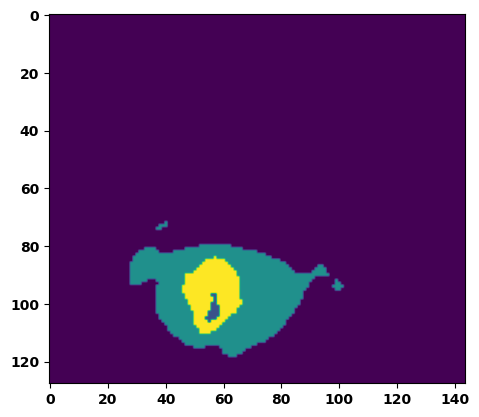

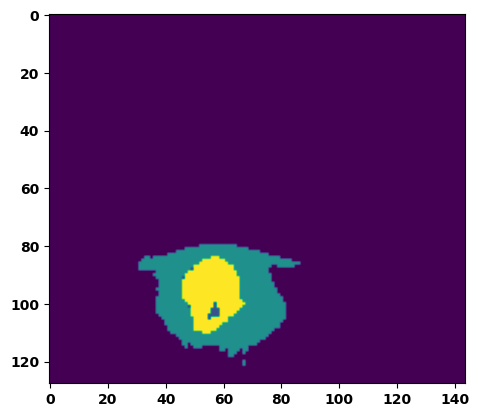

  6%|▌         | 2/36 [00:02<00:47,  1.40s/it]

Batch_id:  1 Eval loss:  0.5519207715988159
Batch_id:  1 Eval IoU:  tensor(0.4068, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.40s/it]

Batch_id:  2 Eval loss:  0.8001595139503479
Batch_id:  2 Eval IoU:  tensor(0.1210, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.4681, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3046, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9454, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.2082, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.43s/it]

Batch_id:  3 Eval loss:  0.3120412230491638
Batch_id:  3 Eval IoU:  tensor(0.6433, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.41s/it]

Batch_id:  4 Eval loss:  0.5972188711166382
Batch_id:  4 Eval IoU:  tensor(0.3555, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.39s/it]

Batch_id:  5 Eval loss:  0.7749045491218567
Batch_id:  5 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:38,  1.34s/it]

Batch_id:  6 Eval loss:  0.5479559898376465
Batch_id:  6 Eval IoU:  tensor(0.4128, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9286, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.38s/it]

Batch_id:  7 Eval loss:  0.7516770958900452
Batch_id:  7 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:36,  1.34s/it]

Batch_id:  8 Eval loss:  0.7584705948829651
Batch_id:  8 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:34,  1.35s/it]

Batch_id:  9 Eval loss:  0.7636669278144836
Batch_id:  9 Eval IoU:  tensor(0.1603, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.6559, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.5511, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.5025, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  10 Eval loss:  0.884312629699707
Batch_id:  10 Eval IoU:  tensor(0.0741, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.4942, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4156, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.2415, device='cuda:0')


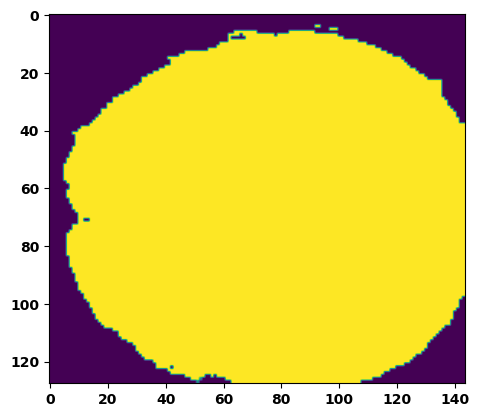

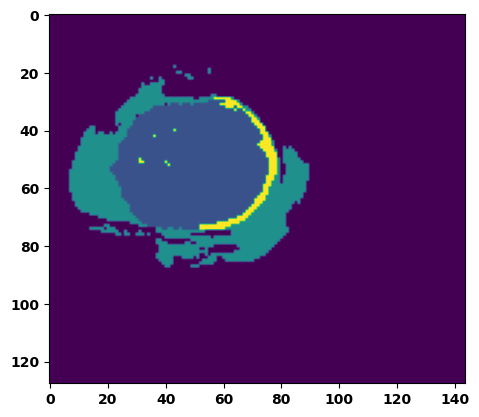

 33%|███▎      | 12/36 [00:16<00:33,  1.40s/it]

Batch_id:  11 Eval loss:  0.23075704276561737
Batch_id:  11 Eval IoU:  tensor(0.6530, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')


 36%|███▌      | 13/36 [00:17<00:31,  1.38s/it]

Batch_id:  12 Eval loss:  0.892737627029419
Batch_id:  12 Eval IoU:  tensor(0.0626, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.4708, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.2120, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9235, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.4147, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.8623, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:31,  1.43s/it]

Batch_id:  13 Eval loss:  0.8566379547119141
Batch_id:  13 Eval IoU:  tensor(0.0920, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.5325, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4389, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8610, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.3471, device='cuda:0')


 42%|████▏     | 15/36 [00:20<00:29,  1.42s/it]

Batch_id:  14 Eval loss:  0.4308652877807617
Batch_id:  14 Eval IoU:  tensor(0.4463, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8672, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8134, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.8523, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.43s/it]

Batch_id:  15 Eval loss:  0.1413496881723404
Batch_id:  15 Eval IoU:  tensor(0.7857, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:27,  1.43s/it]

Batch_id:  16 Eval loss:  0.627956748008728
Batch_id:  16 Eval IoU:  tensor(0.3223, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.39s/it]

Batch_id:  17 Eval loss:  0.9034947156906128
Batch_id:  17 Eval IoU:  tensor(0.0567, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4594, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3329, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9016, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.1895, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:23,  1.40s/it]

Batch_id:  18 Eval loss:  0.47920846939086914
Batch_id:  18 Eval IoU:  tensor(0.4543, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9381, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.43s/it]

Batch_id:  19 Eval loss:  0.11456769704818726
Batch_id:  19 Eval IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  20 Eval loss:  0.712081253528595
Batch_id:  20 Eval IoU:  tensor(0.2252, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8236, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.7495, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.7627, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9869, device='cuda:0')


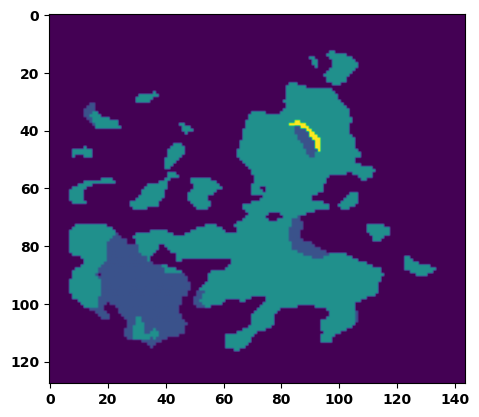

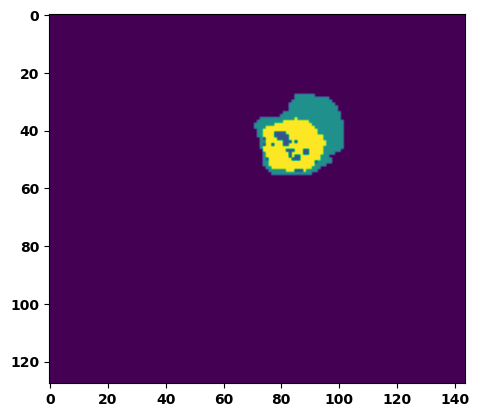

 61%|██████    | 22/36 [00:31<00:21,  1.52s/it]

Batch_id:  21 Eval loss:  0.45993858575820923
Batch_id:  21 Eval IoU:  tensor(0.4431, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.7607, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.6441, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.6574, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:19,  1.48s/it]

Batch_id:  22 Eval loss:  0.1095777153968811
Batch_id:  22 Eval IoU:  tensor(0.8286, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9977, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.47s/it]

Batch_id:  23 Eval loss:  0.23275268077850342
Batch_id:  23 Eval IoU:  tensor(0.6521, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:16,  1.53s/it]

Batch_id:  24 Eval loss:  0.8578422665596008
Batch_id:  24 Eval IoU:  tensor(0.0880, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.5257, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3843, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2894, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:15,  1.52s/it]

Batch_id:  25 Eval loss:  0.7061050534248352
Batch_id:  25 Eval IoU:  tensor(0.1948, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.6298, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.5344, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9156, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8023, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.6372, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.34688830375671387
Batch_id:  26 Eval IoU:  tensor(0.5404, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.46s/it]

Batch_id:  27 Eval loss:  0.37875866889953613
Batch_id:  27 Eval IoU:  tensor(0.5069, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9366, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.39s/it]

Batch_id:  28 Eval loss:  0.6686736345291138
Batch_id:  28 Eval IoU:  tensor(0.2762, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.41s/it]

Batch_id:  29 Eval loss:  0.6108489632606506
Batch_id:  29 Eval IoU:  tensor(0.2679, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.6953, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.5811, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9032, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.6382, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  30 Eval loss:  0.7681714296340942
Batch_id:  30 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


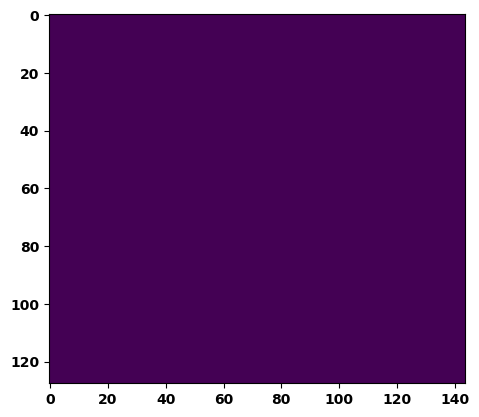

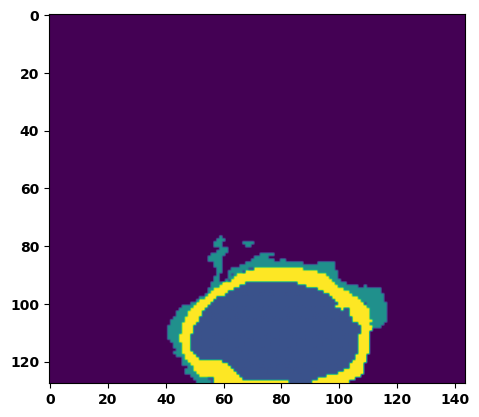

 89%|████████▉ | 32/36 [00:45<00:05,  1.47s/it]

Batch_id:  31 Eval loss:  0.7561538815498352
Batch_id:  31 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.47s/it]

Batch_id:  32 Eval loss:  0.645829975605011
Batch_id:  32 Eval IoU:  tensor(0.2987, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9333, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9182, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9765, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.45s/it]

Batch_id:  33 Eval loss:  0.4150933027267456
Batch_id:  33 Eval IoU:  tensor(0.4836, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9235, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9324, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9473, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.2621467113494873
Batch_id:  34 Eval IoU:  tensor(0.6268, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.05637137591838837
Batch_id:  35 Eval IoU:  tensor(0.9001, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9912, device='cuda:0')
Epoch 00025: reducing learning rate of group 0 to 6.2500e-05.
Epoch  24 Training loss:  0.14469184672290628
Epoch  24 Evaluation loss:  0.5428518197602696
Epoch  24 Training accuracy :  tensor(0.7880)
Epoch  24 Evaluation accuracy :  tensor(0.3921)
Epoch  24 Training Mean Dice Score:  tensor(0.9834)
Epoch  24 Eval Mean Dice Score:  tensor(0.8456)
Epoch  24 Training Non-tumor Dice Score:  tensor(0.9846)
Epoch  24 Eval Non-tumor Dice Score:  tensor(0.8020)
Epoch  24 Training NCR/NET Dice Score:  tensor(0.9924)
Epoch  24 Eval NCR/NET Dice Score:

Epoch: 25
Training in session: 


  1%|          | 1/110 [00:01<03:02,  1.67s/it]

Batch_id:  0 Training loss:  0.125518798828125
Batch_id:  0 Training IoU:  tensor(0.8195, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:48,  1.56s/it]

Batch_id:  1 Training loss:  0.10227455198764801
Batch_id:  1 Training IoU:  tensor(0.8314, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:41,  1.51s/it]

Batch_id:  2 Training loss:  0.15128253400325775
Batch_id:  2 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:29,  1.41s/it]

Batch_id:  3 Training loss:  0.11423039436340332
Batch_id:  3 Training IoU:  tensor(0.8059, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:39,  1.52s/it]

Batch_id:  4 Training loss:  0.13721761107444763
Batch_id:  4 Training IoU:  tensor(0.7753, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:32,  1.47s/it]

Batch_id:  5 Training loss:  0.22770516574382782
Batch_id:  5 Training IoU:  tensor(0.6923, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:28,  1.45s/it]

Batch_id:  6 Training loss:  0.10837146639823914
Batch_id:  6 Training IoU:  tensor(0.8230, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:30,  1.48s/it]

Batch_id:  7 Training loss:  0.177048921585083
Batch_id:  7 Training IoU:  tensor(0.7337, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:26,  1.45s/it]

Batch_id:  8 Training loss:  0.15319259464740753
Batch_id:  8 Training IoU:  tensor(0.7520, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:32,  1.53s/it]

Batch_id:  9 Training loss:  0.13943801820278168
Batch_id:  9 Training IoU:  tensor(0.7851, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 10%|█         | 11/110 [00:16<02:27,  1.49s/it]

Batch_id:  10 Training loss:  0.1424138993024826
Batch_id:  10 Training IoU:  tensor(0.7830, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 11%|█         | 12/110 [00:17<02:25,  1.48s/it]

Batch_id:  11 Training loss:  0.3215380012989044
Batch_id:  11 Training IoU:  tensor(0.6271, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:21,  1.46s/it]

Batch_id:  12 Training loss:  0.2212527096271515
Batch_id:  12 Training IoU:  tensor(0.6791, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:19,  1.46s/it]

Batch_id:  13 Training loss:  0.2677021026611328
Batch_id:  13 Training IoU:  tensor(0.6838, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:21,  1.49s/it]

Batch_id:  14 Training loss:  0.13373017311096191
Batch_id:  14 Training IoU:  tensor(0.8000, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:15,  1.44s/it]

Batch_id:  15 Training loss:  0.0877496749162674
Batch_id:  15 Training IoU:  tensor(0.8495, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:18,  1.48s/it]

Batch_id:  16 Training loss:  0.15086127817630768
Batch_id:  16 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:17,  1.50s/it]

Batch_id:  17 Training loss:  0.2265627682209015
Batch_id:  17 Training IoU:  tensor(0.6944, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:14,  1.47s/it]

Batch_id:  18 Training loss:  0.17975491285324097
Batch_id:  18 Training IoU:  tensor(0.7452, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:15,  1.50s/it]

Batch_id:  19 Training loss:  0.07883667945861816
Batch_id:  19 Training IoU:  tensor(0.8674, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:13,  1.50s/it]

Batch_id:  20 Training loss:  0.10571981966495514
Batch_id:  20 Training IoU:  tensor(0.8331, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 20%|██        | 22/110 [00:32<02:13,  1.52s/it]

Batch_id:  21 Training loss:  0.10249488055706024
Batch_id:  21 Training IoU:  tensor(0.8247, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 21%|██        | 23/110 [00:34<02:09,  1.48s/it]

Batch_id:  22 Training loss:  0.3807186186313629
Batch_id:  22 Training IoU:  tensor(0.5328, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9678, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:05,  1.46s/it]

Batch_id:  23 Training loss:  0.23836997151374817
Batch_id:  23 Training IoU:  tensor(0.6994, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9843, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:01,  1.43s/it]

Batch_id:  24 Training loss:  0.05389672517776489
Batch_id:  24 Training IoU:  tensor(0.9078, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 24%|██▎       | 26/110 [00:38<01:57,  1.40s/it]

Batch_id:  25 Training loss:  0.15227067470550537
Batch_id:  25 Training IoU:  tensor(0.7564, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:54,  1.38s/it]

Batch_id:  26 Training loss:  0.1550070196390152
Batch_id:  26 Training IoU:  tensor(0.7943, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:55,  1.40s/it]

Batch_id:  27 Training loss:  0.08650754392147064
Batch_id:  27 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:53,  1.40s/it]

Batch_id:  28 Training loss:  0.15754859149456024
Batch_id:  28 Training IoU:  tensor(0.7543, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:50,  1.38s/it]

Batch_id:  29 Training loss:  0.06373374164104462
Batch_id:  29 Training IoU:  tensor(0.8900, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:46,  1.35s/it]

Batch_id:  30 Training loss:  0.07917448878288269
Batch_id:  30 Training IoU:  tensor(0.8670, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:46,  1.36s/it]

Batch_id:  31 Training loss:  0.07385662198066711
Batch_id:  31 Training IoU:  tensor(0.8740, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 30%|███       | 33/110 [00:47<01:47,  1.39s/it]

Batch_id:  32 Training loss:  0.11685211956501007
Batch_id:  32 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 31%|███       | 34/110 [00:49<01:49,  1.44s/it]

Batch_id:  33 Training loss:  0.07235772907733917
Batch_id:  33 Training IoU:  tensor(0.8909, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:46,  1.42s/it]

Batch_id:  34 Training loss:  0.12911412119865417
Batch_id:  34 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:45,  1.42s/it]

Batch_id:  35 Training loss:  0.0897480696439743
Batch_id:  35 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:42,  1.40s/it]

Batch_id:  36 Training loss:  0.11998268961906433
Batch_id:  36 Training IoU:  tensor(0.8106, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:39,  1.38s/it]

Batch_id:  37 Training loss:  0.062205761671066284
Batch_id:  37 Training IoU:  tensor(0.8935, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:39,  1.40s/it]

Batch_id:  38 Training loss:  0.19053010642528534
Batch_id:  38 Training IoU:  tensor(0.7685, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:39,  1.43s/it]

Batch_id:  39 Training loss:  0.10179018974304199
Batch_id:  39 Training IoU:  tensor(0.8330, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:44,  1.52s/it]

Batch_id:  40 Training loss:  0.2061058133840561
Batch_id:  40 Training IoU:  tensor(0.6854, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:43,  1.53s/it]

Batch_id:  41 Training loss:  0.07916499674320221
Batch_id:  41 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:40,  1.50s/it]

Batch_id:  42 Training loss:  0.08608378469944
Batch_id:  42 Training IoU:  tensor(0.8516, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 40%|████      | 44/110 [01:04<01:37,  1.48s/it]

Batch_id:  43 Training loss:  0.1438327431678772
Batch_id:  43 Training IoU:  tensor(0.7710, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 41%|████      | 45/110 [01:05<01:36,  1.49s/it]

Batch_id:  44 Training loss:  0.15583154559135437
Batch_id:  44 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:34,  1.47s/it]

Batch_id:  45 Training loss:  0.1524672657251358
Batch_id:  45 Training IoU:  tensor(0.7750, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:33,  1.48s/it]

Batch_id:  46 Training loss:  0.12122739851474762
Batch_id:  46 Training IoU:  tensor(0.8059, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:33,  1.51s/it]

Batch_id:  47 Training loss:  0.0654132217168808
Batch_id:  47 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:30,  1.49s/it]

Batch_id:  48 Training loss:  0.12048542499542236
Batch_id:  48 Training IoU:  tensor(0.8007, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:26,  1.44s/it]

Batch_id:  49 Training loss:  0.12365138530731201
Batch_id:  49 Training IoU:  tensor(0.7941, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:24,  1.43s/it]

Batch_id:  50 Training loss:  0.2501692771911621
Batch_id:  50 Training IoU:  tensor(0.6907, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:22,  1.43s/it]

Batch_id:  51 Training loss:  0.11219866573810577
Batch_id:  51 Training IoU:  tensor(0.8275, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:27,  1.53s/it]

Batch_id:  52 Training loss:  0.2315942645072937
Batch_id:  52 Training IoU:  tensor(0.7024, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:28,  1.58s/it]

Batch_id:  53 Training loss:  0.11445766687393188
Batch_id:  53 Training IoU:  tensor(0.8284, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:26,  1.57s/it]

Batch_id:  54 Training loss:  0.08962483704090118
Batch_id:  54 Training IoU:  tensor(0.8461, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:23,  1.55s/it]

Batch_id:  55 Training loss:  0.07339978218078613
Batch_id:  55 Training IoU:  tensor(0.8713, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:21,  1.53s/it]

Batch_id:  56 Training loss:  0.22810862958431244
Batch_id:  56 Training IoU:  tensor(0.6799, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:19,  1.52s/it]

Batch_id:  57 Training loss:  0.13073879480361938
Batch_id:  57 Training IoU:  tensor(0.7896, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:15,  1.49s/it]

Batch_id:  58 Training loss:  0.15833981335163116
Batch_id:  58 Training IoU:  tensor(0.7496, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:13,  1.46s/it]

Batch_id:  59 Training loss:  0.07103924453258514
Batch_id:  59 Training IoU:  tensor(0.8831, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:11,  1.46s/it]

Batch_id:  60 Training loss:  0.09608826041221619
Batch_id:  60 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:11,  1.48s/it]

Batch_id:  61 Training loss:  0.14934276044368744
Batch_id:  61 Training IoU:  tensor(0.7716, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:11,  1.52s/it]

Batch_id:  62 Training loss:  0.08915580809116364
Batch_id:  62 Training IoU:  tensor(0.9171, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:07,  1.48s/it]

Batch_id:  63 Training loss:  0.3208945393562317
Batch_id:  63 Training IoU:  tensor(0.5735, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:07,  1.50s/it]

Batch_id:  64 Training loss:  0.05585962533950806
Batch_id:  64 Training IoU:  tensor(0.9036, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:05,  1.48s/it]

Batch_id:  65 Training loss:  0.23705041408538818
Batch_id:  65 Training IoU:  tensor(0.6895, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:04,  1.50s/it]

Batch_id:  66 Training loss:  0.25979065895080566
Batch_id:  66 Training IoU:  tensor(0.6661, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:02,  1.49s/it]

Batch_id:  67 Training loss:  0.25342971086502075
Batch_id:  67 Training IoU:  tensor(0.6939, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:01,  1.49s/it]

Batch_id:  68 Training loss:  0.06077563762664795
Batch_id:  68 Training IoU:  tensor(0.8971, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:58,  1.47s/it]

Batch_id:  69 Training loss:  0.11826083064079285
Batch_id:  69 Training IoU:  tensor(0.7999, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:57,  1.47s/it]

Batch_id:  70 Training loss:  0.09731937944889069
Batch_id:  70 Training IoU:  tensor(0.8398, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:57,  1.51s/it]

Batch_id:  71 Training loss:  0.05635927617549896
Batch_id:  71 Training IoU:  tensor(0.9038, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:58,  1.58s/it]

Batch_id:  72 Training loss:  0.08676078915596008
Batch_id:  72 Training IoU:  tensor(0.8526, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:57,  1.59s/it]

Batch_id:  73 Training loss:  0.08239063620567322
Batch_id:  73 Training IoU:  tensor(0.8827, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:53,  1.53s/it]

Batch_id:  74 Training loss:  0.12706273794174194
Batch_id:  74 Training IoU:  tensor(0.8000, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:51,  1.53s/it]

Batch_id:  75 Training loss:  0.17279507219791412
Batch_id:  75 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:49,  1.51s/it]

Batch_id:  76 Training loss:  0.11372335255146027
Batch_id:  76 Training IoU:  tensor(0.8070, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:48,  1.50s/it]

Batch_id:  77 Training loss:  0.17300400137901306
Batch_id:  77 Training IoU:  tensor(0.7211, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:46,  1.51s/it]

Batch_id:  78 Training loss:  0.0889660120010376
Batch_id:  78 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:45,  1.50s/it]

Batch_id:  79 Training loss:  0.12996800243854523
Batch_id:  79 Training IoU:  tensor(0.8164, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:42,  1.48s/it]

Batch_id:  80 Training loss:  0.1639752835035324
Batch_id:  80 Training IoU:  tensor(0.7440, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:41,  1.50s/it]

Batch_id:  81 Training loss:  0.061732396483421326
Batch_id:  81 Training IoU:  tensor(0.8954, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:41,  1.53s/it]

Batch_id:  82 Training loss:  0.20470969378948212
Batch_id:  82 Training IoU:  tensor(0.6998, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:40,  1.56s/it]

Batch_id:  83 Training loss:  0.07109557092189789
Batch_id:  83 Training IoU:  tensor(0.8789, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:38,  1.53s/it]

Batch_id:  84 Training loss:  0.19008305668830872
Batch_id:  84 Training IoU:  tensor(0.7744, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:35,  1.49s/it]

Batch_id:  85 Training loss:  0.3423994779586792
Batch_id:  85 Training IoU:  tensor(0.5687, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:35,  1.53s/it]

Batch_id:  86 Training loss:  0.060060545802116394
Batch_id:  86 Training IoU:  tensor(0.8956, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:33,  1.51s/it]

Batch_id:  87 Training loss:  0.11448325216770172
Batch_id:  87 Training IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 81%|████████  | 89/110 [02:11<00:32,  1.56s/it]

Batch_id:  88 Training loss:  0.14845804870128632
Batch_id:  88 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:30,  1.52s/it]

Batch_id:  89 Training loss:  0.21303518116474152
Batch_id:  89 Training IoU:  tensor(0.6748, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9834, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:29,  1.55s/it]

Batch_id:  90 Training loss:  0.2500373125076294
Batch_id:  90 Training IoU:  tensor(0.6665, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:28,  1.56s/it]

Batch_id:  91 Training loss:  0.25569552183151245
Batch_id:  91 Training IoU:  tensor(0.6786, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:26,  1.58s/it]

Batch_id:  92 Training loss:  0.11477084457874298
Batch_id:  92 Training IoU:  tensor(0.8133, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:25,  1.58s/it]

Batch_id:  93 Training loss:  0.07734599709510803
Batch_id:  93 Training IoU:  tensor(0.8699, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:23,  1.57s/it]

Batch_id:  94 Training loss:  0.10149499773979187
Batch_id:  94 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:21,  1.55s/it]

Batch_id:  95 Training loss:  0.09665806591510773
Batch_id:  95 Training IoU:  tensor(0.8387, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 88%|████████▊ | 97/110 [02:24<00:20,  1.55s/it]

Batch_id:  96 Training loss:  0.07794296741485596
Batch_id:  96 Training IoU:  tensor(0.8687, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 89%|████████▉ | 98/110 [02:26<00:18,  1.58s/it]

Batch_id:  97 Training loss:  0.08658359944820404
Batch_id:  97 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 90%|█████████ | 99/110 [02:27<00:17,  1.59s/it]

Batch_id:  98 Training loss:  0.15206760168075562
Batch_id:  98 Training IoU:  tensor(0.7685, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 91%|█████████ | 100/110 [02:29<00:16,  1.61s/it]

Batch_id:  99 Training loss:  0.15032432973384857
Batch_id:  99 Training IoU:  tensor(0.7848, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 92%|█████████▏| 101/110 [02:30<00:13,  1.54s/it]

Batch_id:  100 Training loss:  0.06556329131126404
Batch_id:  100 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 93%|█████████▎| 102/110 [02:32<00:11,  1.47s/it]

Batch_id:  101 Training loss:  0.22827649116516113
Batch_id:  101 Training IoU:  tensor(0.6806, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 94%|█████████▎| 103/110 [02:33<00:10,  1.49s/it]

Batch_id:  102 Training loss:  0.0964810699224472
Batch_id:  102 Training IoU:  tensor(0.8453, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 95%|█████████▍| 104/110 [02:35<00:09,  1.51s/it]

Batch_id:  103 Training loss:  0.05213549733161926
Batch_id:  103 Training IoU:  tensor(0.9167, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 95%|█████████▌| 105/110 [02:36<00:07,  1.51s/it]

Batch_id:  104 Training loss:  0.11656695604324341
Batch_id:  104 Training IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 96%|█████████▋| 106/110 [02:37<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.04879629611968994
Batch_id:  105 Training IoU:  tensor(0.9189, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 97%|█████████▋| 107/110 [02:39<00:04,  1.46s/it]

Batch_id:  106 Training loss:  0.10673710703849792
Batch_id:  106 Training IoU:  tensor(0.8233, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 98%|█████████▊| 108/110 [02:41<00:03,  1.51s/it]

Batch_id:  107 Training loss:  0.22877120971679688
Batch_id:  107 Training IoU:  tensor(0.6695, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9626, device='cuda:0')


 99%|█████████▉| 109/110 [02:42<00:01,  1.51s/it]

Batch_id:  108 Training loss:  0.03281831741333008
Batch_id:  108 Training IoU:  tensor(0.9440, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


100%|██████████| 110/110 [02:43<00:00,  1.49s/it]


Batch_id:  109 Training loss:  0.20192420482635498
Batch_id:  109 Training IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9902, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6686099171638489
Batch_id:  0 Eval IoU:  tensor(0.2445, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7152, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.6229, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.6373, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9399, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9456, device='cuda:0')


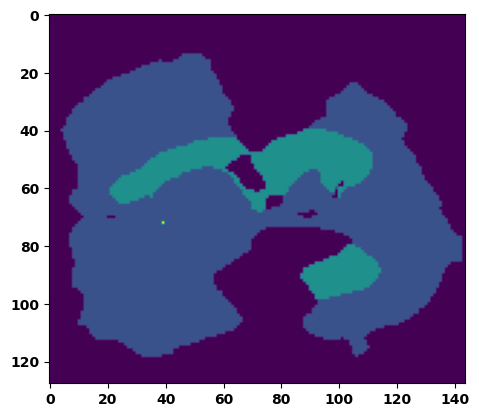

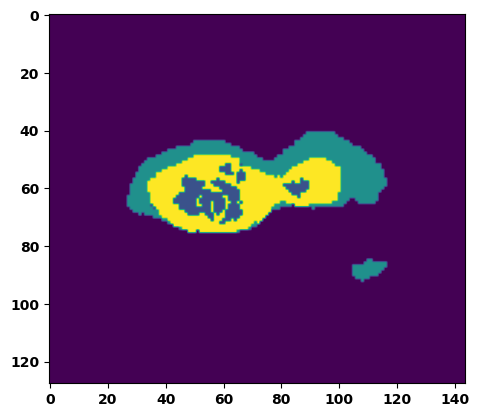

  6%|▌         | 2/36 [00:02<00:47,  1.39s/it]

Batch_id:  1 Eval loss:  0.39927399158477783
Batch_id:  1 Eval IoU:  tensor(0.4983, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9876, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.37s/it]

Batch_id:  2 Eval loss:  0.752858579158783
Batch_id:  2 Eval IoU:  tensor(0.1727, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6666, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5688, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.7987, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.6885, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 11%|█         | 4/36 [00:05<00:44,  1.40s/it]

Batch_id:  3 Eval loss:  0.1824541985988617
Batch_id:  3 Eval IoU:  tensor(0.7424, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9976, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:42,  1.37s/it]

Batch_id:  4 Eval loss:  0.2058631330728531
Batch_id:  4 Eval IoU:  tensor(0.7141, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.40s/it]

Batch_id:  5 Eval loss:  0.31645888090133667
Batch_id:  5 Eval IoU:  tensor(0.5815, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.7441136240959167
Batch_id:  6 Eval IoU:  tensor(0.1851, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.6890, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.5587, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.5366, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.42s/it]

Batch_id:  7 Eval loss:  0.08436067402362823
Batch_id:  7 Eval IoU:  tensor(0.8512, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9865, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.41s/it]

Batch_id:  8 Eval loss:  0.5525904893875122
Batch_id:  8 Eval IoU:  tensor(0.4061, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:35,  1.37s/it]

Batch_id:  9 Eval loss:  0.7748162746429443
Batch_id:  9 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  10 Eval loss:  0.7682314515113831
Batch_id:  10 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


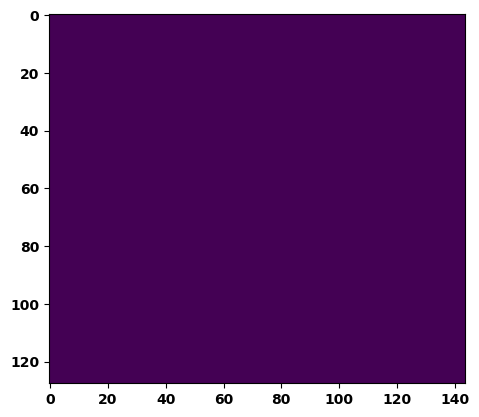

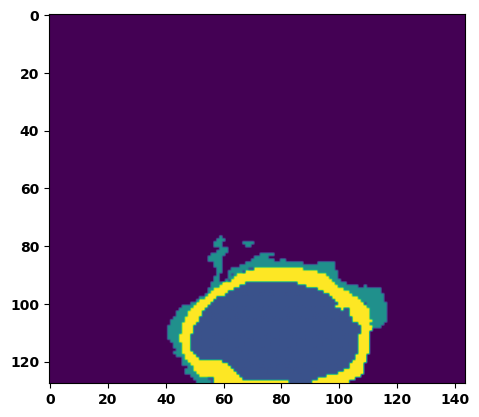

 33%|███▎      | 12/36 [00:16<00:34,  1.43s/it]

Batch_id:  11 Eval loss:  0.5040756464004517
Batch_id:  11 Eval IoU:  tensor(0.3965, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8552, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8736, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9159, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.7867, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.43s/it]

Batch_id:  12 Eval loss:  0.6992006301879883
Batch_id:  12 Eval IoU:  tensor(0.2117, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.5036, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.3176, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8093, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.4248, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:31,  1.45s/it]

Batch_id:  13 Eval loss:  0.6734693050384521
Batch_id:  13 Eval IoU:  tensor(0.2854, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.42s/it]

Batch_id:  14 Eval loss:  0.6599730253219604
Batch_id:  14 Eval IoU:  tensor(0.2867, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:27,  1.40s/it]

Batch_id:  15 Eval loss:  0.8343430757522583
Batch_id:  15 Eval IoU:  tensor(0.0965, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5033, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.2590, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.2554, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:26,  1.40s/it]

Batch_id:  16 Eval loss:  0.7523857355117798
Batch_id:  16 Eval IoU:  tensor(0.2339, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9343, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9021, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9748, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:24,  1.39s/it]

Batch_id:  17 Eval loss:  0.69221431016922
Batch_id:  17 Eval IoU:  tensor(0.2724, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:24,  1.44s/it]

Batch_id:  18 Eval loss:  0.7577999830245972
Batch_id:  18 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.43s/it]

Batch_id:  19 Eval loss:  0.882773220539093
Batch_id:  19 Eval IoU:  tensor(0.0751, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.4964, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4188, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.2448, device='cuda:0')
Batch_id:  20 Eval loss:  0.5453270673751831
Batch_id:  20 Eval IoU:  tensor(0.3961, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8860, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8612, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9084, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


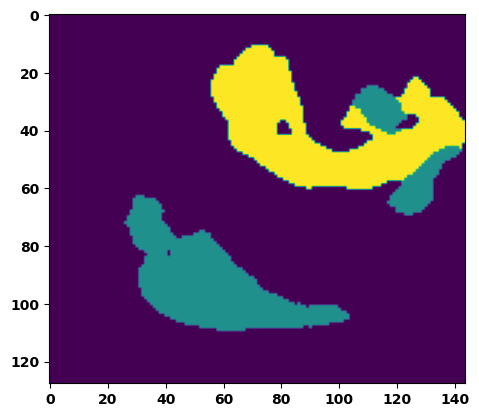

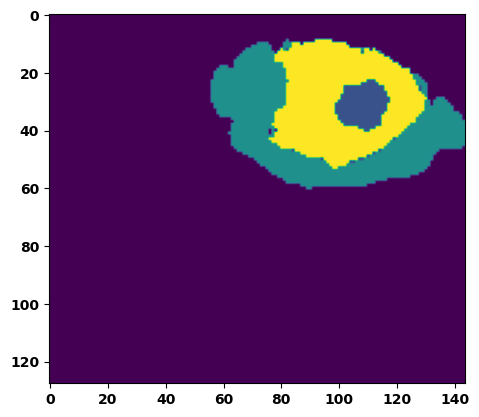

 61%|██████    | 22/36 [00:31<00:20,  1.49s/it]

Batch_id:  21 Eval loss:  0.6210035681724548
Batch_id:  21 Eval IoU:  tensor(0.3204, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9735, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:19,  1.47s/it]

Batch_id:  22 Eval loss:  0.5696948766708374
Batch_id:  22 Eval IoU:  tensor(0.3864, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.42s/it]

Batch_id:  23 Eval loss:  0.35462188720703125
Batch_id:  23 Eval IoU:  tensor(0.5242, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9474, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9946, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.43s/it]

Batch_id:  24 Eval loss:  0.7563431262969971
Batch_id:  24 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.50s/it]

Batch_id:  25 Eval loss:  0.4792824387550354
Batch_id:  25 Eval IoU:  tensor(0.4091, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7706, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.6680, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.6657, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:13,  1.45s/it]

Batch_id:  26 Eval loss:  0.7040156126022339
Batch_id:  26 Eval IoU:  tensor(0.2269, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.7391, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.6284, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.6327, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:11,  1.40s/it]

Batch_id:  27 Eval loss:  0.19278939068317413
Batch_id:  27 Eval IoU:  tensor(0.7051, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:10,  1.46s/it]

Batch_id:  28 Eval loss:  0.6212551593780518
Batch_id:  28 Eval IoU:  tensor(0.3212, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.44s/it]

Batch_id:  29 Eval loss:  0.7874203324317932
Batch_id:  29 Eval IoU:  tensor(0.1294, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5348, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3892, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3047, device='cuda:0')
Batch_id:  30 Eval loss:  0.6412039995193481
Batch_id:  30 Eval IoU:  tensor(0.2942, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8988, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9644, device='cuda:0')


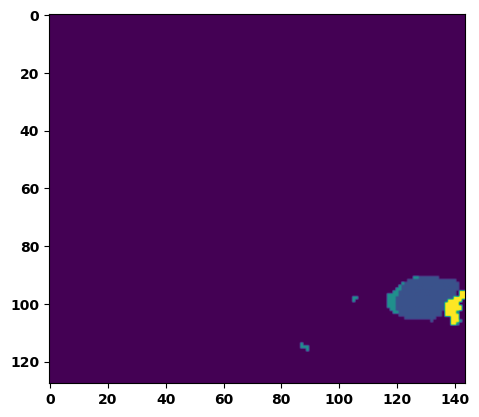

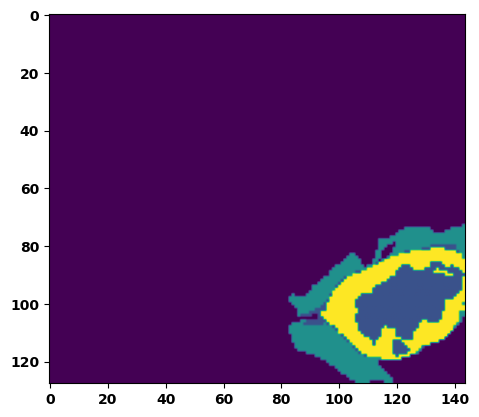

 89%|████████▉ | 32/36 [00:45<00:05,  1.43s/it]

Batch_id:  31 Eval loss:  0.6475985050201416
Batch_id:  31 Eval IoU:  tensor(0.2648, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5989, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4433, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.4392, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.9015557169914246
Batch_id:  32 Eval IoU:  tensor(0.0579, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.4613, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3357, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9018, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.1923, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.41s/it]

Batch_id:  33 Eval loss:  0.7517173290252686
Batch_id:  33 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.39s/it]

Batch_id:  34 Eval loss:  0.48234519362449646
Batch_id:  34 Eval IoU:  tensor(0.4195, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.5677493810653687
Batch_id:  35 Eval IoU:  tensor(0.3756, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9007, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8645, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9277, device='cuda:0')
Epoch  25 Training loss:  0.13975016352805225
Epoch  25 Evaluation loss:  0.5980497147474024
Epoch  25 Training accuracy :  tensor(0.7943)
Epoch  25 Evaluation accuracy :  tensor(0.3392)
Epoch  25 Training Mean Dice Score:  tensor(0.9837)
Epoch  25 Eval Mean Dice Score:  tensor(0.8438)
Epoch  25 Training Non-tumor Dice Score:  tensor(0.9848)
Epoch  25 Eval Non-tumor Dice Score:  tensor(0.7952)
Epoch  25 Training NCR/NET Dice Score:  tensor(0.9928)
Epoch  25 Eval NCR/NET Dice Score:  tensor(0.9348)
Epoch  25 Training ED Dice Score:  tensor(0.98

Epoch: 26
Training in session: 


  1%|          | 1/110 [00:01<02:28,  1.36s/it]

Batch_id:  0 Training loss:  0.12020741403102875
Batch_id:  0 Training IoU:  tensor(0.8010, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:37,  1.46s/it]

Batch_id:  1 Training loss:  0.24620693922042847
Batch_id:  1 Training IoU:  tensor(0.6672, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:44,  1.54s/it]

Batch_id:  2 Training loss:  0.08591151237487793
Batch_id:  2 Training IoU:  tensor(0.8532, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:44,  1.55s/it]

Batch_id:  3 Training loss:  0.10913853347301483
Batch_id:  3 Training IoU:  tensor(0.8546, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:39,  1.51s/it]

Batch_id:  4 Training loss:  0.10527390241622925
Batch_id:  4 Training IoU:  tensor(0.8331, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:45,  1.59s/it]

Batch_id:  5 Training loss:  0.13284766674041748
Batch_id:  5 Training IoU:  tensor(0.8073, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:39,  1.55s/it]

Batch_id:  6 Training loss:  0.11329479515552521
Batch_id:  6 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:32,  1.50s/it]

Batch_id:  7 Training loss:  0.3094927668571472
Batch_id:  7 Training IoU:  tensor(0.5862, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:33,  1.52s/it]

Batch_id:  8 Training loss:  0.09936851263046265
Batch_id:  8 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:32,  1.53s/it]

Batch_id:  9 Training loss:  0.048979490995407104
Batch_id:  9 Training IoU:  tensor(0.9188, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 10%|█         | 11/110 [00:16<02:27,  1.49s/it]

Batch_id:  10 Training loss:  0.07561703026294708
Batch_id:  10 Training IoU:  tensor(0.8705, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 11%|█         | 12/110 [00:18<02:30,  1.53s/it]

Batch_id:  11 Training loss:  0.11740481853485107
Batch_id:  11 Training IoU:  tensor(0.8013, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:29,  1.54s/it]

Batch_id:  12 Training loss:  0.07254315912723541
Batch_id:  12 Training IoU:  tensor(0.8776, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:34,  1.61s/it]

Batch_id:  13 Training loss:  0.07856649160385132
Batch_id:  13 Training IoU:  tensor(0.8661, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 14%|█▎        | 15/110 [00:23<02:29,  1.57s/it]

Batch_id:  14 Training loss:  0.1508011519908905
Batch_id:  14 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:33,  1.64s/it]

Batch_id:  15 Training loss:  0.05449698865413666
Batch_id:  15 Training IoU:  tensor(0.9081, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 15%|█▌        | 17/110 [00:26<02:26,  1.57s/it]

Batch_id:  16 Training loss:  0.1577802449464798
Batch_id:  16 Training IoU:  tensor(0.7513, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:19,  1.52s/it]

Batch_id:  17 Training loss:  0.12839378416538239
Batch_id:  17 Training IoU:  tensor(0.7889, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 17%|█▋        | 19/110 [00:29<02:13,  1.47s/it]

Batch_id:  18 Training loss:  0.06733930110931396
Batch_id:  18 Training IoU:  tensor(0.8855, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:08,  1.42s/it]

Batch_id:  19 Training loss:  0.1274956464767456
Batch_id:  19 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:08,  1.45s/it]

Batch_id:  20 Training loss:  0.0715470016002655
Batch_id:  20 Training IoU:  tensor(0.9138, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 20%|██        | 22/110 [00:33<02:05,  1.42s/it]

Batch_id:  21 Training loss:  0.10426485538482666
Batch_id:  21 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 21%|██        | 23/110 [00:34<02:08,  1.47s/it]

Batch_id:  22 Training loss:  0.11349712312221527
Batch_id:  22 Training IoU:  tensor(0.8186, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:06,  1.48s/it]

Batch_id:  23 Training loss:  0.09460535645484924
Batch_id:  23 Training IoU:  tensor(0.8484, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:05,  1.47s/it]

Batch_id:  24 Training loss:  0.13996469974517822
Batch_id:  24 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:06,  1.50s/it]

Batch_id:  25 Training loss:  0.10897687077522278
Batch_id:  25 Training IoU:  tensor(0.8353, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:00,  1.46s/it]

Batch_id:  26 Training loss:  0.14604656398296356
Batch_id:  26 Training IoU:  tensor(0.7606, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:02,  1.49s/it]

Batch_id:  27 Training loss:  0.24578963220119476
Batch_id:  27 Training IoU:  tensor(0.6954, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:01,  1.50s/it]

Batch_id:  28 Training loss:  0.37411463260650635
Batch_id:  28 Training IoU:  tensor(0.5413, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9768, device='cuda:0')


 27%|██▋       | 30/110 [00:45<01:59,  1.50s/it]

Batch_id:  29 Training loss:  0.1453256905078888
Batch_id:  29 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:56,  1.47s/it]

Batch_id:  30 Training loss:  0.09577895700931549
Batch_id:  30 Training IoU:  tensor(0.8395, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 29%|██▉       | 32/110 [00:48<02:00,  1.54s/it]

Batch_id:  31 Training loss:  0.22198058664798737
Batch_id:  31 Training IoU:  tensor(0.6993, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 30%|███       | 33/110 [00:49<01:55,  1.50s/it]

Batch_id:  32 Training loss:  0.2527775764465332
Batch_id:  32 Training IoU:  tensor(0.6934, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 31%|███       | 34/110 [00:51<01:53,  1.49s/it]

Batch_id:  33 Training loss:  0.1342681497335434
Batch_id:  33 Training IoU:  tensor(0.8747, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:52,  1.49s/it]

Batch_id:  34 Training loss:  0.11187362670898438
Batch_id:  34 Training IoU:  tensor(0.8251, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:49,  1.48s/it]

Batch_id:  35 Training loss:  0.15129569172859192
Batch_id:  35 Training IoU:  tensor(0.7581, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9801, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:44,  1.43s/it]

Batch_id:  36 Training loss:  0.057899460196495056
Batch_id:  36 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:43,  1.43s/it]

Batch_id:  37 Training loss:  0.2544291019439697
Batch_id:  37 Training IoU:  tensor(0.6835, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:42,  1.44s/it]

Batch_id:  38 Training loss:  0.08729691803455353
Batch_id:  38 Training IoU:  tensor(0.8526, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:40,  1.43s/it]

Batch_id:  39 Training loss:  0.15482501685619354
Batch_id:  39 Training IoU:  tensor(0.7723, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:37,  1.42s/it]

Batch_id:  40 Training loss:  0.15091483294963837
Batch_id:  40 Training IoU:  tensor(0.7968, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:35,  1.40s/it]

Batch_id:  41 Training loss:  0.08645723760128021
Batch_id:  41 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:32,  1.39s/it]

Batch_id:  42 Training loss:  0.15516634285449982
Batch_id:  42 Training IoU:  tensor(0.7569, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 40%|████      | 44/110 [01:05<01:32,  1.40s/it]

Batch_id:  43 Training loss:  0.19376638531684875
Batch_id:  43 Training IoU:  tensor(0.7277, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 41%|████      | 45/110 [01:06<01:33,  1.43s/it]

Batch_id:  44 Training loss:  0.06863419711589813
Batch_id:  44 Training IoU:  tensor(0.8956, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:31,  1.42s/it]

Batch_id:  45 Training loss:  0.22363033890724182
Batch_id:  45 Training IoU:  tensor(0.6760, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9628, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:26,  1.38s/it]

Batch_id:  46 Training loss:  0.19166001677513123
Batch_id:  46 Training IoU:  tensor(0.7744, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:27,  1.41s/it]

Batch_id:  47 Training loss:  0.06146690249443054
Batch_id:  47 Training IoU:  tensor(0.8970, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:25,  1.40s/it]

Batch_id:  48 Training loss:  0.06413528323173523
Batch_id:  48 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:25,  1.43s/it]

Batch_id:  49 Training loss:  0.08683107793331146
Batch_id:  49 Training IoU:  tensor(0.9243, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:24,  1.43s/it]

Batch_id:  50 Training loss:  0.054696112871170044
Batch_id:  50 Training IoU:  tensor(0.9054, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:22,  1.42s/it]

Batch_id:  51 Training loss:  0.14642482995986938
Batch_id:  51 Training IoU:  tensor(0.7758, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:19,  1.40s/it]

Batch_id:  52 Training loss:  0.25142842531204224
Batch_id:  52 Training IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:19,  1.42s/it]

Batch_id:  53 Training loss:  0.14541934430599213
Batch_id:  53 Training IoU:  tensor(0.7815, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:19,  1.45s/it]

Batch_id:  54 Training loss:  0.2363787144422531
Batch_id:  54 Training IoU:  tensor(0.7331, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:18,  1.45s/it]

Batch_id:  55 Training loss:  0.05199617147445679
Batch_id:  55 Training IoU:  tensor(0.9154, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:15,  1.42s/it]

Batch_id:  56 Training loss:  0.10944932699203491
Batch_id:  56 Training IoU:  tensor(0.8140, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:16,  1.47s/it]

Batch_id:  57 Training loss:  0.06570379436016083
Batch_id:  57 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:13,  1.45s/it]

Batch_id:  58 Training loss:  0.14267274737358093
Batch_id:  58 Training IoU:  tensor(0.7724, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9735, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:11,  1.43s/it]

Batch_id:  59 Training loss:  0.11109495162963867
Batch_id:  59 Training IoU:  tensor(0.8116, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9846, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:10,  1.44s/it]

Batch_id:  60 Training loss:  0.10055115818977356
Batch_id:  60 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:08,  1.42s/it]

Batch_id:  61 Training loss:  0.07980693876743317
Batch_id:  61 Training IoU:  tensor(0.8646, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:08,  1.46s/it]

Batch_id:  62 Training loss:  0.17060670256614685
Batch_id:  62 Training IoU:  tensor(0.7252, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:08,  1.50s/it]

Batch_id:  63 Training loss:  0.22851398587226868
Batch_id:  63 Training IoU:  tensor(0.6809, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.3262472152709961
Batch_id:  64 Training IoU:  tensor(0.6210, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:04,  1.46s/it]

Batch_id:  65 Training loss:  0.13218717277050018
Batch_id:  65 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.09866946935653687
Batch_id:  66 Training IoU:  tensor(0.8371, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:01,  1.47s/it]

Batch_id:  67 Training loss:  0.20448336005210876
Batch_id:  67 Training IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<00:59,  1.45s/it]

Batch_id:  68 Training loss:  0.08751747012138367
Batch_id:  68 Training IoU:  tensor(0.8497, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:58,  1.47s/it]

Batch_id:  69 Training loss:  0.09062822163105011
Batch_id:  69 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:57,  1.48s/it]

Batch_id:  70 Training loss:  0.08462868630886078
Batch_id:  70 Training IoU:  tensor(0.8790, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:57,  1.50s/it]

Batch_id:  71 Training loss:  0.11194609105587006
Batch_id:  71 Training IoU:  tensor(0.8178, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:56,  1.51s/it]

Batch_id:  72 Training loss:  0.1887975037097931
Batch_id:  72 Training IoU:  tensor(0.7185, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:54,  1.51s/it]

Batch_id:  73 Training loss:  0.07886442542076111
Batch_id:  73 Training IoU:  tensor(0.8671, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:53,  1.51s/it]

Batch_id:  74 Training loss:  0.1655203402042389
Batch_id:  74 Training IoU:  tensor(0.7412, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:50,  1.49s/it]

Batch_id:  75 Training loss:  0.06311576068401337
Batch_id:  75 Training IoU:  tensor(0.8924, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:49,  1.51s/it]

Batch_id:  76 Training loss:  0.14503127336502075
Batch_id:  76 Training IoU:  tensor(0.7645, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:47,  1.48s/it]

Batch_id:  77 Training loss:  0.10922959446907043
Batch_id:  77 Training IoU:  tensor(0.8247, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:45,  1.47s/it]

Batch_id:  78 Training loss:  0.16840074956417084
Batch_id:  78 Training IoU:  tensor(0.7687, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:43,  1.46s/it]

Batch_id:  79 Training loss:  0.11597022414207458
Batch_id:  79 Training IoU:  tensor(0.8101, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:42,  1.46s/it]

Batch_id:  80 Training loss:  0.33289921283721924
Batch_id:  80 Training IoU:  tensor(0.5826, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:44,  1.59s/it]

Batch_id:  81 Training loss:  0.11660416424274445
Batch_id:  81 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:42,  1.56s/it]

Batch_id:  82 Training loss:  0.054503023624420166
Batch_id:  82 Training IoU:  tensor(0.9055, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:40,  1.54s/it]

Batch_id:  83 Training loss:  0.09876081347465515
Batch_id:  83 Training IoU:  tensor(0.8295, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:38,  1.53s/it]

Batch_id:  84 Training loss:  0.08923663198947906
Batch_id:  84 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:37,  1.55s/it]

Batch_id:  85 Training loss:  0.14686661958694458
Batch_id:  85 Training IoU:  tensor(0.7744, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9717, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:34,  1.49s/it]

Batch_id:  86 Training loss:  0.1563558131456375
Batch_id:  86 Training IoU:  tensor(0.7497, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:32,  1.47s/it]

Batch_id:  87 Training loss:  0.23426388204097748
Batch_id:  87 Training IoU:  tensor(0.6813, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 81%|████████  | 89/110 [02:11<00:29,  1.43s/it]

Batch_id:  88 Training loss:  0.12180627882480621
Batch_id:  88 Training IoU:  tensor(0.7970, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:30,  1.51s/it]

Batch_id:  89 Training loss:  0.2587070167064667
Batch_id:  89 Training IoU:  tensor(0.6665, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:28,  1.49s/it]

Batch_id:  90 Training loss:  0.057516634464263916
Batch_id:  90 Training IoU:  tensor(0.9006, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:29,  1.61s/it]

Batch_id:  91 Training loss:  0.14706534147262573
Batch_id:  91 Training IoU:  tensor(0.7745, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:27,  1.62s/it]

Batch_id:  92 Training loss:  0.1820623129606247
Batch_id:  92 Training IoU:  tensor(0.7269, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:25,  1.57s/it]

Batch_id:  93 Training loss:  0.18669302761554718
Batch_id:  93 Training IoU:  tensor(0.7647, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:22,  1.53s/it]

Batch_id:  94 Training loss:  0.07475967705249786
Batch_id:  94 Training IoU:  tensor(0.8691, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:21,  1.51s/it]

Batch_id:  95 Training loss:  0.20420733094215393
Batch_id:  95 Training IoU:  tensor(0.6872, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9848, device='cuda:0')


 88%|████████▊ | 97/110 [02:24<00:19,  1.54s/it]

Batch_id:  96 Training loss:  0.23182159662246704
Batch_id:  96 Training IoU:  tensor(0.7024, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:17,  1.46s/it]

Batch_id:  97 Training loss:  0.2381579726934433
Batch_id:  97 Training IoU:  tensor(0.6909, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.44s/it]

Batch_id:  98 Training loss:  0.07827292382717133
Batch_id:  98 Training IoU:  tensor(0.8684, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:15,  1.53s/it]

Batch_id:  99 Training loss:  0.06962549686431885
Batch_id:  99 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.48s/it]

Batch_id:  100 Training loss:  0.0864144116640091
Batch_id:  100 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 93%|█████████▎| 102/110 [02:31<00:11,  1.45s/it]

Batch_id:  101 Training loss:  0.20450299978256226
Batch_id:  101 Training IoU:  tensor(0.6910, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.43s/it]

Batch_id:  102 Training loss:  0.13875998556613922
Batch_id:  102 Training IoU:  tensor(0.7741, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 95%|█████████▍| 104/110 [02:34<00:08,  1.46s/it]

Batch_id:  103 Training loss:  0.03146030008792877
Batch_id:  103 Training IoU:  tensor(0.9473, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.45s/it]

Batch_id:  104 Training loss:  0.22391749918460846
Batch_id:  104 Training IoU:  tensor(0.6856, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.44s/it]

Batch_id:  105 Training loss:  0.12046349048614502
Batch_id:  105 Training IoU:  tensor(0.8121, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.51s/it]

Batch_id:  106 Training loss:  0.09354451298713684
Batch_id:  106 Training IoU:  tensor(0.8399, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 98%|█████████▊| 108/110 [02:40<00:02,  1.48s/it]

Batch_id:  107 Training loss:  0.099006786942482
Batch_id:  107 Training IoU:  tensor(0.8318, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.21055178344249725
Batch_id:  108 Training IoU:  tensor(0.6795, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


100%|██████████| 110/110 [02:43<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.09054581820964813
Batch_id:  109 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9923, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5561460852622986
Batch_id:  0 Eval IoU:  tensor(0.4007, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9263, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


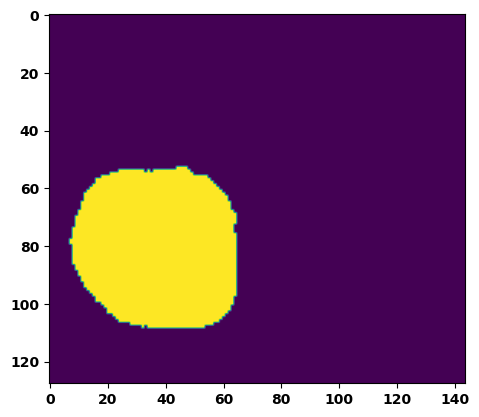

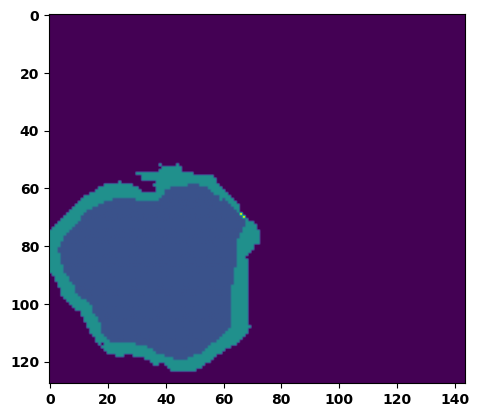

  6%|▌         | 2/36 [00:03<00:58,  1.73s/it]

Batch_id:  1 Eval loss:  0.15602925419807434
Batch_id:  1 Eval IoU:  tensor(0.7702, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:51,  1.56s/it]

Batch_id:  2 Eval loss:  0.7408345937728882
Batch_id:  2 Eval IoU:  tensor(0.1723, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.4954, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.3115, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9311, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8991, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.3444, device='cuda:0')


 11%|█         | 4/36 [00:06<00:49,  1.56s/it]

Batch_id:  3 Eval loss:  0.6753512024879456
Batch_id:  3 Eval IoU:  tensor(0.2361, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7580, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.6920, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.7825, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.8529, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9466, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:48,  1.57s/it]

Batch_id:  4 Eval loss:  0.2137647122144699
Batch_id:  4 Eval IoU:  tensor(0.6813, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:44,  1.48s/it]

Batch_id:  5 Eval loss:  0.7799583673477173
Batch_id:  5 Eval IoU:  tensor(0.1447, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4989, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.2515, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.2539, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:44,  1.53s/it]

Batch_id:  6 Eval loss:  0.7135258913040161
Batch_id:  6 Eval IoU:  tensor(0.2326, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8440, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.7813, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.8588, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9061, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 22%|██▏       | 8/36 [00:12<00:41,  1.48s/it]

Batch_id:  7 Eval loss:  0.2634229063987732
Batch_id:  7 Eval IoU:  tensor(0.6263, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9897, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.46s/it]

Batch_id:  8 Eval loss:  0.5767101049423218
Batch_id:  8 Eval IoU:  tensor(0.3409, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9090, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9669, device='cuda:0')


 28%|██▊       | 10/36 [00:15<00:39,  1.53s/it]

Batch_id:  9 Eval loss:  0.08244125545024872
Batch_id:  9 Eval IoU:  tensor(0.8545, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  10 Eval loss:  0.7290875315666199
Batch_id:  10 Eval IoU:  tensor(0.2465, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9238, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9230, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9090, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


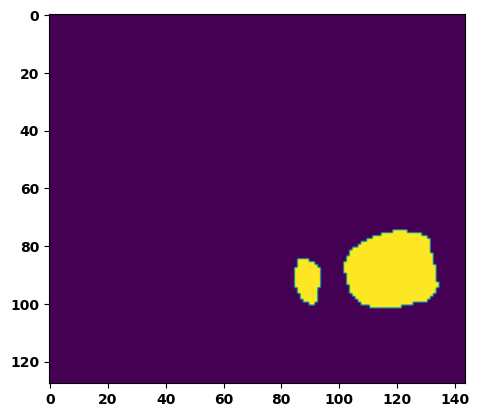

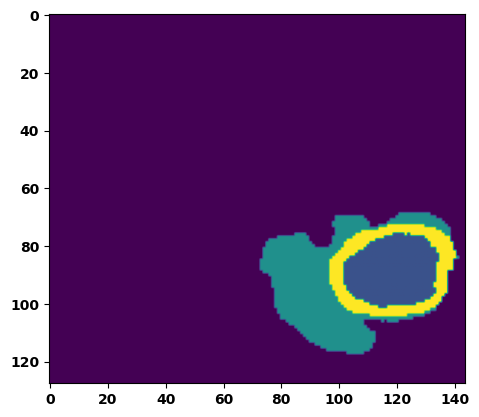

 33%|███▎      | 12/36 [00:18<00:36,  1.52s/it]

Batch_id:  11 Eval loss:  0.6225420236587524
Batch_id:  11 Eval IoU:  tensor(0.3241, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:32,  1.41s/it]

Batch_id:  12 Eval loss:  0.7682427167892456
Batch_id:  12 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 39%|███▉      | 14/36 [00:21<00:31,  1.45s/it]

Batch_id:  13 Eval loss:  0.5405007004737854
Batch_id:  13 Eval IoU:  tensor(0.3548, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7859, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.7693, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9160, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.6837, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9887, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.44s/it]

Batch_id:  14 Eval loss:  0.5900882482528687
Batch_id:  14 Eval IoU:  tensor(0.3456, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9741, device='cuda:0')


 44%|████▍     | 16/36 [00:24<00:29,  1.46s/it]

Batch_id:  15 Eval loss:  0.7587776780128479
Batch_id:  15 Eval IoU:  tensor(0.1505, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5388, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3906, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3113, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:26,  1.42s/it]

Batch_id:  16 Eval loss:  0.3542141914367676
Batch_id:  16 Eval IoU:  tensor(0.5393, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:24,  1.37s/it]

Batch_id:  17 Eval loss:  0.7748942375183105
Batch_id:  17 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.37s/it]

Batch_id:  18 Eval loss:  0.659196674823761
Batch_id:  18 Eval IoU:  tensor(0.2876, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.38s/it]

Batch_id:  19 Eval loss:  0.47917959094047546
Batch_id:  19 Eval IoU:  tensor(0.4375, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  20 Eval loss:  0.7581874132156372
Batch_id:  20 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


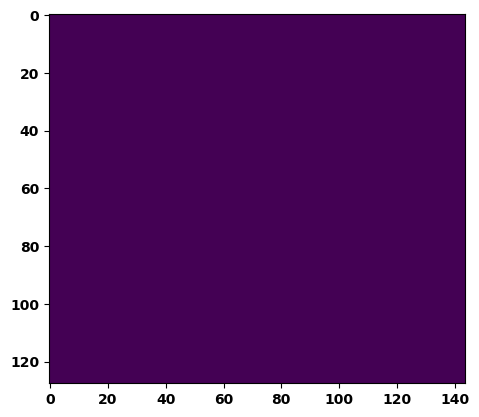

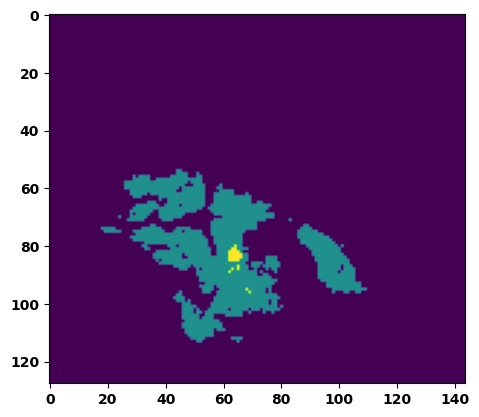

 61%|██████    | 22/36 [00:32<00:18,  1.35s/it]

Batch_id:  21 Eval loss:  0.5924685597419739
Batch_id:  21 Eval IoU:  tensor(0.3594, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:17,  1.35s/it]

Batch_id:  22 Eval loss:  0.47081631422042847
Batch_id:  22 Eval IoU:  tensor(0.4498, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9447, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9238, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:16,  1.34s/it]

Batch_id:  23 Eval loss:  0.5596897602081299
Batch_id:  23 Eval IoU:  tensor(0.4001, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:14,  1.35s/it]

Batch_id:  24 Eval loss:  0.7659857273101807
Batch_id:  24 Eval IoU:  tensor(0.1639, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6703, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.5743, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9118, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.5811, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:13,  1.38s/it]

Batch_id:  25 Eval loss:  0.7334156632423401
Batch_id:  25 Eval IoU:  tensor(0.1724, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.5629, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4409, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9023, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.4239, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.38s/it]

Batch_id:  26 Eval loss:  0.165048748254776
Batch_id:  26 Eval IoU:  tensor(0.7512, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.45s/it]

Batch_id:  27 Eval loss:  0.7561745643615723
Batch_id:  27 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.41s/it]

Batch_id:  28 Eval loss:  0.9010932445526123
Batch_id:  28 Eval IoU:  tensor(0.0581, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4608, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3348, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.1924, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.39s/it]

Batch_id:  29 Eval loss:  0.8824512362480164
Batch_id:  29 Eval IoU:  tensor(0.0752, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.4966, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.4191, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.2451, device='cuda:0')
Batch_id:  30 Eval loss:  0.16039666533470154
Batch_id:  30 Eval IoU:  tensor(0.7425, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9762, device='cuda:0')


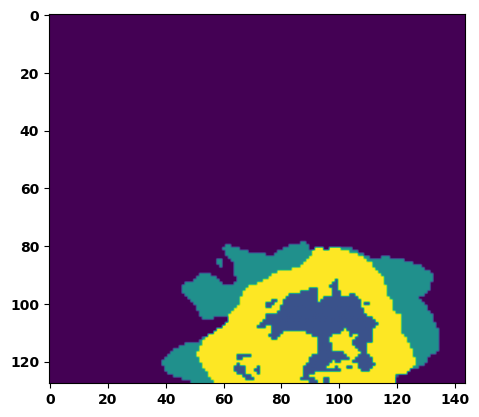

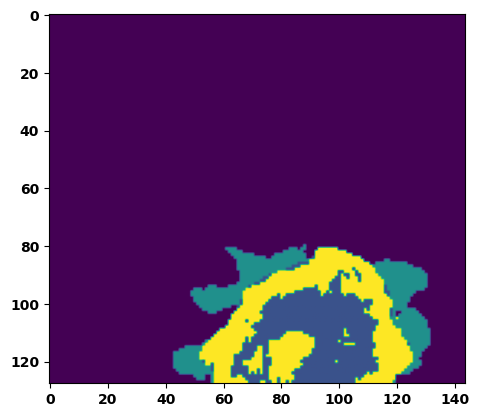

 89%|████████▉ | 32/36 [00:46<00:05,  1.41s/it]

Batch_id:  31 Eval loss:  0.2696388363838196
Batch_id:  31 Eval IoU:  tensor(0.6130, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.42s/it]

Batch_id:  32 Eval loss:  0.4763948321342468
Batch_id:  32 Eval IoU:  tensor(0.4143, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7660, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.6597, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6586, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.39s/it]

Batch_id:  33 Eval loss:  0.5528592467308044
Batch_id:  33 Eval IoU:  tensor(0.3932, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9088, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8811, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9285, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.38s/it]

Batch_id:  34 Eval loss:  0.6456724405288696
Batch_id:  34 Eval IoU:  tensor(0.2963, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8816, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8446, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8273, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.7517053484916687
Batch_id:  35 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Epoch  26 Training loss:  0.13814285817471417
Epoch  26 Evaluation loss:  0.568802960216999
Epoch  26 Training accuracy :  tensor(0.7964)
Epoch  26 Evaluation accuracy :  tensor(0.3656)
Epoch  26 Training Mean Dice Score:  tensor(0.9839)
Epoch  26 Eval Mean Dice Score:  tensor(0.8536)
Epoch  26 Training Non-tumor Dice Score:  tensor(0.9849)
Epoch  26 Eval Non-tumor Dice Score:  tensor(0.8105)
Epoch  26 Training NCR/NET Dice Score:  tensor(0.9928)
Epoch  26 Eval NCR/NET Dice Score:  tensor(0.9592)
Epoch  26 Training ED Dice Score:  tensor(0.982

Epoch: 27
Training in session: 


  1%|          | 1/110 [00:01<02:57,  1.63s/it]

Batch_id:  0 Training loss:  0.051237404346466064
Batch_id:  0 Training IoU:  tensor(0.9172, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:37,  1.46s/it]

Batch_id:  1 Training loss:  0.12059006094932556
Batch_id:  1 Training IoU:  tensor(0.7967, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:32,  1.43s/it]

Batch_id:  2 Training loss:  0.09021441638469696
Batch_id:  2 Training IoU:  tensor(0.8484, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:31,  1.43s/it]

Batch_id:  3 Training loss:  0.07500922679901123
Batch_id:  3 Training IoU:  tensor(0.8727, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:30,  1.43s/it]

Batch_id:  4 Training loss:  0.2955212891101837
Batch_id:  4 Training IoU:  tensor(0.6005, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:28,  1.43s/it]

Batch_id:  5 Training loss:  0.11723598837852478
Batch_id:  5 Training IoU:  tensor(0.8177, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:37,  1.53s/it]

Batch_id:  6 Training loss:  0.06563612818717957
Batch_id:  6 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:33,  1.50s/it]

Batch_id:  7 Training loss:  0.029412388801574707
Batch_id:  7 Training IoU:  tensor(0.9513, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:26,  1.45s/it]

Batch_id:  8 Training loss:  0.11115598678588867
Batch_id:  8 Training IoU:  tensor(0.8163, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:20,  1.41s/it]

Batch_id:  9 Training loss:  0.07620242238044739
Batch_id:  9 Training IoU:  tensor(0.8688, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 10%|█         | 11/110 [00:15<02:16,  1.38s/it]

Batch_id:  10 Training loss:  0.1535804271697998
Batch_id:  10 Training IoU:  tensor(0.7668, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 11%|█         | 12/110 [00:17<02:18,  1.41s/it]

Batch_id:  11 Training loss:  0.19302549958229065
Batch_id:  11 Training IoU:  tensor(0.7117, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:15,  1.40s/it]

Batch_id:  12 Training loss:  0.2607126533985138
Batch_id:  12 Training IoU:  tensor(0.6748, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:18,  1.44s/it]

Batch_id:  13 Training loss:  0.13135580718517303
Batch_id:  13 Training IoU:  tensor(0.7851, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:21,  1.49s/it]

Batch_id:  14 Training loss:  0.16036896407604218
Batch_id:  14 Training IoU:  tensor(0.7787, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:17,  1.46s/it]

Batch_id:  15 Training loss:  0.1629990041255951
Batch_id:  15 Training IoU:  tensor(0.7457, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:18,  1.48s/it]

Batch_id:  16 Training loss:  0.08955879509449005
Batch_id:  16 Training IoU:  tensor(0.9128, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:16,  1.48s/it]

Batch_id:  17 Training loss:  0.07042355835437775
Batch_id:  17 Training IoU:  tensor(0.9169, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:11,  1.44s/it]

Batch_id:  18 Training loss:  0.11131332814693451
Batch_id:  18 Training IoU:  tensor(0.8271, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:07,  1.42s/it]

Batch_id:  19 Training loss:  0.22480887174606323
Batch_id:  19 Training IoU:  tensor(0.6964, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:05,  1.42s/it]

Batch_id:  20 Training loss:  0.06565812230110168
Batch_id:  20 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 20%|██        | 22/110 [00:31<02:04,  1.42s/it]

Batch_id:  21 Training loss:  0.07869347929954529
Batch_id:  21 Training IoU:  tensor(0.8676, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 21%|██        | 23/110 [00:33<02:04,  1.43s/it]

Batch_id:  22 Training loss:  0.10508085787296295
Batch_id:  22 Training IoU:  tensor(0.8207, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:03,  1.44s/it]

Batch_id:  23 Training loss:  0.14112642407417297
Batch_id:  23 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 23%|██▎       | 25/110 [00:35<01:59,  1.41s/it]

Batch_id:  24 Training loss:  0.32902991771698
Batch_id:  24 Training IoU:  tensor(0.5873, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:56,  1.39s/it]

Batch_id:  25 Training loss:  0.08930206298828125
Batch_id:  25 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:03,  1.48s/it]

Batch_id:  26 Training loss:  0.22588054835796356
Batch_id:  26 Training IoU:  tensor(0.6823, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 25%|██▌       | 28/110 [00:40<02:00,  1.47s/it]

Batch_id:  27 Training loss:  0.11892712116241455
Batch_id:  27 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:59,  1.48s/it]

Batch_id:  28 Training loss:  0.14337988197803497
Batch_id:  28 Training IoU:  tensor(0.7801, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9727, device='cuda:0')


 27%|██▋       | 30/110 [00:43<02:00,  1.50s/it]

Batch_id:  29 Training loss:  0.08181390166282654
Batch_id:  29 Training IoU:  tensor(0.8805, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:54,  1.45s/it]

Batch_id:  30 Training loss:  0.2603554129600525
Batch_id:  30 Training IoU:  tensor(0.6754, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:54,  1.47s/it]

Batch_id:  31 Training loss:  0.2020539790391922
Batch_id:  31 Training IoU:  tensor(0.6905, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 30%|███       | 33/110 [00:47<01:50,  1.44s/it]

Batch_id:  32 Training loss:  0.13866446912288666
Batch_id:  32 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9743, device='cuda:0')


 31%|███       | 34/110 [00:49<01:52,  1.48s/it]

Batch_id:  33 Training loss:  0.3270271420478821
Batch_id:  33 Training IoU:  tensor(0.6201, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:53,  1.51s/it]

Batch_id:  34 Training loss:  0.2372811883687973
Batch_id:  34 Training IoU:  tensor(0.7089, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:48,  1.46s/it]

Batch_id:  35 Training loss:  0.18700876832008362
Batch_id:  35 Training IoU:  tensor(0.7788, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:47,  1.47s/it]

Batch_id:  36 Training loss:  0.08539889752864838
Batch_id:  36 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:45,  1.46s/it]

Batch_id:  37 Training loss:  0.1317620575428009
Batch_id:  37 Training IoU:  tensor(0.7893, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:44,  1.48s/it]

Batch_id:  38 Training loss:  0.22433538734912872
Batch_id:  38 Training IoU:  tensor(0.6757, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9634, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:42,  1.47s/it]

Batch_id:  39 Training loss:  0.09377926588058472
Batch_id:  39 Training IoU:  tensor(0.8427, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:37,  1.41s/it]

Batch_id:  40 Training loss:  0.11906500160694122
Batch_id:  40 Training IoU:  tensor(0.8029, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:38,  1.45s/it]

Batch_id:  41 Training loss:  0.1436181366443634
Batch_id:  41 Training IoU:  tensor(0.7929, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:35,  1.43s/it]

Batch_id:  42 Training loss:  0.059136033058166504
Batch_id:  42 Training IoU:  tensor(0.8964, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 40%|████      | 44/110 [01:03<01:37,  1.47s/it]

Batch_id:  43 Training loss:  0.100090891122818
Batch_id:  43 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 41%|████      | 45/110 [01:05<01:34,  1.45s/it]

Batch_id:  44 Training loss:  0.15003816783428192
Batch_id:  44 Training IoU:  tensor(0.7603, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:37,  1.52s/it]

Batch_id:  45 Training loss:  0.09676091372966766
Batch_id:  45 Training IoU:  tensor(0.8333, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:32,  1.47s/it]

Batch_id:  46 Training loss:  0.3728037476539612
Batch_id:  46 Training IoU:  tensor(0.5423, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:34,  1.52s/it]

Batch_id:  47 Training loss:  0.2227337509393692
Batch_id:  47 Training IoU:  tensor(0.7443, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:30,  1.48s/it]

Batch_id:  48 Training loss:  0.13076741993427277
Batch_id:  48 Training IoU:  tensor(0.8138, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:27,  1.46s/it]

Batch_id:  49 Training loss:  0.2277921587228775
Batch_id:  49 Training IoU:  tensor(0.7014, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:25,  1.44s/it]

Batch_id:  50 Training loss:  0.07036064565181732
Batch_id:  50 Training IoU:  tensor(0.8852, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:25,  1.47s/it]

Batch_id:  51 Training loss:  0.15646867454051971
Batch_id:  51 Training IoU:  tensor(0.7533, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:24,  1.49s/it]

Batch_id:  52 Training loss:  0.11329825222492218
Batch_id:  52 Training IoU:  tensor(0.8140, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:24,  1.50s/it]

Batch_id:  53 Training loss:  0.21307365596294403
Batch_id:  53 Training IoU:  tensor(0.7098, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.0855787992477417
Batch_id:  54 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:18,  1.46s/it]

Batch_id:  55 Training loss:  0.06525009870529175
Batch_id:  55 Training IoU:  tensor(0.8891, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:21,  1.53s/it]

Batch_id:  56 Training loss:  0.2652219235897064
Batch_id:  56 Training IoU:  tensor(0.6583, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:17,  1.49s/it]

Batch_id:  57 Training loss:  0.14660954475402832
Batch_id:  57 Training IoU:  tensor(0.7978, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:13,  1.44s/it]

Batch_id:  58 Training loss:  0.10732218623161316
Batch_id:  58 Training IoU:  tensor(0.8177, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:11,  1.42s/it]

Batch_id:  59 Training loss:  0.1886163204908371
Batch_id:  59 Training IoU:  tensor(0.7179, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:11,  1.45s/it]

Batch_id:  60 Training loss:  0.14309193193912506
Batch_id:  60 Training IoU:  tensor(0.7665, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:16,  1.58s/it]

Batch_id:  61 Training loss:  0.09426388144493103
Batch_id:  61 Training IoU:  tensor(0.8430, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:11,  1.52s/it]

Batch_id:  62 Training loss:  0.0969395637512207
Batch_id:  62 Training IoU:  tensor(0.8358, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:10,  1.53s/it]

Batch_id:  63 Training loss:  0.11568848788738251
Batch_id:  63 Training IoU:  tensor(0.8159, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:08,  1.52s/it]

Batch_id:  64 Training loss:  0.07164187729358673
Batch_id:  64 Training IoU:  tensor(0.8739, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:05,  1.48s/it]

Batch_id:  65 Training loss:  0.13784557580947876
Batch_id:  65 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:05,  1.53s/it]

Batch_id:  66 Training loss:  0.22735047340393066
Batch_id:  66 Training IoU:  tensor(0.7059, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:04,  1.54s/it]

Batch_id:  67 Training loss:  0.06152334809303284
Batch_id:  67 Training IoU:  tensor(0.8959, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:01,  1.51s/it]

Batch_id:  68 Training loss:  0.09022107720375061
Batch_id:  68 Training IoU:  tensor(0.8512, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:59,  1.49s/it]

Batch_id:  69 Training loss:  0.14975933730602264
Batch_id:  69 Training IoU:  tensor(0.7753, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9901, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:57,  1.48s/it]

Batch_id:  70 Training loss:  0.19150497019290924
Batch_id:  70 Training IoU:  tensor(0.7299, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.14310498535633087
Batch_id:  71 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:53,  1.44s/it]

Batch_id:  72 Training loss:  0.1510482281446457
Batch_id:  72 Training IoU:  tensor(0.7684, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:52,  1.47s/it]

Batch_id:  73 Training loss:  0.04812987148761749
Batch_id:  73 Training IoU:  tensor(0.9197, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:50,  1.44s/it]

Batch_id:  74 Training loss:  0.10586483776569366
Batch_id:  74 Training IoU:  tensor(0.8313, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:48,  1.44s/it]

Batch_id:  75 Training loss:  0.056547969579696655
Batch_id:  75 Training IoU:  tensor(0.9032, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:48,  1.47s/it]

Batch_id:  76 Training loss:  0.1313685178756714
Batch_id:  76 Training IoU:  tensor(0.8080, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:45,  1.42s/it]

Batch_id:  77 Training loss:  0.09736858308315277
Batch_id:  77 Training IoU:  tensor(0.8404, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:44,  1.45s/it]

Batch_id:  78 Training loss:  0.2461531162261963
Batch_id:  78 Training IoU:  tensor(0.6691, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:44,  1.49s/it]

Batch_id:  79 Training loss:  0.08844225108623505
Batch_id:  79 Training IoU:  tensor(0.8500, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:42,  1.47s/it]

Batch_id:  80 Training loss:  0.2232999950647354
Batch_id:  80 Training IoU:  tensor(0.6872, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.0916045606136322
Batch_id:  81 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:39,  1.45s/it]

Batch_id:  82 Training loss:  0.17295031249523163
Batch_id:  82 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:40,  1.54s/it]

Batch_id:  83 Training loss:  0.10570284724235535
Batch_id:  83 Training IoU:  tensor(0.8555, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:37,  1.49s/it]

Batch_id:  84 Training loss:  0.1339273750782013
Batch_id:  84 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9902, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:36,  1.53s/it]

Batch_id:  85 Training loss:  0.11193041503429413
Batch_id:  85 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:34,  1.51s/it]

Batch_id:  86 Training loss:  0.09419044852256775
Batch_id:  86 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:33,  1.52s/it]

Batch_id:  87 Training loss:  0.20480528473854065
Batch_id:  87 Training IoU:  tensor(0.6884, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:32,  1.55s/it]

Batch_id:  88 Training loss:  0.05807557702064514
Batch_id:  88 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:32,  1.63s/it]

Batch_id:  89 Training loss:  0.11785782873630524
Batch_id:  89 Training IoU:  tensor(0.8074, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:30,  1.61s/it]

Batch_id:  90 Training loss:  0.07446658611297607
Batch_id:  90 Training IoU:  tensor(0.8745, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 84%|████████▎ | 92/110 [02:15<00:28,  1.61s/it]

Batch_id:  91 Training loss:  0.15724293887615204
Batch_id:  91 Training IoU:  tensor(0.7531, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 85%|████████▍ | 93/110 [02:17<00:26,  1.55s/it]

Batch_id:  92 Training loss:  0.15310266613960266
Batch_id:  92 Training IoU:  tensor(0.7760, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:24,  1.52s/it]

Batch_id:  93 Training loss:  0.05424979329109192
Batch_id:  93 Training IoU:  tensor(0.9058, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:22,  1.52s/it]

Batch_id:  94 Training loss:  0.15144959092140198
Batch_id:  94 Training IoU:  tensor(0.7567, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:21,  1.52s/it]

Batch_id:  95 Training loss:  0.055694833397865295
Batch_id:  95 Training IoU:  tensor(0.9038, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:19,  1.53s/it]

Batch_id:  96 Training loss:  0.06133660674095154
Batch_id:  96 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.0639733076095581
Batch_id:  97 Training IoU:  tensor(0.8887, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:16,  1.49s/it]

Batch_id:  98 Training loss:  0.1200634241104126
Batch_id:  98 Training IoU:  tensor(0.7993, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:14,  1.47s/it]

Batch_id:  99 Training loss:  0.17485764622688293
Batch_id:  99 Training IoU:  tensor(0.7360, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.49s/it]

Batch_id:  100 Training loss:  0.11526760458946228
Batch_id:  100 Training IoU:  tensor(0.8254, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.46s/it]

Batch_id:  101 Training loss:  0.20581980049610138
Batch_id:  101 Training IoU:  tensor(0.6918, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.46s/it]

Batch_id:  102 Training loss:  0.07718658447265625
Batch_id:  102 Training IoU:  tensor(0.8710, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.43s/it]

Batch_id:  103 Training loss:  0.1840292513370514
Batch_id:  103 Training IoU:  tensor(0.7709, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.44s/it]

Batch_id:  104 Training loss:  0.09427259862422943
Batch_id:  104 Training IoU:  tensor(0.8382, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:06,  1.56s/it]

Batch_id:  105 Training loss:  0.06599195301532745
Batch_id:  105 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.54s/it]

Batch_id:  106 Training loss:  0.08542880415916443
Batch_id:  106 Training IoU:  tensor(0.8553, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:03,  1.55s/it]

Batch_id:  107 Training loss:  0.14785584807395935
Batch_id:  107 Training IoU:  tensor(0.7618, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.54s/it]

Batch_id:  108 Training loss:  0.11361163854598999
Batch_id:  108 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.24982215464115143
Batch_id:  109 Training IoU:  tensor(0.6949, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9963, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.1936575323343277
Batch_id:  0 Eval IoU:  tensor(0.7018, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9754, device='cuda:0')


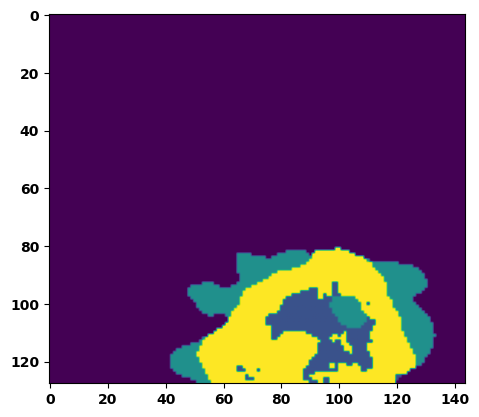

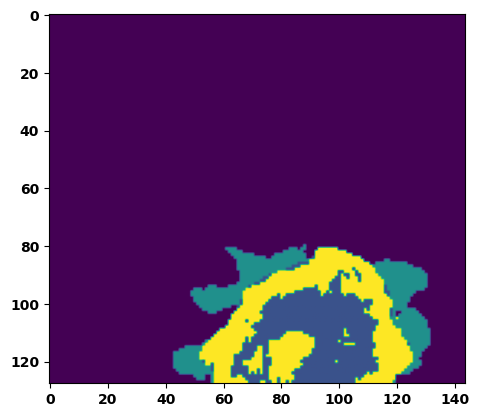

  6%|▌         | 2/36 [00:03<00:50,  1.50s/it]

Batch_id:  1 Eval loss:  0.5657574534416199
Batch_id:  1 Eval IoU:  tensor(0.3856, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9049, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.49s/it]

Batch_id:  2 Eval loss:  0.5651262402534485
Batch_id:  2 Eval IoU:  tensor(0.3902, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.51s/it]

Batch_id:  3 Eval loss:  0.6114605665206909
Batch_id:  3 Eval IoU:  tensor(0.3306, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.43s/it]

Batch_id:  4 Eval loss:  0.7682117223739624
Batch_id:  4 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.46s/it]

Batch_id:  5 Eval loss:  0.5635308027267456
Batch_id:  5 Eval IoU:  tensor(0.3529, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8827, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9125, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8403, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9861, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.6959121227264404
Batch_id:  6 Eval IoU:  tensor(0.2091, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.5767, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4419, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.4154, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.39s/it]

Batch_id:  7 Eval loss:  0.8830721378326416
Batch_id:  7 Eval IoU:  tensor(0.0747, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4955, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.4175, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9042, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.2435, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.43s/it]

Batch_id:  8 Eval loss:  0.6024208068847656
Batch_id:  8 Eval IoU:  tensor(0.3420, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.39s/it]

Batch_id:  9 Eval loss:  0.6984253525733948
Batch_id:  9 Eval IoU:  tensor(0.2681, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  10 Eval loss:  0.4829461872577667
Batch_id:  10 Eval IoU:  tensor(0.4187, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


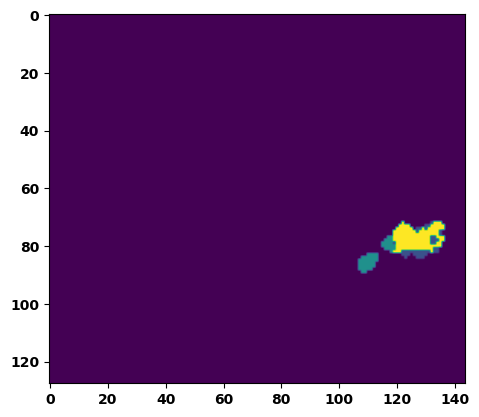

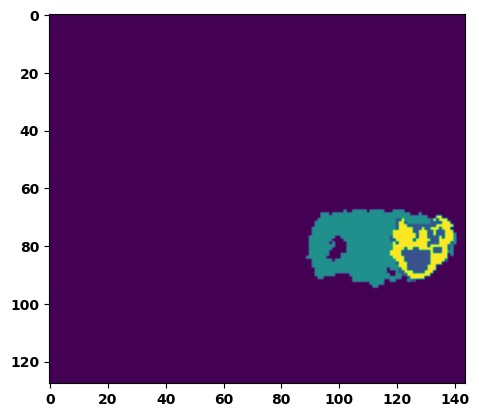

 33%|███▎      | 12/36 [00:17<00:36,  1.50s/it]

Batch_id:  11 Eval loss:  0.18476909399032593
Batch_id:  11 Eval IoU:  tensor(0.7430, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9972, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.49s/it]

Batch_id:  12 Eval loss:  0.3515869975090027
Batch_id:  12 Eval IoU:  tensor(0.5324, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9446, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9948, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.48s/it]

Batch_id:  13 Eval loss:  0.5091469287872314
Batch_id:  13 Eval IoU:  tensor(0.3996, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9453, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.52s/it]

Batch_id:  14 Eval loss:  0.7560688853263855
Batch_id:  14 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:31,  1.57s/it]

Batch_id:  15 Eval loss:  0.45629170536994934
Batch_id:  15 Eval IoU:  tensor(0.4387, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7895, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6938, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.6925, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:30,  1.60s/it]

Batch_id:  16 Eval loss:  0.24878241121768951
Batch_id:  16 Eval IoU:  tensor(0.6418, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9941, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:27,  1.55s/it]

Batch_id:  17 Eval loss:  0.6442940831184387
Batch_id:  17 Eval IoU:  tensor(0.3029, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:26,  1.58s/it]

Batch_id:  18 Eval loss:  0.5860657691955566
Batch_id:  18 Eval IoU:  tensor(0.3512, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.8890, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8420, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9276, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:24,  1.51s/it]

Batch_id:  19 Eval loss:  0.7308990955352783
Batch_id:  19 Eval IoU:  tensor(0.2493, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  20 Eval loss:  0.699717104434967
Batch_id:  20 Eval IoU:  tensor(0.2087, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.5070, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.3276, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.8460, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.3896, device='cuda:0')


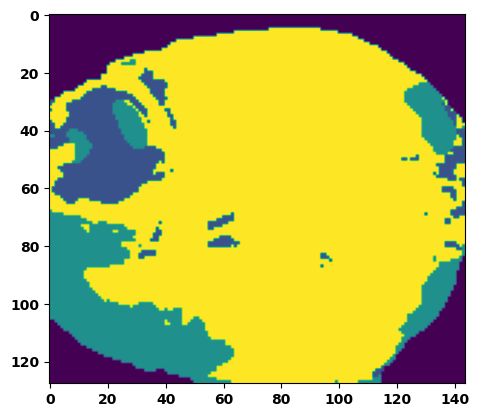

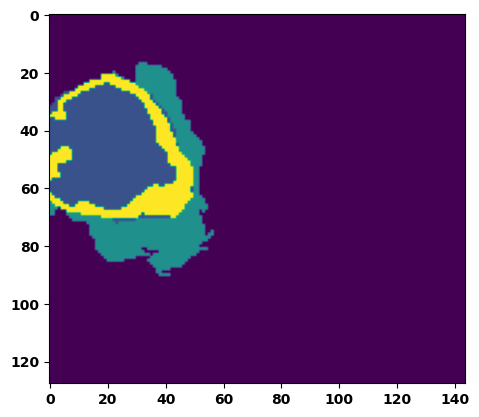

 61%|██████    | 22/36 [00:33<00:21,  1.55s/it]

Batch_id:  21 Eval loss:  0.9023150205612183
Batch_id:  21 Eval IoU:  tensor(0.0574, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.4607, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3348, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.1916, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.51s/it]

Batch_id:  22 Eval loss:  0.7591204047203064
Batch_id:  22 Eval IoU:  tensor(0.2286, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9197, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9058, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 67%|██████▋   | 24/36 [00:36<00:18,  1.52s/it]

Batch_id:  23 Eval loss:  0.6525602340698242
Batch_id:  23 Eval IoU:  tensor(0.3012, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9471, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.3428119719028473
Batch_id:  24 Eval IoU:  tensor(0.5477, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9870, device='cuda:0')


 72%|███████▏  | 26/36 [00:39<00:15,  1.53s/it]

Batch_id:  25 Eval loss:  0.81343674659729
Batch_id:  25 Eval IoU:  tensor(0.1129, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.5314, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3878, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.2990, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.53s/it]

Batch_id:  26 Eval loss:  0.7749171853065491
Batch_id:  26 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 78%|███████▊  | 28/36 [00:42<00:12,  1.51s/it]

Batch_id:  27 Eval loss:  0.07724538445472717
Batch_id:  27 Eval IoU:  tensor(0.8631, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9881, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.50s/it]

Batch_id:  28 Eval loss:  0.7231988310813904
Batch_id:  28 Eval IoU:  tensor(0.2117, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7642, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7150, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.6557, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 83%|████████▎ | 30/36 [00:45<00:08,  1.47s/it]

Batch_id:  29 Eval loss:  0.7985678315162659
Batch_id:  29 Eval IoU:  tensor(0.1239, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5319, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3011, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.2988, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  30 Eval loss:  0.7298406362533569
Batch_id:  30 Eval IoU:  tensor(0.2495, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


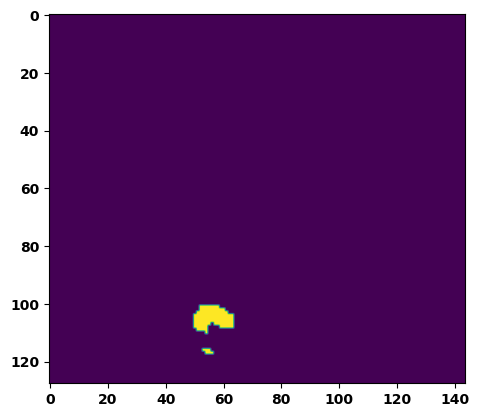

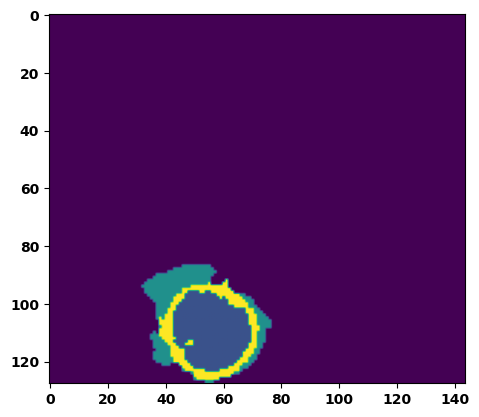

 89%|████████▉ | 32/36 [00:48<00:05,  1.46s/it]

Batch_id:  31 Eval loss:  0.5255206823348999
Batch_id:  31 Eval IoU:  tensor(0.4226, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9352, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9344, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9237, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.50s/it]

Batch_id:  32 Eval loss:  0.1575726568698883
Batch_id:  32 Eval IoU:  tensor(0.7618, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 94%|█████████▍| 34/36 [00:51<00:02,  1.45s/it]

Batch_id:  33 Eval loss:  0.7517282962799072
Batch_id:  33 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.47s/it]

Batch_id:  34 Eval loss:  0.7576242685317993
Batch_id:  34 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.50s/it]

Batch_id:  35 Eval loss:  0.7439007759094238
Batch_id:  35 Eval IoU:  tensor(0.2327, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9245, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8869, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9628, device='cuda:0')
Epoch  27 Training loss:  0.13690413263711063
Epoch  27 Evaluation loss:  0.5919028868277868
Epoch  27 Training accuracy :  tensor(0.7978)
Epoch  27 Evaluation accuracy :  tensor(0.3495)
Epoch  27 Training Mean Dice Score:  tensor(0.9840)
Epoch  27 Eval Mean Dice Score:  tensor(0.8688)
Epoch  27 Training Non-tumor Dice Score:  tensor(0.9851)
Epoch  27 Eval Non-tumor Dice Score:  tensor(0.8302)
Epoch  27 Training NCR/NET Dice Score:  tensor(0.9929)
Epoch  27 Eval NCR/NET Dice Score:  tensor(0.9741)
Epoch  27 Training ED Dice Score:  tensor(0.98

Epoch: 28
Training in session: 


  1%|          | 1/110 [00:01<02:53,  1.59s/it]

Batch_id:  0 Training loss:  0.368025541305542
Batch_id:  0 Training IoU:  tensor(0.5468, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:45,  1.54s/it]

Batch_id:  1 Training loss:  0.3172154128551483
Batch_id:  1 Training IoU:  tensor(0.5973, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:43,  1.53s/it]

Batch_id:  2 Training loss:  0.07418790459632874
Batch_id:  2 Training IoU:  tensor(0.8748, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:42,  1.53s/it]

Batch_id:  3 Training loss:  0.10434478521347046
Batch_id:  3 Training IoU:  tensor(0.8258, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:38,  1.51s/it]

Batch_id:  4 Training loss:  0.11857658624649048
Batch_id:  4 Training IoU:  tensor(0.8029, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:31,  1.46s/it]

Batch_id:  5 Training loss:  0.11298473179340363
Batch_id:  5 Training IoU:  tensor(0.8210, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:28,  1.44s/it]

Batch_id:  6 Training loss:  0.10982620716094971
Batch_id:  6 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:32,  1.50s/it]

Batch_id:  7 Training loss:  0.11621555685997009
Batch_id:  7 Training IoU:  tensor(0.8202, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:29,  1.48s/it]

Batch_id:  8 Training loss:  0.1517331898212433
Batch_id:  8 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:30,  1.51s/it]

Batch_id:  9 Training loss:  0.09689965844154358
Batch_id:  9 Training IoU:  tensor(0.8393, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 10%|█         | 11/110 [00:16<02:26,  1.48s/it]

Batch_id:  10 Training loss:  0.18399392068386078
Batch_id:  10 Training IoU:  tensor(0.7234, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 11%|█         | 12/110 [00:17<02:22,  1.45s/it]

Batch_id:  11 Training loss:  0.10262256860733032
Batch_id:  11 Training IoU:  tensor(0.8347, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:23,  1.48s/it]

Batch_id:  12 Training loss:  0.2568710744380951
Batch_id:  12 Training IoU:  tensor(0.6709, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:23,  1.49s/it]

Batch_id:  13 Training loss:  0.13415022194385529
Batch_id:  13 Training IoU:  tensor(0.8766, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:19,  1.47s/it]

Batch_id:  14 Training loss:  0.07672400772571564
Batch_id:  14 Training IoU:  tensor(0.8724, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:19,  1.48s/it]

Batch_id:  15 Training loss:  0.11220189929008484
Batch_id:  15 Training IoU:  tensor(0.8168, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:18,  1.49s/it]

Batch_id:  16 Training loss:  0.2480773627758026
Batch_id:  16 Training IoU:  tensor(0.6873, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:19,  1.52s/it]

Batch_id:  17 Training loss:  0.07940901815891266
Batch_id:  17 Training IoU:  tensor(0.8873, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:17,  1.51s/it]

Batch_id:  18 Training loss:  0.08796864748001099
Batch_id:  18 Training IoU:  tensor(0.8507, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:12,  1.48s/it]

Batch_id:  19 Training loss:  0.12581223249435425
Batch_id:  19 Training IoU:  tensor(0.7996, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:10,  1.47s/it]

Batch_id:  20 Training loss:  0.08596734702587128
Batch_id:  20 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 20%|██        | 22/110 [00:32<02:08,  1.46s/it]

Batch_id:  21 Training loss:  0.24152851104736328
Batch_id:  21 Training IoU:  tensor(0.6706, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 21%|██        | 23/110 [00:34<02:05,  1.45s/it]

Batch_id:  22 Training loss:  0.09382399916648865
Batch_id:  22 Training IoU:  tensor(0.8386, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:05,  1.46s/it]

Batch_id:  23 Training loss:  0.13529695570468903
Batch_id:  23 Training IoU:  tensor(0.7901, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:01,  1.43s/it]

Batch_id:  24 Training loss:  0.060361042618751526
Batch_id:  24 Training IoU:  tensor(0.8971, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 24%|██▎       | 26/110 [00:38<01:57,  1.40s/it]

Batch_id:  25 Training loss:  0.12776629626750946
Batch_id:  25 Training IoU:  tensor(0.7937, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:57,  1.41s/it]

Batch_id:  26 Training loss:  0.06705375015735626
Batch_id:  26 Training IoU:  tensor(0.8854, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:58,  1.44s/it]

Batch_id:  27 Training loss:  0.06183136999607086
Batch_id:  27 Training IoU:  tensor(0.9089, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:58,  1.46s/it]

Batch_id:  28 Training loss:  0.16162997484207153
Batch_id:  28 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:53,  1.42s/it]

Batch_id:  29 Training loss:  0.14093537628650665
Batch_id:  29 Training IoU:  tensor(0.7823, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:51,  1.41s/it]

Batch_id:  30 Training loss:  0.10378381609916687
Batch_id:  30 Training IoU:  tensor(0.8239, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:48,  1.39s/it]

Batch_id:  31 Training loss:  0.1125098317861557
Batch_id:  31 Training IoU:  tensor(0.8094, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 30%|███       | 33/110 [00:48<01:45,  1.37s/it]

Batch_id:  32 Training loss:  0.1803574562072754
Batch_id:  32 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 31%|███       | 34/110 [00:49<01:44,  1.37s/it]

Batch_id:  33 Training loss:  0.0729580819606781
Batch_id:  33 Training IoU:  tensor(0.8750, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:44,  1.39s/it]

Batch_id:  34 Training loss:  0.11288250982761383
Batch_id:  34 Training IoU:  tensor(0.8087, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9847, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:40,  1.36s/it]

Batch_id:  35 Training loss:  0.06358160078525543
Batch_id:  35 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:44,  1.43s/it]

Batch_id:  36 Training loss:  0.21738654375076294
Batch_id:  36 Training IoU:  tensor(0.6832, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9643, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.23356489837169647
Batch_id:  37 Training IoU:  tensor(0.6757, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9453, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:43,  1.46s/it]

Batch_id:  38 Training loss:  0.128198504447937
Batch_id:  38 Training IoU:  tensor(0.7892, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:40,  1.43s/it]

Batch_id:  39 Training loss:  0.055846571922302246
Batch_id:  39 Training IoU:  tensor(0.9036, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:38,  1.42s/it]

Batch_id:  40 Training loss:  0.21727310121059418
Batch_id:  40 Training IoU:  tensor(0.7038, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:38,  1.44s/it]

Batch_id:  41 Training loss:  0.11249548196792603
Batch_id:  41 Training IoU:  tensor(0.8263, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:36,  1.44s/it]

Batch_id:  42 Training loss:  0.09839093685150146
Batch_id:  42 Training IoU:  tensor(0.8371, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 40%|████      | 44/110 [01:03<01:35,  1.44s/it]

Batch_id:  43 Training loss:  0.3239095211029053
Batch_id:  43 Training IoU:  tensor(0.6248, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 41%|████      | 45/110 [01:05<01:32,  1.42s/it]

Batch_id:  44 Training loss:  0.10033966600894928
Batch_id:  44 Training IoU:  tensor(0.8337, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:28,  1.39s/it]

Batch_id:  45 Training loss:  0.08428719639778137
Batch_id:  45 Training IoU:  tensor(0.8548, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:29,  1.42s/it]

Batch_id:  46 Training loss:  0.12844248116016388
Batch_id:  46 Training IoU:  tensor(0.8120, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.2417846918106079
Batch_id:  47 Training IoU:  tensor(0.7046, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:34,  1.54s/it]

Batch_id:  48 Training loss:  0.18375401198863983
Batch_id:  48 Training IoU:  tensor(0.7541, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9993, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:28,  1.48s/it]

Batch_id:  49 Training loss:  0.2386929839849472
Batch_id:  49 Training IoU:  tensor(0.6834, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:25,  1.45s/it]

Batch_id:  50 Training loss:  0.05852636694908142
Batch_id:  50 Training IoU:  tensor(0.8997, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:22,  1.41s/it]

Batch_id:  51 Training loss:  0.0914791077375412
Batch_id:  51 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:21,  1.43s/it]

Batch_id:  52 Training loss:  0.15174804627895355
Batch_id:  52 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:21,  1.45s/it]

Batch_id:  53 Training loss:  0.17873063683509827
Batch_id:  53 Training IoU:  tensor(0.7742, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:20,  1.46s/it]

Batch_id:  54 Training loss:  0.14042599499225616
Batch_id:  54 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:19,  1.47s/it]

Batch_id:  55 Training loss:  0.14426055550575256
Batch_id:  55 Training IoU:  tensor(0.7910, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:18,  1.49s/it]

Batch_id:  56 Training loss:  0.11395248770713806
Batch_id:  56 Training IoU:  tensor(0.8134, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:15,  1.45s/it]

Batch_id:  57 Training loss:  0.08591403067111969
Batch_id:  57 Training IoU:  tensor(0.8538, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:11,  1.41s/it]

Batch_id:  58 Training loss:  0.08831547200679779
Batch_id:  58 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.055110201239585876
Batch_id:  59 Training IoU:  tensor(0.9061, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:10,  1.43s/it]

Batch_id:  60 Training loss:  0.05343838036060333
Batch_id:  60 Training IoU:  tensor(0.9081, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:09,  1.45s/it]

Batch_id:  61 Training loss:  0.11453497409820557
Batch_id:  61 Training IoU:  tensor(0.8179, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:09,  1.49s/it]

Batch_id:  62 Training loss:  0.140577495098114
Batch_id:  62 Training IoU:  tensor(0.8081, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:06,  1.44s/it]

Batch_id:  63 Training loss:  0.29641950130462646
Batch_id:  63 Training IoU:  tensor(0.6021, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:05,  1.46s/it]

Batch_id:  64 Training loss:  0.055517926812171936
Batch_id:  64 Training IoU:  tensor(0.9032, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:05,  1.48s/it]

Batch_id:  65 Training loss:  0.14823491871356964
Batch_id:  65 Training IoU:  tensor(0.7732, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:01,  1.43s/it]

Batch_id:  66 Training loss:  0.09001579880714417
Batch_id:  66 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<00:59,  1.41s/it]

Batch_id:  67 Training loss:  0.08553437888622284
Batch_id:  67 Training IoU:  tensor(0.8583, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<00:58,  1.42s/it]

Batch_id:  68 Training loss:  0.23606336116790771
Batch_id:  68 Training IoU:  tensor(0.7190, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:55,  1.39s/it]

Batch_id:  69 Training loss:  0.12077125906944275
Batch_id:  69 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:53,  1.38s/it]

Batch_id:  70 Training loss:  0.07592010498046875
Batch_id:  70 Training IoU:  tensor(0.8704, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:52,  1.38s/it]

Batch_id:  71 Training loss:  0.19040821492671967
Batch_id:  71 Training IoU:  tensor(0.7098, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:52,  1.42s/it]

Batch_id:  72 Training loss:  0.2280268669128418
Batch_id:  72 Training IoU:  tensor(0.7044, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:51,  1.44s/it]

Batch_id:  73 Training loss:  0.17424967885017395
Batch_id:  73 Training IoU:  tensor(0.7366, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:51,  1.46s/it]

Batch_id:  74 Training loss:  0.06781364977359772
Batch_id:  74 Training IoU:  tensor(0.9213, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:52,  1.53s/it]

Batch_id:  75 Training loss:  0.0662517249584198
Batch_id:  75 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:50,  1.52s/it]

Batch_id:  76 Training loss:  0.14471644163131714
Batch_id:  76 Training IoU:  tensor(0.7640, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:47,  1.49s/it]

Batch_id:  77 Training loss:  0.16218265891075134
Batch_id:  77 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:45,  1.48s/it]

Batch_id:  78 Training loss:  0.06437325477600098
Batch_id:  78 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:44,  1.48s/it]

Batch_id:  79 Training loss:  0.13833683729171753
Batch_id:  79 Training IoU:  tensor(0.7777, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:42,  1.48s/it]

Batch_id:  80 Training loss:  0.15046362578868866
Batch_id:  80 Training IoU:  tensor(0.7578, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:41,  1.48s/it]

Batch_id:  81 Training loss:  0.18553902208805084
Batch_id:  81 Training IoU:  tensor(0.7132, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:41,  1.54s/it]

Batch_id:  82 Training loss:  0.07197946310043335
Batch_id:  82 Training IoU:  tensor(0.8730, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:39,  1.50s/it]

Batch_id:  83 Training loss:  0.1860595941543579
Batch_id:  83 Training IoU:  tensor(0.7177, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:36,  1.46s/it]

Batch_id:  84 Training loss:  0.23078836500644684
Batch_id:  84 Training IoU:  tensor(0.7190, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:35,  1.47s/it]

Batch_id:  85 Training loss:  0.061858177185058594
Batch_id:  85 Training IoU:  tensor(0.8954, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:33,  1.44s/it]

Batch_id:  86 Training loss:  0.23748168349266052
Batch_id:  86 Training IoU:  tensor(0.6769, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 80%|████████  | 88/110 [02:07<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.20207084715366364
Batch_id:  87 Training IoU:  tensor(0.6910, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:30,  1.46s/it]

Batch_id:  88 Training loss:  0.05107799172401428
Batch_id:  88 Training IoU:  tensor(0.9175, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 82%|████████▏ | 90/110 [02:10<00:28,  1.43s/it]

Batch_id:  89 Training loss:  0.13197748363018036
Batch_id:  89 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:27,  1.47s/it]

Batch_id:  90 Training loss:  0.11653150618076324
Batch_id:  90 Training IoU:  tensor(0.8396, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 84%|████████▎ | 92/110 [02:13<00:26,  1.47s/it]

Batch_id:  91 Training loss:  0.07168422639369965
Batch_id:  91 Training IoU:  tensor(0.8815, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:24,  1.47s/it]

Batch_id:  92 Training loss:  0.11264744400978088
Batch_id:  92 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 85%|████████▌ | 94/110 [02:16<00:23,  1.46s/it]

Batch_id:  93 Training loss:  0.09833960235118866
Batch_id:  93 Training IoU:  tensor(0.8414, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:22,  1.50s/it]

Batch_id:  94 Training loss:  0.15265397727489471
Batch_id:  94 Training IoU:  tensor(0.7747, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:21,  1.50s/it]

Batch_id:  95 Training loss:  0.0882941335439682
Batch_id:  95 Training IoU:  tensor(0.9129, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:19,  1.49s/it]

Batch_id:  96 Training loss:  0.11931930482387543
Batch_id:  96 Training IoU:  tensor(0.7984, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9782, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:18,  1.51s/it]

Batch_id:  97 Training loss:  0.15619604289531708
Batch_id:  97 Training IoU:  tensor(0.7484, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:16,  1.52s/it]

Batch_id:  98 Training loss:  0.09331420063972473
Batch_id:  98 Training IoU:  tensor(0.8427, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 91%|█████████ | 100/110 [02:25<00:15,  1.54s/it]

Batch_id:  99 Training loss:  0.2586038112640381
Batch_id:  99 Training IoU:  tensor(0.6762, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.52s/it]

Batch_id:  100 Training loss:  0.1454765796661377
Batch_id:  100 Training IoU:  tensor(0.7613, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9803, device='cuda:0')


 93%|█████████▎| 102/110 [02:28<00:11,  1.48s/it]

Batch_id:  101 Training loss:  0.13278067111968994
Batch_id:  101 Training IoU:  tensor(0.8105, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.52s/it]

Batch_id:  102 Training loss:  0.09663081169128418
Batch_id:  102 Training IoU:  tensor(0.8333, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 95%|█████████▍| 104/110 [02:31<00:09,  1.53s/it]

Batch_id:  103 Training loss:  0.030193179845809937
Batch_id:  103 Training IoU:  tensor(0.9489, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.53s/it]

Batch_id:  104 Training loss:  0.0780741423368454
Batch_id:  104 Training IoU:  tensor(0.8676, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:06,  1.52s/it]

Batch_id:  105 Training loss:  0.18390622735023499
Batch_id:  105 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.49s/it]

Batch_id:  106 Training loss:  0.22426794469356537
Batch_id:  106 Training IoU:  tensor(0.6852, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:03,  1.50s/it]

Batch_id:  107 Training loss:  0.15406841039657593
Batch_id:  107 Training IoU:  tensor(0.7679, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.04639434814453125
Batch_id:  108 Training IoU:  tensor(0.9230, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


100%|██████████| 110/110 [02:40<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.15254279971122742
Batch_id:  109 Training IoU:  tensor(0.7598, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9903, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8451610803604126
Batch_id:  0 Eval IoU:  tensor(0.0955, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.5318, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3925, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2984, device='cuda:0')


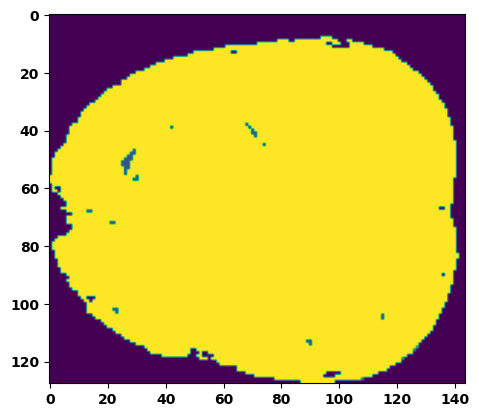

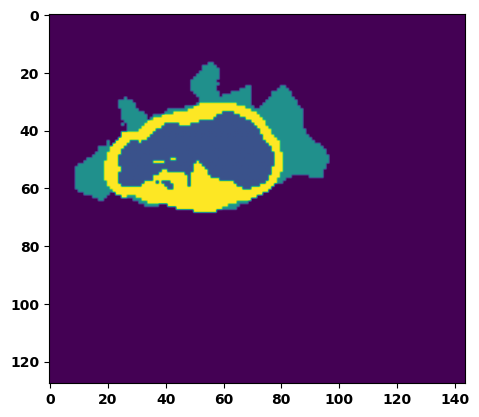

  6%|▌         | 2/36 [00:03<00:52,  1.53s/it]

Batch_id:  1 Eval loss:  0.7628259658813477
Batch_id:  1 Eval IoU:  tensor(0.2252, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9032, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.49s/it]

Batch_id:  2 Eval loss:  0.1994231790304184
Batch_id:  2 Eval IoU:  tensor(0.7300, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.42s/it]

Batch_id:  3 Eval loss:  0.7517285943031311
Batch_id:  3 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.44s/it]

Batch_id:  4 Eval loss:  0.4401136636734009
Batch_id:  4 Eval IoU:  tensor(0.4644, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.41s/it]

Batch_id:  5 Eval loss:  0.8189683556556702
Batch_id:  5 Eval IoU:  tensor(0.1042, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4670, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3082, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2061, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.7561110854148865
Batch_id:  6 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.40552234649658203
Batch_id:  7 Eval IoU:  tensor(0.4925, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9476, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.38s/it]

Batch_id:  8 Eval loss:  0.7749669551849365
Batch_id:  8 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.39s/it]

Batch_id:  9 Eval loss:  0.6815721988677979
Batch_id:  9 Eval IoU:  tensor(0.2882, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  10 Eval loss:  0.06090168654918671
Batch_id:  10 Eval IoU:  tensor(0.8929, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9921, device='cuda:0')


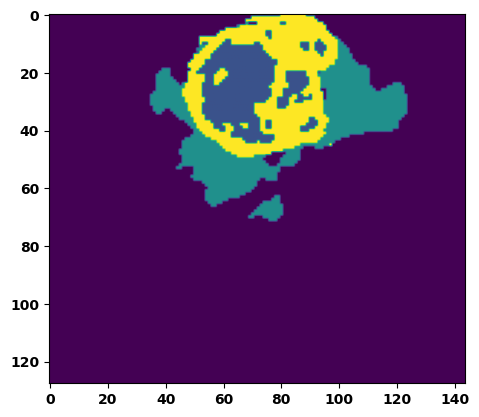

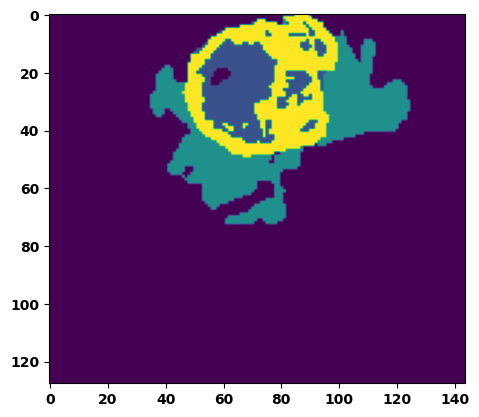

 33%|███▎      | 12/36 [00:17<00:35,  1.46s/it]

Batch_id:  11 Eval loss:  0.901831865310669
Batch_id:  11 Eval IoU:  tensor(0.0579, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.4620, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.3368, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.1930, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.44s/it]

Batch_id:  12 Eval loss:  0.5751824378967285
Batch_id:  12 Eval IoU:  tensor(0.3773, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.54s/it]

Batch_id:  13 Eval loss:  0.4236088991165161
Batch_id:  13 Eval IoU:  tensor(0.4883, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8051, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.7105, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.7091, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9970, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:32,  1.54s/it]

Batch_id:  14 Eval loss:  0.48451846837997437
Batch_id:  14 Eval IoU:  tensor(0.4299, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9807, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:31,  1.55s/it]

Batch_id:  15 Eval loss:  0.18692006170749664
Batch_id:  15 Eval IoU:  tensor(0.7289, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9973, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.51s/it]

Batch_id:  16 Eval loss:  0.20739977061748505
Batch_id:  16 Eval IoU:  tensor(0.6840, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:27,  1.55s/it]

Batch_id:  17 Eval loss:  0.7577539682388306
Batch_id:  17 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:25,  1.48s/it]

Batch_id:  18 Eval loss:  0.7682570219039917
Batch_id:  18 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:24,  1.55s/it]

Batch_id:  19 Eval loss:  0.3322523832321167
Batch_id:  19 Eval IoU:  tensor(0.5556, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9443, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  20 Eval loss:  0.6753064393997192
Batch_id:  20 Eval IoU:  tensor(0.2828, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9445, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9854, device='cuda:0')


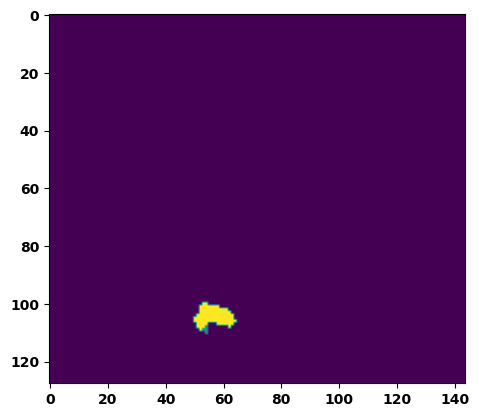

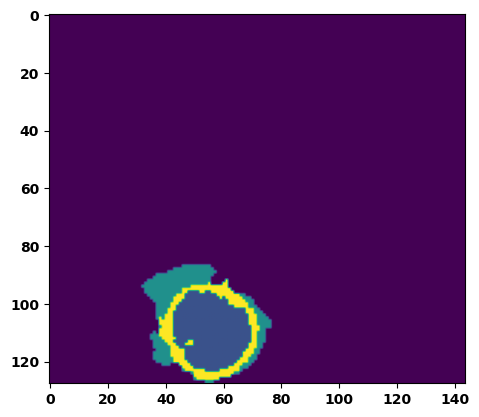

 61%|██████    | 22/36 [00:32<00:21,  1.57s/it]

Batch_id:  21 Eval loss:  0.6891615390777588
Batch_id:  21 Eval IoU:  tensor(0.2410, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8015, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.7695, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.7049, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9451, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.53s/it]

Batch_id:  22 Eval loss:  0.39953479170799255
Batch_id:  22 Eval IoU:  tensor(0.5154, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9270, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.49s/it]

Batch_id:  23 Eval loss:  0.5911260843276978
Batch_id:  23 Eval IoU:  tensor(0.3149, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8553, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8474, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8525, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9474, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.50s/it]

Batch_id:  24 Eval loss:  0.5806499719619751
Batch_id:  24 Eval IoU:  tensor(0.3476, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8850, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8334, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9131, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9298, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.47s/it]

Batch_id:  25 Eval loss:  0.6660588979721069
Batch_id:  25 Eval IoU:  tensor(0.2913, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.50s/it]

Batch_id:  26 Eval loss:  0.8814684152603149
Batch_id:  26 Eval IoU:  tensor(0.0763, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.4989, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.4226, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.2484, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.47s/it]

Batch_id:  27 Eval loss:  0.7373257875442505
Batch_id:  27 Eval IoU:  tensor(0.2203, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8727, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8093, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.8630, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.47s/it]

Batch_id:  28 Eval loss:  0.12663212418556213
Batch_id:  28 Eval IoU:  tensor(0.8071, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:09,  1.51s/it]

Batch_id:  29 Eval loss:  0.4952054023742676
Batch_id:  29 Eval IoU:  tensor(0.4103, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9310, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9265, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  30 Eval loss:  0.6448370218276978
Batch_id:  30 Eval IoU:  tensor(0.3111, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


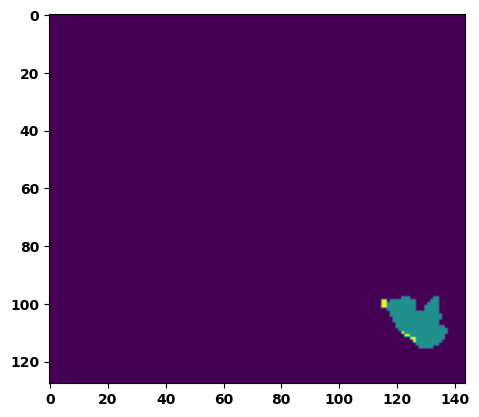

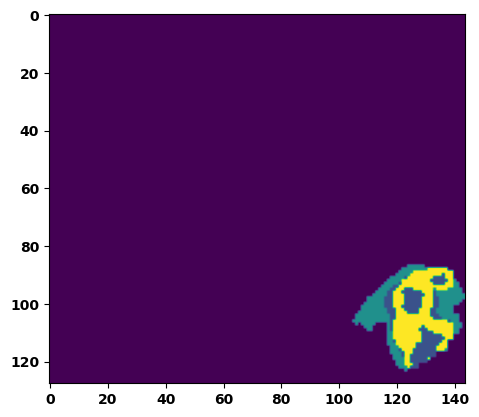

 89%|████████▉ | 32/36 [00:47<00:05,  1.50s/it]

Batch_id:  31 Eval loss:  0.854855477809906
Batch_id:  31 Eval IoU:  tensor(0.0933, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5346, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4419, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8628, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3345, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.48s/it]

Batch_id:  32 Eval loss:  0.8442276120185852
Batch_id:  32 Eval IoU:  tensor(0.0978, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.5347, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3044, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.3541, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9529, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.44s/it]

Batch_id:  33 Eval loss:  0.6774065494537354
Batch_id:  33 Eval IoU:  tensor(0.2700, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8930, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9652, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.48s/it]

Batch_id:  34 Eval loss:  0.6163661479949951
Batch_id:  34 Eval IoU:  tensor(0.3292, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.49s/it]

Batch_id:  35 Eval loss:  0.5971225500106812
Batch_id:  35 Eval IoU:  tensor(0.3473, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9861, device='cuda:0')
Epoch  28 Training loss:  0.13588673621416092
Epoch  28 Evaluation loss:  0.5892306889096895
Epoch  28 Training accuracy :  tensor(0.7989)
Epoch  28 Evaluation accuracy :  tensor(0.3527)
Epoch  28 Training Mean Dice Score:  tensor(0.9842)
Epoch  28 Eval Mean Dice Score:  tensor(0.8654)
Epoch  28 Training Non-tumor Dice Score:  tensor(0.9852)
Epoch  28 Eval Non-tumor Dice Score:  tensor(0.8263)
Epoch  28 Training NCR/NET Dice Score:  tensor(0.9930)
Epoch  28 Eval NCR/NET Dice Score:  tensor(0.9711)
Epoch  28 Training ED Dice Score:  tensor(0.98

Epoch: 29
Training in session: 


  1%|          | 1/110 [00:01<02:37,  1.44s/it]

Batch_id:  0 Training loss:  0.1300823986530304
Batch_id:  0 Training IoU:  tensor(0.8154, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:51,  1.59s/it]

Batch_id:  1 Training loss:  0.09257066249847412
Batch_id:  1 Training IoU:  tensor(0.8409, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:46,  1.56s/it]

Batch_id:  2 Training loss:  0.2440018653869629
Batch_id:  2 Training IoU:  tensor(0.6979, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:40,  1.51s/it]

Batch_id:  3 Training loss:  0.09233510494232178
Batch_id:  3 Training IoU:  tensor(0.8440, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:35,  1.48s/it]

Batch_id:  4 Training loss:  0.22672632336616516
Batch_id:  4 Training IoU:  tensor(0.6986, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:33,  1.48s/it]

Batch_id:  5 Training loss:  0.11721427738666534
Batch_id:  5 Training IoU:  tensor(0.8058, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:38,  1.54s/it]

Batch_id:  6 Training loss:  0.10670921206474304
Batch_id:  6 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:35,  1.52s/it]

Batch_id:  7 Training loss:  0.22421960532665253
Batch_id:  7 Training IoU:  tensor(0.6839, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:37,  1.56s/it]

Batch_id:  8 Training loss:  0.22628387808799744
Batch_id:  8 Training IoU:  tensor(0.6733, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9634, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:24,  1.45s/it]

Batch_id:  9 Training loss:  0.05603630840778351
Batch_id:  9 Training IoU:  tensor(0.9022, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 10%|█         | 11/110 [00:16<02:25,  1.47s/it]

Batch_id:  10 Training loss:  0.3695244789123535
Batch_id:  10 Training IoU:  tensor(0.5465, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


 11%|█         | 12/110 [00:18<02:33,  1.57s/it]

Batch_id:  11 Training loss:  0.10244017839431763
Batch_id:  11 Training IoU:  tensor(0.8358, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:27,  1.52s/it]

Batch_id:  12 Training loss:  0.11497712135314941
Batch_id:  12 Training IoU:  tensor(0.8121, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:26,  1.53s/it]

Batch_id:  13 Training loss:  0.06719864904880524
Batch_id:  13 Training IoU:  tensor(0.8853, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:27,  1.55s/it]

Batch_id:  14 Training loss:  0.23692798614501953
Batch_id:  14 Training IoU:  tensor(0.7009, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9845, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:25,  1.55s/it]

Batch_id:  15 Training loss:  0.050137415528297424
Batch_id:  15 Training IoU:  tensor(0.9187, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:22,  1.53s/it]

Batch_id:  16 Training loss:  0.08882719278335571
Batch_id:  16 Training IoU:  tensor(0.8500, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:17,  1.50s/it]

Batch_id:  17 Training loss:  0.08366870880126953
Batch_id:  17 Training IoU:  tensor(0.8611, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:18,  1.52s/it]

Batch_id:  18 Training loss:  0.20956118404865265
Batch_id:  18 Training IoU:  tensor(0.7132, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:14,  1.50s/it]

Batch_id:  19 Training loss:  0.2831750810146332
Batch_id:  19 Training IoU:  tensor(0.6138, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:10,  1.47s/it]

Batch_id:  20 Training loss:  0.19503703713417053
Batch_id:  20 Training IoU:  tensor(0.7066, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 20%|██        | 22/110 [00:33<02:09,  1.47s/it]

Batch_id:  21 Training loss:  0.19857625663280487
Batch_id:  21 Training IoU:  tensor(0.7023, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 21%|██        | 23/110 [00:34<02:07,  1.46s/it]

Batch_id:  22 Training loss:  0.05901314318180084
Batch_id:  22 Training IoU:  tensor(0.8979, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:04,  1.45s/it]

Batch_id:  23 Training loss:  0.13274559378623962
Batch_id:  23 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:03,  1.45s/it]

Batch_id:  24 Training loss:  0.14191503822803497
Batch_id:  24 Training IoU:  tensor(0.7824, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9731, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:00,  1.43s/it]

Batch_id:  25 Training loss:  0.14777208864688873
Batch_id:  25 Training IoU:  tensor(0.7981, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 25%|██▍       | 27/110 [00:40<01:56,  1.41s/it]

Batch_id:  26 Training loss:  0.10948960483074188
Batch_id:  26 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:56,  1.42s/it]

Batch_id:  27 Training loss:  0.08364120125770569
Batch_id:  27 Training IoU:  tensor(0.8546, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 26%|██▋       | 29/110 [00:43<01:55,  1.43s/it]

Batch_id:  28 Training loss:  0.26548582315444946
Batch_id:  28 Training IoU:  tensor(0.6573, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:54,  1.43s/it]

Batch_id:  29 Training loss:  0.19066721200942993
Batch_id:  29 Training IoU:  tensor(0.7163, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:52,  1.42s/it]

Batch_id:  30 Training loss:  0.12988723814487457
Batch_id:  30 Training IoU:  tensor(0.7869, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:50,  1.42s/it]

Batch_id:  31 Training loss:  0.18737339973449707
Batch_id:  31 Training IoU:  tensor(0.7099, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 30%|███       | 33/110 [00:48<01:51,  1.45s/it]

Batch_id:  32 Training loss:  0.07133755087852478
Batch_id:  32 Training IoU:  tensor(0.8821, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 31%|███       | 34/110 [00:50<01:53,  1.49s/it]

Batch_id:  33 Training loss:  0.06882458925247192
Batch_id:  33 Training IoU:  tensor(0.8926, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:52,  1.50s/it]

Batch_id:  34 Training loss:  0.1452805995941162
Batch_id:  34 Training IoU:  tensor(0.7792, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:46,  1.44s/it]

Batch_id:  35 Training loss:  0.1861901432275772
Batch_id:  35 Training IoU:  tensor(0.7634, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:43,  1.42s/it]

Batch_id:  36 Training loss:  0.1843407154083252
Batch_id:  36 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:43,  1.44s/it]

Batch_id:  37 Training loss:  0.08355234563350677
Batch_id:  37 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:43,  1.46s/it]

Batch_id:  38 Training loss:  0.0640554279088974
Batch_id:  38 Training IoU:  tensor(0.8918, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:44,  1.50s/it]

Batch_id:  39 Training loss:  0.05941225588321686
Batch_id:  39 Training IoU:  tensor(0.8999, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:43,  1.50s/it]

Batch_id:  40 Training loss:  0.06413060426712036
Batch_id:  40 Training IoU:  tensor(0.8899, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:37,  1.44s/it]

Batch_id:  41 Training loss:  0.15117543935775757
Batch_id:  41 Training IoU:  tensor(0.7766, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:38,  1.47s/it]

Batch_id:  42 Training loss:  0.0800105482339859
Batch_id:  42 Training IoU:  tensor(0.8859, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 40%|████      | 44/110 [01:05<01:37,  1.48s/it]

Batch_id:  43 Training loss:  0.11961618065834045
Batch_id:  43 Training IoU:  tensor(0.8003, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 41%|████      | 45/110 [01:06<01:33,  1.43s/it]

Batch_id:  44 Training loss:  0.32236379384994507
Batch_id:  44 Training IoU:  tensor(0.6266, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:29,  1.40s/it]

Batch_id:  45 Training loss:  0.1293259859085083
Batch_id:  45 Training IoU:  tensor(0.7880, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:28,  1.40s/it]

Batch_id:  46 Training loss:  0.22427408397197723
Batch_id:  46 Training IoU:  tensor(0.6946, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:28,  1.43s/it]

Batch_id:  47 Training loss:  0.08090952038764954
Batch_id:  47 Training IoU:  tensor(0.9299, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:25,  1.40s/it]

Batch_id:  48 Training loss:  0.13206987082958221
Batch_id:  48 Training IoU:  tensor(0.7973, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:26,  1.44s/it]

Batch_id:  49 Training loss:  0.11626362800598145
Batch_id:  49 Training IoU:  tensor(0.8195, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:23,  1.42s/it]

Batch_id:  50 Training loss:  0.08283017575740814
Batch_id:  50 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:19,  1.37s/it]

Batch_id:  51 Training loss:  0.06416991353034973
Batch_id:  51 Training IoU:  tensor(0.8891, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:25,  1.49s/it]

Batch_id:  52 Training loss:  0.11310262978076935
Batch_id:  52 Training IoU:  tensor(0.8266, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:21,  1.46s/it]

Batch_id:  53 Training loss:  0.1301276832818985
Batch_id:  53 Training IoU:  tensor(0.7937, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:20,  1.46s/it]

Batch_id:  54 Training loss:  0.2004481852054596
Batch_id:  54 Training IoU:  tensor(0.6927, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9760, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:19,  1.47s/it]

Batch_id:  55 Training loss:  0.05666503310203552
Batch_id:  55 Training IoU:  tensor(0.9016, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:18,  1.48s/it]

Batch_id:  56 Training loss:  0.07762664556503296
Batch_id:  56 Training IoU:  tensor(0.8711, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:18,  1.52s/it]

Batch_id:  57 Training loss:  0.10901066660881042
Batch_id:  57 Training IoU:  tensor(0.8243, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:17,  1.53s/it]

Batch_id:  58 Training loss:  0.23126867413520813
Batch_id:  58 Training IoU:  tensor(0.6778, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:12,  1.46s/it]

Batch_id:  59 Training loss:  0.08516739308834076
Batch_id:  59 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:10,  1.44s/it]

Batch_id:  60 Training loss:  0.16903093457221985
Batch_id:  60 Training IoU:  tensor(0.7276, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:10,  1.46s/it]

Batch_id:  61 Training loss:  0.14073769748210907
Batch_id:  61 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:08,  1.45s/it]

Batch_id:  62 Training loss:  0.0708625465631485
Batch_id:  62 Training IoU:  tensor(0.8783, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:03,  1.39s/it]

Batch_id:  63 Training loss:  0.14684998989105225
Batch_id:  63 Training IoU:  tensor(0.7613, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:04,  1.42s/it]

Batch_id:  64 Training loss:  0.09815748035907745
Batch_id:  64 Training IoU:  tensor(0.8369, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:04,  1.46s/it]

Batch_id:  65 Training loss:  0.03244546055793762
Batch_id:  65 Training IoU:  tensor(0.9440, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.47s/it]

Batch_id:  66 Training loss:  0.10270708799362183
Batch_id:  66 Training IoU:  tensor(0.8246, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:00,  1.44s/it]

Batch_id:  67 Training loss:  0.09668044745922089
Batch_id:  67 Training IoU:  tensor(0.8394, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:00,  1.49s/it]

Batch_id:  68 Training loss:  0.10807235538959503
Batch_id:  68 Training IoU:  tensor(0.8504, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:58,  1.47s/it]

Batch_id:  69 Training loss:  0.14543607831001282
Batch_id:  69 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:58,  1.49s/it]

Batch_id:  70 Training loss:  0.17045286297798157
Batch_id:  70 Training IoU:  tensor(0.7399, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:56,  1.49s/it]

Batch_id:  71 Training loss:  0.22125612199306488
Batch_id:  71 Training IoU:  tensor(0.7143, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:54,  1.48s/it]

Batch_id:  72 Training loss:  0.11397357285022736
Batch_id:  72 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:52,  1.47s/it]

Batch_id:  73 Training loss:  0.32087498903274536
Batch_id:  73 Training IoU:  tensor(0.5937, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:50,  1.45s/it]

Batch_id:  74 Training loss:  0.22503909468650818
Batch_id:  74 Training IoU:  tensor(0.7367, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:47,  1.41s/it]

Batch_id:  75 Training loss:  0.07673805952072144
Batch_id:  75 Training IoU:  tensor(0.8704, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:46,  1.42s/it]

Batch_id:  76 Training loss:  0.07408864796161652
Batch_id:  76 Training IoU:  tensor(0.8707, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:45,  1.41s/it]

Batch_id:  77 Training loss:  0.11002837121486664
Batch_id:  77 Training IoU:  tensor(0.8295, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:46,  1.50s/it]

Batch_id:  78 Training loss:  0.10859842598438263
Batch_id:  78 Training IoU:  tensor(0.8225, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:43,  1.44s/it]

Batch_id:  79 Training loss:  0.15537714958190918
Batch_id:  79 Training IoU:  tensor(0.7572, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:40,  1.40s/it]

Batch_id:  80 Training loss:  0.09940919280052185
Batch_id:  80 Training IoU:  tensor(0.8350, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:40,  1.44s/it]

Batch_id:  81 Training loss:  0.15670940279960632
Batch_id:  81 Training IoU:  tensor(0.7484, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:38,  1.44s/it]

Batch_id:  82 Training loss:  0.14005303382873535
Batch_id:  82 Training IoU:  tensor(0.7749, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:38,  1.47s/it]

Batch_id:  83 Training loss:  0.16556814312934875
Batch_id:  83 Training IoU:  tensor(0.7402, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:37,  1.49s/it]

Batch_id:  84 Training loss:  0.17622321844100952
Batch_id:  84 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:35,  1.46s/it]

Batch_id:  85 Training loss:  0.06622128188610077
Batch_id:  85 Training IoU:  tensor(0.9225, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:34,  1.48s/it]

Batch_id:  86 Training loss:  0.2480781376361847
Batch_id:  86 Training IoU:  tensor(0.6648, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:32,  1.50s/it]

Batch_id:  87 Training loss:  0.11940929293632507
Batch_id:  87 Training IoU:  tensor(0.7987, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9784, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:32,  1.55s/it]

Batch_id:  88 Training loss:  0.2514396905899048
Batch_id:  88 Training IoU:  tensor(0.6827, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:28,  1.44s/it]

Batch_id:  89 Training loss:  0.08415566384792328
Batch_id:  89 Training IoU:  tensor(0.8590, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.1393895149230957
Batch_id:  90 Training IoU:  tensor(0.7692, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:26,  1.46s/it]

Batch_id:  91 Training loss:  0.15571844577789307
Batch_id:  91 Training IoU:  tensor(0.7528, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:24,  1.44s/it]

Batch_id:  92 Training loss:  0.10847051441669464
Batch_id:  92 Training IoU:  tensor(0.8149, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:22,  1.44s/it]

Batch_id:  93 Training loss:  0.14047707617282867
Batch_id:  93 Training IoU:  tensor(0.7959, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:21,  1.46s/it]

Batch_id:  94 Training loss:  0.07508598268032074
Batch_id:  94 Training IoU:  tensor(0.8712, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:21,  1.54s/it]

Batch_id:  95 Training loss:  0.08000448346138
Batch_id:  95 Training IoU:  tensor(0.8641, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.51s/it]

Batch_id:  96 Training loss:  0.08398608863353729
Batch_id:  96 Training IoU:  tensor(0.8570, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.11838088929653168
Batch_id:  97 Training IoU:  tensor(0.8082, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.52s/it]

Batch_id:  98 Training loss:  0.0947909951210022
Batch_id:  98 Training IoU:  tensor(0.8357, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:15,  1.50s/it]

Batch_id:  99 Training loss:  0.19148516654968262
Batch_id:  99 Training IoU:  tensor(0.7292, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 92%|█████████▏| 101/110 [02:28<00:13,  1.53s/it]

Batch_id:  100 Training loss:  0.06619022786617279
Batch_id:  100 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:12,  1.50s/it]

Batch_id:  101 Training loss:  0.0981149822473526
Batch_id:  101 Training IoU:  tensor(0.8406, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9975, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.52s/it]

Batch_id:  102 Training loss:  0.145172581076622
Batch_id:  102 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.49s/it]

Batch_id:  103 Training loss:  0.057007089257240295
Batch_id:  103 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.45s/it]

Batch_id:  104 Training loss:  0.1471790373325348
Batch_id:  104 Training IoU:  tensor(0.7625, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9596, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.05632080137729645
Batch_id:  105 Training IoU:  tensor(0.9042, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.43s/it]

Batch_id:  106 Training loss:  0.14932991564273834
Batch_id:  106 Training IoU:  tensor(0.7625, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9799, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:02,  1.47s/it]

Batch_id:  107 Training loss:  0.252360999584198
Batch_id:  107 Training IoU:  tensor(0.6912, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.55s/it]

Batch_id:  108 Training loss:  0.13573651015758514
Batch_id:  108 Training IoU:  tensor(0.8023, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.04710771143436432
Batch_id:  109 Training IoU:  tensor(0.9208, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9956, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.1316763162612915
Batch_id:  0 Eval IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


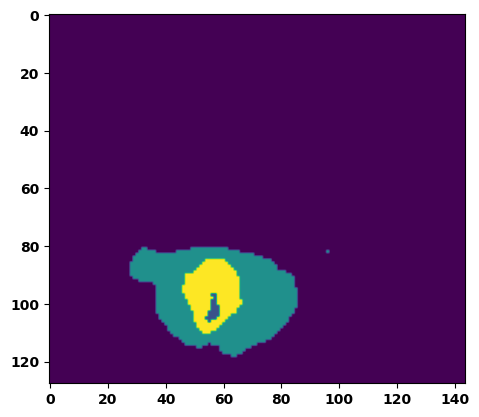

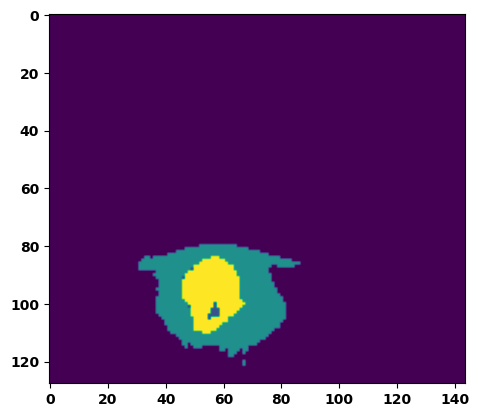

  6%|▌         | 2/36 [00:02<00:50,  1.48s/it]

Batch_id:  1 Eval loss:  0.1363981068134308
Batch_id:  1 Eval IoU:  tensor(0.7856, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.40s/it]

Batch_id:  2 Eval loss:  0.7469343543052673
Batch_id:  2 Eval IoU:  tensor(0.1681, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6551, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5482, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.4960, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9469, device='cuda:0')


 11%|█         | 4/36 [00:05<00:47,  1.47s/it]

Batch_id:  3 Eval loss:  0.058245450258255005
Batch_id:  3 Eval IoU:  tensor(0.8969, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:47,  1.55s/it]

Batch_id:  4 Eval loss:  0.8814073801040649
Batch_id:  4 Eval IoU:  tensor(0.0763, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.4989, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4225, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2483, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:45,  1.53s/it]

Batch_id:  5 Eval loss:  0.2032148838043213
Batch_id:  5 Eval IoU:  tensor(0.6894, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.44s/it]

Batch_id:  6 Eval loss:  0.6552031636238098
Batch_id:  6 Eval IoU:  tensor(0.2944, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9218, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9755, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.45s/it]

Batch_id:  7 Eval loss:  0.8432468771934509
Batch_id:  7 Eval IoU:  tensor(0.0963, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.5322, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3928, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9490, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.2988, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.7517242431640625
Batch_id:  8 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.43s/it]

Batch_id:  9 Eval loss:  0.6205978393554688
Batch_id:  9 Eval IoU:  tensor(0.3248, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval loss:  0.5881240367889404
Batch_id:  10 Eval IoU:  tensor(0.3112, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8037, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.7174, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.7658, device='cuda:0')


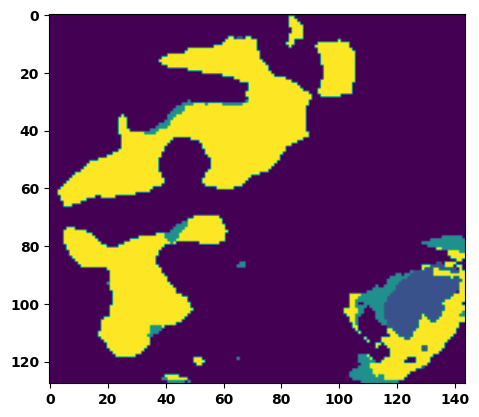

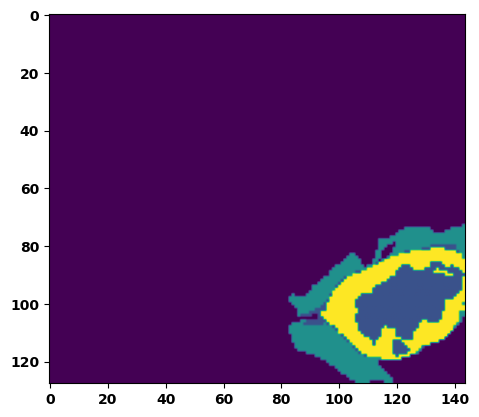

 33%|███▎      | 12/36 [00:17<00:36,  1.50s/it]

Batch_id:  11 Eval loss:  0.5856865644454956
Batch_id:  11 Eval IoU:  tensor(0.2867, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.6427, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4952, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.5124, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9701, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:33,  1.47s/it]

Batch_id:  12 Eval loss:  0.23442398011684418
Batch_id:  12 Eval IoU:  tensor(0.6486, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.46s/it]

Batch_id:  13 Eval loss:  0.35401707887649536
Batch_id:  13 Eval IoU:  tensor(0.5303, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9937, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.5987077355384827
Batch_id:  14 Eval IoU:  tensor(0.3505, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.44s/it]

Batch_id:  15 Eval loss:  0.5196890830993652
Batch_id:  15 Eval IoU:  tensor(0.4169, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9482, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.42s/it]

Batch_id:  16 Eval loss:  0.6925289034843445
Batch_id:  16 Eval IoU:  tensor(0.2286, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7832, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.6877, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.6881, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9876, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.45s/it]

Batch_id:  17 Eval loss:  0.10512435436248779
Batch_id:  17 Eval IoU:  tensor(0.8332, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.47s/it]

Batch_id:  18 Eval loss:  0.6808940172195435
Batch_id:  18 Eval IoU:  tensor(0.2181, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.6591, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.5755, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8737, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.6057, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:24,  1.52s/it]

Batch_id:  19 Eval loss:  0.5266571044921875
Batch_id:  19 Eval IoU:  tensor(0.3766, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  20 Eval loss:  0.7576276063919067
Batch_id:  20 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


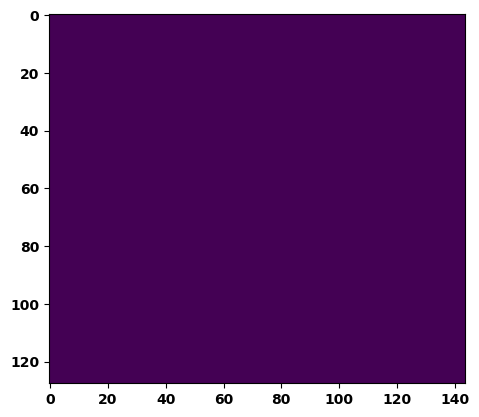

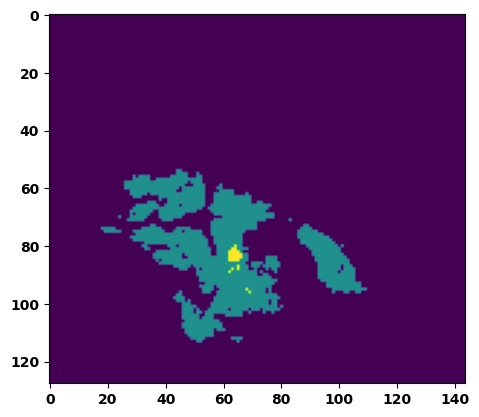

 61%|██████    | 22/36 [00:32<00:21,  1.56s/it]

Batch_id:  21 Eval loss:  0.4289212226867676
Batch_id:  21 Eval IoU:  tensor(0.4980, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9467, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.50s/it]

Batch_id:  22 Eval loss:  0.10197380185127258
Batch_id:  22 Eval IoU:  tensor(0.8295, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.52s/it]

Batch_id:  23 Eval loss:  0.7559921741485596
Batch_id:  23 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.8556438684463501
Batch_id:  24 Eval IoU:  tensor(0.0927, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.5335, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4403, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8629, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.3303, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.902111291885376
Batch_id:  25 Eval IoU:  tensor(0.0577, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4615, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.3361, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.1923, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.48s/it]

Batch_id:  26 Eval loss:  0.5992796421051025
Batch_id:  26 Eval IoU:  tensor(0.3496, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.44s/it]

Batch_id:  27 Eval loss:  0.8940061926841736
Batch_id:  27 Eval IoU:  tensor(0.0614, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.4698, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.2138, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9074, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.7603, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.5278, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.44s/it]

Batch_id:  28 Eval loss:  0.34083184599876404
Batch_id:  28 Eval IoU:  tensor(0.5363, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9435, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.40s/it]

Batch_id:  29 Eval loss:  0.7682723999023438
Batch_id:  29 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  30 Eval loss:  0.8157922029495239
Batch_id:  30 Eval IoU:  tensor(0.1072, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4659, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.3054, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9421, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.2025, device='cuda:0')


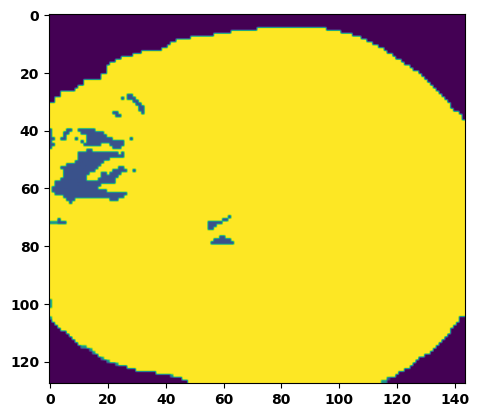

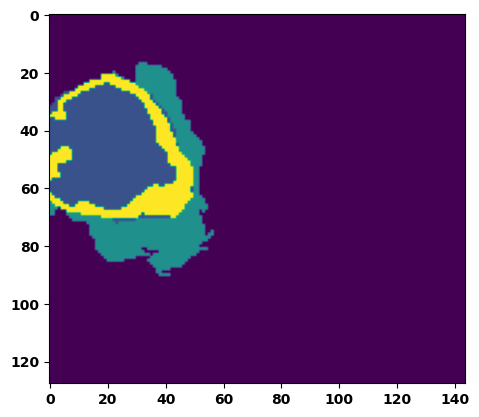

 89%|████████▉ | 32/36 [00:47<00:05,  1.45s/it]

Batch_id:  31 Eval loss:  0.7749237418174744
Batch_id:  31 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.48s/it]

Batch_id:  32 Eval loss:  0.4630860686302185
Batch_id:  32 Eval IoU:  tensor(0.4371, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7576, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.6404, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6875, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9924, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.49s/it]

Batch_id:  33 Eval loss:  0.6130829453468323
Batch_id:  33 Eval IoU:  tensor(0.3276, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9107, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8711, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.48s/it]

Batch_id:  34 Eval loss:  0.5126422643661499
Batch_id:  34 Eval IoU:  tensor(0.3943, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9094, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9200, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9190, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.49s/it]

Batch_id:  35 Eval loss:  0.3269917964935303
Batch_id:  35 Eval IoU:  tensor(0.6202, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')
Epoch  29 Training loss:  0.1357704999771985
Epoch  29 Evaluation loss:  0.5507133483058877
Epoch  29 Training accuracy :  tensor(0.7988)
Epoch  29 Evaluation accuracy :  tensor(0.3826)
Epoch  29 Training Mean Dice Score:  tensor(0.9842)
Epoch  29 Eval Mean Dice Score:  tensor(0.8410)
Epoch  29 Training Non-tumor Dice Score:  tensor(0.9853)
Epoch  29 Eval Non-tumor Dice Score:  tensor(0.7940)
Epoch  29 Training NCR/NET Dice Score:  tensor(0.9929)
Epoch  29 Eval NCR/NET Dice Score:  tensor(0.9701)
Epoch  29 Training ED Dice Score:  tensor(0.982

Epoch completed and model successfully saved
Epoch: 30
Training in session: 


  1%|          | 1/110 [00:01<02:48,  1.55s/it]

Batch_id:  0 Training loss:  0.11376848816871643
Batch_id:  0 Training IoU:  tensor(0.8215, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:58,  1.65s/it]

Batch_id:  1 Training loss:  0.08504655957221985
Batch_id:  1 Training IoU:  tensor(0.9163, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:54,  1.63s/it]

Batch_id:  2 Training loss:  0.11871969699859619
Batch_id:  2 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:47,  1.58s/it]

Batch_id:  3 Training loss:  0.14154422283172607
Batch_id:  3 Training IoU:  tensor(0.7819, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9733, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:41,  1.54s/it]

Batch_id:  4 Training loss:  0.2283848226070404
Batch_id:  4 Training IoU:  tensor(0.6958, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:46,  1.60s/it]

Batch_id:  5 Training loss:  0.1306568831205368
Batch_id:  5 Training IoU:  tensor(0.8088, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  6%|▋         | 7/110 [00:11<02:40,  1.56s/it]

Batch_id:  6 Training loss:  0.09786839783191681
Batch_id:  6 Training IoU:  tensor(0.8383, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:40,  1.57s/it]

Batch_id:  7 Training loss:  0.1029406487941742
Batch_id:  7 Training IoU:  tensor(0.8310, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  8%|▊         | 9/110 [00:14<02:35,  1.54s/it]

Batch_id:  8 Training loss:  0.0902220606803894
Batch_id:  8 Training IoU:  tensor(0.8473, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:35,  1.56s/it]

Batch_id:  9 Training loss:  0.06772656738758087
Batch_id:  9 Training IoU:  tensor(0.8966, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 10%|█         | 11/110 [00:17<02:33,  1.55s/it]

Batch_id:  10 Training loss:  0.2131737619638443
Batch_id:  10 Training IoU:  tensor(0.7100, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 11%|█         | 12/110 [00:19<02:39,  1.62s/it]

Batch_id:  11 Training loss:  0.057956546545028687
Batch_id:  11 Training IoU:  tensor(0.9015, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 12%|█▏        | 13/110 [00:20<02:34,  1.59s/it]

Batch_id:  12 Training loss:  0.1436558961868286
Batch_id:  12 Training IoU:  tensor(0.7906, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 13%|█▎        | 14/110 [00:22<02:33,  1.59s/it]

Batch_id:  13 Training loss:  0.07218584418296814
Batch_id:  13 Training IoU:  tensor(0.9118, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 14%|█▎        | 15/110 [00:23<02:30,  1.58s/it]

Batch_id:  14 Training loss:  0.15530742704868317
Batch_id:  14 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 15%|█▍        | 16/110 [00:25<02:30,  1.60s/it]

Batch_id:  15 Training loss:  0.12258440256118774
Batch_id:  15 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 15%|█▌        | 17/110 [00:26<02:22,  1.53s/it]

Batch_id:  16 Training loss:  0.07371315360069275
Batch_id:  16 Training IoU:  tensor(0.8736, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9904, device='cuda:0')


 16%|█▋        | 18/110 [00:28<02:18,  1.50s/it]

Batch_id:  17 Training loss:  0.07132238149642944
Batch_id:  17 Training IoU:  tensor(0.8777, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 17%|█▋        | 19/110 [00:29<02:21,  1.56s/it]

Batch_id:  18 Training loss:  0.16240869462490082
Batch_id:  18 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 18%|█▊        | 20/110 [00:31<02:19,  1.55s/it]

Batch_id:  19 Training loss:  0.21486695110797882
Batch_id:  19 Training IoU:  tensor(0.7642, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:19,  1.57s/it]

Batch_id:  20 Training loss:  0.2036629021167755
Batch_id:  20 Training IoU:  tensor(0.6893, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9468, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9770, device='cuda:0')


 20%|██        | 22/110 [00:34<02:19,  1.58s/it]

Batch_id:  21 Training loss:  0.10185547173023224
Batch_id:  21 Training IoU:  tensor(0.8370, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 21%|██        | 23/110 [00:36<02:20,  1.62s/it]

Batch_id:  22 Training loss:  0.05481277406215668
Batch_id:  22 Training IoU:  tensor(0.9067, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 22%|██▏       | 24/110 [00:37<02:16,  1.58s/it]

Batch_id:  23 Training loss:  0.12076427042484283
Batch_id:  23 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 23%|██▎       | 25/110 [00:39<02:12,  1.56s/it]

Batch_id:  24 Training loss:  0.10472048819065094
Batch_id:  24 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 24%|██▎       | 26/110 [00:40<02:10,  1.55s/it]

Batch_id:  25 Training loss:  0.16128775477409363
Batch_id:  25 Training IoU:  tensor(0.7471, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 25%|██▍       | 27/110 [00:42<02:09,  1.56s/it]

Batch_id:  26 Training loss:  0.08732356131076813
Batch_id:  26 Training IoU:  tensor(0.8524, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 25%|██▌       | 28/110 [00:43<02:04,  1.52s/it]

Batch_id:  27 Training loss:  0.13875693082809448
Batch_id:  27 Training IoU:  tensor(0.7782, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 26%|██▋       | 29/110 [00:45<02:00,  1.48s/it]

Batch_id:  28 Training loss:  0.16632317006587982
Batch_id:  28 Training IoU:  tensor(0.7473, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 27%|██▋       | 30/110 [00:46<01:56,  1.46s/it]

Batch_id:  29 Training loss:  0.05775138735771179
Batch_id:  29 Training IoU:  tensor(0.9005, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 28%|██▊       | 31/110 [00:48<01:56,  1.47s/it]

Batch_id:  30 Training loss:  0.0646020919084549
Batch_id:  30 Training IoU:  tensor(0.8897, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 29%|██▉       | 32/110 [00:49<01:52,  1.44s/it]

Batch_id:  31 Training loss:  0.10988351702690125
Batch_id:  31 Training IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 30%|███       | 33/110 [00:50<01:51,  1.45s/it]

Batch_id:  32 Training loss:  0.13750682771205902
Batch_id:  32 Training IoU:  tensor(0.7727, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 31%|███       | 34/110 [00:52<01:47,  1.42s/it]

Batch_id:  33 Training loss:  0.14847631752490997
Batch_id:  33 Training IoU:  tensor(0.7723, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 32%|███▏      | 35/110 [00:53<01:46,  1.42s/it]

Batch_id:  34 Training loss:  0.24505457282066345
Batch_id:  34 Training IoU:  tensor(0.7004, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:40,  1.35s/it]

Batch_id:  35 Training loss:  0.15556125342845917
Batch_id:  35 Training IoU:  tensor(0.7506, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9812, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:38,  1.35s/it]

Batch_id:  36 Training loss:  0.11570271849632263
Batch_id:  36 Training IoU:  tensor(0.8170, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:37,  1.36s/it]

Batch_id:  37 Training loss:  0.15100312232971191
Batch_id:  37 Training IoU:  tensor(0.7759, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:36,  1.37s/it]

Batch_id:  38 Training loss:  0.12850256264209747
Batch_id:  38 Training IoU:  tensor(0.8163, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:36,  1.38s/it]

Batch_id:  39 Training loss:  0.12382392585277557
Batch_id:  39 Training IoU:  tensor(0.7941, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 37%|███▋      | 41/110 [01:02<01:39,  1.44s/it]

Batch_id:  40 Training loss:  0.18873684108257294
Batch_id:  40 Training IoU:  tensor(0.7070, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:41,  1.49s/it]

Batch_id:  41 Training loss:  0.046619802713394165
Batch_id:  41 Training IoU:  tensor(0.9221, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 39%|███▉      | 43/110 [01:05<01:40,  1.50s/it]

Batch_id:  42 Training loss:  0.11336106061935425
Batch_id:  42 Training IoU:  tensor(0.8132, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 40%|████      | 44/110 [01:06<01:39,  1.51s/it]

Batch_id:  43 Training loss:  0.2586488425731659
Batch_id:  43 Training IoU:  tensor(0.6645, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 41%|████      | 45/110 [01:08<01:36,  1.49s/it]

Batch_id:  44 Training loss:  0.14591458439826965
Batch_id:  44 Training IoU:  tensor(0.7622, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:35,  1.49s/it]

Batch_id:  45 Training loss:  0.1528581827878952
Batch_id:  45 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:31,  1.45s/it]

Batch_id:  46 Training loss:  0.05482201278209686
Batch_id:  46 Training IoU:  tensor(0.9044, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.09620010852813721
Batch_id:  47 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:27,  1.44s/it]

Batch_id:  48 Training loss:  0.11004382371902466
Batch_id:  48 Training IoU:  tensor(0.8224, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 45%|████▌     | 50/110 [01:15<01:24,  1.41s/it]

Batch_id:  49 Training loss:  0.07720975577831268
Batch_id:  49 Training IoU:  tensor(0.8720, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:22,  1.39s/it]

Batch_id:  50 Training loss:  0.17832212150096893
Batch_id:  50 Training IoU:  tensor(0.7446, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:19,  1.37s/it]

Batch_id:  51 Training loss:  0.15316635370254517
Batch_id:  51 Training IoU:  tensor(0.7593, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9903, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:18,  1.38s/it]

Batch_id:  52 Training loss:  0.23726189136505127
Batch_id:  52 Training IoU:  tensor(0.7075, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:17,  1.38s/it]

Batch_id:  53 Training loss:  0.10204674303531647
Batch_id:  53 Training IoU:  tensor(0.8286, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:17,  1.41s/it]

Batch_id:  54 Training loss:  0.10924263298511505
Batch_id:  54 Training IoU:  tensor(0.8337, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:17,  1.44s/it]

Batch_id:  55 Training loss:  0.08423136174678802
Batch_id:  55 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:14,  1.40s/it]

Batch_id:  56 Training loss:  0.3154348134994507
Batch_id:  56 Training IoU:  tensor(0.6001, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:15,  1.44s/it]

Batch_id:  57 Training loss:  0.06561103463172913
Batch_id:  57 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:12,  1.43s/it]

Batch_id:  58 Training loss:  0.28550201654434204
Batch_id:  58 Training IoU:  tensor(0.6131, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 55%|█████▍    | 60/110 [01:29<01:11,  1.43s/it]

Batch_id:  59 Training loss:  0.05927325785160065
Batch_id:  59 Training IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:08,  1.41s/it]

Batch_id:  60 Training loss:  0.1008303314447403
Batch_id:  60 Training IoU:  tensor(0.8317, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 56%|█████▋    | 62/110 [01:32<01:07,  1.40s/it]

Batch_id:  61 Training loss:  0.2033754140138626
Batch_id:  61 Training IoU:  tensor(0.6909, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:07,  1.43s/it]

Batch_id:  62 Training loss:  0.07074333727359772
Batch_id:  62 Training IoU:  tensor(0.8825, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:05,  1.41s/it]

Batch_id:  63 Training loss:  0.055527642369270325
Batch_id:  63 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:01,  1.37s/it]

Batch_id:  64 Training loss:  0.24932800233364105
Batch_id:  64 Training IoU:  tensor(0.6874, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 60%|██████    | 66/110 [01:37<00:59,  1.35s/it]

Batch_id:  65 Training loss:  0.11889930069446564
Batch_id:  65 Training IoU:  tensor(0.8013, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 61%|██████    | 67/110 [01:38<00:58,  1.37s/it]

Batch_id:  66 Training loss:  0.13308577239513397
Batch_id:  66 Training IoU:  tensor(0.7936, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<00:58,  1.38s/it]

Batch_id:  67 Training loss:  0.05434192717075348
Batch_id:  67 Training IoU:  tensor(0.9064, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<00:56,  1.38s/it]

Batch_id:  68 Training loss:  0.32531535625457764
Batch_id:  68 Training IoU:  tensor(0.6231, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:55,  1.40s/it]

Batch_id:  69 Training loss:  0.08577841520309448
Batch_id:  69 Training IoU:  tensor(0.8542, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:54,  1.40s/it]

Batch_id:  70 Training loss:  0.22459302842617035
Batch_id:  70 Training IoU:  tensor(0.7074, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:56,  1.48s/it]

Batch_id:  71 Training loss:  0.031564295291900635
Batch_id:  71 Training IoU:  tensor(0.9462, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:54,  1.47s/it]

Batch_id:  72 Training loss:  0.24631662666797638
Batch_id:  72 Training IoU:  tensor(0.6686, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.23189739882946014
Batch_id:  73 Training IoU:  tensor(0.6771, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:50,  1.45s/it]

Batch_id:  74 Training loss:  0.11611726880073547
Batch_id:  74 Training IoU:  tensor(0.8189, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:48,  1.43s/it]

Batch_id:  75 Training loss:  0.15973053872585297
Batch_id:  75 Training IoU:  tensor(0.7419, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:47,  1.44s/it]

Batch_id:  76 Training loss:  0.09004373848438263
Batch_id:  76 Training IoU:  tensor(0.8466, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:46,  1.44s/it]

Batch_id:  77 Training loss:  0.09526829421520233
Batch_id:  77 Training IoU:  tensor(0.8353, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:44,  1.43s/it]

Batch_id:  78 Training loss:  0.06374120712280273
Batch_id:  78 Training IoU:  tensor(0.8890, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:43,  1.43s/it]

Batch_id:  79 Training loss:  0.14101271331310272
Batch_id:  79 Training IoU:  tensor(0.8056, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:41,  1.45s/it]

Batch_id:  80 Training loss:  0.14435990154743195
Batch_id:  80 Training IoU:  tensor(0.7670, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:39,  1.40s/it]

Batch_id:  81 Training loss:  0.08835437893867493
Batch_id:  81 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:37,  1.40s/it]

Batch_id:  82 Training loss:  0.1318703442811966
Batch_id:  82 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:37,  1.44s/it]

Batch_id:  83 Training loss:  0.2222505509853363
Batch_id:  83 Training IoU:  tensor(0.6842, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:35,  1.42s/it]

Batch_id:  84 Training loss:  0.09756916761398315
Batch_id:  84 Training IoU:  tensor(0.8345, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:35,  1.48s/it]

Batch_id:  85 Training loss:  0.08520622551441193
Batch_id:  85 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:32,  1.42s/it]

Batch_id:  86 Training loss:  0.18956299126148224
Batch_id:  86 Training IoU:  tensor(0.7171, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:31,  1.41s/it]

Batch_id:  87 Training loss:  0.18383340537548065
Batch_id:  87 Training IoU:  tensor(0.7218, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:29,  1.41s/it]

Batch_id:  88 Training loss:  0.06569184362888336
Batch_id:  88 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:29,  1.45s/it]

Batch_id:  89 Training loss:  0.09368827939033508
Batch_id:  89 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:26,  1.39s/it]

Batch_id:  90 Training loss:  0.10708898305892944
Batch_id:  90 Training IoU:  tensor(0.8178, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:25,  1.42s/it]

Batch_id:  91 Training loss:  0.050862595438957214
Batch_id:  91 Training IoU:  tensor(0.9181, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:23,  1.41s/it]

Batch_id:  92 Training loss:  0.22189320623874664
Batch_id:  92 Training IoU:  tensor(0.6976, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:23,  1.45s/it]

Batch_id:  93 Training loss:  0.07339024543762207
Batch_id:  93 Training IoU:  tensor(0.8714, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:20,  1.40s/it]

Batch_id:  94 Training loss:  0.2508944272994995
Batch_id:  94 Training IoU:  tensor(0.6828, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:19,  1.42s/it]

Batch_id:  95 Training loss:  0.08441692590713501
Batch_id:  95 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:19,  1.52s/it]

Batch_id:  96 Training loss:  0.07430700957775116
Batch_id:  96 Training IoU:  tensor(0.8732, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:17,  1.46s/it]

Batch_id:  97 Training loss:  0.09790045022964478
Batch_id:  97 Training IoU:  tensor(0.8379, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:15,  1.41s/it]

Batch_id:  98 Training loss:  0.18307381868362427
Batch_id:  98 Training IoU:  tensor(0.7812, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:13,  1.39s/it]

Batch_id:  99 Training loss:  0.11955943703651428
Batch_id:  99 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9783, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.49s/it]

Batch_id:  100 Training loss:  0.1745942085981369
Batch_id:  100 Training IoU:  tensor(0.7834, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:11,  1.46s/it]

Batch_id:  101 Training loss:  0.0923636257648468
Batch_id:  101 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:09,  1.40s/it]

Batch_id:  102 Training loss:  0.10608157515525818
Batch_id:  102 Training IoU:  tensor(0.8178, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 95%|█████████▍| 104/110 [02:31<00:08,  1.42s/it]

Batch_id:  103 Training loss:  0.08292120695114136
Batch_id:  103 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.44s/it]

Batch_id:  104 Training loss:  0.23064011335372925
Batch_id:  104 Training IoU:  tensor(0.6677, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9625, device='cuda:0')


 96%|█████████▋| 106/110 [02:34<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.3701414465904236
Batch_id:  105 Training IoU:  tensor(0.5475, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9761, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.45s/it]

Batch_id:  106 Training loss:  0.15638674795627594
Batch_id:  106 Training IoU:  tensor(0.7528, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:02,  1.45s/it]

Batch_id:  107 Training loss:  0.07754682004451752
Batch_id:  107 Training IoU:  tensor(0.8675, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.47s/it]

Batch_id:  108 Training loss:  0.14596590399742126
Batch_id:  108 Training IoU:  tensor(0.7788, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.10873487591743469
Batch_id:  109 Training IoU:  tensor(0.8222, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9974, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.36043140292167664
Batch_id:  0 Eval IoU:  tensor(0.5304, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9375, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


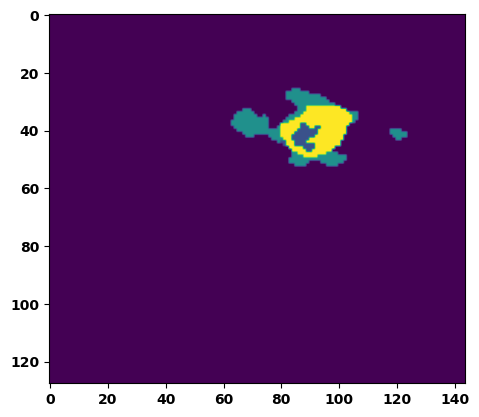

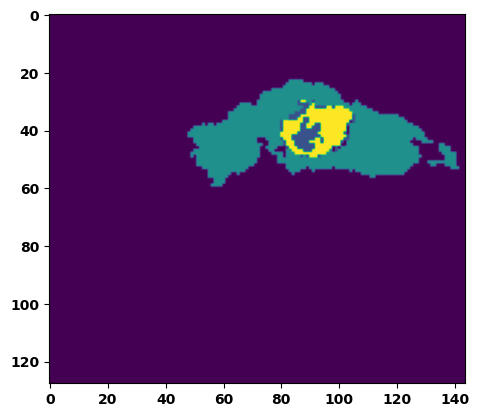

  6%|▌         | 2/36 [00:03<00:51,  1.50s/it]

Batch_id:  1 Eval loss:  0.7560687065124512
Batch_id:  1 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:48,  1.48s/it]

Batch_id:  2 Eval loss:  0.5912158489227295
Batch_id:  2 Eval IoU:  tensor(0.3389, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8820, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8281, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9288, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.41s/it]

Batch_id:  3 Eval loss:  0.9019668102264404
Batch_id:  3 Eval IoU:  tensor(0.0578, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.4617, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.3363, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.1925, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.39s/it]

Batch_id:  4 Eval loss:  0.42475783824920654
Batch_id:  4 Eval IoU:  tensor(0.4831, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8071, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.7147, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.7112, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.40s/it]

Batch_id:  5 Eval loss:  0.5778301954269409
Batch_id:  5 Eval IoU:  tensor(0.3758, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:39,  1.37s/it]

Batch_id:  6 Eval loss:  0.6779817342758179
Batch_id:  6 Eval IoU:  tensor(0.2888, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.43s/it]

Batch_id:  7 Eval loss:  0.20130851864814758
Batch_id:  7 Eval IoU:  tensor(0.7318, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:38,  1.41s/it]

Batch_id:  8 Eval loss:  0.13684195280075073
Batch_id:  8 Eval IoU:  tensor(0.7890, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9969, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.43s/it]

Batch_id:  9 Eval loss:  0.5201432704925537
Batch_id:  9 Eval IoU:  tensor(0.3915, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  10 Eval loss:  0.5657867789268494
Batch_id:  10 Eval IoU:  tensor(0.3600, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9760, device='cuda:0')


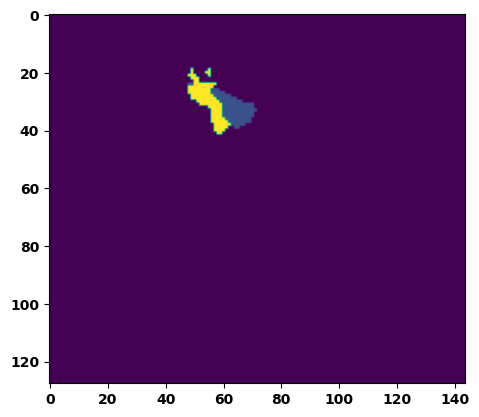

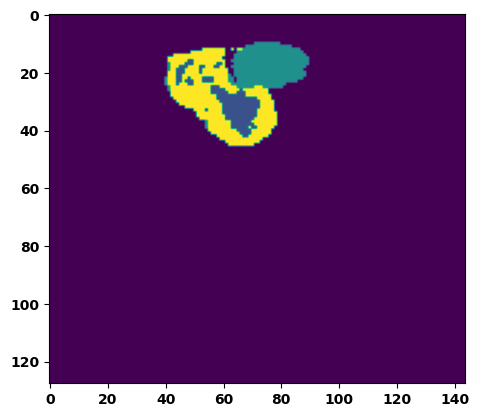

 33%|███▎      | 12/36 [00:17<00:34,  1.45s/it]

Batch_id:  11 Eval loss:  0.7235717177391052
Batch_id:  11 Eval IoU:  tensor(0.2548, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.44s/it]

Batch_id:  12 Eval loss:  0.705443799495697
Batch_id:  12 Eval IoU:  tensor(0.2633, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.42s/it]

Batch_id:  13 Eval loss:  0.5231315493583679
Batch_id:  13 Eval IoU:  tensor(0.4245, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9356, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9253, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9246, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:28,  1.38s/it]

Batch_id:  14 Eval loss:  0.774998128414154
Batch_id:  14 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.42s/it]

Batch_id:  15 Eval loss:  0.6176491975784302
Batch_id:  15 Eval IoU:  tensor(0.3327, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.42s/it]

Batch_id:  16 Eval loss:  0.7517359852790833
Batch_id:  16 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.42s/it]

Batch_id:  17 Eval loss:  0.7682170271873474
Batch_id:  17 Eval IoU:  tensor(0.1513, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4797, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3136, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9400, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2318, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.44s/it]

Batch_id:  18 Eval loss:  0.613709032535553
Batch_id:  18 Eval IoU:  tensor(0.3372, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9858, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:23,  1.45s/it]

Batch_id:  19 Eval loss:  0.7771415114402771
Batch_id:  19 Eval IoU:  tensor(0.1995, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7981, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8523, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  20 Eval loss:  0.3355550467967987
Batch_id:  20 Eval IoU:  tensor(0.5534, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9870, device='cuda:0')


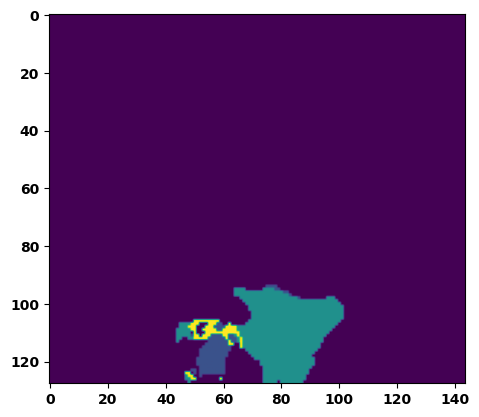

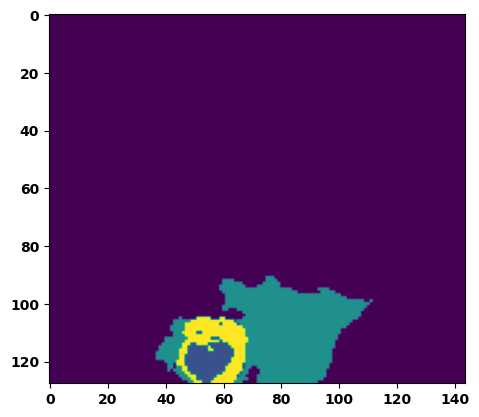

 61%|██████    | 22/36 [00:31<00:20,  1.44s/it]

Batch_id:  21 Eval loss:  0.7576236724853516
Batch_id:  21 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.49s/it]

Batch_id:  22 Eval loss:  0.7648273706436157
Batch_id:  22 Eval IoU:  tensor(0.2217, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.50s/it]

Batch_id:  23 Eval loss:  0.757485032081604
Batch_id:  23 Eval IoU:  tensor(0.2345, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9381, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.45s/it]

Batch_id:  24 Eval loss:  0.6929931044578552
Batch_id:  24 Eval IoU:  tensor(0.2411, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8079, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.7800, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.7132, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9444, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:15,  1.55s/it]

Batch_id:  25 Eval loss:  0.5678279399871826
Batch_id:  25 Eval IoU:  tensor(0.3444, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8959, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9013, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9139, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9786, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.51s/it]

Batch_id:  26 Eval loss:  0.37688320875167847
Batch_id:  26 Eval IoU:  tensor(0.5119, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9469, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9534, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.45s/it]

Batch_id:  27 Eval loss:  0.7348949313163757
Batch_id:  27 Eval IoU:  tensor(0.2375, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8875, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9634, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:11,  1.57s/it]

Batch_id:  28 Eval loss:  0.8322901725769043
Batch_id:  28 Eval IoU:  tensor(0.1024, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5331, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3928, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3004, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.50s/it]

Batch_id:  29 Eval loss:  0.753182053565979
Batch_id:  29 Eval IoU:  tensor(0.1751, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5472, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3223, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.3271, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  30 Eval loss:  0.20624975860118866
Batch_id:  30 Eval IoU:  tensor(0.7034, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


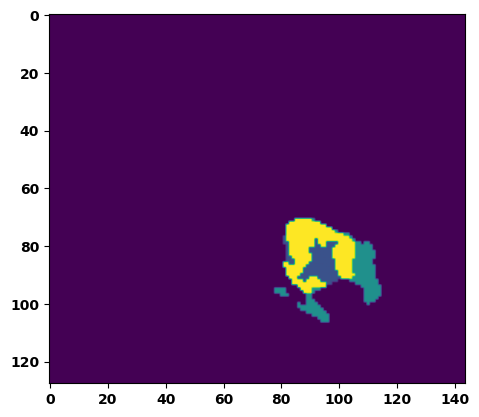

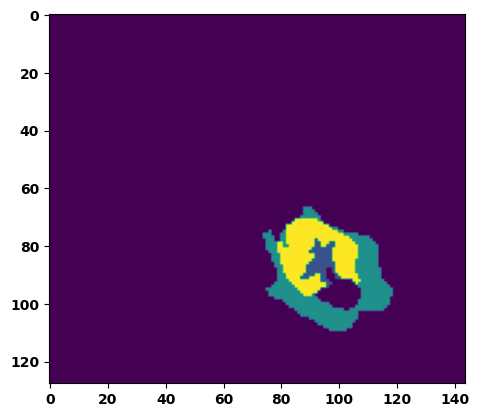

 89%|████████▉ | 32/36 [00:46<00:06,  1.54s/it]

Batch_id:  31 Eval loss:  0.8404803276062012
Batch_id:  31 Eval IoU:  tensor(0.1009, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5372, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4419, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8663, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3556, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.55s/it]

Batch_id:  32 Eval loss:  0.5017959475517273
Batch_id:  32 Eval IoU:  tensor(0.4086, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9463, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:03,  1.54s/it]

Batch_id:  33 Eval loss:  0.8817987442016602
Batch_id:  33 Eval IoU:  tensor(0.0759, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.4982, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.4214, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.2473, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.50s/it]

Batch_id:  34 Eval loss:  0.06819598376750946
Batch_id:  34 Eval IoU:  tensor(0.8796, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9915, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.48s/it]

Batch_id:  35 Eval loss:  0.7682735919952393
Batch_id:  35 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')
Epoch 00031: reducing learning rate of group 0 to 3.1250e-05.
Epoch  30 Training loss:  0.1344054326415062
Epoch  30 Evaluation loss:  0.6058413303560681
Epoch  30 Training accuracy :  tensor(0.8007)
Epoch  30 Evaluation accuracy :  tensor(0.3397)
Epoch  30 Training Mean Dice Score:  tensor(0.9843)
Epoch  30 Eval Mean Dice Score:  tensor(0.8665)
Epoch  30 Training Non-tumor Dice Score:  tensor(0.9853)
Epoch  30 Eval Non-tumor Dice Score:  tensor(0.8259)
Epoch  30 Training NCR/NET Dice Score:  tensor(0.9930)
Epoch  30 Eval NCR/NET Dice Score:  

Epoch: 31
Training in session: 


  1%|          | 1/110 [00:01<02:32,  1.40s/it]

Batch_id:  0 Training loss:  0.16496019065380096
Batch_id:  0 Training IoU:  tensor(0.7476, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:41,  1.49s/it]

Batch_id:  1 Training loss:  0.25556957721710205
Batch_id:  1 Training IoU:  tensor(0.6689, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:45,  1.55s/it]

Batch_id:  2 Training loss:  0.05698347091674805
Batch_id:  2 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:42,  1.53s/it]

Batch_id:  3 Training loss:  0.10505776107311249
Batch_id:  3 Training IoU:  tensor(0.8243, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:44,  1.57s/it]

Batch_id:  4 Training loss:  0.14239324629306793
Batch_id:  4 Training IoU:  tensor(0.7810, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9732, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:35,  1.49s/it]

Batch_id:  5 Training loss:  0.14761540293693542
Batch_id:  5 Training IoU:  tensor(0.7742, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:31,  1.47s/it]

Batch_id:  6 Training loss:  0.24551022052764893
Batch_id:  6 Training IoU:  tensor(0.6920, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:34,  1.52s/it]

Batch_id:  7 Training loss:  0.09300032258033752
Batch_id:  7 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:37,  1.56s/it]

Batch_id:  8 Training loss:  0.06388731300830841
Batch_id:  8 Training IoU:  tensor(0.8906, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:37,  1.57s/it]

Batch_id:  9 Training loss:  0.24455289542675018
Batch_id:  9 Training IoU:  tensor(0.7017, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 10%|█         | 11/110 [00:16<02:35,  1.57s/it]

Batch_id:  10 Training loss:  0.1435580551624298
Batch_id:  10 Training IoU:  tensor(0.7656, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 11%|█         | 12/110 [00:18<02:34,  1.57s/it]

Batch_id:  11 Training loss:  0.22381843626499176
Batch_id:  11 Training IoU:  tensor(0.7000, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:29,  1.54s/it]

Batch_id:  12 Training loss:  0.13627009093761444
Batch_id:  12 Training IoU:  tensor(0.8133, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:27,  1.53s/it]

Batch_id:  13 Training loss:  0.06803809106349945
Batch_id:  13 Training IoU:  tensor(0.8881, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:20,  1.48s/it]

Batch_id:  14 Training loss:  0.09495855867862701
Batch_id:  14 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:22,  1.52s/it]

Batch_id:  15 Training loss:  0.13002127408981323
Batch_id:  15 Training IoU:  tensor(0.8080, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:22,  1.53s/it]

Batch_id:  16 Training loss:  0.08524657785892487
Batch_id:  16 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:18,  1.51s/it]

Batch_id:  17 Training loss:  0.09499113261699677
Batch_id:  17 Training IoU:  tensor(0.8361, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:12,  1.46s/it]

Batch_id:  18 Training loss:  0.18203264474868774
Batch_id:  18 Training IoU:  tensor(0.7813, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:12,  1.48s/it]

Batch_id:  19 Training loss:  0.09454457461833954
Batch_id:  19 Training IoU:  tensor(0.8474, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:15,  1.53s/it]

Batch_id:  20 Training loss:  0.21852882206439972
Batch_id:  20 Training IoU:  tensor(0.7177, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 20%|██        | 22/110 [00:33<02:12,  1.51s/it]

Batch_id:  21 Training loss:  0.05107507109642029
Batch_id:  21 Training IoU:  tensor(0.9175, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 21%|██        | 23/110 [00:34<02:11,  1.52s/it]

Batch_id:  22 Training loss:  0.08927492797374725
Batch_id:  22 Training IoU:  tensor(0.8459, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:08,  1.50s/it]

Batch_id:  23 Training loss:  0.08668152987957001
Batch_id:  23 Training IoU:  tensor(0.8515, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:06,  1.48s/it]

Batch_id:  24 Training loss:  0.06285867094993591
Batch_id:  24 Training IoU:  tensor(0.8902, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:06,  1.51s/it]

Batch_id:  25 Training loss:  0.11987419426441193
Batch_id:  25 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 25%|██▍       | 27/110 [00:41<02:08,  1.54s/it]

Batch_id:  26 Training loss:  0.046580150723457336
Batch_id:  26 Training IoU:  tensor(0.9224, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:06,  1.54s/it]

Batch_id:  27 Training loss:  0.1810349076986313
Batch_id:  27 Training IoU:  tensor(0.7251, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 26%|██▋       | 29/110 [00:44<02:03,  1.53s/it]

Batch_id:  28 Training loss:  0.05392932891845703
Batch_id:  28 Training IoU:  tensor(0.9063, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:03,  1.54s/it]

Batch_id:  29 Training loss:  0.22851984202861786
Batch_id:  29 Training IoU:  tensor(0.6805, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9457, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 28%|██▊       | 31/110 [00:47<02:03,  1.57s/it]

Batch_id:  30 Training loss:  0.3649103045463562
Batch_id:  30 Training IoU:  tensor(0.5513, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 29%|██▉       | 32/110 [00:48<01:59,  1.54s/it]

Batch_id:  31 Training loss:  0.22970081865787506
Batch_id:  31 Training IoU:  tensor(0.7138, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 30%|███       | 33/110 [00:50<02:00,  1.57s/it]

Batch_id:  32 Training loss:  0.0666847974061966
Batch_id:  32 Training IoU:  tensor(0.8989, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 31%|███       | 34/110 [00:51<01:58,  1.56s/it]

Batch_id:  33 Training loss:  0.09526458382606506
Batch_id:  33 Training IoU:  tensor(0.8355, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 32%|███▏      | 35/110 [00:53<01:53,  1.51s/it]

Batch_id:  34 Training loss:  0.13755229115486145
Batch_id:  34 Training IoU:  tensor(0.7798, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:52,  1.51s/it]

Batch_id:  35 Training loss:  0.05320495367050171
Batch_id:  35 Training IoU:  tensor(0.9084, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:53,  1.56s/it]

Batch_id:  36 Training loss:  0.14786994457244873
Batch_id:  36 Training IoU:  tensor(0.7728, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 35%|███▍      | 38/110 [00:58<01:51,  1.55s/it]

Batch_id:  37 Training loss:  0.0747193694114685
Batch_id:  37 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:50,  1.55s/it]

Batch_id:  38 Training loss:  0.08297790586948395
Batch_id:  38 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 36%|███▋      | 40/110 [01:01<01:45,  1.51s/it]

Batch_id:  39 Training loss:  0.11192847788333893
Batch_id:  39 Training IoU:  tensor(0.8220, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 37%|███▋      | 41/110 [01:02<01:43,  1.50s/it]

Batch_id:  40 Training loss:  0.11001767218112946
Batch_id:  40 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:40,  1.47s/it]

Batch_id:  41 Training loss:  0.1071196049451828
Batch_id:  41 Training IoU:  tensor(0.8175, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 39%|███▉      | 43/110 [01:05<01:36,  1.45s/it]

Batch_id:  42 Training loss:  0.18387992680072784
Batch_id:  42 Training IoU:  tensor(0.7242, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 40%|████      | 44/110 [01:06<01:35,  1.45s/it]

Batch_id:  43 Training loss:  0.15532632172107697
Batch_id:  43 Training IoU:  tensor(0.7530, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 41%|████      | 45/110 [01:08<01:34,  1.45s/it]

Batch_id:  44 Training loss:  0.13344740867614746
Batch_id:  44 Training IoU:  tensor(0.7927, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9864, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:32,  1.45s/it]

Batch_id:  45 Training loss:  0.07300582528114319
Batch_id:  45 Training IoU:  tensor(0.8751, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:34,  1.51s/it]

Batch_id:  46 Training loss:  0.1476277858018875
Batch_id:  46 Training IoU:  tensor(0.7938, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:32,  1.49s/it]

Batch_id:  47 Training loss:  0.197464257478714
Batch_id:  47 Training IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 45%|████▍     | 49/110 [01:14<01:28,  1.44s/it]

Batch_id:  48 Training loss:  0.08226127922534943
Batch_id:  48 Training IoU:  tensor(0.8609, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 45%|████▌     | 50/110 [01:15<01:28,  1.47s/it]

Batch_id:  49 Training loss:  0.07849693298339844
Batch_id:  49 Training IoU:  tensor(0.8662, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 46%|████▋     | 51/110 [01:17<01:27,  1.48s/it]

Batch_id:  50 Training loss:  0.10856959223747253
Batch_id:  50 Training IoU:  tensor(0.8220, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 47%|████▋     | 52/110 [01:18<01:24,  1.46s/it]

Batch_id:  51 Training loss:  0.0898953378200531
Batch_id:  51 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:21,  1.43s/it]

Batch_id:  52 Training loss:  0.06423921883106232
Batch_id:  52 Training IoU:  tensor(0.8902, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 49%|████▉     | 54/110 [01:21<01:20,  1.43s/it]

Batch_id:  53 Training loss:  0.07513450086116791
Batch_id:  53 Training IoU:  tensor(0.8728, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.11664064228534698
Batch_id:  54 Training IoU:  tensor(0.8179, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 51%|█████     | 56/110 [01:24<01:15,  1.41s/it]

Batch_id:  55 Training loss:  0.0867510437965393
Batch_id:  55 Training IoU:  tensor(0.8513, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 52%|█████▏    | 57/110 [01:25<01:14,  1.40s/it]

Batch_id:  56 Training loss:  0.0948067456483841
Batch_id:  56 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:12,  1.40s/it]

Batch_id:  57 Training loss:  0.218913733959198
Batch_id:  57 Training IoU:  tensor(0.6908, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 54%|█████▎    | 59/110 [01:28<01:10,  1.39s/it]

Batch_id:  58 Training loss:  0.15325145423412323
Batch_id:  58 Training IoU:  tensor(0.7536, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 55%|█████▍    | 60/110 [01:29<01:11,  1.43s/it]

Batch_id:  59 Training loss:  0.09697923064231873
Batch_id:  59 Training IoU:  tensor(0.8343, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 55%|█████▌    | 61/110 [01:31<01:11,  1.45s/it]

Batch_id:  60 Training loss:  0.13780342042446136
Batch_id:  60 Training IoU:  tensor(0.7978, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 56%|█████▋    | 62/110 [01:32<01:10,  1.47s/it]

Batch_id:  61 Training loss:  0.15901771187782288
Batch_id:  61 Training IoU:  tensor(0.7511, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9510, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 57%|█████▋    | 63/110 [01:34<01:10,  1.51s/it]

Batch_id:  62 Training loss:  0.06436741352081299
Batch_id:  62 Training IoU:  tensor(0.9241, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 58%|█████▊    | 64/110 [01:36<01:11,  1.55s/it]

Batch_id:  63 Training loss:  0.22388581931591034
Batch_id:  63 Training IoU:  tensor(0.6746, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9633, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.18078859150409698
Batch_id:  64 Training IoU:  tensor(0.7398, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 60%|██████    | 66/110 [01:38<01:06,  1.50s/it]

Batch_id:  65 Training loss:  0.07243876159191132
Batch_id:  65 Training IoU:  tensor(0.8731, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 61%|██████    | 67/110 [01:40<01:02,  1.46s/it]

Batch_id:  66 Training loss:  0.14881214499473572
Batch_id:  66 Training IoU:  tensor(0.7800, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 62%|██████▏   | 68/110 [01:41<01:00,  1.44s/it]

Batch_id:  67 Training loss:  0.18850478529930115
Batch_id:  67 Training IoU:  tensor(0.7124, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 63%|██████▎   | 69/110 [01:43<01:01,  1.51s/it]

Batch_id:  68 Training loss:  0.2074110060930252
Batch_id:  68 Training IoU:  tensor(0.7151, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 64%|██████▎   | 70/110 [01:44<00:59,  1.49s/it]

Batch_id:  69 Training loss:  0.14508642256259918
Batch_id:  69 Training IoU:  tensor(0.7660, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 65%|██████▍   | 71/110 [01:46<00:59,  1.52s/it]

Batch_id:  70 Training loss:  0.24727597832679749
Batch_id:  70 Training IoU:  tensor(0.6683, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 65%|██████▌   | 72/110 [01:47<00:57,  1.51s/it]

Batch_id:  71 Training loss:  0.11462573707103729
Batch_id:  71 Training IoU:  tensor(0.8164, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 66%|██████▋   | 73/110 [01:49<00:57,  1.55s/it]

Batch_id:  72 Training loss:  0.057910799980163574
Batch_id:  72 Training IoU:  tensor(0.9016, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 67%|██████▋   | 74/110 [01:51<00:56,  1.56s/it]

Batch_id:  73 Training loss:  0.1237560361623764
Batch_id:  73 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 68%|██████▊   | 75/110 [01:52<00:52,  1.51s/it]

Batch_id:  74 Training loss:  0.321309894323349
Batch_id:  74 Training IoU:  tensor(0.6287, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 69%|██████▉   | 76/110 [01:53<00:50,  1.49s/it]

Batch_id:  75 Training loss:  0.10559982061386108
Batch_id:  75 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 70%|███████   | 77/110 [01:55<00:50,  1.52s/it]

Batch_id:  76 Training loss:  0.12654049694538116
Batch_id:  76 Training IoU:  tensor(0.7908, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 71%|███████   | 78/110 [01:57<00:48,  1.52s/it]

Batch_id:  77 Training loss:  0.08063191175460815
Batch_id:  77 Training IoU:  tensor(0.9259, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 72%|███████▏  | 79/110 [01:58<00:45,  1.47s/it]

Batch_id:  78 Training loss:  0.12773503363132477
Batch_id:  78 Training IoU:  tensor(0.8171, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 73%|███████▎  | 80/110 [01:59<00:43,  1.45s/it]

Batch_id:  79 Training loss:  0.06111535429954529
Batch_id:  79 Training IoU:  tensor(0.8963, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 74%|███████▎  | 81/110 [02:01<00:43,  1.49s/it]

Batch_id:  80 Training loss:  0.06315042078495026
Batch_id:  80 Training IoU:  tensor(0.8930, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.12861879169940948
Batch_id:  81 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 75%|███████▌  | 83/110 [02:04<00:38,  1.44s/it]

Batch_id:  82 Training loss:  0.18298405408859253
Batch_id:  82 Training IoU:  tensor(0.7139, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9867, device='cuda:0')


 76%|███████▋  | 84/110 [02:05<00:36,  1.42s/it]

Batch_id:  83 Training loss:  0.07662500441074371
Batch_id:  83 Training IoU:  tensor(0.8716, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:34,  1.40s/it]

Batch_id:  84 Training loss:  0.15203745663166046
Batch_id:  84 Training IoU:  tensor(0.7608, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 78%|███████▊  | 86/110 [02:08<00:34,  1.43s/it]

Batch_id:  85 Training loss:  0.07885146141052246
Batch_id:  85 Training IoU:  tensor(0.8861, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:31,  1.39s/it]

Batch_id:  86 Training loss:  0.10928593575954437
Batch_id:  86 Training IoU:  tensor(0.8210, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 80%|████████  | 88/110 [02:11<00:30,  1.38s/it]

Batch_id:  87 Training loss:  0.2167012095451355
Batch_id:  87 Training IoU:  tensor(0.7495, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:28,  1.36s/it]

Batch_id:  88 Training loss:  0.08611947298049927
Batch_id:  88 Training IoU:  tensor(0.8536, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:27,  1.37s/it]

Batch_id:  89 Training loss:  0.09306278824806213
Batch_id:  89 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:25,  1.35s/it]

Batch_id:  90 Training loss:  0.2239263653755188
Batch_id:  90 Training IoU:  tensor(0.6991, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:25,  1.42s/it]

Batch_id:  91 Training loss:  0.14982111752033234
Batch_id:  91 Training IoU:  tensor(0.7606, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:24,  1.43s/it]

Batch_id:  92 Training loss:  0.1047622561454773
Batch_id:  92 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:22,  1.44s/it]

Batch_id:  93 Training loss:  0.3055526614189148
Batch_id:  93 Training IoU:  tensor(0.6120, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:21,  1.42s/it]

Batch_id:  94 Training loss:  0.13924281299114227
Batch_id:  94 Training IoU:  tensor(0.7882, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:20,  1.44s/it]

Batch_id:  95 Training loss:  0.11122708022594452
Batch_id:  95 Training IoU:  tensor(0.8165, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.39s/it]

Batch_id:  96 Training loss:  0.24636854231357574
Batch_id:  96 Training IoU:  tensor(0.6901, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:16,  1.40s/it]

Batch_id:  97 Training loss:  0.1255461424589157
Batch_id:  97 Training IoU:  tensor(0.7931, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:16,  1.46s/it]

Batch_id:  98 Training loss:  0.05365316569805145
Batch_id:  98 Training IoU:  tensor(0.9080, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:14,  1.45s/it]

Batch_id:  99 Training loss:  0.11703749001026154
Batch_id:  99 Training IoU:  tensor(0.8016, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.46s/it]

Batch_id:  100 Training loss:  0.10284020006656647
Batch_id:  100 Training IoU:  tensor(0.8350, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:11,  1.44s/it]

Batch_id:  101 Training loss:  0.11814051866531372
Batch_id:  101 Training IoU:  tensor(0.8038, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:09,  1.42s/it]

Batch_id:  102 Training loss:  0.16266296803951263
Batch_id:  102 Training IoU:  tensor(0.7374, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.41s/it]

Batch_id:  103 Training loss:  0.05616532266139984
Batch_id:  103 Training IoU:  tensor(0.9021, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:06,  1.40s/it]

Batch_id:  104 Training loss:  0.27192822098731995
Batch_id:  104 Training IoU:  tensor(0.6258, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9679, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.39s/it]

Batch_id:  105 Training loss:  0.14006611704826355
Batch_id:  105 Training IoU:  tensor(0.7683, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9806, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.41s/it]

Batch_id:  106 Training loss:  0.17410852015018463
Batch_id:  106 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.45s/it]

Batch_id:  107 Training loss:  0.030717074871063232
Batch_id:  107 Training IoU:  tensor(0.9474, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.45s/it]

Batch_id:  108 Training loss:  0.10779900848865509
Batch_id:  108 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.11513100564479828
Batch_id:  109 Training IoU:  tensor(0.8212, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9917, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.47891363501548767
Batch_id:  0 Eval IoU:  tensor(0.4062, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.8429, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7886, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8031, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9761, device='cuda:0')


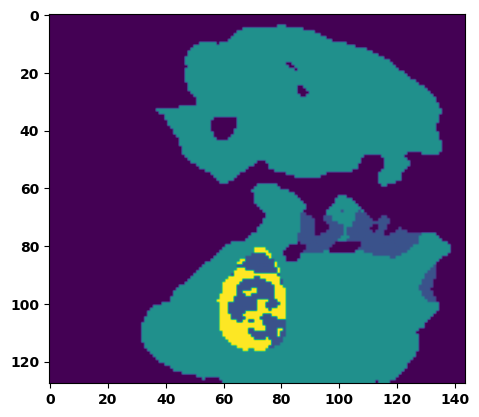

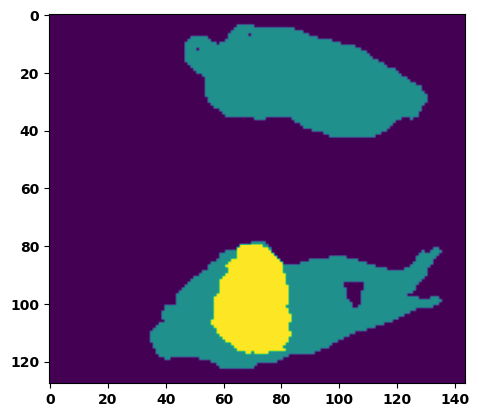

  6%|▌         | 2/36 [00:03<00:54,  1.61s/it]

Batch_id:  1 Eval loss:  0.7154603004455566
Batch_id:  1 Eval IoU:  tensor(0.2540, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9424, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9438, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.50s/it]

Batch_id:  2 Eval loss:  0.7562116384506226
Batch_id:  2 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 11%|█         | 4/36 [00:06<00:46,  1.47s/it]

Batch_id:  3 Eval loss:  0.16204197704792023
Batch_id:  3 Eval IoU:  tensor(0.7335, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9794, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.41s/it]

Batch_id:  4 Eval loss:  0.6507933735847473
Batch_id:  4 Eval IoU:  tensor(0.2337, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6461, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4790, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.5936, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.8731, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.40s/it]

Batch_id:  5 Eval loss:  0.5509641170501709
Batch_id:  5 Eval IoU:  tensor(0.3674, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.8814131021499634
Batch_id:  6 Eval IoU:  tensor(0.0758, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.4979, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.4211, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.2470, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.44s/it]

Batch_id:  7 Eval loss:  0.7573562264442444
Batch_id:  7 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.6174584627151489
Batch_id:  8 Eval IoU:  tensor(0.3283, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9196, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.46s/it]

Batch_id:  9 Eval loss:  0.7749789357185364
Batch_id:  9 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  10 Eval loss:  0.7496415972709656
Batch_id:  10 Eval IoU:  tensor(0.1576, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5426, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3951, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9599, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.3170, device='cuda:0')


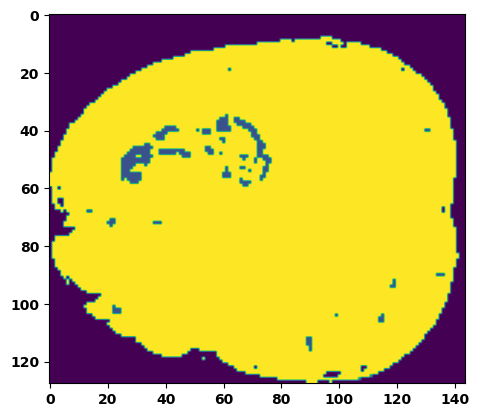

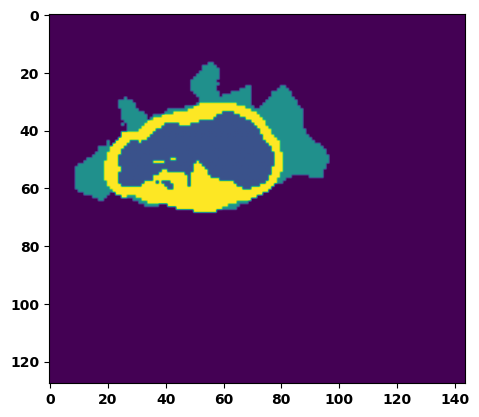

 33%|███▎      | 12/36 [00:17<00:35,  1.49s/it]

Batch_id:  11 Eval loss:  0.6678901314735413
Batch_id:  11 Eval IoU:  tensor(0.2546, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.7573, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.6598, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.7416, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:33,  1.46s/it]

Batch_id:  12 Eval loss:  0.659640908241272
Batch_id:  12 Eval IoU:  tensor(0.2743, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8561, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7864, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8766, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.46s/it]

Batch_id:  13 Eval loss:  0.7144590616226196
Batch_id:  13 Eval IoU:  tensor(0.2128, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7310, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.6114, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.6721, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.43s/it]

Batch_id:  14 Eval loss:  0.7517539858818054
Batch_id:  14 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.43s/it]

Batch_id:  15 Eval loss:  0.7562246322631836
Batch_id:  15 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.40s/it]

Batch_id:  16 Eval loss:  0.7682702541351318
Batch_id:  16 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:25,  1.42s/it]

Batch_id:  17 Eval loss:  0.6398483514785767
Batch_id:  17 Eval IoU:  tensor(0.2904, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.7941, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.7640, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.7633, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9115, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.40s/it]

Batch_id:  18 Eval loss:  0.8976094126701355
Batch_id:  18 Eval IoU:  tensor(0.0598, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4629, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.3380, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.1960, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:21,  1.37s/it]

Batch_id:  19 Eval loss:  0.7578039169311523
Batch_id:  19 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  20 Eval loss:  0.7570267915725708
Batch_id:  20 Eval IoU:  tensor(0.1948, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8099, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.7194, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.7154, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


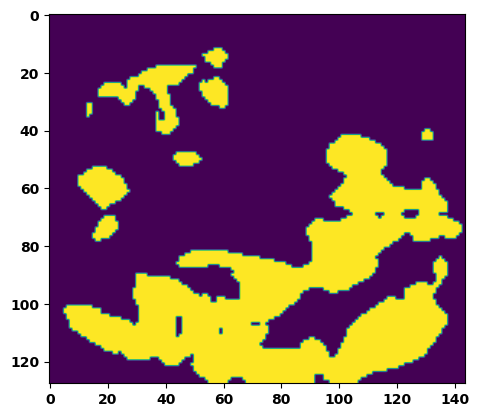

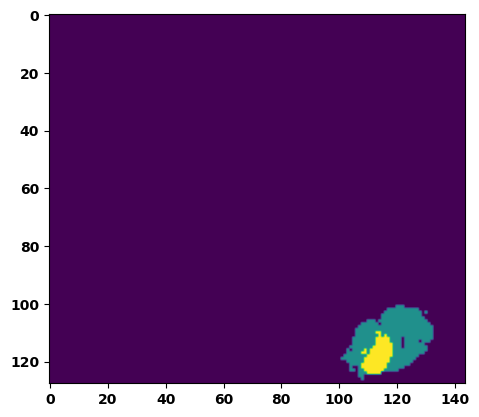

 61%|██████    | 22/36 [00:31<00:20,  1.45s/it]

Batch_id:  21 Eval loss:  0.4800668954849243
Batch_id:  21 Eval IoU:  tensor(0.4210, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8960, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9864, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.44s/it]

Batch_id:  22 Eval loss:  0.7578743100166321
Batch_id:  22 Eval IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.44s/it]

Batch_id:  23 Eval loss:  0.7581082582473755
Batch_id:  23 Eval IoU:  tensor(0.2336, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.44s/it]

Batch_id:  24 Eval loss:  0.7212057113647461
Batch_id:  24 Eval IoU:  tensor(0.2230, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8321, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.7683, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.7519, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.40s/it]

Batch_id:  25 Eval loss:  0.6412067413330078
Batch_id:  25 Eval IoU:  tensor(0.3058, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9266, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8999, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9339, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.6160621643066406
Batch_id:  26 Eval IoU:  tensor(0.3376, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.43s/it]

Batch_id:  27 Eval loss:  0.6244140863418579
Batch_id:  27 Eval IoU:  tensor(0.2657, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.5528, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3646, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.5256, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.8034, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.41s/it]

Batch_id:  28 Eval loss:  0.5441625118255615
Batch_id:  28 Eval IoU:  tensor(0.3803, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9102, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9662, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.727909505367279
Batch_id:  29 Eval IoU:  tensor(0.2264, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8748, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8130, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.8657, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  30 Eval loss:  0.26886749267578125
Batch_id:  30 Eval IoU:  tensor(0.6321, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9870, device='cuda:0')


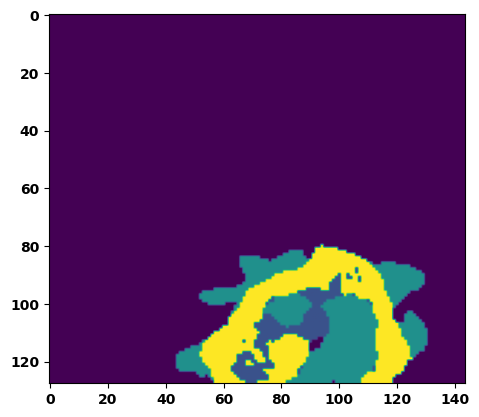

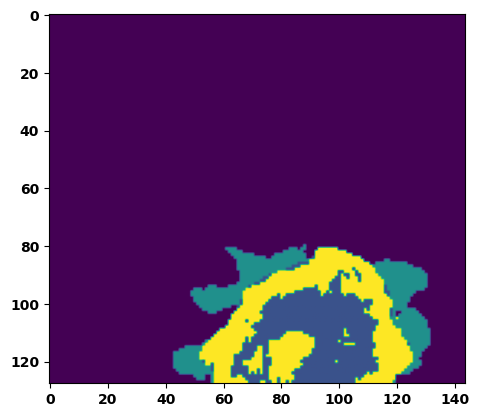

 89%|████████▉ | 32/36 [00:46<00:05,  1.48s/it]

Batch_id:  31 Eval loss:  0.721958577632904
Batch_id:  31 Eval IoU:  tensor(0.2186, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7786, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6835, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.6838, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.49s/it]

Batch_id:  32 Eval loss:  0.3476986587047577
Batch_id:  32 Eval IoU:  tensor(0.5472, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9910, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.46s/it]

Batch_id:  33 Eval loss:  0.7537971138954163
Batch_id:  33 Eval IoU:  tensor(0.2285, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9200, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8961, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.30531591176986694
Batch_id:  34 Eval IoU:  tensor(0.6106, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.45s/it]

Batch_id:  35 Eval loss:  0.6258959770202637
Batch_id:  35 Eval IoU:  tensor(0.3202, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Epoch  31 Training loss:  0.13262508701194417
Epoch  31 Evaluation loss:  0.6488973535597324
Epoch  31 Training accuracy :  tensor(0.8029)
Epoch  31 Evaluation accuracy :  tensor(0.2952)
Epoch  31 Training Mean Dice Score:  tensor(0.9844)
Epoch  31 Eval Mean Dice Score:  tensor(0.8580)
Epoch  31 Training Non-tumor Dice Score:  tensor(0.9855)
Epoch  31 Eval Non-tumor Dice Score:  tensor(0.8113)
Epoch  31 Training NCR/NET Dice Score:  tensor(0.9931)
Epoch  31 Eval NCR/NET Dice Score:  tensor(0.9356)
Epoch  31 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 32
Training in session: 


  1%|          | 1/110 [00:01<02:47,  1.54s/it]

Batch_id:  0 Training loss:  0.29528266191482544
Batch_id:  0 Training IoU:  tensor(0.6187, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:46,  1.54s/it]

Batch_id:  1 Training loss:  0.05348174273967743
Batch_id:  1 Training IoU:  tensor(0.9091, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:42,  1.52s/it]

Batch_id:  2 Training loss:  0.09666195511817932
Batch_id:  2 Training IoU:  tensor(0.8400, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:40,  1.51s/it]

Batch_id:  3 Training loss:  0.09224437177181244
Batch_id:  3 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:41,  1.54s/it]

Batch_id:  4 Training loss:  0.1149415671825409
Batch_id:  4 Training IoU:  tensor(0.8210, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:39,  1.53s/it]

Batch_id:  5 Training loss:  0.13412144780158997
Batch_id:  5 Training IoU:  tensor(0.7836, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9752, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:35,  1.51s/it]

Batch_id:  6 Training loss:  0.3627831041812897
Batch_id:  6 Training IoU:  tensor(0.5537, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:40,  1.57s/it]

Batch_id:  7 Training loss:  0.06381596624851227
Batch_id:  7 Training IoU:  tensor(0.8906, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:32,  1.51s/it]

Batch_id:  8 Training loss:  0.15191057324409485
Batch_id:  8 Training IoU:  tensor(0.7614, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:33,  1.53s/it]

Batch_id:  9 Training loss:  0.10681623220443726
Batch_id:  9 Training IoU:  tensor(0.8180, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 10%|█         | 11/110 [00:16<02:29,  1.51s/it]

Batch_id:  10 Training loss:  0.22006389498710632
Batch_id:  10 Training IoU:  tensor(0.7043, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 11%|█         | 12/110 [00:18<02:31,  1.55s/it]

Batch_id:  11 Training loss:  0.1555839329957962
Batch_id:  11 Training IoU:  tensor(0.7483, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:24,  1.49s/it]

Batch_id:  12 Training loss:  0.18049444258213043
Batch_id:  12 Training IoU:  tensor(0.7272, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:20,  1.46s/it]

Batch_id:  13 Training loss:  0.18237200379371643
Batch_id:  13 Training IoU:  tensor(0.7254, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:20,  1.47s/it]

Batch_id:  14 Training loss:  0.08285664021968842
Batch_id:  14 Training IoU:  tensor(0.8620, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:18,  1.48s/it]

Batch_id:  15 Training loss:  0.13469773530960083
Batch_id:  15 Training IoU:  tensor(0.7768, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:20,  1.51s/it]

Batch_id:  16 Training loss:  0.11595731973648071
Batch_id:  16 Training IoU:  tensor(0.9006, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:21,  1.54s/it]

Batch_id:  17 Training loss:  0.13074055314064026
Batch_id:  17 Training IoU:  tensor(0.7895, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:19,  1.54s/it]

Batch_id:  18 Training loss:  0.07433591783046722
Batch_id:  18 Training IoU:  tensor(0.8719, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:13,  1.49s/it]

Batch_id:  19 Training loss:  0.24135373532772064
Batch_id:  19 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:11,  1.48s/it]

Batch_id:  20 Training loss:  0.1274665892124176
Batch_id:  20 Training IoU:  tensor(0.8165, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 20%|██        | 22/110 [00:33<02:07,  1.44s/it]

Batch_id:  21 Training loss:  0.10985885560512543
Batch_id:  21 Training IoU:  tensor(0.8281, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 21%|██        | 23/110 [00:34<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.06457497179508209
Batch_id:  22 Training IoU:  tensor(0.8899, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:08,  1.50s/it]

Batch_id:  23 Training loss:  0.12760759890079498
Batch_id:  23 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.12149488925933838
Batch_id:  24 Training IoU:  tensor(0.7974, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9853, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:02,  1.46s/it]

Batch_id:  25 Training loss:  0.11395770311355591
Batch_id:  25 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:01,  1.46s/it]

Batch_id:  26 Training loss:  0.20661024749279022
Batch_id:  26 Training IoU:  tensor(0.7748, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 25%|██▌       | 28/110 [00:41<02:00,  1.47s/it]

Batch_id:  27 Training loss:  0.1848049759864807
Batch_id:  27 Training IoU:  tensor(0.7125, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:05,  1.54s/it]

Batch_id:  28 Training loss:  0.24458709359169006
Batch_id:  28 Training IoU:  tensor(0.7003, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:00,  1.51s/it]

Batch_id:  29 Training loss:  0.05750010907649994
Batch_id:  29 Training IoU:  tensor(0.9003, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 28%|██▊       | 31/110 [00:46<02:00,  1.52s/it]

Batch_id:  30 Training loss:  0.13864488899707794
Batch_id:  30 Training IoU:  tensor(0.7976, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 29%|██▉       | 32/110 [00:48<02:02,  1.58s/it]

Batch_id:  31 Training loss:  0.22795017063617706
Batch_id:  31 Training IoU:  tensor(0.6807, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9455, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 30%|███       | 33/110 [00:49<01:59,  1.55s/it]

Batch_id:  32 Training loss:  0.05467958748340607
Batch_id:  32 Training IoU:  tensor(0.9048, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 31%|███       | 34/110 [00:51<01:59,  1.58s/it]

Batch_id:  33 Training loss:  0.1556241363286972
Batch_id:  33 Training IoU:  tensor(0.7534, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:55,  1.55s/it]

Batch_id:  34 Training loss:  0.09055531024932861
Batch_id:  34 Training IoU:  tensor(0.8472, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:58,  1.60s/it]

Batch_id:  35 Training loss:  0.06430754065513611
Batch_id:  35 Training IoU:  tensor(0.9246, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:52,  1.54s/it]

Batch_id:  36 Training loss:  0.24953912198543549
Batch_id:  36 Training IoU:  tensor(0.6557, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:49,  1.52s/it]

Batch_id:  37 Training loss:  0.11791864037513733
Batch_id:  37 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:47,  1.52s/it]

Batch_id:  38 Training loss:  0.1490926444530487
Batch_id:  38 Training IoU:  tensor(0.7620, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9800, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:46,  1.52s/it]

Batch_id:  39 Training loss:  0.08630533516407013
Batch_id:  39 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 37%|███▋      | 41/110 [01:02<01:46,  1.54s/it]

Batch_id:  40 Training loss:  0.060234129428863525
Batch_id:  40 Training IoU:  tensor(0.8971, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:44,  1.53s/it]

Batch_id:  41 Training loss:  0.09678719937801361
Batch_id:  41 Training IoU:  tensor(0.8356, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 39%|███▉      | 43/110 [01:05<01:41,  1.52s/it]

Batch_id:  42 Training loss:  0.14382635056972504
Batch_id:  42 Training IoU:  tensor(0.7673, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 40%|████      | 44/110 [01:06<01:42,  1.55s/it]

Batch_id:  43 Training loss:  0.14416001737117767
Batch_id:  43 Training IoU:  tensor(0.7770, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 41%|████      | 45/110 [01:08<01:45,  1.62s/it]

Batch_id:  44 Training loss:  0.06946520507335663
Batch_id:  44 Training IoU:  tensor(0.8852, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 42%|████▏     | 46/110 [01:10<01:41,  1.59s/it]

Batch_id:  45 Training loss:  0.09230875968933105
Batch_id:  45 Training IoU:  tensor(0.8398, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9830, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:36,  1.54s/it]

Batch_id:  46 Training loss:  0.1814563125371933
Batch_id:  46 Training IoU:  tensor(0.7411, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 44%|████▎     | 48/110 [01:13<01:37,  1.58s/it]

Batch_id:  47 Training loss:  0.07106855511665344
Batch_id:  47 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 45%|████▍     | 49/110 [01:14<01:35,  1.57s/it]

Batch_id:  48 Training loss:  0.14708833396434784
Batch_id:  48 Training IoU:  tensor(0.7976, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 45%|████▌     | 50/110 [01:16<01:33,  1.56s/it]

Batch_id:  49 Training loss:  0.046304866671562195
Batch_id:  49 Training IoU:  tensor(0.9214, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 46%|████▋     | 51/110 [01:17<01:30,  1.54s/it]

Batch_id:  50 Training loss:  0.10407133400440216
Batch_id:  50 Training IoU:  tensor(0.8218, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 47%|████▋     | 52/110 [01:19<01:27,  1.51s/it]

Batch_id:  51 Training loss:  0.3238711953163147
Batch_id:  51 Training IoU:  tensor(0.6245, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 48%|████▊     | 53/110 [01:20<01:26,  1.51s/it]

Batch_id:  52 Training loss:  0.14200909435749054
Batch_id:  52 Training IoU:  tensor(0.7813, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9731, device='cuda:0')


 49%|████▉     | 54/110 [01:22<01:25,  1.53s/it]

Batch_id:  53 Training loss:  0.14716006815433502
Batch_id:  53 Training IoU:  tensor(0.7766, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 50%|█████     | 55/110 [01:23<01:24,  1.54s/it]

Batch_id:  54 Training loss:  0.22182808816432953
Batch_id:  54 Training IoU:  tensor(0.7106, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 51%|█████     | 56/110 [01:25<01:24,  1.56s/it]

Batch_id:  55 Training loss:  0.10854922235012054
Batch_id:  55 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 52%|█████▏    | 57/110 [01:26<01:21,  1.54s/it]

Batch_id:  56 Training loss:  0.11280219256877899
Batch_id:  56 Training IoU:  tensor(0.8230, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 58/110 [01:28<01:15,  1.46s/it]

Batch_id:  57 Training loss:  0.0737689733505249
Batch_id:  57 Training IoU:  tensor(0.8750, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 54%|█████▎    | 59/110 [01:29<01:14,  1.46s/it]

Batch_id:  58 Training loss:  0.13988493382930756
Batch_id:  58 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 55%|█████▍    | 60/110 [01:31<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.22051532566547394
Batch_id:  59 Training IoU:  tensor(0.7012, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 55%|█████▌    | 61/110 [01:32<01:09,  1.41s/it]

Batch_id:  60 Training loss:  0.25010114908218384
Batch_id:  60 Training IoU:  tensor(0.6826, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 56%|█████▋    | 62/110 [01:33<01:07,  1.41s/it]

Batch_id:  61 Training loss:  0.08784715831279755
Batch_id:  61 Training IoU:  tensor(0.8494, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 57%|█████▋    | 63/110 [01:35<01:08,  1.45s/it]

Batch_id:  62 Training loss:  0.09429344534873962
Batch_id:  62 Training IoU:  tensor(0.8369, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 58%|█████▊    | 64/110 [01:37<01:12,  1.57s/it]

Batch_id:  63 Training loss:  0.15769504010677338
Batch_id:  63 Training IoU:  tensor(0.7530, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 59%|█████▉    | 65/110 [01:38<01:09,  1.55s/it]

Batch_id:  64 Training loss:  0.19769735634326935
Batch_id:  64 Training IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 60%|██████    | 66/110 [01:40<01:08,  1.55s/it]

Batch_id:  65 Training loss:  0.029341429471969604
Batch_id:  65 Training IoU:  tensor(0.9510, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 61%|██████    | 67/110 [01:41<01:06,  1.56s/it]

Batch_id:  66 Training loss:  0.21988582611083984
Batch_id:  66 Training IoU:  tensor(0.6892, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 62%|██████▏   | 68/110 [01:43<01:04,  1.53s/it]

Batch_id:  67 Training loss:  0.10707160830497742
Batch_id:  67 Training IoU:  tensor(0.8243, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 63%|██████▎   | 69/110 [01:44<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.10496233403682709
Batch_id:  68 Training IoU:  tensor(0.8238, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 64%|██████▎   | 70/110 [01:46<00:57,  1.44s/it]

Batch_id:  69 Training loss:  0.2107727974653244
Batch_id:  69 Training IoU:  tensor(0.7130, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 65%|██████▍   | 71/110 [01:47<00:55,  1.41s/it]

Batch_id:  70 Training loss:  0.18166811764240265
Batch_id:  70 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 65%|██████▌   | 72/110 [01:48<00:54,  1.44s/it]

Batch_id:  71 Training loss:  0.0724499374628067
Batch_id:  71 Training IoU:  tensor(0.8755, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 66%|██████▋   | 73/110 [01:50<00:54,  1.48s/it]

Batch_id:  72 Training loss:  0.05302920937538147
Batch_id:  72 Training IoU:  tensor(0.9088, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 67%|██████▋   | 74/110 [01:52<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.1642051488161087
Batch_id:  73 Training IoU:  tensor(0.7487, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 68%|██████▊   | 75/110 [01:53<00:52,  1.50s/it]

Batch_id:  74 Training loss:  0.08039231598377228
Batch_id:  74 Training IoU:  tensor(0.9241, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 69%|██████▉   | 76/110 [01:55<00:50,  1.49s/it]

Batch_id:  75 Training loss:  0.11447122693061829
Batch_id:  75 Training IoU:  tensor(0.8158, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 70%|███████   | 77/110 [01:56<00:48,  1.47s/it]

Batch_id:  76 Training loss:  0.05754794180393219
Batch_id:  76 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 71%|███████   | 78/110 [01:57<00:46,  1.45s/it]

Batch_id:  77 Training loss:  0.06372539699077606
Batch_id:  77 Training IoU:  tensor(0.8887, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 72%|███████▏  | 79/110 [01:59<00:45,  1.47s/it]

Batch_id:  78 Training loss:  0.2243223786354065
Batch_id:  78 Training IoU:  tensor(0.6738, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9634, device='cuda:0')


 73%|███████▎  | 80/110 [02:00<00:44,  1.47s/it]

Batch_id:  79 Training loss:  0.11903150379657745
Batch_id:  79 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 74%|███████▎  | 81/110 [02:02<00:42,  1.46s/it]

Batch_id:  80 Training loss:  0.24585910141468048
Batch_id:  80 Training IoU:  tensor(0.6661, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 75%|███████▍  | 82/110 [02:03<00:39,  1.42s/it]

Batch_id:  81 Training loss:  0.08417059481143951
Batch_id:  81 Training IoU:  tensor(0.8541, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 75%|███████▌  | 83/110 [02:05<00:40,  1.51s/it]

Batch_id:  82 Training loss:  0.05006171762943268
Batch_id:  82 Training IoU:  tensor(0.9194, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 76%|███████▋  | 84/110 [02:06<00:40,  1.54s/it]

Batch_id:  83 Training loss:  0.10718464851379395
Batch_id:  83 Training IoU:  tensor(0.8366, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 77%|███████▋  | 85/110 [02:08<00:36,  1.47s/it]

Batch_id:  84 Training loss:  0.08400335907936096
Batch_id:  84 Training IoU:  tensor(0.8565, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 78%|███████▊  | 86/110 [02:09<00:34,  1.45s/it]

Batch_id:  85 Training loss:  0.0766337662935257
Batch_id:  85 Training IoU:  tensor(0.8724, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 79%|███████▉  | 87/110 [02:11<00:32,  1.43s/it]

Batch_id:  86 Training loss:  0.08187535405158997
Batch_id:  86 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 80%|████████  | 88/110 [02:12<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.14972448348999023
Batch_id:  87 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 81%|████████  | 89/110 [02:13<00:30,  1.44s/it]

Batch_id:  88 Training loss:  0.09566798806190491
Batch_id:  88 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 82%|████████▏ | 90/110 [02:15<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.10150523483753204
Batch_id:  89 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 83%|████████▎ | 91/110 [02:16<00:27,  1.45s/it]

Batch_id:  90 Training loss:  0.1493736058473587
Batch_id:  90 Training IoU:  tensor(0.7815, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 84%|████████▎ | 92/110 [02:18<00:27,  1.55s/it]

Batch_id:  91 Training loss:  0.11252734065055847
Batch_id:  91 Training IoU:  tensor(0.8153, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 85%|████████▍ | 93/110 [02:20<00:25,  1.50s/it]

Batch_id:  92 Training loss:  0.19291286170482635
Batch_id:  92 Training IoU:  tensor(0.7070, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 85%|████████▌ | 94/110 [02:21<00:24,  1.51s/it]

Batch_id:  93 Training loss:  0.07630650699138641
Batch_id:  93 Training IoU:  tensor(0.8672, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 86%|████████▋ | 95/110 [02:22<00:21,  1.43s/it]

Batch_id:  94 Training loss:  0.1456560492515564
Batch_id:  94 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 87%|████████▋ | 96/110 [02:24<00:20,  1.45s/it]

Batch_id:  95 Training loss:  0.13964495062828064
Batch_id:  95 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 88%|████████▊ | 97/110 [02:25<00:18,  1.42s/it]

Batch_id:  96 Training loss:  0.09157109260559082
Batch_id:  96 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 89%|████████▉ | 98/110 [02:27<00:17,  1.45s/it]

Batch_id:  97 Training loss:  0.12742191553115845
Batch_id:  97 Training IoU:  tensor(0.8125, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 90%|█████████ | 99/110 [02:28<00:15,  1.45s/it]

Batch_id:  98 Training loss:  0.09476977586746216
Batch_id:  98 Training IoU:  tensor(0.8414, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 91%|█████████ | 100/110 [02:30<00:14,  1.45s/it]

Batch_id:  99 Training loss:  0.25448793172836304
Batch_id:  99 Training IoU:  tensor(0.6720, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 92%|█████████▏| 101/110 [02:31<00:13,  1.46s/it]

Batch_id:  100 Training loss:  0.06755530834197998
Batch_id:  100 Training IoU:  tensor(0.8842, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 93%|█████████▎| 102/110 [02:32<00:11,  1.44s/it]

Batch_id:  101 Training loss:  0.09260739386081696
Batch_id:  101 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 94%|█████████▎| 103/110 [02:34<00:10,  1.45s/it]

Batch_id:  102 Training loss:  0.07706612348556519
Batch_id:  102 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 95%|█████████▍| 104/110 [02:35<00:08,  1.44s/it]

Batch_id:  103 Training loss:  0.08028177917003632
Batch_id:  103 Training IoU:  tensor(0.8634, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 95%|█████████▌| 105/110 [02:37<00:07,  1.48s/it]

Batch_id:  104 Training loss:  0.13084369897842407
Batch_id:  104 Training IoU:  tensor(0.7977, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 96%|█████████▋| 106/110 [02:38<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.09952428936958313
Batch_id:  105 Training IoU:  tensor(0.8646, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 97%|█████████▋| 107/110 [02:40<00:04,  1.45s/it]

Batch_id:  106 Training loss:  0.23144294321537018
Batch_id:  106 Training IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9603, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9868, device='cuda:0')


 98%|█████████▊| 108/110 [02:41<00:02,  1.40s/it]

Batch_id:  107 Training loss:  0.1723404824733734
Batch_id:  107 Training IoU:  tensor(0.7863, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 99%|█████████▉| 109/110 [02:43<00:01,  1.42s/it]

Batch_id:  108 Training loss:  0.058686718344688416
Batch_id:  108 Training IoU:  tensor(0.8999, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


100%|██████████| 110/110 [02:44<00:00,  1.49s/it]


Batch_id:  109 Training loss:  0.11542460322380066
Batch_id:  109 Training IoU:  tensor(0.8048, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9788, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.756222665309906
Batch_id:  0 Eval IoU:  tensor(0.2370, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


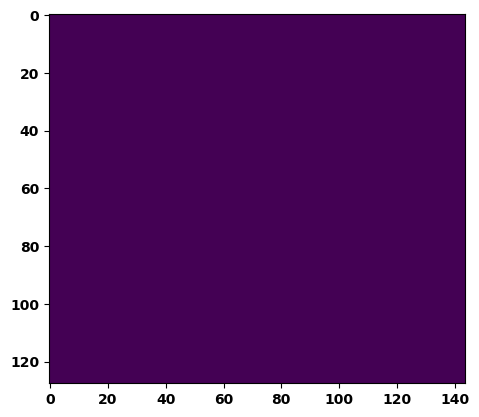

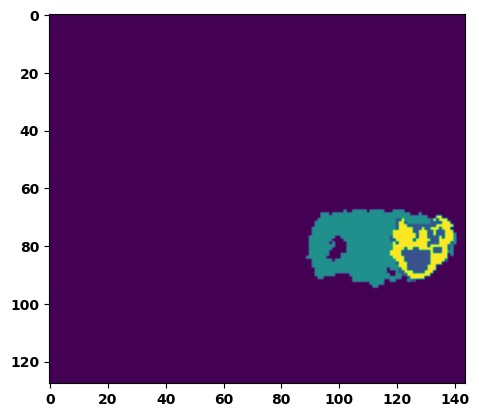

  6%|▌         | 2/36 [00:02<00:48,  1.43s/it]

Batch_id:  1 Eval loss:  0.7651473879814148
Batch_id:  1 Eval IoU:  tensor(0.2209, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8843, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9347, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.41s/it]

Batch_id:  2 Eval loss:  0.6167829036712646
Batch_id:  2 Eval IoU:  tensor(0.3263, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.41s/it]

Batch_id:  3 Eval loss:  0.7089815139770508
Batch_id:  3 Eval IoU:  tensor(0.2623, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9486, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9772, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.39s/it]

Batch_id:  4 Eval loss:  0.7578874826431274
Batch_id:  4 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.38s/it]

Batch_id:  5 Eval loss:  0.7573958039283752
Batch_id:  5 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.41s/it]

Batch_id:  6 Eval loss:  0.7032403349876404
Batch_id:  6 Eval IoU:  tensor(0.2631, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.39s/it]

Batch_id:  7 Eval loss:  0.7579007148742676
Batch_id:  7 Eval IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:38,  1.41s/it]

Batch_id:  8 Eval loss:  0.6786364912986755
Batch_id:  8 Eval IoU:  tensor(0.2669, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8892, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8735, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.43s/it]

Batch_id:  9 Eval loss:  0.6896945238113403
Batch_id:  9 Eval IoU:  tensor(0.2649, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9278, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8919, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9631, device='cuda:0')
Batch_id:  10 Eval loss:  0.6339996457099915
Batch_id:  10 Eval IoU:  tensor(0.3055, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.8956, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.8528, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9475, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


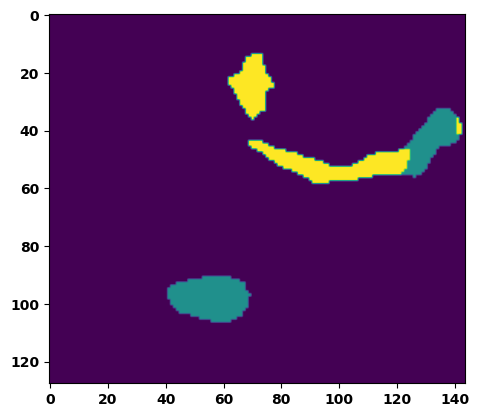

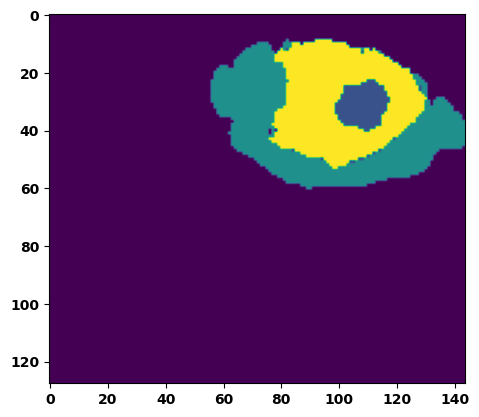

 33%|███▎      | 12/36 [00:17<00:36,  1.52s/it]

Batch_id:  11 Eval loss:  0.6664266586303711
Batch_id:  11 Eval IoU:  tensor(0.2851, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9035, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.8779, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.45s/it]

Batch_id:  12 Eval loss:  0.6186151504516602
Batch_id:  12 Eval IoU:  tensor(0.3230, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8611, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8614, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.8630, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9154, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:30,  1.40s/it]

Batch_id:  13 Eval loss:  0.6407260298728943
Batch_id:  13 Eval IoU:  tensor(0.3086, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9427, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9340, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.39s/it]

Batch_id:  14 Eval loss:  0.6899407505989075
Batch_id:  14 Eval IoU:  tensor(0.2477, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8447, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.7687, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8603, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:27,  1.39s/it]

Batch_id:  15 Eval loss:  0.7480360865592957
Batch_id:  15 Eval IoU:  tensor(0.1592, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5429, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3952, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3171, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.40s/it]

Batch_id:  16 Eval loss:  0.6114438772201538
Batch_id:  16 Eval IoU:  tensor(0.3427, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9553, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.43s/it]

Batch_id:  17 Eval loss:  0.7281416654586792
Batch_id:  17 Eval IoU:  tensor(0.2263, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8748, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8129, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.8657, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.43s/it]

Batch_id:  18 Eval loss:  0.7560205459594727
Batch_id:  18 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.43s/it]

Batch_id:  19 Eval loss:  0.31958550214767456
Batch_id:  19 Eval IoU:  tensor(0.5838, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  20 Eval loss:  0.75810307264328
Batch_id:  20 Eval IoU:  tensor(0.2336, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


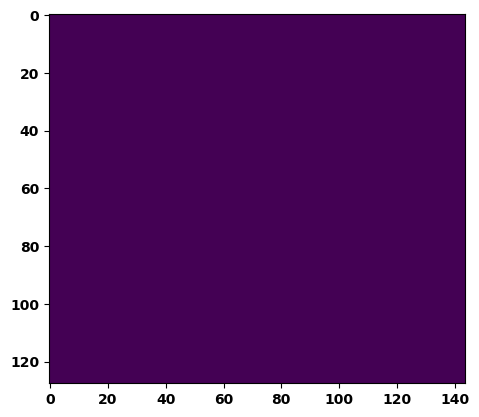

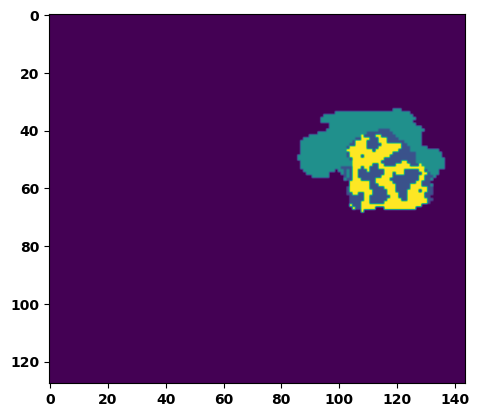

 61%|██████    | 22/36 [00:31<00:20,  1.47s/it]

Batch_id:  21 Eval loss:  0.7682525515556335
Batch_id:  21 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.42s/it]

Batch_id:  22 Eval loss:  0.7517527937889099
Batch_id:  22 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:16,  1.37s/it]

Batch_id:  23 Eval loss:  0.8811559677124023
Batch_id:  23 Eval IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.4982, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4216, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9040, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.2477, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.40s/it]

Batch_id:  24 Eval loss:  0.7587484121322632
Batch_id:  24 Eval IoU:  tensor(0.2300, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9439, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9159, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:13,  1.39s/it]

Batch_id:  25 Eval loss:  0.7749843597412109
Batch_id:  25 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:13,  1.48s/it]

Batch_id:  26 Eval loss:  0.2005842924118042
Batch_id:  26 Eval IoU:  tensor(0.6826, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9750, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.47s/it]

Batch_id:  27 Eval loss:  0.5196961760520935
Batch_id:  27 Eval IoU:  tensor(0.3559, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.5834, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4022, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.4262, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9476, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.42s/it]

Batch_id:  28 Eval loss:  0.5763791799545288
Batch_id:  28 Eval IoU:  tensor(0.2903, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6504, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4803, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.5119, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9693, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.41s/it]

Batch_id:  29 Eval loss:  0.5131489038467407
Batch_id:  29 Eval IoU:  tensor(0.3832, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8651, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8291, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8266, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  30 Eval loss:  0.5022129416465759
Batch_id:  30 Eval IoU:  tensor(0.4020, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9300, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9320, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9550, device='cuda:0')


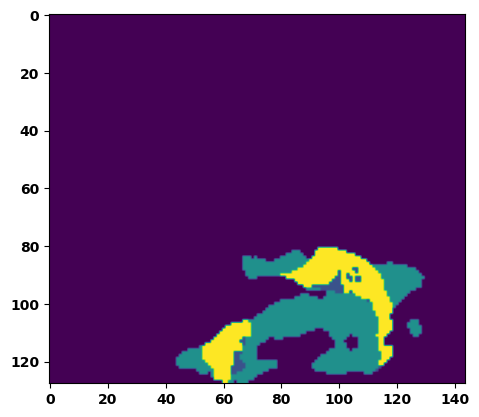

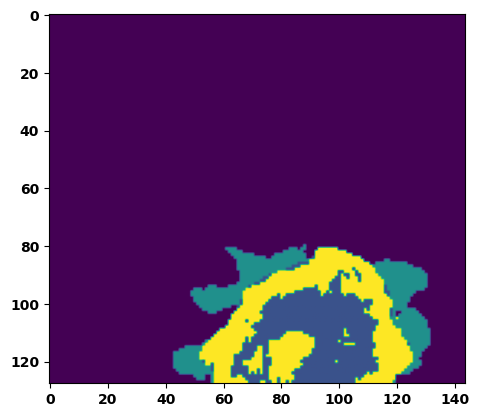

 89%|████████▉ | 32/36 [00:45<00:05,  1.49s/it]

Batch_id:  31 Eval loss:  0.5348591208457947
Batch_id:  31 Eval IoU:  tensor(0.3817, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9254, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9113, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8915, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9845, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.47s/it]

Batch_id:  32 Eval loss:  0.6803340911865234
Batch_id:  32 Eval IoU:  tensor(0.2621, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8658, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8018, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.8853, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.49s/it]

Batch_id:  33 Eval loss:  0.7003263831138611
Batch_id:  33 Eval IoU:  tensor(0.2536, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9161, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8787, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8746, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.47s/it]

Batch_id:  34 Eval loss:  0.45514053106307983
Batch_id:  34 Eval IoU:  tensor(0.4500, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9869, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.8904257416725159
Batch_id:  35 Eval IoU:  tensor(0.0620, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.4638, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.3389, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.1981, device='cuda:0')
Epoch  32 Training loss:  0.13189453916116195
Epoch  32 Evaluation loss:  0.663081395957205
Epoch  32 Training accuracy :  tensor(0.8039)
Epoch  32 Evaluation accuracy :  tensor(0.2857)
Epoch  32 Training Mean Dice Score:  tensor(0.9845)
Epoch  32 Eval Mean Dice Score:  tensor(0.8760)
Epoch  32 Training Non-tumor Dice Score:  tensor(0.9855)
Epoch  32 Eval Non-tumor Dice Score:  tensor(0.8366)
Epoch  32 Training NCR/NET Dice Score:  tensor(0.9931)
Epoch  32 Eval NCR/NET Dice Score:  tensor(0.9596)
Epoch  32 Training ED Dice Score:  tensor(0.982

Epoch completed and model successfully saved
Epoch: 33
Training in session: 


  1%|          | 1/110 [00:01<02:57,  1.63s/it]

Batch_id:  0 Training loss:  0.1354091763496399
Batch_id:  0 Training IoU:  tensor(0.7828, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:50,  1.57s/it]

Batch_id:  1 Training loss:  0.05083823204040527
Batch_id:  1 Training IoU:  tensor(0.9180, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:46,  1.55s/it]

Batch_id:  2 Training loss:  0.14023232460021973
Batch_id:  2 Training IoU:  tensor(0.7829, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:49,  1.60s/it]

Batch_id:  3 Training loss:  0.1189325600862503
Batch_id:  3 Training IoU:  tensor(0.8953, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


  5%|▍         | 5/110 [00:08<02:49,  1.61s/it]

Batch_id:  4 Training loss:  0.09244558215141296
Batch_id:  4 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:50,  1.64s/it]

Batch_id:  5 Training loss:  0.16265593469142914
Batch_id:  5 Training IoU:  tensor(0.7506, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  6%|▋         | 7/110 [00:11<02:40,  1.56s/it]

Batch_id:  6 Training loss:  0.12828154861927032
Batch_id:  6 Training IoU:  tensor(0.7926, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:36,  1.54s/it]

Batch_id:  7 Training loss:  0.07658664882183075
Batch_id:  7 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


  8%|▊         | 9/110 [00:14<02:36,  1.55s/it]

Batch_id:  8 Training loss:  0.07589764893054962
Batch_id:  8 Training IoU:  tensor(0.8696, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:31,  1.51s/it]

Batch_id:  9 Training loss:  0.1246119886636734
Batch_id:  9 Training IoU:  tensor(0.8207, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 10%|█         | 11/110 [00:17<02:30,  1.52s/it]

Batch_id:  10 Training loss:  0.08399379253387451
Batch_id:  10 Training IoU:  tensor(0.8573, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 11%|█         | 12/110 [00:18<02:29,  1.52s/it]

Batch_id:  11 Training loss:  0.09623736143112183
Batch_id:  11 Training IoU:  tensor(0.8409, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 12%|█▏        | 13/110 [00:20<02:25,  1.50s/it]

Batch_id:  12 Training loss:  0.21608512103557587
Batch_id:  12 Training IoU:  tensor(0.7092, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:25,  1.52s/it]

Batch_id:  13 Training loss:  0.08526065945625305
Batch_id:  13 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 14%|█▎        | 15/110 [00:23<02:23,  1.51s/it]

Batch_id:  14 Training loss:  0.3197972774505615
Batch_id:  14 Training IoU:  tensor(0.6302, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:20,  1.50s/it]

Batch_id:  15 Training loss:  0.24189972877502441
Batch_id:  15 Training IoU:  tensor(0.6934, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 15%|█▌        | 17/110 [00:26<02:19,  1.50s/it]

Batch_id:  16 Training loss:  0.09054180979728699
Batch_id:  16 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:16,  1.49s/it]

Batch_id:  17 Training loss:  0.11683695018291473
Batch_id:  17 Training IoU:  tensor(0.8147, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 17%|█▋        | 19/110 [00:29<02:16,  1.50s/it]

Batch_id:  18 Training loss:  0.03141993284225464
Batch_id:  18 Training IoU:  tensor(0.9460, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:15,  1.50s/it]

Batch_id:  19 Training loss:  0.2075400948524475
Batch_id:  19 Training IoU:  tensor(0.7151, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:15,  1.52s/it]

Batch_id:  20 Training loss:  0.24184413254261017
Batch_id:  20 Training IoU:  tensor(0.6722, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 20%|██        | 22/110 [00:33<02:12,  1.51s/it]

Batch_id:  21 Training loss:  0.12870575487613678
Batch_id:  21 Training IoU:  tensor(0.8015, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 21%|██        | 23/110 [00:35<02:10,  1.51s/it]

Batch_id:  22 Training loss:  0.15471552312374115
Batch_id:  22 Training IoU:  tensor(0.7539, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:11,  1.53s/it]

Batch_id:  23 Training loss:  0.12731386721134186
Batch_id:  23 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 23%|██▎       | 25/110 [00:38<02:10,  1.53s/it]

Batch_id:  24 Training loss:  0.0746537297964096
Batch_id:  24 Training IoU:  tensor(0.8694, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:09,  1.54s/it]

Batch_id:  25 Training loss:  0.1574552357196808
Batch_id:  25 Training IoU:  tensor(0.7456, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 25%|██▍       | 27/110 [00:41<02:12,  1.60s/it]

Batch_id:  26 Training loss:  0.08576345443725586
Batch_id:  26 Training IoU:  tensor(0.8538, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:05,  1.52s/it]

Batch_id:  27 Training loss:  0.22193190455436707
Batch_id:  27 Training IoU:  tensor(0.6995, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 26%|██▋       | 29/110 [00:44<02:05,  1.55s/it]

Batch_id:  28 Training loss:  0.1528352051973343
Batch_id:  28 Training IoU:  tensor(0.7878, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 27%|██▋       | 30/110 [00:46<02:04,  1.56s/it]

Batch_id:  29 Training loss:  0.0536089688539505
Batch_id:  29 Training IoU:  tensor(0.9090, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 28%|██▊       | 31/110 [00:47<02:06,  1.60s/it]

Batch_id:  30 Training loss:  0.23012854158878326
Batch_id:  30 Training IoU:  tensor(0.6792, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 29%|██▉       | 32/110 [00:49<02:03,  1.58s/it]

Batch_id:  31 Training loss:  0.06421546638011932
Batch_id:  31 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 30%|███       | 33/110 [00:50<02:00,  1.57s/it]

Batch_id:  32 Training loss:  0.07863050699234009
Batch_id:  32 Training IoU:  tensor(0.9266, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 31%|███       | 34/110 [00:52<02:00,  1.58s/it]

Batch_id:  33 Training loss:  0.10622000694274902
Batch_id:  33 Training IoU:  tensor(0.8178, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 32%|███▏      | 35/110 [00:54<01:56,  1.56s/it]

Batch_id:  34 Training loss:  0.06536585092544556
Batch_id:  34 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 33%|███▎      | 36/110 [00:55<01:56,  1.57s/it]

Batch_id:  35 Training loss:  0.1774861067533493
Batch_id:  35 Training IoU:  tensor(0.7301, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 34%|███▎      | 37/110 [00:57<01:55,  1.58s/it]

Batch_id:  36 Training loss:  0.19663861393928528
Batch_id:  36 Training IoU:  tensor(0.6968, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 35%|███▍      | 38/110 [00:58<01:52,  1.56s/it]

Batch_id:  37 Training loss:  0.10715530812740326
Batch_id:  37 Training IoU:  tensor(0.8174, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 35%|███▌      | 39/110 [01:00<01:49,  1.55s/it]

Batch_id:  38 Training loss:  0.05246686935424805
Batch_id:  38 Training IoU:  tensor(0.9096, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 36%|███▋      | 40/110 [01:01<01:46,  1.53s/it]

Batch_id:  39 Training loss:  0.14773181080818176
Batch_id:  39 Training IoU:  tensor(0.7796, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 37%|███▋      | 41/110 [01:03<01:42,  1.48s/it]

Batch_id:  40 Training loss:  0.08254149556159973
Batch_id:  40 Training IoU:  tensor(0.8622, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 38%|███▊      | 42/110 [01:04<01:39,  1.47s/it]

Batch_id:  41 Training loss:  0.1413048952817917
Batch_id:  41 Training IoU:  tensor(0.7709, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 39%|███▉      | 43/110 [01:06<01:39,  1.49s/it]

Batch_id:  42 Training loss:  0.06786315143108368
Batch_id:  42 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 40%|████      | 44/110 [01:07<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.09235967695713043
Batch_id:  43 Training IoU:  tensor(0.8401, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 41%|████      | 45/110 [01:09<01:36,  1.48s/it]

Batch_id:  44 Training loss:  0.08282473683357239
Batch_id:  44 Training IoU:  tensor(0.8618, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 42%|████▏     | 46/110 [01:10<01:34,  1.48s/it]

Batch_id:  45 Training loss:  0.15786825120449066
Batch_id:  45 Training IoU:  tensor(0.7525, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9832, device='cuda:0')


 43%|████▎     | 47/110 [01:12<01:37,  1.54s/it]

Batch_id:  46 Training loss:  0.10601559281349182
Batch_id:  46 Training IoU:  tensor(0.8376, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 44%|████▎     | 48/110 [01:13<01:32,  1.49s/it]

Batch_id:  47 Training loss:  0.16941794753074646
Batch_id:  47 Training IoU:  tensor(0.7878, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 45%|████▍     | 49/110 [01:14<01:29,  1.46s/it]

Batch_id:  48 Training loss:  0.11155503988265991
Batch_id:  48 Training IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 45%|████▌     | 50/110 [01:16<01:29,  1.50s/it]

Batch_id:  49 Training loss:  0.11678044497966766
Batch_id:  49 Training IoU:  tensor(0.8182, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 46%|████▋     | 51/110 [01:18<01:29,  1.52s/it]

Batch_id:  50 Training loss:  0.0628606379032135
Batch_id:  50 Training IoU:  tensor(0.9269, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 47%|████▋     | 52/110 [01:19<01:26,  1.48s/it]

Batch_id:  51 Training loss:  0.14172403514385223
Batch_id:  51 Training IoU:  tensor(0.7818, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9734, device='cuda:0')


 48%|████▊     | 53/110 [01:20<01:23,  1.46s/it]

Batch_id:  52 Training loss:  0.1160118579864502
Batch_id:  52 Training IoU:  tensor(0.8146, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 49%|████▉     | 54/110 [01:22<01:21,  1.45s/it]

Batch_id:  53 Training loss:  0.1813029795885086
Batch_id:  53 Training IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 50%|█████     | 55/110 [01:23<01:20,  1.46s/it]

Batch_id:  54 Training loss:  0.14185479283332825
Batch_id:  54 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 51%|█████     | 56/110 [01:25<01:19,  1.47s/it]

Batch_id:  55 Training loss:  0.10360267758369446
Batch_id:  55 Training IoU:  tensor(0.8324, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 52%|█████▏    | 57/110 [01:26<01:16,  1.45s/it]

Batch_id:  56 Training loss:  0.1807478815317154
Batch_id:  56 Training IoU:  tensor(0.7838, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 53%|█████▎    | 58/110 [01:28<01:16,  1.47s/it]

Batch_id:  57 Training loss:  0.12864646315574646
Batch_id:  57 Training IoU:  tensor(0.7875, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 54%|█████▎    | 59/110 [01:29<01:15,  1.49s/it]

Batch_id:  58 Training loss:  0.09393781423568726
Batch_id:  58 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 55%|█████▍    | 60/110 [01:31<01:15,  1.51s/it]

Batch_id:  59 Training loss:  0.04564923048019409
Batch_id:  59 Training IoU:  tensor(0.9236, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 55%|█████▌    | 61/110 [01:32<01:15,  1.54s/it]

Batch_id:  60 Training loss:  0.14895331859588623
Batch_id:  60 Training IoU:  tensor(0.7622, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 56%|█████▋    | 62/110 [01:34<01:13,  1.54s/it]

Batch_id:  61 Training loss:  0.18029356002807617
Batch_id:  61 Training IoU:  tensor(0.7410, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 57%|█████▋    | 63/110 [01:36<01:14,  1.58s/it]

Batch_id:  62 Training loss:  0.25354287028312683
Batch_id:  62 Training IoU:  tensor(0.6709, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 58%|█████▊    | 64/110 [01:37<01:11,  1.55s/it]

Batch_id:  63 Training loss:  0.24266885221004486
Batch_id:  63 Training IoU:  tensor(0.6930, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 59%|█████▉    | 65/110 [01:38<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.11741967499256134
Batch_id:  64 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 60%|██████    | 66/110 [01:40<01:05,  1.48s/it]

Batch_id:  65 Training loss:  0.07868771255016327
Batch_id:  65 Training IoU:  tensor(0.8654, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 61%|██████    | 67/110 [01:42<01:04,  1.51s/it]

Batch_id:  66 Training loss:  0.0629226416349411
Batch_id:  66 Training IoU:  tensor(0.8929, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 62%|██████▏   | 68/110 [01:43<01:03,  1.51s/it]

Batch_id:  67 Training loss:  0.1437065452337265
Batch_id:  67 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 63%|██████▎   | 69/110 [01:44<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.1511571705341339
Batch_id:  68 Training IoU:  tensor(0.7626, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 64%|██████▎   | 70/110 [01:46<00:58,  1.45s/it]

Batch_id:  69 Training loss:  0.15093521773815155
Batch_id:  69 Training IoU:  tensor(0.7572, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 65%|██████▍   | 71/110 [01:47<00:56,  1.46s/it]

Batch_id:  70 Training loss:  0.10099351406097412
Batch_id:  70 Training IoU:  tensor(0.8624, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 65%|██████▌   | 72/110 [01:49<00:57,  1.50s/it]

Batch_id:  71 Training loss:  0.06572036445140839
Batch_id:  71 Training IoU:  tensor(0.8880, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 66%|██████▋   | 73/110 [01:50<00:55,  1.51s/it]

Batch_id:  72 Training loss:  0.2229393571615219
Batch_id:  72 Training IoU:  tensor(0.7210, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 67%|██████▋   | 74/110 [01:52<00:52,  1.47s/it]

Batch_id:  73 Training loss:  0.1169452965259552
Batch_id:  73 Training IoU:  tensor(0.8018, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 68%|██████▊   | 75/110 [01:53<00:51,  1.47s/it]

Batch_id:  74 Training loss:  0.09529481828212738
Batch_id:  74 Training IoU:  tensor(0.8430, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 69%|██████▉   | 76/110 [01:55<00:49,  1.46s/it]

Batch_id:  75 Training loss:  0.09030602872371674
Batch_id:  75 Training IoU:  tensor(0.8471, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 70%|███████   | 77/110 [01:56<00:48,  1.47s/it]

Batch_id:  76 Training loss:  0.12145155668258667
Batch_id:  76 Training IoU:  tensor(0.7996, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 71%|███████   | 78/110 [01:58<00:47,  1.48s/it]

Batch_id:  77 Training loss:  0.22671569883823395
Batch_id:  77 Training IoU:  tensor(0.6718, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9632, device='cuda:0')


 72%|███████▏  | 79/110 [01:59<00:44,  1.44s/it]

Batch_id:  78 Training loss:  0.3649165630340576
Batch_id:  78 Training IoU:  tensor(0.5519, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 73%|███████▎  | 80/110 [02:01<00:44,  1.48s/it]

Batch_id:  79 Training loss:  0.09617088735103607
Batch_id:  79 Training IoU:  tensor(0.8396, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 74%|███████▎  | 81/110 [02:02<00:43,  1.49s/it]

Batch_id:  80 Training loss:  0.05805648863315582
Batch_id:  80 Training IoU:  tensor(0.9011, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 75%|███████▍  | 82/110 [02:04<00:40,  1.46s/it]

Batch_id:  81 Training loss:  0.10611623525619507
Batch_id:  81 Training IoU:  tensor(0.8256, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 75%|███████▌  | 83/110 [02:05<00:39,  1.45s/it]

Batch_id:  82 Training loss:  0.07645988464355469
Batch_id:  82 Training IoU:  tensor(0.8718, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 76%|███████▋  | 84/110 [02:06<00:36,  1.40s/it]

Batch_id:  83 Training loss:  0.1113404631614685
Batch_id:  83 Training IoU:  tensor(0.8213, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 77%|███████▋  | 85/110 [02:08<00:35,  1.42s/it]

Batch_id:  84 Training loss:  0.18488244712352753
Batch_id:  84 Training IoU:  tensor(0.7129, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9863, device='cuda:0')


 78%|███████▊  | 86/110 [02:09<00:33,  1.40s/it]

Batch_id:  85 Training loss:  0.2217535376548767
Batch_id:  85 Training IoU:  tensor(0.7466, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 79%|███████▉  | 87/110 [02:10<00:31,  1.38s/it]

Batch_id:  86 Training loss:  0.055484578013420105
Batch_id:  86 Training IoU:  tensor(0.9024, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 80%|████████  | 88/110 [02:12<00:30,  1.39s/it]

Batch_id:  87 Training loss:  0.10337808728218079
Batch_id:  87 Training IoU:  tensor(0.8266, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 81%|████████  | 89/110 [02:13<00:30,  1.43s/it]

Batch_id:  88 Training loss:  0.09835213422775269
Batch_id:  88 Training IoU:  tensor(0.8325, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 82%|████████▏ | 90/110 [02:15<00:28,  1.45s/it]

Batch_id:  89 Training loss:  0.255967915058136
Batch_id:  89 Training IoU:  tensor(0.6435, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 83%|████████▎ | 91/110 [02:16<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.06307056546211243
Batch_id:  90 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 84%|████████▎ | 92/110 [02:18<00:25,  1.44s/it]

Batch_id:  91 Training loss:  0.09545370936393738
Batch_id:  91 Training IoU:  tensor(0.8348, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 85%|████████▍ | 93/110 [02:19<00:24,  1.46s/it]

Batch_id:  92 Training loss:  0.11238974332809448
Batch_id:  92 Training IoU:  tensor(0.8152, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 85%|████████▌ | 94/110 [02:21<00:23,  1.48s/it]

Batch_id:  93 Training loss:  0.13716070353984833
Batch_id:  93 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 86%|████████▋ | 95/110 [02:22<00:22,  1.47s/it]

Batch_id:  94 Training loss:  0.13543851673603058
Batch_id:  94 Training IoU:  tensor(0.7753, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 87%|████████▋ | 96/110 [02:24<00:20,  1.47s/it]

Batch_id:  95 Training loss:  0.07308012247085571
Batch_id:  95 Training IoU:  tensor(0.8762, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 88%|████████▊ | 97/110 [02:25<00:19,  1.47s/it]

Batch_id:  96 Training loss:  0.1074749082326889
Batch_id:  96 Training IoU:  tensor(0.8230, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 89%|████████▉ | 98/110 [02:27<00:17,  1.48s/it]

Batch_id:  97 Training loss:  0.3044368624687195
Batch_id:  97 Training IoU:  tensor(0.6110, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 90%|█████████ | 99/110 [02:28<00:15,  1.45s/it]

Batch_id:  98 Training loss:  0.1206250935792923
Batch_id:  98 Training IoU:  tensor(0.7987, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 91%|█████████ | 100/110 [02:29<00:14,  1.44s/it]

Batch_id:  99 Training loss:  0.05376917123794556
Batch_id:  99 Training IoU:  tensor(0.9066, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 92%|█████████▏| 101/110 [02:31<00:13,  1.47s/it]

Batch_id:  100 Training loss:  0.14074020087718964
Batch_id:  100 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 93%|█████████▎| 102/110 [02:32<00:11,  1.42s/it]

Batch_id:  101 Training loss:  0.18250268697738647
Batch_id:  101 Training IoU:  tensor(0.7258, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 94%|█████████▎| 103/110 [02:34<00:10,  1.49s/it]

Batch_id:  102 Training loss:  0.24431021511554718
Batch_id:  102 Training IoU:  tensor(0.6998, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 95%|█████████▍| 104/110 [02:35<00:08,  1.45s/it]

Batch_id:  103 Training loss:  0.21803167462348938
Batch_id:  103 Training IoU:  tensor(0.6903, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 95%|█████████▌| 105/110 [02:37<00:07,  1.44s/it]

Batch_id:  104 Training loss:  0.06303267180919647
Batch_id:  104 Training IoU:  tensor(0.8922, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 96%|█████████▋| 106/110 [02:38<00:05,  1.41s/it]

Batch_id:  105 Training loss:  0.05720004439353943
Batch_id:  105 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 97%|█████████▋| 107/110 [02:40<00:04,  1.44s/it]

Batch_id:  106 Training loss:  0.08269266784191132
Batch_id:  106 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 98%|█████████▊| 108/110 [02:41<00:02,  1.43s/it]

Batch_id:  107 Training loss:  0.14586158096790314
Batch_id:  107 Training IoU:  tensor(0.7740, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 99%|█████████▉| 109/110 [02:42<00:01,  1.43s/it]

Batch_id:  108 Training loss:  0.21906836330890656
Batch_id:  108 Training IoU:  tensor(0.7154, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


100%|██████████| 110/110 [02:44<00:00,  1.49s/it]


Batch_id:  109 Training loss:  0.07224403321743011
Batch_id:  109 Training IoU:  tensor(0.8760, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9907, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6300960779190063
Batch_id:  0 Eval IoU:  tensor(0.2456, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.5245, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3139, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9245, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.4157, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9194, device='cuda:0')


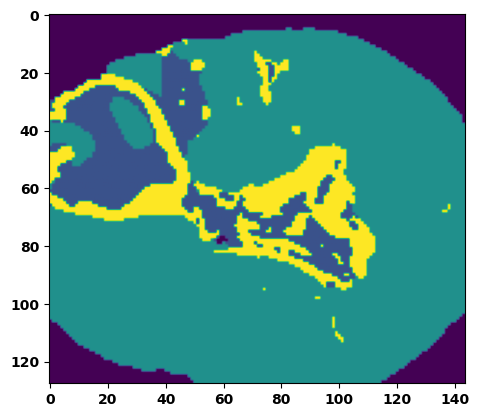

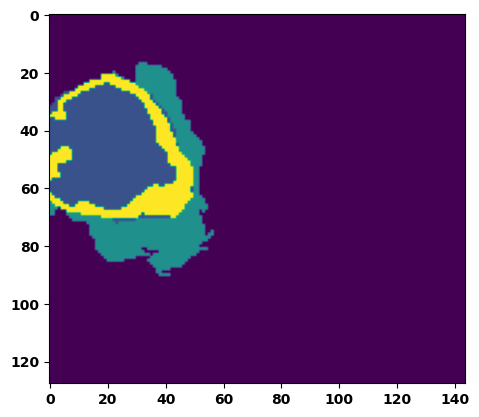

  6%|▌         | 2/36 [00:02<00:49,  1.47s/it]

Batch_id:  1 Eval loss:  0.6532999277114868
Batch_id:  1 Eval IoU:  tensor(0.2932, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.39s/it]

Batch_id:  2 Eval loss:  0.7682175040245056
Batch_id:  2 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.41s/it]

Batch_id:  3 Eval loss:  0.6298508048057556
Batch_id:  3 Eval IoU:  tensor(0.3261, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.8854, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.8672, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.8322, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9714, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.44s/it]

Batch_id:  4 Eval loss:  0.20758913457393646
Batch_id:  4 Eval IoU:  tensor(0.6810, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9662, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.42s/it]

Batch_id:  5 Eval loss:  0.6388987302780151
Batch_id:  5 Eval IoU:  tensor(0.2345, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.6293, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4487, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.5283, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9439, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.6480084657669067
Batch_id:  6 Eval IoU:  tensor(0.2925, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8980, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8879, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.8692, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9837, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.8914991617202759
Batch_id:  7 Eval IoU:  tensor(0.0654, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4991, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.2536, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.2705, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:36,  1.37s/it]

Batch_id:  8 Eval loss:  0.3682629466056824
Batch_id:  8 Eval IoU:  tensor(0.5673, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9373, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9146, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9944, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:35,  1.35s/it]

Batch_id:  9 Eval loss:  0.7517076730728149
Batch_id:  9 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  10 Eval loss:  0.7570000290870667
Batch_id:  10 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9351, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


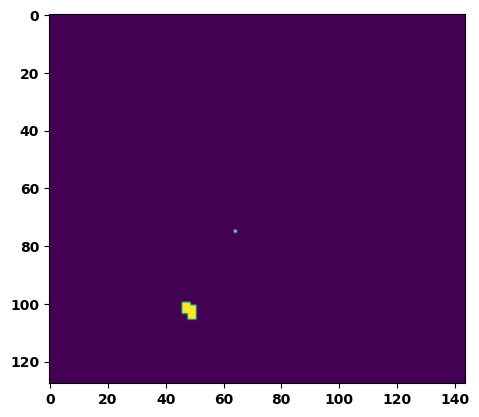

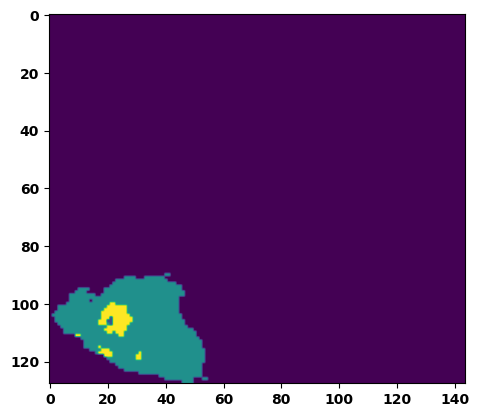

 33%|███▎      | 12/36 [00:16<00:33,  1.42s/it]

Batch_id:  11 Eval loss:  0.6871328949928284
Batch_id:  11 Eval IoU:  tensor(0.2707, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9269, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9895, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.39s/it]

Batch_id:  12 Eval loss:  0.7411490678787231
Batch_id:  12 Eval IoU:  tensor(0.1778, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6323, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.5208, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.6263, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8063, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9436, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:30,  1.39s/it]

Batch_id:  13 Eval loss:  0.5840310454368591
Batch_id:  13 Eval IoU:  tensor(0.2956, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.7478, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.6524, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9087, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.7136, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9688, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.39s/it]

Batch_id:  14 Eval loss:  0.17981737852096558
Batch_id:  14 Eval IoU:  tensor(0.7205, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9846, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:27,  1.38s/it]

Batch_id:  15 Eval loss:  0.5734919309616089
Batch_id:  15 Eval IoU:  tensor(0.3578, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:27,  1.43s/it]

Batch_id:  16 Eval loss:  0.8823999762535095
Batch_id:  16 Eval IoU:  tensor(0.0752, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.4965, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.4190, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.2449, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.42s/it]

Batch_id:  17 Eval loss:  0.6777158379554749
Batch_id:  17 Eval IoU:  tensor(0.2456, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.7576, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.6985, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.6563, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9289, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:23,  1.37s/it]

Batch_id:  18 Eval loss:  0.6996572613716125
Batch_id:  18 Eval IoU:  tensor(0.2668, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9325, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9146, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 56%|█████▌    | 20/36 [00:27<00:21,  1.36s/it]

Batch_id:  19 Eval loss:  0.6851422190666199
Batch_id:  19 Eval IoU:  tensor(0.2258, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.6313, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5505, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.4708, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')
Batch_id:  20 Eval loss:  0.6702792048454285
Batch_id:  20 Eval IoU:  tensor(0.2850, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


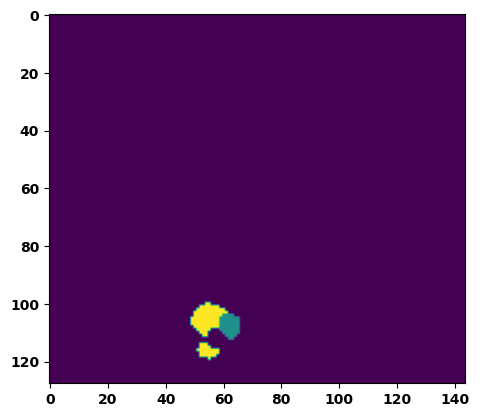

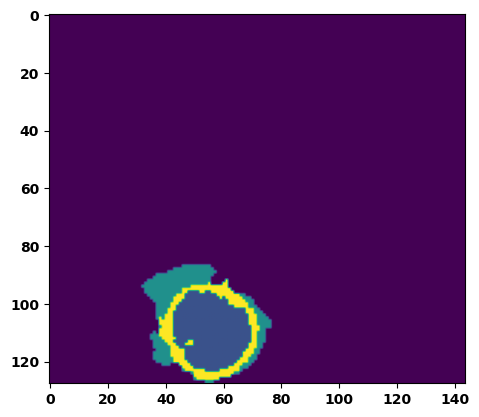

 61%|██████    | 22/36 [00:30<00:19,  1.42s/it]

Batch_id:  21 Eval loss:  0.5888539552688599
Batch_id:  21 Eval IoU:  tensor(0.3539, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8909, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8540, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9202, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.45s/it]

Batch_id:  22 Eval loss:  0.7213661670684814
Batch_id:  22 Eval IoU:  tensor(0.2558, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9604, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9410, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:18,  1.51s/it]

Batch_id:  23 Eval loss:  0.8208978176116943
Batch_id:  23 Eval IoU:  tensor(0.1235, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.5983, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.4274, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.4022, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:16,  1.49s/it]

Batch_id:  24 Eval loss:  0.5644561052322388
Batch_id:  24 Eval IoU:  tensor(0.3381, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.8528, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8760, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9138, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.7839, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9847, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:15,  1.50s/it]

Batch_id:  25 Eval loss:  0.7892746329307556
Batch_id:  25 Eval IoU:  tensor(0.1395, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.5973, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4192, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.3975, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.43s/it]

Batch_id:  26 Eval loss:  0.7564938068389893
Batch_id:  26 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:11,  1.45s/it]

Batch_id:  27 Eval loss:  0.6956576108932495
Batch_id:  27 Eval IoU:  tensor(0.2105, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.5493, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.3922, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.3296, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.40s/it]

Batch_id:  28 Eval loss:  0.8903082013130188
Batch_id:  28 Eval IoU:  tensor(0.0630, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4613, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3347, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9013, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.1977, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.42s/it]

Batch_id:  29 Eval loss:  0.8138085007667542
Batch_id:  29 Eval IoU:  tensor(0.1167, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5256, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3770, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.2961, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  30 Eval loss:  0.6260972619056702
Batch_id:  30 Eval IoU:  tensor(0.3176, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


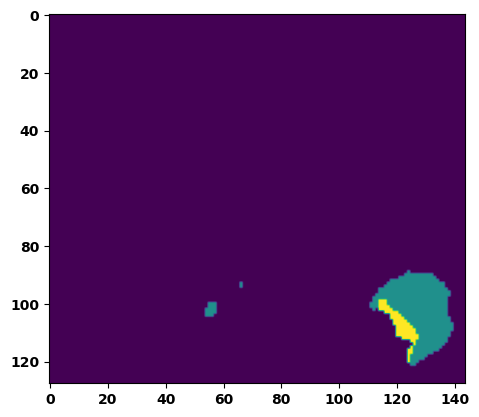

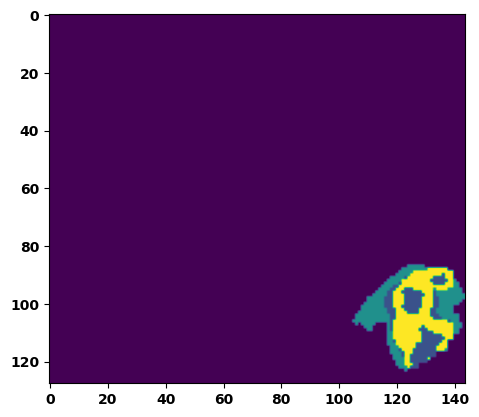

 89%|████████▉ | 32/36 [00:45<00:05,  1.45s/it]

Batch_id:  31 Eval loss:  0.41562333703041077
Batch_id:  31 Eval IoU:  tensor(0.4814, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9690, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.49s/it]

Batch_id:  32 Eval loss:  0.5661540627479553
Batch_id:  32 Eval IoU:  tensor(0.3883, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9287, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:03,  1.50s/it]

Batch_id:  33 Eval loss:  0.19752758741378784
Batch_id:  33 Eval IoU:  tensor(0.6938, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9731, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.50s/it]

Batch_id:  34 Eval loss:  0.7328385710716248
Batch_id:  34 Eval IoU:  tensor(0.2286, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8799, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8206, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.6622198224067688
Batch_id:  35 Eval IoU:  tensor(0.2944, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9425, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')
Epoch  33 Training loss:  0.13161234354430978
Epoch  33 Evaluation loss:  0.6435229087041484
Epoch  33 Training accuracy :  tensor(0.8040)
Epoch  33 Evaluation accuracy :  tensor(0.2932)
Epoch  33 Training Mean Dice Score:  tensor(0.9845)
Epoch  33 Eval Mean Dice Score:  tensor(0.8126)
Epoch  33 Training Non-tumor Dice Score:  tensor(0.9856)
Epoch  33 Eval Non-tumor Dice Score:  tensor(0.7545)
Epoch  33 Training NCR/NET Dice Score:  tensor(0.9931)
Epoch  33 Eval NCR/NET Dice Score:  tensor(0.8738)
Epoch  33 Training ED Dice Score:  tensor(0.98

Epoch: 34
Training in session: 


  1%|          | 1/110 [00:01<02:50,  1.56s/it]

Batch_id:  0 Training loss:  0.13042420148849487
Batch_id:  0 Training IoU:  tensor(0.7971, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:36,  1.45s/it]

Batch_id:  1 Training loss:  0.1359434425830841
Batch_id:  1 Training IoU:  tensor(0.7884, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9742, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:32,  1.43s/it]

Batch_id:  2 Training loss:  0.06685352325439453
Batch_id:  2 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:32,  1.44s/it]

Batch_id:  3 Training loss:  0.0552668571472168
Batch_id:  3 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:28,  1.41s/it]

Batch_id:  4 Training loss:  0.1846955418586731
Batch_id:  4 Training IoU:  tensor(0.7207, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:24,  1.39s/it]

Batch_id:  5 Training loss:  0.07159101963043213
Batch_id:  5 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  6%|▋         | 7/110 [00:09<02:21,  1.38s/it]

Batch_id:  6 Training loss:  0.13597451150417328
Batch_id:  6 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:23,  1.41s/it]

Batch_id:  7 Training loss:  0.07668669521808624
Batch_id:  7 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:22,  1.41s/it]

Batch_id:  8 Training loss:  0.12341833114624023
Batch_id:  8 Training IoU:  tensor(0.7966, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:23,  1.43s/it]

Batch_id:  9 Training loss:  0.10970018804073334
Batch_id:  9 Training IoU:  tensor(0.8136, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 10%|█         | 11/110 [00:15<02:22,  1.44s/it]

Batch_id:  10 Training loss:  0.053649500012397766
Batch_id:  10 Training IoU:  tensor(0.9065, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 11%|█         | 12/110 [00:17<02:23,  1.46s/it]

Batch_id:  11 Training loss:  0.07632146775722504
Batch_id:  11 Training IoU:  tensor(0.9284, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:21,  1.46s/it]

Batch_id:  12 Training loss:  0.1425681859254837
Batch_id:  12 Training IoU:  tensor(0.7689, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:21,  1.48s/it]

Batch_id:  13 Training loss:  0.21494634449481964
Batch_id:  13 Training IoU:  tensor(0.7107, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:20,  1.48s/it]

Batch_id:  14 Training loss:  0.1818287968635559
Batch_id:  14 Training IoU:  tensor(0.7838, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:15,  1.44s/it]

Batch_id:  15 Training loss:  0.22479651868343353
Batch_id:  15 Training IoU:  tensor(0.7197, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:11,  1.42s/it]

Batch_id:  16 Training loss:  0.15548813343048096
Batch_id:  16 Training IoU:  tensor(0.7540, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:11,  1.43s/it]

Batch_id:  17 Training loss:  0.15695109963417053
Batch_id:  17 Training IoU:  tensor(0.7535, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9833, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:19,  1.53s/it]

Batch_id:  18 Training loss:  0.22913795709609985
Batch_id:  18 Training IoU:  tensor(0.6797, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9456, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:17,  1.53s/it]

Batch_id:  19 Training loss:  0.11403107643127441
Batch_id:  19 Training IoU:  tensor(0.8215, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:18,  1.55s/it]

Batch_id:  20 Training loss:  0.06453722715377808
Batch_id:  20 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 20%|██        | 22/110 [00:32<02:13,  1.52s/it]

Batch_id:  21 Training loss:  0.09437631070613861
Batch_id:  21 Training IoU:  tensor(0.8371, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 21%|██        | 23/110 [00:33<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.030347734689712524
Batch_id:  22 Training IoU:  tensor(0.9486, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:06,  1.47s/it]

Batch_id:  23 Training loss:  0.22114726901054382
Batch_id:  23 Training IoU:  tensor(0.7005, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:04,  1.46s/it]

Batch_id:  24 Training loss:  0.1090133935213089
Batch_id:  24 Training IoU:  tensor(0.8297, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:00,  1.43s/it]

Batch_id:  25 Training loss:  0.1161029189825058
Batch_id:  25 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:57,  1.41s/it]

Batch_id:  26 Training loss:  0.22199970483779907
Batch_id:  26 Training IoU:  tensor(0.6768, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9637, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:52,  1.38s/it]

Batch_id:  27 Training loss:  0.0765065848827362
Batch_id:  27 Training IoU:  tensor(0.8721, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.06841173768043518
Batch_id:  28 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:56,  1.45s/it]

Batch_id:  29 Training loss:  0.3015688359737396
Batch_id:  29 Training IoU:  tensor(0.6139, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:55,  1.46s/it]

Batch_id:  30 Training loss:  0.21656939387321472
Batch_id:  30 Training IoU:  tensor(0.6942, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:56,  1.50s/it]

Batch_id:  31 Training loss:  0.0750950276851654
Batch_id:  31 Training IoU:  tensor(0.8711, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 30%|███       | 33/110 [00:48<01:54,  1.49s/it]

Batch_id:  32 Training loss:  0.24069848656654358
Batch_id:  32 Training IoU:  tensor(0.7049, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 31%|███       | 34/110 [00:49<01:49,  1.44s/it]

Batch_id:  33 Training loss:  0.08513656258583069
Batch_id:  33 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.1790134757757187
Batch_id:  34 Training IoU:  tensor(0.7292, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:47,  1.45s/it]

Batch_id:  35 Training loss:  0.14640171825885773
Batch_id:  35 Training IoU:  tensor(0.7979, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:47,  1.47s/it]

Batch_id:  36 Training loss:  0.05709296464920044
Batch_id:  36 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:46,  1.48s/it]

Batch_id:  37 Training loss:  0.18858924508094788
Batch_id:  37 Training IoU:  tensor(0.7121, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:48,  1.53s/it]

Batch_id:  38 Training loss:  0.1099337786436081
Batch_id:  38 Training IoU:  tensor(0.8189, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:44,  1.49s/it]

Batch_id:  39 Training loss:  0.05818982422351837
Batch_id:  39 Training IoU:  tensor(0.9008, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:43,  1.50s/it]

Batch_id:  40 Training loss:  0.0788290798664093
Batch_id:  40 Training IoU:  tensor(0.8648, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:40,  1.48s/it]

Batch_id:  41 Training loss:  0.11647965013980865
Batch_id:  41 Training IoU:  tensor(0.8056, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:45,  1.57s/it]

Batch_id:  42 Training loss:  0.09989310801029205
Batch_id:  42 Training IoU:  tensor(0.8636, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 40%|████      | 44/110 [01:04<01:40,  1.52s/it]

Batch_id:  43 Training loss:  0.10225589573383331
Batch_id:  43 Training IoU:  tensor(0.8344, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 41%|████      | 45/110 [01:06<01:43,  1.59s/it]

Batch_id:  44 Training loss:  0.2530946731567383
Batch_id:  44 Training IoU:  tensor(0.6725, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:40,  1.57s/it]

Batch_id:  45 Training loss:  0.05777919292449951
Batch_id:  45 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:40,  1.59s/it]

Batch_id:  46 Training loss:  0.045313045382499695
Batch_id:  46 Training IoU:  tensor(0.9245, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:36,  1.55s/it]

Batch_id:  47 Training loss:  0.1351989358663559
Batch_id:  47 Training IoU:  tensor(0.7830, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9749, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:33,  1.53s/it]

Batch_id:  48 Training loss:  0.09240895509719849
Batch_id:  48 Training IoU:  tensor(0.8442, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:31,  1.52s/it]

Batch_id:  49 Training loss:  0.3604021668434143
Batch_id:  49 Training IoU:  tensor(0.5539, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:29,  1.51s/it]

Batch_id:  50 Training loss:  0.08228194713592529
Batch_id:  50 Training IoU:  tensor(0.8610, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:26,  1.50s/it]

Batch_id:  51 Training loss:  0.06660400331020355
Batch_id:  51 Training IoU:  tensor(0.8856, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:24,  1.49s/it]

Batch_id:  52 Training loss:  0.1477104127407074
Batch_id:  52 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:23,  1.50s/it]

Batch_id:  53 Training loss:  0.210023894906044
Batch_id:  53 Training IoU:  tensor(0.7656, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:22,  1.49s/it]

Batch_id:  54 Training loss:  0.08212816715240479
Batch_id:  54 Training IoU:  tensor(0.8632, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:21,  1.52s/it]

Batch_id:  55 Training loss:  0.06340713798999786
Batch_id:  55 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:20,  1.51s/it]

Batch_id:  56 Training loss:  0.17569686472415924
Batch_id:  56 Training IoU:  tensor(0.7449, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:19,  1.53s/it]

Batch_id:  57 Training loss:  0.10771854221820831
Batch_id:  57 Training IoU:  tensor(0.8225, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:17,  1.51s/it]

Batch_id:  58 Training loss:  0.05301690101623535
Batch_id:  58 Training IoU:  tensor(0.9080, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:14,  1.49s/it]

Batch_id:  59 Training loss:  0.24223710596561432
Batch_id:  59 Training IoU:  tensor(0.6897, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:11,  1.45s/it]

Batch_id:  60 Training loss:  0.09233324229717255
Batch_id:  60 Training IoU:  tensor(0.8521, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:11,  1.48s/it]

Batch_id:  61 Training loss:  0.0926135778427124
Batch_id:  61 Training IoU:  tensor(0.8410, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:09,  1.48s/it]

Batch_id:  62 Training loss:  0.2504819333553314
Batch_id:  62 Training IoU:  tensor(0.6516, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:09,  1.50s/it]

Batch_id:  63 Training loss:  0.1354929655790329
Batch_id:  63 Training IoU:  tensor(0.7942, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:06,  1.48s/it]

Batch_id:  64 Training loss:  0.10010197758674622
Batch_id:  64 Training IoU:  tensor(0.8337, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:04,  1.45s/it]

Batch_id:  65 Training loss:  0.1383550763130188
Batch_id:  65 Training IoU:  tensor(0.7851, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:02,  1.45s/it]

Batch_id:  66 Training loss:  0.11246395111083984
Batch_id:  66 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:01,  1.46s/it]

Batch_id:  67 Training loss:  0.07312805950641632
Batch_id:  67 Training IoU:  tensor(0.8758, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.10202564299106598
Batch_id:  68 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:57,  1.44s/it]

Batch_id:  69 Training loss:  0.14102692902088165
Batch_id:  69 Training IoU:  tensor(0.7934, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<00:58,  1.50s/it]

Batch_id:  70 Training loss:  0.10841694474220276
Batch_id:  70 Training IoU:  tensor(0.8144, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:57,  1.51s/it]

Batch_id:  71 Training loss:  0.08582264184951782
Batch_id:  71 Training IoU:  tensor(0.8528, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:56,  1.53s/it]

Batch_id:  72 Training loss:  0.21664310991764069
Batch_id:  72 Training IoU:  tensor(0.7183, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:55,  1.54s/it]

Batch_id:  73 Training loss:  0.09672313928604126
Batch_id:  73 Training IoU:  tensor(0.8386, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:53,  1.52s/it]

Batch_id:  74 Training loss:  0.09595926105976105
Batch_id:  74 Training IoU:  tensor(0.8415, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:50,  1.50s/it]

Batch_id:  75 Training loss:  0.18785302340984344
Batch_id:  75 Training IoU:  tensor(0.7098, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:48,  1.47s/it]

Batch_id:  76 Training loss:  0.12554942071437836
Batch_id:  76 Training IoU:  tensor(0.7901, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:46,  1.46s/it]

Batch_id:  77 Training loss:  0.1507425308227539
Batch_id:  77 Training IoU:  tensor(0.7584, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:46,  1.49s/it]

Batch_id:  78 Training loss:  0.1473294496536255
Batch_id:  78 Training IoU:  tensor(0.7722, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:44,  1.49s/it]

Batch_id:  79 Training loss:  0.17143359780311584
Batch_id:  79 Training IoU:  tensor(0.7881, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:43,  1.50s/it]

Batch_id:  80 Training loss:  0.06615522503852844
Batch_id:  80 Training IoU:  tensor(0.9197, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:40,  1.46s/it]

Batch_id:  81 Training loss:  0.12507781386375427
Batch_id:  81 Training IoU:  tensor(0.8202, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:41,  1.52s/it]

Batch_id:  82 Training loss:  0.11556245386600494
Batch_id:  82 Training IoU:  tensor(0.9057, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:39,  1.52s/it]

Batch_id:  83 Training loss:  0.32205674052238464
Batch_id:  83 Training IoU:  tensor(0.6268, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:40,  1.61s/it]

Batch_id:  84 Training loss:  0.10554707050323486
Batch_id:  84 Training IoU:  tensor(0.8387, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:37,  1.58s/it]

Batch_id:  85 Training loss:  0.1396578699350357
Batch_id:  85 Training IoU:  tensor(0.8089, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:35,  1.53s/it]

Batch_id:  86 Training loss:  0.1497218906879425
Batch_id:  86 Training IoU:  tensor(0.7583, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:33,  1.53s/it]

Batch_id:  87 Training loss:  0.08226342499256134
Batch_id:  87 Training IoU:  tensor(0.8574, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:31,  1.49s/it]

Batch_id:  88 Training loss:  0.16352148354053497
Batch_id:  88 Training IoU:  tensor(0.7487, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:29,  1.49s/it]

Batch_id:  89 Training loss:  0.20468981564044952
Batch_id:  89 Training IoU:  tensor(0.7185, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:28,  1.52s/it]

Batch_id:  90 Training loss:  0.06273028254508972
Batch_id:  90 Training IoU:  tensor(0.8901, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:26,  1.48s/it]

Batch_id:  91 Training loss:  0.12865792214870453
Batch_id:  91 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:24,  1.45s/it]

Batch_id:  92 Training loss:  0.09007403254508972
Batch_id:  92 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:23,  1.49s/it]

Batch_id:  93 Training loss:  0.08459235727787018
Batch_id:  93 Training IoU:  tensor(0.8567, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:22,  1.49s/it]

Batch_id:  94 Training loss:  0.07439619302749634
Batch_id:  94 Training IoU:  tensor(0.8692, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:20,  1.47s/it]

Batch_id:  95 Training loss:  0.08811219036579132
Batch_id:  95 Training IoU:  tensor(0.8468, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 88%|████████▊ | 97/110 [02:24<00:18,  1.45s/it]

Batch_id:  96 Training loss:  0.1272834837436676
Batch_id:  96 Training IoU:  tensor(0.8110, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:16,  1.37s/it]

Batch_id:  97 Training loss:  0.15212583541870117
Batch_id:  97 Training IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.40s/it]

Batch_id:  98 Training loss:  0.14411546289920807
Batch_id:  98 Training IoU:  tensor(0.7650, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:14,  1.41s/it]

Batch_id:  99 Training loss:  0.11093837022781372
Batch_id:  99 Training IoU:  tensor(0.8209, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:12,  1.40s/it]

Batch_id:  100 Training loss:  0.11295375227928162
Batch_id:  100 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 93%|█████████▎| 102/110 [02:31<00:11,  1.44s/it]

Batch_id:  101 Training loss:  0.054567188024520874
Batch_id:  101 Training IoU:  tensor(0.9071, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:09,  1.40s/it]

Batch_id:  102 Training loss:  0.24182674288749695
Batch_id:  102 Training IoU:  tensor(0.6985, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9546, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 95%|█████████▍| 104/110 [02:34<00:08,  1.49s/it]

Batch_id:  103 Training loss:  0.050863832235336304
Batch_id:  103 Training IoU:  tensor(0.9181, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.49s/it]

Batch_id:  104 Training loss:  0.15860694646835327
Batch_id:  104 Training IoU:  tensor(0.7440, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.46s/it]

Batch_id:  105 Training loss:  0.11694034934043884
Batch_id:  105 Training IoU:  tensor(0.8151, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.49s/it]

Batch_id:  106 Training loss:  0.09747388958930969
Batch_id:  106 Training IoU:  tensor(0.8341, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.48s/it]

Batch_id:  107 Training loss:  0.19646862149238586
Batch_id:  107 Training IoU:  tensor(0.6975, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9611, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.54s/it]

Batch_id:  108 Training loss:  0.243783637881279
Batch_id:  108 Training IoU:  tensor(0.6697, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


100%|██████████| 110/110 [02:43<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.1205020546913147
Batch_id:  109 Training IoU:  tensor(0.7986, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9857, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.530829131603241
Batch_id:  0 Eval IoU:  tensor(0.4274, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


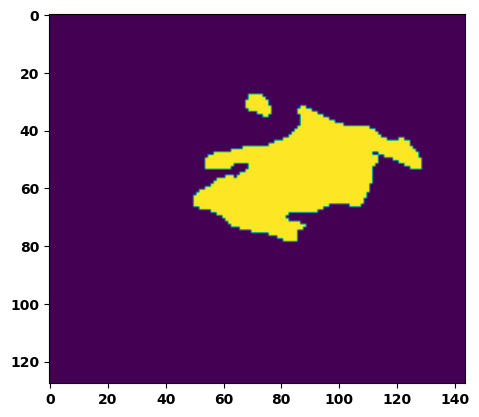

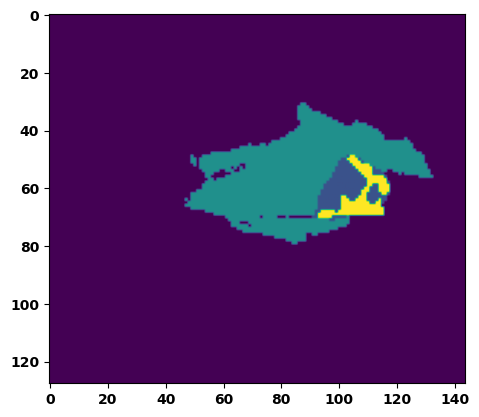

  6%|▌         | 2/36 [00:02<00:49,  1.46s/it]

Batch_id:  1 Eval loss:  0.38948914408683777
Batch_id:  1 Eval IoU:  tensor(0.5042, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9936, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.40s/it]

Batch_id:  2 Eval loss:  0.059367045760154724
Batch_id:  2 Eval IoU:  tensor(0.8942, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9897, device='cuda:0')


 11%|█         | 4/36 [00:05<00:42,  1.34s/it]

Batch_id:  3 Eval loss:  0.7517397403717041
Batch_id:  3 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:39,  1.28s/it]

Batch_id:  4 Eval loss:  0.7007738351821899
Batch_id:  4 Eval IoU:  tensor(0.2623, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9262, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9104, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9755, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:39,  1.33s/it]

Batch_id:  5 Eval loss:  0.8501526117324829
Batch_id:  5 Eval IoU:  tensor(0.0926, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5310, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3918, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2969, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:38,  1.34s/it]

Batch_id:  6 Eval loss:  0.7749241590499878
Batch_id:  6 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 22%|██▏       | 8/36 [00:10<00:36,  1.32s/it]

Batch_id:  7 Eval loss:  0.9024946093559265
Batch_id:  7 Eval IoU:  tensor(0.0574, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4609, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3351, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.1913, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:36,  1.35s/it]

Batch_id:  8 Eval loss:  0.12251140177249908
Batch_id:  8 Eval IoU:  tensor(0.8079, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9982, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:35,  1.35s/it]

Batch_id:  9 Eval loss:  0.6173663139343262
Batch_id:  9 Eval IoU:  tensor(0.2971, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.8611, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.7984, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.8553, device='cuda:0')
Batch_id:  10 Eval loss:  0.7011200189590454
Batch_id:  10 Eval IoU:  tensor(0.2100, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.6961, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.6296, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9187, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.8479, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.6921, device='cuda:0')


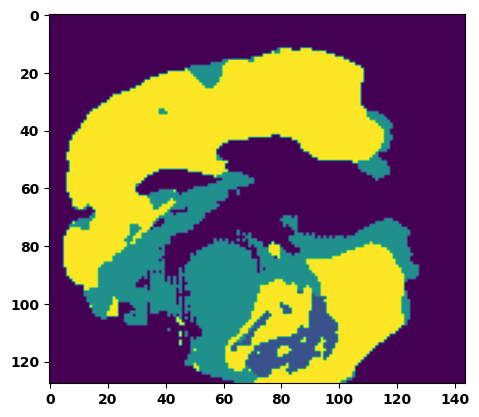

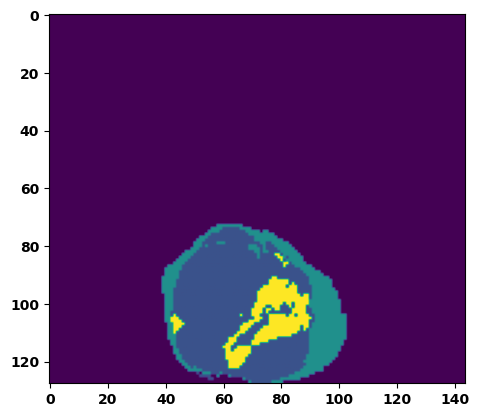

 33%|███▎      | 12/36 [00:16<00:33,  1.41s/it]

Batch_id:  11 Eval loss:  0.6426267623901367
Batch_id:  11 Eval IoU:  tensor(0.3076, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 36%|███▌      | 13/36 [00:17<00:32,  1.40s/it]

Batch_id:  12 Eval loss:  0.7579341530799866
Batch_id:  12 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:30,  1.38s/it]

Batch_id:  13 Eval loss:  0.8517487049102783
Batch_id:  13 Eval IoU:  tensor(0.0970, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.5334, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4403, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8631, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.3021, device='cuda:0')


 42%|████▏     | 15/36 [00:20<00:28,  1.34s/it]

Batch_id:  14 Eval loss:  0.6669288873672485
Batch_id:  14 Eval IoU:  tensor(0.2849, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 44%|████▍     | 16/36 [00:21<00:27,  1.36s/it]

Batch_id:  15 Eval loss:  0.7559950947761536
Batch_id:  15 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  16 Eval loss:  0.590084969997406
Batch_id:  16 Eval IoU:  tensor(0.3658, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:27,  1.45s/it]

Batch_id:  16 Eval Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 50%|█████     | 18/36 [00:24<00:25,  1.42s/it]

Batch_id:  17 Eval loss:  0.525128960609436
Batch_id:  17 Eval IoU:  tensor(0.3874, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9185, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9303, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9277, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:25,  1.48s/it]

Batch_id:  18 Eval loss:  0.17507943511009216
Batch_id:  18 Eval IoU:  tensor(0.7455, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 56%|█████▌    | 20/36 [00:27<00:23,  1.44s/it]

Batch_id:  19 Eval loss:  0.2777532935142517
Batch_id:  19 Eval IoU:  tensor(0.6054, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  20 Eval loss:  0.7682862281799316
Batch_id:  20 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


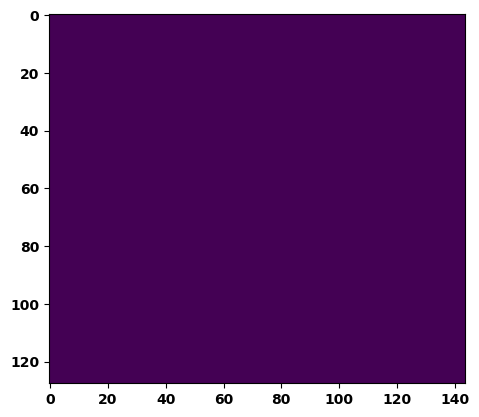

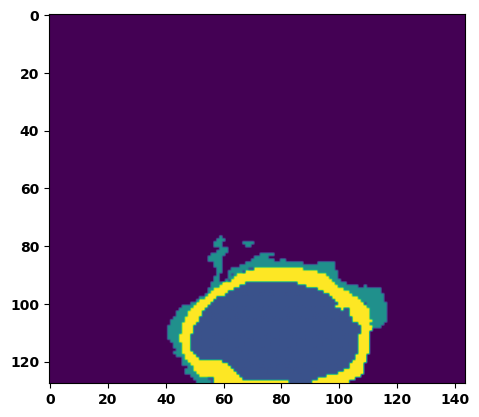

 61%|██████    | 22/36 [00:30<00:20,  1.47s/it]

Batch_id:  21 Eval loss:  0.2839866280555725
Batch_id:  21 Eval IoU:  tensor(0.5916, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9946, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:19,  1.46s/it]

Batch_id:  22 Eval loss:  0.6956920027732849
Batch_id:  22 Eval IoU:  tensor(0.2166, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.7341, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.6650, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.6048, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9487, device='cuda:0')


 67%|██████▋   | 24/36 [00:33<00:17,  1.46s/it]

Batch_id:  23 Eval loss:  0.6126155257225037
Batch_id:  23 Eval IoU:  tensor(0.3138, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9415, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9258, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9144, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9872, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.41s/it]

Batch_id:  24 Eval loss:  0.8818330764770508
Batch_id:  24 Eval IoU:  tensor(0.0758, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4978, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4210, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2468, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:13,  1.39s/it]

Batch_id:  25 Eval loss:  0.3276445269584656
Batch_id:  25 Eval IoU:  tensor(0.5575, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9420, device='cuda:0')


 75%|███████▌  | 27/36 [00:37<00:12,  1.40s/it]

Batch_id:  26 Eval loss:  0.1136866956949234
Batch_id:  26 Eval IoU:  tensor(0.8292, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:11,  1.43s/it]

Batch_id:  27 Eval loss:  0.4410250782966614
Batch_id:  27 Eval IoU:  tensor(0.4682, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7824, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.6755, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.6762, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')


 81%|████████  | 29/36 [00:40<00:10,  1.43s/it]

Batch_id:  28 Eval loss:  0.10878102481365204
Batch_id:  28 Eval IoU:  tensor(0.8155, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.42s/it]

Batch_id:  29 Eval loss:  0.8755766153335571
Batch_id:  29 Eval IoU:  tensor(0.0688, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.4582, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3052, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.1902, device='cuda:0')
Batch_id:  30 Eval loss:  0.6726272702217102
Batch_id:  30 Eval IoU:  tensor(0.2671, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8891, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8339, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.8877, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


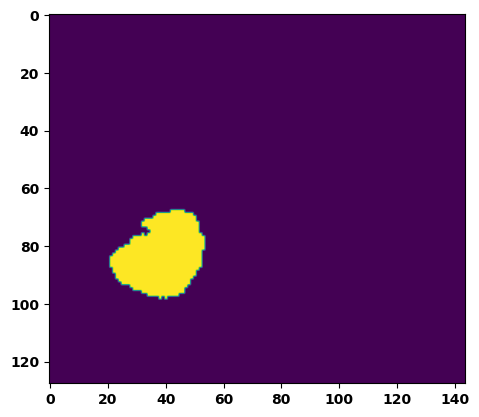

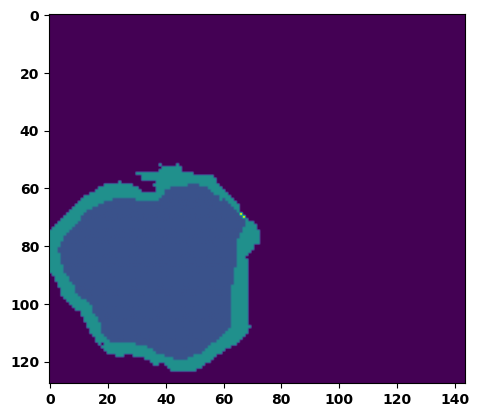

 89%|████████▉ | 32/36 [00:45<00:05,  1.41s/it]

Batch_id:  31 Eval loss:  0.4872589707374573
Batch_id:  31 Eval IoU:  tensor(0.4433, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9216, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.8993, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9373, device='cuda:0')


 92%|█████████▏| 33/36 [00:46<00:04,  1.44s/it]

Batch_id:  32 Eval loss:  0.37001675367355347
Batch_id:  32 Eval IoU:  tensor(0.4969, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9193, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9025, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


 94%|█████████▍| 34/36 [00:47<00:02,  1.45s/it]

Batch_id:  33 Eval loss:  0.875519335269928
Batch_id:  33 Eval IoU:  tensor(0.0751, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.5030, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.2578, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.7587, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.5316, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.6180603504180908
Batch_id:  34 Eval IoU:  tensor(0.3285, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


100%|██████████| 36/36 [00:50<00:00,  1.41s/it]

Batch_id:  35 Eval loss:  0.3316717743873596
Batch_id:  35 Eval IoU:  tensor(0.6115, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')
Epoch  34 Training loss:  0.13117498796094548
Epoch  34 Evaluation loss:  0.5585647258493636
Epoch  34 Training accuracy :  tensor(0.8046)
Epoch  34 Evaluation accuracy :  tensor(0.3787)
Epoch  34 Training Mean Dice Score:  tensor(0.9845)
Epoch  34 Eval Mean Dice Score:  tensor(0.8585)
Epoch  34 Training Non-tumor Dice Score:  tensor(0.9855)
Epoch  34 Eval Non-tumor Dice Score:  tensor(0.8190)
Epoch  34 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  34 Eval NCR/NET Dice Score:  tensor(0.9742)
Epoch  34 Training ED Dice Score:  tensor(0.98

Epoch: 35
Training in session: 


  1%|          | 1/110 [00:01<02:51,  1.57s/it]

Batch_id:  0 Training loss:  0.07671508193016052
Batch_id:  0 Training IoU:  tensor(0.8712, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:37,  1.46s/it]

Batch_id:  1 Training loss:  0.08475850522518158
Batch_id:  1 Training IoU:  tensor(0.8522, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:37,  1.47s/it]

Batch_id:  2 Training loss:  0.10275287926197052
Batch_id:  2 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:41,  1.52s/it]

Batch_id:  3 Training loss:  0.10199645161628723
Batch_id:  3 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:46,  1.58s/it]

Batch_id:  4 Training loss:  0.06675785779953003
Batch_id:  4 Training IoU:  tensor(0.8937, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:39,  1.53s/it]

Batch_id:  5 Training loss:  0.24205897748470306
Batch_id:  5 Training IoU:  tensor(0.7030, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:30,  1.46s/it]

Batch_id:  6 Training loss:  0.18021006882190704
Batch_id:  6 Training IoU:  tensor(0.7283, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:29,  1.47s/it]

Batch_id:  7 Training loss:  0.2561146318912506
Batch_id:  7 Training IoU:  tensor(0.6679, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:31,  1.50s/it]

Batch_id:  8 Training loss:  0.09499640762805939
Batch_id:  8 Training IoU:  tensor(0.8427, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:27,  1.48s/it]

Batch_id:  9 Training loss:  0.07639461755752563
Batch_id:  9 Training IoU:  tensor(0.9267, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 10%|█         | 11/110 [00:16<02:29,  1.51s/it]

Batch_id:  10 Training loss:  0.2026204615831375
Batch_id:  10 Training IoU:  tensor(0.7744, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 11%|█         | 12/110 [00:18<02:27,  1.50s/it]

Batch_id:  11 Training loss:  0.07497316598892212
Batch_id:  11 Training IoU:  tensor(0.8710, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:21,  1.45s/it]

Batch_id:  12 Training loss:  0.14195357263088226
Batch_id:  12 Training IoU:  tensor(0.7696, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:23,  1.49s/it]

Batch_id:  13 Training loss:  0.0851956158876419
Batch_id:  13 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:18,  1.46s/it]

Batch_id:  14 Training loss:  0.240641251206398
Batch_id:  14 Training IoU:  tensor(0.6985, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:17,  1.46s/it]

Batch_id:  15 Training loss:  0.07396775484085083
Batch_id:  15 Training IoU:  tensor(0.8735, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:14,  1.44s/it]

Batch_id:  16 Training loss:  0.11939683556556702
Batch_id:  16 Training IoU:  tensor(0.8019, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:10,  1.42s/it]

Batch_id:  17 Training loss:  0.15579232573509216
Batch_id:  17 Training IoU:  tensor(0.7530, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:08,  1.41s/it]

Batch_id:  18 Training loss:  0.07918906211853027
Batch_id:  18 Training IoU:  tensor(0.8645, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:10,  1.45s/it]

Batch_id:  19 Training loss:  0.18248118460178375
Batch_id:  19 Training IoU:  tensor(0.7172, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:09,  1.46s/it]

Batch_id:  20 Training loss:  0.08514973521232605
Batch_id:  20 Training IoU:  tensor(0.8554, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 20%|██        | 22/110 [00:32<02:08,  1.46s/it]

Batch_id:  21 Training loss:  0.12965086102485657
Batch_id:  21 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9873, device='cuda:0')


 21%|██        | 23/110 [00:33<02:03,  1.43s/it]

Batch_id:  22 Training loss:  0.15064628422260284
Batch_id:  22 Training IoU:  tensor(0.7628, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:05,  1.46s/it]

Batch_id:  23 Training loss:  0.06263917684555054
Batch_id:  23 Training IoU:  tensor(0.9266, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:00,  1.42s/it]

Batch_id:  24 Training loss:  0.0822448879480362
Batch_id:  24 Training IoU:  tensor(0.8628, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:03,  1.48s/it]

Batch_id:  25 Training loss:  0.11262337863445282
Batch_id:  25 Training IoU:  tensor(0.9083, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:59,  1.44s/it]

Batch_id:  26 Training loss:  0.21280433237552643
Batch_id:  26 Training IoU:  tensor(0.7149, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:58,  1.45s/it]

Batch_id:  27 Training loss:  0.04459016025066376
Batch_id:  27 Training IoU:  tensor(0.9257, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:57,  1.45s/it]

Batch_id:  28 Training loss:  0.31971636414527893
Batch_id:  28 Training IoU:  tensor(0.6300, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:59,  1.49s/it]

Batch_id:  29 Training loss:  0.12721242010593414
Batch_id:  29 Training IoU:  tensor(0.7889, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:54,  1.45s/it]

Batch_id:  30 Training loss:  0.10428369045257568
Batch_id:  30 Training IoU:  tensor(0.8285, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:56,  1.49s/it]

Batch_id:  31 Training loss:  0.06305819749832153
Batch_id:  31 Training IoU:  tensor(0.8919, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 30%|███       | 33/110 [00:48<01:58,  1.54s/it]

Batch_id:  32 Training loss:  0.244982048869133
Batch_id:  32 Training IoU:  tensor(0.6901, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 31%|███       | 34/110 [00:50<01:53,  1.49s/it]

Batch_id:  33 Training loss:  0.21667565405368805
Batch_id:  33 Training IoU:  tensor(0.6924, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:56,  1.55s/it]

Batch_id:  34 Training loss:  0.1502385139465332
Batch_id:  34 Training IoU:  tensor(0.7577, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:54,  1.54s/it]

Batch_id:  35 Training loss:  0.10244032740592957
Batch_id:  35 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:52,  1.54s/it]

Batch_id:  36 Training loss:  0.11003588140010834
Batch_id:  36 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:49,  1.52s/it]

Batch_id:  37 Training loss:  0.19478031992912292
Batch_id:  37 Training IoU:  tensor(0.7001, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:46,  1.49s/it]

Batch_id:  38 Training loss:  0.09167931973934174
Batch_id:  38 Training IoU:  tensor(0.8421, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:43,  1.48s/it]

Batch_id:  39 Training loss:  0.09497009217739105
Batch_id:  39 Training IoU:  tensor(0.8414, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:40,  1.45s/it]

Batch_id:  40 Training loss:  0.057347461581230164
Batch_id:  40 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:40,  1.48s/it]

Batch_id:  41 Training loss:  0.22087319195270538
Batch_id:  41 Training IoU:  tensor(0.6781, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9636, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:38,  1.47s/it]

Batch_id:  42 Training loss:  0.11666566133499146
Batch_id:  42 Training IoU:  tensor(0.8043, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 40%|████      | 44/110 [01:05<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.09150059521198273
Batch_id:  43 Training IoU:  tensor(0.8454, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 41%|████      | 45/110 [01:06<01:42,  1.58s/it]

Batch_id:  44 Training loss:  0.11417128145694733
Batch_id:  44 Training IoU:  tensor(0.8213, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:35,  1.50s/it]

Batch_id:  45 Training loss:  0.13904032111167908
Batch_id:  45 Training IoU:  tensor(0.7978, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:34,  1.49s/it]

Batch_id:  46 Training loss:  0.36107683181762695
Batch_id:  46 Training IoU:  tensor(0.5532, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9661, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:33,  1.51s/it]

Batch_id:  47 Training loss:  0.16314226388931274
Batch_id:  47 Training IoU:  tensor(0.7496, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:32,  1.51s/it]

Batch_id:  48 Training loss:  0.08056162297725677
Batch_id:  48 Training IoU:  tensor(0.8627, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:28,  1.48s/it]

Batch_id:  49 Training loss:  0.05345118045806885
Batch_id:  49 Training IoU:  tensor(0.9070, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:25,  1.45s/it]

Batch_id:  50 Training loss:  0.10862933099269867
Batch_id:  50 Training IoU:  tensor(0.8240, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:22,  1.42s/it]

Batch_id:  51 Training loss:  0.12729154527187347
Batch_id:  51 Training IoU:  tensor(0.7931, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:22,  1.45s/it]

Batch_id:  52 Training loss:  0.1518031358718872
Batch_id:  52 Training IoU:  tensor(0.7578, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:19,  1.41s/it]

Batch_id:  53 Training loss:  0.1479216068983078
Batch_id:  53 Training IoU:  tensor(0.7822, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:17,  1.41s/it]

Batch_id:  54 Training loss:  0.2272605448961258
Batch_id:  54 Training IoU:  tensor(0.6920, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:19,  1.47s/it]

Batch_id:  55 Training loss:  0.031134530901908875
Batch_id:  55 Training IoU:  tensor(0.9464, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:19,  1.51s/it]

Batch_id:  56 Training loss:  0.15989883244037628
Batch_id:  56 Training IoU:  tensor(0.7398, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:20,  1.54s/it]

Batch_id:  57 Training loss:  0.14508067071437836
Batch_id:  57 Training IoU:  tensor(0.7632, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:14,  1.47s/it]

Batch_id:  58 Training loss:  0.119248166680336
Batch_id:  58 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:12,  1.46s/it]

Batch_id:  59 Training loss:  0.06584213674068451
Batch_id:  59 Training IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:10,  1.45s/it]

Batch_id:  60 Training loss:  0.18752114474773407
Batch_id:  60 Training IoU:  tensor(0.7141, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:09,  1.44s/it]

Batch_id:  61 Training loss:  0.13734789192676544
Batch_id:  61 Training IoU:  tensor(0.7867, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9741, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:08,  1.46s/it]

Batch_id:  62 Training loss:  0.07273741066455841
Batch_id:  62 Training IoU:  tensor(0.8746, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:08,  1.48s/it]

Batch_id:  63 Training loss:  0.05847978591918945
Batch_id:  63 Training IoU:  tensor(0.8998, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:08,  1.52s/it]

Batch_id:  64 Training loss:  0.12727001309394836
Batch_id:  64 Training IoU:  tensor(0.8110, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:09,  1.58s/it]

Batch_id:  65 Training loss:  0.09068469703197479
Batch_id:  65 Training IoU:  tensor(0.8471, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:07,  1.56s/it]

Batch_id:  66 Training loss:  0.08241941034793854
Batch_id:  66 Training IoU:  tensor(0.8575, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:05,  1.56s/it]

Batch_id:  67 Training loss:  0.10711456835269928
Batch_id:  67 Training IoU:  tensor(0.8242, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<01:01,  1.51s/it]

Batch_id:  68 Training loss:  0.056617170572280884
Batch_id:  68 Training IoU:  tensor(0.9004, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:58,  1.46s/it]

Batch_id:  69 Training loss:  0.1729097217321396
Batch_id:  69 Training IoU:  tensor(0.7369, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<00:56,  1.45s/it]

Batch_id:  70 Training loss:  0.18065384030342102
Batch_id:  70 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:56,  1.49s/it]

Batch_id:  71 Training loss:  0.06197147071361542
Batch_id:  71 Training IoU:  tensor(0.8943, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:53,  1.46s/it]

Batch_id:  72 Training loss:  0.16847443580627441
Batch_id:  72 Training IoU:  tensor(0.7867, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:53,  1.48s/it]

Batch_id:  73 Training loss:  0.04971955716609955
Batch_id:  73 Training IoU:  tensor(0.9202, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:50,  1.45s/it]

Batch_id:  74 Training loss:  0.06303881108760834
Batch_id:  74 Training IoU:  tensor(0.8906, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:49,  1.45s/it]

Batch_id:  75 Training loss:  0.09562753140926361
Batch_id:  75 Training IoU:  tensor(0.8375, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:48,  1.48s/it]

Batch_id:  76 Training loss:  0.21750527620315552
Batch_id:  76 Training IoU:  tensor(0.7187, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:47,  1.48s/it]

Batch_id:  77 Training loss:  0.15677514672279358
Batch_id:  77 Training IoU:  tensor(0.7535, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9831, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:46,  1.52s/it]

Batch_id:  78 Training loss:  0.0789957195520401
Batch_id:  78 Training IoU:  tensor(0.8834, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:45,  1.51s/it]

Batch_id:  79 Training loss:  0.09398643672466278
Batch_id:  79 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:44,  1.52s/it]

Batch_id:  80 Training loss:  0.22078707814216614
Batch_id:  80 Training IoU:  tensor(0.7267, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.17751677334308624
Batch_id:  81 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:38,  1.44s/it]

Batch_id:  82 Training loss:  0.09361635148525238
Batch_id:  82 Training IoU:  tensor(0.8484, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:39,  1.51s/it]

Batch_id:  83 Training loss:  0.06801185011863708
Batch_id:  83 Training IoU:  tensor(0.8866, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:37,  1.51s/it]

Batch_id:  84 Training loss:  0.1371547281742096
Batch_id:  84 Training IoU:  tensor(0.7898, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:36,  1.51s/it]

Batch_id:  85 Training loss:  0.10553005337715149
Batch_id:  85 Training IoU:  tensor(0.8202, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9857, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:35,  1.53s/it]

Batch_id:  86 Training loss:  0.07341443002223969
Batch_id:  86 Training IoU:  tensor(0.8717, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:34,  1.55s/it]

Batch_id:  87 Training loss:  0.11686137318611145
Batch_id:  87 Training IoU:  tensor(0.8021, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9786, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:32,  1.53s/it]

Batch_id:  88 Training loss:  0.1120920479297638
Batch_id:  88 Training IoU:  tensor(0.8165, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:31,  1.56s/it]

Batch_id:  89 Training loss:  0.06504768133163452
Batch_id:  89 Training IoU:  tensor(0.8893, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:28,  1.52s/it]

Batch_id:  90 Training loss:  0.30106353759765625
Batch_id:  90 Training IoU:  tensor(0.6121, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:27,  1.54s/it]

Batch_id:  91 Training loss:  0.052421942353248596
Batch_id:  91 Training IoU:  tensor(0.9095, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:26,  1.56s/it]

Batch_id:  92 Training loss:  0.05340933799743652
Batch_id:  92 Training IoU:  tensor(0.9088, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 85%|████████▌ | 94/110 [02:20<00:25,  1.57s/it]

Batch_id:  93 Training loss:  0.20278766751289368
Batch_id:  93 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:23,  1.55s/it]

Batch_id:  94 Training loss:  0.1338661015033722
Batch_id:  94 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9752, device='cuda:0')


 87%|████████▋ | 96/110 [02:23<00:21,  1.54s/it]

Batch_id:  95 Training loss:  0.13239212334156036
Batch_id:  95 Training IoU:  tensor(0.7803, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 88%|████████▊ | 97/110 [02:24<00:19,  1.53s/it]

Batch_id:  96 Training loss:  0.1381395310163498
Batch_id:  96 Training IoU:  tensor(0.8079, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 89%|████████▉ | 98/110 [02:26<00:18,  1.53s/it]

Batch_id:  97 Training loss:  0.10569639503955841
Batch_id:  97 Training IoU:  tensor(0.8237, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 90%|█████████ | 99/110 [02:27<00:16,  1.51s/it]

Batch_id:  98 Training loss:  0.12840770184993744
Batch_id:  98 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 91%|█████████ | 100/110 [02:29<00:15,  1.51s/it]

Batch_id:  99 Training loss:  0.09479264914989471
Batch_id:  99 Training IoU:  tensor(0.8422, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 92%|█████████▏| 101/110 [02:30<00:13,  1.52s/it]

Batch_id:  100 Training loss:  0.08671003580093384
Batch_id:  100 Training IoU:  tensor(0.8511, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 93%|█████████▎| 102/110 [02:32<00:12,  1.54s/it]

Batch_id:  101 Training loss:  0.22920888662338257
Batch_id:  101 Training IoU:  tensor(0.6801, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 94%|█████████▎| 103/110 [02:33<00:10,  1.49s/it]

Batch_id:  102 Training loss:  0.24256455898284912
Batch_id:  102 Training IoU:  tensor(0.6584, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 95%|█████████▍| 104/110 [02:34<00:08,  1.48s/it]

Batch_id:  103 Training loss:  0.1134936511516571
Batch_id:  103 Training IoU:  tensor(0.8185, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 95%|█████████▌| 105/110 [02:36<00:07,  1.51s/it]

Batch_id:  104 Training loss:  0.24450187385082245
Batch_id:  104 Training IoU:  tensor(0.6690, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 96%|█████████▋| 106/110 [02:38<00:06,  1.53s/it]

Batch_id:  105 Training loss:  0.1481926590204239
Batch_id:  105 Training IoU:  tensor(0.7945, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 97%|█████████▋| 107/110 [02:39<00:04,  1.50s/it]

Batch_id:  106 Training loss:  0.10554136335849762
Batch_id:  106 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 98%|█████████▊| 108/110 [02:41<00:03,  1.51s/it]

Batch_id:  107 Training loss:  0.14439330995082855
Batch_id:  107 Training IoU:  tensor(0.7774, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 99%|█████████▉| 109/110 [02:42<00:01,  1.49s/it]

Batch_id:  108 Training loss:  0.14569087326526642
Batch_id:  108 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


100%|██████████| 110/110 [02:43<00:00,  1.49s/it]


Batch_id:  109 Training loss:  0.11995145678520203
Batch_id:  109 Training IoU:  tensor(0.7997, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9856, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5524706840515137
Batch_id:  0 Eval IoU:  tensor(0.4069, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9414, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9514, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


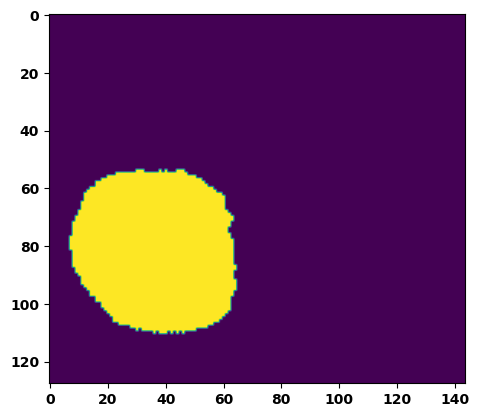

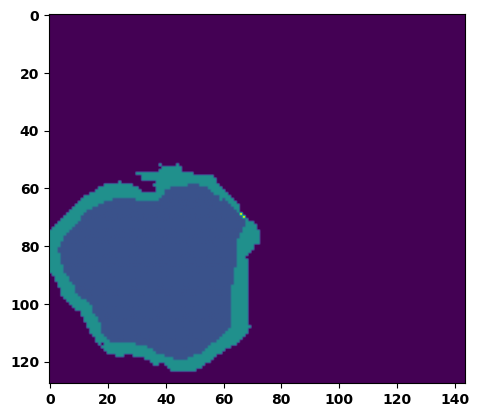

  6%|▌         | 2/36 [00:03<00:51,  1.51s/it]

Batch_id:  1 Eval loss:  0.4930027425289154
Batch_id:  1 Eval IoU:  tensor(0.4079, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:48,  1.47s/it]

Batch_id:  2 Eval loss:  0.7612501978874207
Batch_id:  2 Eval IoU:  tensor(0.1638, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.6480, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.5411, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.7775, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.6819, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.42s/it]

Batch_id:  3 Eval loss:  0.7138318419456482
Batch_id:  3 Eval IoU:  tensor(0.2205, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7614, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.6620, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.6780, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.40s/it]

Batch_id:  4 Eval loss:  0.729037344455719
Batch_id:  4 Eval IoU:  tensor(0.1806, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5068, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3130, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9223, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.7138, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.5712, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:40,  1.35s/it]

Batch_id:  5 Eval loss:  0.4989764094352722
Batch_id:  5 Eval IoU:  tensor(0.4302, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9146, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9201, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:38,  1.32s/it]

Batch_id:  6 Eval loss:  0.7682651281356812
Batch_id:  6 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 22%|██▏       | 8/36 [00:10<00:36,  1.30s/it]

Batch_id:  7 Eval loss:  0.899721622467041
Batch_id:  7 Eval IoU:  tensor(0.0586, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.4598, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.3332, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9015, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.1938, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:35,  1.32s/it]

Batch_id:  8 Eval loss:  0.7393354773521423
Batch_id:  8 Eval IoU:  tensor(0.2411, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9211, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9384, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9039, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:34,  1.34s/it]

Batch_id:  9 Eval loss:  0.568270206451416
Batch_id:  9 Eval IoU:  tensor(0.3803, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9049, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.8781, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  10 Eval loss:  0.893717348575592
Batch_id:  10 Eval IoU:  tensor(0.0628, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.4930, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.2442, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.2448, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


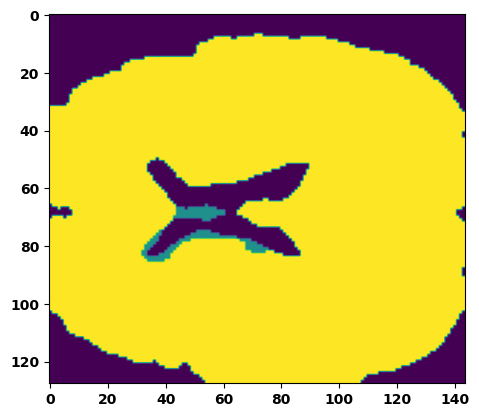

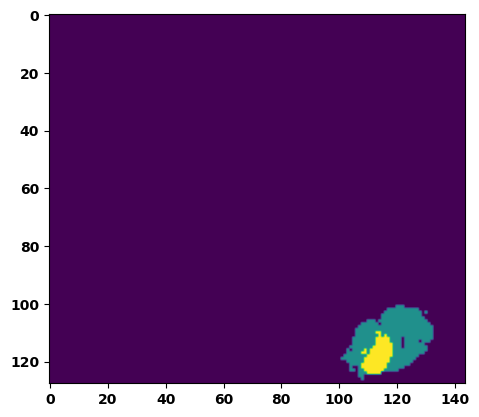

 33%|███▎      | 12/36 [00:16<00:33,  1.40s/it]

Batch_id:  11 Eval loss:  0.6247078776359558
Batch_id:  11 Eval IoU:  tensor(0.3270, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.41s/it]

Batch_id:  12 Eval loss:  0.49058303236961365
Batch_id:  12 Eval IoU:  tensor(0.4222, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9436, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9690, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:29,  1.36s/it]

Batch_id:  13 Eval loss:  0.30665186047554016
Batch_id:  13 Eval IoU:  tensor(0.6267, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


 42%|████▏     | 15/36 [00:20<00:28,  1.35s/it]

Batch_id:  14 Eval loss:  0.8825318217277527
Batch_id:  14 Eval IoU:  tensor(0.0750, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.4962, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4185, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.2444, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:27,  1.36s/it]

Batch_id:  15 Eval loss:  0.7139360904693604
Batch_id:  15 Eval IoU:  tensor(0.2013, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.6493, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.5377, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.5350, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9451, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:26,  1.38s/it]

Batch_id:  16 Eval loss:  0.5367993116378784
Batch_id:  16 Eval IoU:  tensor(0.3361, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.7510, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.6489, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9601, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.6673, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9769, device='cuda:0')


 50%|█████     | 18/36 [00:24<00:25,  1.40s/it]

Batch_id:  17 Eval loss:  0.7385842800140381
Batch_id:  17 Eval IoU:  tensor(0.1673, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.5413, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3905, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.3156, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:24,  1.41s/it]

Batch_id:  18 Eval loss:  0.6491305828094482
Batch_id:  18 Eval IoU:  tensor(0.3037, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9720, device='cuda:0')


 56%|█████▌    | 20/36 [00:27<00:22,  1.42s/it]

Batch_id:  19 Eval loss:  0.41752633452415466
Batch_id:  19 Eval IoU:  tensor(0.4742, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  20 Eval loss:  0.6201702952384949
Batch_id:  20 Eval IoU:  tensor(0.3208, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


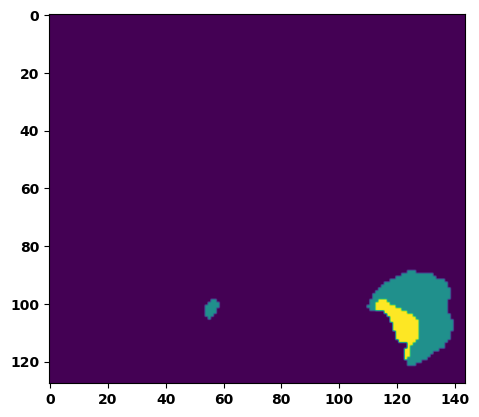

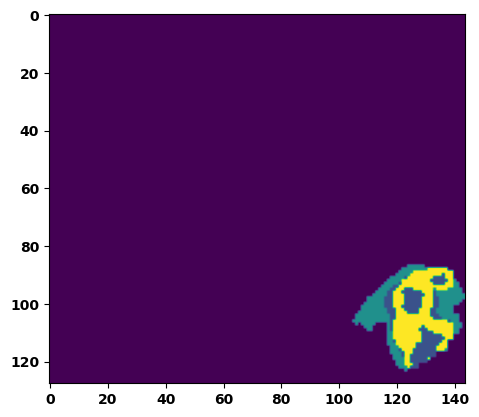

 61%|██████    | 22/36 [00:30<00:20,  1.45s/it]

Batch_id:  21 Eval loss:  0.7747010588645935
Batch_id:  21 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:19,  1.49s/it]

Batch_id:  22 Eval loss:  0.21429114043712616
Batch_id:  22 Eval IoU:  tensor(0.6870, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 67%|██████▋   | 24/36 [00:33<00:17,  1.48s/it]

Batch_id:  23 Eval loss:  0.7517712116241455
Batch_id:  23 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.45s/it]

Batch_id:  24 Eval loss:  0.593835175037384
Batch_id:  24 Eval IoU:  tensor(0.3373, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9850, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:14,  1.41s/it]

Batch_id:  25 Eval loss:  0.6378986835479736
Batch_id:  25 Eval IoU:  tensor(0.2759, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.6076, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.4420, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.8593, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.5669, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.42s/it]

Batch_id:  26 Eval loss:  0.11995160579681396
Batch_id:  26 Eval IoU:  tensor(0.7971, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:11,  1.39s/it]

Batch_id:  27 Eval loss:  0.5696702599525452
Batch_id:  27 Eval IoU:  tensor(0.3166, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.7512, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.7180, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.6318, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9871, device='cuda:0')


 81%|████████  | 29/36 [00:40<00:09,  1.39s/it]

Batch_id:  28 Eval loss:  0.5622985363006592
Batch_id:  28 Eval IoU:  tensor(0.3965, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9626, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.6512537598609924
Batch_id:  29 Eval IoU:  tensor(0.2981, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  30 Eval loss:  0.7564980983734131
Batch_id:  30 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


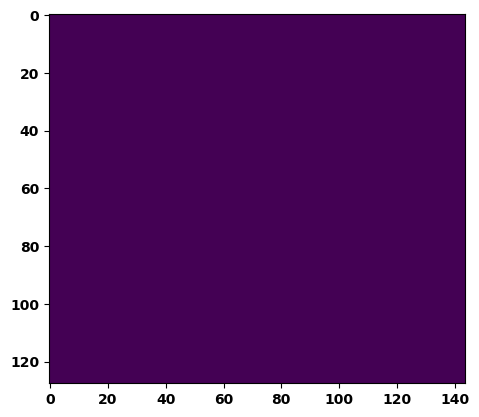

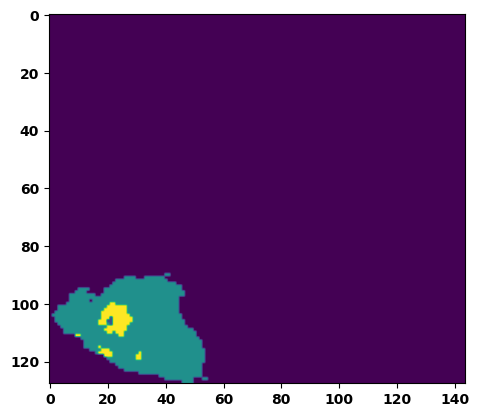

 89%|████████▉ | 32/36 [00:45<00:05,  1.44s/it]

Batch_id:  31 Eval loss:  0.7582825422286987
Batch_id:  31 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 92%|█████████▏| 33/36 [00:46<00:04,  1.40s/it]

Batch_id:  32 Eval loss:  0.4697169363498688
Batch_id:  32 Eval IoU:  tensor(0.4400, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9612, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9854, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.43s/it]

Batch_id:  33 Eval loss:  0.41824960708618164
Batch_id:  33 Eval IoU:  tensor(0.4894, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.39s/it]

Batch_id:  34 Eval loss:  0.16993728280067444
Batch_id:  34 Eval IoU:  tensor(0.7372, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9875, device='cuda:0')


100%|██████████| 36/36 [00:50<00:00,  1.41s/it]

Batch_id:  35 Eval loss:  0.7033301591873169
Batch_id:  35 Eval IoU:  tensor(0.2326, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.8031, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.7312, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.7079, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Epoch  35 Training loss:  0.13067670301957565
Epoch  35 Evaluation loss:  0.6041718485454718
Epoch  35 Training accuracy :  tensor(0.8051)
Epoch  35 Evaluation accuracy :  tensor(0.3317)
Epoch  35 Training Mean Dice Score:  tensor(0.9846)
Epoch  35 Eval Mean Dice Score:  tensor(0.8426)
Epoch  35 Training Non-tumor Dice Score:  tensor(0.9856)
Epoch  35 Eval Non-tumor Dice Score:  tensor(0.7947)
Epoch  35 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  35 Eval NCR/NET Dice Score:  tensor(0.9329)
Epoch  35 Training ED Dice Score:  tensor(0.98

Epoch: 36
Training in session: 


  1%|          | 1/110 [00:01<02:39,  1.47s/it]

Batch_id:  0 Training loss:  0.07720822095870972
Batch_id:  0 Training IoU:  tensor(0.8882, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:32,  1.42s/it]

Batch_id:  1 Training loss:  0.07615657150745392
Batch_id:  1 Training IoU:  tensor(0.8713, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:29,  1.39s/it]

Batch_id:  2 Training loss:  0.24050204455852509
Batch_id:  2 Training IoU:  tensor(0.6935, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:36,  1.48s/it]

Batch_id:  3 Training loss:  0.24420005083084106
Batch_id:  3 Training IoU:  tensor(0.6689, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:30,  1.44s/it]

Batch_id:  4 Training loss:  0.1082306057214737
Batch_id:  4 Training IoU:  tensor(0.8302, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:39,  1.54s/it]

Batch_id:  5 Training loss:  0.141605943441391
Batch_id:  5 Training IoU:  tensor(0.7807, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:32,  1.48s/it]

Batch_id:  6 Training loss:  0.05630125105381012
Batch_id:  6 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:33,  1.51s/it]

Batch_id:  7 Training loss:  0.10609236359596252
Batch_id:  7 Training IoU:  tensor(0.8272, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:35,  1.54s/it]

Batch_id:  8 Training loss:  0.12757308781147003
Batch_id:  8 Training IoU:  tensor(0.8122, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:30,  1.51s/it]

Batch_id:  9 Training loss:  0.062482357025146484
Batch_id:  9 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 10%|█         | 11/110 [00:16<02:27,  1.49s/it]

Batch_id:  10 Training loss:  0.07349683344364166
Batch_id:  10 Training IoU:  tensor(0.8709, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 11%|█         | 12/110 [00:17<02:27,  1.50s/it]

Batch_id:  11 Training loss:  0.05324700474739075
Batch_id:  11 Training IoU:  tensor(0.9075, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:26,  1.51s/it]

Batch_id:  12 Training loss:  0.11241352558135986
Batch_id:  12 Training IoU:  tensor(0.9070, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:22,  1.48s/it]

Batch_id:  13 Training loss:  0.14233443140983582
Batch_id:  13 Training IoU:  tensor(0.7693, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9554, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:20,  1.48s/it]

Batch_id:  14 Training loss:  0.06557272374629974
Batch_id:  14 Training IoU:  tensor(0.8890, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:15,  1.44s/it]

Batch_id:  15 Training loss:  0.13769474625587463
Batch_id:  15 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:11,  1.41s/it]

Batch_id:  16 Training loss:  0.14554671943187714
Batch_id:  16 Training IoU:  tensor(0.7958, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:07,  1.38s/it]

Batch_id:  17 Training loss:  0.15059109032154083
Batch_id:  17 Training IoU:  tensor(0.7570, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:11,  1.44s/it]

Batch_id:  18 Training loss:  0.1833641082048416
Batch_id:  18 Training IoU:  tensor(0.7181, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:07,  1.42s/it]

Batch_id:  19 Training loss:  0.08217653632164001
Batch_id:  19 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:05,  1.41s/it]

Batch_id:  20 Training loss:  0.17785000801086426
Batch_id:  20 Training IoU:  tensor(0.7308, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 20%|██        | 22/110 [00:31<02:01,  1.38s/it]

Batch_id:  21 Training loss:  0.08546265959739685
Batch_id:  21 Training IoU:  tensor(0.8539, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 21%|██        | 23/110 [00:33<02:03,  1.42s/it]

Batch_id:  22 Training loss:  0.05890356004238129
Batch_id:  22 Training IoU:  tensor(0.8992, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 22%|██▏       | 24/110 [00:34<01:58,  1.38s/it]

Batch_id:  23 Training loss:  0.15407711267471313
Batch_id:  23 Training IoU:  tensor(0.7483, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 23%|██▎       | 25/110 [00:35<01:53,  1.33s/it]

Batch_id:  24 Training loss:  0.12490689754486084
Batch_id:  24 Training IoU:  tensor(0.8199, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:51,  1.33s/it]

Batch_id:  25 Training loss:  0.0969870537519455
Batch_id:  25 Training IoU:  tensor(0.8390, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 25%|██▍       | 27/110 [00:38<01:51,  1.34s/it]

Batch_id:  26 Training loss:  0.14429925382137299
Batch_id:  26 Training IoU:  tensor(0.7645, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:50,  1.34s/it]

Batch_id:  27 Training loss:  0.15112456679344177
Batch_id:  27 Training IoU:  tensor(0.7610, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:52,  1.39s/it]

Batch_id:  28 Training loss:  0.22096535563468933
Batch_id:  28 Training IoU:  tensor(0.6984, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9944, device='cuda:0')


 27%|██▋       | 30/110 [00:42<01:49,  1.37s/it]

Batch_id:  29 Training loss:  0.18039914965629578
Batch_id:  29 Training IoU:  tensor(0.7860, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:50,  1.40s/it]

Batch_id:  30 Training loss:  0.04400339722633362
Batch_id:  30 Training IoU:  tensor(0.9266, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:49,  1.41s/it]

Batch_id:  31 Training loss:  0.22017580270767212
Batch_id:  31 Training IoU:  tensor(0.7240, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 30%|███       | 33/110 [00:47<01:51,  1.44s/it]

Batch_id:  32 Training loss:  0.061981961131095886
Batch_id:  32 Training IoU:  tensor(0.9266, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 31%|███       | 34/110 [00:48<01:49,  1.45s/it]

Batch_id:  33 Training loss:  0.07823881506919861
Batch_id:  33 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:47,  1.44s/it]

Batch_id:  34 Training loss:  0.07323428988456726
Batch_id:  34 Training IoU:  tensor(0.8749, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:46,  1.44s/it]

Batch_id:  35 Training loss:  0.14083585143089294
Batch_id:  35 Training IoU:  tensor(0.7824, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 34%|███▎      | 37/110 [00:52<01:43,  1.42s/it]

Batch_id:  36 Training loss:  0.11137786507606506
Batch_id:  36 Training IoU:  tensor(0.8201, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.07552720606327057
Batch_id:  37 Training IoU:  tensor(0.9297, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 35%|███▌      | 39/110 [00:55<01:38,  1.39s/it]

Batch_id:  38 Training loss:  0.1061728447675705
Batch_id:  38 Training IoU:  tensor(0.8187, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:37,  1.40s/it]

Batch_id:  39 Training loss:  0.24429959058761597
Batch_id:  39 Training IoU:  tensor(0.6906, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:34,  1.38s/it]

Batch_id:  40 Training loss:  0.23202919960021973
Batch_id:  40 Training IoU:  tensor(0.6770, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 38%|███▊      | 42/110 [00:59<01:35,  1.40s/it]

Batch_id:  41 Training loss:  0.1157660186290741
Batch_id:  41 Training IoU:  tensor(0.8064, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:37,  1.46s/it]

Batch_id:  42 Training loss:  0.1336391717195511
Batch_id:  42 Training IoU:  tensor(0.7953, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 40%|████      | 44/110 [01:03<01:38,  1.50s/it]

Batch_id:  43 Training loss:  0.06947390735149384
Batch_id:  43 Training IoU:  tensor(0.8841, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 41%|████      | 45/110 [01:04<01:36,  1.48s/it]

Batch_id:  44 Training loss:  0.0874510407447815
Batch_id:  44 Training IoU:  tensor(0.8487, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:34,  1.48s/it]

Batch_id:  45 Training loss:  0.09774348139762878
Batch_id:  45 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:36,  1.53s/it]

Batch_id:  46 Training loss:  0.06472148001194
Batch_id:  46 Training IoU:  tensor(0.8893, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9949, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:34,  1.53s/it]

Batch_id:  47 Training loss:  0.07578063011169434
Batch_id:  47 Training IoU:  tensor(0.8697, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:31,  1.50s/it]

Batch_id:  48 Training loss:  0.320520281791687
Batch_id:  48 Training IoU:  tensor(0.6294, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:26,  1.45s/it]

Batch_id:  49 Training loss:  0.16885554790496826
Batch_id:  49 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:26,  1.47s/it]

Batch_id:  50 Training loss:  0.05201348662376404
Batch_id:  50 Training IoU:  tensor(0.9100, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:22,  1.41s/it]

Batch_id:  51 Training loss:  0.07966327667236328
Batch_id:  51 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:21,  1.44s/it]

Batch_id:  52 Training loss:  0.24200814962387085
Batch_id:  52 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:21,  1.45s/it]

Batch_id:  53 Training loss:  0.21399611234664917
Batch_id:  53 Training IoU:  tensor(0.7639, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.15751560032367706
Batch_id:  54 Training IoU:  tensor(0.7495, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:18,  1.45s/it]

Batch_id:  55 Training loss:  0.09431461989879608
Batch_id:  55 Training IoU:  tensor(0.8364, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:18,  1.48s/it]

Batch_id:  56 Training loss:  0.08625258505344391
Batch_id:  56 Training IoU:  tensor(0.8531, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:17,  1.49s/it]

Batch_id:  57 Training loss:  0.130839005112648
Batch_id:  57 Training IoU:  tensor(0.7882, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:15,  1.49s/it]

Batch_id:  58 Training loss:  0.21463464200496674
Batch_id:  58 Training IoU:  tensor(0.7213, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:15,  1.51s/it]

Batch_id:  59 Training loss:  0.13149061799049377
Batch_id:  59 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:10,  1.44s/it]

Batch_id:  60 Training loss:  0.12658733129501343
Batch_id:  60 Training IoU:  tensor(0.7913, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:08,  1.42s/it]

Batch_id:  61 Training loss:  0.13129858672618866
Batch_id:  61 Training IoU:  tensor(0.7956, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:08,  1.45s/it]

Batch_id:  62 Training loss:  0.148014098405838
Batch_id:  62 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9797, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:06,  1.44s/it]

Batch_id:  63 Training loss:  0.06483788788318634
Batch_id:  63 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 59%|█████▉    | 65/110 [01:33<01:04,  1.43s/it]

Batch_id:  64 Training loss:  0.14763638377189636
Batch_id:  64 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:03,  1.45s/it]

Batch_id:  65 Training loss:  0.09019753336906433
Batch_id:  65 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:02,  1.45s/it]

Batch_id:  66 Training loss:  0.10310614109039307
Batch_id:  66 Training IoU:  tensor(0.8406, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<01:00,  1.44s/it]

Batch_id:  67 Training loss:  0.056940436363220215
Batch_id:  67 Training IoU:  tensor(0.9009, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<00:58,  1.42s/it]

Batch_id:  68 Training loss:  0.13637928664684296
Batch_id:  68 Training IoU:  tensor(0.8109, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 64%|██████▎   | 70/110 [01:40<00:57,  1.43s/it]

Batch_id:  69 Training loss:  0.1388815939426422
Batch_id:  69 Training IoU:  tensor(0.7964, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:55,  1.42s/it]

Batch_id:  70 Training loss:  0.09642593562602997
Batch_id:  70 Training IoU:  tensor(0.8359, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 65%|██████▌   | 72/110 [01:43<00:54,  1.45s/it]

Batch_id:  71 Training loss:  0.06188187003135681
Batch_id:  71 Training IoU:  tensor(0.8944, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:52,  1.43s/it]

Batch_id:  72 Training loss:  0.12220624089241028
Batch_id:  72 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 67%|██████▋   | 74/110 [01:46<00:50,  1.41s/it]

Batch_id:  73 Training loss:  0.2110103815793991
Batch_id:  73 Training IoU:  tensor(0.7145, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:49,  1.41s/it]

Batch_id:  74 Training loss:  0.10206834971904755
Batch_id:  74 Training IoU:  tensor(0.8336, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:47,  1.40s/it]

Batch_id:  75 Training loss:  0.08383175730705261
Batch_id:  75 Training IoU:  tensor(0.8602, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9695, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 70%|███████   | 77/110 [01:50<00:46,  1.41s/it]

Batch_id:  76 Training loss:  0.10938034951686859
Batch_id:  76 Training IoU:  tensor(0.8203, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:44,  1.40s/it]

Batch_id:  77 Training loss:  0.11626134812831879
Batch_id:  77 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 72%|███████▏  | 79/110 [01:53<00:43,  1.40s/it]

Batch_id:  78 Training loss:  0.2226647436618805
Batch_id:  78 Training IoU:  tensor(0.6756, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9633, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:42,  1.41s/it]

Batch_id:  79 Training loss:  0.15566696226596832
Batch_id:  79 Training IoU:  tensor(0.7550, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9836, device='cuda:0')


 74%|███████▎  | 81/110 [01:56<00:41,  1.43s/it]

Batch_id:  80 Training loss:  0.09491002559661865
Batch_id:  80 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 75%|███████▍  | 82/110 [01:57<00:40,  1.44s/it]

Batch_id:  81 Training loss:  0.10990352928638458
Batch_id:  81 Training IoU:  tensor(0.8231, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 75%|███████▌  | 83/110 [01:59<00:38,  1.43s/it]

Batch_id:  82 Training loss:  0.2959023118019104
Batch_id:  82 Training IoU:  tensor(0.6216, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 76%|███████▋  | 84/110 [02:00<00:37,  1.45s/it]

Batch_id:  83 Training loss:  0.21443799138069153
Batch_id:  83 Training IoU:  tensor(0.6950, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 77%|███████▋  | 85/110 [02:02<00:36,  1.47s/it]

Batch_id:  84 Training loss:  0.09370167553424835
Batch_id:  84 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 78%|███████▊  | 86/110 [02:03<00:35,  1.48s/it]

Batch_id:  85 Training loss:  0.030940204858779907
Batch_id:  85 Training IoU:  tensor(0.9468, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 79%|███████▉  | 87/110 [02:05<00:34,  1.48s/it]

Batch_id:  86 Training loss:  0.25254684686660767
Batch_id:  86 Training IoU:  tensor(0.6726, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 80%|████████  | 88/110 [02:06<00:32,  1.48s/it]

Batch_id:  87 Training loss:  0.18651442229747772
Batch_id:  87 Training IoU:  tensor(0.7101, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9869, device='cuda:0')


 81%|████████  | 89/110 [02:08<00:30,  1.47s/it]

Batch_id:  88 Training loss:  0.20718026161193848
Batch_id:  88 Training IoU:  tensor(0.7158, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 82%|████████▏ | 90/110 [02:09<00:29,  1.50s/it]

Batch_id:  89 Training loss:  0.05272388458251953
Batch_id:  89 Training IoU:  tensor(0.9102, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 83%|████████▎ | 91/110 [02:11<00:28,  1.51s/it]

Batch_id:  90 Training loss:  0.10914209485054016
Batch_id:  90 Training IoU:  tensor(0.8137, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 84%|████████▎ | 92/110 [02:12<00:26,  1.48s/it]

Batch_id:  91 Training loss:  0.18479202687740326
Batch_id:  91 Training IoU:  tensor(0.7200, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 85%|████████▍ | 93/110 [02:14<00:24,  1.45s/it]

Batch_id:  92 Training loss:  0.09370468556880951
Batch_id:  92 Training IoU:  tensor(0.8386, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 85%|████████▌ | 94/110 [02:15<00:23,  1.44s/it]

Batch_id:  93 Training loss:  0.1014302670955658
Batch_id:  93 Training IoU:  tensor(0.8300, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 86%|████████▋ | 95/110 [02:17<00:21,  1.46s/it]

Batch_id:  94 Training loss:  0.16218850016593933
Batch_id:  94 Training IoU:  tensor(0.7508, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 87%|████████▋ | 96/110 [02:18<00:20,  1.45s/it]

Batch_id:  95 Training loss:  0.118609219789505
Batch_id:  95 Training IoU:  tensor(0.8011, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 88%|████████▊ | 97/110 [02:20<00:19,  1.48s/it]

Batch_id:  96 Training loss:  0.1950838267803192
Batch_id:  96 Training IoU:  tensor(0.6992, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9769, device='cuda:0')


 89%|████████▉ | 98/110 [02:21<00:17,  1.45s/it]

Batch_id:  97 Training loss:  0.11467717587947845
Batch_id:  97 Training IoU:  tensor(0.8164, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 90%|█████████ | 99/110 [02:23<00:16,  1.48s/it]

Batch_id:  98 Training loss:  0.06522391736507416
Batch_id:  98 Training IoU:  tensor(0.8966, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 91%|█████████ | 100/110 [02:24<00:15,  1.52s/it]

Batch_id:  99 Training loss:  0.07166336476802826
Batch_id:  99 Training IoU:  tensor(0.8764, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 92%|█████████▏| 101/110 [02:26<00:13,  1.50s/it]

Batch_id:  100 Training loss:  0.176901713013649
Batch_id:  100 Training IoU:  tensor(0.7445, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 93%|█████████▎| 102/110 [02:27<00:12,  1.50s/it]

Batch_id:  101 Training loss:  0.093502476811409
Batch_id:  101 Training IoU:  tensor(0.8431, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 94%|█████████▎| 103/110 [02:29<00:10,  1.55s/it]

Batch_id:  102 Training loss:  0.36090028285980225
Batch_id:  102 Training IoU:  tensor(0.5549, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9758, device='cuda:0')


 95%|█████████▍| 104/110 [02:30<00:09,  1.57s/it]

Batch_id:  103 Training loss:  0.11565534770488739
Batch_id:  103 Training IoU:  tensor(0.8192, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 95%|█████████▌| 105/110 [02:32<00:07,  1.56s/it]

Batch_id:  104 Training loss:  0.09152930974960327
Batch_id:  104 Training IoU:  tensor(0.8449, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 96%|█████████▋| 106/110 [02:33<00:06,  1.56s/it]

Batch_id:  105 Training loss:  0.10959823429584503
Batch_id:  105 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 97%|█████████▋| 107/110 [02:35<00:04,  1.56s/it]

Batch_id:  106 Training loss:  0.2285522073507309
Batch_id:  106 Training IoU:  tensor(0.6803, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 98%|█████████▊| 108/110 [02:37<00:03,  1.56s/it]

Batch_id:  107 Training loss:  0.05050073564052582
Batch_id:  107 Training IoU:  tensor(0.9191, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 99%|█████████▉| 109/110 [02:38<00:01,  1.55s/it]

Batch_id:  108 Training loss:  0.1343415528535843
Batch_id:  108 Training IoU:  tensor(0.7839, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


100%|██████████| 110/110 [02:39<00:00,  1.45s/it]


Batch_id:  109 Training loss:  0.08490611612796783
Batch_id:  109 Training IoU:  tensor(0.8535, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9939, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5476202964782715
Batch_id:  0 Eval IoU:  tensor(0.4083, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


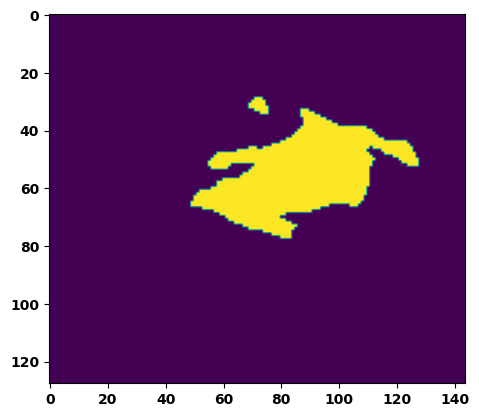

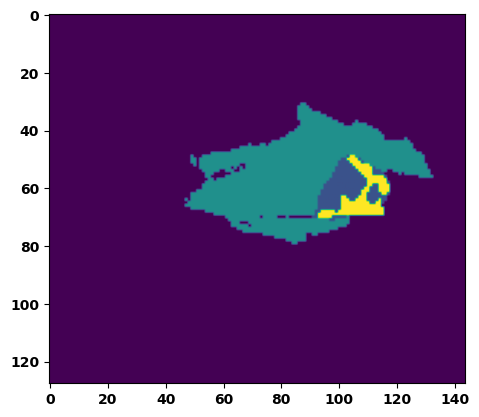

  6%|▌         | 2/36 [00:02<00:50,  1.49s/it]

Batch_id:  1 Eval loss:  0.7566777467727661
Batch_id:  1 Eval IoU:  tensor(0.2083, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8685, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8028, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8568, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.41s/it]

Batch_id:  2 Eval loss:  0.6766411066055298
Batch_id:  2 Eval IoU:  tensor(0.2392, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.7631, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7182, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9177, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8739, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.7795, device='cuda:0')


 11%|█         | 4/36 [00:05<00:44,  1.39s/it]

Batch_id:  3 Eval loss:  0.5017387866973877
Batch_id:  3 Eval IoU:  tensor(0.4069, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9270, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9442, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9338, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:42,  1.36s/it]

Batch_id:  4 Eval loss:  0.6366743445396423
Batch_id:  4 Eval IoU:  tensor(0.2926, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8777, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9427, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.39s/it]

Batch_id:  5 Eval loss:  0.64098060131073
Batch_id:  5 Eval IoU:  tensor(0.3164, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.39s/it]

Batch_id:  6 Eval loss:  0.1895618885755539
Batch_id:  6 Eval IoU:  tensor(0.7335, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.46s/it]

Batch_id:  7 Eval loss:  0.05894230306148529
Batch_id:  7 Eval IoU:  tensor(0.8947, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:39,  1.47s/it]

Batch_id:  8 Eval loss:  0.3986070156097412
Batch_id:  8 Eval IoU:  tensor(0.5004, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.47s/it]

Batch_id:  9 Eval loss:  0.12054094672203064
Batch_id:  9 Eval IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  10 Eval loss:  0.3468499779701233
Batch_id:  10 Eval IoU:  tensor(0.5492, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9352, device='cuda:0')


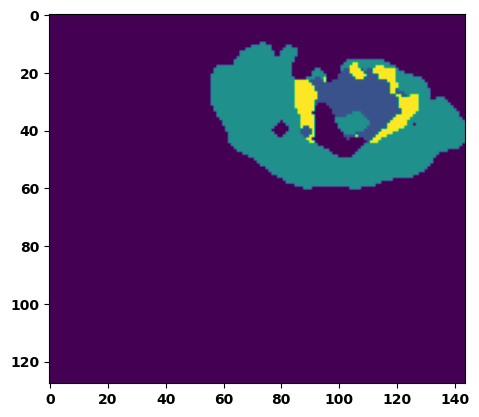

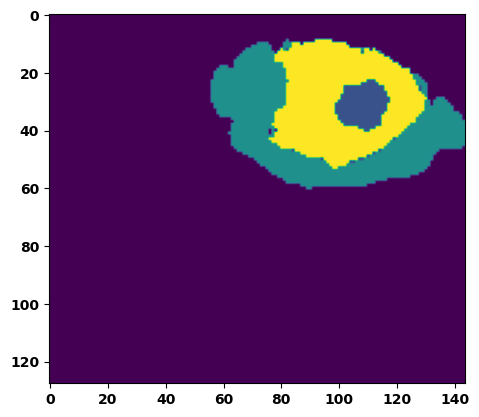

 33%|███▎      | 12/36 [00:17<00:36,  1.52s/it]

Batch_id:  11 Eval loss:  0.59134840965271
Batch_id:  11 Eval IoU:  tensor(0.3646, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.54s/it]

Batch_id:  12 Eval loss:  0.5983349084854126
Batch_id:  12 Eval IoU:  tensor(0.3295, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9417, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9870, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.49s/it]

Batch_id:  13 Eval loss:  0.8572374582290649
Batch_id:  13 Eval IoU:  tensor(0.0772, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.4604, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.3061, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9338, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9473, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.1940, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.51s/it]

Batch_id:  14 Eval loss:  0.1433328241109848
Batch_id:  14 Eval IoU:  tensor(0.7809, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.49s/it]

Batch_id:  15 Eval loss:  0.6320472359657288
Batch_id:  15 Eval IoU:  tensor(0.3071, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9857, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.47s/it]

Batch_id:  16 Eval loss:  0.875241756439209
Batch_id:  16 Eval IoU:  tensor(0.0761, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.5127, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.2708, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.6593, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.6431, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.46s/it]

Batch_id:  17 Eval loss:  0.8816863894462585
Batch_id:  17 Eval IoU:  tensor(0.0761, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4984, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4219, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.2477, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.44s/it]

Batch_id:  18 Eval loss:  0.1309596449136734
Batch_id:  18 Eval IoU:  tensor(0.7836, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9950, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.40s/it]

Batch_id:  19 Eval loss:  0.5590584874153137
Batch_id:  19 Eval IoU:  tensor(0.3754, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  20 Eval loss:  0.36850592494010925
Batch_id:  20 Eval IoU:  tensor(0.5006, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9440, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9450, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9646, device='cuda:0')


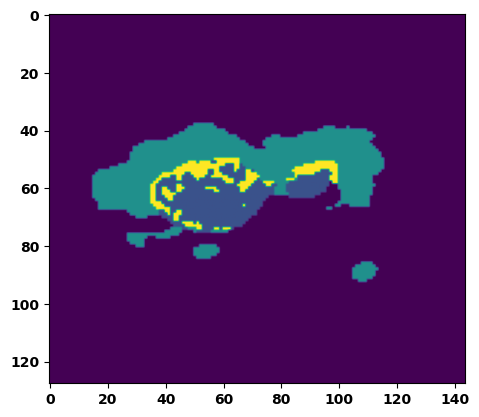

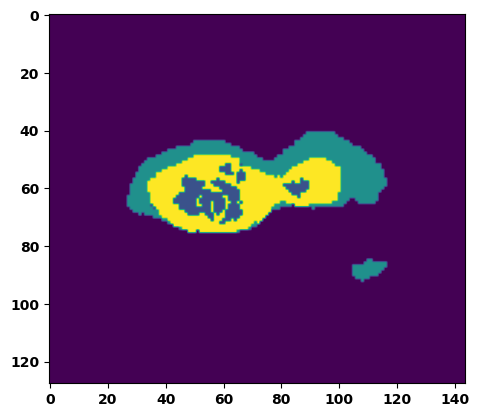

 61%|██████    | 22/36 [00:32<00:20,  1.44s/it]

Batch_id:  21 Eval loss:  0.5415278077125549
Batch_id:  21 Eval IoU:  tensor(0.3888, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8617, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9317, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9320, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.43s/it]

Batch_id:  22 Eval loss:  0.8496496677398682
Batch_id:  22 Eval IoU:  tensor(0.0931, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.5317, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.3928, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.2980, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:16,  1.37s/it]

Batch_id:  23 Eval loss:  0.7081559300422668
Batch_id:  23 Eval IoU:  tensor(0.2649, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:14,  1.34s/it]

Batch_id:  24 Eval loss:  0.8537057042121887
Batch_id:  24 Eval IoU:  tensor(0.0949, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.5340, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4411, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.8632, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.3092, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:13,  1.36s/it]

Batch_id:  25 Eval loss:  0.7749502658843994
Batch_id:  25 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.34s/it]

Batch_id:  26 Eval loss:  0.3025706708431244
Batch_id:  26 Eval IoU:  tensor(0.5753, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9507, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:10,  1.30s/it]

Batch_id:  27 Eval loss:  0.7577215433120728
Batch_id:  27 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.30s/it]

Batch_id:  28 Eval loss:  0.68965744972229
Batch_id:  28 Eval IoU:  tensor(0.2276, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7601, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7048, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.6432, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9479, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.34s/it]

Batch_id:  29 Eval loss:  0.7517529726028442
Batch_id:  29 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  30 Eval loss:  0.7683137059211731
Batch_id:  30 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


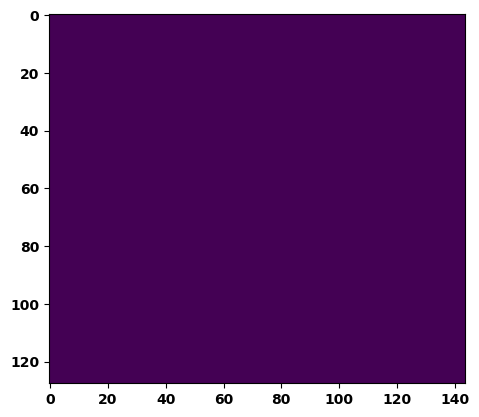

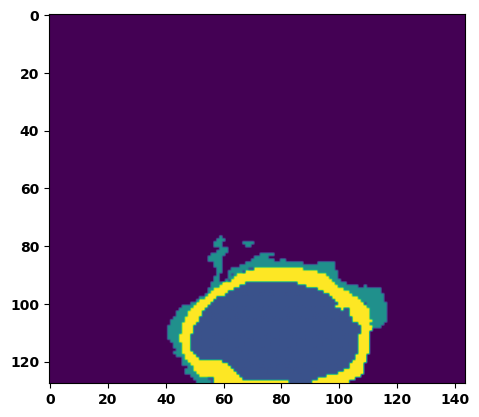

 89%|████████▉ | 32/36 [00:45<00:05,  1.37s/it]

Batch_id:  31 Eval loss:  0.34863173961639404
Batch_id:  31 Eval IoU:  tensor(0.5901, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9898, device='cuda:0')


 92%|█████████▏| 33/36 [00:46<00:04,  1.42s/it]

Batch_id:  32 Eval loss:  0.7559702396392822
Batch_id:  32 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.42s/it]

Batch_id:  33 Eval loss:  0.4339045584201813
Batch_id:  33 Eval IoU:  tensor(0.4769, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.7899, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.6868, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.6869, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.36s/it]

Batch_id:  34 Eval loss:  0.902237057685852
Batch_id:  34 Eval IoU:  tensor(0.0577, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.4613, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.3358, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.1920, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.42s/it]

Batch_id:  35 Eval loss:  0.7438204884529114
Batch_id:  35 Eval IoU:  tensor(0.2376, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9186, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9060, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9749, device='cuda:0')
Epoch 00037: reducing learning rate of group 0 to 1.5625e-05.
Epoch  36 Training loss:  0.13030239763585003
Epoch  36 Evaluation loss:  0.5748654959930314
Epoch  36 Training accuracy :  tensor(0.8055)
Epoch  36 Evaluation accuracy :  tensor(0.3658)
Epoch  36 Training Mean Dice Score:  tensor(0.9846)
Epoch  36 Eval Mean Dice Score:  tensor(0.8623)
Epoch  36 Training Non-tumor Dice Score:  tensor(0.9856)
Epoch  36 Eval Non-tumor Dice Score:  tensor(0.8231)
Epoch  36 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  36 Eval NCR/NET Dice Score: 

Epoch: 37
Training in session: 


  1%|          | 1/110 [00:01<02:54,  1.60s/it]

Batch_id:  0 Training loss:  0.09463100135326385
Batch_id:  0 Training IoU:  tensor(0.8362, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:31,  1.40s/it]

Batch_id:  1 Training loss:  0.11530855298042297
Batch_id:  1 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:36,  1.46s/it]

Batch_id:  2 Training loss:  0.09103502333164215
Batch_id:  2 Training IoU:  tensor(0.8463, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:30,  1.42s/it]

Batch_id:  3 Training loss:  0.35979270935058594
Batch_id:  3 Training IoU:  tensor(0.5560, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9760, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:24,  1.37s/it]

Batch_id:  4 Training loss:  0.17975133657455444
Batch_id:  4 Training IoU:  tensor(0.7814, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:26,  1.41s/it]

Batch_id:  5 Training loss:  0.06151770055294037
Batch_id:  5 Training IoU:  tensor(0.9273, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


  6%|▋         | 7/110 [00:09<02:22,  1.38s/it]

Batch_id:  6 Training loss:  0.09818528592586517
Batch_id:  6 Training IoU:  tensor(0.8324, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:20,  1.37s/it]

Batch_id:  7 Training loss:  0.12655757367610931
Batch_id:  7 Training IoU:  tensor(0.8176, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:32,  1.51s/it]

Batch_id:  8 Training loss:  0.10556071996688843
Batch_id:  8 Training IoU:  tensor(0.8277, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:34,  1.54s/it]

Batch_id:  9 Training loss:  0.22768770158290863
Batch_id:  9 Training IoU:  tensor(0.6811, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 10%|█         | 11/110 [00:15<02:23,  1.45s/it]

Batch_id:  10 Training loss:  0.056394100189208984
Batch_id:  10 Training IoU:  tensor(0.9023, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 11%|█         | 12/110 [00:17<02:18,  1.42s/it]

Batch_id:  11 Training loss:  0.08998428285121918
Batch_id:  11 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:15,  1.40s/it]

Batch_id:  12 Training loss:  0.07584701478481293
Batch_id:  12 Training IoU:  tensor(0.8730, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:16,  1.43s/it]

Batch_id:  13 Training loss:  0.14158135652542114
Batch_id:  13 Training IoU:  tensor(0.7823, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:10,  1.37s/it]

Batch_id:  14 Training loss:  0.09541977941989899
Batch_id:  14 Training IoU:  tensor(0.8414, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 15%|█▍        | 16/110 [00:22<02:07,  1.36s/it]

Batch_id:  15 Training loss:  0.1503402292728424
Batch_id:  15 Training IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 15%|█▌        | 17/110 [00:23<02:06,  1.36s/it]

Batch_id:  16 Training loss:  0.14352692663669586
Batch_id:  16 Training IoU:  tensor(0.8010, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:05,  1.36s/it]

Batch_id:  17 Training loss:  0.1337367594242096
Batch_id:  17 Training IoU:  tensor(0.8030, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 17%|█▋        | 19/110 [00:26<02:05,  1.38s/it]

Batch_id:  18 Training loss:  0.05659164488315582
Batch_id:  18 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:03,  1.37s/it]

Batch_id:  19 Training loss:  0.2917806804180145
Batch_id:  19 Training IoU:  tensor(0.6241, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 19%|█▉        | 21/110 [00:29<02:04,  1.40s/it]

Batch_id:  20 Training loss:  0.14872965216636658
Batch_id:  20 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 20%|██        | 22/110 [00:31<02:06,  1.44s/it]

Batch_id:  21 Training loss:  0.08465585112571716
Batch_id:  21 Training IoU:  tensor(0.8540, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 21%|██        | 23/110 [00:32<02:01,  1.40s/it]

Batch_id:  22 Training loss:  0.2403981238603592
Batch_id:  22 Training IoU:  tensor(0.6942, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 22%|██▏       | 24/110 [00:33<01:59,  1.39s/it]

Batch_id:  23 Training loss:  0.08179952204227448
Batch_id:  23 Training IoU:  tensor(0.8639, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 23%|██▎       | 25/110 [00:35<01:57,  1.38s/it]

Batch_id:  24 Training loss:  0.11867813766002655
Batch_id:  24 Training IoU:  tensor(0.8015, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 24%|██▎       | 26/110 [00:36<01:56,  1.39s/it]

Batch_id:  25 Training loss:  0.06428183615207672
Batch_id:  25 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 25%|██▍       | 27/110 [00:38<02:03,  1.48s/it]

Batch_id:  26 Training loss:  0.24363872408866882
Batch_id:  26 Training IoU:  tensor(0.6679, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 25%|██▌       | 28/110 [00:39<01:59,  1.46s/it]

Batch_id:  27 Training loss:  0.053360939025878906
Batch_id:  27 Training IoU:  tensor(0.9075, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 26%|██▋       | 29/110 [00:41<01:59,  1.48s/it]

Batch_id:  28 Training loss:  0.21547101438045502
Batch_id:  28 Training IoU:  tensor(0.7178, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 27%|██▋       | 30/110 [00:42<02:00,  1.50s/it]

Batch_id:  29 Training loss:  0.11405289173126221
Batch_id:  29 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 28%|██▊       | 31/110 [00:44<02:03,  1.57s/it]

Batch_id:  30 Training loss:  0.0945337563753128
Batch_id:  30 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 29%|██▉       | 32/110 [00:45<01:58,  1.53s/it]

Batch_id:  31 Training loss:  0.194483682513237
Batch_id:  31 Training IoU:  tensor(0.7001, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 30%|███       | 33/110 [00:47<01:54,  1.48s/it]

Batch_id:  32 Training loss:  0.11096115410327911
Batch_id:  32 Training IoU:  tensor(0.8208, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 31%|███       | 34/110 [00:48<01:50,  1.46s/it]

Batch_id:  33 Training loss:  0.2544655203819275
Batch_id:  33 Training IoU:  tensor(0.6707, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:47,  1.43s/it]

Batch_id:  34 Training loss:  0.08408111333847046
Batch_id:  34 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 33%|███▎      | 36/110 [00:51<01:46,  1.45s/it]

Batch_id:  35 Training loss:  0.1119709461927414
Batch_id:  35 Training IoU:  tensor(0.9027, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.3206592798233032
Batch_id:  36 Training IoU:  tensor(0.6295, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 35%|███▍      | 38/110 [00:54<01:46,  1.48s/it]

Batch_id:  37 Training loss:  0.21962212026119232
Batch_id:  37 Training IoU:  tensor(0.7269, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 35%|███▌      | 39/110 [00:55<01:40,  1.42s/it]

Batch_id:  38 Training loss:  0.18508949875831604
Batch_id:  38 Training IoU:  tensor(0.7151, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 36%|███▋      | 40/110 [00:57<01:36,  1.38s/it]

Batch_id:  39 Training loss:  0.12531651556491852
Batch_id:  39 Training IoU:  tensor(0.7918, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 37%|███▋      | 41/110 [00:58<01:34,  1.38s/it]

Batch_id:  40 Training loss:  0.2427641898393631
Batch_id:  40 Training IoU:  tensor(0.6913, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 38%|███▊      | 42/110 [01:00<01:39,  1.46s/it]

Batch_id:  41 Training loss:  0.15571771562099457
Batch_id:  41 Training IoU:  tensor(0.7547, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9835, device='cuda:0')


 39%|███▉      | 43/110 [01:01<01:36,  1.45s/it]

Batch_id:  42 Training loss:  0.1785736382007599
Batch_id:  42 Training IoU:  tensor(0.7189, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 40%|████      | 44/110 [01:03<01:38,  1.50s/it]

Batch_id:  43 Training loss:  0.0750245600938797
Batch_id:  43 Training IoU:  tensor(0.8707, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 41%|████      | 45/110 [01:04<01:36,  1.49s/it]

Batch_id:  44 Training loss:  0.05309738218784332
Batch_id:  44 Training IoU:  tensor(0.9080, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 42%|████▏     | 46/110 [01:06<01:33,  1.46s/it]

Batch_id:  45 Training loss:  0.07177269458770752
Batch_id:  45 Training IoU:  tensor(0.8764, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 43%|████▎     | 47/110 [01:07<01:31,  1.45s/it]

Batch_id:  46 Training loss:  0.2046830654144287
Batch_id:  46 Training IoU:  tensor(0.7281, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 44%|████▎     | 48/110 [01:08<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.06253720819950104
Batch_id:  47 Training IoU:  tensor(0.8929, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 45%|████▍     | 49/110 [01:10<01:28,  1.46s/it]

Batch_id:  48 Training loss:  0.10847078263759613
Batch_id:  48 Training IoU:  tensor(0.8251, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 45%|████▌     | 50/110 [01:11<01:26,  1.45s/it]

Batch_id:  49 Training loss:  0.20059476792812347
Batch_id:  49 Training IoU:  tensor(0.7224, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 46%|████▋     | 51/110 [01:13<01:28,  1.50s/it]

Batch_id:  50 Training loss:  0.05298334360122681
Batch_id:  50 Training IoU:  tensor(0.9096, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 47%|████▋     | 52/110 [01:14<01:26,  1.50s/it]

Batch_id:  51 Training loss:  0.07654985785484314
Batch_id:  51 Training IoU:  tensor(0.8884, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:25,  1.50s/it]

Batch_id:  52 Training loss:  0.14195698499679565
Batch_id:  52 Training IoU:  tensor(0.7794, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 49%|████▉     | 54/110 [01:17<01:22,  1.47s/it]

Batch_id:  53 Training loss:  0.1064002513885498
Batch_id:  53 Training IoU:  tensor(0.8177, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.12751615047454834
Batch_id:  54 Training IoU:  tensor(0.7936, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 51%|█████     | 56/110 [01:20<01:15,  1.40s/it]

Batch_id:  55 Training loss:  0.12972334027290344
Batch_id:  55 Training IoU:  tensor(0.7986, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9872, device='cuda:0')


 52%|█████▏    | 57/110 [01:21<01:13,  1.38s/it]

Batch_id:  56 Training loss:  0.23767848312854767
Batch_id:  56 Training IoU:  tensor(0.7079, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 53%|█████▎    | 58/110 [01:23<01:12,  1.40s/it]

Batch_id:  57 Training loss:  0.08070124685764313
Batch_id:  57 Training IoU:  tensor(0.8623, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 54%|█████▎    | 59/110 [01:24<01:12,  1.42s/it]

Batch_id:  58 Training loss:  0.0629076212644577
Batch_id:  58 Training IoU:  tensor(0.9034, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:11,  1.43s/it]

Batch_id:  59 Training loss:  0.0848604291677475
Batch_id:  59 Training IoU:  tensor(0.8549, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 55%|█████▌    | 61/110 [01:27<01:08,  1.40s/it]

Batch_id:  60 Training loss:  0.10670138895511627
Batch_id:  60 Training IoU:  tensor(0.8235, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:09,  1.45s/it]

Batch_id:  61 Training loss:  0.17152339220046997
Batch_id:  61 Training IoU:  tensor(0.7390, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 57%|█████▋    | 63/110 [01:30<01:06,  1.42s/it]

Batch_id:  62 Training loss:  0.0924796313047409
Batch_id:  62 Training IoU:  tensor(0.8406, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:07,  1.46s/it]

Batch_id:  63 Training loss:  0.11006322503089905
Batch_id:  63 Training IoU:  tensor(0.8187, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 59%|█████▉    | 65/110 [01:33<01:05,  1.45s/it]

Batch_id:  64 Training loss:  0.06540147960186005
Batch_id:  64 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 60%|██████    | 66/110 [01:34<01:03,  1.44s/it]

Batch_id:  65 Training loss:  0.17293067276477814
Batch_id:  65 Training IoU:  tensor(0.7491, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 61%|██████    | 67/110 [01:36<01:01,  1.42s/it]

Batch_id:  66 Training loss:  0.11665289103984833
Batch_id:  66 Training IoU:  tensor(0.8147, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 62%|██████▏   | 68/110 [01:37<01:00,  1.44s/it]

Batch_id:  67 Training loss:  0.10128115117549896
Batch_id:  67 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 63%|██████▎   | 69/110 [01:39<00:59,  1.45s/it]

Batch_id:  68 Training loss:  0.17647716403007507
Batch_id:  68 Training IoU:  tensor(0.7322, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 64%|██████▎   | 70/110 [01:40<00:57,  1.43s/it]

Batch_id:  69 Training loss:  0.07900242507457733
Batch_id:  69 Training IoU:  tensor(0.8644, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 65%|██████▍   | 71/110 [01:42<00:57,  1.47s/it]

Batch_id:  70 Training loss:  0.10298922657966614
Batch_id:  70 Training IoU:  tensor(0.8418, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 65%|██████▌   | 72/110 [01:43<00:55,  1.46s/it]

Batch_id:  71 Training loss:  0.13684889674186707
Batch_id:  71 Training IoU:  tensor(0.8104, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:54,  1.47s/it]

Batch_id:  72 Training loss:  0.2195228785276413
Batch_id:  72 Training IoU:  tensor(0.6792, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9638, device='cuda:0')


 67%|██████▋   | 74/110 [01:46<00:50,  1.41s/it]

Batch_id:  73 Training loss:  0.10864438116550446
Batch_id:  73 Training IoU:  tensor(0.8293, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 68%|██████▊   | 75/110 [01:47<00:49,  1.42s/it]

Batch_id:  74 Training loss:  0.10842885076999664
Batch_id:  74 Training IoU:  tensor(0.8157, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:49,  1.44s/it]

Batch_id:  75 Training loss:  0.05810867249965668
Batch_id:  75 Training IoU:  tensor(0.9002, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 70%|███████   | 77/110 [01:50<00:48,  1.48s/it]

Batch_id:  76 Training loss:  0.0743965208530426
Batch_id:  76 Training IoU:  tensor(0.8697, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:46,  1.45s/it]

Batch_id:  77 Training loss:  0.1461154818534851
Batch_id:  77 Training IoU:  tensor(0.7829, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 72%|███████▏  | 79/110 [01:53<00:45,  1.47s/it]

Batch_id:  78 Training loss:  0.1006460189819336
Batch_id:  78 Training IoU:  tensor(0.8308, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:44,  1.47s/it]

Batch_id:  79 Training loss:  0.030505478382110596
Batch_id:  79 Training IoU:  tensor(0.9476, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 74%|███████▎  | 81/110 [01:56<00:42,  1.46s/it]

Batch_id:  80 Training loss:  0.08206702768802643
Batch_id:  80 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 75%|███████▍  | 82/110 [01:58<00:42,  1.52s/it]

Batch_id:  81 Training loss:  0.06817859411239624
Batch_id:  81 Training IoU:  tensor(0.8864, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 75%|███████▌  | 83/110 [01:59<00:41,  1.54s/it]

Batch_id:  82 Training loss:  0.09950447082519531
Batch_id:  82 Training IoU:  tensor(0.8616, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 76%|███████▋  | 84/110 [02:01<00:39,  1.51s/it]

Batch_id:  83 Training loss:  0.20124924182891846
Batch_id:  83 Training IoU:  tensor(0.7718, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 77%|███████▋  | 85/110 [02:02<00:36,  1.45s/it]

Batch_id:  84 Training loss:  0.16699150204658508
Batch_id:  84 Training IoU:  tensor(0.7894, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 78%|███████▊  | 86/110 [02:04<00:35,  1.48s/it]

Batch_id:  85 Training loss:  0.1612139642238617
Batch_id:  85 Training IoU:  tensor(0.7506, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 79%|███████▉  | 87/110 [02:05<00:33,  1.47s/it]

Batch_id:  86 Training loss:  0.13495934009552002
Batch_id:  86 Training IoU:  tensor(0.7751, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9815, device='cuda:0')


 80%|████████  | 88/110 [02:06<00:31,  1.41s/it]

Batch_id:  87 Training loss:  0.15073388814926147
Batch_id:  87 Training IoU:  tensor(0.7624, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 81%|████████  | 89/110 [02:08<00:29,  1.40s/it]

Batch_id:  88 Training loss:  0.09425513446331024
Batch_id:  88 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 82%|████████▏ | 90/110 [02:09<00:27,  1.38s/it]

Batch_id:  89 Training loss:  0.13511919975280762
Batch_id:  89 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 83%|████████▎ | 91/110 [02:10<00:26,  1.38s/it]

Batch_id:  90 Training loss:  0.14457541704177856
Batch_id:  90 Training IoU:  tensor(0.7636, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 84%|████████▎ | 92/110 [02:12<00:25,  1.40s/it]

Batch_id:  91 Training loss:  0.22180108726024628
Batch_id:  91 Training IoU:  tensor(0.6995, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 85%|████████▍ | 93/110 [02:13<00:23,  1.38s/it]

Batch_id:  92 Training loss:  0.13621683418750763
Batch_id:  92 Training IoU:  tensor(0.7880, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


 85%|████████▌ | 94/110 [02:15<00:21,  1.36s/it]

Batch_id:  93 Training loss:  0.044517695903778076
Batch_id:  93 Training IoU:  tensor(0.9261, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 86%|████████▋ | 95/110 [02:16<00:21,  1.45s/it]

Batch_id:  94 Training loss:  0.13245724141597748
Batch_id:  94 Training IoU:  tensor(0.7958, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 87%|████████▋ | 96/110 [02:18<00:20,  1.44s/it]

Batch_id:  95 Training loss:  0.11618898808956146
Batch_id:  95 Training IoU:  tensor(0.8057, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 88%|████████▊ | 97/110 [02:19<00:19,  1.47s/it]

Batch_id:  96 Training loss:  0.12087400257587433
Batch_id:  96 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 89%|████████▉ | 98/110 [02:21<00:17,  1.44s/it]

Batch_id:  97 Training loss:  0.21459949016571045
Batch_id:  97 Training IoU:  tensor(0.6941, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 90%|█████████ | 99/110 [02:22<00:16,  1.47s/it]

Batch_id:  98 Training loss:  0.05890648066997528
Batch_id:  98 Training IoU:  tensor(0.8994, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 91%|█████████ | 100/110 [02:24<00:14,  1.47s/it]

Batch_id:  99 Training loss:  0.15345169603824615
Batch_id:  99 Training IoU:  tensor(0.7551, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 92%|█████████▏| 101/110 [02:25<00:13,  1.46s/it]

Batch_id:  100 Training loss:  0.14110024273395538
Batch_id:  100 Training IoU:  tensor(0.7708, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 93%|█████████▎| 102/110 [02:26<00:11,  1.44s/it]

Batch_id:  101 Training loss:  0.0737445205450058
Batch_id:  101 Training IoU:  tensor(0.8744, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 94%|█████████▎| 103/110 [02:28<00:10,  1.46s/it]

Batch_id:  102 Training loss:  0.12590806186199188
Batch_id:  102 Training IoU:  tensor(0.8139, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 95%|█████████▍| 104/110 [02:29<00:08,  1.46s/it]

Batch_id:  103 Training loss:  0.06254449486732483
Batch_id:  103 Training IoU:  tensor(0.8909, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 95%|█████████▌| 105/110 [02:31<00:07,  1.49s/it]

Batch_id:  104 Training loss:  0.07515305280685425
Batch_id:  104 Training IoU:  tensor(0.9265, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 96%|█████████▋| 106/110 [02:32<00:05,  1.48s/it]

Batch_id:  105 Training loss:  0.2341884821653366
Batch_id:  105 Training IoU:  tensor(0.6701, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 97%|█████████▋| 107/110 [02:34<00:04,  1.47s/it]

Batch_id:  106 Training loss:  0.09286002814769745
Batch_id:  106 Training IoU:  tensor(0.8494, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 98%|█████████▊| 108/110 [02:35<00:03,  1.51s/it]

Batch_id:  107 Training loss:  0.04906958341598511
Batch_id:  107 Training IoU:  tensor(0.9212, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 99%|█████████▉| 109/110 [02:37<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.15378256142139435
Batch_id:  108 Training IoU:  tensor(0.7500, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


100%|██████████| 110/110 [02:39<00:00,  1.45s/it]


Batch_id:  109 Training loss:  0.08664815127849579
Batch_id:  109 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9939, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5033122301101685
Batch_id:  0 Eval IoU:  tensor(0.3839, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.5326, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3253, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.3215, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9845, device='cuda:0')


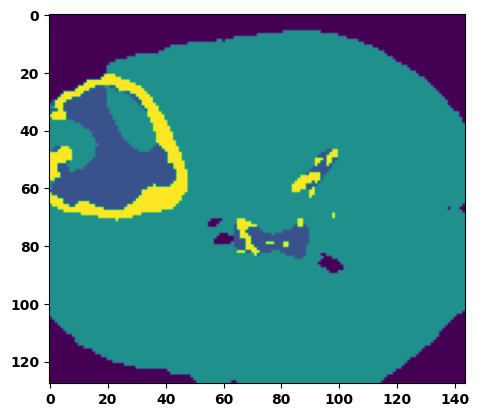

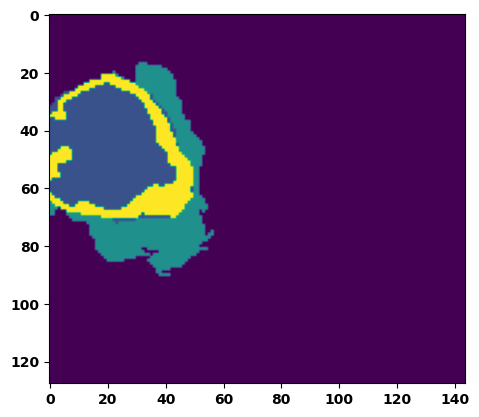

  3%|▎         | 1/36 [00:01<00:55,  1.58s/it]

Batch_id:  1 Eval loss:  0.634814977645874
Batch_id:  1 Eval IoU:  tensor(0.2990, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8665, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8033, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  

  6%|▌         | 2/36 [00:03<00:56,  1.66s/it]

tensor(0.9780, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.8917, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:50,  1.54s/it]

Batch_id:  2 Eval loss:  0.729692280292511
Batch_id:  2 Eval IoU:  tensor(0.2079, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.7272, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.6111, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.6037, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 11%|█         | 4/36 [00:06<00:47,  1.48s/it]

Batch_id:  3 Eval loss:  0.8235071897506714
Batch_id:  3 Eval IoU:  tensor(0.1244, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6456, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.4733, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.4797, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.48s/it]

Batch_id:  4 Eval loss:  0.6774737238883972
Batch_id:  4 Eval IoU:  tensor(0.2792, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9522, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9448, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9784, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.46s/it]

Batch_id:  5 Eval loss:  0.38976961374282837
Batch_id:  5 Eval IoU:  tensor(0.5303, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9933, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:43,  1.49s/it]

Batch_id:  6 Eval loss:  0.7532932758331299
Batch_id:  6 Eval IoU:  tensor(0.2385, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.46s/it]

Batch_id:  7 Eval loss:  0.7576954364776611
Batch_id:  7 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.45s/it]

Batch_id:  8 Eval loss:  0.7011339664459229
Batch_id:  8 Eval IoU:  tensor(0.2432, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8808, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8233, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8732, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.45s/it]

Batch_id:  9 Eval loss:  0.6248241662979126
Batch_id:  9 Eval IoU:  tensor(0.3198, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  10 Eval loss:  0.6675019264221191
Batch_id:  10 Eval IoU:  tensor(0.2497, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.7045, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.5963, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.6438, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


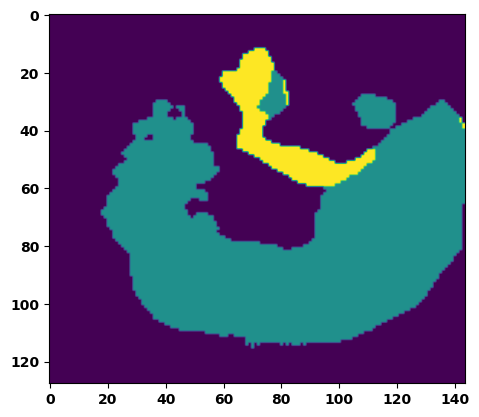

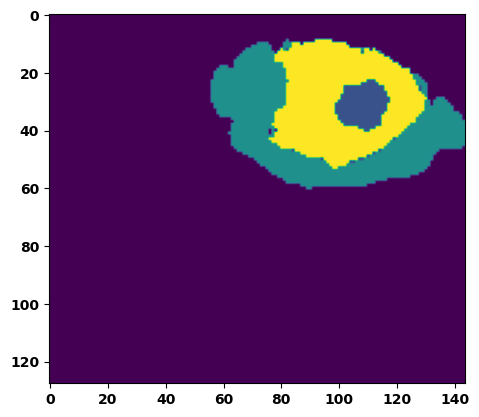

 33%|███▎      | 12/36 [00:17<00:35,  1.48s/it]

Batch_id:  11 Eval loss:  0.7563222646713257
Batch_id:  11 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.49s/it]

Batch_id:  12 Eval loss:  0.6034327745437622
Batch_id:  12 Eval IoU:  tensor(0.2993, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7990, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.7361, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7726, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9633, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.50s/it]

Batch_id:  13 Eval loss:  0.47732192277908325
Batch_id:  13 Eval IoU:  tensor(0.4241, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9867, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.49s/it]

Batch_id:  14 Eval loss:  0.7175155878067017
Batch_id:  14 Eval IoU:  tensor(0.2570, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9377, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.45s/it]

Batch_id:  15 Eval loss:  0.664345920085907
Batch_id:  15 Eval IoU:  tensor(0.2893, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9279, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:27,  1.43s/it]

Batch_id:  16 Eval loss:  0.768286943435669
Batch_id:  16 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:25,  1.43s/it]

Batch_id:  17 Eval loss:  0.7574222087860107
Batch_id:  17 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.41s/it]

Batch_id:  18 Eval loss:  0.3613618314266205
Batch_id:  18 Eval IoU:  tensor(0.5096, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9394, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9434, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9526, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:23,  1.44s/it]

Batch_id:  19 Eval loss:  0.2986202836036682
Batch_id:  19 Eval IoU:  tensor(0.5712, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  20 Eval loss:  0.655987024307251
Batch_id:  20 Eval IoU:  tensor(0.2839, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8736, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8472, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.8555, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9290, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


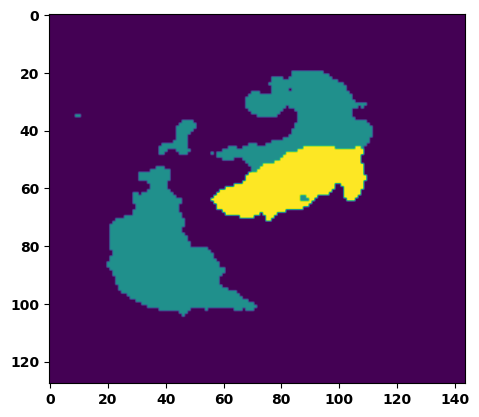

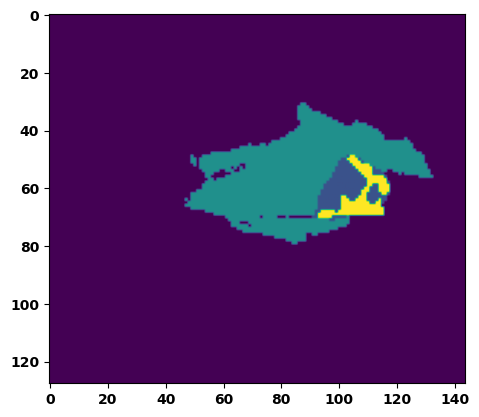

 61%|██████    | 22/36 [00:32<00:21,  1.51s/it]

Batch_id:  21 Eval loss:  0.758882999420166
Batch_id:  21 Eval IoU:  tensor(0.2296, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9437, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9172, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.47s/it]

Batch_id:  22 Eval loss:  0.598954439163208
Batch_id:  22 Eval IoU:  tensor(0.3568, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.45s/it]

Batch_id:  23 Eval loss:  0.7739302515983582
Batch_id:  23 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.8495840430259705
Batch_id:  24 Eval IoU:  tensor(0.0884, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4679, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3396, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9014, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2081, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.44s/it]

Batch_id:  25 Eval loss:  0.7529035806655884
Batch_id:  25 Eval IoU:  tensor(0.2367, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:12,  1.41s/it]

Batch_id:  26 Eval loss:  0.6822932958602905
Batch_id:  26 Eval IoU:  tensor(0.2255, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.5562, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.3986, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.3413, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.38s/it]

Batch_id:  27 Eval loss:  0.49439483880996704
Batch_id:  27 Eval IoU:  tensor(0.3763, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.6376, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4641, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.4637, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:09,  1.38s/it]

Batch_id:  28 Eval loss:  0.7440468072891235
Batch_id:  28 Eval IoU:  tensor(0.1791, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.6359, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.4810, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.5175, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.40s/it]

Batch_id:  29 Eval loss:  0.7170692682266235
Batch_id:  29 Eval IoU:  tensor(0.2526, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9483, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9407, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  30 Eval loss:  0.7520791888237
Batch_id:  30 Eval IoU:  tensor(0.1853, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.7380, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.6284, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.6098, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


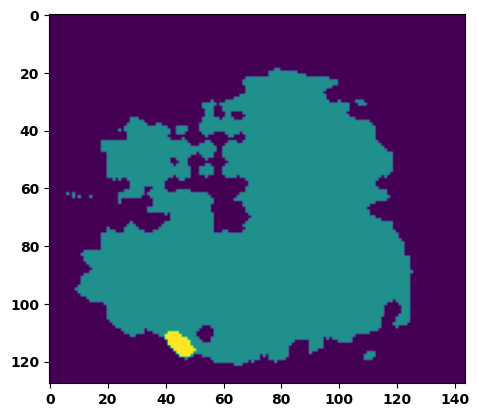

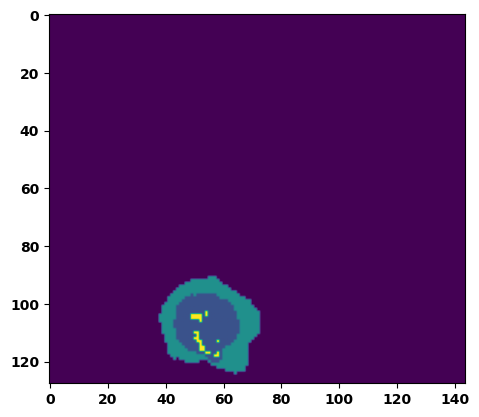

 89%|████████▉ | 32/36 [00:47<00:05,  1.50s/it]

Batch_id:  31 Eval loss:  0.5750162601470947
Batch_id:  31 Eval IoU:  tensor(0.3511, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9186, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9101, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8816, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9825, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.49s/it]

Batch_id:  32 Eval loss:  0.4235016703605652
Batch_id:  32 Eval IoU:  tensor(0.4695, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9489, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9269, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9743, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.43s/it]

Batch_id:  33 Eval loss:  0.6758537888526917
Batch_id:  33 Eval IoU:  tensor(0.2477, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.7228, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.6602, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.6699, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.8946, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.41s/it]

Batch_id:  34 Eval loss:  0.8809714913368225
Batch_id:  34 Eval IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.4984, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4218, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9039, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.2480, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.46s/it]

Batch_id:  35 Eval loss:  0.7517262101173401
Batch_id:  35 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Epoch  37 Training loss:  0.12934158796613868
Epoch  37 Evaluation loss:  0.6598567689458529
Epoch  37 Training accuracy :  tensor(0.8066)
Epoch  37 Evaluation accuracy :  tensor(0.2819)
Epoch  37 Training Mean Dice Score:  tensor(0.9847)
Epoch  37 Eval Mean Dice Score:  tensor(0.8386)
Epoch  37 Training Non-tumor Dice Score:  tensor(0.9857)
Epoch  37 Eval Non-tumor Dice Score:  tensor(0.7871)
Epoch  37 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  37 Eval NCR/NET Dice Score:  tensor(0.9121)
Epoch  37 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 38
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.52s/it]

Batch_id:  0 Training loss:  0.08387510478496552
Batch_id:  0 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:40,  1.49s/it]

Batch_id:  1 Training loss:  0.15501122176647186
Batch_id:  1 Training IoU:  tensor(0.7559, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9523, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:40,  1.50s/it]

Batch_id:  2 Training loss:  0.04911096394062042
Batch_id:  2 Training IoU:  tensor(0.9210, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:38,  1.49s/it]

Batch_id:  3 Training loss:  0.3590274453163147
Batch_id:  3 Training IoU:  tensor(0.5568, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9614, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9680, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9767, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:43,  1.56s/it]

Batch_id:  4 Training loss:  0.05803462862968445
Batch_id:  4 Training IoU:  tensor(0.9000, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:40,  1.54s/it]

Batch_id:  5 Training loss:  0.11838407814502716
Batch_id:  5 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:37,  1.53s/it]

Batch_id:  6 Training loss:  0.21800954639911652
Batch_id:  6 Training IoU:  tensor(0.7033, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:35,  1.53s/it]

Batch_id:  7 Training loss:  0.24218855798244476
Batch_id:  7 Training IoU:  tensor(0.6707, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:34,  1.53s/it]

Batch_id:  8 Training loss:  0.11357387900352478
Batch_id:  8 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:30,  1.50s/it]

Batch_id:  9 Training loss:  0.0780465304851532
Batch_id:  9 Training IoU:  tensor(0.8656, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 10%|█         | 11/110 [00:16<02:22,  1.44s/it]

Batch_id:  10 Training loss:  0.126325324177742
Batch_id:  10 Training IoU:  tensor(0.7899, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 11%|█         | 12/110 [00:17<02:19,  1.43s/it]

Batch_id:  11 Training loss:  0.06283141672611237
Batch_id:  11 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:16,  1.41s/it]

Batch_id:  12 Training loss:  0.13617011904716492
Batch_id:  12 Training IoU:  tensor(0.7886, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:11,  1.37s/it]

Batch_id:  13 Training loss:  0.10150784254074097
Batch_id:  13 Training IoU:  tensor(0.8359, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:16,  1.43s/it]

Batch_id:  14 Training loss:  0.0855550467967987
Batch_id:  14 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:16,  1.45s/it]

Batch_id:  15 Training loss:  0.225935697555542
Batch_id:  15 Training IoU:  tensor(0.6834, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:13,  1.43s/it]

Batch_id:  16 Training loss:  0.1394287645816803
Batch_id:  16 Training IoU:  tensor(0.7837, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:13,  1.45s/it]

Batch_id:  17 Training loss:  0.06258629262447357
Batch_id:  17 Training IoU:  tensor(0.9245, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:10,  1.43s/it]

Batch_id:  18 Training loss:  0.09019608795642853
Batch_id:  18 Training IoU:  tensor(0.8470, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:06,  1.40s/it]

Batch_id:  19 Training loss:  0.1332802027463913
Batch_id:  19 Training IoU:  tensor(0.8151, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:05,  1.41s/it]

Batch_id:  20 Training loss:  0.11543875932693481
Batch_id:  20 Training IoU:  tensor(0.8071, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 20%|██        | 22/110 [00:31<02:02,  1.40s/it]

Batch_id:  21 Training loss:  0.1130080372095108
Batch_id:  21 Training IoU:  tensor(0.8209, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 21%|██        | 23/110 [00:33<02:00,  1.38s/it]

Batch_id:  22 Training loss:  0.07157513499259949
Batch_id:  22 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 22%|██▏       | 24/110 [00:34<01:57,  1.37s/it]

Batch_id:  23 Training loss:  0.10189636051654816
Batch_id:  23 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 23%|██▎       | 25/110 [00:35<01:54,  1.35s/it]

Batch_id:  24 Training loss:  0.07589410245418549
Batch_id:  24 Training IoU:  tensor(0.8728, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 24%|██▎       | 26/110 [00:37<01:55,  1.37s/it]

Batch_id:  25 Training loss:  0.12565456330776215
Batch_id:  25 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 25%|██▍       | 27/110 [00:38<01:57,  1.41s/it]

Batch_id:  26 Training loss:  0.1601959764957428
Batch_id:  26 Training IoU:  tensor(0.7521, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 25%|██▌       | 28/110 [00:40<01:59,  1.45s/it]

Batch_id:  27 Training loss:  0.25384682416915894
Batch_id:  27 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 26%|██▋       | 29/110 [00:42<02:00,  1.49s/it]

Batch_id:  28 Training loss:  0.09878511726856232
Batch_id:  28 Training IoU:  tensor(0.8627, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:59,  1.49s/it]

Batch_id:  29 Training loss:  0.13573777675628662
Batch_id:  29 Training IoU:  tensor(0.7998, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 28%|██▊       | 31/110 [00:44<01:54,  1.45s/it]

Batch_id:  30 Training loss:  0.10952204465866089
Batch_id:  30 Training IoU:  tensor(0.8240, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:56,  1.50s/it]

Batch_id:  31 Training loss:  0.07492995262145996
Batch_id:  31 Training IoU:  tensor(0.8690, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 30%|███       | 33/110 [00:47<01:53,  1.47s/it]

Batch_id:  32 Training loss:  0.13767017424106598
Batch_id:  32 Training IoU:  tensor(0.7766, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 31%|███       | 34/110 [00:49<01:51,  1.47s/it]

Batch_id:  33 Training loss:  0.3205340504646301
Batch_id:  33 Training IoU:  tensor(0.6293, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:55,  1.53s/it]

Batch_id:  34 Training loss:  0.09512309730052948
Batch_id:  34 Training IoU:  tensor(0.8353, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:51,  1.51s/it]

Batch_id:  35 Training loss:  0.1753045916557312
Batch_id:  35 Training IoU:  tensor(0.7258, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:51,  1.53s/it]

Batch_id:  36 Training loss:  0.1113654226064682
Batch_id:  36 Training IoU:  tensor(0.9055, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9994, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:48,  1.50s/it]

Batch_id:  37 Training loss:  0.15200813114643097
Batch_id:  37 Training IoU:  tensor(0.7532, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 35%|███▌      | 39/110 [00:56<01:44,  1.47s/it]

Batch_id:  38 Training loss:  0.24041748046875
Batch_id:  38 Training IoU:  tensor(0.6932, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:43,  1.47s/it]

Batch_id:  39 Training loss:  0.21528004109859467
Batch_id:  39 Training IoU:  tensor(0.6931, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:40,  1.46s/it]

Batch_id:  40 Training loss:  0.12845037877559662
Batch_id:  40 Training IoU:  tensor(0.7923, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:39,  1.46s/it]

Batch_id:  41 Training loss:  0.09139622747898102
Batch_id:  41 Training IoU:  tensor(0.8524, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:38,  1.47s/it]

Batch_id:  42 Training loss:  0.14307621121406555
Batch_id:  42 Training IoU:  tensor(0.7791, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 40%|████      | 44/110 [01:04<01:34,  1.44s/it]

Batch_id:  43 Training loss:  0.2021876573562622
Batch_id:  43 Training IoU:  tensor(0.7681, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 41%|████      | 45/110 [01:05<01:35,  1.47s/it]

Batch_id:  44 Training loss:  0.20411112904548645
Batch_id:  44 Training IoU:  tensor(0.7188, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:33,  1.46s/it]

Batch_id:  45 Training loss:  0.12811927497386932
Batch_id:  45 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:32,  1.47s/it]

Batch_id:  46 Training loss:  0.10999412834644318
Batch_id:  46 Training IoU:  tensor(0.8197, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.11718469858169556
Batch_id:  47 Training IoU:  tensor(0.8059, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:30,  1.49s/it]

Batch_id:  48 Training loss:  0.20400375127792358
Batch_id:  48 Training IoU:  tensor(0.7227, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:27,  1.46s/it]

Batch_id:  49 Training loss:  0.08105765283107758
Batch_id:  49 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:25,  1.44s/it]

Batch_id:  50 Training loss:  0.11484234035015106
Batch_id:  50 Training IoU:  tensor(0.8058, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:20,  1.39s/it]

Batch_id:  51 Training loss:  0.18240384757518768
Batch_id:  51 Training IoU:  tensor(0.7181, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 48%|████▊     | 53/110 [01:17<01:20,  1.41s/it]

Batch_id:  52 Training loss:  0.16997817158699036
Batch_id:  52 Training IoU:  tensor(0.7526, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:21,  1.46s/it]

Batch_id:  53 Training loss:  0.06562335789203644
Batch_id:  53 Training IoU:  tensor(0.8881, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 50%|█████     | 55/110 [01:20<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.17215363681316376
Batch_id:  54 Training IoU:  tensor(0.7375, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:16,  1.41s/it]

Batch_id:  55 Training loss:  0.05257035791873932
Batch_id:  55 Training IoU:  tensor(0.9088, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 52%|█████▏    | 57/110 [01:23<01:17,  1.46s/it]

Batch_id:  56 Training loss:  0.07470646500587463
Batch_id:  56 Training IoU:  tensor(0.8709, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:18,  1.50s/it]

Batch_id:  57 Training loss:  0.16574914753437042
Batch_id:  57 Training IoU:  tensor(0.7919, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:14,  1.46s/it]

Batch_id:  58 Training loss:  0.10539171099662781
Batch_id:  58 Training IoU:  tensor(0.8260, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 55%|█████▍    | 60/110 [01:27<01:15,  1.50s/it]

Batch_id:  59 Training loss:  0.05908428132534027
Batch_id:  59 Training IoU:  tensor(0.8997, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:11,  1.47s/it]

Batch_id:  60 Training loss:  0.10601238906383514
Batch_id:  60 Training IoU:  tensor(0.8181, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 56%|█████▋    | 62/110 [01:30<01:09,  1.45s/it]

Batch_id:  61 Training loss:  0.11026091873645782
Batch_id:  61 Training IoU:  tensor(0.8213, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:10,  1.51s/it]

Batch_id:  62 Training loss:  0.10371054708957672
Batch_id:  62 Training IoU:  tensor(0.8412, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 58%|█████▊    | 64/110 [01:33<01:08,  1.48s/it]

Batch_id:  63 Training loss:  0.09117957949638367
Batch_id:  63 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:05,  1.46s/it]

Batch_id:  64 Training loss:  0.28789132833480835
Batch_id:  64 Training IoU:  tensor(0.6297, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 60%|██████    | 66/110 [01:36<01:04,  1.47s/it]

Batch_id:  65 Training loss:  0.2378917932510376
Batch_id:  65 Training IoU:  tensor(0.7067, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:07,  1.56s/it]

Batch_id:  66 Training loss:  0.13212768733501434
Batch_id:  66 Training IoU:  tensor(0.7969, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 62%|██████▏   | 68/110 [01:39<01:03,  1.50s/it]

Batch_id:  67 Training loss:  0.17666983604431152
Batch_id:  67 Training IoU:  tensor(0.7325, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<01:01,  1.49s/it]

Batch_id:  68 Training loss:  0.09703262150287628
Batch_id:  68 Training IoU:  tensor(0.8349, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:58,  1.46s/it]

Batch_id:  69 Training loss:  0.07255376875400543
Batch_id:  69 Training IoU:  tensor(0.8755, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:56,  1.44s/it]

Batch_id:  70 Training loss:  0.05537615716457367
Batch_id:  70 Training IoU:  tensor(0.9019, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.14794009923934937
Batch_id:  71 Training IoU:  tensor(0.7611, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 66%|██████▋   | 73/110 [01:46<00:53,  1.45s/it]

Batch_id:  72 Training loss:  0.07428719103336334
Batch_id:  72 Training IoU:  tensor(0.9271, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:51,  1.44s/it]

Batch_id:  73 Training loss:  0.1447187066078186
Batch_id:  73 Training IoU:  tensor(0.7631, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 68%|██████▊   | 75/110 [01:49<00:49,  1.43s/it]

Batch_id:  74 Training loss:  0.12468519806861877
Batch_id:  74 Training IoU:  tensor(0.8196, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 69%|██████▉   | 76/110 [01:50<00:48,  1.42s/it]

Batch_id:  75 Training loss:  0.21961522102355957
Batch_id:  75 Training IoU:  tensor(0.7247, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 70%|███████   | 77/110 [01:52<00:46,  1.41s/it]

Batch_id:  76 Training loss:  0.1340915411710739
Batch_id:  76 Training IoU:  tensor(0.7843, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 71%|███████   | 78/110 [01:53<00:46,  1.45s/it]

Batch_id:  77 Training loss:  0.07636615633964539
Batch_id:  77 Training IoU:  tensor(0.8879, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 72%|███████▏  | 79/110 [01:55<00:45,  1.46s/it]

Batch_id:  78 Training loss:  0.08616110682487488
Batch_id:  78 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 73%|███████▎  | 80/110 [01:56<00:44,  1.47s/it]

Batch_id:  79 Training loss:  0.231102854013443
Batch_id:  79 Training IoU:  tensor(0.6784, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9516, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 74%|███████▎  | 81/110 [01:58<00:43,  1.49s/it]

Batch_id:  80 Training loss:  0.09585528075695038
Batch_id:  80 Training IoU:  tensor(0.8396, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 75%|███████▍  | 82/110 [01:59<00:40,  1.46s/it]

Batch_id:  81 Training loss:  0.15023404359817505
Batch_id:  81 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:38,  1.42s/it]

Batch_id:  82 Training loss:  0.07889348268508911
Batch_id:  82 Training IoU:  tensor(0.8650, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 76%|███████▋  | 84/110 [02:02<00:38,  1.48s/it]

Batch_id:  83 Training loss:  0.22182774543762207
Batch_id:  83 Training IoU:  tensor(0.6776, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9638, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:36,  1.45s/it]

Batch_id:  84 Training loss:  0.0657767653465271
Batch_id:  84 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 78%|███████▊  | 86/110 [02:05<00:34,  1.43s/it]

Batch_id:  85 Training loss:  0.05358847975730896
Batch_id:  85 Training IoU:  tensor(0.9069, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:32,  1.41s/it]

Batch_id:  86 Training loss:  0.1492820680141449
Batch_id:  86 Training IoU:  tensor(0.7606, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 80%|████████  | 88/110 [02:08<00:30,  1.40s/it]

Batch_id:  87 Training loss:  0.15525482594966888
Batch_id:  87 Training IoU:  tensor(0.7532, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:31,  1.49s/it]

Batch_id:  88 Training loss:  0.05233539640903473
Batch_id:  88 Training IoU:  tensor(0.9110, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.1335228681564331
Batch_id:  89 Training IoU:  tensor(0.7778, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:27,  1.42s/it]

Batch_id:  90 Training loss:  0.10835869610309601
Batch_id:  90 Training IoU:  tensor(0.8305, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:25,  1.44s/it]

Batch_id:  91 Training loss:  0.21348164975643158
Batch_id:  91 Training IoU:  tensor(0.7218, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:25,  1.49s/it]

Batch_id:  92 Training loss:  0.09429053962230682
Batch_id:  92 Training IoU:  tensor(0.8438, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:24,  1.54s/it]

Batch_id:  93 Training loss:  0.062442198395729065
Batch_id:  93 Training IoU:  tensor(0.8926, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:23,  1.54s/it]

Batch_id:  94 Training loss:  0.06144382059574127
Batch_id:  94 Training IoU:  tensor(0.9073, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:20,  1.48s/it]

Batch_id:  95 Training loss:  0.18221871554851532
Batch_id:  95 Training IoU:  tensor(0.7873, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:19,  1.51s/it]

Batch_id:  96 Training loss:  0.08989755809307098
Batch_id:  96 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:18,  1.53s/it]

Batch_id:  97 Training loss:  0.10444174706935883
Batch_id:  97 Training IoU:  tensor(0.8264, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:16,  1.51s/it]

Batch_id:  98 Training loss:  0.19438683986663818
Batch_id:  98 Training IoU:  tensor(0.7006, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:15,  1.51s/it]

Batch_id:  99 Training loss:  0.06889352202415466
Batch_id:  99 Training IoU:  tensor(0.8849, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.47s/it]

Batch_id:  100 Training loss:  0.10812857747077942
Batch_id:  100 Training IoU:  tensor(0.8157, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:11,  1.48s/it]

Batch_id:  101 Training loss:  0.05687962472438812
Batch_id:  101 Training IoU:  tensor(0.9016, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.46s/it]

Batch_id:  102 Training loss:  0.04407684504985809
Batch_id:  102 Training IoU:  tensor(0.9263, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:09,  1.55s/it]

Batch_id:  103 Training loss:  0.14653150737285614
Batch_id:  103 Training IoU:  tensor(0.7970, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.52s/it]

Batch_id:  104 Training loss:  0.09549187123775482
Batch_id:  104 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.23884685337543488
Batch_id:  105 Training IoU:  tensor(0.7004, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.45s/it]

Batch_id:  106 Training loss:  0.08189484477043152
Batch_id:  106 Training IoU:  tensor(0.8580, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:02,  1.45s/it]

Batch_id:  107 Training loss:  0.03054186701774597
Batch_id:  107 Training IoU:  tensor(0.9474, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.43s/it]

Batch_id:  108 Training loss:  0.14633695781230927
Batch_id:  108 Training IoU:  tensor(0.7809, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


100%|██████████| 110/110 [02:40<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.08716899156570435
Batch_id:  109 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9939, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7683136463165283
Batch_id:  0 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


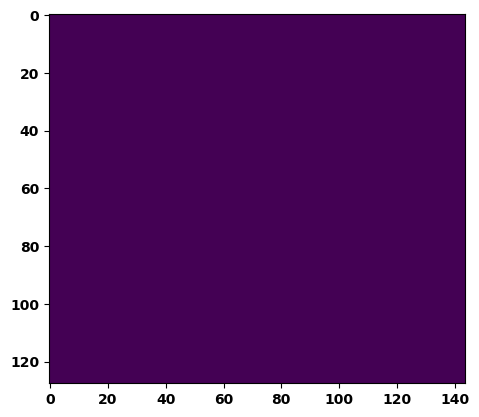

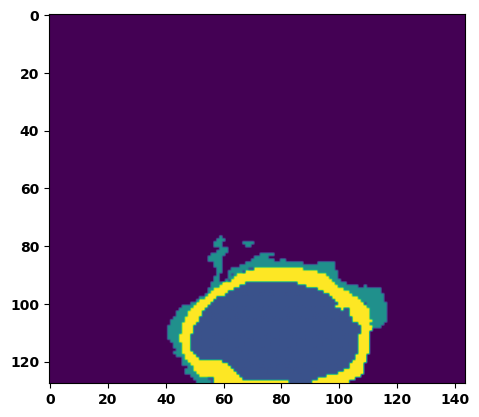

  6%|▌         | 2/36 [00:02<00:47,  1.38s/it]

Batch_id:  1 Eval loss:  0.4253453314304352
Batch_id:  1 Eval IoU:  tensor(0.4875, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9906, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:45,  1.39s/it]

Batch_id:  2 Eval loss:  0.7012649774551392
Batch_id:  2 Eval IoU:  tensor(0.2427, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8806, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8218, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.8741, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.41s/it]

Batch_id:  3 Eval loss:  0.07592768967151642
Batch_id:  3 Eval IoU:  tensor(0.8657, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9841, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.47s/it]

Batch_id:  4 Eval loss:  0.8571040630340576
Batch_id:  4 Eval IoU:  tensor(0.0895, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5319, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3939, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2980, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:44,  1.47s/it]

Batch_id:  5 Eval loss:  0.17961351573467255
Batch_id:  5 Eval IoU:  tensor(0.7279, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9967, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.44s/it]

Batch_id:  6 Eval loss:  0.774922251701355
Batch_id:  6 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:41,  1.48s/it]

Batch_id:  7 Eval loss:  0.5915386080741882
Batch_id:  7 Eval IoU:  tensor(0.3611, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:39,  1.46s/it]

Batch_id:  8 Eval loss:  0.3991328775882721
Batch_id:  8 Eval IoU:  tensor(0.4902, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.48s/it]

Batch_id:  9 Eval loss:  0.08927211165428162
Batch_id:  9 Eval IoU:  tensor(0.8451, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  10 Eval loss:  0.4162938892841339
Batch_id:  10 Eval IoU:  tensor(0.4602, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.7489, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.6383, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.6362, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


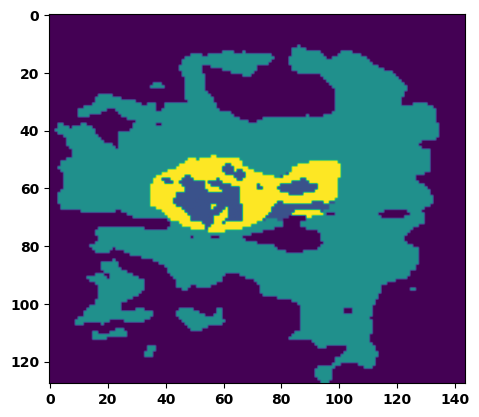

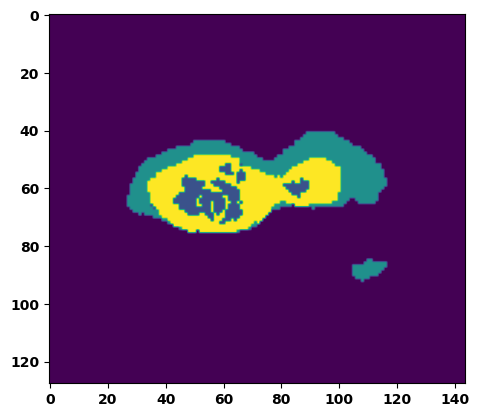

 33%|███▎      | 12/36 [00:17<00:36,  1.50s/it]

Batch_id:  11 Eval loss:  0.74064701795578
Batch_id:  11 Eval IoU:  tensor(0.1679, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.5892, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4847, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9297, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.3925, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.51s/it]

Batch_id:  12 Eval loss:  0.8567898869514465
Batch_id:  12 Eval IoU:  tensor(0.0923, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.5332, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.4401, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8636, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.3005, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.46s/it]

Batch_id:  13 Eval loss:  0.6445637941360474
Batch_id:  13 Eval IoU:  tensor(0.2353, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6851, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.5829, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.5406, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9551, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.46s/it]

Batch_id:  14 Eval loss:  0.3454795479774475
Batch_id:  14 Eval IoU:  tensor(0.5927, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9875, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:30,  1.53s/it]

Batch_id:  15 Eval loss:  0.7559645175933838
Batch_id:  15 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.49s/it]

Batch_id:  16 Eval loss:  0.28425824642181396
Batch_id:  16 Eval IoU:  tensor(0.5912, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9637, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9932, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:25,  1.44s/it]

Batch_id:  17 Eval loss:  0.9003366231918335
Batch_id:  17 Eval IoU:  tensor(0.0563, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4553, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.3043, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9290, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.1839, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.41s/it]

Batch_id:  18 Eval loss:  0.7468679547309875
Batch_id:  18 Eval IoU:  tensor(0.2394, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9382, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:22,  1.39s/it]

Batch_id:  19 Eval loss:  0.6213446855545044
Batch_id:  19 Eval IoU:  tensor(0.2823, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7971, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.7584, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.7260, device='cuda:0')
Batch_id:  20 Eval loss:  0.2546011805534363
Batch_id:  20 Eval IoU:  tensor(0.6499, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9901, device='cuda:0')


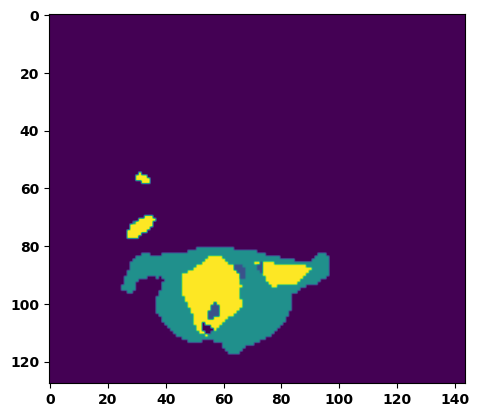

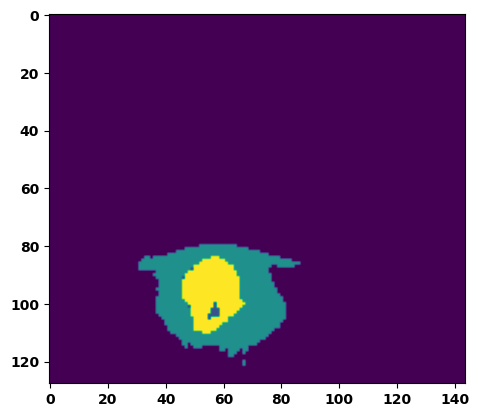

 61%|██████    | 22/36 [00:32<00:20,  1.50s/it]

Batch_id:  21 Eval loss:  0.1933264136314392
Batch_id:  21 Eval IoU:  tensor(0.7010, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9930, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.50s/it]

Batch_id:  22 Eval loss:  0.9023442268371582
Batch_id:  22 Eval IoU:  tensor(0.0577, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.4615, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.3360, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.1922, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:17,  1.42s/it]

Batch_id:  23 Eval loss:  0.6374408602714539
Batch_id:  23 Eval IoU:  tensor(0.3161, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.43s/it]

Batch_id:  24 Eval loss:  0.7517595291137695
Batch_id:  24 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.45s/it]

Batch_id:  25 Eval loss:  0.11062110960483551
Batch_id:  25 Eval IoU:  tensor(0.8209, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.46s/it]

Batch_id:  26 Eval loss:  0.2978828251361847
Batch_id:  26 Eval IoU:  tensor(0.6375, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9686, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.47s/it]

Batch_id:  27 Eval loss:  0.8812727928161621
Batch_id:  27 Eval IoU:  tensor(0.0764, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.4991, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4228, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2487, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.45s/it]

Batch_id:  28 Eval loss:  0.9251447916030884
Batch_id:  28 Eval IoU:  tensor(0.0434, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4452, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.1888, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.2155, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.44s/it]

Batch_id:  29 Eval loss:  0.7025043964385986
Batch_id:  29 Eval IoU:  tensor(0.2708, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  30 Eval loss:  0.6235067844390869
Batch_id:  30 Eval IoU:  tensor(0.3124, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9341, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9208, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9778, device='cuda:0')


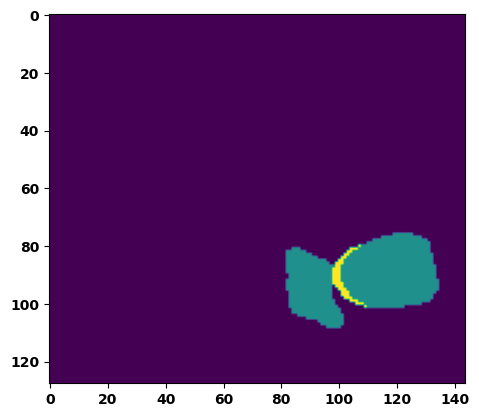

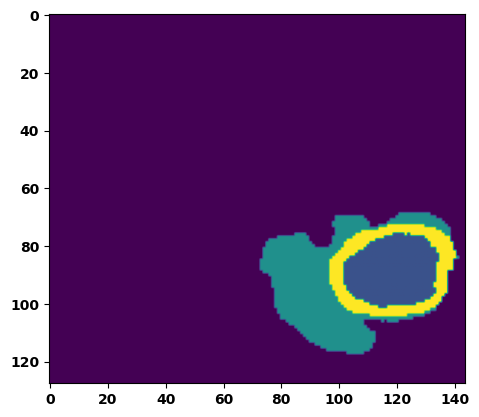

 89%|████████▉ | 32/36 [00:47<00:06,  1.55s/it]

Batch_id:  31 Eval loss:  0.5088238716125488
Batch_id:  31 Eval IoU:  tensor(0.3702, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7530, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6477, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9002, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.7468, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9642, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.55s/it]

Batch_id:  32 Eval loss:  0.5533943176269531
Batch_id:  32 Eval IoU:  tensor(0.3413, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8546, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.7911, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.7873, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9912, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:03,  1.52s/it]

Batch_id:  33 Eval loss:  0.7577699422836304
Batch_id:  33 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.50s/it]

Batch_id:  34 Eval loss:  0.5971379280090332
Batch_id:  34 Eval IoU:  tensor(0.2954, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.6664, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.5185, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.5378, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.47s/it]

Batch_id:  35 Eval loss:  0.2500770390033722
Batch_id:  35 Eval IoU:  tensor(0.6286, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9597, device='cuda:0')
Epoch  38 Training loss:  0.12888499728657982
Epoch  38 Evaluation loss:  0.5589608123732938
Epoch  38 Training accuracy :  tensor(0.8073)
Epoch  38 Evaluation accuracy :  tensor(0.3744)
Epoch  38 Training Mean Dice Score:  tensor(0.9848)
Epoch  38 Eval Mean Dice Score:  tensor(0.8369)
Epoch  38 Training Non-tumor Dice Score:  tensor(0.9857)
Epoch  38 Eval Non-tumor Dice Score:  tensor(0.7878)
Epoch  38 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  38 Eval NCR/NET Dice Score:  tensor(0.9712)
Epoch  38 Training ED Dice Score:  tensor(0.98

Epoch: 39
Training in session: 


  1%|          | 1/110 [00:01<02:40,  1.47s/it]

Batch_id:  0 Training loss:  0.13601991534233093
Batch_id:  0 Training IoU:  tensor(0.7995, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:45,  1.54s/it]

Batch_id:  1 Training loss:  0.0980912446975708
Batch_id:  1 Training IoU:  tensor(0.8668, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:58,  1.67s/it]

Batch_id:  2 Training loss:  0.04444287717342377
Batch_id:  2 Training IoU:  tensor(0.9261, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:51,  1.62s/it]

Batch_id:  3 Training loss:  0.15441779792308807
Batch_id:  3 Training IoU:  tensor(0.7566, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9837, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:44,  1.57s/it]

Batch_id:  4 Training loss:  0.1412401795387268
Batch_id:  4 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:41,  1.55s/it]

Batch_id:  5 Training loss:  0.2230382263660431
Batch_id:  5 Training IoU:  tensor(0.6859, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:36,  1.52s/it]

Batch_id:  6 Training loss:  0.0795430839061737
Batch_id:  6 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:34,  1.51s/it]

Batch_id:  7 Training loss:  0.1789967119693756
Batch_id:  7 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:33,  1.52s/it]

Batch_id:  8 Training loss:  0.24246102571487427
Batch_id:  8 Training IoU:  tensor(0.6710, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:32,  1.52s/it]

Batch_id:  9 Training loss:  0.1508764624595642
Batch_id:  9 Training IoU:  tensor(0.7534, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9660, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 10%|█         | 11/110 [00:17<02:37,  1.59s/it]

Batch_id:  10 Training loss:  0.09483662247657776
Batch_id:  10 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 11%|█         | 12/110 [00:18<02:35,  1.59s/it]

Batch_id:  11 Training loss:  0.21328222751617432
Batch_id:  11 Training IoU:  tensor(0.7213, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 12%|█▏        | 13/110 [00:20<02:29,  1.54s/it]

Batch_id:  12 Training loss:  0.1323225498199463
Batch_id:  12 Training IoU:  tensor(0.8167, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:30,  1.56s/it]

Batch_id:  13 Training loss:  0.05314761400222778
Batch_id:  13 Training IoU:  tensor(0.9091, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 14%|█▎        | 15/110 [00:23<02:26,  1.54s/it]

Batch_id:  14 Training loss:  0.15906445682048798
Batch_id:  14 Training IoU:  tensor(0.7541, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 15%|█▍        | 16/110 [00:25<02:29,  1.59s/it]

Batch_id:  15 Training loss:  0.25353991985321045
Batch_id:  15 Training IoU:  tensor(0.6710, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 15%|█▌        | 17/110 [00:26<02:24,  1.55s/it]

Batch_id:  16 Training loss:  0.22076408565044403
Batch_id:  16 Training IoU:  tensor(0.6776, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9634, device='cuda:0')


 16%|█▋        | 18/110 [00:28<02:24,  1.57s/it]

Batch_id:  17 Training loss:  0.1503065973520279
Batch_id:  17 Training IoU:  tensor(0.7581, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 17%|█▋        | 19/110 [00:29<02:17,  1.51s/it]

Batch_id:  18 Training loss:  0.22003690898418427
Batch_id:  18 Training IoU:  tensor(0.7000, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:12,  1.47s/it]

Batch_id:  19 Training loss:  0.1501784324645996
Batch_id:  19 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:05,  1.41s/it]

Batch_id:  20 Training loss:  0.1489950567483902
Batch_id:  20 Training IoU:  tensor(0.7641, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 20%|██        | 22/110 [00:33<02:08,  1.46s/it]

Batch_id:  21 Training loss:  0.11539232730865479
Batch_id:  21 Training IoU:  tensor(0.8045, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 21%|██        | 23/110 [00:35<02:03,  1.42s/it]

Batch_id:  22 Training loss:  0.13639026880264282
Batch_id:  22 Training IoU:  tensor(0.7877, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9744, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:11,  1.52s/it]

Batch_id:  23 Training loss:  0.06154488027095795
Batch_id:  23 Training IoU:  tensor(0.8941, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 23%|██▎       | 25/110 [00:38<02:09,  1.52s/it]

Batch_id:  24 Training loss:  0.13071811199188232
Batch_id:  24 Training IoU:  tensor(0.7987, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:07,  1.52s/it]

Batch_id:  25 Training loss:  0.10910354554653168
Batch_id:  25 Training IoU:  tensor(0.8204, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 25%|██▍       | 27/110 [00:41<02:03,  1.48s/it]

Batch_id:  26 Training loss:  0.04973766207695007
Batch_id:  26 Training IoU:  tensor(0.9202, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:03,  1.51s/it]

Batch_id:  27 Training loss:  0.067578986287117
Batch_id:  27 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 26%|██▋       | 29/110 [00:44<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.24055391550064087
Batch_id:  28 Training IoU:  tensor(0.6939, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 27%|██▋       | 30/110 [00:45<01:54,  1.43s/it]

Batch_id:  29 Training loss:  0.08213424682617188
Batch_id:  29 Training IoU:  tensor(0.8632, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9693, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:51,  1.41s/it]

Batch_id:  30 Training loss:  0.07168927788734436
Batch_id:  30 Training IoU:  tensor(0.8763, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 29%|██▉       | 32/110 [00:48<01:51,  1.43s/it]

Batch_id:  31 Training loss:  0.09134244918823242
Batch_id:  31 Training IoU:  tensor(0.8453, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 30%|███       | 33/110 [00:49<01:50,  1.43s/it]

Batch_id:  32 Training loss:  0.07898588478565216
Batch_id:  32 Training IoU:  tensor(0.8643, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 31%|███       | 34/110 [00:51<01:49,  1.45s/it]

Batch_id:  33 Training loss:  0.0581773966550827
Batch_id:  33 Training IoU:  tensor(0.9007, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:47,  1.44s/it]

Batch_id:  34 Training loss:  0.10536874830722809
Batch_id:  34 Training IoU:  tensor(0.8259, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:46,  1.44s/it]

Batch_id:  35 Training loss:  0.11863206326961517
Batch_id:  35 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:48,  1.48s/it]

Batch_id:  36 Training loss:  0.0723833441734314
Batch_id:  36 Training IoU:  tensor(0.9349, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:43,  1.43s/it]

Batch_id:  37 Training loss:  0.18178556859493256
Batch_id:  37 Training IoU:  tensor(0.7201, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:41,  1.43s/it]

Batch_id:  38 Training loss:  0.14970917999744415
Batch_id:  38 Training IoU:  tensor(0.7601, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9792, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:39,  1.42s/it]

Batch_id:  39 Training loss:  0.1262381374835968
Batch_id:  39 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:36,  1.39s/it]

Batch_id:  40 Training loss:  0.08405673503875732
Batch_id:  40 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:36,  1.43s/it]

Batch_id:  41 Training loss:  0.1712799072265625
Batch_id:  41 Training IoU:  tensor(0.7503, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:38,  1.47s/it]

Batch_id:  42 Training loss:  0.10956689715385437
Batch_id:  42 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 40%|████      | 44/110 [01:05<01:35,  1.44s/it]

Batch_id:  43 Training loss:  0.11699815094470978
Batch_id:  43 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 41%|████      | 45/110 [01:07<01:34,  1.45s/it]

Batch_id:  44 Training loss:  0.06281374394893646
Batch_id:  44 Training IoU:  tensor(0.8900, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:32,  1.45s/it]

Batch_id:  45 Training loss:  0.16778528690338135
Batch_id:  45 Training IoU:  tensor(0.7422, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:29,  1.43s/it]

Batch_id:  46 Training loss:  0.05694521963596344
Batch_id:  46 Training IoU:  tensor(0.9015, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.11449354887008667
Batch_id:  47 Training IoU:  tensor(0.8210, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:25,  1.40s/it]

Batch_id:  48 Training loss:  0.2141391485929489
Batch_id:  48 Training IoU:  tensor(0.6943, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:23,  1.39s/it]

Batch_id:  49 Training loss:  0.05549636483192444
Batch_id:  49 Training IoU:  tensor(0.9023, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:23,  1.42s/it]

Batch_id:  50 Training loss:  0.13384751975536346
Batch_id:  50 Training IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:22,  1.42s/it]

Batch_id:  51 Training loss:  0.05299864709377289
Batch_id:  51 Training IoU:  tensor(0.9083, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:19,  1.40s/it]

Batch_id:  52 Training loss:  0.061201974749565125
Batch_id:  52 Training IoU:  tensor(0.9264, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:21,  1.45s/it]

Batch_id:  53 Training loss:  0.061243847012519836
Batch_id:  53 Training IoU:  tensor(0.9085, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:18,  1.43s/it]

Batch_id:  54 Training loss:  0.13828055560588837
Batch_id:  54 Training IoU:  tensor(0.7753, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:17,  1.44s/it]

Batch_id:  55 Training loss:  0.07498535513877869
Batch_id:  55 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:15,  1.42s/it]

Batch_id:  56 Training loss:  0.11747387051582336
Batch_id:  56 Training IoU:  tensor(0.8035, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:12,  1.40s/it]

Batch_id:  57 Training loss:  0.17711037397384644
Batch_id:  57 Training IoU:  tensor(0.7313, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:11,  1.40s/it]

Batch_id:  58 Training loss:  0.35900744795799255
Batch_id:  58 Training IoU:  tensor(0.5565, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9762, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:10,  1.41s/it]

Batch_id:  59 Training loss:  0.07553176581859589
Batch_id:  59 Training IoU:  tensor(0.8695, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:10,  1.45s/it]

Batch_id:  60 Training loss:  0.08518128097057343
Batch_id:  60 Training IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:07,  1.41s/it]

Batch_id:  61 Training loss:  0.319448322057724
Batch_id:  61 Training IoU:  tensor(0.6313, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:07,  1.44s/it]

Batch_id:  62 Training loss:  0.18335562944412231
Batch_id:  62 Training IoU:  tensor(0.7142, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:08,  1.49s/it]

Batch_id:  63 Training loss:  0.2320275604724884
Batch_id:  63 Training IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:07,  1.49s/it]

Batch_id:  64 Training loss:  0.14470240473747253
Batch_id:  64 Training IoU:  tensor(0.7976, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:05,  1.49s/it]

Batch_id:  65 Training loss:  0.0759797990322113
Batch_id:  65 Training IoU:  tensor(0.8722, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.48s/it]

Batch_id:  66 Training loss:  0.10252395272254944
Batch_id:  66 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:03,  1.51s/it]

Batch_id:  67 Training loss:  0.2035941332578659
Batch_id:  67 Training IoU:  tensor(0.7195, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.10833978652954102
Batch_id:  68 Training IoU:  tensor(0.8156, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9850, device='cuda:0')


 64%|██████▎   | 70/110 [01:42<00:57,  1.44s/it]

Batch_id:  69 Training loss:  0.1280166357755661
Batch_id:  69 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:55,  1.43s/it]

Batch_id:  70 Training loss:  0.23984795808792114
Batch_id:  70 Training IoU:  tensor(0.6937, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 65%|██████▌   | 72/110 [01:45<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.23625625669956207
Batch_id:  71 Training IoU:  tensor(0.7097, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:54,  1.46s/it]

Batch_id:  72 Training loss:  0.12552115321159363
Batch_id:  72 Training IoU:  tensor(0.8144, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:51,  1.43s/it]

Batch_id:  73 Training loss:  0.20052768290042877
Batch_id:  73 Training IoU:  tensor(0.7279, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:49,  1.43s/it]

Batch_id:  74 Training loss:  0.10713183879852295
Batch_id:  74 Training IoU:  tensor(0.8167, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:48,  1.43s/it]

Batch_id:  75 Training loss:  0.08272743225097656
Batch_id:  75 Training IoU:  tensor(0.8563, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:47,  1.45s/it]

Batch_id:  76 Training loss:  0.09362374246120453
Batch_id:  76 Training IoU:  tensor(0.8427, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:46,  1.46s/it]

Batch_id:  77 Training loss:  0.12742535769939423
Batch_id:  77 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:46,  1.49s/it]

Batch_id:  78 Training loss:  0.21993397176265717
Batch_id:  78 Training IoU:  tensor(0.7247, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:44,  1.48s/it]

Batch_id:  79 Training loss:  0.09448656439781189
Batch_id:  79 Training IoU:  tensor(0.8366, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:43,  1.48s/it]

Batch_id:  80 Training loss:  0.10816790163516998
Batch_id:  80 Training IoU:  tensor(0.8246, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.16554439067840576
Batch_id:  81 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:38,  1.42s/it]

Batch_id:  82 Training loss:  0.10063105821609497
Batch_id:  82 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:36,  1.42s/it]

Batch_id:  83 Training loss:  0.19431427121162415
Batch_id:  83 Training IoU:  tensor(0.7003, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9564, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:36,  1.46s/it]

Batch_id:  84 Training loss:  0.12409369647502899
Batch_id:  84 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:35,  1.46s/it]

Batch_id:  85 Training loss:  0.073143869638443
Batch_id:  85 Training IoU:  tensor(0.8737, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:33,  1.44s/it]

Batch_id:  86 Training loss:  0.08328814804553986
Batch_id:  86 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9638, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9632, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:31,  1.44s/it]

Batch_id:  87 Training loss:  0.09196683764457703
Batch_id:  87 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:29,  1.42s/it]

Batch_id:  88 Training loss:  0.06541955471038818
Batch_id:  88 Training IoU:  tensor(0.8874, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 82%|████████▏ | 90/110 [02:11<00:28,  1.43s/it]

Batch_id:  89 Training loss:  0.09424863755702972
Batch_id:  89 Training IoU:  tensor(0.8440, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:27,  1.47s/it]

Batch_id:  90 Training loss:  0.14166419208049774
Batch_id:  90 Training IoU:  tensor(0.7798, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 84%|████████▎ | 92/110 [02:14<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.058535099029541016
Batch_id:  91 Training IoU:  tensor(0.8993, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:24,  1.46s/it]

Batch_id:  92 Training loss:  0.06541264057159424
Batch_id:  92 Training IoU:  tensor(0.8885, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 85%|████████▌ | 94/110 [02:17<00:23,  1.47s/it]

Batch_id:  93 Training loss:  0.10127873718738556
Batch_id:  93 Training IoU:  tensor(0.8297, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:21,  1.40s/it]

Batch_id:  94 Training loss:  0.19895900785923004
Batch_id:  94 Training IoU:  tensor(0.7773, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 87%|████████▋ | 96/110 [02:20<00:20,  1.49s/it]

Batch_id:  95 Training loss:  0.09202183783054352
Batch_id:  95 Training IoU:  tensor(0.8509, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:18,  1.45s/it]

Batch_id:  96 Training loss:  0.14646780490875244
Batch_id:  96 Training IoU:  tensor(0.7823, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 89%|████████▉ | 98/110 [02:23<00:16,  1.42s/it]

Batch_id:  97 Training loss:  0.1444573998451233
Batch_id:  97 Training IoU:  tensor(0.7634, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:15,  1.43s/it]

Batch_id:  98 Training loss:  0.10990050435066223
Batch_id:  98 Training IoU:  tensor(0.8229, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:14,  1.45s/it]

Batch_id:  99 Training loss:  0.07433715462684631
Batch_id:  99 Training IoU:  tensor(0.8698, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.45s/it]

Batch_id:  100 Training loss:  0.11446778476238251
Batch_id:  100 Training IoU:  tensor(0.8174, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:11,  1.46s/it]

Batch_id:  101 Training loss:  0.08957402408123016
Batch_id:  101 Training IoU:  tensor(0.8486, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 94%|█████████▎| 103/110 [02:31<00:10,  1.51s/it]

Batch_id:  102 Training loss:  0.0875924676656723
Batch_id:  102 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.43s/it]

Batch_id:  103 Training loss:  0.10607263445854187
Batch_id:  103 Training IoU:  tensor(0.8251, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.41s/it]

Batch_id:  104 Training loss:  0.05296334624290466
Batch_id:  104 Training IoU:  tensor(0.9081, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 96%|█████████▋| 106/110 [02:34<00:05,  1.40s/it]

Batch_id:  105 Training loss:  0.03028981387615204
Batch_id:  105 Training IoU:  tensor(0.9481, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.47s/it]

Batch_id:  106 Training loss:  0.1093481034040451
Batch_id:  106 Training IoU:  tensor(0.9113, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:02,  1.49s/it]

Batch_id:  107 Training loss:  0.1322651505470276
Batch_id:  107 Training IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.49s/it]

Batch_id:  108 Training loss:  0.28571581840515137
Batch_id:  108 Training IoU:  tensor(0.6310, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.46s/it]


Batch_id:  109 Training loss:  0.09697598218917847
Batch_id:  109 Training IoU:  tensor(0.8351, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9917, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6308995485305786
Batch_id:  0 Eval IoU:  tensor(0.3222, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9733, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


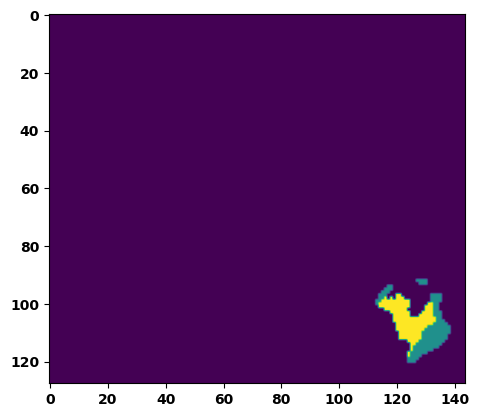

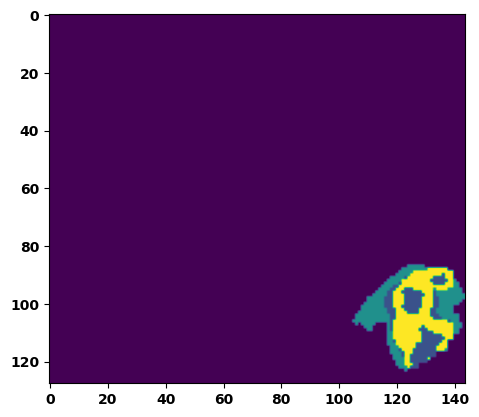

  6%|▌         | 2/36 [00:03<00:50,  1.48s/it]

Batch_id:  1 Eval loss:  0.5545659065246582
Batch_id:  1 Eval IoU:  tensor(0.3888, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9064, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8768, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9350, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9287, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:51,  1.56s/it]

Batch_id:  2 Eval loss:  0.6112807393074036
Batch_id:  2 Eval IoU:  tensor(0.3412, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9363, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.50s/it]

Batch_id:  3 Eval loss:  0.799685001373291
Batch_id:  3 Eval IoU:  tensor(0.1218, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.5359, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.3930, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9537, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.3053, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.46s/it]

Batch_id:  4 Eval loss:  0.20115889608860016
Batch_id:  4 Eval IoU:  tensor(0.6966, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.45s/it]

Batch_id:  5 Eval loss:  0.6475033164024353
Batch_id:  5 Eval IoU:  tensor(0.2906, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9300, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8985, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9654, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:40,  1.40s/it]

Batch_id:  6 Eval loss:  0.4692845642566681
Batch_id:  6 Eval IoU:  tensor(0.4464, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9321, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9247, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.6366124153137207
Batch_id:  7 Eval IoU:  tensor(0.3011, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8588, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9004, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:36,  1.35s/it]

Batch_id:  8 Eval loss:  0.557653546333313
Batch_id:  8 Eval IoU:  tensor(0.4020, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:35,  1.35s/it]

Batch_id:  9 Eval loss:  0.7562437057495117
Batch_id:  9 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  10 Eval loss:  0.465511292219162
Batch_id:  10 Eval IoU:  tensor(0.4312, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.7684, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.6606, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.6574, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9921, device='cuda:0')


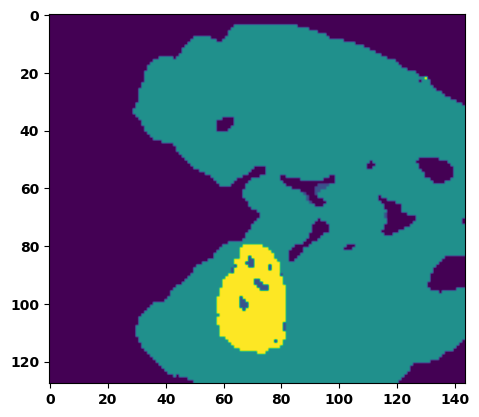

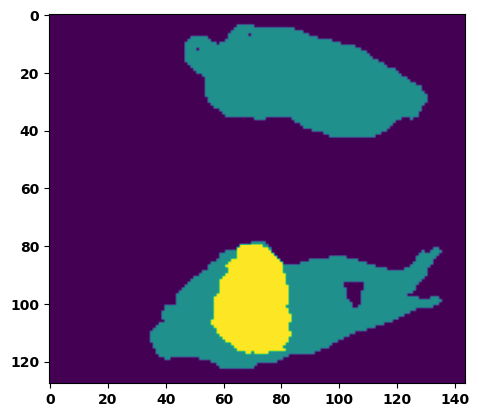

 33%|███▎      | 12/36 [00:17<00:34,  1.44s/it]

Batch_id:  11 Eval loss:  0.272144615650177
Batch_id:  11 Eval IoU:  tensor(0.6075, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:31,  1.36s/it]

Batch_id:  12 Eval loss:  0.5836386680603027
Batch_id:  12 Eval IoU:  tensor(0.3676, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:29,  1.36s/it]

Batch_id:  13 Eval loss:  0.75738525390625
Batch_id:  13 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:28,  1.33s/it]

Batch_id:  14 Eval loss:  0.15768174827098846
Batch_id:  14 Eval IoU:  tensor(0.7609, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:27,  1.38s/it]

Batch_id:  15 Eval loss:  0.6804089546203613
Batch_id:  15 Eval IoU:  tensor(0.2336, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7713, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.7079, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.8958, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.7635, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9465, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.40s/it]

Batch_id:  16 Eval loss:  0.07393871247768402
Batch_id:  16 Eval IoU:  tensor(0.8682, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9879, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:24,  1.38s/it]

Batch_id:  17 Eval loss:  0.7680310606956482
Batch_id:  17 Eval IoU:  tensor(0.1628, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6732, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.5787, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.5431, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9438, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:23,  1.37s/it]

Batch_id:  18 Eval loss:  0.18420614302158356
Batch_id:  18 Eval IoU:  tensor(0.7122, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9696, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.40s/it]

Batch_id:  19 Eval loss:  0.5474846363067627
Batch_id:  19 Eval IoU:  tensor(0.3756, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  20 Eval loss:  0.2555396556854248
Batch_id:  20 Eval IoU:  tensor(0.6354, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9896, device='cuda:0')


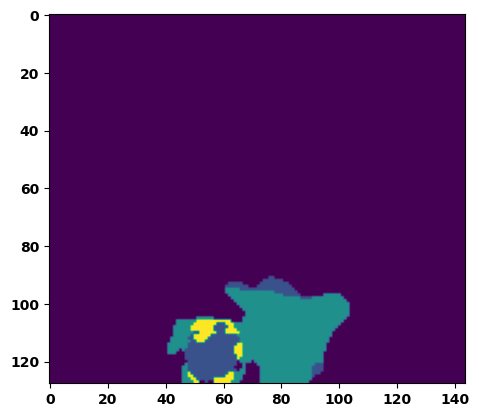

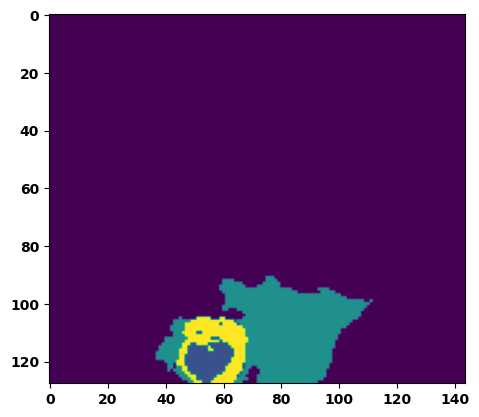

 61%|██████    | 22/36 [00:31<00:20,  1.44s/it]

Batch_id:  21 Eval loss:  0.6579290628433228
Batch_id:  21 Eval IoU:  tensor(0.2968, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9681, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.41s/it]

Batch_id:  22 Eval loss:  0.7220667004585266
Batch_id:  22 Eval IoU:  tensor(0.2508, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9248, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9246, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9105, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.42s/it]

Batch_id:  23 Eval loss:  0.9018452167510986
Batch_id:  23 Eval IoU:  tensor(0.0577, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.4614, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3359, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.1922, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.39s/it]

Batch_id:  24 Eval loss:  0.8816083669662476
Batch_id:  24 Eval IoU:  tensor(0.0759, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4981, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4214, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.2472, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.7673027515411377
Batch_id:  25 Eval IoU:  tensor(0.1604, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.4957, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.2462, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.2511, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9965, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.39s/it]

Batch_id:  26 Eval loss:  0.3637005090713501
Batch_id:  26 Eval IoU:  tensor(0.5255, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:11,  1.41s/it]

Batch_id:  27 Eval loss:  0.15622863173484802
Batch_id:  27 Eval IoU:  tensor(0.7721, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:10,  1.44s/it]

Batch_id:  28 Eval loss:  0.5383319854736328
Batch_id:  28 Eval IoU:  tensor(0.3587, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7981, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.7862, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9166, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.7038, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.42s/it]

Batch_id:  29 Eval loss:  0.7749704718589783
Batch_id:  29 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  30 Eval loss:  0.7790387868881226
Batch_id:  30 Eval IoU:  tensor(0.1380, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.5502, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.4408, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.8844, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.3883, device='cuda:0')


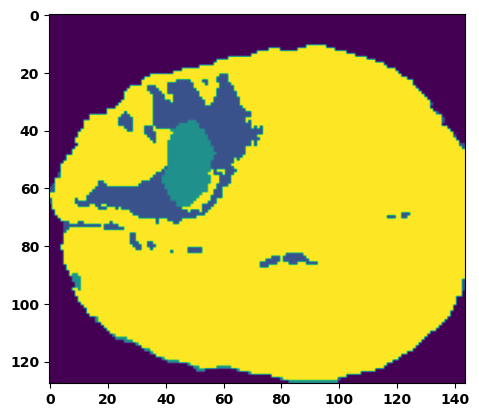

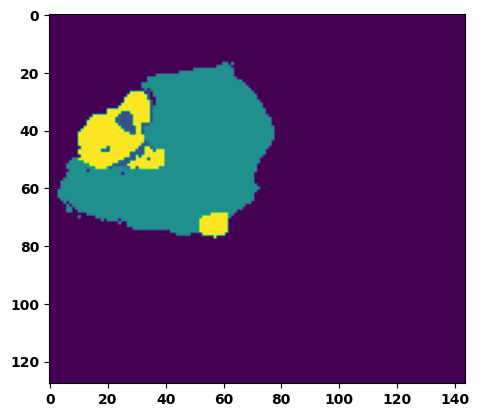

 89%|████████▉ | 32/36 [00:45<00:05,  1.46s/it]

Batch_id:  31 Eval loss:  0.5223673582077026
Batch_id:  31 Eval IoU:  tensor(0.3922, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.49s/it]

Batch_id:  32 Eval loss:  0.7336956262588501
Batch_id:  32 Eval IoU:  tensor(0.2228, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.8579, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8020, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9500, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8363, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.47s/it]

Batch_id:  33 Eval loss:  0.7414013743400574
Batch_id:  33 Eval IoU:  tensor(0.1788, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.4875, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.3095, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.2912, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.54s/it]

Batch_id:  34 Eval loss:  0.7517249584197998
Batch_id:  34 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.7682907581329346
Batch_id:  35 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')
Epoch  39 Training loss:  0.12861903350461612
Epoch  39 Evaluation loss:  0.5742044705483649
Epoch  39 Training accuracy :  tensor(0.8076)
Epoch  39 Evaluation accuracy :  tensor(0.3618)
Epoch  39 Training Mean Dice Score:  tensor(0.9848)
Epoch  39 Eval Mean Dice Score:  tensor(0.8549)
Epoch  39 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  39 Eval Non-tumor Dice Score:  tensor(0.8129)
Epoch  39 Training NCR/NET Dice Score:  tensor(0.9932)
Epoch  39 Eval NCR/NET Dice Score:  tensor(0.9689)
Epoch  39 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 40
Training in session: 


  1%|          | 1/110 [00:01<02:34,  1.42s/it]

Batch_id:  0 Training loss:  0.06830047070980072
Batch_id:  0 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:38,  1.46s/it]

Batch_id:  1 Training loss:  0.029771387577056885
Batch_id:  1 Training IoU:  tensor(0.9490, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:43,  1.53s/it]

Batch_id:  2 Training loss:  0.22842349112033844
Batch_id:  2 Training IoU:  tensor(0.6805, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:39,  1.51s/it]

Batch_id:  3 Training loss:  0.0723910927772522
Batch_id:  3 Training IoU:  tensor(0.8758, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:42,  1.55s/it]

Batch_id:  4 Training loss:  0.076141357421875
Batch_id:  4 Training IoU:  tensor(0.8883, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:35,  1.50s/it]

Batch_id:  5 Training loss:  0.2406749427318573
Batch_id:  5 Training IoU:  tensor(0.6916, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:34,  1.50s/it]

Batch_id:  6 Training loss:  0.05974183976650238
Batch_id:  6 Training IoU:  tensor(0.8975, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:36,  1.53s/it]

Batch_id:  7 Training loss:  0.062341704964637756
Batch_id:  7 Training IoU:  tensor(0.8910, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:29,  1.48s/it]

Batch_id:  8 Training loss:  0.10527592897415161
Batch_id:  8 Training IoU:  tensor(0.8192, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:25,  1.45s/it]

Batch_id:  9 Training loss:  0.10797424614429474
Batch_id:  9 Training IoU:  tensor(0.8307, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 10%|█         | 11/110 [00:16<02:22,  1.44s/it]

Batch_id:  10 Training loss:  0.12741561233997345
Batch_id:  10 Training IoU:  tensor(0.7932, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 11%|█         | 12/110 [00:18<02:33,  1.57s/it]

Batch_id:  11 Training loss:  0.24250410497188568
Batch_id:  11 Training IoU:  tensor(0.6708, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:20,  1.45s/it]

Batch_id:  12 Training loss:  0.14507687091827393
Batch_id:  12 Training IoU:  tensor(0.7832, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:28,  1.55s/it]

Batch_id:  13 Training loss:  0.10931006073951721
Batch_id:  13 Training IoU:  tensor(0.8195, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:24,  1.52s/it]

Batch_id:  14 Training loss:  0.11850418150424957
Batch_id:  14 Training IoU:  tensor(0.8016, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:23,  1.53s/it]

Batch_id:  15 Training loss:  0.07971404492855072
Batch_id:  15 Training IoU:  tensor(0.8645, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:17,  1.48s/it]

Batch_id:  16 Training loss:  0.11610294878482819
Batch_id:  16 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:14,  1.46s/it]

Batch_id:  17 Training loss:  0.1479584127664566
Batch_id:  17 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9796, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:12,  1.45s/it]

Batch_id:  18 Training loss:  0.09681583940982819
Batch_id:  18 Training IoU:  tensor(0.8351, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:18,  1.54s/it]

Batch_id:  19 Training loss:  0.22046959400177002
Batch_id:  19 Training IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9635, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:18,  1.56s/it]

Batch_id:  20 Training loss:  0.10906104743480682
Batch_id:  20 Training IoU:  tensor(0.9085, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 20%|██        | 22/110 [00:33<02:21,  1.61s/it]

Batch_id:  21 Training loss:  0.35719266533851624
Batch_id:  21 Training IoU:  tensor(0.5587, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 21%|██        | 23/110 [00:34<02:18,  1.59s/it]

Batch_id:  22 Training loss:  0.11372831463813782
Batch_id:  22 Training IoU:  tensor(0.8218, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:17,  1.60s/it]

Batch_id:  23 Training loss:  0.06167936325073242
Batch_id:  23 Training IoU:  tensor(0.8947, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 23%|██▎       | 25/110 [00:38<02:17,  1.62s/it]

Batch_id:  24 Training loss:  0.15089890360832214
Batch_id:  24 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9663, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:14,  1.60s/it]

Batch_id:  25 Training loss:  0.09222564101219177
Batch_id:  25 Training IoU:  tensor(0.8455, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 25%|██▍       | 27/110 [00:41<02:09,  1.57s/it]

Batch_id:  26 Training loss:  0.11162397265434265
Batch_id:  26 Training IoU:  tensor(0.8220, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:06,  1.54s/it]

Batch_id:  27 Training loss:  0.08406855165958405
Batch_id:  27 Training IoU:  tensor(0.8550, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 26%|██▋       | 29/110 [00:44<02:03,  1.52s/it]

Batch_id:  28 Training loss:  0.19306042790412903
Batch_id:  28 Training IoU:  tensor(0.7018, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9496, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:04,  1.55s/it]

Batch_id:  29 Training loss:  0.13171729445457458
Batch_id:  29 Training IoU:  tensor(0.7959, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 28%|██▊       | 31/110 [00:47<02:03,  1.56s/it]

Batch_id:  30 Training loss:  0.15432408452033997
Batch_id:  30 Training IoU:  tensor(0.7577, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 29%|██▉       | 32/110 [00:48<01:57,  1.50s/it]

Batch_id:  31 Training loss:  0.09481935203075409
Batch_id:  31 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 30%|███       | 33/110 [00:50<01:55,  1.50s/it]

Batch_id:  32 Training loss:  0.05588577687740326
Batch_id:  32 Training IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 31%|███       | 34/110 [00:51<01:51,  1.47s/it]

Batch_id:  33 Training loss:  0.08490234613418579
Batch_id:  33 Training IoU:  tensor(0.8543, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 32%|███▏      | 35/110 [00:53<01:52,  1.50s/it]

Batch_id:  34 Training loss:  0.08342145383358002
Batch_id:  34 Training IoU:  tensor(0.8570, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:49,  1.48s/it]

Batch_id:  35 Training loss:  0.2131844460964203
Batch_id:  35 Training IoU:  tensor(0.6964, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.06316658854484558
Batch_id:  36 Training IoU:  tensor(0.8925, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:46,  1.49s/it]

Batch_id:  37 Training loss:  0.14081385731697083
Batch_id:  37 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:44,  1.47s/it]

Batch_id:  38 Training loss:  0.06087791919708252
Batch_id:  38 Training IoU:  tensor(0.9270, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:42,  1.46s/it]

Batch_id:  39 Training loss:  0.09380215406417847
Batch_id:  39 Training IoU:  tensor(0.8374, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:39,  1.44s/it]

Batch_id:  40 Training loss:  0.10741254687309265
Batch_id:  40 Training IoU:  tensor(0.8229, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:39,  1.47s/it]

Batch_id:  41 Training loss:  0.10964009165763855
Batch_id:  41 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:36,  1.44s/it]

Batch_id:  42 Training loss:  0.07881280779838562
Batch_id:  42 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 40%|████      | 44/110 [01:06<01:35,  1.44s/it]

Batch_id:  43 Training loss:  0.12687861919403076
Batch_id:  43 Training IoU:  tensor(0.8120, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 41%|████      | 45/110 [01:07<01:36,  1.49s/it]

Batch_id:  44 Training loss:  0.0649920254945755
Batch_id:  44 Training IoU:  tensor(0.8878, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:35,  1.49s/it]

Batch_id:  45 Training loss:  0.19874398410320282
Batch_id:  45 Training IoU:  tensor(0.7344, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 43%|████▎     | 47/110 [01:10<01:33,  1.49s/it]

Batch_id:  46 Training loss:  0.08180926740169525
Batch_id:  46 Training IoU:  tensor(0.8580, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:30,  1.46s/it]

Batch_id:  47 Training loss:  0.23830009996891022
Batch_id:  47 Training IoU:  tensor(0.6978, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9552, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:27,  1.44s/it]

Batch_id:  48 Training loss:  0.15062567591667175
Batch_id:  48 Training IoU:  tensor(0.7579, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:22,  1.37s/it]

Batch_id:  49 Training loss:  0.12376581132411957
Batch_id:  49 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:22,  1.40s/it]

Batch_id:  50 Training loss:  0.1238505095243454
Batch_id:  50 Training IoU:  tensor(0.7935, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 47%|████▋     | 52/110 [01:18<01:26,  1.49s/it]

Batch_id:  51 Training loss:  0.05881117284297943
Batch_id:  51 Training IoU:  tensor(0.8987, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:22,  1.44s/it]

Batch_id:  52 Training loss:  0.14447025954723358
Batch_id:  52 Training IoU:  tensor(0.7642, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:20,  1.43s/it]

Batch_id:  53 Training loss:  0.13479000329971313
Batch_id:  53 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:17,  1.40s/it]

Batch_id:  54 Training loss:  0.12132610380649567
Batch_id:  54 Training IoU:  tensor(0.7994, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:17,  1.43s/it]

Batch_id:  55 Training loss:  0.052362293004989624
Batch_id:  55 Training IoU:  tensor(0.9092, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 52%|█████▏    | 57/110 [01:25<01:20,  1.51s/it]

Batch_id:  56 Training loss:  0.1727452129125595
Batch_id:  56 Training IoU:  tensor(0.7496, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:19,  1.53s/it]

Batch_id:  57 Training loss:  0.2812756299972534
Batch_id:  57 Training IoU:  tensor(0.6388, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 54%|█████▎    | 59/110 [01:28<01:15,  1.49s/it]

Batch_id:  58 Training loss:  0.07152429223060608
Batch_id:  58 Training IoU:  tensor(0.8768, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 55%|█████▍    | 60/110 [01:29<01:15,  1.51s/it]

Batch_id:  59 Training loss:  0.10448978841304779
Batch_id:  59 Training IoU:  tensor(0.8263, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 55%|█████▌    | 61/110 [01:31<01:12,  1.47s/it]

Batch_id:  60 Training loss:  0.08994922041893005
Batch_id:  60 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 56%|█████▋    | 62/110 [01:33<01:15,  1.58s/it]

Batch_id:  61 Training loss:  0.13933664560317993
Batch_id:  61 Training IoU:  tensor(0.7834, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 57%|█████▋    | 63/110 [01:34<01:13,  1.56s/it]

Batch_id:  62 Training loss:  0.07439883053302765
Batch_id:  62 Training IoU:  tensor(0.8712, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 58%|█████▊    | 64/110 [01:35<01:07,  1.47s/it]

Batch_id:  63 Training loss:  0.18587437272071838
Batch_id:  63 Training IoU:  tensor(0.7149, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:03,  1.42s/it]

Batch_id:  64 Training loss:  0.222088024020195
Batch_id:  64 Training IoU:  tensor(0.7006, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 60%|██████    | 66/110 [01:38<01:01,  1.39s/it]

Batch_id:  65 Training loss:  0.108054518699646
Batch_id:  65 Training IoU:  tensor(0.8159, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 61%|██████    | 67/110 [01:39<00:59,  1.38s/it]

Batch_id:  66 Training loss:  0.1393122673034668
Batch_id:  66 Training IoU:  tensor(0.7738, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 62%|██████▏   | 68/110 [01:41<00:59,  1.41s/it]

Batch_id:  67 Training loss:  0.07348288595676422
Batch_id:  67 Training IoU:  tensor(0.9321, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 63%|██████▎   | 69/110 [01:42<00:57,  1.41s/it]

Batch_id:  68 Training loss:  0.13485024869441986
Batch_id:  68 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 64%|██████▎   | 70/110 [01:44<00:57,  1.43s/it]

Batch_id:  69 Training loss:  0.0929211974143982
Batch_id:  69 Training IoU:  tensor(0.8493, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<00:56,  1.45s/it]

Batch_id:  70 Training loss:  0.2536299228668213
Batch_id:  70 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 65%|██████▌   | 72/110 [01:47<00:55,  1.45s/it]

Batch_id:  71 Training loss:  0.1319606900215149
Batch_id:  71 Training IoU:  tensor(0.7798, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:53,  1.44s/it]

Batch_id:  72 Training loss:  0.0942925214767456
Batch_id:  72 Training IoU:  tensor(0.8436, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 67%|██████▋   | 74/110 [01:50<00:52,  1.45s/it]

Batch_id:  73 Training loss:  0.2363588660955429
Batch_id:  73 Training IoU:  tensor(0.7097, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:52,  1.51s/it]

Batch_id:  74 Training loss:  0.14370113611221313
Batch_id:  74 Training IoU:  tensor(0.8015, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 69%|██████▉   | 76/110 [01:53<00:49,  1.46s/it]

Batch_id:  75 Training loss:  0.10094590485095978
Batch_id:  75 Training IoU:  tensor(0.8362, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:48,  1.46s/it]

Batch_id:  76 Training loss:  0.16392473876476288
Batch_id:  76 Training IoU:  tensor(0.7961, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:46,  1.47s/it]

Batch_id:  77 Training loss:  0.056367307901382446
Batch_id:  77 Training IoU:  tensor(0.9023, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:46,  1.48s/it]

Batch_id:  78 Training loss:  0.15911923348903656
Batch_id:  78 Training IoU:  tensor(0.7535, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:44,  1.49s/it]

Batch_id:  79 Training loss:  0.1800874024629593
Batch_id:  79 Training IoU:  tensor(0.7171, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:44,  1.55s/it]

Batch_id:  80 Training loss:  0.09918244183063507
Batch_id:  80 Training IoU:  tensor(0.8623, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:42,  1.51s/it]

Batch_id:  81 Training loss:  0.21806885302066803
Batch_id:  81 Training IoU:  tensor(0.7266, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:39,  1.45s/it]

Batch_id:  82 Training loss:  0.1976718008518219
Batch_id:  82 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:37,  1.45s/it]

Batch_id:  83 Training loss:  0.17795664072036743
Batch_id:  83 Training IoU:  tensor(0.7311, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:35,  1.44s/it]

Batch_id:  84 Training loss:  0.22793632745742798
Batch_id:  84 Training IoU:  tensor(0.6786, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:35,  1.49s/it]

Batch_id:  85 Training loss:  0.07296991348266602
Batch_id:  85 Training IoU:  tensor(0.8716, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:33,  1.44s/it]

Batch_id:  86 Training loss:  0.04419700801372528
Batch_id:  86 Training IoU:  tensor(0.9264, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:32,  1.48s/it]

Batch_id:  87 Training loss:  0.19945748150348663
Batch_id:  87 Training IoU:  tensor(0.7222, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:31,  1.49s/it]

Batch_id:  88 Training loss:  0.04866848886013031
Batch_id:  88 Training IoU:  tensor(0.9218, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:29,  1.48s/it]

Batch_id:  89 Training loss:  0.06476752460002899
Batch_id:  89 Training IoU:  tensor(0.8979, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:27,  1.44s/it]

Batch_id:  90 Training loss:  0.09091253578662872
Batch_id:  90 Training IoU:  tensor(0.8425, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:26,  1.47s/it]

Batch_id:  91 Training loss:  0.10267509520053864
Batch_id:  91 Training IoU:  tensor(0.8412, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:25,  1.47s/it]

Batch_id:  92 Training loss:  0.1715357005596161
Batch_id:  92 Training IoU:  tensor(0.7383, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:23,  1.47s/it]

Batch_id:  93 Training loss:  0.1369115263223648
Batch_id:  93 Training IoU:  tensor(0.8095, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:22,  1.48s/it]

Batch_id:  94 Training loss:  0.1800287812948227
Batch_id:  94 Training IoU:  tensor(0.7844, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:20,  1.43s/it]

Batch_id:  95 Training loss:  0.08209304511547089
Batch_id:  95 Training IoU:  tensor(0.8627, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9699, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:18,  1.40s/it]

Batch_id:  96 Training loss:  0.07616150379180908
Batch_id:  96 Training IoU:  tensor(0.8716, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:17,  1.43s/it]

Batch_id:  97 Training loss:  0.10390172898769379
Batch_id:  97 Training IoU:  tensor(0.8263, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.45s/it]

Batch_id:  98 Training loss:  0.05372093617916107
Batch_id:  98 Training IoU:  tensor(0.9083, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:14,  1.40s/it]

Batch_id:  99 Training loss:  0.13050730526447296
Batch_id:  99 Training IoU:  tensor(0.7965, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9870, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:12,  1.43s/it]

Batch_id:  100 Training loss:  0.13777777552604675
Batch_id:  100 Training IoU:  tensor(0.7861, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9740, device='cuda:0')


 93%|█████████▎| 102/110 [02:31<00:11,  1.46s/it]

Batch_id:  101 Training loss:  0.2143125981092453
Batch_id:  101 Training IoU:  tensor(0.7199, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9981, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:09,  1.42s/it]

Batch_id:  102 Training loss:  0.08411721885204315
Batch_id:  102 Training IoU:  tensor(0.8530, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:08,  1.41s/it]

Batch_id:  103 Training loss:  0.11040996015071869
Batch_id:  103 Training IoU:  tensor(0.8230, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.40s/it]

Batch_id:  104 Training loss:  0.11610420048236847
Batch_id:  104 Training IoU:  tensor(0.8061, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.45s/it]

Batch_id:  105 Training loss:  0.09030242264270782
Batch_id:  105 Training IoU:  tensor(0.8467, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.46s/it]

Batch_id:  106 Training loss:  0.15096525847911835
Batch_id:  106 Training IoU:  tensor(0.7571, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9818, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.46s/it]

Batch_id:  107 Training loss:  0.0533234179019928
Batch_id:  107 Training IoU:  tensor(0.9071, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.47s/it]

Batch_id:  108 Training loss:  0.3206697106361389
Batch_id:  108 Training IoU:  tensor(0.6293, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.14852109551429749
Batch_id:  109 Training IoU:  tensor(0.7653, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9907, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5940724611282349
Batch_id:  0 Eval IoU:  tensor(0.3613, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


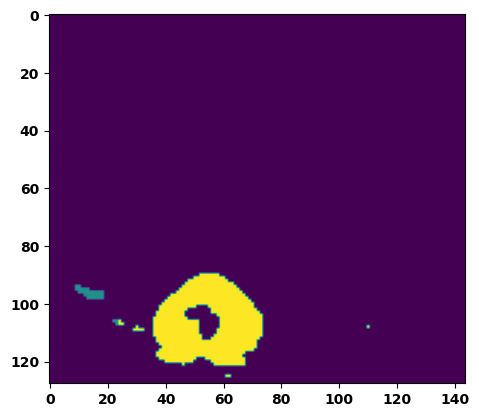

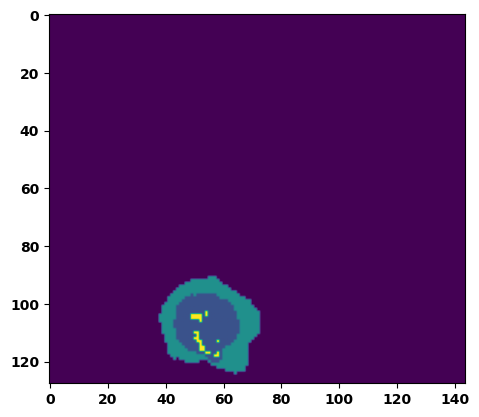

  6%|▌         | 2/36 [00:03<00:53,  1.56s/it]

Batch_id:  1 Eval loss:  0.7560135126113892
Batch_id:  1 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:47,  1.44s/it]

Batch_id:  2 Eval loss:  0.1205534040927887
Batch_id:  2 Eval IoU:  tensor(0.7987, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9949, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.45s/it]

Batch_id:  3 Eval loss:  0.14367789030075073
Batch_id:  3 Eval IoU:  tensor(0.7797, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:43,  1.42s/it]

Batch_id:  4 Eval loss:  0.8550096154212952
Batch_id:  4 Eval IoU:  tensor(0.0929, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5330, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4395, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8623, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3302, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.37s/it]

Batch_id:  5 Eval loss:  0.8260709643363953
Batch_id:  5 Eval IoU:  tensor(0.0984, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4641, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3050, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2023, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:39,  1.38s/it]

Batch_id:  6 Eval loss:  0.6676073670387268
Batch_id:  6 Eval IoU:  tensor(0.2893, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9678, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9593, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.41s/it]

Batch_id:  7 Eval loss:  0.6822125911712646
Batch_id:  7 Eval IoU:  tensor(0.2228, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.7011, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.6365, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9168, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.8000, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.7501, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:39,  1.45s/it]

Batch_id:  8 Eval loss:  0.3966858386993408
Batch_id:  8 Eval IoU:  tensor(0.4892, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.41s/it]

Batch_id:  9 Eval loss:  0.6504449844360352
Batch_id:  9 Eval IoU:  tensor(0.2958, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9405, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9180, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  10 Eval loss:  0.7577506303787231
Batch_id:  10 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


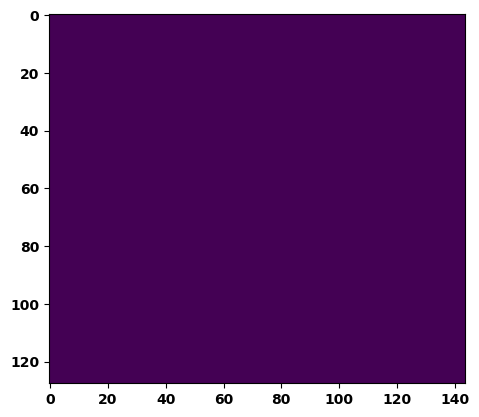

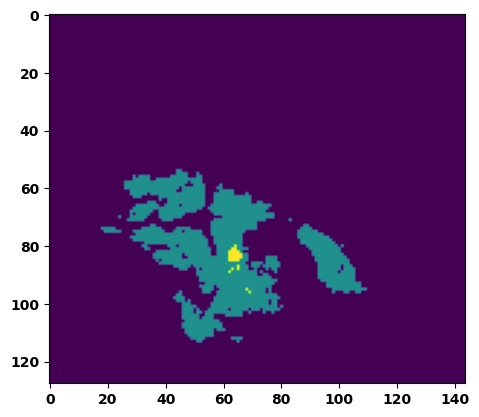

 33%|███▎      | 12/36 [00:17<00:34,  1.43s/it]

Batch_id:  11 Eval loss:  0.6212784647941589
Batch_id:  11 Eval IoU:  tensor(0.3324, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9756, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.40s/it]

Batch_id:  12 Eval loss:  0.7517423629760742
Batch_id:  12 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.44s/it]

Batch_id:  13 Eval loss:  0.3332971930503845
Batch_id:  13 Eval IoU:  tensor(0.6105, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.47s/it]

Batch_id:  14 Eval loss:  0.05576932430267334
Batch_id:  14 Eval IoU:  tensor(0.9005, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9911, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.48s/it]

Batch_id:  15 Eval loss:  0.8443988561630249
Batch_id:  15 Eval IoU:  tensor(0.0956, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5306, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3905, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9491, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.2965, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.44s/it]

Batch_id:  16 Eval loss:  0.5373116135597229
Batch_id:  16 Eval IoU:  tensor(0.3679, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9259, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8953, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9504, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.43s/it]

Batch_id:  17 Eval loss:  0.8968599438667297
Batch_id:  17 Eval IoU:  tensor(0.0598, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.4706, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.2144, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9136, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.5181, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.7656, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.40s/it]

Batch_id:  18 Eval loss:  0.8820753693580627
Batch_id:  18 Eval IoU:  tensor(0.0757, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4976, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4206, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.2464, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.41s/it]

Batch_id:  19 Eval loss:  0.5985868573188782
Batch_id:  19 Eval IoU:  tensor(0.3404, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9152, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8758, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9241, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  20 Eval loss:  0.7682958841323853
Batch_id:  20 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


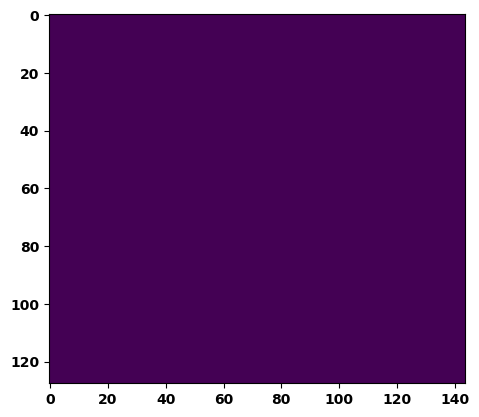

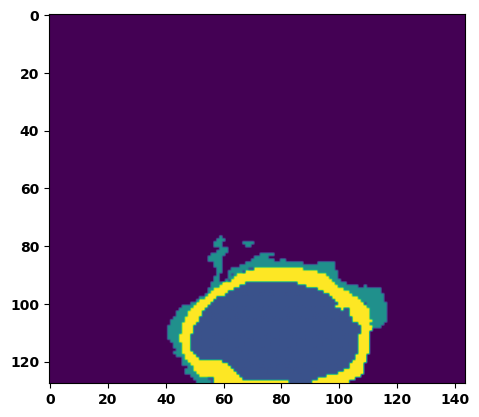

 61%|██████    | 22/36 [00:31<00:19,  1.41s/it]

Batch_id:  21 Eval loss:  0.4158533811569214
Batch_id:  21 Eval IoU:  tensor(0.4850, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9844, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.45s/it]

Batch_id:  22 Eval loss:  0.7512721419334412
Batch_id:  22 Eval IoU:  tensor(0.1704, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.6727, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.5760, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.5128, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9457, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:16,  1.39s/it]

Batch_id:  23 Eval loss:  0.3753994405269623
Batch_id:  23 Eval IoU:  tensor(0.5124, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9430, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9429, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9359, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.5483667850494385
Batch_id:  24 Eval IoU:  tensor(0.4081, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.42s/it]

Batch_id:  25 Eval loss:  0.24119670689105988
Batch_id:  25 Eval IoU:  tensor(0.6378, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.41s/it]

Batch_id:  26 Eval loss:  0.12170454859733582
Batch_id:  26 Eval IoU:  tensor(0.8120, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9976, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.44s/it]

Batch_id:  27 Eval loss:  0.12629659473896027
Batch_id:  27 Eval IoU:  tensor(0.7964, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9981, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.42s/it]

Batch_id:  28 Eval loss:  0.45451873540878296
Batch_id:  28 Eval IoU:  tensor(0.4516, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.7648, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.6503, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.6591, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9957, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.47s/it]

Batch_id:  29 Eval loss:  0.5090559720993042
Batch_id:  29 Eval IoU:  tensor(0.4307, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9220, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9062, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9334, device='cuda:0')
Batch_id:  30 Eval loss:  0.34682127833366394
Batch_id:  30 Eval IoU:  tensor(0.5395, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


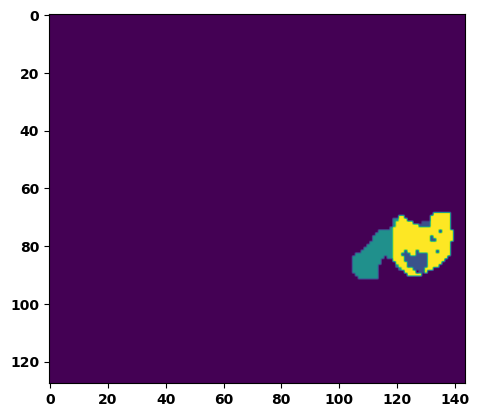

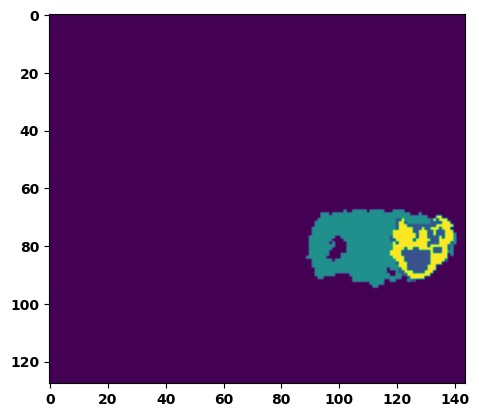

 89%|████████▉ | 32/36 [00:46<00:05,  1.49s/it]

Batch_id:  31 Eval loss:  0.7027772665023804
Batch_id:  31 Eval IoU:  tensor(0.2385, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8438, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.7798, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.7691, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9865, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.50s/it]

Batch_id:  32 Eval loss:  0.902653694152832
Batch_id:  32 Eval IoU:  tensor(0.0573, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.4606, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3347, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.1909, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.44s/it]

Batch_id:  33 Eval loss:  0.41426903009414673
Batch_id:  33 Eval IoU:  tensor(0.4779, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9404, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.7749359011650085
Batch_id:  34 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.5766077637672424
Batch_id:  35 Eval IoU:  tensor(0.2940, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.7316, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.6365, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9511, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.6457, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9615, device='cuda:0')
Epoch  40 Training loss:  0.12853157019073314
Epoch  40 Evaluation loss:  0.55559567693207
Epoch  40 Training accuracy :  tensor(0.8077)
Epoch  40 Evaluation accuracy :  tensor(0.3792)
Epoch  40 Training Mean Dice Score:  tensor(0.9848)
Epoch  40 Eval Mean Dice Score:  tensor(0.8509)
Epoch  40 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  40 Eval Non-tumor Dice Score:  tensor(0.8085)
Epoch  40 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  40 Eval NCR/NET Dice Score:  tensor(0.9725)
Epoch  40 Training ED Dice Score:  tensor(0.9832

Epoch: 41
Training in session: 


  1%|          | 1/110 [00:01<02:39,  1.46s/it]

Batch_id:  0 Training loss:  0.06263945996761322
Batch_id:  0 Training IoU:  tensor(0.8902, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:37,  1.45s/it]

Batch_id:  1 Training loss:  0.14824062585830688
Batch_id:  1 Training IoU:  tensor(0.7622, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:35,  1.45s/it]

Batch_id:  2 Training loss:  0.0904664546251297
Batch_id:  2 Training IoU:  tensor(0.8472, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:37,  1.49s/it]

Batch_id:  3 Training loss:  0.19984523952007294
Batch_id:  3 Training IoU:  tensor(0.7220, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:40,  1.53s/it]

Batch_id:  4 Training loss:  0.1796145886182785
Batch_id:  4 Training IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:35,  1.50s/it]

Batch_id:  5 Training loss:  0.10223567485809326
Batch_id:  5 Training IoU:  tensor(0.8278, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:34,  1.50s/it]

Batch_id:  6 Training loss:  0.19760631024837494
Batch_id:  6 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:32,  1.50s/it]

Batch_id:  7 Training loss:  0.09494838118553162
Batch_id:  7 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:32,  1.51s/it]

Batch_id:  8 Training loss:  0.1007479876279831
Batch_id:  8 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:33,  1.53s/it]

Batch_id:  9 Training loss:  0.23824281990528107
Batch_id:  9 Training IoU:  tensor(0.6955, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 10%|█         | 11/110 [00:16<02:29,  1.51s/it]

Batch_id:  10 Training loss:  0.13347584009170532
Batch_id:  10 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 11%|█         | 12/110 [00:18<02:30,  1.53s/it]

Batch_id:  11 Training loss:  0.057679593563079834
Batch_id:  11 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:29,  1.54s/it]

Batch_id:  12 Training loss:  0.08922594785690308
Batch_id:  12 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:29,  1.56s/it]

Batch_id:  13 Training loss:  0.15373167395591736
Batch_id:  13 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:28,  1.57s/it]

Batch_id:  14 Training loss:  0.05582126975059509
Batch_id:  14 Training IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:28,  1.58s/it]

Batch_id:  15 Training loss:  0.13636887073516846
Batch_id:  15 Training IoU:  tensor(0.7883, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9745, device='cuda:0')


 15%|█▌        | 17/110 [00:26<02:25,  1.57s/it]

Batch_id:  16 Training loss:  0.10370209813117981
Batch_id:  16 Training IoU:  tensor(0.8303, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:22,  1.55s/it]

Batch_id:  17 Training loss:  0.056914880871772766
Batch_id:  17 Training IoU:  tensor(0.9008, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:16,  1.50s/it]

Batch_id:  18 Training loss:  0.05265583097934723
Batch_id:  18 Training IoU:  tensor(0.9084, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:13,  1.49s/it]

Batch_id:  19 Training loss:  0.16828592121601105
Batch_id:  19 Training IoU:  tensor(0.7547, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:12,  1.49s/it]

Batch_id:  20 Training loss:  0.06484043598175049
Batch_id:  20 Training IoU:  tensor(0.8886, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 20%|██        | 22/110 [00:33<02:10,  1.48s/it]

Batch_id:  21 Training loss:  0.2841119170188904
Batch_id:  21 Training IoU:  tensor(0.6317, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 21%|██        | 23/110 [00:34<02:09,  1.49s/it]

Batch_id:  22 Training loss:  0.029778525233268738
Batch_id:  22 Training IoU:  tensor(0.9491, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:07,  1.48s/it]

Batch_id:  23 Training loss:  0.1304480880498886
Batch_id:  23 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.05932188034057617
Batch_id:  24 Training IoU:  tensor(0.8985, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:05,  1.50s/it]

Batch_id:  25 Training loss:  0.1251951903104782
Batch_id:  25 Training IoU:  tensor(0.8187, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:06,  1.53s/it]

Batch_id:  26 Training loss:  0.062340110540390015
Batch_id:  26 Training IoU:  tensor(0.8933, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:03,  1.51s/it]

Batch_id:  27 Training loss:  0.07143695652484894
Batch_id:  27 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:04,  1.54s/it]

Batch_id:  28 Training loss:  0.22845403850078583
Batch_id:  28 Training IoU:  tensor(0.6811, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 27%|██▋       | 30/110 [00:45<02:01,  1.51s/it]

Batch_id:  29 Training loss:  0.14317724108695984
Batch_id:  29 Training IoU:  tensor(0.7790, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:57,  1.48s/it]

Batch_id:  30 Training loss:  0.09066402912139893
Batch_id:  30 Training IoU:  tensor(0.8431, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 29%|██▉       | 32/110 [00:48<01:54,  1.47s/it]

Batch_id:  31 Training loss:  0.07771886885166168
Batch_id:  31 Training IoU:  tensor(0.8671, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 30%|███       | 33/110 [00:49<01:57,  1.53s/it]

Batch_id:  32 Training loss:  0.06326362490653992
Batch_id:  32 Training IoU:  tensor(0.9032, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 31%|███       | 34/110 [00:51<01:56,  1.53s/it]

Batch_id:  33 Training loss:  0.06142778694629669
Batch_id:  33 Training IoU:  tensor(0.9265, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:52,  1.50s/it]

Batch_id:  34 Training loss:  0.17876213788986206
Batch_id:  34 Training IoU:  tensor(0.7872, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:52,  1.52s/it]

Batch_id:  35 Training loss:  0.14256365597248077
Batch_id:  35 Training IoU:  tensor(0.8035, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 34%|███▎      | 37/110 [00:56<01:51,  1.53s/it]

Batch_id:  36 Training loss:  0.15876376628875732
Batch_id:  36 Training IoU:  tensor(0.7542, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:51,  1.55s/it]

Batch_id:  37 Training loss:  0.24240800738334656
Batch_id:  37 Training IoU:  tensor(0.6690, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 35%|███▌      | 39/110 [00:59<01:48,  1.52s/it]

Batch_id:  38 Training loss:  0.1334451287984848
Batch_id:  38 Training IoU:  tensor(0.8128, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:43,  1.49s/it]

Batch_id:  39 Training loss:  0.10886460542678833
Batch_id:  39 Training IoU:  tensor(0.8253, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:42,  1.49s/it]

Batch_id:  40 Training loss:  0.21473044157028198
Batch_id:  40 Training IoU:  tensor(0.6935, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:41,  1.49s/it]

Batch_id:  41 Training loss:  0.17496412992477417
Batch_id:  41 Training IoU:  tensor(0.7249, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:39,  1.49s/it]

Batch_id:  42 Training loss:  0.08658310770988464
Batch_id:  42 Training IoU:  tensor(0.8494, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 40%|████      | 44/110 [01:06<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.23558486998081207
Batch_id:  43 Training IoU:  tensor(0.7101, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 41%|████      | 45/110 [01:07<01:36,  1.48s/it]

Batch_id:  44 Training loss:  0.14959199726581573
Batch_id:  44 Training IoU:  tensor(0.7559, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:36,  1.51s/it]

Batch_id:  45 Training loss:  0.06420285999774933
Batch_id:  45 Training IoU:  tensor(0.8908, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:35,  1.52s/it]

Batch_id:  46 Training loss:  0.0733044296503067
Batch_id:  46 Training IoU:  tensor(0.8714, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:31,  1.47s/it]

Batch_id:  47 Training loss:  0.11132203042507172
Batch_id:  47 Training IoU:  tensor(0.8227, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:30,  1.49s/it]

Batch_id:  48 Training loss:  0.1445278376340866
Batch_id:  48 Training IoU:  tensor(0.7844, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 45%|████▌     | 50/110 [01:15<01:29,  1.49s/it]

Batch_id:  49 Training loss:  0.09373146295547485
Batch_id:  49 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:25,  1.45s/it]

Batch_id:  50 Training loss:  0.3204646706581116
Batch_id:  50 Training IoU:  tensor(0.6303, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 47%|████▋     | 52/110 [01:18<01:25,  1.47s/it]

Batch_id:  51 Training loss:  0.3578246235847473
Batch_id:  51 Training IoU:  tensor(0.5581, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9615, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9684, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9765, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:24,  1.48s/it]

Batch_id:  52 Training loss:  0.05199018120765686
Batch_id:  52 Training IoU:  tensor(0.9098, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 49%|████▉     | 54/110 [01:21<01:25,  1.53s/it]

Batch_id:  53 Training loss:  0.10833187401294708
Batch_id:  53 Training IoU:  tensor(0.8293, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:21,  1.49s/it]

Batch_id:  54 Training loss:  0.2391095757484436
Batch_id:  54 Training IoU:  tensor(0.6942, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 51%|█████     | 56/110 [01:24<01:20,  1.48s/it]

Batch_id:  55 Training loss:  0.07551370561122894
Batch_id:  55 Training IoU:  tensor(0.8890, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 52%|█████▏    | 57/110 [01:25<01:17,  1.46s/it]

Batch_id:  56 Training loss:  0.13379840552806854
Batch_id:  56 Training IoU:  tensor(0.7843, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 53%|█████▎    | 58/110 [01:27<01:17,  1.49s/it]

Batch_id:  57 Training loss:  0.0762498676776886
Batch_id:  57 Training IoU:  tensor(0.8716, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 54%|█████▎    | 59/110 [01:28<01:14,  1.46s/it]

Batch_id:  58 Training loss:  0.12797369062900543
Batch_id:  58 Training IoU:  tensor(0.8000, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9871, device='cuda:0')


 55%|█████▍    | 60/110 [01:30<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.08262334764003754
Batch_id:  59 Training IoU:  tensor(0.8614, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 55%|█████▌    | 61/110 [01:31<01:09,  1.42s/it]

Batch_id:  60 Training loss:  0.2153279334306717
Batch_id:  60 Training IoU:  tensor(0.7288, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 56%|█████▋    | 62/110 [01:32<01:07,  1.41s/it]

Batch_id:  61 Training loss:  0.15054789185523987
Batch_id:  61 Training IoU:  tensor(0.7590, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 57%|█████▋    | 63/110 [01:34<01:04,  1.38s/it]

Batch_id:  62 Training loss:  0.2005128115415573
Batch_id:  62 Training IoU:  tensor(0.7296, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 58%|█████▊    | 64/110 [01:35<01:04,  1.40s/it]

Batch_id:  63 Training loss:  0.09663435816764832
Batch_id:  63 Training IoU:  tensor(0.8359, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:04,  1.44s/it]

Batch_id:  64 Training loss:  0.25354233384132385
Batch_id:  64 Training IoU:  tensor(0.6707, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 60%|██████    | 66/110 [01:38<01:03,  1.45s/it]

Batch_id:  65 Training loss:  0.13346511125564575
Batch_id:  65 Training IoU:  tensor(0.7939, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


 61%|██████    | 67/110 [01:40<01:02,  1.45s/it]

Batch_id:  66 Training loss:  0.07589726150035858
Batch_id:  66 Training IoU:  tensor(0.9260, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 62%|██████▏   | 68/110 [01:41<01:05,  1.56s/it]

Batch_id:  67 Training loss:  0.128056138753891
Batch_id:  67 Training IoU:  tensor(0.8098, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9931, device='cuda:0')


 63%|██████▎   | 69/110 [01:43<01:02,  1.52s/it]

Batch_id:  68 Training loss:  0.08340097963809967
Batch_id:  68 Training IoU:  tensor(0.8580, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 64%|██████▎   | 70/110 [01:44<01:01,  1.54s/it]

Batch_id:  69 Training loss:  0.119044229388237
Batch_id:  69 Training IoU:  tensor(0.8009, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9858, device='cuda:0')


 65%|██████▍   | 71/110 [01:46<00:56,  1.46s/it]

Batch_id:  70 Training loss:  0.11600993573665619
Batch_id:  70 Training IoU:  tensor(0.8035, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9787, device='cuda:0')


 65%|██████▌   | 72/110 [01:47<00:56,  1.49s/it]

Batch_id:  71 Training loss:  0.07355675101280212
Batch_id:  71 Training IoU:  tensor(0.8729, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 66%|██████▋   | 73/110 [01:49<00:53,  1.46s/it]

Batch_id:  72 Training loss:  0.14296570420265198
Batch_id:  72 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 67%|██████▋   | 74/110 [01:50<00:51,  1.44s/it]

Batch_id:  73 Training loss:  0.10817359387874603
Batch_id:  73 Training IoU:  tensor(0.9095, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:49,  1.41s/it]

Batch_id:  74 Training loss:  0.168174147605896
Batch_id:  74 Training IoU:  tensor(0.7415, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 69%|██████▉   | 76/110 [01:53<00:47,  1.41s/it]

Batch_id:  75 Training loss:  0.1790591925382614
Batch_id:  75 Training IoU:  tensor(0.7305, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:47,  1.45s/it]

Batch_id:  76 Training loss:  0.22164498269557953
Batch_id:  76 Training IoU:  tensor(0.6761, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9633, device='cuda:0')


 71%|███████   | 78/110 [01:56<00:47,  1.48s/it]

Batch_id:  77 Training loss:  0.16323921084403992
Batch_id:  77 Training IoU:  tensor(0.7954, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 72%|███████▏  | 79/110 [01:57<00:45,  1.48s/it]

Batch_id:  78 Training loss:  0.11071053147315979
Batch_id:  78 Training IoU:  tensor(0.8208, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 73%|███████▎  | 80/110 [01:59<00:43,  1.45s/it]

Batch_id:  79 Training loss:  0.15104691684246063
Batch_id:  79 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9819, device='cuda:0')


 74%|███████▎  | 81/110 [02:00<00:41,  1.44s/it]

Batch_id:  80 Training loss:  0.14885589480400085
Batch_id:  80 Training IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:41,  1.48s/it]

Batch_id:  81 Training loss:  0.044392555952072144
Batch_id:  81 Training IoU:  tensor(0.9255, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 75%|███████▌  | 83/110 [02:03<00:41,  1.54s/it]

Batch_id:  82 Training loss:  0.09283995628356934
Batch_id:  82 Training IoU:  tensor(0.8490, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 76%|███████▋  | 84/110 [02:05<00:38,  1.48s/it]

Batch_id:  83 Training loss:  0.11672386527061462
Batch_id:  83 Training IoU:  tensor(0.8044, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 77%|███████▋  | 85/110 [02:06<00:37,  1.50s/it]

Batch_id:  84 Training loss:  0.19276662170886993
Batch_id:  84 Training IoU:  tensor(0.7025, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9773, device='cuda:0')


 78%|███████▊  | 86/110 [02:08<00:34,  1.45s/it]

Batch_id:  85 Training loss:  0.13945646584033966
Batch_id:  85 Training IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 79%|███████▉  | 87/110 [02:09<00:33,  1.47s/it]

Batch_id:  86 Training loss:  0.10674774646759033
Batch_id:  86 Training IoU:  tensor(0.8237, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 80%|████████  | 88/110 [02:11<00:32,  1.46s/it]

Batch_id:  87 Training loss:  0.049298450350761414
Batch_id:  87 Training IoU:  tensor(0.9204, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:30,  1.46s/it]

Batch_id:  88 Training loss:  0.10169164836406708
Batch_id:  88 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 82%|████████▏ | 90/110 [02:14<00:30,  1.55s/it]

Batch_id:  89 Training loss:  0.11381225287914276
Batch_id:  89 Training IoU:  tensor(0.8225, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:28,  1.48s/it]

Batch_id:  90 Training loss:  0.22456157207489014
Batch_id:  90 Training IoU:  tensor(0.6821, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:26,  1.45s/it]

Batch_id:  91 Training loss:  0.0741477757692337
Batch_id:  91 Training IoU:  tensor(0.8726, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:24,  1.47s/it]

Batch_id:  92 Training loss:  0.21204718947410583
Batch_id:  92 Training IoU:  tensor(0.7236, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:23,  1.47s/it]

Batch_id:  93 Training loss:  0.22082112729549408
Batch_id:  93 Training IoU:  tensor(0.7004, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:21,  1.41s/it]

Batch_id:  94 Training loss:  0.12056630849838257
Batch_id:  94 Training IoU:  tensor(0.8002, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:19,  1.39s/it]

Batch_id:  95 Training loss:  0.10792256891727448
Batch_id:  95 Training IoU:  tensor(0.8158, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:17,  1.38s/it]

Batch_id:  96 Training loss:  0.12500301003456116
Batch_id:  96 Training IoU:  tensor(0.7922, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:16,  1.37s/it]

Batch_id:  97 Training loss:  0.09383192658424377
Batch_id:  97 Training IoU:  tensor(0.8442, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 90%|█████████ | 99/110 [02:26<00:15,  1.45s/it]

Batch_id:  98 Training loss:  0.05236025154590607
Batch_id:  98 Training IoU:  tensor(0.9106, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:14,  1.46s/it]

Batch_id:  99 Training loss:  0.09461349248886108
Batch_id:  99 Training IoU:  tensor(0.8361, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.45s/it]

Batch_id:  100 Training loss:  0.07949070632457733
Batch_id:  100 Training IoU:  tensor(0.8650, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 93%|█████████▎| 102/110 [02:31<00:11,  1.46s/it]

Batch_id:  101 Training loss:  0.12775243818759918
Batch_id:  101 Training IoU:  tensor(0.7921, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.48s/it]

Batch_id:  102 Training loss:  0.08236454427242279
Batch_id:  102 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 95%|█████████▍| 104/110 [02:34<00:08,  1.45s/it]

Batch_id:  103 Training loss:  0.1060103327035904
Batch_id:  103 Training IoU:  tensor(0.8184, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.43s/it]

Batch_id:  104 Training loss:  0.09535856544971466
Batch_id:  104 Training IoU:  tensor(0.8683, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.36s/it]

Batch_id:  105 Training loss:  0.08263017237186432
Batch_id:  105 Training IoU:  tensor(0.8583, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.38s/it]

Batch_id:  106 Training loss:  0.0852222889661789
Batch_id:  106 Training IoU:  tensor(0.8531, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.46s/it]

Batch_id:  107 Training loss:  0.1106797456741333
Batch_id:  107 Training IoU:  tensor(0.8176, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.42s/it]

Batch_id:  108 Training loss:  0.13749226927757263
Batch_id:  108 Training IoU:  tensor(0.7763, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.06882111728191376
Batch_id:  109 Training IoU:  tensor(0.8847, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9895, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5435921549797058
Batch_id:  0 Eval IoU:  tensor(0.3771, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9128, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9508, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8883, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9255, device='cuda:0')


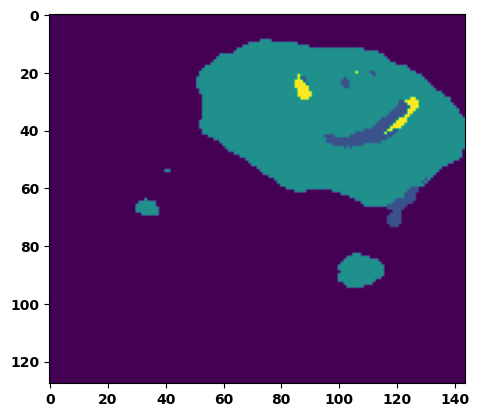

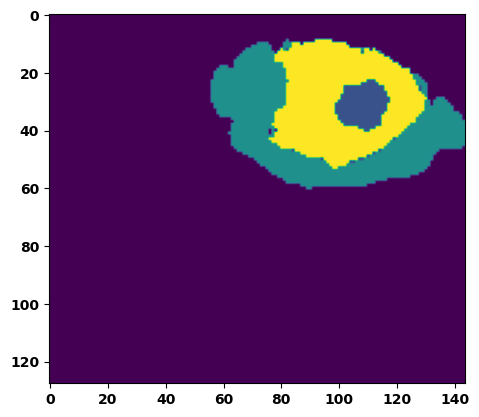

  6%|▌         | 2/36 [00:03<00:57,  1.70s/it]

Batch_id:  1 Eval loss:  0.470409095287323
Batch_id:  1 Eval IoU:  tensor(0.4273, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7555, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.6397, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.6440, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9928, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:51,  1.55s/it]

Batch_id:  2 Eval loss:  0.854364275932312
Batch_id:  2 Eval IoU:  tensor(0.0934, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.5330, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.4392, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.8605, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.3789, device='cuda:0')


 11%|█         | 4/36 [00:06<00:47,  1.49s/it]

Batch_id:  3 Eval loss:  0.7517521977424622
Batch_id:  3 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.44s/it]

Batch_id:  4 Eval loss:  0.6933116912841797
Batch_id:  4 Eval IoU:  tensor(0.2054, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.6593, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.5754, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9046, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.6734, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.8245, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.41s/it]

Batch_id:  5 Eval loss:  0.17820896208286285
Batch_id:  5 Eval IoU:  tensor(0.7214, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9926, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:39,  1.35s/it]

Batch_id:  6 Eval loss:  0.6519749760627747
Batch_id:  6 Eval IoU:  tensor(0.2983, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9352, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9755, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.40s/it]

Batch_id:  7 Eval loss:  0.7560628652572632
Batch_id:  7 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.44s/it]

Batch_id:  8 Eval loss:  0.8319475650787354
Batch_id:  8 Eval IoU:  tensor(0.1023, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.5306, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.3890, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.2968, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:36,  1.41s/it]

Batch_id:  9 Eval loss:  0.5247425436973572
Batch_id:  9 Eval IoU:  tensor(0.4209, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9253, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9353, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9309, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9312, device='cuda:0')
Batch_id:  10 Eval loss:  0.9033350348472595
Batch_id:  10 Eval IoU:  tensor(0.0568, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.4594, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.3330, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9528, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9019, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.1906, device='cuda:0')


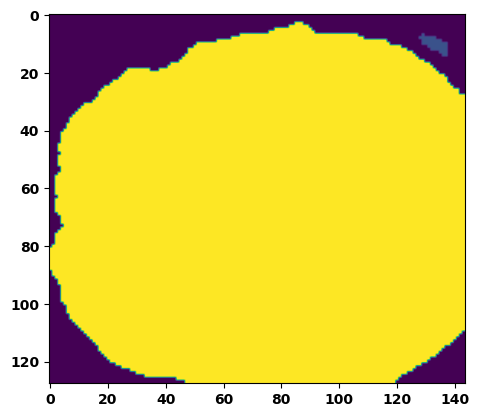

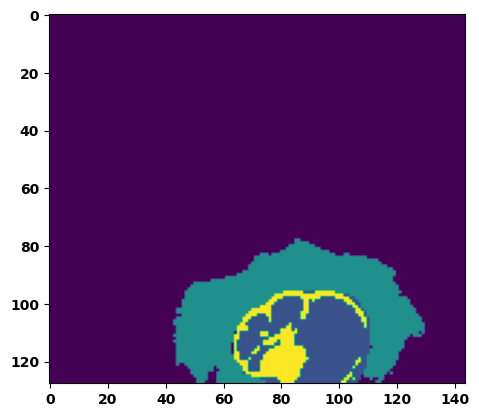

 33%|███▎      | 12/36 [00:17<00:34,  1.42s/it]

Batch_id:  11 Eval loss:  0.7749621868133545
Batch_id:  11 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.42s/it]

Batch_id:  12 Eval loss:  0.7652716636657715
Batch_id:  12 Eval IoU:  tensor(0.1805, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7563, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.6497, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9097, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.7237, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9860, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.42s/it]

Batch_id:  13 Eval loss:  0.07068614661693573
Batch_id:  13 Eval IoU:  tensor(0.8731, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.39s/it]

Batch_id:  14 Eval loss:  0.4496515989303589
Batch_id:  14 Eval IoU:  tensor(0.4409, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9290, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8993, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9416, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9654, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.41s/it]

Batch_id:  15 Eval loss:  0.29763633012771606
Batch_id:  15 Eval IoU:  tensor(0.5889, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.45s/it]

Batch_id:  16 Eval loss:  0.15571348369121552
Batch_id:  16 Eval IoU:  tensor(0.7546, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:26,  1.45s/it]

Batch_id:  17 Eval loss:  0.11255884170532227
Batch_id:  17 Eval IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9983, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.42s/it]

Batch_id:  18 Eval loss:  0.32242828607559204
Batch_id:  18 Eval IoU:  tensor(0.6260, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9910, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.40s/it]

Batch_id:  19 Eval loss:  0.5979658365249634
Batch_id:  19 Eval IoU:  tensor(0.3407, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  20 Eval loss:  0.8831295371055603
Batch_id:  20 Eval IoU:  tensor(0.0748, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.4957, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.4178, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.2436, device='cuda:0')


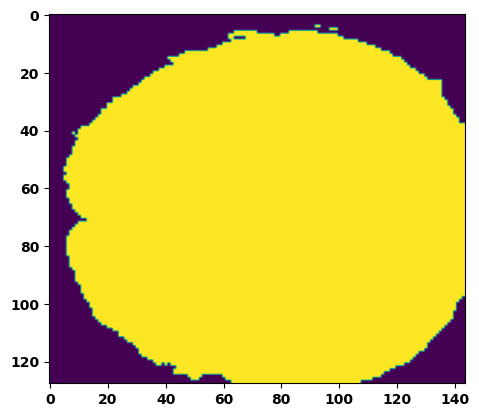

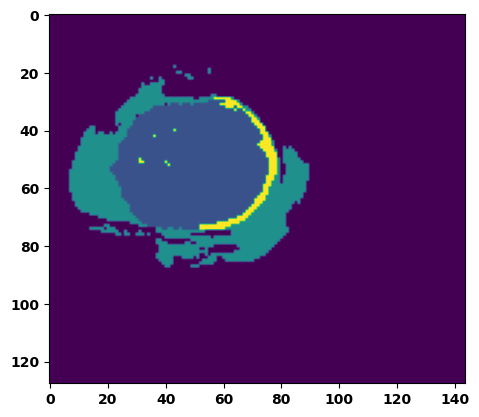

 61%|██████    | 22/36 [00:31<00:19,  1.42s/it]

Batch_id:  21 Eval loss:  0.5758168697357178
Batch_id:  21 Eval IoU:  tensor(0.3755, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9494, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9423, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9315, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.43s/it]

Batch_id:  22 Eval loss:  0.6519957780838013
Batch_id:  22 Eval IoU:  tensor(0.2969, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.47s/it]

Batch_id:  23 Eval loss:  0.21933670341968536
Batch_id:  23 Eval IoU:  tensor(0.6800, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.7396425604820251
Batch_id:  24 Eval IoU:  tensor(0.1607, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.5893, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4359, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.7335, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.6467, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9517, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.44s/it]

Batch_id:  25 Eval loss:  0.7853437066078186
Batch_id:  25 Eval IoU:  tensor(0.1430, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.6282, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.5111, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9093, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.5202, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9441, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.44s/it]

Batch_id:  26 Eval loss:  0.48744839429855347
Batch_id:  26 Eval IoU:  tensor(0.4299, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9827, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.44s/it]

Batch_id:  27 Eval loss:  0.2109762579202652
Batch_id:  27 Eval IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:10,  1.44s/it]

Batch_id:  28 Eval loss:  0.7682932615280151
Batch_id:  28 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.41s/it]

Batch_id:  29 Eval loss:  0.2521144449710846
Batch_id:  29 Eval IoU:  tensor(0.6420, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9385, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9371, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  30 Eval loss:  0.8578226566314697
Batch_id:  30 Eval IoU:  tensor(0.0876, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4687, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.2049, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9217, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.3034, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9762, device='cuda:0')


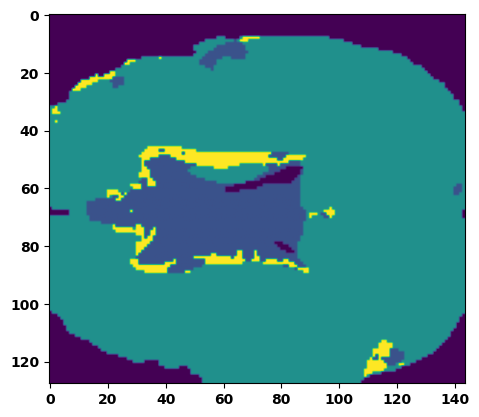

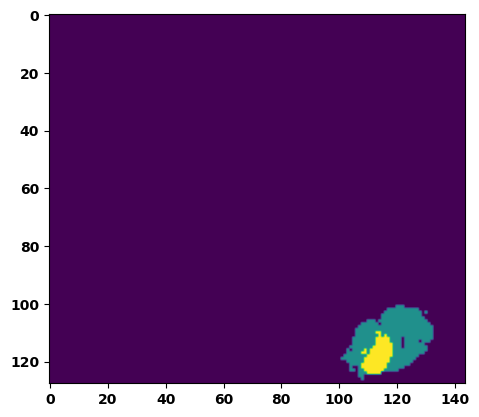

 89%|████████▉ | 32/36 [00:46<00:05,  1.49s/it]

Batch_id:  31 Eval loss:  0.7577242851257324
Batch_id:  31 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.44s/it]

Batch_id:  32 Eval loss:  0.7505488395690918
Batch_id:  32 Eval IoU:  tensor(0.1719, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.4829, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3058, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9349, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2545, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.47s/it]

Batch_id:  33 Eval loss:  0.5517324209213257
Batch_id:  33 Eval IoU:  tensor(0.4066, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9404, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9204, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9549, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.24756547808647156
Batch_id:  34 Eval IoU:  tensor(0.6376, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9640, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9638, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.44s/it]

Batch_id:  35 Eval loss:  0.6120076775550842
Batch_id:  35 Eval IoU:  tensor(0.3398, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Epoch  41 Training loss:  0.1281922859224406
Epoch  41 Evaluation loss:  0.5571687391234769
Epoch  41 Training accuracy :  tensor(0.8080)
Epoch  41 Evaluation accuracy :  tensor(0.3773)
Epoch  41 Training Mean Dice Score:  tensor(0.9848)
Epoch  41 Eval Mean Dice Score:  tensor(0.8414)
Epoch  41 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  41 Eval Non-tumor Dice Score:  tensor(0.7960)
Epoch  41 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  41 Eval NCR/NET Dice Score:  tensor(0.9614)
Epoch  41 Training ED Dice Score:  tensor(0.983

Epoch: 42
Training in session: 


  1%|          | 1/110 [00:01<03:14,  1.78s/it]

Batch_id:  0 Training loss:  0.04858995974063873
Batch_id:  0 Training IoU:  tensor(0.9226, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:47,  1.55s/it]

Batch_id:  1 Training loss:  0.09580124914646149
Batch_id:  1 Training IoU:  tensor(0.8409, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:44,  1.54s/it]

Batch_id:  2 Training loss:  0.12478256225585938
Batch_id:  2 Training IoU:  tensor(0.7929, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:45,  1.56s/it]

Batch_id:  3 Training loss:  0.13664647936820984
Batch_id:  3 Training IoU:  tensor(0.7879, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:37,  1.50s/it]

Batch_id:  4 Training loss:  0.2163117676973343
Batch_id:  4 Training IoU:  tensor(0.7261, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:42,  1.57s/it]

Batch_id:  5 Training loss:  0.23418262600898743
Batch_id:  5 Training IoU:  tensor(0.7130, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:37,  1.53s/it]

Batch_id:  6 Training loss:  0.06286321580410004
Batch_id:  6 Training IoU:  tensor(0.8897, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:28,  1.46s/it]

Batch_id:  7 Training loss:  0.1792270392179489
Batch_id:  7 Training IoU:  tensor(0.7882, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:33,  1.52s/it]

Batch_id:  8 Training loss:  0.21061302721500397
Batch_id:  8 Training IoU:  tensor(0.7248, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:34,  1.55s/it]

Batch_id:  9 Training loss:  0.11386418342590332
Batch_id:  9 Training IoU:  tensor(0.8218, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 10%|█         | 11/110 [00:16<02:34,  1.56s/it]

Batch_id:  10 Training loss:  0.20289979875087738
Batch_id:  10 Training IoU:  tensor(0.7198, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9967, device='cuda:0')


 11%|█         | 12/110 [00:18<02:30,  1.53s/it]

Batch_id:  11 Training loss:  0.17264424264431
Batch_id:  11 Training IoU:  tensor(0.7352, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:28,  1.53s/it]

Batch_id:  12 Training loss:  0.09383174777030945
Batch_id:  12 Training IoU:  tensor(0.8426, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:22,  1.49s/it]

Batch_id:  13 Training loss:  0.12744545936584473
Batch_id:  13 Training IoU:  tensor(0.7927, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:19,  1.47s/it]

Batch_id:  14 Training loss:  0.14655007421970367
Batch_id:  14 Training IoU:  tensor(0.7633, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:17,  1.47s/it]

Batch_id:  15 Training loss:  0.15361295640468597
Batch_id:  15 Training IoU:  tensor(0.7491, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9542, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9966, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:20,  1.51s/it]

Batch_id:  16 Training loss:  0.15588460862636566
Batch_id:  16 Training IoU:  tensor(0.7525, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:14,  1.46s/it]

Batch_id:  17 Training loss:  0.11630365252494812
Batch_id:  17 Training IoU:  tensor(0.8161, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:13,  1.47s/it]

Batch_id:  18 Training loss:  0.08882449567317963
Batch_id:  18 Training IoU:  tensor(0.8467, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:12,  1.47s/it]

Batch_id:  19 Training loss:  0.3192783296108246
Batch_id:  19 Training IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:10,  1.47s/it]

Batch_id:  20 Training loss:  0.19923122227191925
Batch_id:  20 Training IoU:  tensor(0.7796, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 20%|██        | 22/110 [00:33<02:12,  1.51s/it]

Batch_id:  21 Training loss:  0.08077579736709595
Batch_id:  21 Training IoU:  tensor(0.8651, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 21%|██        | 23/110 [00:34<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.09736765921115875
Batch_id:  22 Training IoU:  tensor(0.8339, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:04,  1.44s/it]

Batch_id:  23 Training loss:  0.14958973228931427
Batch_id:  23 Training IoU:  tensor(0.7636, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:02,  1.44s/it]

Batch_id:  24 Training loss:  0.0784081518650055
Batch_id:  24 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:02,  1.45s/it]

Batch_id:  25 Training loss:  0.0759797990322113
Batch_id:  25 Training IoU:  tensor(0.8730, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:01,  1.47s/it]

Batch_id:  26 Training loss:  0.09199616312980652
Batch_id:  26 Training IoU:  tensor(0.8514, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 25%|██▌       | 28/110 [00:41<02:02,  1.49s/it]

Batch_id:  27 Training loss:  0.059128329157829285
Batch_id:  27 Training IoU:  tensor(0.8990, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 26%|██▋       | 29/110 [00:43<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.0569990873336792
Batch_id:  28 Training IoU:  tensor(0.9006, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:58,  1.48s/it]

Batch_id:  29 Training loss:  0.08287151157855988
Batch_id:  29 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 28%|██▊       | 31/110 [00:46<02:00,  1.53s/it]

Batch_id:  30 Training loss:  0.057892486453056335
Batch_id:  30 Training IoU:  tensor(0.9000, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 29%|██▉       | 32/110 [00:48<02:00,  1.55s/it]

Batch_id:  31 Training loss:  0.3559872806072235
Batch_id:  31 Training IoU:  tensor(0.5599, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 30%|███       | 33/110 [00:49<01:57,  1.53s/it]

Batch_id:  32 Training loss:  0.13412268459796906
Batch_id:  32 Training IoU:  tensor(0.7840, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 31%|███       | 34/110 [00:51<01:57,  1.54s/it]

Batch_id:  33 Training loss:  0.24080337584018707
Batch_id:  33 Training IoU:  tensor(0.6729, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:53,  1.51s/it]

Batch_id:  34 Training loss:  0.11526298522949219
Batch_id:  34 Training IoU:  tensor(0.8047, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:50,  1.50s/it]

Batch_id:  35 Training loss:  0.08234511315822601
Batch_id:  35 Training IoU:  tensor(0.8574, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:47,  1.48s/it]

Batch_id:  36 Training loss:  0.12758657336235046
Batch_id:  36 Training IoU:  tensor(0.8012, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:44,  1.45s/it]

Batch_id:  37 Training loss:  0.21408919990062714
Batch_id:  37 Training IoU:  tensor(0.6935, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:45,  1.49s/it]

Batch_id:  38 Training loss:  0.08983099460601807
Batch_id:  38 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:45,  1.51s/it]

Batch_id:  39 Training loss:  0.07218398153781891
Batch_id:  39 Training IoU:  tensor(0.9304, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:41,  1.47s/it]

Batch_id:  40 Training loss:  0.11696533858776093
Batch_id:  40 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:47,  1.58s/it]

Batch_id:  41 Training loss:  0.08968433737754822
Batch_id:  41 Training IoU:  tensor(0.8478, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:41,  1.51s/it]

Batch_id:  42 Training loss:  0.07274501025676727
Batch_id:  42 Training IoU:  tensor(0.8748, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 40%|████      | 44/110 [01:06<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.2357209324836731
Batch_id:  43 Training IoU:  tensor(0.7042, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 41%|████      | 45/110 [01:07<01:39,  1.53s/it]

Batch_id:  44 Training loss:  0.10761389136314392
Batch_id:  44 Training IoU:  tensor(0.8256, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 42%|████▏     | 46/110 [01:09<01:40,  1.57s/it]

Batch_id:  45 Training loss:  0.10406078398227692
Batch_id:  45 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 43%|████▎     | 47/110 [01:10<01:34,  1.50s/it]

Batch_id:  46 Training loss:  0.12370601296424866
Batch_id:  46 Training IoU:  tensor(0.8205, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 44%|████▎     | 48/110 [01:12<01:34,  1.52s/it]

Batch_id:  47 Training loss:  0.030405625700950623
Batch_id:  47 Training IoU:  tensor(0.9472, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:32,  1.52s/it]

Batch_id:  48 Training loss:  0.09640233218669891
Batch_id:  48 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 45%|████▌     | 50/110 [01:15<01:29,  1.50s/it]

Batch_id:  49 Training loss:  0.14969025552272797
Batch_id:  49 Training IoU:  tensor(0.7604, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:30,  1.53s/it]

Batch_id:  50 Training loss:  0.06175163388252258
Batch_id:  50 Training IoU:  tensor(0.9249, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 47%|████▋     | 52/110 [01:18<01:27,  1.51s/it]

Batch_id:  51 Training loss:  0.13695847988128662
Batch_id:  51 Training IoU:  tensor(0.7776, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:27,  1.54s/it]

Batch_id:  52 Training loss:  0.18510301411151886
Batch_id:  52 Training IoU:  tensor(0.7145, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 49%|████▉     | 54/110 [01:21<01:26,  1.55s/it]

Batch_id:  53 Training loss:  0.08539074659347534
Batch_id:  53 Training IoU:  tensor(0.8542, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:23,  1.52s/it]

Batch_id:  54 Training loss:  0.10448047518730164
Batch_id:  54 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 51%|█████     | 56/110 [01:24<01:20,  1.49s/it]

Batch_id:  55 Training loss:  0.17268307507038116
Batch_id:  55 Training IoU:  tensor(0.7352, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 52%|█████▏    | 57/110 [01:25<01:19,  1.50s/it]

Batch_id:  56 Training loss:  0.13234128057956696
Batch_id:  56 Training IoU:  tensor(0.7789, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9816, device='cuda:0')


 53%|█████▎    | 58/110 [01:27<01:20,  1.54s/it]

Batch_id:  57 Training loss:  0.10744775831699371
Batch_id:  57 Training IoU:  tensor(0.9129, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 54%|█████▎    | 59/110 [01:28<01:16,  1.51s/it]

Batch_id:  58 Training loss:  0.06637546420097351
Batch_id:  58 Training IoU:  tensor(0.8858, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 55%|█████▍    | 60/110 [01:30<01:15,  1.52s/it]

Batch_id:  59 Training loss:  0.05202953517436981
Batch_id:  59 Training IoU:  tensor(0.9114, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 55%|█████▌    | 61/110 [01:32<01:15,  1.54s/it]

Batch_id:  60 Training loss:  0.05253733694553375
Batch_id:  60 Training IoU:  tensor(0.9090, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 56%|█████▋    | 62/110 [01:33<01:13,  1.53s/it]

Batch_id:  61 Training loss:  0.10588635504245758
Batch_id:  61 Training IoU:  tensor(0.8182, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 57%|█████▋    | 63/110 [01:35<01:11,  1.53s/it]

Batch_id:  62 Training loss:  0.16814711689949036
Batch_id:  62 Training IoU:  tensor(0.7544, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9957, device='cuda:0')


 58%|█████▊    | 64/110 [01:36<01:08,  1.48s/it]

Batch_id:  63 Training loss:  0.10943847894668579
Batch_id:  63 Training IoU:  tensor(0.8238, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:06,  1.47s/it]

Batch_id:  64 Training loss:  0.13493821024894714
Batch_id:  64 Training IoU:  tensor(0.7899, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 60%|██████    | 66/110 [01:39<01:05,  1.50s/it]

Batch_id:  65 Training loss:  0.14163966476917267
Batch_id:  65 Training IoU:  tensor(0.7806, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 61%|██████    | 67/110 [01:40<01:04,  1.51s/it]

Batch_id:  66 Training loss:  0.15463471412658691
Batch_id:  66 Training IoU:  tensor(0.7565, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 62%|██████▏   | 68/110 [01:42<01:02,  1.49s/it]

Batch_id:  67 Training loss:  0.09095606207847595
Batch_id:  67 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 63%|██████▎   | 69/110 [01:43<00:59,  1.45s/it]

Batch_id:  68 Training loss:  0.05523434281349182
Batch_id:  68 Training IoU:  tensor(0.9036, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 64%|██████▎   | 70/110 [01:45<01:00,  1.51s/it]

Batch_id:  69 Training loss:  0.1287011057138443
Batch_id:  69 Training IoU:  tensor(0.8022, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 65%|██████▍   | 71/110 [01:47<01:02,  1.59s/it]

Batch_id:  70 Training loss:  0.06275348365306854
Batch_id:  70 Training IoU:  tensor(0.8924, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 65%|██████▌   | 72/110 [01:48<00:57,  1.52s/it]

Batch_id:  71 Training loss:  0.10253606736660004
Batch_id:  71 Training IoU:  tensor(0.8276, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 66%|██████▋   | 73/110 [01:50<00:56,  1.52s/it]

Batch_id:  72 Training loss:  0.14507116377353668
Batch_id:  72 Training IoU:  tensor(0.7985, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 67%|██████▋   | 74/110 [01:51<00:54,  1.50s/it]

Batch_id:  73 Training loss:  0.10891944169998169
Batch_id:  73 Training IoU:  tensor(0.8288, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 68%|██████▊   | 75/110 [01:52<00:51,  1.48s/it]

Batch_id:  74 Training loss:  0.23115819692611694
Batch_id:  74 Training IoU:  tensor(0.6782, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 69%|██████▉   | 76/110 [01:54<00:49,  1.45s/it]

Batch_id:  75 Training loss:  0.09393268823623657
Batch_id:  75 Training IoU:  tensor(0.8444, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 70%|███████   | 77/110 [01:55<00:47,  1.45s/it]

Batch_id:  76 Training loss:  0.12532442808151245
Batch_id:  76 Training IoU:  tensor(0.8140, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 71%|███████   | 78/110 [01:57<00:46,  1.44s/it]

Batch_id:  77 Training loss:  0.1352340131998062
Batch_id:  77 Training IoU:  tensor(0.8126, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 72%|███████▏  | 79/110 [01:58<00:45,  1.46s/it]

Batch_id:  78 Training loss:  0.109595388174057
Batch_id:  78 Training IoU:  tensor(0.8199, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 73%|███████▎  | 80/110 [02:00<00:43,  1.46s/it]

Batch_id:  79 Training loss:  0.17547988891601562
Batch_id:  79 Training IoU:  tensor(0.7244, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 74%|███████▎  | 81/110 [02:01<00:41,  1.45s/it]

Batch_id:  80 Training loss:  0.043831512331962585
Batch_id:  80 Training IoU:  tensor(0.9267, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:39,  1.41s/it]

Batch_id:  81 Training loss:  0.07973651587963104
Batch_id:  81 Training IoU:  tensor(0.8646, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 75%|███████▌  | 83/110 [02:04<00:37,  1.41s/it]

Batch_id:  82 Training loss:  0.19217543303966522
Batch_id:  82 Training IoU:  tensor(0.7027, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9771, device='cuda:0')


 76%|███████▋  | 84/110 [02:05<00:37,  1.46s/it]

Batch_id:  83 Training loss:  0.08533585071563721
Batch_id:  83 Training IoU:  tensor(0.8529, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 77%|███████▋  | 85/110 [02:07<00:36,  1.45s/it]

Batch_id:  84 Training loss:  0.06804586946964264
Batch_id:  84 Training IoU:  tensor(0.8866, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 78%|███████▊  | 86/110 [02:08<00:34,  1.44s/it]

Batch_id:  85 Training loss:  0.10674351453781128
Batch_id:  85 Training IoU:  tensor(0.8183, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 79%|███████▉  | 87/110 [02:10<00:32,  1.41s/it]

Batch_id:  86 Training loss:  0.07397983968257904
Batch_id:  86 Training IoU:  tensor(0.8704, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 80%|████████  | 88/110 [02:11<00:31,  1.45s/it]

Batch_id:  87 Training loss:  0.1581067442893982
Batch_id:  87 Training IoU:  tensor(0.7541, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 81%|████████  | 89/110 [02:12<00:29,  1.41s/it]

Batch_id:  88 Training loss:  0.14512832462787628
Batch_id:  88 Training IoU:  tensor(0.7834, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 82%|████████▏ | 90/110 [02:14<00:28,  1.41s/it]

Batch_id:  89 Training loss:  0.2186659425497055
Batch_id:  89 Training IoU:  tensor(0.7008, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:26,  1.39s/it]

Batch_id:  90 Training loss:  0.23889325559139252
Batch_id:  90 Training IoU:  tensor(0.6952, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 84%|████████▎ | 92/110 [02:17<00:26,  1.46s/it]

Batch_id:  91 Training loss:  0.22252658009529114
Batch_id:  91 Training IoU:  tensor(0.6757, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9654, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9635, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:25,  1.48s/it]

Batch_id:  92 Training loss:  0.2833811044692993
Batch_id:  92 Training IoU:  tensor(0.6332, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 85%|████████▌ | 94/110 [02:20<00:23,  1.46s/it]

Batch_id:  93 Training loss:  0.19716930389404297
Batch_id:  93 Training IoU:  tensor(0.7341, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:21,  1.45s/it]

Batch_id:  94 Training loss:  0.14335933327674866
Batch_id:  94 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 87%|████████▋ | 96/110 [02:23<00:20,  1.48s/it]

Batch_id:  95 Training loss:  0.2523984909057617
Batch_id:  95 Training IoU:  tensor(0.6725, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 88%|████████▊ | 97/110 [02:24<00:18,  1.42s/it]

Batch_id:  96 Training loss:  0.052679479122161865
Batch_id:  96 Training IoU:  tensor(0.9082, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 89%|████████▉ | 98/110 [02:26<00:17,  1.44s/it]

Batch_id:  97 Training loss:  0.133650004863739
Batch_id:  97 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 90%|█████████ | 99/110 [02:27<00:15,  1.40s/it]

Batch_id:  98 Training loss:  0.11557616293430328
Batch_id:  98 Training IoU:  tensor(0.8068, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:13,  1.38s/it]

Batch_id:  99 Training loss:  0.11848428845405579
Batch_id:  99 Training IoU:  tensor(0.8036, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 92%|█████████▏| 101/110 [02:30<00:12,  1.43s/it]

Batch_id:  100 Training loss:  0.07449126243591309
Batch_id:  100 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 93%|█████████▎| 102/110 [02:31<00:11,  1.42s/it]

Batch_id:  101 Training loss:  0.06223519146442413
Batch_id:  101 Training IoU:  tensor(0.9062, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 94%|█████████▎| 103/110 [02:33<00:09,  1.42s/it]

Batch_id:  102 Training loss:  0.22392593324184418
Batch_id:  102 Training IoU:  tensor(0.6815, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 95%|█████████▍| 104/110 [02:34<00:08,  1.40s/it]

Batch_id:  103 Training loss:  0.07142317295074463
Batch_id:  103 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:06,  1.40s/it]

Batch_id:  104 Training loss:  0.10031555593013763
Batch_id:  104 Training IoU:  tensor(0.8365, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 96%|█████████▋| 106/110 [02:37<00:05,  1.44s/it]

Batch_id:  105 Training loss:  0.09446568787097931
Batch_id:  105 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.40s/it]

Batch_id:  106 Training loss:  0.16466282308101654
Batch_id:  106 Training IoU:  tensor(0.7937, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 98%|█████████▊| 108/110 [02:40<00:02,  1.42s/it]

Batch_id:  107 Training loss:  0.10229824483394623
Batch_id:  107 Training IoU:  tensor(0.8424, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.51s/it]

Batch_id:  108 Training loss:  0.07483354210853577
Batch_id:  108 Training IoU:  tensor(0.8707, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


100%|██████████| 110/110 [02:43<00:00,  1.49s/it]


Batch_id:  109 Training loss:  0.06509217619895935
Batch_id:  109 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9964, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6244081854820251
Batch_id:  0 Eval IoU:  tensor(0.3137, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9061, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8648, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9078, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


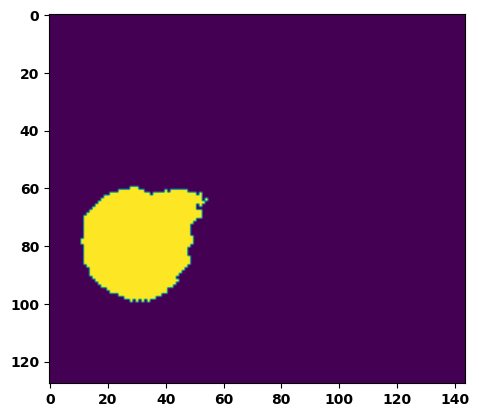

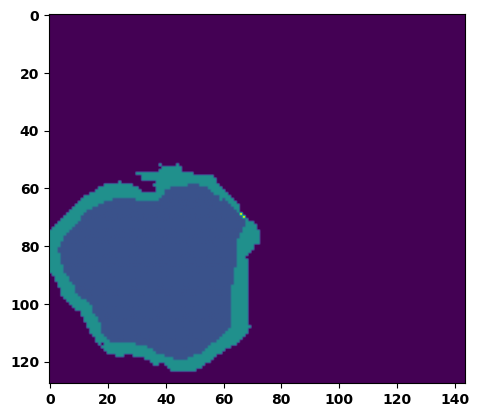

  6%|▌         | 2/36 [00:02<00:48,  1.42s/it]

Batch_id:  1 Eval loss:  0.5398045778274536
Batch_id:  1 Eval IoU:  tensor(0.3859, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9175, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8857, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:46,  1.42s/it]

Batch_id:  2 Eval loss:  0.4574144780635834
Batch_id:  2 Eval IoU:  tensor(0.4297, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8295, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7628, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.7601, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9832, device='cuda:0')


 11%|█         | 4/36 [00:05<00:43,  1.36s/it]

Batch_id:  3 Eval loss:  0.6732118725776672
Batch_id:  3 Eval IoU:  tensor(0.2342, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.5299, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.3482, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.7248, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.5541, device='cuda:0')


 14%|█▍        | 5/36 [00:06<00:41,  1.34s/it]

Batch_id:  4 Eval loss:  0.7729599475860596
Batch_id:  4 Eval IoU:  tensor(0.1399, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.5398, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3948, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.3119, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.38s/it]

Batch_id:  5 Eval loss:  0.276025652885437
Batch_id:  5 Eval IoU:  tensor(0.6305, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.39s/it]

Batch_id:  6 Eval loss:  0.6224463582038879
Batch_id:  6 Eval IoU:  tensor(0.3187, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9162, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8772, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.42s/it]

Batch_id:  7 Eval loss:  0.11937123537063599
Batch_id:  7 Eval IoU:  tensor(0.7954, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9766, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9831, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:40,  1.51s/it]

Batch_id:  8 Eval loss:  0.18096669018268585
Batch_id:  8 Eval IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9847, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.46s/it]

Batch_id:  9 Eval loss:  0.23906336724758148
Batch_id:  9 Eval IoU:  tensor(0.6685, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  10 Eval loss:  0.7573795318603516
Batch_id:  10 Eval IoU:  tensor(0.2349, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9397, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


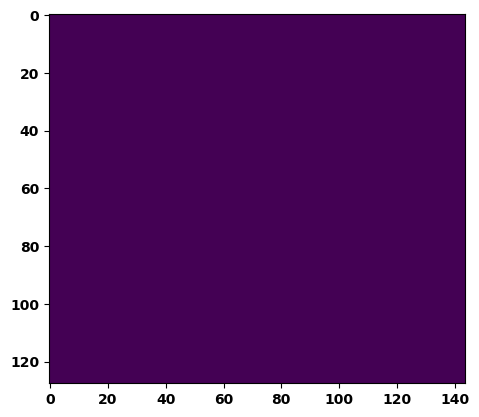

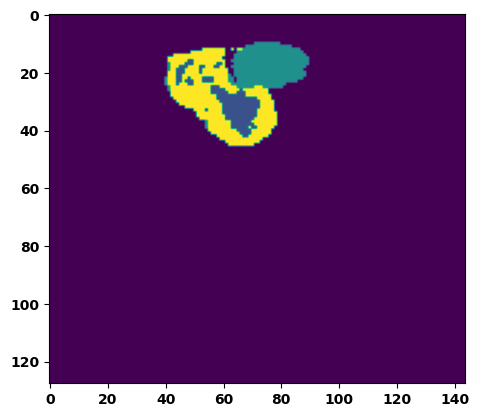

 33%|███▎      | 12/36 [00:17<00:35,  1.47s/it]

Batch_id:  11 Eval loss:  0.7634026408195496
Batch_id:  11 Eval IoU:  tensor(0.2242, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9195, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:34,  1.50s/it]

Batch_id:  12 Eval loss:  0.7561732530593872
Batch_id:  12 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:32,  1.47s/it]

Batch_id:  13 Eval loss:  0.681909441947937
Batch_id:  13 Eval IoU:  tensor(0.2143, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.6449, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.4994, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8028, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.6599, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:30,  1.45s/it]

Batch_id:  14 Eval loss:  0.7578953504562378
Batch_id:  14 Eval IoU:  tensor(0.2340, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9361, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.45s/it]

Batch_id:  15 Eval loss:  0.4068949520587921
Batch_id:  15 Eval IoU:  tensor(0.4917, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.46s/it]

Batch_id:  16 Eval loss:  0.4641547203063965
Batch_id:  16 Eval IoU:  tensor(0.4348, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9281, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9164, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8965, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9875, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:25,  1.44s/it]

Batch_id:  17 Eval loss:  0.7581276893615723
Batch_id:  17 Eval IoU:  tensor(0.2336, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:24,  1.46s/it]

Batch_id:  18 Eval loss:  0.6652143597602844
Batch_id:  18 Eval IoU:  tensor(0.2794, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9264, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9089, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.8953, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.42s/it]

Batch_id:  19 Eval loss:  0.7843911051750183
Batch_id:  19 Eval IoU:  tensor(0.1595, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.7305, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.5997, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.5968, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  20 Eval loss:  0.6364881992340088
Batch_id:  20 Eval IoU:  tensor(0.3145, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9408, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9191, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9328, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


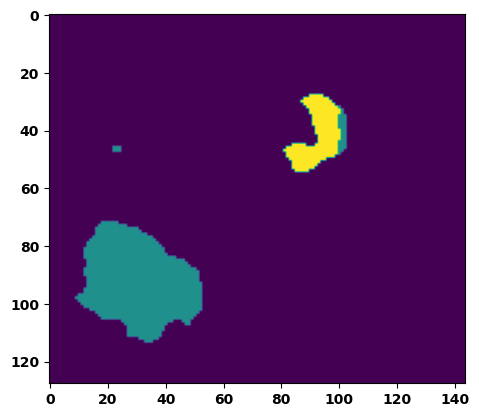

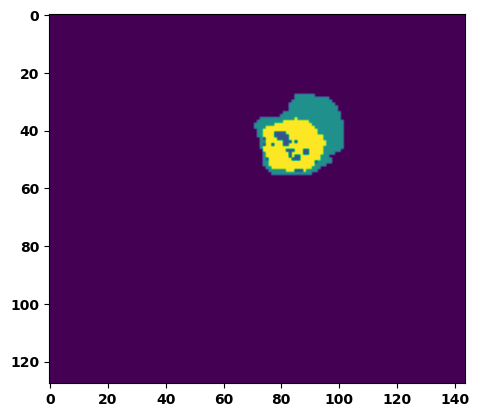

 61%|██████    | 22/36 [00:31<00:19,  1.43s/it]

Batch_id:  21 Eval loss:  0.6109969615936279
Batch_id:  21 Eval IoU:  tensor(0.3288, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9329, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9899, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:18,  1.40s/it]

Batch_id:  22 Eval loss:  0.6660428643226624
Batch_id:  22 Eval IoU:  tensor(0.2871, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9467, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:16,  1.38s/it]

Batch_id:  23 Eval loss:  0.7517642974853516
Batch_id:  23 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:14,  1.35s/it]

Batch_id:  24 Eval loss:  0.8997292518615723
Batch_id:  24 Eval IoU:  tensor(0.0589, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4623, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3371, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.1945, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:13,  1.38s/it]

Batch_id:  25 Eval loss:  0.7315361499786377
Batch_id:  25 Eval IoU:  tensor(0.2508, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9895, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.34s/it]

Batch_id:  26 Eval loss:  0.7749718427658081
Batch_id:  26 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:10,  1.33s/it]

Batch_id:  27 Eval loss:  0.8813834190368652
Batch_id:  27 Eval IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.4983, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.4217, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.2475, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.37s/it]

Batch_id:  28 Eval loss:  0.6142383217811584
Batch_id:  28 Eval IoU:  tensor(0.3352, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9493, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9301, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9426, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.38s/it]

Batch_id:  29 Eval loss:  0.6355800628662109
Batch_id:  29 Eval IoU:  tensor(0.3041, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9316, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8979, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9616, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  30 Eval loss:  0.6157240867614746
Batch_id:  30 Eval IoU:  tensor(0.3276, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


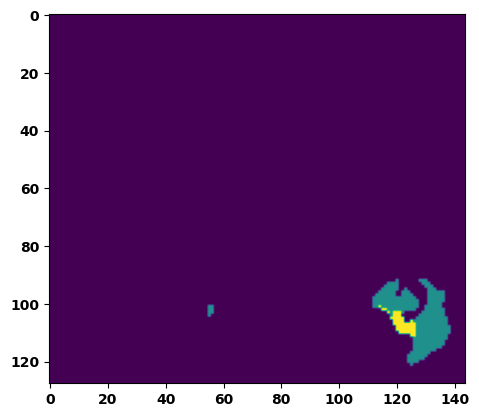

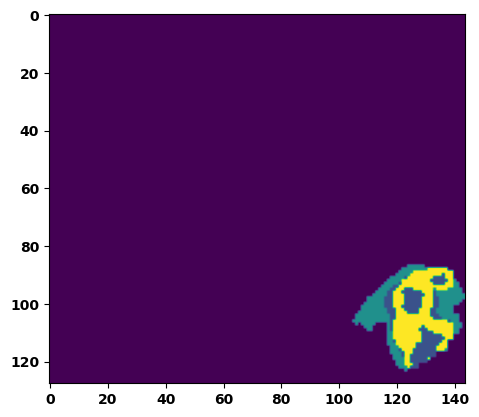

 89%|████████▉ | 32/36 [00:45<00:05,  1.45s/it]

Batch_id:  31 Eval loss:  0.7575825452804565
Batch_id:  31 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.6154140830039978
Batch_id:  32 Eval IoU:  tensor(0.3327, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9065, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9274, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.8952, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.45s/it]

Batch_id:  33 Eval loss:  0.7682733535766602
Batch_id:  33 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.6467008590698242
Batch_id:  34 Eval IoU:  tensor(0.2896, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8625, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8029, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.8834, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.6175797581672668
Batch_id:  35 Eval IoU:  tensor(0.3311, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')
Epoch 00043: reducing learning rate of group 0 to 7.8125e-06.
Epoch  42 Training loss:  0.12808995341712778
Epoch  42 Evaluation loss:  0.6257005963060591
Epoch  42 Training accuracy :  tensor(0.8082)
Epoch  42 Evaluation accuracy :  tensor(0.3197)
Epoch  42 Training Mean Dice Score:  tensor(0.9848)
Epoch  42 Eval Mean Dice Score:  tensor(0.8772)
Epoch  42 Training Non-tumor Dice Score:  tensor(0.9858)
Epoch  42 Eval Non-tumor Dice Score:  tensor(0.8396)
Epoch  42 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  42 Eval NCR/NET Dice Score: 

Epoch: 43
Training in session: 


  1%|          | 1/110 [00:01<03:07,  1.72s/it]

Batch_id:  0 Training loss:  0.05250263214111328
Batch_id:  0 Training IoU:  tensor(0.9085, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:41,  1.50s/it]

Batch_id:  1 Training loss:  0.108033686876297
Batch_id:  1 Training IoU:  tensor(0.8256, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:42,  1.52s/it]

Batch_id:  2 Training loss:  0.14944955706596375
Batch_id:  2 Training IoU:  tensor(0.7560, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9584, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:41,  1.53s/it]

Batch_id:  3 Training loss:  0.22057488560676575
Batch_id:  3 Training IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9636, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:44,  1.57s/it]

Batch_id:  4 Training loss:  0.09084410965442657
Batch_id:  4 Training IoU:  tensor(0.8429, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:40,  1.55s/it]

Batch_id:  5 Training loss:  0.11394025385379791
Batch_id:  5 Training IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.14818702638149261
Batch_id:  6 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:27,  1.44s/it]

Batch_id:  7 Training loss:  0.07951563596725464
Batch_id:  7 Training IoU:  tensor(0.8640, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:30,  1.49s/it]

Batch_id:  8 Training loss:  0.07572193443775177
Batch_id:  8 Training IoU:  tensor(0.8731, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:25,  1.46s/it]

Batch_id:  9 Training loss:  0.13888393342494965
Batch_id:  9 Training IoU:  tensor(0.7843, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 10%|█         | 11/110 [00:16<02:23,  1.45s/it]

Batch_id:  10 Training loss:  0.10809256136417389
Batch_id:  10 Training IoU:  tensor(0.8303, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 11%|█         | 12/110 [00:17<02:25,  1.49s/it]

Batch_id:  11 Training loss:  0.07214106619358063
Batch_id:  11 Training IoU:  tensor(0.9336, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:27,  1.52s/it]

Batch_id:  12 Training loss:  0.11506094038486481
Batch_id:  12 Training IoU:  tensor(0.8046, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:20,  1.46s/it]

Batch_id:  13 Training loss:  0.1590670645236969
Batch_id:  13 Training IoU:  tensor(0.7531, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:18,  1.46s/it]

Batch_id:  14 Training loss:  0.21533572673797607
Batch_id:  14 Training IoU:  tensor(0.7299, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:15,  1.44s/it]

Batch_id:  15 Training loss:  0.1046951413154602
Batch_id:  15 Training IoU:  tensor(0.8265, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:11,  1.41s/it]

Batch_id:  16 Training loss:  0.11792442202568054
Batch_id:  16 Training IoU:  tensor(0.8043, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:09,  1.41s/it]

Batch_id:  17 Training loss:  0.18053820729255676
Batch_id:  17 Training IoU:  tensor(0.7209, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:15,  1.48s/it]

Batch_id:  18 Training loss:  0.07457810640335083
Batch_id:  18 Training IoU:  tensor(0.8706, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:14,  1.49s/it]

Batch_id:  19 Training loss:  0.09661160409450531
Batch_id:  19 Training IoU:  tensor(0.8670, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:18,  1.56s/it]

Batch_id:  20 Training loss:  0.22980991005897522
Batch_id:  20 Training IoU:  tensor(0.6790, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9460, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 20%|██        | 22/110 [00:33<02:21,  1.61s/it]

Batch_id:  21 Training loss:  0.1285538226366043
Batch_id:  21 Training IoU:  tensor(0.8026, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 21%|██        | 23/110 [00:34<02:16,  1.57s/it]

Batch_id:  22 Training loss:  0.05221743881702423
Batch_id:  22 Training IoU:  tensor(0.9088, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:11,  1.53s/it]

Batch_id:  23 Training loss:  0.13996931910514832
Batch_id:  23 Training IoU:  tensor(0.7826, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.07811026275157928
Batch_id:  24 Training IoU:  tensor(0.8660, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:14,  1.60s/it]

Batch_id:  25 Training loss:  0.10204534232616425
Batch_id:  25 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:07,  1.54s/it]

Batch_id:  26 Training loss:  0.21305051445960999
Batch_id:  26 Training IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:02,  1.49s/it]

Batch_id:  27 Training loss:  0.16748157143592834
Batch_id:  27 Training IoU:  tensor(0.7417, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 26%|██▋       | 29/110 [00:43<01:59,  1.47s/it]

Batch_id:  28 Training loss:  0.12411674857139587
Batch_id:  28 Training IoU:  tensor(0.8208, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:56,  1.45s/it]

Batch_id:  29 Training loss:  0.11160315573215485
Batch_id:  29 Training IoU:  tensor(0.8209, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:56,  1.48s/it]

Batch_id:  30 Training loss:  0.06193402409553528
Batch_id:  30 Training IoU:  tensor(0.8941, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:53,  1.45s/it]

Batch_id:  31 Training loss:  0.09654407203197479
Batch_id:  31 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 30%|███       | 33/110 [00:49<01:50,  1.44s/it]

Batch_id:  32 Training loss:  0.19450964033603668
Batch_id:  32 Training IoU:  tensor(0.7378, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 31%|███       | 34/110 [00:50<01:56,  1.53s/it]

Batch_id:  33 Training loss:  0.057634562253952026
Batch_id:  33 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:55,  1.54s/it]

Batch_id:  34 Training loss:  0.07462671399116516
Batch_id:  34 Training IoU:  tensor(0.8898, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:53,  1.53s/it]

Batch_id:  35 Training loss:  0.052657127380371094
Batch_id:  35 Training IoU:  tensor(0.9101, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.08313170075416565
Batch_id:  36 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9641, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:47,  1.50s/it]

Batch_id:  37 Training loss:  0.05881008505821228
Batch_id:  37 Training IoU:  tensor(0.8995, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:46,  1.51s/it]

Batch_id:  38 Training loss:  0.10889823734760284
Batch_id:  38 Training IoU:  tensor(0.8204, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:46,  1.53s/it]

Batch_id:  39 Training loss:  0.0674615204334259
Batch_id:  39 Training IoU:  tensor(0.8870, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:42,  1.49s/it]

Batch_id:  40 Training loss:  0.07381096482276917
Batch_id:  40 Training IoU:  tensor(0.8730, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:39,  1.47s/it]

Batch_id:  41 Training loss:  0.08973339200019836
Batch_id:  41 Training IoU:  tensor(0.8475, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:40,  1.50s/it]

Batch_id:  42 Training loss:  0.048685550689697266
Batch_id:  42 Training IoU:  tensor(0.9217, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 40%|████      | 44/110 [01:05<01:38,  1.50s/it]

Batch_id:  43 Training loss:  0.2799758315086365
Batch_id:  43 Training IoU:  tensor(0.6373, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 41%|████      | 45/110 [01:07<01:37,  1.50s/it]

Batch_id:  44 Training loss:  0.09303586184978485
Batch_id:  44 Training IoU:  tensor(0.8437, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:35,  1.49s/it]

Batch_id:  45 Training loss:  0.08152052760124207
Batch_id:  45 Training IoU:  tensor(0.8638, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 43%|████▎     | 47/110 [01:10<01:33,  1.49s/it]

Batch_id:  46 Training loss:  0.12727013230323792
Batch_id:  46 Training IoU:  tensor(0.7929, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:30,  1.45s/it]

Batch_id:  47 Training loss:  0.10704594850540161
Batch_id:  47 Training IoU:  tensor(0.8176, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9854, device='cuda:0')


 45%|████▍     | 49/110 [01:13<01:31,  1.50s/it]

Batch_id:  48 Training loss:  0.14346835017204285
Batch_id:  48 Training IoU:  tensor(0.7655, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:29,  1.49s/it]

Batch_id:  49 Training loss:  0.24103869497776031
Batch_id:  49 Training IoU:  tensor(0.6713, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 46%|████▋     | 51/110 [01:16<01:31,  1.54s/it]

Batch_id:  50 Training loss:  0.082310751080513
Batch_id:  50 Training IoU:  tensor(0.8576, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:27,  1.50s/it]

Batch_id:  51 Training loss:  0.1483355611562729
Batch_id:  51 Training IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:32,  1.62s/it]

Batch_id:  52 Training loss:  0.06451287865638733
Batch_id:  52 Training IoU:  tensor(0.8903, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 49%|████▉     | 54/110 [01:21<01:27,  1.56s/it]

Batch_id:  53 Training loss:  0.19768652319908142
Batch_id:  53 Training IoU:  tensor(0.7791, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 50%|█████     | 55/110 [01:22<01:26,  1.58s/it]

Batch_id:  54 Training loss:  0.2119002491235733
Batch_id:  54 Training IoU:  tensor(0.7230, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 51%|█████     | 56/110 [01:24<01:23,  1.55s/it]

Batch_id:  55 Training loss:  0.10143104195594788
Batch_id:  55 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 52%|█████▏    | 57/110 [01:25<01:23,  1.58s/it]

Batch_id:  56 Training loss:  0.251558393239975
Batch_id:  56 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 53%|█████▎    | 58/110 [01:27<01:21,  1.56s/it]

Batch_id:  57 Training loss:  0.16876697540283203
Batch_id:  57 Training IoU:  tensor(0.7538, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 54%|█████▎    | 59/110 [01:28<01:17,  1.52s/it]

Batch_id:  58 Training loss:  0.09205293655395508
Batch_id:  58 Training IoU:  tensor(0.8507, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 55%|█████▍    | 60/110 [01:30<01:15,  1.51s/it]

Batch_id:  59 Training loss:  0.23609691858291626
Batch_id:  59 Training IoU:  tensor(0.7027, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9558, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 55%|█████▌    | 61/110 [01:32<01:18,  1.59s/it]

Batch_id:  60 Training loss:  0.05663509666919708
Batch_id:  60 Training IoU:  tensor(0.9016, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 56%|█████▋    | 62/110 [01:33<01:13,  1.52s/it]

Batch_id:  61 Training loss:  0.09487459063529968
Batch_id:  61 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 57%|█████▋    | 63/110 [01:35<01:14,  1.58s/it]

Batch_id:  62 Training loss:  0.10070915520191193
Batch_id:  62 Training IoU:  tensor(0.8357, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 58%|█████▊    | 64/110 [01:36<01:12,  1.57s/it]

Batch_id:  63 Training loss:  0.08365215361118317
Batch_id:  63 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 59%|█████▉    | 65/110 [01:38<01:09,  1.54s/it]

Batch_id:  64 Training loss:  0.319789320230484
Batch_id:  64 Training IoU:  tensor(0.6304, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 60%|██████    | 66/110 [01:39<01:07,  1.53s/it]

Batch_id:  65 Training loss:  0.09396108984947205
Batch_id:  65 Training IoU:  tensor(0.8373, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 61%|██████    | 67/110 [01:41<01:06,  1.54s/it]

Batch_id:  66 Training loss:  0.17803195118904114
Batch_id:  66 Training IoU:  tensor(0.7870, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 62%|██████▏   | 68/110 [01:43<01:06,  1.57s/it]

Batch_id:  67 Training loss:  0.1638428270816803
Batch_id:  67 Training IoU:  tensor(0.7934, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 63%|██████▎   | 69/110 [01:44<01:03,  1.55s/it]

Batch_id:  68 Training loss:  0.17519481480121613
Batch_id:  68 Training IoU:  tensor(0.7241, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 64%|██████▎   | 70/110 [01:46<01:02,  1.57s/it]

Batch_id:  69 Training loss:  0.15337446331977844
Batch_id:  69 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9529, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 65%|██████▍   | 71/110 [01:47<00:59,  1.53s/it]

Batch_id:  70 Training loss:  0.09348098933696747
Batch_id:  70 Training IoU:  tensor(0.8444, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 65%|██████▌   | 72/110 [01:49<00:58,  1.55s/it]

Batch_id:  71 Training loss:  0.15116184949874878
Batch_id:  71 Training IoU:  tensor(0.7580, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 66%|██████▋   | 73/110 [01:50<00:55,  1.50s/it]

Batch_id:  72 Training loss:  0.08386293053627014
Batch_id:  72 Training IoU:  tensor(0.8553, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 67%|██████▋   | 74/110 [01:52<00:53,  1.50s/it]

Batch_id:  73 Training loss:  0.055375829339027405
Batch_id:  73 Training IoU:  tensor(0.9023, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 68%|██████▊   | 75/110 [01:53<00:52,  1.50s/it]

Batch_id:  74 Training loss:  0.14889031648635864
Batch_id:  74 Training IoU:  tensor(0.7599, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 69%|██████▉   | 76/110 [01:55<00:50,  1.50s/it]

Batch_id:  75 Training loss:  0.21995674073696136
Batch_id:  75 Training IoU:  tensor(0.6887, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 70%|███████   | 77/110 [01:56<00:49,  1.51s/it]

Batch_id:  76 Training loss:  0.11563602089881897
Batch_id:  76 Training IoU:  tensor(0.8059, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 71%|███████   | 78/110 [01:57<00:47,  1.47s/it]

Batch_id:  77 Training loss:  0.06522151827812195
Batch_id:  77 Training IoU:  tensor(0.8876, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 72%|███████▏  | 79/110 [01:59<00:45,  1.46s/it]

Batch_id:  78 Training loss:  0.19224315881729126
Batch_id:  78 Training IoU:  tensor(0.7028, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9567, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 73%|███████▎  | 80/110 [02:01<00:46,  1.54s/it]

Batch_id:  79 Training loss:  0.06192654371261597
Batch_id:  79 Training IoU:  tensor(0.9062, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 74%|███████▎  | 81/110 [02:02<00:44,  1.55s/it]

Batch_id:  80 Training loss:  0.12510645389556885
Batch_id:  80 Training IoU:  tensor(0.7930, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 75%|███████▍  | 82/110 [02:04<00:43,  1.55s/it]

Batch_id:  81 Training loss:  0.1320423036813736
Batch_id:  81 Training IoU:  tensor(0.7794, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 75%|███████▌  | 83/110 [02:05<00:41,  1.52s/it]

Batch_id:  82 Training loss:  0.10940700769424438
Batch_id:  82 Training IoU:  tensor(0.8226, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 76%|███████▋  | 84/110 [02:07<00:41,  1.59s/it]

Batch_id:  83 Training loss:  0.17638768255710602
Batch_id:  83 Training IoU:  tensor(0.7331, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 77%|███████▋  | 85/110 [02:08<00:39,  1.58s/it]

Batch_id:  84 Training loss:  0.07183480262756348
Batch_id:  84 Training IoU:  tensor(0.8759, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 78%|███████▊  | 86/110 [02:10<00:36,  1.52s/it]

Batch_id:  85 Training loss:  0.14511990547180176
Batch_id:  85 Training IoU:  tensor(0.7828, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9913, device='cuda:0')


 79%|███████▉  | 87/110 [02:11<00:34,  1.51s/it]

Batch_id:  86 Training loss:  0.06221270561218262
Batch_id:  86 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 80%|████████  | 88/110 [02:13<00:32,  1.48s/it]

Batch_id:  87 Training loss:  0.0862717479467392
Batch_id:  87 Training IoU:  tensor(0.8502, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 81%|████████  | 89/110 [02:14<00:29,  1.42s/it]

Batch_id:  88 Training loss:  0.1274234503507614
Batch_id:  88 Training IoU:  tensor(0.8013, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 82%|████████▏ | 90/110 [02:16<00:29,  1.48s/it]

Batch_id:  89 Training loss:  0.030004337430000305
Batch_id:  89 Training IoU:  tensor(0.9484, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 83%|████████▎ | 91/110 [02:17<00:27,  1.45s/it]

Batch_id:  90 Training loss:  0.10397733747959137
Batch_id:  90 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 84%|████████▎ | 92/110 [02:19<00:26,  1.49s/it]

Batch_id:  91 Training loss:  0.04389180243015289
Batch_id:  91 Training IoU:  tensor(0.9264, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 85%|████████▍ | 93/110 [02:20<00:25,  1.49s/it]

Batch_id:  92 Training loss:  0.2347189337015152
Batch_id:  92 Training IoU:  tensor(0.7109, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 85%|████████▌ | 94/110 [02:21<00:23,  1.44s/it]

Batch_id:  93 Training loss:  0.23747339844703674
Batch_id:  93 Training IoU:  tensor(0.6952, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 86%|████████▋ | 95/110 [02:23<00:21,  1.45s/it]

Batch_id:  94 Training loss:  0.13313712179660797
Batch_id:  94 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 87%|████████▋ | 96/110 [02:24<00:19,  1.41s/it]

Batch_id:  95 Training loss:  0.10594972968101501
Batch_id:  95 Training IoU:  tensor(0.8182, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 88%|████████▊ | 97/110 [02:25<00:17,  1.36s/it]

Batch_id:  96 Training loss:  0.13800367712974548
Batch_id:  96 Training IoU:  tensor(0.7755, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9624, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9570, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9775, device='cuda:0')


 89%|████████▉ | 98/110 [02:27<00:17,  1.43s/it]

Batch_id:  97 Training loss:  0.35599443316459656
Batch_id:  97 Training IoU:  tensor(0.5599, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9672, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 90%|█████████ | 99/110 [02:28<00:15,  1.41s/it]

Batch_id:  98 Training loss:  0.13354115188121796
Batch_id:  98 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 91%|█████████ | 100/110 [02:30<00:13,  1.40s/it]

Batch_id:  99 Training loss:  0.1337941586971283
Batch_id:  99 Training IoU:  tensor(0.8026, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 92%|█████████▏| 101/110 [02:31<00:12,  1.40s/it]

Batch_id:  100 Training loss:  0.13476091623306274
Batch_id:  100 Training IoU:  tensor(0.7900, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 93%|█████████▎| 102/110 [02:33<00:11,  1.41s/it]

Batch_id:  101 Training loss:  0.0900001972913742
Batch_id:  101 Training IoU:  tensor(0.8480, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 94%|█████████▎| 103/110 [02:34<00:09,  1.42s/it]

Batch_id:  102 Training loss:  0.07410752773284912
Batch_id:  102 Training IoU:  tensor(0.8700, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 95%|█████████▍| 104/110 [02:35<00:08,  1.40s/it]

Batch_id:  103 Training loss:  0.1175062358379364
Batch_id:  103 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 95%|█████████▌| 105/110 [02:37<00:07,  1.43s/it]

Batch_id:  104 Training loss:  0.060595184564590454
Batch_id:  104 Training IoU:  tensor(0.9261, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 96%|█████████▋| 106/110 [02:38<00:05,  1.46s/it]

Batch_id:  105 Training loss:  0.19878067076206207
Batch_id:  105 Training IoU:  tensor(0.7240, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 97%|█████████▋| 107/110 [02:40<00:04,  1.50s/it]

Batch_id:  106 Training loss:  0.14247098565101624
Batch_id:  106 Training IoU:  tensor(0.8027, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 98%|█████████▊| 108/110 [02:42<00:03,  1.52s/it]

Batch_id:  107 Training loss:  0.1251397579908371
Batch_id:  107 Training IoU:  tensor(0.8138, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 99%|█████████▉| 109/110 [02:43<00:01,  1.47s/it]

Batch_id:  108 Training loss:  0.2191561758518219
Batch_id:  108 Training IoU:  tensor(0.7035, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


100%|██████████| 110/110 [02:44<00:00,  1.50s/it]


Batch_id:  109 Training loss:  0.10685946047306061
Batch_id:  109 Training IoU:  tensor(0.9097, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9995, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6189454793930054
Batch_id:  0 Eval IoU:  tensor(0.2839, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7970, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.7585, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.7282, device='cuda:0')


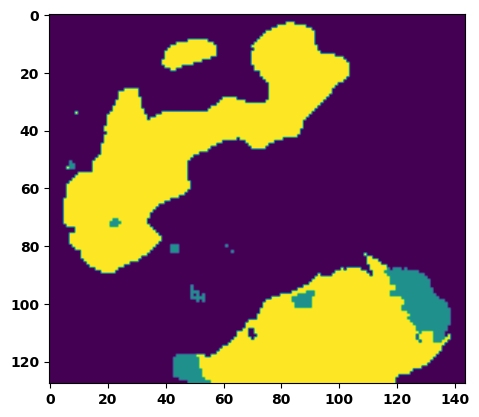

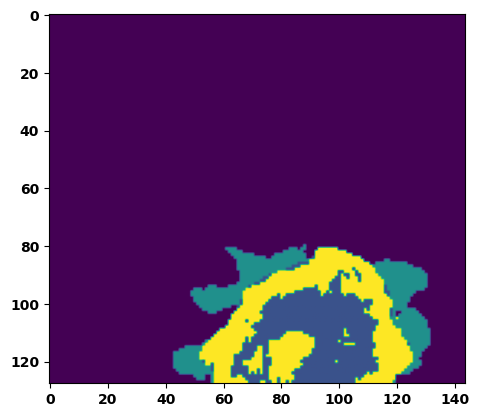

  6%|▌         | 2/36 [00:03<00:52,  1.55s/it]

Batch_id:  1 Eval loss:  0.5036988854408264
Batch_id:  1 Eval IoU:  tensor(0.3773, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.7476, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.6396, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8933, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.7395, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.49s/it]

Batch_id:  2 Eval loss:  0.6109715700149536
Batch_id:  2 Eval IoU:  tensor(0.3416, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9745, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.45s/it]

Batch_id:  3 Eval loss:  0.15662771463394165
Batch_id:  3 Eval IoU:  tensor(0.7555, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9968, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:42,  1.37s/it]

Batch_id:  4 Eval loss:  0.1803123950958252
Batch_id:  4 Eval IoU:  tensor(0.7180, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9935, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:40,  1.36s/it]

Batch_id:  5 Eval loss:  0.8515583276748657
Batch_id:  5 Eval IoU:  tensor(0.0923, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5322, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3937, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.2985, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:38,  1.32s/it]

Batch_id:  6 Eval loss:  0.7517519593238831
Batch_id:  6 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:36,  1.32s/it]

Batch_id:  7 Eval loss:  0.3745460510253906
Batch_id:  7 Eval IoU:  tensor(0.5092, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9923, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:35,  1.32s/it]

Batch_id:  8 Eval loss:  0.2696957588195801
Batch_id:  8 Eval IoU:  tensor(0.6041, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9502, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9584, device='cuda:0')


 28%|██▊       | 10/36 [00:13<00:33,  1.31s/it]

Batch_id:  9 Eval loss:  0.2658396363258362
Batch_id:  9 Eval IoU:  tensor(0.6654, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9765, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  10 Eval loss:  0.8815112113952637
Batch_id:  10 Eval IoU:  tensor(0.0761, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.4985, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4220, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.2478, device='cuda:0')


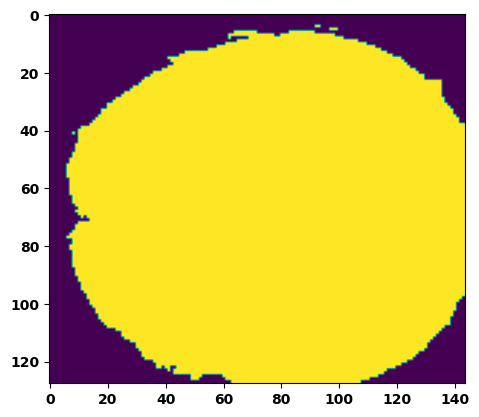

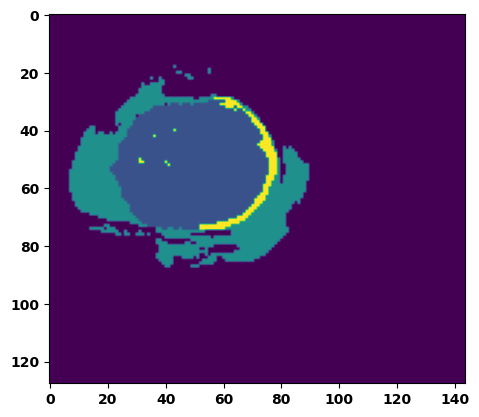

 33%|███▎      | 12/36 [00:16<00:32,  1.35s/it]

Batch_id:  11 Eval loss:  0.851472020149231
Batch_id:  11 Eval IoU:  tensor(0.0944, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.5330, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.4397, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8636, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.3005, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.41s/it]

Batch_id:  12 Eval loss:  0.07240012288093567
Batch_id:  12 Eval IoU:  tensor(0.8708, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9854, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:31,  1.41s/it]

Batch_id:  13 Eval loss:  0.2574405074119568
Batch_id:  13 Eval IoU:  tensor(0.6219, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


 42%|████▏     | 15/36 [00:20<00:30,  1.43s/it]

Batch_id:  14 Eval loss:  0.9025806188583374
Batch_id:  14 Eval IoU:  tensor(0.0575, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.4610, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.3354, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.1916, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:28,  1.44s/it]

Batch_id:  15 Eval loss:  0.7559895515441895
Batch_id:  15 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:27,  1.42s/it]

Batch_id:  16 Eval loss:  0.6719163060188293
Batch_id:  16 Eval IoU:  tensor(0.2130, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.6601, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.5469, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.5075, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9539, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:25,  1.40s/it]

Batch_id:  17 Eval loss:  0.5866187810897827
Batch_id:  17 Eval IoU:  tensor(0.3018, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.6517, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.4969, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.5144, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:23,  1.37s/it]

Batch_id:  18 Eval loss:  0.8950938582420349
Batch_id:  18 Eval IoU:  tensor(0.0591, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4558, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.3042, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.1851, device='cuda:0')


 56%|█████▌    | 20/36 [00:27<00:22,  1.40s/it]

Batch_id:  19 Eval loss:  0.09824569523334503
Batch_id:  19 Eval IoU:  tensor(0.8398, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  20 Eval loss:  0.3367113769054413
Batch_id:  20 Eval IoU:  tensor(0.6034, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9878, device='cuda:0')


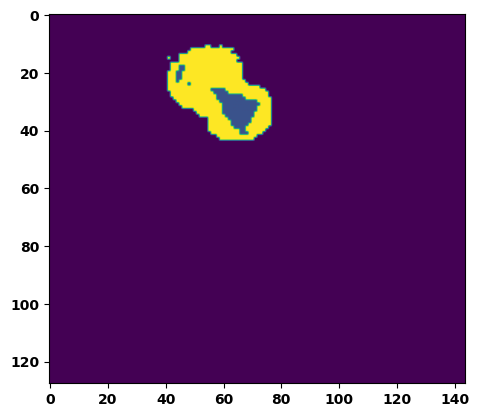

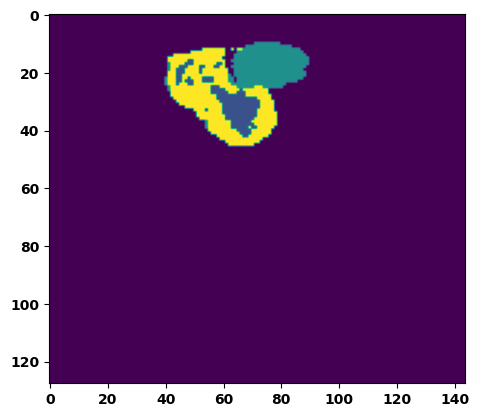

 61%|██████    | 22/36 [00:31<00:20,  1.48s/it]

Batch_id:  21 Eval loss:  0.2848556637763977
Batch_id:  21 Eval IoU:  tensor(0.6122, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9900, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.44s/it]

Batch_id:  22 Eval loss:  0.0855693370103836
Batch_id:  22 Eval IoU:  tensor(0.8534, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')


 67%|██████▋   | 24/36 [00:33<00:16,  1.38s/it]

Batch_id:  23 Eval loss:  0.7682944536209106
Batch_id:  23 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 69%|██████▉   | 25/36 [00:35<00:15,  1.37s/it]

Batch_id:  24 Eval loss:  0.7337911128997803
Batch_id:  24 Eval IoU:  tensor(0.2466, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9420, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9850, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:13,  1.39s/it]

Batch_id:  25 Eval loss:  0.6296959519386292
Batch_id:  25 Eval IoU:  tensor(0.3258, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 75%|███████▌  | 27/36 [00:37<00:12,  1.38s/it]

Batch_id:  26 Eval loss:  0.7037418484687805
Batch_id:  26 Eval IoU:  tensor(0.2671, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9683, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 78%|███████▊  | 28/36 [00:39<00:11,  1.38s/it]

Batch_id:  27 Eval loss:  0.4398100972175598
Batch_id:  27 Eval IoU:  tensor(0.4642, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9515, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 81%|████████  | 29/36 [00:40<00:09,  1.43s/it]

Batch_id:  28 Eval loss:  0.5925012230873108
Batch_id:  28 Eval IoU:  tensor(0.3348, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9378, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9239, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9788, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.39s/it]

Batch_id:  29 Eval loss:  0.7748776078224182
Batch_id:  29 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  30 Eval loss:  0.6805452704429626
Batch_id:  30 Eval IoU:  tensor(0.2620, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8873, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8333, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.8842, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9463, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


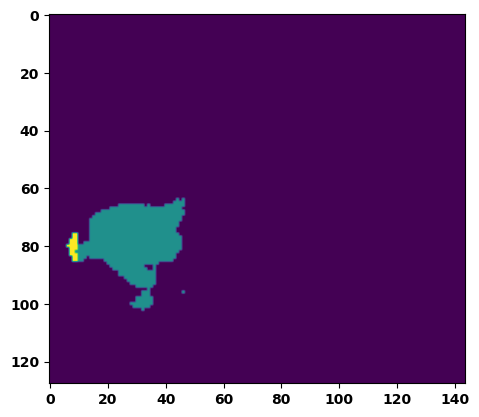

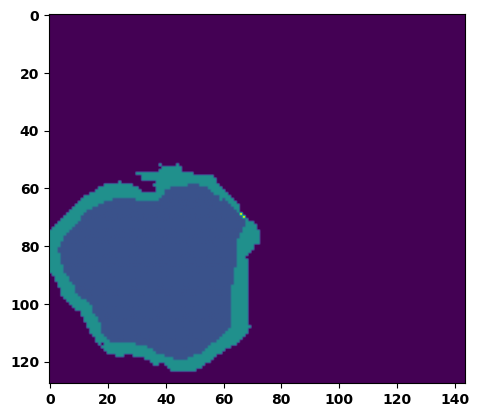

 89%|████████▉ | 32/36 [00:44<00:05,  1.43s/it]

Batch_id:  31 Eval loss:  0.9257243275642395
Batch_id:  31 Eval IoU:  tensor(0.0430, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.4442, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.1872, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9470, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.2207, device='cuda:0')


 92%|█████████▏| 33/36 [00:46<00:04,  1.46s/it]

Batch_id:  32 Eval loss:  0.4974316358566284
Batch_id:  32 Eval IoU:  tensor(0.3774, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6389, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.4751, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.4776, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9831, device='cuda:0')


 94%|█████████▍| 34/36 [00:47<00:02,  1.46s/it]

Batch_id:  33 Eval loss:  0.5953723192214966
Batch_id:  33 Eval IoU:  tensor(0.2977, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.7783, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.6771, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.6731, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9908, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.46s/it]

Batch_id:  34 Eval loss:  0.7578532695770264
Batch_id:  34 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


100%|██████████| 36/36 [00:50<00:00,  1.41s/it]

Batch_id:  35 Eval loss:  0.7367089986801147
Batch_id:  35 Eval IoU:  tensor(0.1706, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.5626, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4377, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9337, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.3555, device='cuda:0')
Epoch  43 Training loss:  0.12753265784545378
Epoch  43 Evaluation loss:  0.5583528040183915
Epoch  43 Training accuracy :  tensor(0.8089)
Epoch  43 Evaluation accuracy :  tensor(0.3741)
Epoch  43 Training Mean Dice Score:  tensor(0.9849)
Epoch  43 Eval Mean Dice Score:  tensor(0.8296)
Epoch  43 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  43 Eval Non-tumor Dice Score:  tensor(0.7772)
Epoch  43 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  43 Eval NCR/NET Dice Score:  tensor(0.9709)
Epoch  43 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 44
Training in session: 


  1%|          | 1/110 [00:01<02:37,  1.44s/it]

Batch_id:  0 Training loss:  0.06104482710361481
Batch_id:  0 Training IoU:  tensor(0.9081, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:43,  1.51s/it]

Batch_id:  1 Training loss:  0.2205059826374054
Batch_id:  1 Training IoU:  tensor(0.6777, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9635, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:58,  1.67s/it]

Batch_id:  2 Training loss:  0.15747380256652832
Batch_id:  2 Training IoU:  tensor(0.7553, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:46,  1.57s/it]

Batch_id:  3 Training loss:  0.1241639107465744
Batch_id:  3 Training IoU:  tensor(0.8211, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:37,  1.50s/it]

Batch_id:  4 Training loss:  0.10436919331550598
Batch_id:  4 Training IoU:  tensor(0.8272, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:33,  1.48s/it]

Batch_id:  5 Training loss:  0.17772379517555237
Batch_id:  5 Training IoU:  tensor(0.7208, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9764, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:27,  1.43s/it]

Batch_id:  6 Training loss:  0.09177123010158539
Batch_id:  6 Training IoU:  tensor(0.8519, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:29,  1.47s/it]

Batch_id:  7 Training loss:  0.19528470933437347
Batch_id:  7 Training IoU:  tensor(0.7813, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:31,  1.50s/it]

Batch_id:  8 Training loss:  0.05772486329078674
Batch_id:  8 Training IoU:  tensor(0.9008, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:31,  1.51s/it]

Batch_id:  9 Training loss:  0.04825451970100403
Batch_id:  9 Training IoU:  tensor(0.9225, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 10%|█         | 11/110 [00:16<02:26,  1.48s/it]

Batch_id:  10 Training loss:  0.16347607970237732
Batch_id:  10 Training IoU:  tensor(0.7942, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 11%|█         | 12/110 [00:17<02:25,  1.48s/it]

Batch_id:  11 Training loss:  0.060833439230918884
Batch_id:  11 Training IoU:  tensor(0.9254, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:22,  1.47s/it]

Batch_id:  12 Training loss:  0.14815844595432281
Batch_id:  12 Training IoU:  tensor(0.7611, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:20,  1.46s/it]

Batch_id:  13 Training loss:  0.15070857107639313
Batch_id:  13 Training IoU:  tensor(0.7543, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:17,  1.45s/it]

Batch_id:  14 Training loss:  0.3548518717288971
Batch_id:  14 Training IoU:  tensor(0.5607, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9674, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:18,  1.48s/it]

Batch_id:  15 Training loss:  0.19195520877838135
Batch_id:  15 Training IoU:  tensor(0.7032, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9566, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:20,  1.51s/it]

Batch_id:  16 Training loss:  0.04352986812591553
Batch_id:  16 Training IoU:  tensor(0.9272, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:21,  1.53s/it]

Batch_id:  17 Training loss:  0.17408262193202972
Batch_id:  17 Training IoU:  tensor(0.7352, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:14,  1.48s/it]

Batch_id:  18 Training loss:  0.21813082695007324
Batch_id:  18 Training IoU:  tensor(0.7046, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9947, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:15,  1.51s/it]

Batch_id:  19 Training loss:  0.05252072215080261
Batch_id:  19 Training IoU:  tensor(0.9083, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:11,  1.48s/it]

Batch_id:  20 Training loss:  0.1694118082523346
Batch_id:  20 Training IoU:  tensor(0.7419, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 20%|██        | 22/110 [00:32<02:08,  1.46s/it]

Batch_id:  21 Training loss:  0.11326448619365692
Batch_id:  21 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 21%|██        | 23/110 [00:34<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.10615667700767517
Batch_id:  22 Training IoU:  tensor(0.9114, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:05,  1.45s/it]

Batch_id:  23 Training loss:  0.1446291208267212
Batch_id:  23 Training IoU:  tensor(0.7847, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:04,  1.46s/it]

Batch_id:  24 Training loss:  0.14793261885643005
Batch_id:  24 Training IoU:  tensor(0.7654, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9906, device='cuda:0')


 24%|██▎       | 26/110 [00:38<01:59,  1.42s/it]

Batch_id:  25 Training loss:  0.12738490104675293
Batch_id:  25 Training IoU:  tensor(0.8019, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 25%|██▍       | 27/110 [00:39<01:56,  1.40s/it]

Batch_id:  26 Training loss:  0.282000333070755
Batch_id:  26 Training IoU:  tensor(0.6331, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:52,  1.38s/it]

Batch_id:  27 Training loss:  0.15279081463813782
Batch_id:  27 Training IoU:  tensor(0.7562, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:51,  1.38s/it]

Batch_id:  28 Training loss:  0.12758967280387878
Batch_id:  28 Training IoU:  tensor(0.7924, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:52,  1.40s/it]

Batch_id:  29 Training loss:  0.10173031687736511
Batch_id:  29 Training IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:55,  1.46s/it]

Batch_id:  30 Training loss:  0.10366769134998322
Batch_id:  30 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:56,  1.49s/it]

Batch_id:  31 Training loss:  0.07435879111289978
Batch_id:  31 Training IoU:  tensor(0.8711, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 30%|███       | 33/110 [00:48<01:56,  1.51s/it]

Batch_id:  32 Training loss:  0.14870139956474304
Batch_id:  32 Training IoU:  tensor(0.7623, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 31%|███       | 34/110 [00:50<01:50,  1.46s/it]

Batch_id:  33 Training loss:  0.1676073521375656
Batch_id:  33 Training IoU:  tensor(0.7545, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:50,  1.48s/it]

Batch_id:  34 Training loss:  0.2192227840423584
Batch_id:  34 Training IoU:  tensor(0.6935, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:48,  1.46s/it]

Batch_id:  35 Training loss:  0.05678345263004303
Batch_id:  35 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:46,  1.46s/it]

Batch_id:  36 Training loss:  0.08596953749656677
Batch_id:  36 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:48,  1.50s/it]

Batch_id:  37 Training loss:  0.06755033135414124
Batch_id:  37 Training IoU:  tensor(0.8873, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:44,  1.47s/it]

Batch_id:  38 Training loss:  0.13305969536304474
Batch_id:  38 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:41,  1.45s/it]

Batch_id:  39 Training loss:  0.214279443025589
Batch_id:  39 Training IoU:  tensor(0.7303, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:45,  1.53s/it]

Batch_id:  40 Training loss:  0.061924248933792114
Batch_id:  40 Training IoU:  tensor(0.8947, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:45,  1.55s/it]

Batch_id:  41 Training loss:  0.09056876599788666
Batch_id:  41 Training IoU:  tensor(0.8469, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:43,  1.55s/it]

Batch_id:  42 Training loss:  0.11563122272491455
Batch_id:  42 Training IoU:  tensor(0.8040, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 40%|████      | 44/110 [01:05<01:40,  1.52s/it]

Batch_id:  43 Training loss:  0.14003631472587585
Batch_id:  43 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 41%|████      | 45/110 [01:06<01:34,  1.46s/it]

Batch_id:  44 Training loss:  0.19310835003852844
Batch_id:  44 Training IoU:  tensor(0.7411, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:34,  1.48s/it]

Batch_id:  45 Training loss:  0.0635538399219513
Batch_id:  45 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:34,  1.50s/it]

Batch_id:  46 Training loss:  0.1299285590648651
Batch_id:  46 Training IoU:  tensor(0.7997, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:34,  1.52s/it]

Batch_id:  47 Training loss:  0.1354495882987976
Batch_id:  47 Training IoU:  tensor(0.7891, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9745, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:32,  1.52s/it]

Batch_id:  48 Training loss:  0.0730186402797699
Batch_id:  48 Training IoU:  tensor(0.8745, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:30,  1.51s/it]

Batch_id:  49 Training loss:  0.2378281056880951
Batch_id:  49 Training IoU:  tensor(0.6952, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:27,  1.49s/it]

Batch_id:  50 Training loss:  0.1022968590259552
Batch_id:  50 Training IoU:  tensor(0.8275, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9880, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:25,  1.48s/it]

Batch_id:  51 Training loss:  0.05569072067737579
Batch_id:  51 Training IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:25,  1.49s/it]

Batch_id:  52 Training loss:  0.05952100455760956
Batch_id:  52 Training IoU:  tensor(0.8976, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:23,  1.49s/it]

Batch_id:  53 Training loss:  0.13119831681251526
Batch_id:  53 Training IoU:  tensor(0.7814, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9713, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:24,  1.53s/it]

Batch_id:  54 Training loss:  0.07242785394191742
Batch_id:  54 Training IoU:  tensor(0.9305, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:21,  1.50s/it]

Batch_id:  55 Training loss:  0.0714641660451889
Batch_id:  55 Training IoU:  tensor(0.8766, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:17,  1.47s/it]

Batch_id:  56 Training loss:  0.10048753023147583
Batch_id:  56 Training IoU:  tensor(0.8373, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:15,  1.46s/it]

Batch_id:  57 Training loss:  0.11502113938331604
Batch_id:  57 Training IoU:  tensor(0.8079, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:12,  1.41s/it]

Batch_id:  58 Training loss:  0.07816113531589508
Batch_id:  58 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:12,  1.46s/it]

Batch_id:  59 Training loss:  0.12617965042591095
Batch_id:  59 Training IoU:  tensor(0.8127, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:15,  1.53s/it]

Batch_id:  60 Training loss:  0.09082849323749542
Batch_id:  60 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 56%|█████▋    | 62/110 [01:32<01:15,  1.57s/it]

Batch_id:  61 Training loss:  0.10933996737003326
Batch_id:  61 Training IoU:  tensor(0.8199, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:16,  1.63s/it]

Batch_id:  62 Training loss:  0.22930890321731567
Batch_id:  62 Training IoU:  tensor(0.6796, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 58%|█████▊    | 64/110 [01:35<01:14,  1.61s/it]

Batch_id:  63 Training loss:  0.21264050900936127
Batch_id:  63 Training IoU:  tensor(0.7208, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 59%|█████▉    | 65/110 [01:37<01:11,  1.59s/it]

Batch_id:  64 Training loss:  0.1065644770860672
Batch_id:  64 Training IoU:  tensor(0.8186, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9855, device='cuda:0')


 60%|██████    | 66/110 [01:38<01:08,  1.56s/it]

Batch_id:  65 Training loss:  0.2370438426733017
Batch_id:  65 Training IoU:  tensor(0.7004, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 61%|██████    | 67/110 [01:39<01:04,  1.50s/it]

Batch_id:  66 Training loss:  0.07586374878883362
Batch_id:  66 Training IoU:  tensor(0.8729, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 62%|██████▏   | 68/110 [01:41<01:05,  1.57s/it]

Batch_id:  67 Training loss:  0.02993108332157135
Batch_id:  67 Training IoU:  tensor(0.9484, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 63%|██████▎   | 69/110 [01:43<01:04,  1.58s/it]

Batch_id:  68 Training loss:  0.052630841732025146
Batch_id:  68 Training IoU:  tensor(0.9103, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 64%|██████▎   | 70/110 [01:44<01:02,  1.55s/it]

Batch_id:  69 Training loss:  0.13872525095939636
Batch_id:  69 Training IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 65%|██████▍   | 71/110 [01:46<01:00,  1.55s/it]

Batch_id:  70 Training loss:  0.24061919748783112
Batch_id:  70 Training IoU:  tensor(0.6739, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 65%|██████▌   | 72/110 [01:47<00:58,  1.54s/it]

Batch_id:  71 Training loss:  0.13593611121177673
Batch_id:  71 Training IoU:  tensor(0.7784, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9630, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 66%|██████▋   | 73/110 [01:49<00:55,  1.51s/it]

Batch_id:  72 Training loss:  0.0888361781835556
Batch_id:  72 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 67%|██████▋   | 74/110 [01:50<00:53,  1.49s/it]

Batch_id:  73 Training loss:  0.08339151740074158
Batch_id:  73 Training IoU:  tensor(0.8560, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 68%|██████▊   | 75/110 [01:52<00:51,  1.48s/it]

Batch_id:  74 Training loss:  0.09520016610622406
Batch_id:  74 Training IoU:  tensor(0.8416, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 69%|██████▉   | 76/110 [01:53<00:50,  1.47s/it]

Batch_id:  75 Training loss:  0.09465090930461884
Batch_id:  75 Training IoU:  tensor(0.8428, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 70%|███████   | 77/110 [01:55<00:49,  1.50s/it]

Batch_id:  76 Training loss:  0.07911625504493713
Batch_id:  76 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 71%|███████   | 78/110 [01:56<00:47,  1.50s/it]

Batch_id:  77 Training loss:  0.09424109756946564
Batch_id:  77 Training IoU:  tensor(0.8418, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 72%|███████▏  | 79/110 [01:58<00:46,  1.51s/it]

Batch_id:  78 Training loss:  0.10551378130912781
Batch_id:  78 Training IoU:  tensor(0.8189, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 73%|███████▎  | 80/110 [01:59<00:45,  1.53s/it]

Batch_id:  79 Training loss:  0.06527189910411835
Batch_id:  79 Training IoU:  tensor(0.8875, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 74%|███████▎  | 81/110 [02:01<00:45,  1.56s/it]

Batch_id:  80 Training loss:  0.07411830127239227
Batch_id:  80 Training IoU:  tensor(0.8895, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 75%|███████▍  | 82/110 [02:02<00:43,  1.56s/it]

Batch_id:  81 Training loss:  0.0844254195690155
Batch_id:  81 Training IoU:  tensor(0.8557, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 75%|███████▌  | 83/110 [02:04<00:41,  1.52s/it]

Batch_id:  82 Training loss:  0.18013451993465424
Batch_id:  82 Training IoU:  tensor(0.7215, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9781, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 76%|███████▋  | 84/110 [02:05<00:38,  1.48s/it]

Batch_id:  83 Training loss:  0.10908392071723938
Batch_id:  83 Training IoU:  tensor(0.8239, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 77%|███████▋  | 85/110 [02:07<00:37,  1.49s/it]

Batch_id:  84 Training loss:  0.08242225646972656
Batch_id:  84 Training IoU:  tensor(0.8589, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 78%|███████▊  | 86/110 [02:08<00:36,  1.51s/it]

Batch_id:  85 Training loss:  0.08245758712291718
Batch_id:  85 Training IoU:  tensor(0.8569, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 79%|███████▉  | 87/110 [02:10<00:34,  1.52s/it]

Batch_id:  86 Training loss:  0.23441995680332184
Batch_id:  86 Training IoU:  tensor(0.7115, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 80%|████████  | 88/110 [02:11<00:33,  1.51s/it]

Batch_id:  87 Training loss:  0.14339761435985565
Batch_id:  87 Training IoU:  tensor(0.7660, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 81%|████████  | 89/110 [02:13<00:31,  1.50s/it]

Batch_id:  88 Training loss:  0.21389994025230408
Batch_id:  88 Training IoU:  tensor(0.6937, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 82%|████████▏ | 90/110 [02:14<00:30,  1.53s/it]

Batch_id:  89 Training loss:  0.15284229815006256
Batch_id:  89 Training IoU:  tensor(0.7588, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 83%|████████▎ | 91/110 [02:16<00:28,  1.51s/it]

Batch_id:  90 Training loss:  0.19973836839199066
Batch_id:  90 Training IoU:  tensor(0.7230, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 84%|████████▎ | 92/110 [02:17<00:27,  1.52s/it]

Batch_id:  91 Training loss:  0.08062492311000824
Batch_id:  91 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9703, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 85%|████████▍ | 93/110 [02:19<00:26,  1.56s/it]

Batch_id:  92 Training loss:  0.09692747890949249
Batch_id:  92 Training IoU:  tensor(0.8347, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 85%|████████▌ | 94/110 [02:21<00:25,  1.58s/it]

Batch_id:  93 Training loss:  0.12556055188179016
Batch_id:  93 Training IoU:  tensor(0.7911, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 86%|████████▋ | 95/110 [02:22<00:23,  1.55s/it]

Batch_id:  94 Training loss:  0.10876068472862244
Batch_id:  94 Training IoU:  tensor(0.8291, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 87%|████████▋ | 96/110 [02:24<00:21,  1.52s/it]

Batch_id:  95 Training loss:  0.10912412405014038
Batch_id:  95 Training IoU:  tensor(0.8229, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 88%|████████▊ | 97/110 [02:25<00:19,  1.53s/it]

Batch_id:  96 Training loss:  0.1406228244304657
Batch_id:  96 Training IoU:  tensor(0.7820, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 89%|████████▉ | 98/110 [02:27<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.09422372281551361
Batch_id:  97 Training IoU:  tensor(0.8369, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 90%|█████████ | 99/110 [02:28<00:16,  1.50s/it]

Batch_id:  98 Training loss:  0.31973206996917725
Batch_id:  98 Training IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 91%|█████████ | 100/110 [02:30<00:14,  1.49s/it]

Batch_id:  99 Training loss:  0.1180838793516159
Batch_id:  99 Training IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 92%|█████████▏| 101/110 [02:31<00:13,  1.45s/it]

Batch_id:  100 Training loss:  0.17799271643161774
Batch_id:  100 Training IoU:  tensor(0.7891, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 93%|█████████▎| 102/110 [02:32<00:11,  1.44s/it]

Batch_id:  101 Training loss:  0.117274209856987
Batch_id:  101 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 94%|█████████▎| 103/110 [02:34<00:10,  1.46s/it]

Batch_id:  102 Training loss:  0.062130317091941833
Batch_id:  102 Training IoU:  tensor(0.8913, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 95%|█████████▍| 104/110 [02:36<00:09,  1.51s/it]

Batch_id:  103 Training loss:  0.052148208022117615
Batch_id:  103 Training IoU:  tensor(0.9091, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 95%|█████████▌| 105/110 [02:37<00:07,  1.47s/it]

Batch_id:  104 Training loss:  0.1334294229745865
Batch_id:  104 Training IoU:  tensor(0.8034, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 96%|█████████▋| 106/110 [02:38<00:05,  1.50s/it]

Batch_id:  105 Training loss:  0.09654755890369415
Batch_id:  105 Training IoU:  tensor(0.8667, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 97%|█████████▋| 107/110 [02:40<00:04,  1.48s/it]

Batch_id:  106 Training loss:  0.13351523876190186
Batch_id:  106 Training IoU:  tensor(0.7848, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9752, device='cuda:0')


 98%|█████████▊| 108/110 [02:42<00:03,  1.55s/it]

Batch_id:  107 Training loss:  0.1134626567363739
Batch_id:  107 Training IoU:  tensor(0.8223, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 99%|█████████▉| 109/110 [02:43<00:01,  1.56s/it]

Batch_id:  108 Training loss:  0.25179049372673035
Batch_id:  108 Training IoU:  tensor(0.6729, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


100%|██████████| 110/110 [02:45<00:00,  1.50s/it]


Batch_id:  109 Training loss:  0.07400469481945038
Batch_id:  109 Training IoU:  tensor(0.8703, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9921, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.11021851003170013
Batch_id:  0 Eval IoU:  tensor(0.8296, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9977, device='cuda:0')


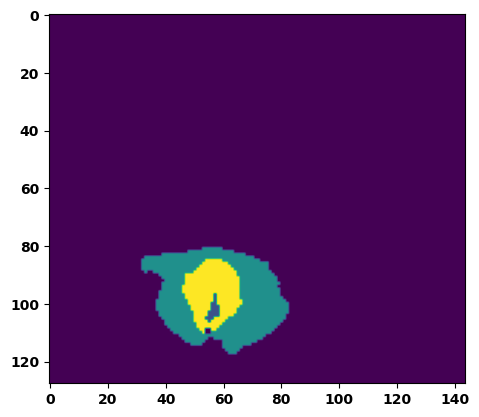

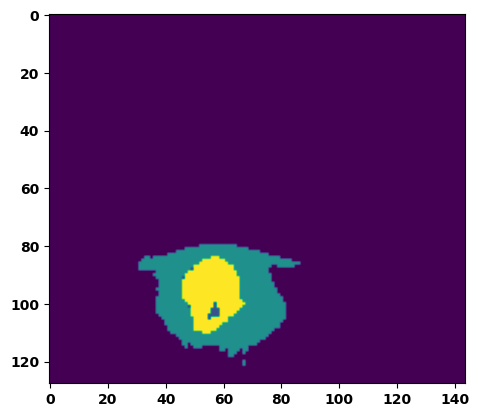

  6%|▌         | 2/36 [00:03<00:52,  1.53s/it]

Batch_id:  1 Eval loss:  0.5226097106933594
Batch_id:  1 Eval IoU:  tensor(0.3837, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9753, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9863, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:47,  1.42s/it]

Batch_id:  2 Eval loss:  0.5253500938415527
Batch_id:  2 Eval IoU:  tensor(0.3753, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.8587, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.7948, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.8385, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.46s/it]

Batch_id:  3 Eval loss:  0.4407837986946106
Batch_id:  3 Eval IoU:  tensor(0.4684, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.7798, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.6726, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.6886, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9964, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.43s/it]

Batch_id:  4 Eval loss:  0.8812264204025269
Batch_id:  4 Eval IoU:  tensor(0.0765, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.4994, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.4232, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.2491, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.42s/it]

Batch_id:  5 Eval loss:  0.7387557029724121
Batch_id:  5 Eval IoU:  tensor(0.2193, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.8724, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.8089, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.8624, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:39,  1.38s/it]

Batch_id:  6 Eval loss:  0.9020274877548218
Batch_id:  6 Eval IoU:  tensor(0.0578, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.4618, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.3365, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.1926, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.38s/it]

Batch_id:  7 Eval loss:  0.11986549198627472
Batch_id:  7 Eval IoU:  tensor(0.7989, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9954, device='cuda:0')


 25%|██▌       | 9/36 [00:12<00:37,  1.39s/it]

Batch_id:  8 Eval loss:  0.5901579260826111
Batch_id:  8 Eval IoU:  tensor(0.3662, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:35,  1.37s/it]

Batch_id:  9 Eval loss:  0.8483021855354309
Batch_id:  9 Eval IoU:  tensor(0.0941, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.5328, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.3943, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.2995, device='cuda:0')
Batch_id:  10 Eval loss:  0.69858717918396
Batch_id:  10 Eval IoU:  tensor(0.2648, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9273, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9284, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9134, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9752, device='cuda:0')


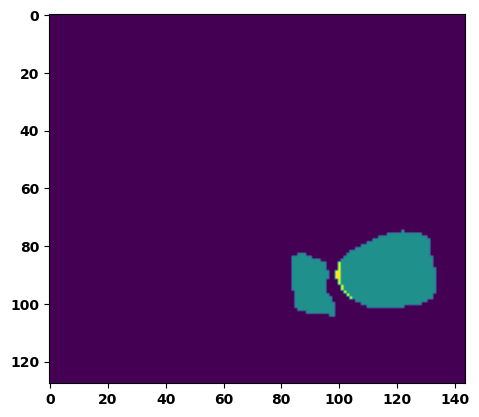

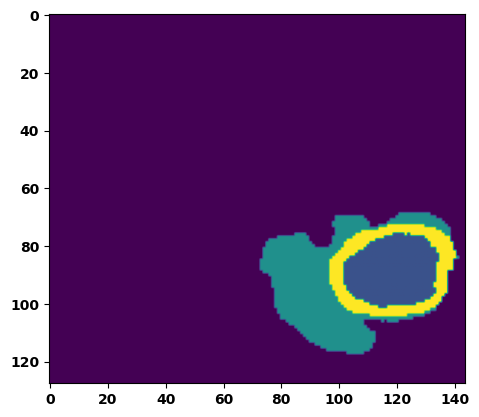

 33%|███▎      | 12/36 [00:17<00:34,  1.44s/it]

Batch_id:  11 Eval loss:  0.42684710025787354
Batch_id:  11 Eval IoU:  tensor(0.4432, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.8854, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.8580, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.8572, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9700, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:33,  1.44s/it]

Batch_id:  12 Eval loss:  0.33004337549209595
Batch_id:  12 Eval IoU:  tensor(0.6141, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 39%|███▉      | 14/36 [00:19<00:31,  1.41s/it]

Batch_id:  13 Eval loss:  0.3294636011123657
Batch_id:  13 Eval IoU:  tensor(0.5579, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9524, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9406, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:28,  1.35s/it]

Batch_id:  14 Eval loss:  0.852813720703125
Batch_id:  14 Eval IoU:  tensor(0.0953, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.5339, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.4410, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8635, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.3072, device='cuda:0')


 44%|████▍     | 16/36 [00:22<00:27,  1.35s/it]

Batch_id:  15 Eval loss:  0.664033055305481
Batch_id:  15 Eval IoU:  tensor(0.2385, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7148, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6548, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9228, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.8856, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.6812, device='cuda:0')


 47%|████▋     | 17/36 [00:23<00:25,  1.36s/it]

Batch_id:  16 Eval loss:  0.28418248891830444
Batch_id:  16 Eval IoU:  tensor(0.5931, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:24,  1.38s/it]

Batch_id:  17 Eval loss:  0.5150388479232788
Batch_id:  17 Eval IoU:  tensor(0.4332, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9692, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9893, device='cuda:0')


 53%|█████▎    | 19/36 [00:26<00:23,  1.39s/it]

Batch_id:  18 Eval loss:  0.6208107471466064
Batch_id:  18 Eval IoU:  tensor(0.3037, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9214, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.8952, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.8891, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9873, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.41s/it]

Batch_id:  19 Eval loss:  0.5004355907440186
Batch_id:  19 Eval IoU:  tensor(0.4247, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8817, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9413, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9369, device='cuda:0')
Batch_id:  20 Eval loss:  0.1310785561800003
Batch_id:  20 Eval IoU:  tensor(0.7951, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9982, device='cuda:0')


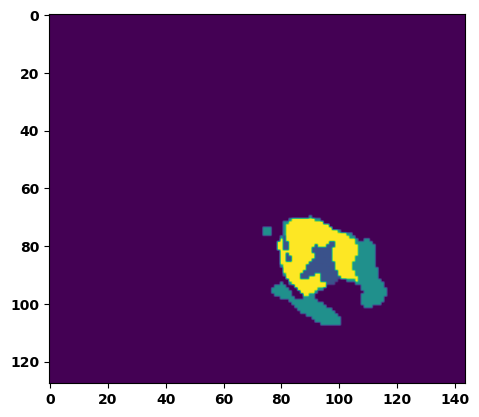

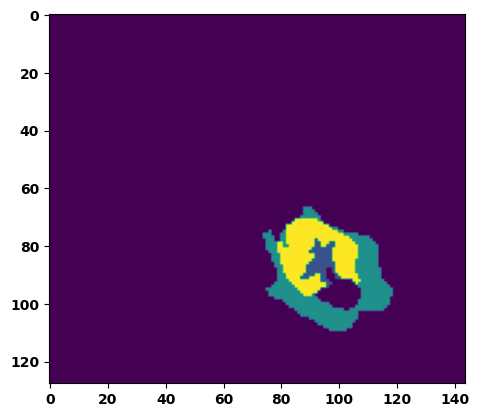

 61%|██████    | 22/36 [00:31<00:19,  1.41s/it]

Batch_id:  21 Eval loss:  0.7559695839881897
Batch_id:  21 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 64%|██████▍   | 23/36 [00:32<00:18,  1.40s/it]

Batch_id:  22 Eval loss:  0.4592859745025635
Batch_id:  22 Eval IoU:  tensor(0.4432, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9333, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9308, device='cuda:0')


 67%|██████▋   | 24/36 [00:33<00:16,  1.38s/it]

Batch_id:  23 Eval loss:  0.6933450698852539
Batch_id:  23 Eval IoU:  tensor(0.2751, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 69%|██████▉   | 25/36 [00:34<00:14,  1.33s/it]

Batch_id:  24 Eval loss:  0.8625794649124146
Batch_id:  24 Eval IoU:  tensor(0.0755, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.4598, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.3056, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9332, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.1927, device='cuda:0')


 72%|███████▏  | 26/36 [00:36<00:13,  1.36s/it]

Batch_id:  25 Eval loss:  0.6395370364189148
Batch_id:  25 Eval IoU:  tensor(0.3181, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 75%|███████▌  | 27/36 [00:37<00:11,  1.32s/it]

Batch_id:  26 Eval loss:  0.8789397478103638
Batch_id:  26 Eval IoU:  tensor(0.0721, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.4931, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.2436, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9252, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.7679, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.5427, device='cuda:0')


 78%|███████▊  | 28/36 [00:38<00:10,  1.34s/it]

Batch_id:  27 Eval loss:  0.7749528884887695
Batch_id:  27 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 81%|████████  | 29/36 [00:40<00:09,  1.37s/it]

Batch_id:  28 Eval loss:  0.757718026638031
Batch_id:  28 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 83%|████████▎ | 30/36 [00:41<00:08,  1.43s/it]

Batch_id:  29 Eval loss:  0.17479000985622406
Batch_id:  29 Eval IoU:  tensor(0.7469, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  30 Eval loss:  0.05579423904418945
Batch_id:  30 Eval IoU:  tensor(0.8991, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')


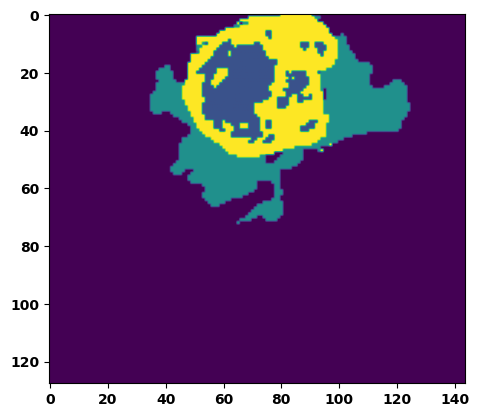

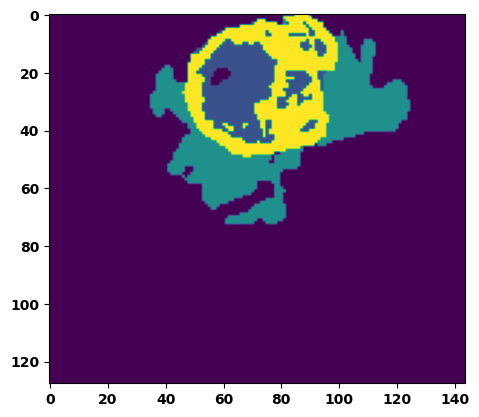

 89%|████████▉ | 32/36 [00:45<00:05,  1.49s/it]

Batch_id:  31 Eval loss:  0.7123395204544067
Batch_id:  31 Eval IoU:  tensor(0.2007, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.7101, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.6298, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.5715, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9478, device='cuda:0')


 92%|█████████▏| 33/36 [00:46<00:04,  1.41s/it]

Batch_id:  32 Eval loss:  0.7683051228523254
Batch_id:  32 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 94%|█████████▍| 34/36 [00:47<00:02,  1.39s/it]

Batch_id:  33 Eval loss:  0.38397347927093506
Batch_id:  33 Eval IoU:  tensor(0.5048, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9627, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9861, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.38s/it]

Batch_id:  34 Eval loss:  0.7517564296722412
Batch_id:  34 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


100%|██████████| 36/36 [00:50<00:00,  1.40s/it]

Batch_id:  35 Eval loss:  0.3807518482208252
Batch_id:  35 Eval IoU:  tensor(0.5128, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9717, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9939, device='cuda:0')
Epoch  44 Training loss:  0.12747910835526205
Epoch  44 Evaluation loss:  0.5578519453605016
Epoch  44 Training accuracy :  tensor(0.8090)
Epoch  44 Evaluation accuracy :  tensor(0.3781)
Epoch  44 Training Mean Dice Score:  tensor(0.9849)
Epoch  44 Eval Mean Dice Score:  tensor(0.8561)
Epoch  44 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  44 Eval Non-tumor Dice Score:  tensor(0.8149)
Epoch  44 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  44 Eval NCR/NET Dice Score:  tensor(0.9720)
Epoch  44 Training ED Dice Score:  tensor(0.98

Epoch: 45
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.52s/it]

Batch_id:  0 Training loss:  0.1264198273420334
Batch_id:  0 Training IoU:  tensor(0.7944, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:29,  1.39s/it]

Batch_id:  1 Training loss:  0.11473788321018219
Batch_id:  1 Training IoU:  tensor(0.8054, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:24,  1.35s/it]

Batch_id:  2 Training loss:  0.09336169064044952
Batch_id:  2 Training IoU:  tensor(0.8448, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:24,  1.36s/it]

Batch_id:  3 Training loss:  0.19281251728534698
Batch_id:  3 Training IoU:  tensor(0.7394, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


  5%|▍         | 5/110 [00:06<02:23,  1.36s/it]

Batch_id:  4 Training loss:  0.04389439523220062
Batch_id:  4 Training IoU:  tensor(0.9263, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:25,  1.40s/it]

Batch_id:  5 Training loss:  0.08732664585113525
Batch_id:  5 Training IoU:  tensor(0.8485, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:34,  1.50s/it]

Batch_id:  6 Training loss:  0.06754586100578308
Batch_id:  6 Training IoU:  tensor(0.8863, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:30,  1.48s/it]

Batch_id:  7 Training loss:  0.1778649389743805
Batch_id:  7 Training IoU:  tensor(0.7884, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


  8%|▊         | 9/110 [00:12<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.06144730746746063
Batch_id:  8 Training IoU:  tensor(0.8952, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:22,  1.42s/it]

Batch_id:  9 Training loss:  0.14987117052078247
Batch_id:  9 Training IoU:  tensor(0.7554, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9665, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 10%|█         | 11/110 [00:15<02:20,  1.42s/it]

Batch_id:  10 Training loss:  0.20009960234165192
Batch_id:  10 Training IoU:  tensor(0.7229, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 11%|█         | 12/110 [00:17<02:21,  1.45s/it]

Batch_id:  11 Training loss:  0.2297399491071701
Batch_id:  11 Training IoU:  tensor(0.6793, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9517, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:13,  1.38s/it]

Batch_id:  12 Training loss:  0.07599003612995148
Batch_id:  12 Training IoU:  tensor(0.8723, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 13%|█▎        | 14/110 [00:19<02:15,  1.41s/it]

Batch_id:  13 Training loss:  0.21915559470653534
Batch_id:  13 Training IoU:  tensor(0.7013, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:15,  1.43s/it]

Batch_id:  14 Training loss:  0.13702407479286194
Batch_id:  14 Training IoU:  tensor(0.7769, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9572, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 15%|█▍        | 16/110 [00:22<02:13,  1.42s/it]

Batch_id:  15 Training loss:  0.31925952434539795
Batch_id:  15 Training IoU:  tensor(0.6310, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:18,  1.49s/it]

Batch_id:  16 Training loss:  0.1055736094713211
Batch_id:  16 Training IoU:  tensor(0.8192, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 16%|█▋        | 18/110 [00:25<02:13,  1.45s/it]

Batch_id:  17 Training loss:  0.07147100567817688
Batch_id:  17 Training IoU:  tensor(0.8767, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 17%|█▋        | 19/110 [00:27<02:08,  1.41s/it]

Batch_id:  18 Training loss:  0.12463314831256866
Batch_id:  18 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 18%|█▊        | 20/110 [00:28<02:10,  1.45s/it]

Batch_id:  19 Training loss:  0.10632762312889099
Batch_id:  19 Training IoU:  tensor(0.9115, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:10,  1.47s/it]

Batch_id:  20 Training loss:  0.04866276681423187
Batch_id:  20 Training IoU:  tensor(0.9215, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 20%|██        | 22/110 [00:31<02:04,  1.42s/it]

Batch_id:  21 Training loss:  0.06487512588500977
Batch_id:  21 Training IoU:  tensor(0.8882, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 21%|██        | 23/110 [00:32<02:07,  1.46s/it]

Batch_id:  22 Training loss:  0.1287141889333725
Batch_id:  22 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 22%|██▏       | 24/110 [00:34<02:15,  1.57s/it]

Batch_id:  23 Training loss:  0.21099810302257538
Batch_id:  23 Training IoU:  tensor(0.7236, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 23%|██▎       | 25/110 [00:36<02:10,  1.54s/it]

Batch_id:  24 Training loss:  0.0811660885810852
Batch_id:  24 Training IoU:  tensor(0.8640, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 24%|██▎       | 26/110 [00:37<02:08,  1.53s/it]

Batch_id:  25 Training loss:  0.22053414583206177
Batch_id:  25 Training IoU:  tensor(0.6777, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9657, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9635, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:02,  1.48s/it]

Batch_id:  26 Training loss:  0.08285227417945862
Batch_id:  26 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9643, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9635, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 25%|██▌       | 28/110 [00:40<02:00,  1.47s/it]

Batch_id:  27 Training loss:  0.05852295458316803
Batch_id:  27 Training IoU:  tensor(0.9002, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:59,  1.47s/it]

Batch_id:  28 Training loss:  0.07853317260742188
Batch_id:  28 Training IoU:  tensor(0.8664, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 27%|██▋       | 30/110 [00:43<01:57,  1.47s/it]

Batch_id:  29 Training loss:  0.0730464905500412
Batch_id:  29 Training IoU:  tensor(0.8745, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:58,  1.50s/it]

Batch_id:  30 Training loss:  0.19513623416423798
Batch_id:  30 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:55,  1.48s/it]

Batch_id:  31 Training loss:  0.10928110778331757
Batch_id:  31 Training IoU:  tensor(0.8199, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 30%|███       | 33/110 [00:48<01:55,  1.50s/it]

Batch_id:  32 Training loss:  0.16264867782592773
Batch_id:  32 Training IoU:  tensor(0.7950, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 31%|███       | 34/110 [00:49<01:51,  1.47s/it]

Batch_id:  33 Training loss:  0.23655888438224792
Batch_id:  33 Training IoU:  tensor(0.6983, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 32%|███▏      | 35/110 [00:50<01:48,  1.45s/it]

Batch_id:  34 Training loss:  0.11192668974399567
Batch_id:  34 Training IoU:  tensor(0.8208, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:49,  1.48s/it]

Batch_id:  35 Training loss:  0.1517699658870697
Batch_id:  35 Training IoU:  tensor(0.7575, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 34%|███▎      | 37/110 [00:53<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.08207662403583527
Batch_id:  36 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:47,  1.49s/it]

Batch_id:  37 Training loss:  0.19162389636039734
Batch_id:  37 Training IoU:  tensor(0.7038, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:47,  1.52s/it]

Batch_id:  38 Training loss:  0.1333412528038025
Batch_id:  38 Training IoU:  tensor(0.8031, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:46,  1.52s/it]

Batch_id:  39 Training loss:  0.10738223791122437
Batch_id:  39 Training IoU:  tensor(0.8308, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:46,  1.55s/it]

Batch_id:  40 Training loss:  0.14217618107795715
Batch_id:  40 Training IoU:  tensor(0.8013, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:43,  1.53s/it]

Batch_id:  41 Training loss:  0.10792858898639679
Batch_id:  41 Training IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:43,  1.54s/it]

Batch_id:  42 Training loss:  0.25177085399627686
Batch_id:  42 Training IoU:  tensor(0.6740, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 40%|████      | 44/110 [01:04<01:38,  1.49s/it]

Batch_id:  43 Training loss:  0.06203392148017883
Batch_id:  43 Training IoU:  tensor(0.8916, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 41%|████      | 45/110 [01:06<01:36,  1.48s/it]

Batch_id:  44 Training loss:  0.08947828412055969
Batch_id:  44 Training IoU:  tensor(0.8483, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:33,  1.46s/it]

Batch_id:  45 Training loss:  0.14858892560005188
Batch_id:  45 Training IoU:  tensor(0.7656, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:34,  1.49s/it]

Batch_id:  46 Training loss:  0.21568496525287628
Batch_id:  46 Training IoU:  tensor(0.7286, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:31,  1.47s/it]

Batch_id:  47 Training loss:  0.14864452183246613
Batch_id:  47 Training IoU:  tensor(0.7617, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:30,  1.49s/it]

Batch_id:  48 Training loss:  0.2358735203742981
Batch_id:  48 Training IoU:  tensor(0.7005, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9560, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:32,  1.53s/it]

Batch_id:  49 Training loss:  0.1035633236169815
Batch_id:  49 Training IoU:  tensor(0.8285, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9803, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:28,  1.50s/it]

Batch_id:  50 Training loss:  0.07812890410423279
Batch_id:  50 Training IoU:  tensor(0.8657, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:27,  1.50s/it]

Batch_id:  51 Training loss:  0.10634914040565491
Batch_id:  51 Training IoU:  tensor(0.8191, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:26,  1.52s/it]

Batch_id:  52 Training loss:  0.0577157586812973
Batch_id:  52 Training IoU:  tensor(0.9012, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:24,  1.51s/it]

Batch_id:  53 Training loss:  0.13241244852542877
Batch_id:  53 Training IoU:  tensor(0.7868, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:24,  1.53s/it]

Batch_id:  54 Training loss:  0.07372643053531647
Batch_id:  54 Training IoU:  tensor(0.8720, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:22,  1.53s/it]

Batch_id:  55 Training loss:  0.10133664309978485
Batch_id:  55 Training IoU:  tensor(0.8437, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:19,  1.49s/it]

Batch_id:  56 Training loss:  0.09028187394142151
Batch_id:  56 Training IoU:  tensor(0.8476, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:17,  1.49s/it]

Batch_id:  57 Training loss:  0.0749744325876236
Batch_id:  57 Training IoU:  tensor(0.8892, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 54%|█████▎    | 59/110 [01:26<01:13,  1.45s/it]

Batch_id:  58 Training loss:  0.13526539504528046
Batch_id:  58 Training IoU:  tensor(0.7893, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:12,  1.46s/it]

Batch_id:  59 Training loss:  0.17884500324726105
Batch_id:  59 Training IoU:  tensor(0.7229, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:11,  1.45s/it]

Batch_id:  60 Training loss:  0.08402056992053986
Batch_id:  60 Training IoU:  tensor(0.8555, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:09,  1.44s/it]

Batch_id:  61 Training loss:  0.2185414731502533
Batch_id:  61 Training IoU:  tensor(0.6904, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:07,  1.45s/it]

Batch_id:  62 Training loss:  0.09281672537326813
Batch_id:  62 Training IoU:  tensor(0.8443, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:06,  1.44s/it]

Batch_id:  63 Training loss:  0.11570864915847778
Batch_id:  63 Training IoU:  tensor(0.8064, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:06,  1.47s/it]

Batch_id:  64 Training loss:  0.12526653707027435
Batch_id:  64 Training IoU:  tensor(0.7917, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:04,  1.47s/it]

Batch_id:  65 Training loss:  0.1770504117012024
Batch_id:  65 Training IoU:  tensor(0.7321, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:03,  1.49s/it]

Batch_id:  66 Training loss:  0.08303456008434296
Batch_id:  66 Training IoU:  tensor(0.8577, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:03,  1.52s/it]

Batch_id:  67 Training loss:  0.2355823963880539
Batch_id:  67 Training IoU:  tensor(0.7102, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<01:02,  1.52s/it]

Batch_id:  68 Training loss:  0.14437700808048248
Batch_id:  68 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<01:00,  1.51s/it]

Batch_id:  69 Training loss:  0.14280706644058228
Batch_id:  69 Training IoU:  tensor(0.7663, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 65%|██████▍   | 71/110 [01:45<01:02,  1.59s/it]

Batch_id:  70 Training loss:  0.13955053687095642
Batch_id:  70 Training IoU:  tensor(0.7828, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:59,  1.57s/it]

Batch_id:  71 Training loss:  0.24204140901565552
Batch_id:  71 Training IoU:  tensor(0.6721, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 66%|██████▋   | 73/110 [01:48<00:57,  1.55s/it]

Batch_id:  72 Training loss:  0.35579514503479004
Batch_id:  72 Training IoU:  tensor(0.5598, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9673, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:54,  1.51s/it]

Batch_id:  73 Training loss:  0.14005374908447266
Batch_id:  73 Training IoU:  tensor(0.7827, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


 68%|██████▊   | 75/110 [01:51<00:52,  1.51s/it]

Batch_id:  74 Training loss:  0.12565255165100098
Batch_id:  74 Training IoU:  tensor(0.8146, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:50,  1.50s/it]

Batch_id:  75 Training loss:  0.06276777386665344
Batch_id:  75 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 70%|███████   | 77/110 [01:54<00:50,  1.53s/it]

Batch_id:  76 Training loss:  0.052869170904159546
Batch_id:  76 Training IoU:  tensor(0.9094, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 71%|███████   | 78/110 [01:55<00:47,  1.47s/it]

Batch_id:  77 Training loss:  0.13226446509361267
Batch_id:  77 Training IoU:  tensor(0.8147, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:45,  1.47s/it]

Batch_id:  78 Training loss:  0.10119493305683136
Batch_id:  78 Training IoU:  tensor(0.8290, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 73%|███████▎  | 80/110 [01:58<00:43,  1.46s/it]

Batch_id:  79 Training loss:  0.12671808898448944
Batch_id:  79 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:41,  1.43s/it]

Batch_id:  80 Training loss:  0.09221780300140381
Batch_id:  80 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 75%|███████▍  | 82/110 [02:01<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.07363779842853546
Batch_id:  81 Training IoU:  tensor(0.8702, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:39,  1.46s/it]

Batch_id:  82 Training loss:  0.10525466501712799
Batch_id:  82 Training IoU:  tensor(0.8255, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 76%|███████▋  | 84/110 [02:04<00:37,  1.45s/it]

Batch_id:  83 Training loss:  0.14895081520080566
Batch_id:  83 Training IoU:  tensor(0.7597, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:37,  1.50s/it]

Batch_id:  84 Training loss:  0.029949411749839783
Batch_id:  84 Training IoU:  tensor(0.9485, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 78%|███████▊  | 86/110 [02:07<00:36,  1.51s/it]

Batch_id:  85 Training loss:  0.16827677190303802
Batch_id:  85 Training IoU:  tensor(0.7552, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:35,  1.55s/it]

Batch_id:  86 Training loss:  0.05534255504608154
Batch_id:  86 Training IoU:  tensor(0.9024, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 80%|████████  | 88/110 [02:10<00:33,  1.54s/it]

Batch_id:  87 Training loss:  0.09444752335548401
Batch_id:  87 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 81%|████████  | 89/110 [02:11<00:32,  1.54s/it]

Batch_id:  88 Training loss:  0.13200850784778595
Batch_id:  88 Training IoU:  tensor(0.7792, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9817, device='cuda:0')


 82%|████████▏ | 90/110 [02:13<00:30,  1.50s/it]

Batch_id:  89 Training loss:  0.06008785963058472
Batch_id:  89 Training IoU:  tensor(0.9276, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 83%|████████▎ | 91/110 [02:15<00:29,  1.54s/it]

Batch_id:  90 Training loss:  0.10039463639259338
Batch_id:  90 Training IoU:  tensor(0.8363, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 84%|████████▎ | 92/110 [02:16<00:27,  1.52s/it]

Batch_id:  91 Training loss:  0.10796581208705902
Batch_id:  91 Training IoU:  tensor(0.8249, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9926, device='cuda:0')


 85%|████████▍ | 93/110 [02:18<00:26,  1.54s/it]

Batch_id:  92 Training loss:  0.1790553629398346
Batch_id:  92 Training IoU:  tensor(0.7199, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 85%|████████▌ | 94/110 [02:19<00:24,  1.53s/it]

Batch_id:  93 Training loss:  0.15761452913284302
Batch_id:  93 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 86%|████████▋ | 95/110 [02:21<00:22,  1.51s/it]

Batch_id:  94 Training loss:  0.16632258892059326
Batch_id:  94 Training IoU:  tensor(0.7451, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 87%|████████▋ | 96/110 [02:22<00:21,  1.56s/it]

Batch_id:  95 Training loss:  0.0707816332578659
Batch_id:  95 Training IoU:  tensor(0.9320, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 88%|████████▊ | 97/110 [02:24<00:20,  1.61s/it]

Batch_id:  96 Training loss:  0.09739010035991669
Batch_id:  96 Training IoU:  tensor(0.8341, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 89%|████████▉ | 98/110 [02:25<00:18,  1.56s/it]

Batch_id:  97 Training loss:  0.09124600887298584
Batch_id:  97 Training IoU:  tensor(0.8423, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9828, device='cuda:0')


 90%|█████████ | 99/110 [02:27<00:17,  1.55s/it]

Batch_id:  98 Training loss:  0.09585607051849365
Batch_id:  98 Training IoU:  tensor(0.8681, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 91%|█████████ | 100/110 [02:28<00:15,  1.52s/it]

Batch_id:  99 Training loss:  0.11697250604629517
Batch_id:  99 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 92%|█████████▏| 101/110 [02:30<00:14,  1.61s/it]

Batch_id:  100 Training loss:  0.15306121110916138
Batch_id:  100 Training IoU:  tensor(0.7585, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9838, device='cuda:0')


 93%|█████████▎| 102/110 [02:32<00:12,  1.60s/it]

Batch_id:  101 Training loss:  0.21257656812667847
Batch_id:  101 Training IoU:  tensor(0.6950, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 94%|█████████▎| 103/110 [02:33<00:11,  1.59s/it]

Batch_id:  102 Training loss:  0.11766412854194641
Batch_id:  102 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 95%|█████████▍| 104/110 [02:35<00:09,  1.57s/it]

Batch_id:  103 Training loss:  0.05258341133594513
Batch_id:  103 Training IoU:  tensor(0.9085, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 95%|█████████▌| 105/110 [02:36<00:07,  1.58s/it]

Batch_id:  104 Training loss:  0.11380775272846222
Batch_id:  104 Training IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 96%|█████████▋| 106/110 [02:38<00:06,  1.57s/it]

Batch_id:  105 Training loss:  0.05217468738555908
Batch_id:  105 Training IoU:  tensor(0.9095, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 97%|█████████▋| 107/110 [02:40<00:04,  1.57s/it]

Batch_id:  106 Training loss:  0.05686342716217041
Batch_id:  106 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 98%|█████████▊| 108/110 [02:41<00:03,  1.58s/it]

Batch_id:  107 Training loss:  0.06513291597366333
Batch_id:  107 Training IoU:  tensor(0.8889, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 99%|█████████▉| 109/110 [02:43<00:01,  1.52s/it]

Batch_id:  108 Training loss:  0.2814940810203552
Batch_id:  108 Training IoU:  tensor(0.6370, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


100%|██████████| 110/110 [02:44<00:00,  1.50s/it]


Batch_id:  109 Training loss:  0.09533725678920746
Batch_id:  109 Training IoU:  tensor(0.8415, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9897, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.8527177572250366
Batch_id:  0 Eval IoU:  tensor(0.0918, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.5320, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.3935, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9484, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.2981, device='cuda:0')


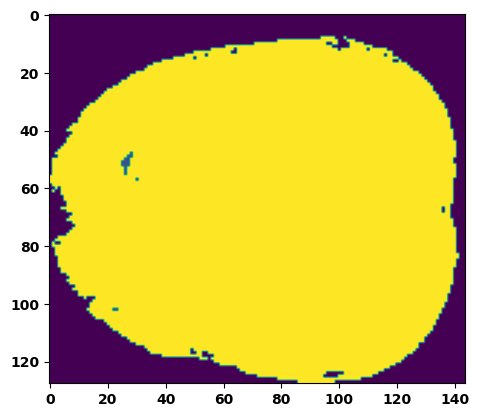

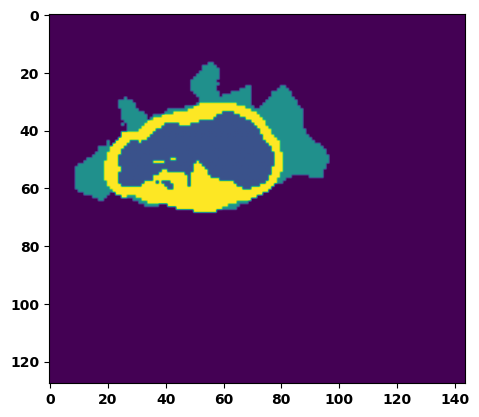

  6%|▌         | 2/36 [00:03<00:52,  1.54s/it]

Batch_id:  1 Eval loss:  0.09708011150360107
Batch_id:  1 Eval IoU:  tensor(0.8343, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9961, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:51,  1.55s/it]

Batch_id:  2 Eval loss:  0.6067138314247131
Batch_id:  2 Eval IoU:  tensor(0.3426, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.52s/it]

Batch_id:  3 Eval loss:  0.7401978969573975
Batch_id:  3 Eval IoU:  tensor(0.1703, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.6458, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.5324, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9598, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.4966, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9485, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:46,  1.51s/it]

Batch_id:  4 Eval loss:  0.9025827050209045
Batch_id:  4 Eval IoU:  tensor(0.0576, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.4612, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.3356, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.1918, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:43,  1.44s/it]

Batch_id:  5 Eval loss:  0.8528206944465637
Batch_id:  5 Eval IoU:  tensor(0.0950, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5334, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.4402, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.8632, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3040, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.42s/it]

Batch_id:  6 Eval loss:  0.22070126235485077
Batch_id:  6 Eval IoU:  tensor(0.6656, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9947, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.41s/it]

Batch_id:  7 Eval loss:  0.751738965511322
Batch_id:  7 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:38,  1.42s/it]

Batch_id:  8 Eval loss:  0.5404033064842224
Batch_id:  8 Eval IoU:  tensor(0.3423, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.6712, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.5215, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.5482, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.46s/it]

Batch_id:  9 Eval loss:  0.318126380443573
Batch_id:  9 Eval IoU:  tensor(0.6304, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  10 Eval loss:  0.4917777180671692
Batch_id:  10 Eval IoU:  tensor(0.4206, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9481, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9380, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9294, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9898, device='cuda:0')


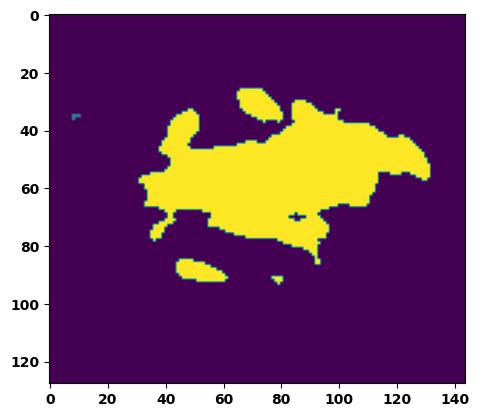

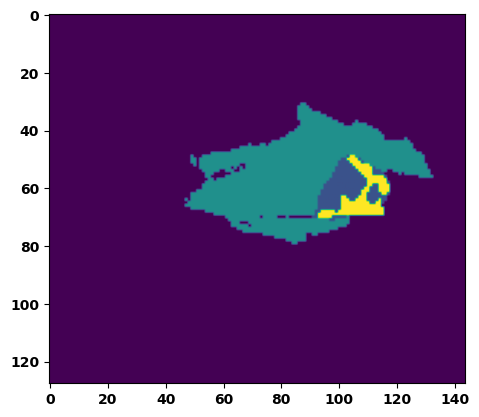

 33%|███▎      | 12/36 [00:17<00:34,  1.45s/it]

Batch_id:  11 Eval loss:  0.09822013974189758
Batch_id:  11 Eval IoU:  tensor(0.8408, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:32,  1.42s/it]

Batch_id:  12 Eval loss:  0.7749761343002319
Batch_id:  12 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:31,  1.43s/it]

Batch_id:  13 Eval loss:  0.7559653520584106
Batch_id:  13 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.39s/it]

Batch_id:  14 Eval loss:  0.6318479776382446
Batch_id:  14 Eval IoU:  tensor(0.3201, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:28,  1.42s/it]

Batch_id:  15 Eval loss:  0.7683017253875732
Batch_id:  15 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:26,  1.39s/it]

Batch_id:  16 Eval loss:  0.8670878410339355
Batch_id:  16 Eval IoU:  tensor(0.0733, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.4589, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3048, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9327, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.1911, device='cuda:0')


 50%|█████     | 18/36 [00:25<00:24,  1.36s/it]

Batch_id:  17 Eval loss:  0.18045352399349213
Batch_id:  17 Eval IoU:  tensor(0.7157, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9934, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:23,  1.39s/it]

Batch_id:  18 Eval loss:  0.061418935656547546
Batch_id:  18 Eval IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9943, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 56%|█████▌    | 20/36 [00:28<00:22,  1.39s/it]

Batch_id:  19 Eval loss:  0.6745457649230957
Batch_id:  19 Eval IoU:  tensor(0.2420, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.5754, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4208, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9573, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9605, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.3874, device='cuda:0')
Batch_id:  20 Eval loss:  0.13647538423538208
Batch_id:  20 Eval IoU:  tensor(0.7831, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9975, device='cuda:0')


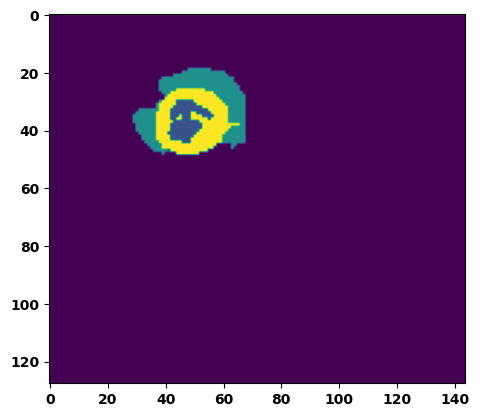

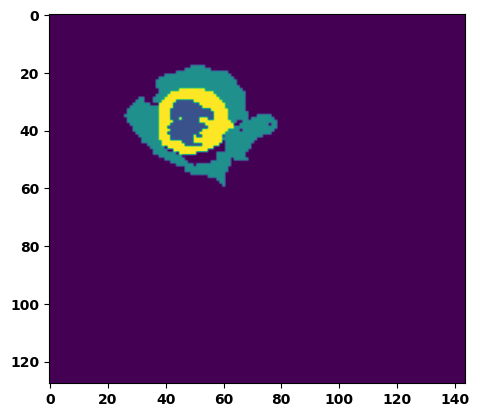

 61%|██████    | 22/36 [00:31<00:20,  1.45s/it]

Batch_id:  21 Eval loss:  0.7572166919708252
Batch_id:  21 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.49s/it]

Batch_id:  22 Eval loss:  0.6241953372955322
Batch_id:  22 Eval IoU:  tensor(0.2592, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.5930, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.4186, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.4750, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9724, device='cuda:0')


 67%|██████▋   | 24/36 [00:34<00:17,  1.45s/it]

Batch_id:  23 Eval loss:  0.5942556262016296
Batch_id:  23 Eval IoU:  tensor(0.3350, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9387, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9479, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9250, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9782, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:15,  1.45s/it]

Batch_id:  24 Eval loss:  0.1460837572813034
Batch_id:  24 Eval IoU:  tensor(0.7788, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9978, device='cuda:0')


 72%|███████▏  | 26/36 [00:37<00:14,  1.46s/it]

Batch_id:  25 Eval loss:  0.6950629949569702
Batch_id:  25 Eval IoU:  tensor(0.2206, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7467, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.6322, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.6460, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9883, device='cuda:0')


 75%|███████▌  | 27/36 [00:38<00:12,  1.42s/it]

Batch_id:  26 Eval loss:  0.344512403011322
Batch_id:  26 Eval IoU:  tensor(0.5357, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9790, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9931, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.38s/it]

Batch_id:  27 Eval loss:  0.28300556540489197
Batch_id:  27 Eval IoU:  tensor(0.6324, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


 81%|████████  | 29/36 [00:41<00:09,  1.35s/it]

Batch_id:  28 Eval loss:  0.9238044023513794
Batch_id:  28 Eval IoU:  tensor(0.0439, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4457, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.1895, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.8746, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.3152, device='cuda:0')


 83%|████████▎ | 30/36 [00:42<00:08,  1.36s/it]

Batch_id:  29 Eval loss:  0.6455191969871521
Batch_id:  29 Eval IoU:  tensor(0.2932, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.8987, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8539, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.8975, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  30 Eval loss:  0.6300032138824463
Batch_id:  30 Eval IoU:  tensor(0.3183, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9750, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


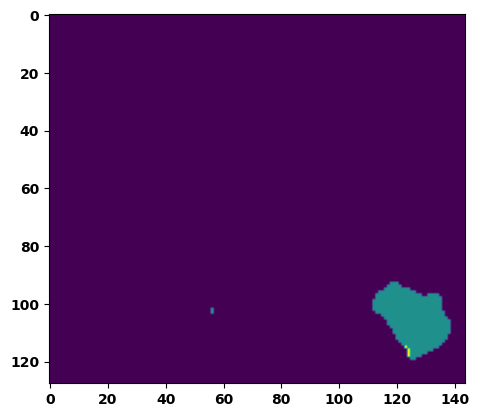

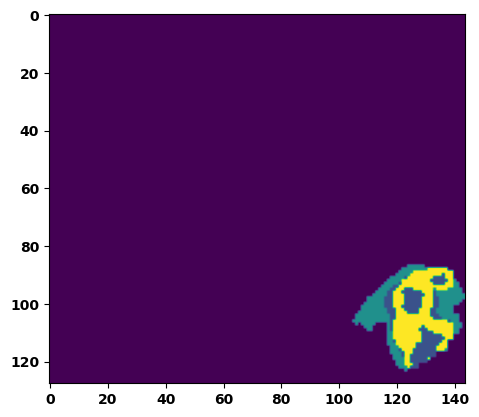

 89%|████████▉ | 32/36 [00:45<00:05,  1.38s/it]

Batch_id:  31 Eval loss:  0.3469315469264984
Batch_id:  31 Eval IoU:  tensor(0.5221, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.9305, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9476, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.9203, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9456, device='cuda:0')


 92%|█████████▏| 33/36 [00:47<00:04,  1.41s/it]

Batch_id:  32 Eval loss:  0.46653759479522705
Batch_id:  32 Eval IoU:  tensor(0.4302, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.7557, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.6377, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.6927, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 94%|█████████▍| 34/36 [00:48<00:02,  1.40s/it]

Batch_id:  33 Eval loss:  0.5581501722335815
Batch_id:  33 Eval IoU:  tensor(0.3373, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.8397, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8186, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9472, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9504, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.8030, device='cuda:0')


 97%|█████████▋| 35/36 [00:49<00:01,  1.37s/it]

Batch_id:  34 Eval loss:  0.8819952607154846
Batch_id:  34 Eval IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.4984, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.4218, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.2477, device='cuda:0')


100%|██████████| 36/36 [00:51<00:00,  1.43s/it]

Batch_id:  35 Eval loss:  0.3838964104652405
Batch_id:  35 Eval IoU:  tensor(0.4913, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9884, device='cuda:0')
Epoch  45 Training loss:  0.12737789113413203
Epoch  45 Evaluation loss:  0.5445923217468791
Epoch  45 Training accuracy :  tensor(0.8091)
Epoch  45 Evaluation accuracy :  tensor(0.3866)
Epoch  45 Training Mean Dice Score:  tensor(0.9849)
Epoch  45 Eval Mean Dice Score:  tensor(0.8291)
Epoch  45 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  45 Eval Non-tumor Dice Score:  tensor(0.7759)
Epoch  45 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  45 Eval NCR/NET Dice Score:  tensor(0.9682)
Epoch  45 Training ED Dice Score:  tensor(0.98

Epoch: 46
Training in session: 


  1%|          | 1/110 [00:01<02:45,  1.52s/it]

Batch_id:  0 Training loss:  0.07439708709716797
Batch_id:  0 Training IoU:  tensor(0.8694, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


  2%|▏         | 2/110 [00:02<02:39,  1.48s/it]

Batch_id:  1 Training loss:  0.11506879329681396
Batch_id:  1 Training IoU:  tensor(0.8077, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:43,  1.53s/it]

Batch_id:  2 Training loss:  0.09395317733287811
Batch_id:  2 Training IoU:  tensor(0.8373, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


  4%|▎         | 4/110 [00:05<02:34,  1.46s/it]

Batch_id:  3 Training loss:  0.1058458536863327
Batch_id:  3 Training IoU:  tensor(0.8183, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9812, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:26,  1.40s/it]

Batch_id:  4 Training loss:  0.09140616655349731
Batch_id:  4 Training IoU:  tensor(0.8419, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


  5%|▌         | 6/110 [00:08<02:27,  1.42s/it]

Batch_id:  5 Training loss:  0.21983769536018372
Batch_id:  5 Training IoU:  tensor(0.6785, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9637, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:27,  1.43s/it]

Batch_id:  6 Training loss:  0.06551869213581085
Batch_id:  6 Training IoU:  tensor(0.8871, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  7%|▋         | 8/110 [00:11<02:24,  1.42s/it]

Batch_id:  7 Training loss:  0.10810039937496185
Batch_id:  7 Training IoU:  tensor(0.8245, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:29,  1.48s/it]

Batch_id:  8 Training loss:  0.24023190140724182
Batch_id:  8 Training IoU:  tensor(0.6749, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:26,  1.47s/it]

Batch_id:  9 Training loss:  0.04862554371356964
Batch_id:  9 Training IoU:  tensor(0.9218, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 10%|█         | 11/110 [00:16<02:24,  1.46s/it]

Batch_id:  10 Training loss:  0.1444021761417389
Batch_id:  10 Training IoU:  tensor(0.7850, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 11%|█         | 12/110 [00:17<02:22,  1.46s/it]

Batch_id:  11 Training loss:  0.14365260303020477
Batch_id:  11 Training IoU:  tensor(0.7652, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 12%|█▏        | 13/110 [00:18<02:20,  1.44s/it]

Batch_id:  12 Training loss:  0.12344896793365479
Batch_id:  12 Training IoU:  tensor(0.8214, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 13%|█▎        | 14/110 [00:20<02:23,  1.50s/it]

Batch_id:  13 Training loss:  0.12506432831287384
Batch_id:  13 Training IoU:  tensor(0.8150, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 14%|█▎        | 15/110 [00:21<02:19,  1.47s/it]

Batch_id:  14 Training loss:  0.1484425961971283
Batch_id:  14 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9795, device='cuda:0')


 15%|█▍        | 16/110 [00:23<02:21,  1.51s/it]

Batch_id:  15 Training loss:  0.07602903246879578
Batch_id:  15 Training IoU:  tensor(0.8726, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 15%|█▌        | 17/110 [00:24<02:19,  1.50s/it]

Batch_id:  16 Training loss:  0.05662506818771362
Batch_id:  16 Training IoU:  tensor(0.9011, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 16%|█▋        | 18/110 [00:26<02:20,  1.53s/it]

Batch_id:  17 Training loss:  0.07480263710021973
Batch_id:  17 Training IoU:  tensor(0.8706, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:16,  1.50s/it]

Batch_id:  18 Training loss:  0.06434544920921326
Batch_id:  18 Training IoU:  tensor(0.8901, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:12,  1.48s/it]

Batch_id:  19 Training loss:  0.14897184073925018
Batch_id:  19 Training IoU:  tensor(0.7649, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 19%|█▉        | 21/110 [00:30<02:13,  1.50s/it]

Batch_id:  20 Training loss:  0.1135551780462265
Batch_id:  20 Training IoU:  tensor(0.8221, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 20%|██        | 22/110 [00:32<02:17,  1.56s/it]

Batch_id:  21 Training loss:  0.07048094272613525
Batch_id:  21 Training IoU:  tensor(0.9324, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 21%|██        | 23/110 [00:34<02:10,  1.49s/it]

Batch_id:  22 Training loss:  0.16713272035121918
Batch_id:  22 Training IoU:  tensor(0.7421, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:09,  1.51s/it]

Batch_id:  23 Training loss:  0.10333018004894257
Batch_id:  23 Training IoU:  tensor(0.8288, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:09,  1.52s/it]

Batch_id:  24 Training loss:  0.10767272114753723
Batch_id:  24 Training IoU:  tensor(0.8257, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:01,  1.45s/it]

Batch_id:  25 Training loss:  0.2351692169904709
Batch_id:  25 Training IoU:  tensor(0.7030, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9702, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9557, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 25%|██▍       | 27/110 [00:39<02:02,  1.47s/it]

Batch_id:  26 Training loss:  0.0783885270357132
Batch_id:  26 Training IoU:  tensor(0.8653, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 25%|██▌       | 28/110 [00:41<02:02,  1.49s/it]

Batch_id:  27 Training loss:  0.10815346240997314
Batch_id:  27 Training IoU:  tensor(0.8217, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 26%|██▋       | 29/110 [00:42<01:56,  1.44s/it]

Batch_id:  28 Training loss:  0.19096730649471283
Batch_id:  28 Training IoU:  tensor(0.7453, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:51,  1.39s/it]

Batch_id:  29 Training loss:  0.13345007598400116
Batch_id:  29 Training IoU:  tensor(0.8021, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 28%|██▊       | 31/110 [00:45<01:50,  1.40s/it]

Batch_id:  30 Training loss:  0.13435254991054535
Batch_id:  30 Training IoU:  tensor(0.7904, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9747, device='cuda:0')


 29%|██▉       | 32/110 [00:46<01:46,  1.36s/it]

Batch_id:  31 Training loss:  0.11741837859153748
Batch_id:  31 Training IoU:  tensor(0.8030, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 30%|███       | 33/110 [00:48<01:49,  1.42s/it]

Batch_id:  32 Training loss:  0.055074527859687805
Batch_id:  32 Training IoU:  tensor(0.9025, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 31%|███       | 34/110 [00:49<01:48,  1.43s/it]

Batch_id:  33 Training loss:  0.1009976714849472
Batch_id:  33 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 32%|███▏      | 35/110 [00:51<01:51,  1.48s/it]

Batch_id:  34 Training loss:  0.03003765642642975
Batch_id:  34 Training IoU:  tensor(0.9482, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 33%|███▎      | 36/110 [00:52<01:48,  1.47s/it]

Batch_id:  35 Training loss:  0.0835983008146286
Batch_id:  35 Training IoU:  tensor(0.8556, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 34%|███▎      | 37/110 [00:54<01:49,  1.50s/it]

Batch_id:  36 Training loss:  0.13848786056041718
Batch_id:  36 Training IoU:  tensor(0.7848, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 35%|███▍      | 38/110 [00:55<01:47,  1.49s/it]

Batch_id:  37 Training loss:  0.15028618276119232
Batch_id:  37 Training IoU:  tensor(0.7596, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 35%|███▌      | 39/110 [00:57<01:45,  1.49s/it]

Batch_id:  38 Training loss:  0.12705011665821075
Batch_id:  38 Training IoU:  tensor(0.8042, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 36%|███▋      | 40/110 [00:58<01:39,  1.43s/it]

Batch_id:  39 Training loss:  0.10516829788684845
Batch_id:  39 Training IoU:  tensor(0.8258, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 37%|███▋      | 41/110 [00:59<01:37,  1.42s/it]

Batch_id:  40 Training loss:  0.09219211339950562
Batch_id:  40 Training IoU:  tensor(0.8506, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9979, device='cuda:0')


 38%|███▊      | 42/110 [01:01<01:37,  1.43s/it]

Batch_id:  41 Training loss:  0.17358160018920898
Batch_id:  41 Training IoU:  tensor(0.7360, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 39%|███▉      | 43/110 [01:02<01:35,  1.43s/it]

Batch_id:  42 Training loss:  0.15268386900424957
Batch_id:  42 Training IoU:  tensor(0.7594, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9649, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9839, device='cuda:0')


 40%|████      | 44/110 [01:04<01:33,  1.42s/it]

Batch_id:  43 Training loss:  0.0932171642780304
Batch_id:  43 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 41%|████      | 45/110 [01:05<01:32,  1.43s/it]

Batch_id:  44 Training loss:  0.1563848853111267
Batch_id:  44 Training IoU:  tensor(0.7563, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 42%|████▏     | 46/110 [01:07<01:30,  1.41s/it]

Batch_id:  45 Training loss:  0.05982217192649841
Batch_id:  45 Training IoU:  tensor(0.9094, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 43%|████▎     | 47/110 [01:08<01:28,  1.41s/it]

Batch_id:  46 Training loss:  0.08989700675010681
Batch_id:  46 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9808, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 44%|████▎     | 48/110 [01:09<01:25,  1.39s/it]

Batch_id:  47 Training loss:  0.06202875077724457
Batch_id:  47 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 45%|████▍     | 49/110 [01:11<01:25,  1.40s/it]

Batch_id:  48 Training loss:  0.1923024207353592
Batch_id:  48 Training IoU:  tensor(0.7025, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 45%|████▌     | 50/110 [01:12<01:23,  1.39s/it]

Batch_id:  49 Training loss:  0.08750665187835693
Batch_id:  49 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 46%|████▋     | 51/110 [01:14<01:22,  1.40s/it]

Batch_id:  50 Training loss:  0.11293257772922516
Batch_id:  50 Training IoU:  tensor(0.8192, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9696, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 47%|████▋     | 52/110 [01:15<01:19,  1.37s/it]

Batch_id:  51 Training loss:  0.13225100934505463
Batch_id:  51 Training IoU:  tensor(0.8157, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 48%|████▊     | 53/110 [01:16<01:20,  1.40s/it]

Batch_id:  52 Training loss:  0.11864876747131348
Batch_id:  52 Training IoU:  tensor(0.8028, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 49%|████▉     | 54/110 [01:18<01:19,  1.42s/it]

Batch_id:  53 Training loss:  0.08176717162132263
Batch_id:  53 Training IoU:  tensor(0.8632, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9738, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 50%|█████     | 55/110 [01:19<01:17,  1.41s/it]

Batch_id:  54 Training loss:  0.1263333261013031
Batch_id:  54 Training IoU:  tensor(0.7946, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 51%|█████     | 56/110 [01:21<01:16,  1.42s/it]

Batch_id:  55 Training loss:  0.175153449177742
Batch_id:  55 Training IoU:  tensor(0.7240, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9810, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 52%|█████▏    | 57/110 [01:22<01:15,  1.43s/it]

Batch_id:  56 Training loss:  0.13333764672279358
Batch_id:  56 Training IoU:  tensor(0.7849, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9753, device='cuda:0')


 53%|█████▎    | 58/110 [01:24<01:16,  1.47s/it]

Batch_id:  57 Training loss:  0.0952836126089096
Batch_id:  57 Training IoU:  tensor(0.8692, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 54%|█████▎    | 59/110 [01:25<01:13,  1.44s/it]

Batch_id:  58 Training loss:  0.07127955555915833
Batch_id:  58 Training IoU:  tensor(0.8768, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 55%|█████▍    | 60/110 [01:26<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.0676019936800003
Batch_id:  59 Training IoU:  tensor(0.8872, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 55%|█████▌    | 61/110 [01:28<01:12,  1.48s/it]

Batch_id:  60 Training loss:  0.08336427807807922
Batch_id:  60 Training IoU:  tensor(0.8572, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 56%|█████▋    | 62/110 [01:29<01:10,  1.46s/it]

Batch_id:  61 Training loss:  0.2333441525697708
Batch_id:  61 Training IoU:  tensor(0.7126, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 57%|█████▋    | 63/110 [01:31<01:08,  1.46s/it]

Batch_id:  62 Training loss:  0.04375585913658142
Batch_id:  62 Training IoU:  tensor(0.9268, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9961, device='cuda:0')


 58%|█████▊    | 64/110 [01:32<01:06,  1.45s/it]

Batch_id:  63 Training loss:  0.09429018199443817
Batch_id:  63 Training IoU:  tensor(0.8432, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 59%|█████▉    | 65/110 [01:34<01:04,  1.44s/it]

Batch_id:  64 Training loss:  0.2769199013710022
Batch_id:  64 Training IoU:  tensor(0.6418, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 60%|██████    | 66/110 [01:35<01:04,  1.47s/it]

Batch_id:  65 Training loss:  0.1993691623210907
Batch_id:  65 Training IoU:  tensor(0.7240, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 61%|██████    | 67/110 [01:37<01:02,  1.45s/it]

Batch_id:  66 Training loss:  0.2175516039133072
Batch_id:  66 Training IoU:  tensor(0.6918, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9771, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 62%|██████▏   | 68/110 [01:38<01:01,  1.47s/it]

Batch_id:  67 Training loss:  0.1057950109243393
Batch_id:  67 Training IoU:  tensor(0.9116, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 63%|██████▎   | 69/110 [01:40<01:00,  1.47s/it]

Batch_id:  68 Training loss:  0.06102675199508667
Batch_id:  68 Training IoU:  tensor(0.8957, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 64%|██████▎   | 70/110 [01:41<00:59,  1.48s/it]

Batch_id:  69 Training loss:  0.21061770617961884
Batch_id:  69 Training IoU:  tensor(0.7246, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 65%|██████▍   | 71/110 [01:43<00:56,  1.46s/it]

Batch_id:  70 Training loss:  0.10700643062591553
Batch_id:  70 Training IoU:  tensor(0.8314, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 65%|██████▌   | 72/110 [01:44<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.3197183609008789
Batch_id:  71 Training IoU:  tensor(0.6305, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 66%|██████▋   | 73/110 [01:45<00:52,  1.42s/it]

Batch_id:  72 Training loss:  0.14891332387924194
Batch_id:  72 Training IoU:  tensor(0.7595, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9822, device='cuda:0')


 67%|██████▋   | 74/110 [01:47<00:50,  1.39s/it]

Batch_id:  73 Training loss:  0.21207356452941895
Batch_id:  73 Training IoU:  tensor(0.6959, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 68%|██████▊   | 75/110 [01:48<00:49,  1.40s/it]

Batch_id:  74 Training loss:  0.05217340588569641
Batch_id:  74 Training IoU:  tensor(0.9092, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 69%|██████▉   | 76/110 [01:49<00:47,  1.39s/it]

Batch_id:  75 Training loss:  0.07376205921173096
Batch_id:  75 Training IoU:  tensor(0.8729, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 70%|███████   | 77/110 [01:51<00:45,  1.39s/it]

Batch_id:  76 Training loss:  0.0834357887506485
Batch_id:  76 Training IoU:  tensor(0.8568, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9628, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 71%|███████   | 78/110 [01:52<00:45,  1.44s/it]

Batch_id:  77 Training loss:  0.10038916766643524
Batch_id:  77 Training IoU:  tensor(0.8368, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 72%|███████▏  | 79/110 [01:54<00:43,  1.41s/it]

Batch_id:  78 Training loss:  0.1791682243347168
Batch_id:  78 Training IoU:  tensor(0.7856, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 73%|███████▎  | 80/110 [01:55<00:42,  1.42s/it]

Batch_id:  79 Training loss:  0.35498911142349243
Batch_id:  79 Training IoU:  tensor(0.5603, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9687, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9763, device='cuda:0')


 74%|███████▎  | 81/110 [01:57<00:41,  1.44s/it]

Batch_id:  80 Training loss:  0.1306542009115219
Batch_id:  80 Training IoU:  tensor(0.7811, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9708, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9824, device='cuda:0')


 75%|███████▍  | 82/110 [01:58<00:42,  1.52s/it]

Batch_id:  81 Training loss:  0.05257582664489746
Batch_id:  81 Training IoU:  tensor(0.9106, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 75%|███████▌  | 83/110 [02:00<00:40,  1.49s/it]

Batch_id:  82 Training loss:  0.052950456738471985
Batch_id:  82 Training IoU:  tensor(0.9076, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 76%|███████▋  | 84/110 [02:01<00:38,  1.47s/it]

Batch_id:  83 Training loss:  0.126731276512146
Batch_id:  83 Training IoU:  tensor(0.8028, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9875, device='cuda:0')


 77%|███████▋  | 85/110 [02:03<00:36,  1.47s/it]

Batch_id:  84 Training loss:  0.07457278668880463
Batch_id:  84 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 78%|███████▊  | 86/110 [02:04<00:34,  1.45s/it]

Batch_id:  85 Training loss:  0.09667089581489563
Batch_id:  85 Training IoU:  tensor(0.8351, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 79%|███████▉  | 87/110 [02:06<00:34,  1.49s/it]

Batch_id:  86 Training loss:  0.05852706730365753
Batch_id:  86 Training IoU:  tensor(0.8998, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9958, device='cuda:0')


 80%|████████  | 88/110 [02:07<00:34,  1.55s/it]

Batch_id:  87 Training loss:  0.05841268599033356
Batch_id:  87 Training IoU:  tensor(0.8996, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 81%|████████  | 89/110 [02:09<00:31,  1.51s/it]

Batch_id:  88 Training loss:  0.22007222473621368
Batch_id:  88 Training IoU:  tensor(0.7008, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 82%|████████▏ | 90/110 [02:10<00:30,  1.53s/it]

Batch_id:  89 Training loss:  0.13703860342502594
Batch_id:  89 Training IoU:  tensor(0.7766, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9571, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9776, device='cuda:0')


 83%|████████▎ | 91/110 [02:12<00:29,  1.53s/it]

Batch_id:  90 Training loss:  0.16710719466209412
Batch_id:  90 Training IoU:  tensor(0.7574, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 84%|████████▎ | 92/110 [02:13<00:27,  1.54s/it]

Batch_id:  91 Training loss:  0.0599682480096817
Batch_id:  91 Training IoU:  tensor(0.9262, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 85%|████████▍ | 93/110 [02:15<00:26,  1.53s/it]

Batch_id:  92 Training loss:  0.1148177832365036
Batch_id:  92 Training IoU:  tensor(0.8053, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9790, device='cuda:0')


 85%|████████▌ | 94/110 [02:16<00:23,  1.50s/it]

Batch_id:  93 Training loss:  0.2516924738883972
Batch_id:  93 Training IoU:  tensor(0.6732, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 86%|████████▋ | 95/110 [02:18<00:22,  1.50s/it]

Batch_id:  94 Training loss:  0.18035778403282166
Batch_id:  94 Training IoU:  tensor(0.7203, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 87%|████████▋ | 96/110 [02:19<00:20,  1.46s/it]

Batch_id:  95 Training loss:  0.07900811731815338
Batch_id:  95 Training IoU:  tensor(0.8647, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 88%|████████▊ | 97/110 [02:21<00:19,  1.49s/it]

Batch_id:  96 Training loss:  0.0820344090461731
Batch_id:  96 Training IoU:  tensor(0.8578, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 89%|████████▉ | 98/110 [02:22<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.23594269156455994
Batch_id:  97 Training IoU:  tensor(0.6966, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 90%|█████████ | 99/110 [02:24<00:16,  1.52s/it]

Batch_id:  98 Training loss:  0.0894729495048523
Batch_id:  98 Training IoU:  tensor(0.8482, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 91%|█████████ | 100/110 [02:26<00:15,  1.54s/it]

Batch_id:  99 Training loss:  0.230838343501091
Batch_id:  99 Training IoU:  tensor(0.6791, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9462, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 92%|█████████▏| 101/110 [02:27<00:13,  1.55s/it]

Batch_id:  100 Training loss:  0.13691110908985138
Batch_id:  100 Training IoU:  tensor(0.7871, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 93%|█████████▎| 102/110 [02:29<00:12,  1.56s/it]

Batch_id:  101 Training loss:  0.1432114988565445
Batch_id:  101 Training IoU:  tensor(0.7998, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 94%|█████████▎| 103/110 [02:30<00:10,  1.50s/it]

Batch_id:  102 Training loss:  0.16346438229084015
Batch_id:  102 Training IoU:  tensor(0.7949, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9794, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 95%|█████████▍| 104/110 [02:32<00:08,  1.50s/it]

Batch_id:  103 Training loss:  0.19656670093536377
Batch_id:  103 Training IoU:  tensor(0.7817, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 95%|█████████▌| 105/110 [02:33<00:07,  1.53s/it]

Batch_id:  104 Training loss:  0.09362170100212097
Batch_id:  104 Training IoU:  tensor(0.8427, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 96%|█████████▋| 106/110 [02:35<00:06,  1.57s/it]

Batch_id:  105 Training loss:  0.10731464624404907
Batch_id:  105 Training IoU:  tensor(0.8168, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9851, device='cuda:0')


 97%|█████████▋| 107/110 [02:36<00:04,  1.53s/it]

Batch_id:  106 Training loss:  0.12541626393795013
Batch_id:  106 Training IoU:  tensor(0.7912, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 98%|█████████▊| 108/110 [02:38<00:03,  1.51s/it]

Batch_id:  107 Training loss:  0.14993982017040253
Batch_id:  107 Training IoU:  tensor(0.7560, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 99%|█████████▉| 109/110 [02:39<00:01,  1.50s/it]

Batch_id:  108 Training loss:  0.21591995656490326
Batch_id:  108 Training IoU:  tensor(0.7284, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9881, device='cuda:0')


100%|██████████| 110/110 [02:41<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.10084645450115204
Batch_id:  109 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9884, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.7187713980674744
Batch_id:  0 Eval IoU:  tensor(0.2558, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9607, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9412, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9710, device='cuda:0')


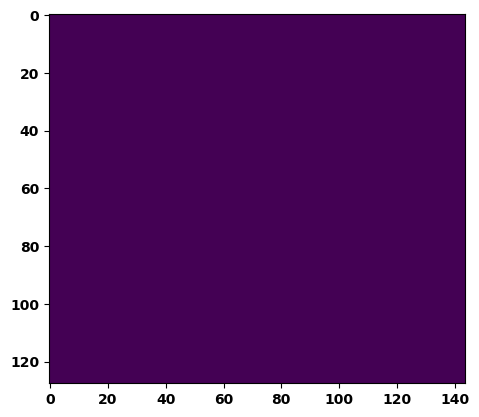

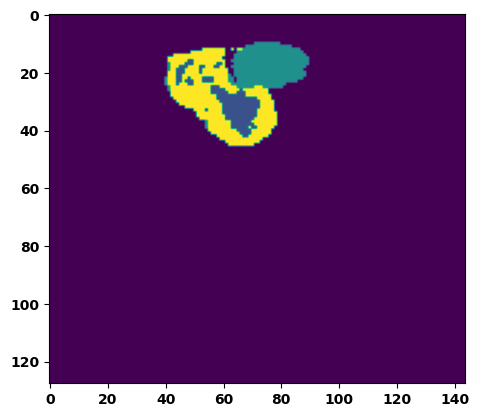

  6%|▌         | 2/36 [00:03<00:52,  1.55s/it]

Batch_id:  1 Eval loss:  0.8814780712127686
Batch_id:  1 Eval IoU:  tensor(0.0760, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.4982, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.4216, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.2474, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:54,  1.65s/it]

Batch_id:  2 Eval loss:  0.623759388923645
Batch_id:  2 Eval IoU:  tensor(0.3106, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9322, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.8989, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9617, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9641, device='cuda:0')


 11%|█         | 4/36 [00:06<00:50,  1.58s/it]

Batch_id:  3 Eval loss:  0.1767541766166687
Batch_id:  3 Eval IoU:  tensor(0.7240, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9718, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9777, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:46,  1.51s/it]

Batch_id:  4 Eval loss:  0.751770555973053
Batch_id:  4 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:44,  1.48s/it]

Batch_id:  5 Eval loss:  0.8090842962265015
Batch_id:  5 Eval IoU:  tensor(0.1158, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.5358, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3943, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9526, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.3048, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:43,  1.50s/it]

Batch_id:  6 Eval loss:  0.5935211181640625
Batch_id:  6 Eval IoU:  tensor(0.3457, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9132, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.8766, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9444, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9735, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9450, device='cuda:0')


 22%|██▏       | 8/36 [00:12<00:42,  1.51s/it]

Batch_id:  7 Eval loss:  0.7561506628990173
Batch_id:  7 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:40,  1.50s/it]

Batch_id:  8 Eval loss:  0.44344577193260193
Batch_id:  8 Eval IoU:  tensor(0.4497, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8187, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.7399, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.7423, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9882, device='cuda:0')


 28%|██▊       | 10/36 [00:15<00:39,  1.50s/it]

Batch_id:  9 Eval loss:  0.6594257354736328
Batch_id:  9 Eval IoU:  tensor(0.2855, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9237, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  10 Eval loss:  0.6958130598068237
Batch_id:  10 Eval IoU:  tensor(0.2093, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.5786, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.4444, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9393, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9227, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.4295, device='cuda:0')


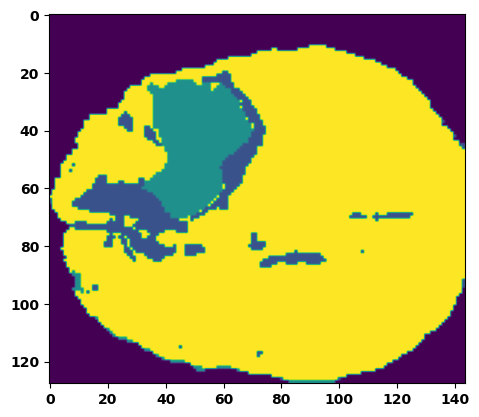

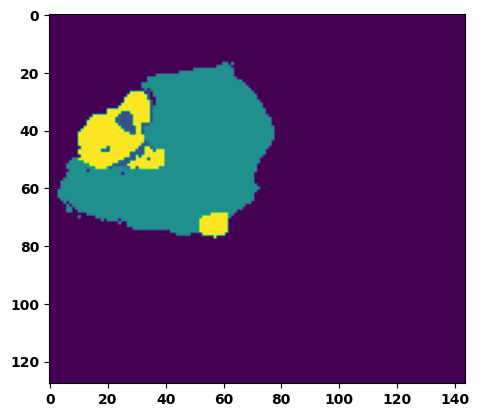

 33%|███▎      | 12/36 [00:18<00:37,  1.54s/it]

Batch_id:  11 Eval loss:  0.09799151122570038
Batch_id:  11 Eval IoU:  tensor(0.8281, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9862, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:34,  1.50s/it]

Batch_id:  12 Eval loss:  0.6041905283927917
Batch_id:  12 Eval IoU:  tensor(0.3459, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9520, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9357, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9459, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 39%|███▉      | 14/36 [00:21<00:32,  1.49s/it]

Batch_id:  13 Eval loss:  0.6536593437194824
Batch_id:  13 Eval IoU:  tensor(0.2993, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9367, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9183, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9234, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:30,  1.47s/it]

Batch_id:  14 Eval loss:  0.5251597166061401
Batch_id:  14 Eval IoU:  tensor(0.3994, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9206, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8998, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9625, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 44%|████▍     | 16/36 [00:24<00:29,  1.50s/it]

Batch_id:  15 Eval loss:  0.7574765682220459
Batch_id:  15 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:28,  1.52s/it]

Batch_id:  16 Eval loss:  0.6251592636108398
Batch_id:  16 Eval IoU:  tensor(0.3092, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.8706, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.8149, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.8946, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9271, device='cuda:0')


 50%|█████     | 18/36 [00:27<00:26,  1.48s/it]

Batch_id:  17 Eval loss:  0.6414781808853149
Batch_id:  17 Eval IoU:  tensor(0.2993, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.8643, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.8654, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9192, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8647, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:24,  1.43s/it]

Batch_id:  18 Eval loss:  0.6219042539596558
Batch_id:  18 Eval IoU:  tensor(0.3143, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9512, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9536, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9652, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9506, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9842, device='cuda:0')


 56%|█████▌    | 20/36 [00:30<00:23,  1.44s/it]

Batch_id:  19 Eval loss:  0.9015214443206787
Batch_id:  19 Eval IoU:  tensor(0.0580, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.4618, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.3365, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.1929, device='cuda:0')
Batch_id:  20 Eval loss:  0.6552567481994629
Batch_id:  20 Eval IoU:  tensor(0.2841, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.8954, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.8466, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


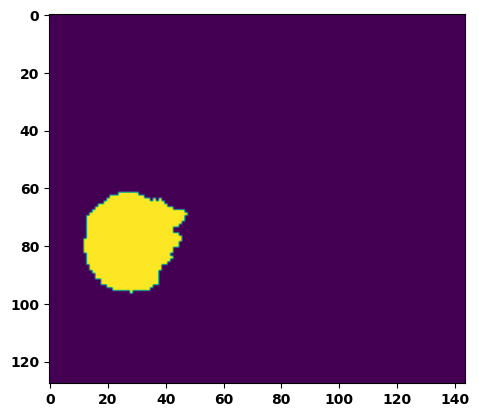

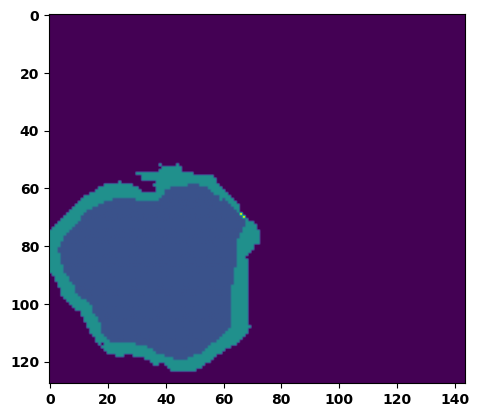

 61%|██████    | 22/36 [00:33<00:20,  1.47s/it]

Batch_id:  21 Eval loss:  0.7749848365783691
Batch_id:  21 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.51s/it]

Batch_id:  22 Eval loss:  0.610406219959259
Batch_id:  22 Eval IoU:  tensor(0.3308, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9744, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 67%|██████▋   | 24/36 [00:36<00:17,  1.47s/it]

Batch_id:  23 Eval loss:  0.7387152910232544
Batch_id:  23 Eval IoU:  tensor(0.2380, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9206, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9092, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9664, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9114, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.6051720380783081
Batch_id:  24 Eval IoU:  tensor(0.3306, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9519, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9670, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9910, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.46s/it]

Batch_id:  25 Eval loss:  0.757866382598877
Batch_id:  25 Eval IoU:  tensor(0.2341, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9364, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9715, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.47s/it]

Batch_id:  26 Eval loss:  0.5144968032836914
Batch_id:  26 Eval IoU:  tensor(0.3969, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9204, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9129, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.8886, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9867, device='cuda:0')


 78%|███████▊  | 28/36 [00:41<00:11,  1.44s/it]

Batch_id:  27 Eval loss:  0.2132275253534317
Batch_id:  27 Eval IoU:  tensor(0.6960, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9958, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:09,  1.39s/it]

Batch_id:  28 Eval loss:  0.6961770057678223
Batch_id:  28 Eval IoU:  tensor(0.2089, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.5134, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3347, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9548, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.8287, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.4220, device='cuda:0')


 83%|████████▎ | 30/36 [00:44<00:08,  1.37s/it]

Batch_id:  29 Eval loss:  0.5264959335327148
Batch_id:  29 Eval IoU:  tensor(0.3892, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9480, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9249, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9330, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  30 Eval loss:  0.22644762694835663
Batch_id:  30 Eval IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9697, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9959, device='cuda:0')


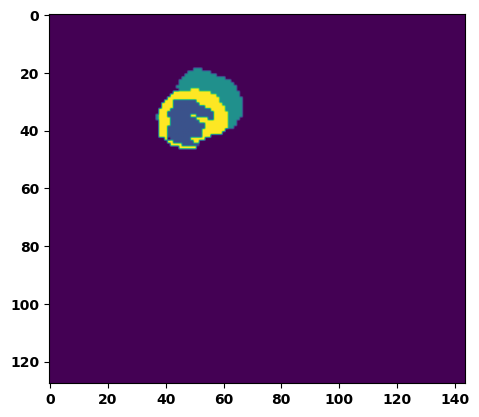

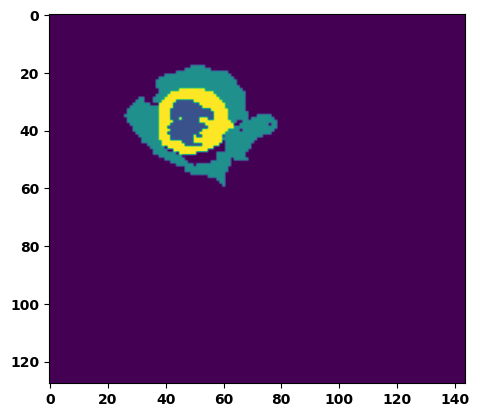

 89%|████████▉ | 32/36 [00:47<00:05,  1.48s/it]

Batch_id:  31 Eval loss:  0.7938801050186157
Batch_id:  31 Eval IoU:  tensor(0.1395, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.6706, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.5097, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.5069, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9952, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.46s/it]

Batch_id:  32 Eval loss:  0.7682873010635376
Batch_id:  32 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 94%|█████████▍| 34/36 [00:50<00:02,  1.47s/it]

Batch_id:  33 Eval loss:  0.36805498600006104
Batch_id:  33 Eval IoU:  tensor(0.5320, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9929, device='cuda:0')


 97%|█████████▋| 35/36 [00:51<00:01,  1.42s/it]

Batch_id:  34 Eval loss:  0.6175399422645569
Batch_id:  34 Eval IoU:  tensor(0.3313, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.48s/it]

Batch_id:  35 Eval loss:  0.757117748260498
Batch_id:  35 Eval IoU:  tensor(0.2341, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9345, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')
Epoch  46 Training loss:  0.12712791115045546
Epoch  46 Evaluation loss:  0.615628931671381
Epoch  46 Training accuracy :  tensor(0.8094)
Epoch  46 Evaluation accuracy :  tensor(0.3277)
Epoch  46 Training Mean Dice Score:  tensor(0.9849)
Epoch  46 Eval Mean Dice Score:  tensor(0.8721)
Epoch  46 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  46 Eval Non-tumor Dice Score:  tensor(0.8344)
Epoch  46 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  46 Eval NCR/NET Dice Score:  tensor(0.9659)
Epoch  46 Training ED Dice Score:  tensor(0.9833

Epoch: 47
Training in session: 


  1%|          | 1/110 [00:01<03:00,  1.66s/it]

Batch_id:  0 Training loss:  0.19574736058712006
Batch_id:  0 Training IoU:  tensor(0.7851, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:52,  1.59s/it]

Batch_id:  1 Training loss:  0.08229506015777588
Batch_id:  1 Training IoU:  tensor(0.8571, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:42,  1.52s/it]

Batch_id:  2 Training loss:  0.16652646660804749
Batch_id:  2 Training IoU:  tensor(0.7440, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:49,  1.60s/it]

Batch_id:  3 Training loss:  0.04337240755558014
Batch_id:  3 Training IoU:  tensor(0.9274, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:42,  1.55s/it]

Batch_id:  4 Training loss:  0.029948309063911438
Batch_id:  4 Training IoU:  tensor(0.9482, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:44,  1.58s/it]

Batch_id:  5 Training loss:  0.2296493798494339
Batch_id:  5 Training IoU:  tensor(0.6793, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:33,  1.49s/it]

Batch_id:  6 Training loss:  0.1049283891916275
Batch_id:  6 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9890, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:32,  1.50s/it]

Batch_id:  7 Training loss:  0.11157038807868958
Batch_id:  7 Training IoU:  tensor(0.8216, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:31,  1.50s/it]

Batch_id:  8 Training loss:  0.06497427821159363
Batch_id:  8 Training IoU:  tensor(0.8882, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:24,  1.45s/it]

Batch_id:  9 Training loss:  0.17423434555530548
Batch_id:  9 Training IoU:  tensor(0.7357, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 10%|█         | 11/110 [00:16<02:28,  1.50s/it]

Batch_id:  10 Training loss:  0.09347987174987793
Batch_id:  10 Training IoU:  tensor(0.8377, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 11%|█         | 12/110 [00:18<02:26,  1.50s/it]

Batch_id:  11 Training loss:  0.056677669286727905
Batch_id:  11 Training IoU:  tensor(0.9017, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:22,  1.47s/it]

Batch_id:  12 Training loss:  0.07853575050830841
Batch_id:  12 Training IoU:  tensor(0.8665, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:20,  1.46s/it]

Batch_id:  13 Training loss:  0.15263359248638153
Batch_id:  13 Training IoU:  tensor(0.7592, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9580, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9720, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9530, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9841, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:20,  1.47s/it]

Batch_id:  14 Training loss:  0.12879854440689087
Batch_id:  14 Training IoU:  tensor(0.8024, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:20,  1.49s/it]

Batch_id:  15 Training loss:  0.057543784379959106
Batch_id:  15 Training IoU:  tensor(0.9013, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:18,  1.49s/it]

Batch_id:  16 Training loss:  0.14396287500858307
Batch_id:  16 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:15,  1.47s/it]

Batch_id:  17 Training loss:  0.10167434811592102
Batch_id:  17 Training IoU:  tensor(0.8282, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:13,  1.47s/it]

Batch_id:  18 Training loss:  0.3544691801071167
Batch_id:  18 Training IoU:  tensor(0.5614, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9689, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 18%|█▊        | 20/110 [00:29<02:09,  1.44s/it]

Batch_id:  19 Training loss:  0.08522301912307739
Batch_id:  19 Training IoU:  tensor(0.8518, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9940, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:11,  1.48s/it]

Batch_id:  20 Training loss:  0.19555658102035522
Batch_id:  20 Training IoU:  tensor(0.7276, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 20%|██        | 22/110 [00:32<02:09,  1.48s/it]

Batch_id:  21 Training loss:  0.08414340019226074
Batch_id:  21 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 21%|██        | 23/110 [00:34<02:11,  1.51s/it]

Batch_id:  22 Training loss:  0.10543476045131683
Batch_id:  22 Training IoU:  tensor(0.9118, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 22%|██▏       | 24/110 [00:35<02:09,  1.50s/it]

Batch_id:  23 Training loss:  0.07303270697593689
Batch_id:  23 Training IoU:  tensor(0.8713, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:04,  1.47s/it]

Batch_id:  24 Training loss:  0.11757361888885498
Batch_id:  24 Training IoU:  tensor(0.8028, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 24%|██▎       | 26/110 [00:38<02:01,  1.44s/it]

Batch_id:  25 Training loss:  0.05565686523914337
Batch_id:  25 Training IoU:  tensor(0.9018, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:03,  1.49s/it]

Batch_id:  26 Training loss:  0.22179363667964935
Batch_id:  26 Training IoU:  tensor(0.6760, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9634, device='cuda:0')


 25%|██▌       | 28/110 [00:41<01:59,  1.45s/it]

Batch_id:  27 Training loss:  0.13289324939250946
Batch_id:  27 Training IoU:  tensor(0.8148, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 26%|██▋       | 29/110 [00:43<01:55,  1.43s/it]

Batch_id:  28 Training loss:  0.1277669221162796
Batch_id:  28 Training IoU:  tensor(0.7923, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 27%|██▋       | 30/110 [00:44<01:57,  1.47s/it]

Batch_id:  29 Training loss:  0.14271804690361023
Batch_id:  29 Training IoU:  tensor(0.7667, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:56,  1.48s/it]

Batch_id:  30 Training loss:  0.06251123547554016
Batch_id:  30 Training IoU:  tensor(0.9047, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 29%|██▉       | 32/110 [00:47<01:53,  1.46s/it]

Batch_id:  31 Training loss:  0.11730323731899261
Batch_id:  31 Training IoU:  tensor(0.8061, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9911, device='cuda:0')


 30%|███       | 33/110 [00:48<01:50,  1.44s/it]

Batch_id:  32 Training loss:  0.2187853753566742
Batch_id:  32 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 31%|███       | 34/110 [00:50<01:50,  1.45s/it]

Batch_id:  33 Training loss:  0.14774362742900848
Batch_id:  33 Training IoU:  tensor(0.7591, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:52,  1.49s/it]

Batch_id:  34 Training loss:  0.09767627716064453
Batch_id:  34 Training IoU:  tensor(0.8642, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 33%|███▎      | 36/110 [00:53<01:51,  1.50s/it]

Batch_id:  35 Training loss:  0.11400693655014038
Batch_id:  35 Training IoU:  tensor(0.8213, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:49,  1.50s/it]

Batch_id:  36 Training loss:  0.09266336262226105
Batch_id:  36 Training IoU:  tensor(0.8445, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 35%|███▍      | 38/110 [00:56<01:47,  1.49s/it]

Batch_id:  37 Training loss:  0.3199615180492401
Batch_id:  37 Training IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:46,  1.50s/it]

Batch_id:  38 Training loss:  0.13610826432704926
Batch_id:  38 Training IoU:  tensor(0.7785, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9651, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9778, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:43,  1.48s/it]

Batch_id:  39 Training loss:  0.14051969349384308
Batch_id:  39 Training IoU:  tensor(0.8041, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 37%|███▋      | 41/110 [01:00<01:39,  1.44s/it]

Batch_id:  40 Training loss:  0.17897899448871613
Batch_id:  40 Training IoU:  tensor(0.7200, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9763, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9888, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:35,  1.40s/it]

Batch_id:  41 Training loss:  0.2131262570619583
Batch_id:  41 Training IoU:  tensor(0.6955, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 39%|███▉      | 43/110 [01:03<01:36,  1.44s/it]

Batch_id:  42 Training loss:  0.1495075672864914
Batch_id:  42 Training IoU:  tensor(0.7590, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9798, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9820, device='cuda:0')


 40%|████      | 44/110 [01:05<01:35,  1.45s/it]

Batch_id:  43 Training loss:  0.2358231097459793
Batch_id:  43 Training IoU:  tensor(0.7006, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 41%|████      | 45/110 [01:06<01:35,  1.47s/it]

Batch_id:  44 Training loss:  0.23435340821743011
Batch_id:  44 Training IoU:  tensor(0.7109, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:33,  1.47s/it]

Batch_id:  45 Training loss:  0.06009194254875183
Batch_id:  45 Training IoU:  tensor(0.9263, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 43%|████▎     | 47/110 [01:09<01:32,  1.47s/it]

Batch_id:  46 Training loss:  0.2808411121368408
Batch_id:  46 Training IoU:  tensor(0.6343, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 44%|████▎     | 48/110 [01:10<01:29,  1.45s/it]

Batch_id:  47 Training loss:  0.07121115922927856
Batch_id:  47 Training IoU:  tensor(0.8770, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:26,  1.41s/it]

Batch_id:  48 Training loss:  0.0811639279127121
Batch_id:  48 Training IoU:  tensor(0.8640, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 45%|████▌     | 50/110 [01:13<01:25,  1.43s/it]

Batch_id:  49 Training loss:  0.15091145038604736
Batch_id:  49 Training IoU:  tensor(0.7587, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:25,  1.45s/it]

Batch_id:  50 Training loss:  0.1085798591375351
Batch_id:  50 Training IoU:  tensor(0.8207, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 47%|████▋     | 52/110 [01:16<01:21,  1.41s/it]

Batch_id:  51 Training loss:  0.06220342218875885
Batch_id:  51 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 48%|████▊     | 53/110 [01:18<01:21,  1.42s/it]

Batch_id:  52 Training loss:  0.12964794039726257
Batch_id:  52 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9755, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9712, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 49%|████▉     | 54/110 [01:19<01:22,  1.48s/it]

Batch_id:  53 Training loss:  0.1247328519821167
Batch_id:  53 Training IoU:  tensor(0.7925, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9893, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:23,  1.51s/it]

Batch_id:  54 Training loss:  0.07391425967216492
Batch_id:  54 Training IoU:  tensor(0.8716, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 51%|█████     | 56/110 [01:22<01:21,  1.51s/it]

Batch_id:  55 Training loss:  0.048733100295066833
Batch_id:  55 Training IoU:  tensor(0.9215, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:19,  1.50s/it]

Batch_id:  56 Training loss:  0.10072354972362518
Batch_id:  56 Training IoU:  tensor(0.8450, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 53%|█████▎    | 58/110 [01:25<01:19,  1.54s/it]

Batch_id:  57 Training loss:  0.10053646564483643
Batch_id:  57 Training IoU:  tensor(0.8364, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:15,  1.47s/it]

Batch_id:  58 Training loss:  0.13278385996818542
Batch_id:  58 Training IoU:  tensor(0.7866, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9754, device='cuda:0')


 55%|█████▍    | 60/110 [01:28<01:11,  1.43s/it]

Batch_id:  59 Training loss:  0.19105887413024902
Batch_id:  59 Training IoU:  tensor(0.7436, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 55%|█████▌    | 61/110 [01:29<01:09,  1.42s/it]

Batch_id:  60 Training loss:  0.1618855595588684
Batch_id:  60 Training IoU:  tensor(0.7989, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:11,  1.49s/it]

Batch_id:  61 Training loss:  0.1486830711364746
Batch_id:  61 Training IoU:  tensor(0.7616, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9794, device='cuda:0')


 57%|█████▋    | 63/110 [01:32<01:08,  1.46s/it]

Batch_id:  62 Training loss:  0.13918280601501465
Batch_id:  62 Training IoU:  tensor(0.7833, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:07,  1.48s/it]

Batch_id:  63 Training loss:  0.10317310690879822
Batch_id:  63 Training IoU:  tensor(0.8299, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 59%|█████▉    | 65/110 [01:35<01:06,  1.49s/it]

Batch_id:  64 Training loss:  0.1252989023923874
Batch_id:  64 Training IoU:  tensor(0.8135, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:05,  1.50s/it]

Batch_id:  65 Training loss:  0.24042360484600067
Batch_id:  65 Training IoU:  tensor(0.6725, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9976, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:04,  1.50s/it]

Batch_id:  66 Training loss:  0.07470886409282684
Batch_id:  66 Training IoU:  tensor(0.8896, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9937, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:02,  1.48s/it]

Batch_id:  67 Training loss:  0.21128791570663452
Batch_id:  67 Training IoU:  tensor(0.7227, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<00:58,  1.43s/it]

Batch_id:  68 Training loss:  0.09373581409454346
Batch_id:  68 Training IoU:  tensor(0.8439, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:57,  1.43s/it]

Batch_id:  69 Training loss:  0.07601682841777802
Batch_id:  69 Training IoU:  tensor(0.8722, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:56,  1.45s/it]

Batch_id:  70 Training loss:  0.09029406309127808
Batch_id:  70 Training IoU:  tensor(0.8478, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:56,  1.48s/it]

Batch_id:  71 Training loss:  0.07149453461170197
Batch_id:  71 Training IoU:  tensor(0.9316, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:53,  1.45s/it]

Batch_id:  72 Training loss:  0.10535113513469696
Batch_id:  72 Training IoU:  tensor(0.8253, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9773, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


 67%|██████▋   | 74/110 [01:48<00:51,  1.42s/it]

Batch_id:  73 Training loss:  0.07804621756076813
Batch_id:  73 Training IoU:  tensor(0.8665, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:50,  1.44s/it]

Batch_id:  74 Training loss:  0.180634006857872
Batch_id:  74 Training IoU:  tensor(0.7210, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 69%|██████▉   | 76/110 [01:51<00:48,  1.42s/it]

Batch_id:  75 Training loss:  0.08973976969718933
Batch_id:  75 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:46,  1.42s/it]

Batch_id:  76 Training loss:  0.09486056864261627
Batch_id:  76 Training IoU:  tensor(0.8424, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9898, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:45,  1.43s/it]

Batch_id:  77 Training loss:  0.06353774666786194
Batch_id:  77 Training IoU:  tensor(0.8915, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:44,  1.42s/it]

Batch_id:  78 Training loss:  0.05882585048675537
Batch_id:  78 Training IoU:  tensor(0.8998, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:43,  1.45s/it]

Batch_id:  79 Training loss:  0.09644708037376404
Batch_id:  79 Training IoU:  tensor(0.8354, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:42,  1.45s/it]

Batch_id:  80 Training loss:  0.16651369631290436
Batch_id:  80 Training IoU:  tensor(0.7582, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:39,  1.40s/it]

Batch_id:  81 Training loss:  0.12410013377666473
Batch_id:  81 Training IoU:  tensor(0.8194, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 75%|███████▌  | 83/110 [02:01<00:39,  1.47s/it]

Batch_id:  82 Training loss:  0.13886842131614685
Batch_id:  82 Training IoU:  tensor(0.7838, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:37,  1.45s/it]

Batch_id:  83 Training loss:  0.17755243182182312
Batch_id:  83 Training IoU:  tensor(0.7885, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 77%|███████▋  | 85/110 [02:04<00:36,  1.45s/it]

Batch_id:  84 Training loss:  0.05291047692298889
Batch_id:  84 Training IoU:  tensor(0.9076, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:34,  1.44s/it]

Batch_id:  85 Training loss:  0.11500579118728638
Batch_id:  85 Training IoU:  tensor(0.8051, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9789, device='cuda:0')


 79%|███████▉  | 87/110 [02:07<00:33,  1.45s/it]

Batch_id:  86 Training loss:  0.2358817458152771
Batch_id:  86 Training IoU:  tensor(0.6979, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:31,  1.42s/it]

Batch_id:  87 Training loss:  0.1073555052280426
Batch_id:  87 Training IoU:  tensor(0.8319, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:30,  1.45s/it]

Batch_id:  88 Training loss:  0.108249232172966
Batch_id:  88 Training IoU:  tensor(0.8239, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:29,  1.47s/it]

Batch_id:  89 Training loss:  0.0675269216299057
Batch_id:  89 Training IoU:  tensor(0.8867, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9896, device='cuda:0')


 83%|████████▎ | 91/110 [02:13<00:28,  1.48s/it]

Batch_id:  90 Training loss:  0.10770401358604431
Batch_id:  90 Training IoU:  tensor(0.8263, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 84%|████████▎ | 92/110 [02:15<00:26,  1.47s/it]

Batch_id:  91 Training loss:  0.08276928961277008
Batch_id:  91 Training IoU:  tensor(0.8579, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9725, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9642, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9634, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 85%|████████▍ | 93/110 [02:16<00:26,  1.53s/it]

Batch_id:  92 Training loss:  0.05201910436153412
Batch_id:  92 Training IoU:  tensor(0.9094, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:24,  1.55s/it]

Batch_id:  93 Training loss:  0.05203026533126831
Batch_id:  93 Training IoU:  tensor(0.9108, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 86%|████████▋ | 95/110 [02:19<00:22,  1.53s/it]

Batch_id:  94 Training loss:  0.1575753092765808
Batch_id:  94 Training IoU:  tensor(0.7560, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:21,  1.50s/it]

Batch_id:  95 Training loss:  0.21625341475009918
Batch_id:  95 Training IoU:  tensor(0.7269, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9587, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9879, device='cuda:0')


 88%|████████▊ | 97/110 [02:22<00:20,  1.56s/it]

Batch_id:  96 Training loss:  0.12650085985660553
Batch_id:  96 Training IoU:  tensor(0.8030, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9877, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:18,  1.52s/it]

Batch_id:  97 Training loss:  0.11524626612663269
Batch_id:  97 Training IoU:  tensor(0.8069, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.54s/it]

Batch_id:  98 Training loss:  0.2501719295978546
Batch_id:  98 Training IoU:  tensor(0.6747, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:15,  1.53s/it]

Batch_id:  99 Training loss:  0.06142881512641907
Batch_id:  99 Training IoU:  tensor(0.8944, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.55s/it]

Batch_id:  100 Training loss:  0.09132219851016998
Batch_id:  100 Training IoU:  tensor(0.8424, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:12,  1.54s/it]

Batch_id:  101 Training loss:  0.21814726293087006
Batch_id:  101 Training IoU:  tensor(0.6901, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.53s/it]

Batch_id:  102 Training loss:  0.13406221568584442
Batch_id:  102 Training IoU:  tensor(0.8021, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:09,  1.52s/it]

Batch_id:  103 Training loss:  0.08328971266746521
Batch_id:  103 Training IoU:  tensor(0.8561, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 95%|█████████▌| 105/110 [02:34<00:07,  1.50s/it]

Batch_id:  104 Training loss:  0.1337372213602066
Batch_id:  104 Training IoU:  tensor(0.7919, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9750, device='cuda:0')


 96%|█████████▋| 106/110 [02:36<00:05,  1.47s/it]

Batch_id:  105 Training loss:  0.0730629563331604
Batch_id:  105 Training IoU:  tensor(0.8743, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 97%|█████████▋| 107/110 [02:37<00:04,  1.41s/it]

Batch_id:  106 Training loss:  0.1487860381603241
Batch_id:  106 Training IoU:  tensor(0.7646, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9905, device='cuda:0')


 98%|█████████▊| 108/110 [02:39<00:02,  1.44s/it]

Batch_id:  107 Training loss:  0.09134744107723236
Batch_id:  107 Training IoU:  tensor(0.8523, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 99%|█████████▉| 109/110 [02:40<00:01,  1.49s/it]

Batch_id:  108 Training loss:  0.1919398158788681
Batch_id:  108 Training IoU:  tensor(0.7030, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


100%|██████████| 110/110 [02:42<00:00,  1.47s/it]


Batch_id:  109 Training loss:  0.10711213946342468
Batch_id:  109 Training IoU:  tensor(0.8175, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9852, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.5143609642982483
Batch_id:  0 Eval IoU:  tensor(0.3910, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9808, device='cuda:0')


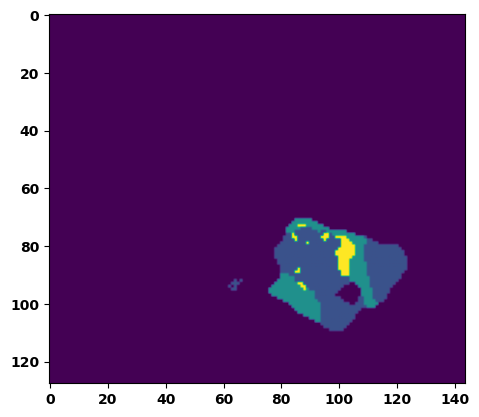

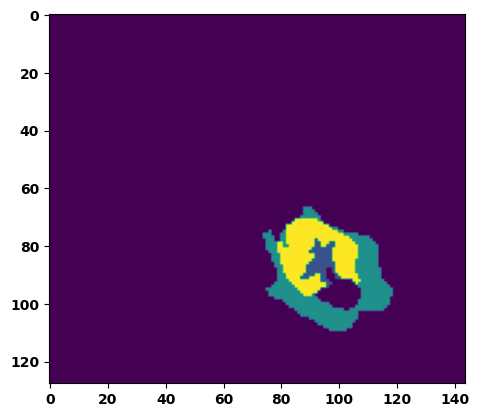

  6%|▌         | 2/36 [00:03<00:52,  1.55s/it]

Batch_id:  1 Eval loss:  0.7562493085861206
Batch_id:  1 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.50s/it]

Batch_id:  2 Eval loss:  0.18919725716114044
Batch_id:  2 Eval IoU:  tensor(0.7061, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9752, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9798, device='cuda:0')


 11%|█         | 4/36 [00:05<00:45,  1.43s/it]

Batch_id:  3 Eval loss:  0.6505107879638672
Batch_id:  3 Eval IoU:  tensor(0.3049, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9677, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9547, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9736, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:45,  1.46s/it]

Batch_id:  4 Eval loss:  0.6944079399108887
Batch_id:  4 Eval IoU:  tensor(0.2495, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.8831, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8284, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.8750, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:42,  1.41s/it]

Batch_id:  5 Eval loss:  0.7072110772132874
Batch_id:  5 Eval IoU:  tensor(0.2616, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9268, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9389, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9124, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.44s/it]

Batch_id:  6 Eval loss:  0.6255006790161133
Batch_id:  6 Eval IoU:  tensor(0.2621, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.7463, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.6538, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.6525, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9657, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:40,  1.43s/it]

Batch_id:  7 Eval loss:  0.5599683523178101
Batch_id:  7 Eval IoU:  tensor(0.3637, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9620, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.9497, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9894, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.47s/it]

Batch_id:  8 Eval loss:  0.623695433139801
Batch_id:  8 Eval IoU:  tensor(0.2865, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.7959, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.7958, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9104, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.6975, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9841, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.43s/it]

Batch_id:  9 Eval loss:  0.8814420700073242
Batch_id:  9 Eval IoU:  tensor(0.0757, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.4977, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.4207, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9213, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.2467, device='cuda:0')
Batch_id:  10 Eval loss:  0.5916860103607178
Batch_id:  10 Eval IoU:  tensor(0.3607, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9509, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


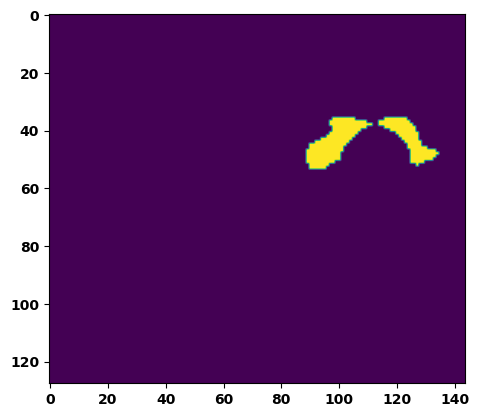

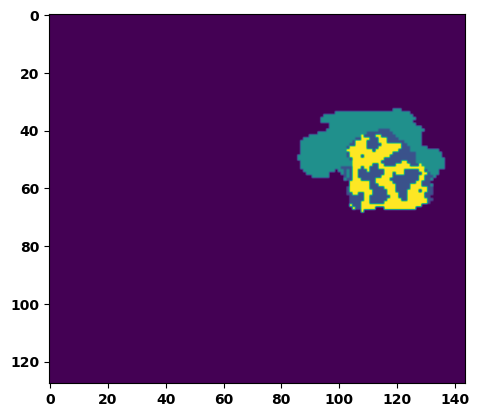

 33%|███▎      | 12/36 [00:17<00:34,  1.44s/it]

Batch_id:  11 Eval loss:  0.7517517805099487
Batch_id:  11 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 36%|███▌      | 13/36 [00:18<00:32,  1.42s/it]

Batch_id:  12 Eval loss:  0.7756389379501343
Batch_id:  12 Eval IoU:  tensor(0.1532, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.6428, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.5332, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.8524, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.5992, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:30,  1.39s/it]

Batch_id:  13 Eval loss:  0.7748552560806274
Batch_id:  13 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 42%|████▏     | 15/36 [00:21<00:29,  1.42s/it]

Batch_id:  14 Eval loss:  0.32885903120040894
Batch_id:  14 Eval IoU:  tensor(0.5440, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9721, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9907, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:29,  1.46s/it]

Batch_id:  15 Eval loss:  0.7072807550430298
Batch_id:  15 Eval IoU:  tensor(0.2301, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.7617, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.6692, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.6463, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 47%|████▋     | 17/36 [00:24<00:27,  1.46s/it]

Batch_id:  16 Eval loss:  0.8974781632423401
Batch_id:  16 Eval IoU:  tensor(0.0609, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.4879, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.2368, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.2473, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:26,  1.48s/it]

Batch_id:  17 Eval loss:  0.7643667459487915
Batch_id:  17 Eval IoU:  tensor(0.1788, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.7318, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.6135, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.7275, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.8688, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


 53%|█████▎    | 19/36 [00:27<00:25,  1.48s/it]

Batch_id:  18 Eval loss:  0.5684463381767273
Batch_id:  18 Eval IoU:  tensor(0.3868, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.9358, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.9245, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9391, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9545, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


 56%|█████▌    | 20/36 [00:29<00:24,  1.50s/it]

Batch_id:  19 Eval loss:  0.7875868678092957
Batch_id:  19 Eval IoU:  tensor(0.1393, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.5720, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.4112, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.5143, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8455, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  20 Eval loss:  0.7363672256469727
Batch_id:  20 Eval IoU:  tensor(0.2479, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9602, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9403, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9704, device='cuda:0')


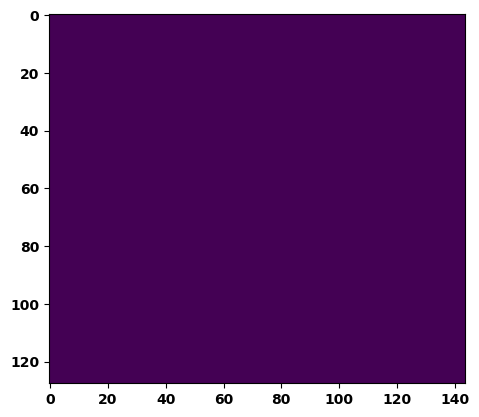

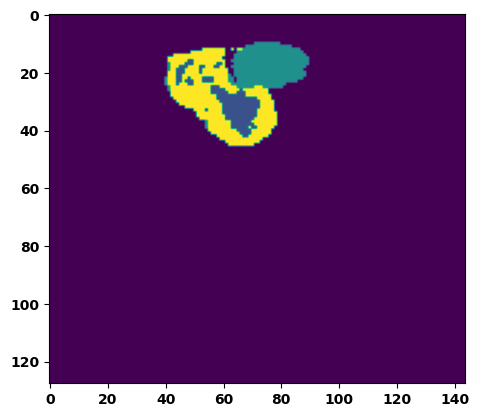

 61%|██████    | 22/36 [00:32<00:20,  1.49s/it]

Batch_id:  21 Eval loss:  0.6372548341751099
Batch_id:  21 Eval IoU:  tensor(0.3153, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9737, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 64%|██████▍   | 23/36 [00:33<00:19,  1.49s/it]

Batch_id:  22 Eval loss:  0.682903528213501
Batch_id:  22 Eval IoU:  tensor(0.2780, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9609, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9732, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9667, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 67%|██████▋   | 24/36 [00:35<00:18,  1.51s/it]

Batch_id:  23 Eval loss:  0.6955839991569519
Batch_id:  23 Eval IoU:  tensor(0.2104, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.5523, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.3968, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9555, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.3345, device='cuda:0')


 69%|██████▉   | 25/36 [00:36<00:16,  1.47s/it]

Batch_id:  24 Eval loss:  0.6016626358032227
Batch_id:  24 Eval IoU:  tensor(0.2715, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.6290, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.4497, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9751, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.4899, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9723, device='cuda:0')


 72%|███████▏  | 26/36 [00:38<00:14,  1.43s/it]

Batch_id:  25 Eval loss:  0.6351805925369263
Batch_id:  25 Eval IoU:  tensor(0.2928, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.7603, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.7034, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.7291, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9247, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9236, device='cuda:0')


 75%|███████▌  | 27/36 [00:39<00:13,  1.45s/it]

Batch_id:  26 Eval loss:  0.7575803399085999
Batch_id:  26 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 78%|███████▊  | 28/36 [00:40<00:11,  1.44s/it]

Batch_id:  27 Eval loss:  0.5643104910850525
Batch_id:  27 Eval IoU:  tensor(0.3888, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9097, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.8882, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9368, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9266, device='cuda:0')


 81%|████████  | 29/36 [00:42<00:10,  1.43s/it]

Batch_id:  28 Eval loss:  0.5800881385803223
Batch_id:  28 Eval IoU:  tensor(0.3452, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9565, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9727, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9897, device='cuda:0')


 83%|████████▎ | 30/36 [00:43<00:08,  1.45s/it]

Batch_id:  29 Eval loss:  0.25411927700042725
Batch_id:  29 Eval IoU:  tensor(0.6237, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9525, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9477, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  30 Eval loss:  0.32369714975357056
Batch_id:  30 Eval IoU:  tensor(0.5904, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.9731, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9936, device='cuda:0')


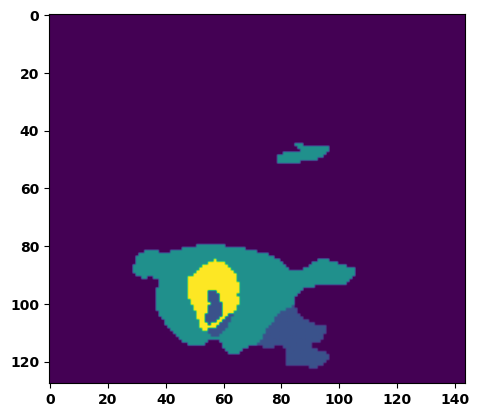

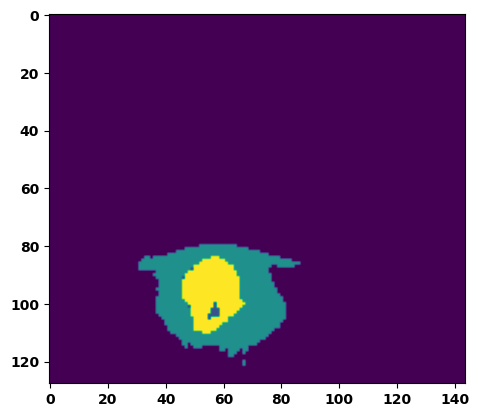

 89%|████████▉ | 32/36 [00:46<00:05,  1.45s/it]

Batch_id:  31 Eval loss:  0.5464931726455688
Batch_id:  31 Eval IoU:  tensor(0.3358, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5267, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.3137, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9544, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.3393, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9727, device='cuda:0')


 92%|█████████▏| 33/36 [00:48<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.8651984930038452
Batch_id:  32 Eval IoU:  tensor(0.0771, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.4646, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.3369, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9535, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9006, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.2029, device='cuda:0')


 94%|█████████▍| 34/36 [00:49<00:02,  1.35s/it]

Batch_id:  33 Eval loss:  0.76832115650177
Batch_id:  33 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


 97%|█████████▋| 35/36 [00:50<00:01,  1.38s/it]

Batch_id:  34 Eval loss:  0.5574507713317871
Batch_id:  34 Eval IoU:  tensor(0.3940, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9600, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9838, device='cuda:0')


100%|██████████| 36/36 [00:52<00:00,  1.46s/it]

Batch_id:  35 Eval loss:  0.1797347217798233
Batch_id:  35 Eval IoU:  tensor(0.7170, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9686, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9680, device='cuda:0')
Epoch  47 Training loss:  0.12710105018182236
Epoch  47 Evaluation loss:  0.6260122300850021
Epoch  47 Training accuracy :  tensor(0.8094)
Epoch  47 Evaluation accuracy :  tensor(0.3103)
Epoch  47 Training Mean Dice Score:  tensor(0.9849)
Epoch  47 Eval Mean Dice Score:  tensor(0.8344)
Epoch  47 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  47 Eval Non-tumor Dice Score:  tensor(0.7814)
Epoch  47 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  47 Eval NCR/NET Dice Score:  tensor(0.9295)
Epoch  47 Training ED Dice Score:  tensor(0.98

Epoch completed and model successfully saved
Epoch: 48
Training in session: 


  1%|          | 1/110 [00:01<02:49,  1.56s/it]

Batch_id:  0 Training loss:  0.10077883303165436
Batch_id:  0 Training IoU:  tensor(0.8374, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9816, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:46,  1.54s/it]

Batch_id:  1 Training loss:  0.12917886674404144
Batch_id:  1 Training IoU:  tensor(0.7846, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9757, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:53,  1.62s/it]

Batch_id:  2 Training loss:  0.08992734551429749
Batch_id:  2 Training IoU:  tensor(0.8479, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:43,  1.54s/it]

Batch_id:  3 Training loss:  0.21641959249973297
Batch_id:  3 Training IoU:  tensor(0.6944, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9774, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9710, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:37,  1.50s/it]

Batch_id:  4 Training loss:  0.31941962242126465
Batch_id:  4 Training IoU:  tensor(0.6306, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:46,  1.60s/it]

Batch_id:  5 Training loss:  0.10318604111671448
Batch_id:  5 Training IoU:  tensor(0.8294, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:41,  1.56s/it]

Batch_id:  6 Training loss:  0.1477481573820114
Batch_id:  6 Training IoU:  tensor(0.7618, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9823, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:36,  1.53s/it]

Batch_id:  7 Training loss:  0.13308541476726532
Batch_id:  7 Training IoU:  tensor(0.8039, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:32,  1.51s/it]

Batch_id:  8 Training loss:  0.1522720754146576
Batch_id:  8 Training IoU:  tensor(0.7597, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9650, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9840, device='cuda:0')


  9%|▉         | 10/110 [00:15<02:32,  1.52s/it]

Batch_id:  9 Training loss:  0.09502461552619934
Batch_id:  9 Training IoU:  tensor(0.8693, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9985, device='cuda:0')


 10%|█         | 11/110 [00:16<02:28,  1.50s/it]

Batch_id:  10 Training loss:  0.06833238899707794
Batch_id:  10 Training IoU:  tensor(0.8857, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 11%|█         | 12/110 [00:18<02:30,  1.53s/it]

Batch_id:  11 Training loss:  0.2513345181941986
Batch_id:  11 Training IoU:  tensor(0.6741, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:22,  1.47s/it]

Batch_id:  12 Training loss:  0.19025567173957825
Batch_id:  12 Training IoU:  tensor(0.7432, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9988, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:25,  1.52s/it]

Batch_id:  13 Training loss:  0.16169171035289764
Batch_id:  13 Training IoU:  tensor(0.7990, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:22,  1.50s/it]

Batch_id:  14 Training loss:  0.23296140134334564
Batch_id:  14 Training IoU:  tensor(0.7136, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:18,  1.47s/it]

Batch_id:  15 Training loss:  0.07288062572479248
Batch_id:  15 Training IoU:  tensor(0.8754, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 15%|█▌        | 17/110 [00:25<02:13,  1.44s/it]

Batch_id:  16 Training loss:  0.2177441567182541
Batch_id:  16 Training IoU:  tensor(0.7063, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9948, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:16,  1.49s/it]

Batch_id:  17 Training loss:  0.163471981883049
Batch_id:  17 Training IoU:  tensor(0.7629, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 17%|█▋        | 19/110 [00:28<02:14,  1.48s/it]

Batch_id:  18 Training loss:  0.11360003054141998
Batch_id:  18 Training IoU:  tensor(0.8220, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9918, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:14,  1.50s/it]

Batch_id:  19 Training loss:  0.23303352296352386
Batch_id:  19 Training IoU:  tensor(0.7013, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 19%|█▉        | 21/110 [00:31<02:09,  1.46s/it]

Batch_id:  20 Training loss:  0.0657302737236023
Batch_id:  20 Training IoU:  tensor(0.8868, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 20%|██        | 22/110 [00:33<02:12,  1.51s/it]

Batch_id:  21 Training loss:  0.12388919293880463
Batch_id:  21 Training IoU:  tensor(0.8164, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 21%|██        | 23/110 [00:34<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.06011022627353668
Batch_id:  22 Training IoU:  tensor(0.9096, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:04,  1.45s/it]

Batch_id:  23 Training loss:  0.10547719895839691
Batch_id:  23 Training IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:15,  1.59s/it]

Batch_id:  24 Training loss:  0.14026431739330292
Batch_id:  24 Training IoU:  tensor(0.7821, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:09,  1.54s/it]

Batch_id:  25 Training loss:  0.1330539882183075
Batch_id:  25 Training IoU:  tensor(0.8144, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 25%|██▍       | 27/110 [00:40<02:03,  1.48s/it]

Batch_id:  26 Training loss:  0.12586872279644012
Batch_id:  26 Training IoU:  tensor(0.8043, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9823, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9878, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:01,  1.48s/it]

Batch_id:  27 Training loss:  0.0834769606590271
Batch_id:  27 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:00,  1.49s/it]

Batch_id:  28 Training loss:  0.10655483603477478
Batch_id:  28 Training IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9852, device='cuda:0')


 27%|██▋       | 30/110 [00:45<01:59,  1.50s/it]

Batch_id:  29 Training loss:  0.13511283695697784
Batch_id:  29 Training IoU:  tensor(0.7793, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9659, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9582, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:58,  1.50s/it]

Batch_id:  30 Training loss:  0.09039776027202606
Batch_id:  30 Training IoU:  tensor(0.8532, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9980, device='cuda:0')


 29%|██▉       | 32/110 [00:48<02:00,  1.55s/it]

Batch_id:  31 Training loss:  0.056911617517471313
Batch_id:  31 Training IoU:  tensor(0.9024, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 30%|███       | 33/110 [00:49<02:00,  1.56s/it]

Batch_id:  32 Training loss:  0.03028056025505066
Batch_id:  32 Training IoU:  tensor(0.9476, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9926, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 31%|███       | 34/110 [00:51<01:58,  1.56s/it]

Batch_id:  33 Training loss:  0.10106652975082397
Batch_id:  33 Training IoU:  tensor(0.8287, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:49,  1.47s/it]

Batch_id:  34 Training loss:  0.14455249905586243
Batch_id:  34 Training IoU:  tensor(0.7856, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:48,  1.46s/it]

Batch_id:  35 Training loss:  0.07887603342533112
Batch_id:  35 Training IoU:  tensor(0.8656, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:48,  1.49s/it]

Batch_id:  36 Training loss:  0.052559494972229004
Batch_id:  36 Training IoU:  tensor(0.9085, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9938, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:47,  1.49s/it]

Batch_id:  37 Training loss:  0.12539921700954437
Batch_id:  37 Training IoU:  tensor(0.7903, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:50,  1.55s/it]

Batch_id:  38 Training loss:  0.10267932713031769
Batch_id:  38 Training IoU:  tensor(0.8417, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 36%|███▋      | 40/110 [01:00<01:47,  1.54s/it]

Batch_id:  39 Training loss:  0.06907103955745697
Batch_id:  39 Training IoU:  tensor(0.9354, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 37%|███▋      | 41/110 [01:02<01:52,  1.63s/it]

Batch_id:  40 Training loss:  0.10673113167285919
Batch_id:  40 Training IoU:  tensor(0.9117, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 38%|███▊      | 42/110 [01:03<01:50,  1.63s/it]

Batch_id:  41 Training loss:  0.07251203060150146
Batch_id:  41 Training IoU:  tensor(0.8940, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9990, device='cuda:0')


 39%|███▉      | 43/110 [01:05<01:45,  1.57s/it]

Batch_id:  42 Training loss:  0.12365815043449402
Batch_id:  42 Training IoU:  tensor(0.8199, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9983, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9951, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 40%|████      | 44/110 [01:06<01:43,  1.56s/it]

Batch_id:  43 Training loss:  0.09590548276901245
Batch_id:  43 Training IoU:  tensor(0.8397, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9895, device='cuda:0')


 41%|████      | 45/110 [01:08<01:41,  1.56s/it]

Batch_id:  44 Training loss:  0.15763035416603088
Batch_id:  44 Training IoU:  tensor(0.7545, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9807, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 42%|████▏     | 46/110 [01:10<01:42,  1.61s/it]

Batch_id:  45 Training loss:  0.08493122458457947
Batch_id:  45 Training IoU:  tensor(0.8547, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 43%|████▎     | 47/110 [01:11<01:40,  1.59s/it]

Batch_id:  46 Training loss:  0.09074670076370239
Batch_id:  46 Training IoU:  tensor(0.8433, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9827, device='cuda:0')


 44%|████▎     | 48/110 [01:13<01:36,  1.55s/it]

Batch_id:  47 Training loss:  0.13335314393043518
Batch_id:  47 Training IoU:  tensor(0.7923, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 45%|████▍     | 49/110 [01:14<01:31,  1.50s/it]

Batch_id:  48 Training loss:  0.05460597574710846
Batch_id:  48 Training IoU:  tensor(0.9043, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9943, device='cuda:0')


 45%|████▌     | 50/110 [01:15<01:26,  1.45s/it]

Batch_id:  49 Training loss:  0.11453595757484436
Batch_id:  49 Training IoU:  tensor(0.8077, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9945, device='cuda:0')


 46%|████▋     | 51/110 [01:17<01:26,  1.46s/it]

Batch_id:  50 Training loss:  0.21230848133563995
Batch_id:  50 Training IoU:  tensor(0.6962, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 47%|████▋     | 52/110 [01:19<01:27,  1.51s/it]

Batch_id:  51 Training loss:  0.23063507676124573
Batch_id:  51 Training IoU:  tensor(0.6793, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9610, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9521, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9464, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9934, device='cuda:0')


 48%|████▊     | 53/110 [01:20<01:27,  1.54s/it]

Batch_id:  52 Training loss:  0.17754565179347992
Batch_id:  52 Training IoU:  tensor(0.7882, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 49%|████▉     | 54/110 [01:22<01:26,  1.54s/it]

Batch_id:  53 Training loss:  0.09462277591228485
Batch_id:  53 Training IoU:  tensor(0.8359, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 50%|█████     | 55/110 [01:23<01:24,  1.54s/it]

Batch_id:  54 Training loss:  0.1334652453660965
Batch_id:  54 Training IoU:  tensor(0.7853, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9777, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9751, device='cuda:0')


 51%|█████     | 56/110 [01:25<01:22,  1.52s/it]

Batch_id:  55 Training loss:  0.16748464107513428
Batch_id:  55 Training IoU:  tensor(0.7442, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 52%|█████▏    | 57/110 [01:26<01:17,  1.47s/it]

Batch_id:  56 Training loss:  0.11667953431606293
Batch_id:  56 Training IoU:  tensor(0.8063, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 53%|█████▎    | 58/110 [01:28<01:18,  1.51s/it]

Batch_id:  57 Training loss:  0.10918942093849182
Batch_id:  57 Training IoU:  tensor(0.8202, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


 54%|█████▎    | 59/110 [01:29<01:17,  1.51s/it]

Batch_id:  58 Training loss:  0.06176966428756714
Batch_id:  58 Training IoU:  tensor(0.8940, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 55%|█████▍    | 60/110 [01:31<01:16,  1.53s/it]

Batch_id:  59 Training loss:  0.05181846022605896
Batch_id:  59 Training IoU:  tensor(0.9117, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 55%|█████▌    | 61/110 [01:32<01:14,  1.51s/it]

Batch_id:  60 Training loss:  0.07126858830451965
Batch_id:  60 Training IoU:  tensor(0.8769, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9909, device='cuda:0')


 56%|█████▋    | 62/110 [01:34<01:14,  1.55s/it]

Batch_id:  61 Training loss:  0.04837104678153992
Batch_id:  61 Training IoU:  tensor(0.9229, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 57%|█████▋    | 63/110 [01:35<01:11,  1.52s/it]

Batch_id:  62 Training loss:  0.08187296986579895
Batch_id:  62 Training IoU:  tensor(0.8599, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9729, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9646, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9639, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 58%|█████▊    | 64/110 [01:37<01:09,  1.51s/it]

Batch_id:  63 Training loss:  0.09354574978351593
Batch_id:  63 Training IoU:  tensor(0.8447, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9885, device='cuda:0')


 59%|█████▉    | 65/110 [01:38<01:09,  1.55s/it]

Batch_id:  64 Training loss:  0.0569964200258255
Batch_id:  64 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 60%|██████    | 66/110 [01:40<01:09,  1.57s/it]

Batch_id:  65 Training loss:  0.14860928058624268
Batch_id:  65 Training IoU:  tensor(0.7606, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9791, device='cuda:0')


 61%|██████    | 67/110 [01:41<01:05,  1.53s/it]

Batch_id:  66 Training loss:  0.10796339809894562
Batch_id:  66 Training IoU:  tensor(0.8298, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 62%|██████▏   | 68/110 [01:43<01:04,  1.54s/it]

Batch_id:  67 Training loss:  0.052216097712516785
Batch_id:  67 Training IoU:  tensor(0.9092, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9967, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 63%|██████▎   | 69/110 [01:44<01:01,  1.51s/it]

Batch_id:  68 Training loss:  0.10423050820827484
Batch_id:  68 Training IoU:  tensor(0.8268, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9837, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9776, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 64%|██████▎   | 70/110 [01:46<01:01,  1.53s/it]

Batch_id:  69 Training loss:  0.19149482250213623
Batch_id:  69 Training IoU:  tensor(0.7037, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9498, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9568, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9534, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9772, device='cuda:0')


 65%|██████▍   | 71/110 [01:48<00:59,  1.52s/it]

Batch_id:  70 Training loss:  0.09331101179122925
Batch_id:  70 Training IoU:  tensor(0.8436, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9791, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 65%|██████▌   | 72/110 [01:49<00:57,  1.50s/it]

Batch_id:  71 Training loss:  0.12665291130542755
Batch_id:  71 Training IoU:  tensor(0.7932, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 66%|██████▋   | 73/110 [01:51<00:55,  1.50s/it]

Batch_id:  72 Training loss:  0.05991488695144653
Batch_id:  72 Training IoU:  tensor(0.9267, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 67%|██████▋   | 74/110 [01:52<00:53,  1.50s/it]

Batch_id:  73 Training loss:  0.17996463179588318
Batch_id:  73 Training IoU:  tensor(0.7213, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9748, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 68%|██████▊   | 75/110 [01:54<00:56,  1.61s/it]

Batch_id:  74 Training loss:  0.08222039043903351
Batch_id:  74 Training IoU:  tensor(0.8570, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 69%|██████▉   | 76/110 [01:55<00:51,  1.51s/it]

Batch_id:  75 Training loss:  0.17648665606975555
Batch_id:  75 Training IoU:  tensor(0.7224, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9761, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 70%|███████   | 77/110 [01:57<00:49,  1.49s/it]

Batch_id:  76 Training loss:  0.058135733008384705
Batch_id:  76 Training IoU:  tensor(0.9008, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 71%|███████   | 78/110 [01:58<00:48,  1.52s/it]

Batch_id:  77 Training loss:  0.14082014560699463
Batch_id:  77 Training IoU:  tensor(0.8023, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 72%|███████▏  | 79/110 [02:00<00:47,  1.53s/it]

Batch_id:  78 Training loss:  0.07506075501441956
Batch_id:  78 Training IoU:  tensor(0.8702, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 73%|███████▎  | 80/110 [02:01<00:46,  1.54s/it]

Batch_id:  79 Training loss:  0.10733526945114136
Batch_id:  79 Training IoU:  tensor(0.8262, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9893, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 74%|███████▎  | 81/110 [02:03<00:43,  1.51s/it]

Batch_id:  80 Training loss:  0.11245937645435333
Batch_id:  80 Training IoU:  tensor(0.8207, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9950, device='cuda:0')


 75%|███████▍  | 82/110 [02:04<00:42,  1.51s/it]

Batch_id:  81 Training loss:  0.24063365161418915
Batch_id:  81 Training IoU:  tensor(0.6731, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 75%|███████▌  | 83/110 [02:06<00:41,  1.52s/it]

Batch_id:  82 Training loss:  0.08929157257080078
Batch_id:  82 Training IoU:  tensor(0.8481, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 76%|███████▋  | 84/110 [02:07<00:39,  1.51s/it]

Batch_id:  83 Training loss:  0.17514972388744354
Batch_id:  83 Training IoU:  tensor(0.7339, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 77%|███████▋  | 85/110 [02:09<00:36,  1.48s/it]

Batch_id:  84 Training loss:  0.14763179421424866
Batch_id:  84 Training IoU:  tensor(0.7577, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9543, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9968, device='cuda:0')


 78%|███████▊  | 86/110 [02:10<00:37,  1.57s/it]

Batch_id:  85 Training loss:  0.07395027577877045
Batch_id:  85 Training IoU:  tensor(0.8701, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


 79%|███████▉  | 87/110 [02:12<00:35,  1.56s/it]

Batch_id:  86 Training loss:  0.21091577410697937
Batch_id:  86 Training IoU:  tensor(0.7255, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 80%|████████  | 88/110 [02:14<00:33,  1.54s/it]

Batch_id:  87 Training loss:  0.23706695437431335
Batch_id:  87 Training IoU:  tensor(0.6993, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9704, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9561, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 81%|████████  | 89/110 [02:15<00:32,  1.54s/it]

Batch_id:  88 Training loss:  0.11482888460159302
Batch_id:  88 Training IoU:  tensor(0.8047, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 82%|████████▏ | 90/110 [02:16<00:29,  1.50s/it]

Batch_id:  89 Training loss:  0.13860522210597992
Batch_id:  89 Training IoU:  tensor(0.7842, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9892, device='cuda:0')


 83%|████████▎ | 91/110 [02:18<00:28,  1.47s/it]

Batch_id:  90 Training loss:  0.1434198021888733
Batch_id:  90 Training IoU:  tensor(0.7657, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9861, device='cuda:0')


 84%|████████▎ | 92/110 [02:19<00:26,  1.46s/it]

Batch_id:  91 Training loss:  0.21423031389713287
Batch_id:  91 Training IoU:  tensor(0.7294, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9669, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9621, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9589, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9882, device='cuda:0')


 85%|████████▍ | 93/110 [02:21<00:24,  1.45s/it]

Batch_id:  92 Training loss:  0.19642698764801025
Batch_id:  92 Training IoU:  tensor(0.7808, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 85%|████████▌ | 94/110 [02:23<00:25,  1.58s/it]

Batch_id:  93 Training loss:  0.1510823369026184
Batch_id:  93 Training IoU:  tensor(0.7578, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9929, device='cuda:0')


 86%|████████▋ | 95/110 [02:24<00:23,  1.55s/it]

Batch_id:  94 Training loss:  0.08111938834190369
Batch_id:  94 Training IoU:  tensor(0.8641, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9741, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9886, device='cuda:0')


 87%|████████▋ | 96/110 [02:26<00:22,  1.58s/it]

Batch_id:  95 Training loss:  0.27761998772621155
Batch_id:  95 Training IoU:  tensor(0.6433, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9973, device='cuda:0')


 88%|████████▊ | 97/110 [02:27<00:20,  1.55s/it]

Batch_id:  96 Training loss:  0.14791573584079742
Batch_id:  96 Training IoU:  tensor(0.7664, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9907, device='cuda:0')


 89%|████████▉ | 98/110 [02:29<00:18,  1.58s/it]

Batch_id:  97 Training loss:  0.3549763858318329
Batch_id:  97 Training IoU:  tensor(0.5610, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9618, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9728, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9675, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9688, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9764, device='cuda:0')


 90%|█████████ | 99/110 [02:30<00:17,  1.59s/it]

Batch_id:  98 Training loss:  0.06404417753219604
Batch_id:  98 Training IoU:  tensor(0.8904, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 91%|█████████ | 100/110 [02:32<00:16,  1.60s/it]

Batch_id:  99 Training loss:  0.2214249223470688
Batch_id:  99 Training IoU:  tensor(0.6764, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9656, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9815, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9633, device='cuda:0')


 92%|█████████▏| 101/110 [02:34<00:14,  1.59s/it]

Batch_id:  100 Training loss:  0.12867863476276398
Batch_id:  100 Training IoU:  tensor(0.8020, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9977, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9824, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9915, device='cuda:0')


 93%|█████████▎| 102/110 [02:35<00:12,  1.60s/it]

Batch_id:  101 Training loss:  0.04361464083194733
Batch_id:  101 Training IoU:  tensor(0.9271, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 94%|█████████▎| 103/110 [02:37<00:11,  1.57s/it]

Batch_id:  102 Training loss:  0.19718311727046967
Batch_id:  102 Training IoU:  tensor(0.7251, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 95%|█████████▍| 104/110 [02:38<00:09,  1.51s/it]

Batch_id:  103 Training loss:  0.09609866142272949
Batch_id:  103 Training IoU:  tensor(0.8360, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 95%|█████████▌| 105/110 [02:40<00:07,  1.47s/it]

Batch_id:  104 Training loss:  0.06205274164676666
Batch_id:  104 Training IoU:  tensor(0.8914, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 96%|█████████▋| 106/110 [02:41<00:05,  1.49s/it]

Batch_id:  105 Training loss:  0.11792287230491638
Batch_id:  105 Training IoU:  tensor(0.8017, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9859, device='cuda:0')


 97%|█████████▋| 107/110 [02:43<00:04,  1.49s/it]

Batch_id:  106 Training loss:  0.10945168137550354
Batch_id:  106 Training IoU:  tensor(0.8228, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9924, device='cuda:0')


 98%|█████████▊| 108/110 [02:44<00:02,  1.47s/it]

Batch_id:  107 Training loss:  0.07823537290096283
Batch_id:  107 Training IoU:  tensor(0.8652, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9833, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 99%|█████████▉| 109/110 [02:46<00:01,  1.49s/it]

Batch_id:  108 Training loss:  0.08527007699012756
Batch_id:  108 Training IoU:  tensor(0.8512, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9941, device='cuda:0')


100%|██████████| 110/110 [02:47<00:00,  1.52s/it]


Batch_id:  109 Training loss:  0.07572336494922638
Batch_id:  109 Training IoU:  tensor(0.8731, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9961, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.6984914541244507
Batch_id:  0 Eval IoU:  tensor(0.2138, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.7122, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.6432, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9157, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.8020, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.7758, device='cuda:0')


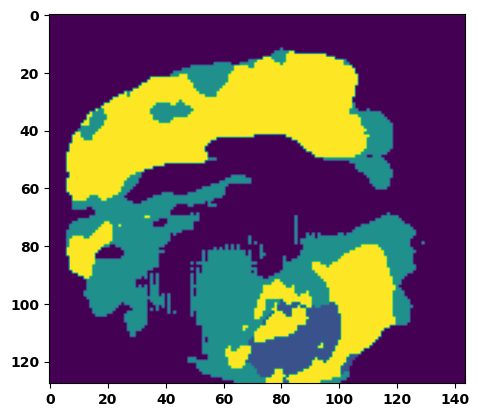

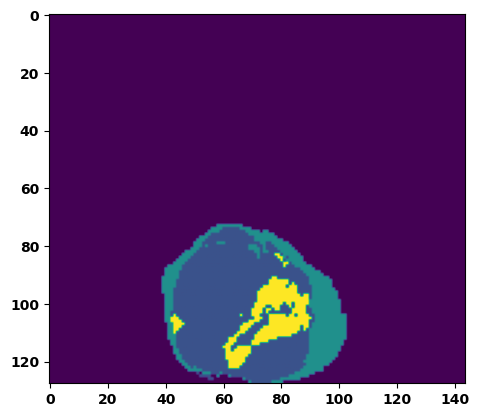

  6%|▌         | 2/36 [00:03<00:53,  1.58s/it]

Batch_id:  1 Eval loss:  0.4530947208404541
Batch_id:  1 Eval IoU:  tensor(0.4429, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.9318, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.9503, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.9505, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9556, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9389, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.50s/it]

Batch_id:  2 Eval loss:  0.5468169450759888
Batch_id:  2 Eval IoU:  tensor(0.4147, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9694, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9633, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9892, device='cuda:0')


 11%|█         | 4/36 [00:06<00:48,  1.51s/it]

Batch_id:  3 Eval loss:  0.11720311641693115
Batch_id:  3 Eval IoU:  tensor(0.8188, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:47,  1.54s/it]

Batch_id:  4 Eval loss:  0.6995310187339783
Batch_id:  4 Eval IoU:  tensor(0.2543, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9063, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.8738, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.8699, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9860, device='cuda:0')


 17%|█▋        | 6/36 [00:09<00:44,  1.48s/it]

Batch_id:  5 Eval loss:  0.4628506004810333
Batch_id:  5 Eval IoU:  tensor(0.4326, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.9870, device='cuda:0')


 19%|█▉        | 7/36 [00:10<00:41,  1.44s/it]

Batch_id:  6 Eval loss:  0.15894457697868347
Batch_id:  6 Eval IoU:  tensor(0.7665, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9760, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9981, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:39,  1.43s/it]

Batch_id:  7 Eval loss:  0.5317505598068237
Batch_id:  7 Eval IoU:  tensor(0.4061, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.9116, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.8857, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.9390, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9316, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.45s/it]

Batch_id:  8 Eval loss:  0.6479276418685913
Batch_id:  8 Eval IoU:  tensor(0.2898, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.8481, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.8979, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:38,  1.46s/it]

Batch_id:  9 Eval loss:  0.3797398805618286
Batch_id:  9 Eval IoU:  tensor(0.5138, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9458, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9786, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9487, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9331, device='cuda:0')
Batch_id:  10 Eval loss:  0.6205447912216187
Batch_id:  10 Eval IoU:  tensor(0.3249, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9759, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9792, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


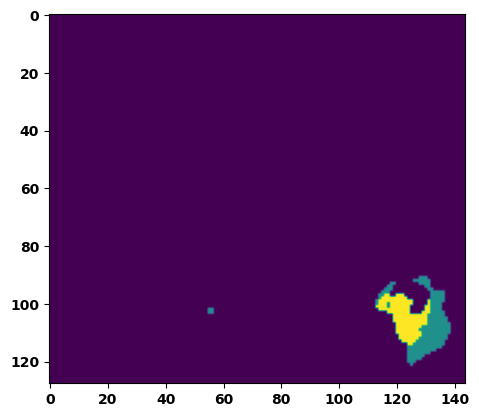

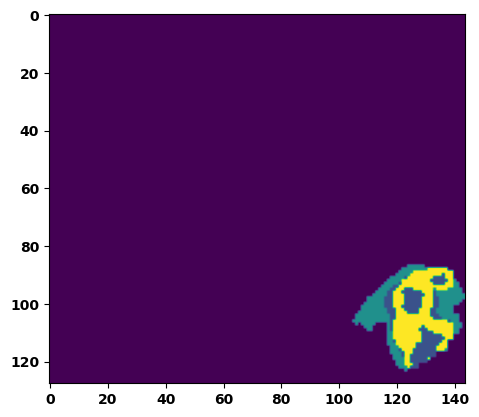

 33%|███▎      | 12/36 [00:18<00:36,  1.53s/it]

Batch_id:  11 Eval loss:  0.6603389382362366
Batch_id:  11 Eval IoU:  tensor(0.2926, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9594, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9740, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.52s/it]

Batch_id:  12 Eval loss:  0.44733747839927673
Batch_id:  12 Eval IoU:  tensor(0.4600, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.7738, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.6638, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.6652, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9962, device='cuda:0')


 39%|███▉      | 14/36 [00:21<00:33,  1.54s/it]

Batch_id:  13 Eval loss:  0.3624998927116394
Batch_id:  13 Eval IoU:  tensor(0.5291, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9768, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9724, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9945, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:32,  1.54s/it]

Batch_id:  14 Eval loss:  0.47431379556655884
Batch_id:  14 Eval IoU:  tensor(0.4384, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.9711, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.9585, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9832, device='cuda:0')


 44%|████▍     | 16/36 [00:24<00:31,  1.56s/it]

Batch_id:  15 Eval loss:  0.851344645023346
Batch_id:  15 Eval IoU:  tensor(0.0923, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5317, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3930, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9485, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.2978, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:29,  1.57s/it]

Batch_id:  16 Eval loss:  0.25753507018089294
Batch_id:  16 Eval IoU:  tensor(0.6195, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.9588, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.9597, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9955, device='cuda:0')


 50%|█████     | 18/36 [00:27<00:28,  1.57s/it]

Batch_id:  17 Eval loss:  0.13527166843414307
Batch_id:  17 Eval IoU:  tensor(0.7841, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9974, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:25,  1.50s/it]

Batch_id:  18 Eval loss:  0.8817262649536133
Batch_id:  18 Eval IoU:  tensor(0.0759, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.4981, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.4214, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.2472, device='cuda:0')


 56%|█████▌    | 20/36 [00:30<00:24,  1.52s/it]

Batch_id:  19 Eval loss:  0.7749534845352173
Batch_id:  19 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')
Batch_id:  20 Eval loss:  0.7577691078186035
Batch_id:  20 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


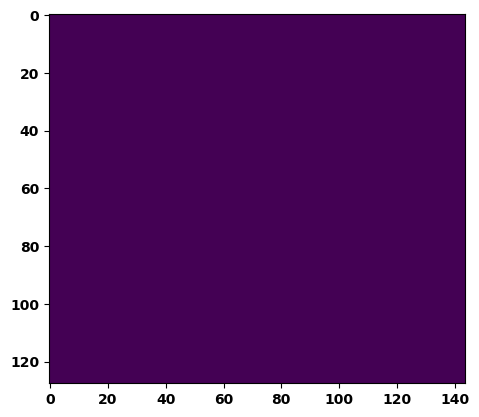

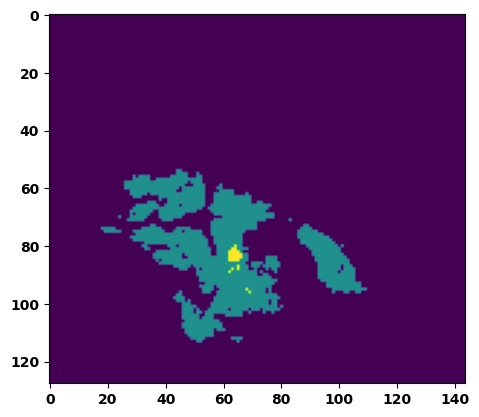

 61%|██████    | 22/36 [00:33<00:20,  1.48s/it]

Batch_id:  21 Eval loss:  0.9023008942604065
Batch_id:  21 Eval IoU:  tensor(0.0576, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.4611, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.3355, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9541, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.1917, device='cuda:0')


 64%|██████▍   | 23/36 [00:34<00:19,  1.53s/it]

Batch_id:  22 Eval loss:  0.591513454914093
Batch_id:  22 Eval IoU:  tensor(0.3647, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9782, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9785, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')


 67%|██████▋   | 24/36 [00:36<00:18,  1.50s/it]

Batch_id:  23 Eval loss:  0.5642858147621155
Batch_id:  23 Eval IoU:  tensor(0.3470, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9255, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.8925, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9730, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9591, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9519, device='cuda:0')


 69%|██████▉   | 25/36 [00:37<00:16,  1.46s/it]

Batch_id:  24 Eval loss:  0.15147188305854797
Batch_id:  24 Eval IoU:  tensor(0.7544, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9942, device='cuda:0')


 72%|███████▏  | 26/36 [00:39<00:15,  1.51s/it]

Batch_id:  25 Eval loss:  0.5179444551467896
Batch_id:  25 Eval IoU:  tensor(0.3564, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.8492, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.8144, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9532, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.8205, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9595, device='cuda:0')


 75%|███████▌  | 27/36 [00:40<00:13,  1.52s/it]

Batch_id:  26 Eval loss:  0.7560106515884399
Batch_id:  26 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 78%|███████▊  | 28/36 [00:42<00:12,  1.51s/it]

Batch_id:  27 Eval loss:  0.3330182433128357
Batch_id:  27 Eval IoU:  tensor(0.6102, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9802, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9723, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9902, device='cuda:0')


 81%|████████  | 29/36 [00:43<00:10,  1.48s/it]

Batch_id:  28 Eval loss:  0.8192777633666992
Batch_id:  28 Eval IoU:  tensor(0.1035, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.4655, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.3059, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9406, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9449, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.2051, device='cuda:0')


 83%|████████▎ | 30/36 [00:45<00:08,  1.47s/it]

Batch_id:  29 Eval loss:  0.7683056592941284
Batch_id:  29 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  30 Eval loss:  0.8848933577537537
Batch_id:  30 Eval IoU:  tensor(0.0682, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.4888, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.2397, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9495, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.4472, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.8300, device='cuda:0')


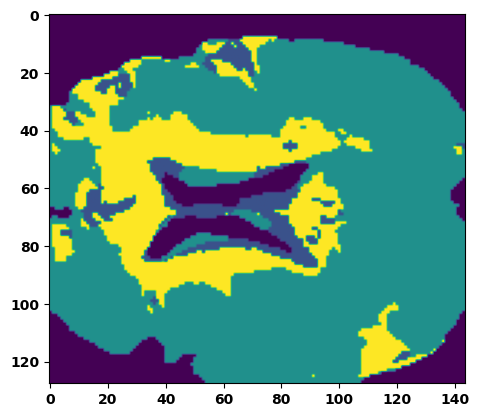

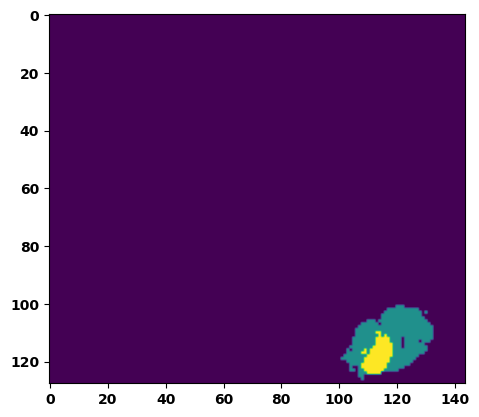

 89%|████████▉ | 32/36 [00:48<00:06,  1.51s/it]

Batch_id:  31 Eval loss:  0.8553016781806946
Batch_id:  31 Eval IoU:  tensor(0.0930, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.5338, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.4407, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8620, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.3279, device='cuda:0')


 92%|█████████▏| 33/36 [00:49<00:04,  1.45s/it]

Batch_id:  32 Eval loss:  0.7428752183914185
Batch_id:  32 Eval IoU:  tensor(0.1817, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.6995, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.6168, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.5532, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9452, device='cuda:0')


 94%|█████████▍| 34/36 [00:51<00:02,  1.49s/it]

Batch_id:  33 Eval loss:  0.05370323359966278
Batch_id:  33 Eval IoU:  tensor(0.9044, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9856, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9947, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9917, device='cuda:0')


 97%|█████████▋| 35/36 [00:52<00:01,  1.45s/it]

Batch_id:  34 Eval loss:  0.7111121416091919
Batch_id:  34 Eval IoU:  tensor(0.2575, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.9261, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.9274, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.9648, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9112, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9749, device='cuda:0')


100%|██████████| 36/36 [00:53<00:00,  1.50s/it]

Batch_id:  35 Eval loss:  0.7517525553703308
Batch_id:  35 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')
Epoch 00049: reducing learning rate of group 0 to 3.9063e-06.
Epoch  48 Training loss:  0.12688458196141503
Epoch  48 Evaluation loss:  0.5645486849049727
Epoch  48 Training accuracy :  tensor(0.8098)
Epoch  48 Evaluation accuracy :  tensor(0.3721)
Epoch  48 Training Mean Dice Score:  tensor(0.9849)
Epoch  48 Eval Mean Dice Score:  tensor(0.8564)
Epoch  48 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  48 Eval Non-tumor Dice Score:  tensor(0.8161)
Epoch  48 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  48 Eval NCR/NET Dice Score: 

Epoch completed and model successfully saved
Epoch: 49
Training in session: 


  1%|          | 1/110 [00:01<02:48,  1.55s/it]

Batch_id:  0 Training loss:  0.10709646344184875
Batch_id:  0 Training IoU:  tensor(0.8313, device='cuda:0')
Batch_id:  0 Training Mean Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  0 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  0 Training NCR/NET Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  0 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  0 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


  2%|▏         | 2/110 [00:03<02:44,  1.52s/it]

Batch_id:  1 Training loss:  0.16509705781936646
Batch_id:  1 Training IoU:  tensor(0.7460, device='cuda:0')
Batch_id:  1 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  1 Training Non-tumor Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  1 Training NCR/NET Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  1 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  1 Training ET Dice Score:  tensor(0.9954, device='cuda:0')


  3%|▎         | 3/110 [00:04<02:42,  1.52s/it]

Batch_id:  2 Training loss:  0.07404714822769165
Batch_id:  2 Training IoU:  tensor(0.8911, device='cuda:0')
Batch_id:  2 Training Mean Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  2 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  2 Training NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  2 Training ED Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  2 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


  4%|▎         | 4/110 [00:06<02:43,  1.54s/it]

Batch_id:  3 Training loss:  0.07818108797073364
Batch_id:  3 Training IoU:  tensor(0.8658, device='cuda:0')
Batch_id:  3 Training Mean Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  3 Training Non-tumor Dice Score:  tensor(0.9832, device='cuda:0')
Batch_id:  3 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  3 Training ED Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  3 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


  5%|▍         | 5/110 [00:07<02:36,  1.49s/it]

Batch_id:  4 Training loss:  0.13272477686405182
Batch_id:  4 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  4 Training Mean Dice Score:  tensor(0.9778, device='cuda:0')
Batch_id:  4 Training Non-tumor Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  4 Training NCR/NET Dice Score:  tensor(0.9839, device='cuda:0')
Batch_id:  4 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  4 Training ET Dice Score:  tensor(0.9755, device='cuda:0')


  5%|▌         | 6/110 [00:09<02:36,  1.50s/it]

Batch_id:  5 Training loss:  0.11789242923259735
Batch_id:  5 Training IoU:  tensor(0.8049, device='cuda:0')
Batch_id:  5 Training Mean Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  5 Training Non-tumor Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  5 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  5 Training ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  5 Training ET Dice Score:  tensor(0.9912, device='cuda:0')


  6%|▋         | 7/110 [00:10<02:36,  1.52s/it]

Batch_id:  6 Training loss:  0.1521700769662857
Batch_id:  6 Training IoU:  tensor(0.7595, device='cuda:0')
Batch_id:  6 Training Mean Dice Score:  tensor(0.9581, device='cuda:0')
Batch_id:  6 Training Non-tumor Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  6 Training NCR/NET Dice Score:  tensor(0.9647, device='cuda:0')
Batch_id:  6 Training ED Dice Score:  tensor(0.9531, device='cuda:0')
Batch_id:  6 Training ET Dice Score:  tensor(0.9842, device='cuda:0')


  7%|▋         | 8/110 [00:12<02:32,  1.50s/it]

Batch_id:  7 Training loss:  0.17409056425094604
Batch_id:  7 Training IoU:  tensor(0.7354, device='cuda:0')
Batch_id:  7 Training Mean Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  7 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  7 Training NCR/NET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  7 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  7 Training ET Dice Score:  tensor(0.9920, device='cuda:0')


  8%|▊         | 9/110 [00:13<02:27,  1.46s/it]

Batch_id:  8 Training loss:  0.10623899102210999
Batch_id:  8 Training IoU:  tensor(0.8190, device='cuda:0')
Batch_id:  8 Training Mean Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  8 Training Non-tumor Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  8 Training NCR/NET Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  8 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  8 Training ET Dice Score:  tensor(0.9856, device='cuda:0')


  9%|▉         | 10/110 [00:14<02:28,  1.49s/it]

Batch_id:  9 Training loss:  0.31981566548347473
Batch_id:  9 Training IoU:  tensor(0.6308, device='cuda:0')
Batch_id:  9 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  9 Training Non-tumor Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  9 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  9 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  9 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 10%|█         | 11/110 [00:16<02:32,  1.54s/it]

Batch_id:  10 Training loss:  0.22086600959300995
Batch_id:  10 Training IoU:  tensor(0.6774, device='cuda:0')
Batch_id:  10 Training Mean Dice Score:  tensor(0.9658, device='cuda:0')
Batch_id:  10 Training Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  10 Training NCR/NET Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  10 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  10 Training ET Dice Score:  tensor(0.9635, device='cuda:0')


 11%|█         | 12/110 [00:18<02:32,  1.55s/it]

Batch_id:  11 Training loss:  0.04842972755432129
Batch_id:  11 Training IoU:  tensor(0.9219, device='cuda:0')
Batch_id:  11 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  11 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  11 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  11 Training ED Dice Score:  tensor(0.9838, device='cuda:0')
Batch_id:  11 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 12%|█▏        | 13/110 [00:19<02:29,  1.54s/it]

Batch_id:  12 Training loss:  0.14776171743869781
Batch_id:  12 Training IoU:  tensor(0.7579, device='cuda:0')
Batch_id:  12 Training Mean Dice Score:  tensor(0.9666, device='cuda:0')
Batch_id:  12 Training Non-tumor Dice Score:  tensor(0.9583, device='cuda:0')
Batch_id:  12 Training NCR/NET Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  12 Training ED Dice Score:  tensor(0.9539, device='cuda:0')
Batch_id:  12 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 13%|█▎        | 14/110 [00:21<02:30,  1.56s/it]

Batch_id:  13 Training loss:  0.05527268350124359
Batch_id:  13 Training IoU:  tensor(0.9022, device='cuda:0')
Batch_id:  13 Training Mean Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  13 Training Non-tumor Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  13 Training NCR/NET Dice Score:  tensor(0.9972, device='cuda:0')
Batch_id:  13 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  13 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 14%|█▎        | 15/110 [00:22<02:27,  1.55s/it]

Batch_id:  14 Training loss:  0.12486453354358673
Batch_id:  14 Training IoU:  tensor(0.7923, device='cuda:0')
Batch_id:  14 Training Mean Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  14 Training Non-tumor Dice Score:  tensor(0.9854, device='cuda:0')
Batch_id:  14 Training NCR/NET Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  14 Training ED Dice Score:  tensor(0.9853, device='cuda:0')
Batch_id:  14 Training ET Dice Score:  tensor(0.9894, device='cuda:0')


 15%|█▍        | 16/110 [00:24<02:25,  1.55s/it]

Batch_id:  15 Training loss:  0.13206766545772552
Batch_id:  15 Training IoU:  tensor(0.8142, device='cuda:0')
Batch_id:  15 Training Mean Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  15 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  15 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  15 Training ED Dice Score:  tensor(0.9907, device='cuda:0')
Batch_id:  15 Training ET Dice Score:  tensor(0.9988, device='cuda:0')


 15%|█▌        | 17/110 [00:26<02:25,  1.57s/it]

Batch_id:  16 Training loss:  0.08911924064159393
Batch_id:  16 Training IoU:  tensor(0.8491, device='cuda:0')
Batch_id:  16 Training Mean Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  16 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  16 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  16 Training ED Dice Score:  tensor(0.9829, device='cuda:0')
Batch_id:  16 Training ET Dice Score:  tensor(0.9900, device='cuda:0')


 16%|█▋        | 18/110 [00:27<02:22,  1.55s/it]

Batch_id:  17 Training loss:  0.0921325534582138
Batch_id:  17 Training IoU:  tensor(0.8505, device='cuda:0')
Batch_id:  17 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  17 Training Non-tumor Dice Score:  tensor(0.9851, device='cuda:0')
Batch_id:  17 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  17 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  17 Training ET Dice Score:  tensor(0.9978, device='cuda:0')


 17%|█▋        | 19/110 [00:29<02:23,  1.58s/it]

Batch_id:  18 Training loss:  0.14303180575370789
Batch_id:  18 Training IoU:  tensor(0.7658, device='cuda:0')
Batch_id:  18 Training Mean Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  18 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  18 Training NCR/NET Dice Score:  tensor(0.9867, device='cuda:0')
Batch_id:  18 Training ED Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  18 Training ET Dice Score:  tensor(0.9862, device='cuda:0')


 18%|█▊        | 20/110 [00:30<02:17,  1.53s/it]

Batch_id:  19 Training loss:  0.2131986916065216
Batch_id:  19 Training IoU:  tensor(0.7313, device='cuda:0')
Batch_id:  19 Training Mean Dice Score:  tensor(0.9671, device='cuda:0')
Batch_id:  19 Training Non-tumor Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  19 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  19 Training ED Dice Score:  tensor(0.9590, device='cuda:0')
Batch_id:  19 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 19%|█▉        | 21/110 [00:32<02:16,  1.54s/it]

Batch_id:  20 Training loss:  0.07332609593868256
Batch_id:  20 Training IoU:  tensor(0.8708, device='cuda:0')
Batch_id:  20 Training Mean Dice Score:  tensor(0.9866, device='cuda:0')
Batch_id:  20 Training Non-tumor Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  20 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  20 Training ED Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  20 Training ET Dice Score:  tensor(0.9921, device='cuda:0')


 20%|██        | 22/110 [00:33<02:11,  1.49s/it]

Batch_id:  21 Training loss:  0.27658015489578247
Batch_id:  21 Training IoU:  tensor(0.6405, device='cuda:0')
Batch_id:  21 Training Mean Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  21 Training Non-tumor Dice Score:  tensor(0.9858, device='cuda:0')
Batch_id:  21 Training NCR/NET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  21 Training ED Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  21 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 21%|██        | 23/110 [00:35<02:10,  1.50s/it]

Batch_id:  22 Training loss:  0.10119451582431793
Batch_id:  22 Training IoU:  tensor(0.8296, device='cuda:0')
Batch_id:  22 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  22 Training Non-tumor Dice Score:  tensor(0.9923, device='cuda:0')
Batch_id:  22 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  22 Training ED Dice Score:  tensor(0.9929, device='cuda:0')
Batch_id:  22 Training ET Dice Score:  tensor(0.9883, device='cuda:0')


 22%|██▏       | 24/110 [00:36<02:03,  1.44s/it]

Batch_id:  23 Training loss:  0.11459749937057495
Batch_id:  23 Training IoU:  tensor(0.8084, device='cuda:0')
Batch_id:  23 Training Mean Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  23 Training Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  23 Training NCR/NET Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  23 Training ED Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  23 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 23%|██▎       | 25/110 [00:37<02:05,  1.48s/it]

Batch_id:  24 Training loss:  0.22929896414279938
Batch_id:  24 Training IoU:  tensor(0.6795, device='cuda:0')
Batch_id:  24 Training Mean Dice Score:  tensor(0.9608, device='cuda:0')
Batch_id:  24 Training Non-tumor Dice Score:  tensor(0.9518, device='cuda:0')
Batch_id:  24 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  24 Training ED Dice Score:  tensor(0.9461, device='cuda:0')
Batch_id:  24 Training ET Dice Score:  tensor(0.9935, device='cuda:0')


 24%|██▎       | 26/110 [00:39<02:09,  1.54s/it]

Batch_id:  25 Training loss:  0.1358467936515808
Batch_id:  25 Training IoU:  tensor(0.7785, device='cuda:0')
Batch_id:  25 Training Mean Dice Score:  tensor(0.9629, device='cuda:0')
Batch_id:  25 Training Non-tumor Dice Score:  tensor(0.9653, device='cuda:0')
Batch_id:  25 Training NCR/NET Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  25 Training ED Dice Score:  tensor(0.9576, device='cuda:0')
Batch_id:  25 Training ET Dice Score:  tensor(0.9777, device='cuda:0')


 25%|██▍       | 27/110 [00:41<02:05,  1.51s/it]

Batch_id:  26 Training loss:  0.07406620681285858
Batch_id:  26 Training IoU:  tensor(0.8714, device='cuda:0')
Batch_id:  26 Training Mean Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  26 Training Non-tumor Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  26 Training NCR/NET Dice Score:  tensor(0.9957, device='cuda:0')
Batch_id:  26 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  26 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 25%|██▌       | 28/110 [00:42<02:00,  1.47s/it]

Batch_id:  27 Training loss:  0.21294307708740234
Batch_id:  27 Training IoU:  tensor(0.6953, device='cuda:0')
Batch_id:  27 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  27 Training Non-tumor Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  27 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  27 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  27 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 26%|██▋       | 29/110 [00:43<02:00,  1.49s/it]

Batch_id:  28 Training loss:  0.02950499951839447
Batch_id:  28 Training IoU:  tensor(0.9490, device='cuda:0')
Batch_id:  28 Training Mean Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  28 Training Non-tumor Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  28 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  28 Training ED Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  28 Training ET Dice Score:  tensor(0.9972, device='cuda:0')


 27%|██▋       | 30/110 [00:45<01:57,  1.47s/it]

Batch_id:  29 Training loss:  0.09466038644313812
Batch_id:  29 Training IoU:  tensor(0.8420, device='cuda:0')
Batch_id:  29 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  29 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  29 Training NCR/NET Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  29 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  29 Training ET Dice Score:  tensor(0.9899, device='cuda:0')


 28%|██▊       | 31/110 [00:46<01:53,  1.44s/it]

Batch_id:  30 Training loss:  0.1348808854818344
Batch_id:  30 Training IoU:  tensor(0.7897, device='cuda:0')
Batch_id:  30 Training Mean Dice Score:  tensor(0.9772, device='cuda:0')
Batch_id:  30 Training Non-tumor Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  30 Training NCR/NET Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  30 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  30 Training ET Dice Score:  tensor(0.9746, device='cuda:0')


 29%|██▉       | 32/110 [00:48<01:51,  1.42s/it]

Batch_id:  31 Training loss:  0.12554365396499634
Batch_id:  31 Training IoU:  tensor(0.8136, device='cuda:0')
Batch_id:  31 Training Mean Dice Score:  tensor(0.9896, device='cuda:0')
Batch_id:  31 Training Non-tumor Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  31 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  31 Training ED Dice Score:  tensor(0.9878, device='cuda:0')
Batch_id:  31 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 30%|███       | 33/110 [00:49<01:53,  1.48s/it]

Batch_id:  32 Training loss:  0.15028154850006104
Batch_id:  32 Training IoU:  tensor(0.7589, device='cuda:0')
Batch_id:  32 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  32 Training Non-tumor Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  32 Training NCR/NET Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  32 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  32 Training ET Dice Score:  tensor(0.9930, device='cuda:0')


 31%|███       | 34/110 [00:51<01:49,  1.44s/it]

Batch_id:  33 Training loss:  0.08102436363697052
Batch_id:  33 Training IoU:  tensor(0.8643, device='cuda:0')
Batch_id:  33 Training Mean Dice Score:  tensor(0.9742, device='cuda:0')
Batch_id:  33 Training Non-tumor Dice Score:  tensor(0.9700, device='cuda:0')
Batch_id:  33 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  33 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  33 Training ET Dice Score:  tensor(0.9887, device='cuda:0')


 32%|███▏      | 35/110 [00:52<01:50,  1.47s/it]

Batch_id:  34 Training loss:  0.059014692902565
Batch_id:  34 Training IoU:  tensor(0.9288, device='cuda:0')
Batch_id:  34 Training Mean Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  34 Training Non-tumor Dice Score:  tensor(0.9965, device='cuda:0')
Batch_id:  34 Training NCR/NET Dice Score:  tensor(0.9997, device='cuda:0')
Batch_id:  34 Training ED Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  34 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 33%|███▎      | 36/110 [00:54<01:48,  1.46s/it]

Batch_id:  35 Training loss:  0.14871619641780853
Batch_id:  35 Training IoU:  tensor(0.7600, device='cuda:0')
Batch_id:  35 Training Mean Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  35 Training Non-tumor Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  35 Training NCR/NET Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  35 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  35 Training ET Dice Score:  tensor(0.9821, device='cuda:0')


 34%|███▎      | 37/110 [00:55<01:45,  1.45s/it]

Batch_id:  36 Training loss:  0.10266992449760437
Batch_id:  36 Training IoU:  tensor(0.8309, device='cuda:0')
Batch_id:  36 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  36 Training Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  36 Training NCR/NET Dice Score:  tensor(0.9973, device='cuda:0')
Batch_id:  36 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  36 Training ET Dice Score:  tensor(0.9974, device='cuda:0')


 35%|███▍      | 38/110 [00:57<01:47,  1.49s/it]

Batch_id:  37 Training loss:  0.08299258351325989
Batch_id:  37 Training IoU:  tensor(0.8577, device='cuda:0')
Batch_id:  37 Training Mean Dice Score:  tensor(0.9726, device='cuda:0')
Batch_id:  37 Training Non-tumor Dice Score:  tensor(0.9644, device='cuda:0')
Batch_id:  37 Training NCR/NET Dice Score:  tensor(0.9962, device='cuda:0')
Batch_id:  37 Training ED Dice Score:  tensor(0.9636, device='cuda:0')
Batch_id:  37 Training ET Dice Score:  tensor(0.9936, device='cuda:0')


 35%|███▌      | 39/110 [00:58<01:43,  1.46s/it]

Batch_id:  38 Training loss:  0.19626100361347198
Batch_id:  38 Training IoU:  tensor(0.7265, device='cuda:0')
Batch_id:  38 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  38 Training Non-tumor Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  38 Training NCR/NET Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  38 Training ED Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  38 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 36%|███▋      | 40/110 [00:59<01:40,  1.44s/it]

Batch_id:  39 Training loss:  0.15718987584114075
Batch_id:  39 Training IoU:  tensor(0.7558, device='cuda:0')
Batch_id:  39 Training Mean Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  39 Training Non-tumor Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  39 Training NCR/NET Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  39 Training ED Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  39 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 37%|███▋      | 41/110 [01:01<01:38,  1.43s/it]

Batch_id:  40 Training loss:  0.13913139700889587
Batch_id:  40 Training IoU:  tensor(0.7835, device='cuda:0')
Batch_id:  40 Training Mean Dice Score:  tensor(0.9859, device='cuda:0')
Batch_id:  40 Training Non-tumor Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  40 Training NCR/NET Dice Score:  tensor(0.9938, device='cuda:0')
Batch_id:  40 Training ED Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  40 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 38%|███▊      | 42/110 [01:02<01:37,  1.43s/it]

Batch_id:  41 Training loss:  0.07601355016231537
Batch_id:  41 Training IoU:  tensor(0.8722, device='cuda:0')
Batch_id:  41 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  41 Training Non-tumor Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  41 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  41 Training ED Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  41 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 39%|███▉      | 43/110 [01:04<01:34,  1.41s/it]

Batch_id:  42 Training loss:  0.11736546456813812
Batch_id:  42 Training IoU:  tensor(0.8030, device='cuda:0')
Batch_id:  42 Training Mean Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  42 Training Non-tumor Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  42 Training NCR/NET Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  42 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  42 Training ET Dice Score:  tensor(0.9860, device='cuda:0')


 40%|████      | 44/110 [01:05<01:37,  1.48s/it]

Batch_id:  43 Training loss:  0.353732168674469
Batch_id:  43 Training IoU:  tensor(0.5621, device='cuda:0')
Batch_id:  43 Training Mean Dice Score:  tensor(0.9622, device='cuda:0')
Batch_id:  43 Training Non-tumor Dice Score:  tensor(0.9734, device='cuda:0')
Batch_id:  43 Training NCR/NET Dice Score:  tensor(0.9676, device='cuda:0')
Batch_id:  43 Training ED Dice Score:  tensor(0.9691, device='cuda:0')
Batch_id:  43 Training ET Dice Score:  tensor(0.9766, device='cuda:0')


 41%|████      | 45/110 [01:07<01:33,  1.44s/it]

Batch_id:  44 Training loss:  0.1282297521829605
Batch_id:  44 Training IoU:  tensor(0.7862, device='cuda:0')
Batch_id:  44 Training Mean Dice Score:  tensor(0.9758, device='cuda:0')
Batch_id:  44 Training Non-tumor Dice Score:  tensor(0.9801, device='cuda:0')
Batch_id:  44 Training NCR/NET Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  44 Training ED Dice Score:  tensor(0.9716, device='cuda:0')
Batch_id:  44 Training ET Dice Score:  tensor(0.9826, device='cuda:0')


 42%|████▏     | 46/110 [01:08<01:35,  1.49s/it]

Batch_id:  45 Training loss:  0.0928700864315033
Batch_id:  45 Training IoU:  tensor(0.8443, device='cuda:0')
Batch_id:  45 Training Mean Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  45 Training Non-tumor Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  45 Training NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  45 Training ED Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  45 Training ET Dice Score:  tensor(0.9923, device='cuda:0')


 43%|████▎     | 47/110 [01:10<01:33,  1.49s/it]

Batch_id:  46 Training loss:  0.23333138227462769
Batch_id:  46 Training IoU:  tensor(0.7119, device='cuda:0')
Batch_id:  46 Training Mean Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  46 Training Non-tumor Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  46 Training NCR/NET Dice Score:  tensor(0.9974, device='cuda:0')
Batch_id:  46 Training ED Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  46 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 44%|████▎     | 48/110 [01:11<01:29,  1.44s/it]

Batch_id:  47 Training loss:  0.05298648774623871
Batch_id:  47 Training IoU:  tensor(0.9076, device='cuda:0')
Batch_id:  47 Training Mean Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  47 Training Non-tumor Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  47 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  47 Training ED Dice Score:  tensor(0.9818, device='cuda:0')
Batch_id:  47 Training ET Dice Score:  tensor(0.9922, device='cuda:0')


 45%|████▍     | 49/110 [01:12<01:27,  1.43s/it]

Batch_id:  48 Training loss:  0.21444171667099
Batch_id:  48 Training IoU:  tensor(0.6956, device='cuda:0')
Batch_id:  48 Training Mean Dice Score:  tensor(0.9770, device='cuda:0')
Batch_id:  48 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  48 Training NCR/NET Dice Score:  tensor(0.9739, device='cuda:0')
Batch_id:  48 Training ED Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  48 Training ET Dice Score:  tensor(0.9989, device='cuda:0')


 45%|████▌     | 50/110 [01:14<01:26,  1.44s/it]

Batch_id:  49 Training loss:  0.21856634318828583
Batch_id:  49 Training IoU:  tensor(0.7025, device='cuda:0')
Batch_id:  49 Training Mean Dice Score:  tensor(0.9869, device='cuda:0')
Batch_id:  49 Training Non-tumor Dice Score:  tensor(0.9876, device='cuda:0')
Batch_id:  49 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  49 Training ED Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  49 Training ET Dice Score:  tensor(0.9946, device='cuda:0')


 46%|████▋     | 51/110 [01:15<01:27,  1.49s/it]

Batch_id:  50 Training loss:  0.057722777128219604
Batch_id:  50 Training IoU:  tensor(0.9009, device='cuda:0')
Batch_id:  50 Training Mean Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  50 Training Non-tumor Dice Score:  tensor(0.9930, device='cuda:0')
Batch_id:  50 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  50 Training ED Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  50 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 47%|████▋     | 52/110 [01:17<01:23,  1.44s/it]

Batch_id:  51 Training loss:  0.1320732980966568
Batch_id:  51 Training IoU:  tensor(0.8052, device='cuda:0')
Batch_id:  51 Training Mean Dice Score:  tensor(0.9906, device='cuda:0')
Batch_id:  51 Training Non-tumor Dice Score:  tensor(0.9915, device='cuda:0')
Batch_id:  51 Training NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  51 Training ED Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  51 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 48%|████▊     | 53/110 [01:19<01:26,  1.52s/it]

Batch_id:  52 Training loss:  0.18888162076473236
Batch_id:  52 Training IoU:  tensor(0.7466, device='cuda:0')
Batch_id:  52 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  52 Training Non-tumor Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  52 Training NCR/NET Dice Score:  tensor(0.9989, device='cuda:0')
Batch_id:  52 Training ED Dice Score:  tensor(0.9873, device='cuda:0')
Batch_id:  52 Training ET Dice Score:  tensor(0.9992, device='cuda:0')


 49%|████▉     | 54/110 [01:20<01:22,  1.47s/it]

Batch_id:  53 Training loss:  0.0955909937620163
Batch_id:  53 Training IoU:  tensor(0.8672, device='cuda:0')
Batch_id:  53 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  53 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  53 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  53 Training ED Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  53 Training ET Dice Score:  tensor(0.9984, device='cuda:0')


 50%|█████     | 55/110 [01:21<01:19,  1.45s/it]

Batch_id:  54 Training loss:  0.11520801484584808
Batch_id:  54 Training IoU:  tensor(0.8044, device='cuda:0')
Batch_id:  54 Training Mean Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  54 Training Non-tumor Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  54 Training NCR/NET Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  54 Training ED Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  54 Training ET Dice Score:  tensor(0.9788, device='cuda:0')


 51%|█████     | 56/110 [01:23<01:17,  1.44s/it]

Batch_id:  55 Training loss:  0.13987046480178833
Batch_id:  55 Training IoU:  tensor(0.8037, device='cuda:0')
Batch_id:  55 Training Mean Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  55 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  55 Training NCR/NET Dice Score:  tensor(0.9975, device='cuda:0')
Batch_id:  55 Training ED Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  55 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 52%|█████▏    | 57/110 [01:24<01:17,  1.45s/it]

Batch_id:  56 Training loss:  0.08199149370193481
Batch_id:  56 Training IoU:  tensor(0.8581, device='cuda:0')
Batch_id:  56 Training Mean Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  56 Training Non-tumor Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  56 Training NCR/NET Dice Score:  tensor(0.9970, device='cuda:0')
Batch_id:  56 Training ED Dice Score:  tensor(0.9862, device='cuda:0')
Batch_id:  56 Training ET Dice Score:  tensor(0.9953, device='cuda:0')


 53%|█████▎    | 58/110 [01:26<01:16,  1.48s/it]

Batch_id:  57 Training loss:  0.061574697494506836
Batch_id:  57 Training IoU:  tensor(0.8951, device='cuda:0')
Batch_id:  57 Training Mean Dice Score:  tensor(0.9914, device='cuda:0')
Batch_id:  57 Training Non-tumor Dice Score:  tensor(0.9912, device='cuda:0')
Batch_id:  57 Training NCR/NET Dice Score:  tensor(0.9971, device='cuda:0')
Batch_id:  57 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  57 Training ET Dice Score:  tensor(0.9952, device='cuda:0')


 54%|█████▎    | 59/110 [01:27<01:13,  1.45s/it]

Batch_id:  58 Training loss:  0.08340995013713837
Batch_id:  58 Training IoU:  tensor(0.8564, device='cuda:0')
Batch_id:  58 Training Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  58 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  58 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  58 Training ED Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  58 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 55%|█████▍    | 60/110 [01:29<01:12,  1.45s/it]

Batch_id:  59 Training loss:  0.17105431854724884
Batch_id:  59 Training IoU:  tensor(0.7297, device='cuda:0')
Batch_id:  59 Training Mean Dice Score:  tensor(0.9814, device='cuda:0')
Batch_id:  59 Training Non-tumor Dice Score:  tensor(0.9843, device='cuda:0')
Batch_id:  59 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  59 Training ED Dice Score:  tensor(0.9767, device='cuda:0')
Batch_id:  59 Training ET Dice Score:  tensor(0.9889, device='cuda:0')


 55%|█████▌    | 61/110 [01:30<01:08,  1.40s/it]

Batch_id:  60 Training loss:  0.1237807422876358
Batch_id:  60 Training IoU:  tensor(0.8198, device='cuda:0')
Batch_id:  60 Training Mean Dice Score:  tensor(0.9950, device='cuda:0')
Batch_id:  60 Training Non-tumor Dice Score:  tensor(0.9946, device='cuda:0')
Batch_id:  60 Training NCR/NET Dice Score:  tensor(0.9982, device='cuda:0')
Batch_id:  60 Training ED Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  60 Training ET Dice Score:  tensor(0.9970, device='cuda:0')


 56%|█████▋    | 62/110 [01:31<01:06,  1.38s/it]

Batch_id:  61 Training loss:  0.10449638962745667
Batch_id:  61 Training IoU:  tensor(0.8273, device='cuda:0')
Batch_id:  61 Training Mean Dice Score:  tensor(0.9836, device='cuda:0')
Batch_id:  61 Training Non-tumor Dice Score:  tensor(0.9775, device='cuda:0')
Batch_id:  61 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  61 Training ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  61 Training ET Dice Score:  tensor(0.9955, device='cuda:0')


 57%|█████▋    | 63/110 [01:33<01:05,  1.39s/it]

Batch_id:  62 Training loss:  0.23461012542247772
Batch_id:  62 Training IoU:  tensor(0.7032, device='cuda:0')
Batch_id:  62 Training Mean Dice Score:  tensor(0.9705, device='cuda:0')
Batch_id:  62 Training Non-tumor Dice Score:  tensor(0.9579, device='cuda:0')
Batch_id:  62 Training NCR/NET Dice Score:  tensor(0.9993, device='cuda:0')
Batch_id:  62 Training ED Dice Score:  tensor(0.9562, device='cuda:0')
Batch_id:  62 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 58%|█████▊    | 64/110 [01:34<01:04,  1.40s/it]

Batch_id:  63 Training loss:  0.14424075186252594
Batch_id:  63 Training IoU:  tensor(0.7837, device='cuda:0')
Batch_id:  63 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  63 Training Non-tumor Dice Score:  tensor(0.9898, device='cuda:0')
Batch_id:  63 Training NCR/NET Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  63 Training ED Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  63 Training ET Dice Score:  tensor(0.9914, device='cuda:0')


 59%|█████▉    | 65/110 [01:36<01:06,  1.47s/it]

Batch_id:  64 Training loss:  0.19106216728687286
Batch_id:  64 Training IoU:  tensor(0.7044, device='cuda:0')
Batch_id:  64 Training Mean Dice Score:  tensor(0.9499, device='cuda:0')
Batch_id:  64 Training Non-tumor Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  64 Training NCR/NET Dice Score:  tensor(0.9623, device='cuda:0')
Batch_id:  64 Training ED Dice Score:  tensor(0.9533, device='cuda:0')
Batch_id:  64 Training ET Dice Score:  tensor(0.9774, device='cuda:0')


 60%|██████    | 66/110 [01:37<01:03,  1.45s/it]

Batch_id:  65 Training loss:  0.1645393818616867
Batch_id:  65 Training IoU:  tensor(0.7603, device='cuda:0')
Batch_id:  65 Training Mean Dice Score:  tensor(0.9924, device='cuda:0')
Batch_id:  65 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  65 Training NCR/NET Dice Score:  tensor(0.9984, device='cuda:0')
Batch_id:  65 Training ED Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  65 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 61%|██████    | 67/110 [01:38<01:00,  1.42s/it]

Batch_id:  66 Training loss:  0.23415206372737885
Batch_id:  66 Training IoU:  tensor(0.7019, device='cuda:0')
Batch_id:  66 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  66 Training Non-tumor Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  66 Training NCR/NET Dice Score:  tensor(0.9991, device='cuda:0')
Batch_id:  66 Training ED Dice Score:  tensor(0.9841, device='cuda:0')
Batch_id:  66 Training ET Dice Score:  tensor(0.9963, device='cuda:0')


 62%|██████▏   | 68/110 [01:40<01:00,  1.43s/it]

Batch_id:  67 Training loss:  0.19252519309520721
Batch_id:  67 Training IoU:  tensor(0.7822, device='cuda:0')
Batch_id:  67 Training Mean Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  67 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  67 Training NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  67 Training ED Dice Score:  tensor(0.9899, device='cuda:0')
Batch_id:  67 Training ET Dice Score:  tensor(0.9971, device='cuda:0')


 63%|██████▎   | 69/110 [01:41<00:59,  1.45s/it]

Batch_id:  68 Training loss:  0.09026862680912018
Batch_id:  68 Training IoU:  tensor(0.8477, device='cuda:0')
Batch_id:  68 Training Mean Dice Score:  tensor(0.9804, device='cuda:0')
Batch_id:  68 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  68 Training NCR/NET Dice Score:  tensor(0.9887, device='cuda:0')
Batch_id:  68 Training ED Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  68 Training ET Dice Score:  tensor(0.9825, device='cuda:0')


 64%|██████▎   | 70/110 [01:43<00:59,  1.48s/it]

Batch_id:  69 Training loss:  0.1138073205947876
Batch_id:  69 Training IoU:  tensor(0.8223, device='cuda:0')
Batch_id:  69 Training Mean Dice Score:  tensor(0.9819, device='cuda:0')
Batch_id:  69 Training Non-tumor Dice Score:  tensor(0.9835, device='cuda:0')
Batch_id:  69 Training NCR/NET Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  69 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  69 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 65%|██████▍   | 71/110 [01:44<00:57,  1.48s/it]

Batch_id:  70 Training loss:  0.1004309207201004
Batch_id:  70 Training IoU:  tensor(0.8363, device='cuda:0')
Batch_id:  70 Training Mean Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  70 Training Non-tumor Dice Score:  tensor(0.9844, device='cuda:0')
Batch_id:  70 Training NCR/NET Dice Score:  tensor(0.9968, device='cuda:0')
Batch_id:  70 Training ED Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  70 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 65%|██████▌   | 72/110 [01:46<00:54,  1.43s/it]

Batch_id:  71 Training loss:  0.14818716049194336
Batch_id:  71 Training IoU:  tensor(0.7622, device='cuda:0')
Batch_id:  71 Training Mean Dice Score:  tensor(0.9789, device='cuda:0')
Batch_id:  71 Training Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  71 Training NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  71 Training ED Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  71 Training ET Dice Score:  tensor(0.9793, device='cuda:0')


 66%|██████▋   | 73/110 [01:47<00:52,  1.41s/it]

Batch_id:  72 Training loss:  0.17733898758888245
Batch_id:  72 Training IoU:  tensor(0.7898, device='cuda:0')
Batch_id:  72 Training Mean Dice Score:  tensor(0.9953, device='cuda:0')
Batch_id:  72 Training Non-tumor Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  72 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  72 Training ED Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  72 Training ET Dice Score:  tensor(0.9991, device='cuda:0')


 67%|██████▋   | 74/110 [01:49<00:52,  1.45s/it]

Batch_id:  73 Training loss:  0.06067498028278351
Batch_id:  73 Training IoU:  tensor(0.9087, device='cuda:0')
Batch_id:  73 Training Mean Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  73 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  73 Training NCR/NET Dice Score:  tensor(0.9995, device='cuda:0')
Batch_id:  73 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  73 Training ET Dice Score:  tensor(0.9987, device='cuda:0')


 68%|██████▊   | 75/110 [01:50<00:49,  1.42s/it]

Batch_id:  74 Training loss:  0.05678805708885193
Batch_id:  74 Training IoU:  tensor(0.9010, device='cuda:0')
Batch_id:  74 Training Mean Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  74 Training Non-tumor Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  74 Training NCR/NET Dice Score:  tensor(0.9945, device='cuda:0')
Batch_id:  74 Training ED Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  74 Training ET Dice Score:  tensor(0.9932, device='cuda:0')


 69%|██████▉   | 76/110 [01:52<00:50,  1.48s/it]

Batch_id:  75 Training loss:  0.0435202419757843
Batch_id:  75 Training IoU:  tensor(0.9270, device='cuda:0')
Batch_id:  75 Training Mean Dice Score:  tensor(0.9850, device='cuda:0')
Batch_id:  75 Training Non-tumor Dice Score:  tensor(0.9817, device='cuda:0')
Batch_id:  75 Training NCR/NET Dice Score:  tensor(0.9976, device='cuda:0')
Batch_id:  75 Training ED Dice Score:  tensor(0.9796, device='cuda:0')
Batch_id:  75 Training ET Dice Score:  tensor(0.9960, device='cuda:0')


 70%|███████   | 77/110 [01:53<00:47,  1.45s/it]

Batch_id:  76 Training loss:  0.10804605484008789
Batch_id:  76 Training IoU:  tensor(0.8254, device='cuda:0')
Batch_id:  76 Training Mean Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  76 Training Non-tumor Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  76 Training NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  76 Training ED Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  76 Training ET Dice Score:  tensor(0.9928, device='cuda:0')


 71%|███████   | 78/110 [01:54<00:46,  1.45s/it]

Batch_id:  77 Training loss:  0.11163811385631561
Batch_id:  77 Training IoU:  tensor(0.8212, device='cuda:0')
Batch_id:  77 Training Mean Dice Score:  tensor(0.9784, device='cuda:0')
Batch_id:  77 Training Non-tumor Dice Score:  tensor(0.9743, device='cuda:0')
Batch_id:  77 Training NCR/NET Dice Score:  tensor(0.9952, device='cuda:0')
Batch_id:  77 Training ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  77 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 72%|███████▏  | 79/110 [01:56<00:44,  1.43s/it]

Batch_id:  78 Training loss:  0.07908391952514648
Batch_id:  78 Training IoU:  tensor(0.8656, device='cuda:0')
Batch_id:  78 Training Mean Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  78 Training Non-tumor Dice Score:  tensor(0.9883, device='cuda:0')
Batch_id:  78 Training NCR/NET Dice Score:  tensor(0.9979, device='cuda:0')
Batch_id:  78 Training ED Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  78 Training ET Dice Score:  tensor(0.9962, device='cuda:0')


 73%|███████▎  | 80/110 [01:57<00:44,  1.49s/it]

Batch_id:  79 Training loss:  0.18022200465202332
Batch_id:  79 Training IoU:  tensor(0.7212, device='cuda:0')
Batch_id:  79 Training Mean Dice Score:  tensor(0.9780, device='cuda:0')
Batch_id:  79 Training Non-tumor Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  79 Training NCR/NET Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  79 Training ED Dice Score:  tensor(0.9749, device='cuda:0')
Batch_id:  79 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 74%|███████▎  | 81/110 [01:59<00:42,  1.45s/it]

Batch_id:  80 Training loss:  0.06788502633571625
Batch_id:  80 Training IoU:  tensor(0.8866, device='cuda:0')
Batch_id:  80 Training Mean Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  80 Training Non-tumor Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  80 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  80 Training ED Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  80 Training ET Dice Score:  tensor(0.9897, device='cuda:0')


 75%|███████▍  | 82/110 [02:00<00:40,  1.45s/it]

Batch_id:  81 Training loss:  0.09062081575393677
Batch_id:  81 Training IoU:  tensor(0.8434, device='cuda:0')
Batch_id:  81 Training Mean Dice Score:  tensor(0.9820, device='cuda:0')
Batch_id:  81 Training Non-tumor Dice Score:  tensor(0.9894, device='cuda:0')
Batch_id:  81 Training NCR/NET Dice Score:  tensor(0.9913, device='cuda:0')
Batch_id:  81 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  81 Training ET Dice Score:  tensor(0.9829, device='cuda:0')


 75%|███████▌  | 83/110 [02:02<00:38,  1.42s/it]

Batch_id:  82 Training loss:  0.14734376966953278
Batch_id:  82 Training IoU:  tensor(0.7673, device='cuda:0')
Batch_id:  82 Training Mean Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  82 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  82 Training NCR/NET Dice Score:  tensor(0.9897, device='cuda:0')
Batch_id:  82 Training ED Dice Score:  tensor(0.9848, device='cuda:0')
Batch_id:  82 Training ET Dice Score:  tensor(0.9908, device='cuda:0')


 76%|███████▋  | 84/110 [02:03<00:36,  1.41s/it]

Batch_id:  83 Training loss:  0.07257328927516937
Batch_id:  83 Training IoU:  tensor(0.8748, device='cuda:0')
Batch_id:  83 Training Mean Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  83 Training Non-tumor Dice Score:  tensor(0.9927, device='cuda:0')
Batch_id:  83 Training NCR/NET Dice Score:  tensor(0.9969, device='cuda:0')
Batch_id:  83 Training ED Dice Score:  tensor(0.9910, device='cuda:0')
Batch_id:  83 Training ET Dice Score:  tensor(0.9951, device='cuda:0')


 77%|███████▋  | 85/110 [02:05<00:36,  1.48s/it]

Batch_id:  84 Training loss:  0.08379212021827698
Batch_id:  84 Training IoU:  tensor(0.8562, device='cuda:0')
Batch_id:  84 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  84 Training Non-tumor Dice Score:  tensor(0.9919, device='cuda:0')
Batch_id:  84 Training NCR/NET Dice Score:  tensor(0.9960, device='cuda:0')
Batch_id:  84 Training ED Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  84 Training ET Dice Score:  tensor(0.9933, device='cuda:0')


 78%|███████▊  | 86/110 [02:06<00:34,  1.43s/it]

Batch_id:  85 Training loss:  0.06211400032043457
Batch_id:  85 Training IoU:  tensor(0.8907, device='cuda:0')
Batch_id:  85 Training Mean Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  85 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  85 Training NCR/NET Dice Score:  tensor(0.9940, device='cuda:0')
Batch_id:  85 Training ED Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  85 Training ET Dice Score:  tensor(0.9927, device='cuda:0')


 79%|███████▉  | 87/110 [02:08<00:34,  1.50s/it]

Batch_id:  86 Training loss:  0.06511712074279785
Batch_id:  86 Training IoU:  tensor(0.8874, device='cuda:0')
Batch_id:  86 Training Mean Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training Non-tumor Dice Score:  tensor(0.9847, device='cuda:0')
Batch_id:  86 Training NCR/NET Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  86 Training ED Dice Score:  tensor(0.9868, device='cuda:0')
Batch_id:  86 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 80%|████████  | 88/110 [02:09<00:32,  1.46s/it]

Batch_id:  87 Training loss:  0.09614923596382141
Batch_id:  87 Training IoU:  tensor(0.8359, device='cuda:0')
Batch_id:  87 Training Mean Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  87 Training Non-tumor Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  87 Training NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  87 Training ED Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  87 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 81%|████████  | 89/110 [02:10<00:30,  1.45s/it]

Batch_id:  88 Training loss:  0.07119585573673248
Batch_id:  88 Training IoU:  tensor(0.8772, device='cuda:0')
Batch_id:  88 Training Mean Dice Score:  tensor(0.9840, device='cuda:0')
Batch_id:  88 Training Non-tumor Dice Score:  tensor(0.9821, device='cuda:0')
Batch_id:  88 Training NCR/NET Dice Score:  tensor(0.9958, device='cuda:0')
Batch_id:  88 Training ED Dice Score:  tensor(0.9830, device='cuda:0')
Batch_id:  88 Training ET Dice Score:  tensor(0.9910, device='cuda:0')


 82%|████████▏ | 90/110 [02:12<00:30,  1.50s/it]

Batch_id:  89 Training loss:  0.09385138750076294
Batch_id:  89 Training IoU:  tensor(0.8372, device='cuda:0')
Batch_id:  89 Training Mean Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  89 Training Non-tumor Dice Score:  tensor(0.9857, device='cuda:0')
Batch_id:  89 Training NCR/NET Dice Score:  tensor(0.9902, device='cuda:0')
Batch_id:  89 Training ED Dice Score:  tensor(0.9799, device='cuda:0')
Batch_id:  89 Training ET Dice Score:  tensor(0.9916, device='cuda:0')


 83%|████████▎ | 91/110 [02:14<00:28,  1.51s/it]

Batch_id:  90 Training loss:  0.06387321650981903
Batch_id:  90 Training IoU:  tensor(0.8909, device='cuda:0')
Batch_id:  90 Training Mean Dice Score:  tensor(0.9908, device='cuda:0')
Batch_id:  90 Training Non-tumor Dice Score:  tensor(0.9891, device='cuda:0')
Batch_id:  90 Training NCR/NET Dice Score:  tensor(0.9980, device='cuda:0')
Batch_id:  90 Training ED Dice Score:  tensor(0.9888, device='cuda:0')
Batch_id:  90 Training ET Dice Score:  tensor(0.9964, device='cuda:0')


 84%|████████▎ | 92/110 [02:15<00:27,  1.55s/it]

Batch_id:  91 Training loss:  0.05241920053958893
Batch_id:  91 Training IoU:  tensor(0.9102, device='cuda:0')
Batch_id:  91 Training Mean Dice Score:  tensor(0.9882, device='cuda:0')
Batch_id:  91 Training Non-tumor Dice Score:  tensor(0.9895, device='cuda:0')
Batch_id:  91 Training NCR/NET Dice Score:  tensor(0.9961, device='cuda:0')
Batch_id:  91 Training ED Dice Score:  tensor(0.9872, device='cuda:0')
Batch_id:  91 Training ET Dice Score:  tensor(0.9919, device='cuda:0')


 85%|████████▍ | 93/110 [02:17<00:25,  1.51s/it]

Batch_id:  92 Training loss:  0.1397378146648407
Batch_id:  92 Training IoU:  tensor(0.7828, device='cuda:0')
Batch_id:  92 Training Mean Dice Score:  tensor(0.9889, device='cuda:0')
Batch_id:  92 Training Non-tumor Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  92 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  92 Training ED Dice Score:  tensor(0.9860, device='cuda:0')
Batch_id:  92 Training ET Dice Score:  tensor(0.9956, device='cuda:0')


 85%|████████▌ | 94/110 [02:18<00:24,  1.51s/it]

Batch_id:  93 Training loss:  0.1048426479101181
Batch_id:  93 Training IoU:  tensor(0.9122, device='cuda:0')
Batch_id:  93 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  93 Training Non-tumor Dice Score:  tensor(0.9936, device='cuda:0')
Batch_id:  93 Training NCR/NET Dice Score:  tensor(0.9999, device='cuda:0')
Batch_id:  93 Training ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  93 Training ET Dice Score:  tensor(0.9995, device='cuda:0')


 86%|████████▋ | 95/110 [02:20<00:22,  1.48s/it]

Batch_id:  94 Training loss:  0.12747478485107422
Batch_id:  94 Training IoU:  tensor(0.7927, device='cuda:0')
Batch_id:  94 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  94 Training Non-tumor Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  94 Training NCR/NET Dice Score:  tensor(0.9904, device='cuda:0')
Batch_id:  94 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  94 Training ET Dice Score:  tensor(0.9937, device='cuda:0')


 87%|████████▋ | 96/110 [02:21<00:20,  1.46s/it]

Batch_id:  95 Training loss:  0.059058234095573425
Batch_id:  95 Training IoU:  tensor(0.8989, device='cuda:0')
Batch_id:  95 Training Mean Dice Score:  tensor(0.9916, device='cuda:0')
Batch_id:  95 Training Non-tumor Dice Score:  tensor(0.9921, device='cuda:0')
Batch_id:  95 Training NCR/NET Dice Score:  tensor(0.9964, device='cuda:0')
Batch_id:  95 Training ED Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  95 Training ET Dice Score:  tensor(0.9959, device='cuda:0')


 88%|████████▊ | 97/110 [02:23<00:19,  1.51s/it]

Batch_id:  96 Training loss:  0.23996122181415558
Batch_id:  96 Training IoU:  tensor(0.6730, device='cuda:0')
Batch_id:  96 Training Mean Dice Score:  tensor(0.9875, device='cuda:0')
Batch_id:  96 Training Non-tumor Dice Score:  tensor(0.9852, device='cuda:0')
Batch_id:  96 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  96 Training ED Dice Score:  tensor(0.9831, device='cuda:0')
Batch_id:  96 Training ET Dice Score:  tensor(0.9977, device='cuda:0')


 89%|████████▉ | 98/110 [02:24<00:17,  1.48s/it]

Batch_id:  97 Training loss:  0.12713421881198883
Batch_id:  97 Training IoU:  tensor(0.8017, device='cuda:0')
Batch_id:  97 Training Mean Dice Score:  tensor(0.9822, device='cuda:0')
Batch_id:  97 Training Non-tumor Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  97 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  97 Training ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  97 Training ET Dice Score:  tensor(0.9876, device='cuda:0')


 90%|█████████ | 99/110 [02:25<00:16,  1.49s/it]

Batch_id:  98 Training loss:  0.10869744420051575
Batch_id:  98 Training IoU:  tensor(0.8206, device='cuda:0')
Batch_id:  98 Training Mean Dice Score:  tensor(0.9880, device='cuda:0')
Batch_id:  98 Training Non-tumor Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  98 Training NCR/NET Dice Score:  tensor(0.9956, device='cuda:0')
Batch_id:  98 Training ED Dice Score:  tensor(0.9864, device='cuda:0')
Batch_id:  98 Training ET Dice Score:  tensor(0.9942, device='cuda:0')


 91%|█████████ | 100/110 [02:27<00:15,  1.50s/it]

Batch_id:  99 Training loss:  0.08605757355690002
Batch_id:  99 Training IoU:  tensor(0.8501, device='cuda:0')
Batch_id:  99 Training Mean Dice Score:  tensor(0.9886, device='cuda:0')
Batch_id:  99 Training Non-tumor Dice Score:  tensor(0.9901, device='cuda:0')
Batch_id:  99 Training NCR/NET Dice Score:  tensor(0.9941, device='cuda:0')
Batch_id:  99 Training ED Dice Score:  tensor(0.9877, device='cuda:0')
Batch_id:  99 Training ET Dice Score:  tensor(0.9939, device='cuda:0')


 92%|█████████▏| 101/110 [02:29<00:13,  1.52s/it]

Batch_id:  100 Training loss:  0.16147273778915405
Batch_id:  100 Training IoU:  tensor(0.7982, device='cuda:0')
Batch_id:  100 Training Mean Dice Score:  tensor(0.9846, device='cuda:0')
Batch_id:  100 Training Non-tumor Dice Score:  tensor(0.9797, device='cuda:0')
Batch_id:  100 Training NCR/NET Dice Score:  tensor(0.9987, device='cuda:0')
Batch_id:  100 Training ED Dice Score:  tensor(0.9787, device='cuda:0')
Batch_id:  100 Training ET Dice Score:  tensor(0.9969, device='cuda:0')


 93%|█████████▎| 102/110 [02:30<00:12,  1.51s/it]

Batch_id:  101 Training loss:  0.21058546006679535
Batch_id:  101 Training IoU:  tensor(0.7230, device='cuda:0')
Batch_id:  101 Training Mean Dice Score:  tensor(0.9903, device='cuda:0')
Batch_id:  101 Training Non-tumor Dice Score:  tensor(0.9874, device='cuda:0')
Batch_id:  101 Training NCR/NET Dice Score:  tensor(0.9992, device='cuda:0')
Batch_id:  101 Training ED Dice Score:  tensor(0.9861, device='cuda:0')
Batch_id:  101 Training ET Dice Score:  tensor(0.9982, device='cuda:0')


 94%|█████████▎| 103/110 [02:32<00:10,  1.55s/it]

Batch_id:  102 Training loss:  0.252059668302536
Batch_id:  102 Training IoU:  tensor(0.6728, device='cuda:0')
Batch_id:  102 Training Mean Dice Score:  tensor(0.9879, device='cuda:0')
Batch_id:  102 Training Non-tumor Dice Score:  tensor(0.9863, device='cuda:0')
Batch_id:  102 Training NCR/NET Dice Score:  tensor(0.9966, device='cuda:0')
Batch_id:  102 Training ED Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  102 Training ET Dice Score:  tensor(0.9983, device='cuda:0')


 95%|█████████▍| 104/110 [02:33<00:09,  1.57s/it]

Batch_id:  103 Training loss:  0.07080613076686859
Batch_id:  103 Training IoU:  tensor(0.9330, device='cuda:0')
Batch_id:  103 Training Mean Dice Score:  tensor(0.9954, device='cuda:0')
Batch_id:  103 Training Non-tumor Dice Score:  tensor(0.9944, device='cuda:0')
Batch_id:  103 Training NCR/NET Dice Score:  tensor(1.0000, device='cuda:0')
Batch_id:  103 Training ED Dice Score:  tensor(0.9931, device='cuda:0')
Batch_id:  103 Training ET Dice Score:  tensor(0.9986, device='cuda:0')


 95%|█████████▌| 105/110 [02:35<00:07,  1.52s/it]

Batch_id:  104 Training loss:  0.10510824620723724
Batch_id:  104 Training IoU:  tensor(0.8196, device='cuda:0')
Batch_id:  104 Training Mean Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  104 Training Non-tumor Dice Score:  tensor(0.9871, device='cuda:0')
Batch_id:  104 Training NCR/NET Dice Score:  tensor(0.9905, device='cuda:0')
Batch_id:  104 Training ED Dice Score:  tensor(0.9813, device='cuda:0')
Batch_id:  104 Training ET Dice Score:  tensor(0.9891, device='cuda:0')


 96%|█████████▋| 106/110 [02:37<00:06,  1.61s/it]

Batch_id:  105 Training loss:  0.1008097231388092
Batch_id:  105 Training IoU:  tensor(0.8436, device='cuda:0')
Batch_id:  105 Training Mean Dice Score:  tensor(0.9935, device='cuda:0')
Batch_id:  105 Training Non-tumor Dice Score:  tensor(0.9922, device='cuda:0')
Batch_id:  105 Training NCR/NET Dice Score:  tensor(0.9986, device='cuda:0')
Batch_id:  105 Training ED Dice Score:  tensor(0.9933, device='cuda:0')
Batch_id:  105 Training ET Dice Score:  tensor(0.9965, device='cuda:0')


 97%|█████████▋| 107/110 [02:38<00:04,  1.56s/it]

Batch_id:  106 Training loss:  0.0937458723783493
Batch_id:  106 Training IoU:  tensor(0.8441, device='cuda:0')
Batch_id:  106 Training Mean Dice Score:  tensor(0.9884, device='cuda:0')
Batch_id:  106 Training Non-tumor Dice Score:  tensor(0.9955, device='cuda:0')
Batch_id:  106 Training NCR/NET Dice Score:  tensor(0.9885, device='cuda:0')
Batch_id:  106 Training ED Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  106 Training ET Dice Score:  tensor(0.9884, device='cuda:0')


 98%|█████████▊| 108/110 [02:40<00:03,  1.58s/it]

Batch_id:  107 Training loss:  0.1279507428407669
Batch_id:  107 Training IoU:  tensor(0.8032, device='cuda:0')
Batch_id:  107 Training Mean Dice Score:  tensor(0.9849, device='cuda:0')
Batch_id:  107 Training Non-tumor Dice Score:  tensor(0.9828, device='cuda:0')
Batch_id:  107 Training NCR/NET Dice Score:  tensor(0.9978, device='cuda:0')
Batch_id:  107 Training ED Dice Score:  tensor(0.9825, device='cuda:0')
Batch_id:  107 Training ET Dice Score:  tensor(0.9917, device='cuda:0')


 99%|█████████▉| 109/110 [02:41<00:01,  1.53s/it]

Batch_id:  108 Training loss:  0.10875561833381653
Batch_id:  108 Training IoU:  tensor(0.8232, device='cuda:0')
Batch_id:  108 Training Mean Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  108 Training Non-tumor Dice Score:  tensor(0.9939, device='cuda:0')
Batch_id:  108 Training NCR/NET Dice Score:  tensor(0.9948, device='cuda:0')
Batch_id:  108 Training ED Dice Score:  tensor(0.9920, device='cuda:0')
Batch_id:  108 Training ET Dice Score:  tensor(0.9925, device='cuda:0')


100%|██████████| 110/110 [02:43<00:00,  1.48s/it]


Batch_id:  109 Training loss:  0.05189739167690277
Batch_id:  109 Training IoU:  tensor(0.9097, device='cuda:0')
Batch_id:  109 Training Mean Dice Score:  tensor(0.9909, device='cuda:0')
Batch_id:  109 Training Non-tumor Dice Score:  tensor(0.9925, device='cuda:0')
Batch_id:  109 Training NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  109 Training ED Dice Score:  tensor(0.9918, device='cuda:0')
Batch_id:  109 Training ET Dice Score:  tensor(0.9940, device='cuda:0')
Evaluation in session: 


  0%|          | 0/36 [00:00<?, ?it/s]

Batch_id:  0 Eval loss:  0.768276035785675
Batch_id:  0 Eval IoU:  tensor(0.2155, device='cuda:0')
Batch_id:  0 Eval Mean Dice Score:  tensor(0.9079, device='cuda:0')
Batch_id:  0 Eval Non-tumor Dice Score:  tensor(0.8619, device='cuda:0')
Batch_id:  0 Eval NCR/NET Dice Score:  tensor(0.9158, device='cuda:0')
Batch_id:  0 Eval ED Dice Score:  tensor(0.9795, device='cuda:0')
Batch_id:  0 Eval ET Dice Score:  tensor(0.9666, device='cuda:0')


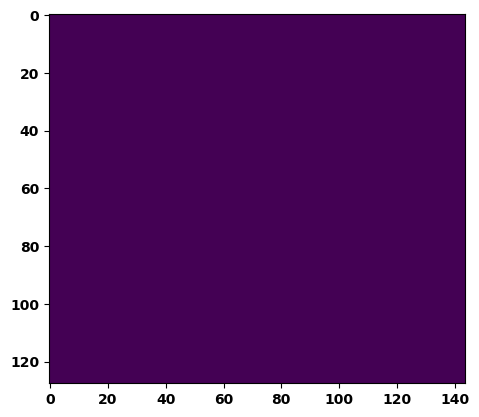

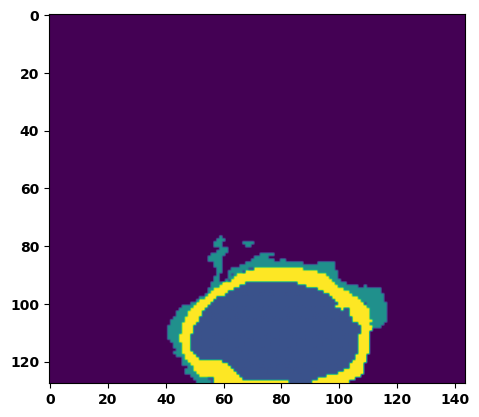

  6%|▌         | 2/36 [00:03<00:54,  1.60s/it]

Batch_id:  1 Eval loss:  0.6089238524436951
Batch_id:  1 Eval IoU:  tensor(0.3187, device='cuda:0')
Batch_id:  1 Eval Mean Dice Score:  tensor(0.8510, device='cuda:0')
Batch_id:  1 Eval Non-tumor Dice Score:  tensor(0.8082, device='cuda:0')
Batch_id:  1 Eval NCR/NET Dice Score:  tensor(0.8350, device='cuda:0')
Batch_id:  1 Eval ED Dice Score:  tensor(0.9645, device='cuda:0')
Batch_id:  1 Eval ET Dice Score:  tensor(0.9453, device='cuda:0')


  8%|▊         | 3/36 [00:04<00:49,  1.51s/it]

Batch_id:  2 Eval loss:  0.5859450101852417
Batch_id:  2 Eval IoU:  tensor(0.3453, device='cuda:0')
Batch_id:  2 Eval Mean Dice Score:  tensor(0.9655, device='cuda:0')
Batch_id:  2 Eval Non-tumor Dice Score:  tensor(0.9488, device='cuda:0')
Batch_id:  2 Eval NCR/NET Dice Score:  tensor(0.9911, device='cuda:0')
Batch_id:  2 Eval ED Dice Score:  tensor(0.9806, device='cuda:0')
Batch_id:  2 Eval ET Dice Score:  tensor(0.9762, device='cuda:0')


 11%|█         | 4/36 [00:05<00:46,  1.44s/it]

Batch_id:  3 Eval loss:  0.15711115300655365
Batch_id:  3 Eval IoU:  tensor(0.7504, device='cuda:0')
Batch_id:  3 Eval Mean Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  3 Eval Non-tumor Dice Score:  tensor(0.9917, device='cuda:0')
Batch_id:  3 Eval NCR/NET Dice Score:  tensor(0.9746, device='cuda:0')
Batch_id:  3 Eval ED Dice Score:  tensor(0.9881, device='cuda:0')
Batch_id:  3 Eval ET Dice Score:  tensor(0.9717, device='cuda:0')


 14%|█▍        | 5/36 [00:07<00:44,  1.43s/it]

Batch_id:  4 Eval loss:  0.7265596389770508
Batch_id:  4 Eval IoU:  tensor(0.2510, device='cuda:0')
Batch_id:  4 Eval Mean Dice Score:  tensor(0.9577, device='cuda:0')
Batch_id:  4 Eval Non-tumor Dice Score:  tensor(0.9366, device='cuda:0')
Batch_id:  4 Eval NCR/NET Dice Score:  tensor(0.9842, device='cuda:0')
Batch_id:  4 Eval ED Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  4 Eval ET Dice Score:  tensor(0.9818, device='cuda:0')


 17%|█▋        | 6/36 [00:08<00:41,  1.38s/it]

Batch_id:  5 Eval loss:  0.9016925096511841
Batch_id:  5 Eval IoU:  tensor(0.0579, device='cuda:0')
Batch_id:  5 Eval Mean Dice Score:  tensor(0.4618, device='cuda:0')
Batch_id:  5 Eval Non-tumor Dice Score:  tensor(0.3365, device='cuda:0')
Batch_id:  5 Eval NCR/NET Dice Score:  tensor(0.9540, device='cuda:0')
Batch_id:  5 Eval ED Dice Score:  tensor(0.9020, device='cuda:0')
Batch_id:  5 Eval ET Dice Score:  tensor(0.1928, device='cuda:0')


 19%|█▉        | 7/36 [00:09<00:40,  1.39s/it]

Batch_id:  6 Eval loss:  0.6664631366729736
Batch_id:  6 Eval IoU:  tensor(0.2865, device='cuda:0')
Batch_id:  6 Eval Mean Dice Score:  tensor(0.9252, device='cuda:0')
Batch_id:  6 Eval Non-tumor Dice Score:  tensor(0.9148, device='cuda:0')
Batch_id:  6 Eval NCR/NET Dice Score:  tensor(0.9719, device='cuda:0')
Batch_id:  6 Eval ED Dice Score:  tensor(0.9141, device='cuda:0')
Batch_id:  6 Eval ET Dice Score:  tensor(0.9747, device='cuda:0')


 22%|██▏       | 8/36 [00:11<00:38,  1.39s/it]

Batch_id:  7 Eval loss:  0.699748694896698
Batch_id:  7 Eval IoU:  tensor(0.2276, device='cuda:0')
Batch_id:  7 Eval Mean Dice Score:  tensor(0.7518, device='cuda:0')
Batch_id:  7 Eval Non-tumor Dice Score:  tensor(0.6966, device='cuda:0')
Batch_id:  7 Eval NCR/NET Dice Score:  tensor(0.8218, device='cuda:0')
Batch_id:  7 Eval ED Dice Score:  tensor(0.7932, device='cuda:0')
Batch_id:  7 Eval ET Dice Score:  tensor(0.9437, device='cuda:0')


 25%|██▌       | 9/36 [00:13<00:39,  1.46s/it]

Batch_id:  8 Eval loss:  0.6362733244895935
Batch_id:  8 Eval IoU:  tensor(0.3125, device='cuda:0')
Batch_id:  8 Eval Mean Dice Score:  tensor(0.9685, device='cuda:0')
Batch_id:  8 Eval Non-tumor Dice Score:  tensor(0.9586, device='cuda:0')
Batch_id:  8 Eval NCR/NET Dice Score:  tensor(0.9928, device='cuda:0')
Batch_id:  8 Eval ED Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  8 Eval ET Dice Score:  tensor(0.9796, device='cuda:0')


 28%|██▊       | 10/36 [00:14<00:37,  1.44s/it]

Batch_id:  9 Eval loss:  0.22963553667068481
Batch_id:  9 Eval IoU:  tensor(0.6908, device='cuda:0')
Batch_id:  9 Eval Mean Dice Score:  tensor(0.9892, device='cuda:0')
Batch_id:  9 Eval Non-tumor Dice Score:  tensor(0.9890, device='cuda:0')
Batch_id:  9 Eval NCR/NET Dice Score:  tensor(0.9959, device='cuda:0')
Batch_id:  9 Eval ED Dice Score:  tensor(0.9865, device='cuda:0')
Batch_id:  9 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')
Batch_id:  10 Eval loss:  0.5902004837989807
Batch_id:  10 Eval IoU:  tensor(0.3609, device='cuda:0')
Batch_id:  10 Eval Mean Dice Score:  tensor(0.9563, device='cuda:0')
Batch_id:  10 Eval Non-tumor Dice Score:  tensor(0.9451, device='cuda:0')
Batch_id:  10 Eval NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  10 Eval ED Dice Score:  tensor(0.9492, device='cuda:0')
Batch_id:  10 Eval ET Dice Score:  tensor(0.9891, device='cuda:0')


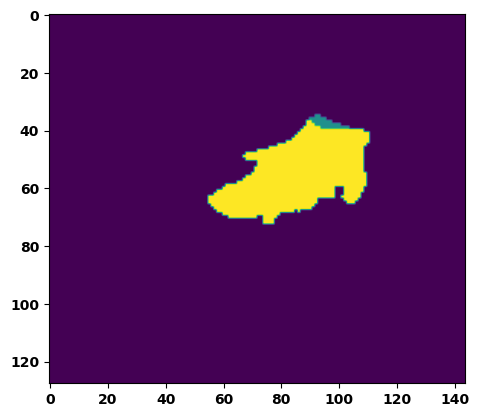

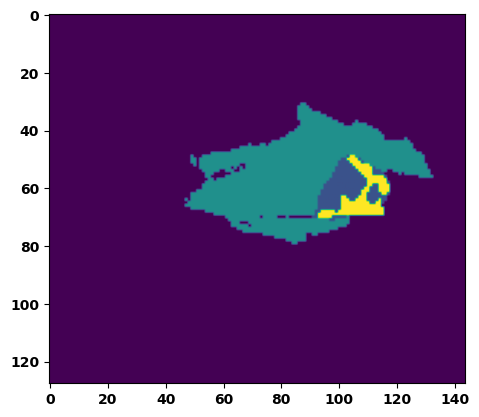

 33%|███▎      | 12/36 [00:17<00:36,  1.53s/it]

Batch_id:  11 Eval loss:  0.38493072986602783
Batch_id:  11 Eval IoU:  tensor(0.5248, device='cuda:0')
Batch_id:  11 Eval Mean Dice Score:  tensor(0.9793, device='cuda:0')
Batch_id:  11 Eval Non-tumor Dice Score:  tensor(0.9826, device='cuda:0')
Batch_id:  11 Eval NCR/NET Dice Score:  tensor(0.9845, device='cuda:0')
Batch_id:  11 Eval ED Dice Score:  tensor(0.9769, device='cuda:0')
Batch_id:  11 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 36%|███▌      | 13/36 [00:19<00:35,  1.54s/it]

Batch_id:  12 Eval loss:  0.5076554417610168
Batch_id:  12 Eval IoU:  tensor(0.4191, device='cuda:0')
Batch_id:  12 Eval Mean Dice Score:  tensor(0.9194, device='cuda:0')
Batch_id:  12 Eval Non-tumor Dice Score:  tensor(0.9070, device='cuda:0')
Batch_id:  12 Eval NCR/NET Dice Score:  tensor(0.9606, device='cuda:0')
Batch_id:  12 Eval ED Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  12 Eval ET Dice Score:  tensor(0.9237, device='cuda:0')


 39%|███▉      | 14/36 [00:20<00:33,  1.52s/it]

Batch_id:  13 Eval loss:  0.20836478471755981
Batch_id:  13 Eval IoU:  tensor(0.7185, device='cuda:0')
Batch_id:  13 Eval Mean Dice Score:  tensor(0.9788, device='cuda:0')
Batch_id:  13 Eval Non-tumor Dice Score:  tensor(0.9701, device='cuda:0')
Batch_id:  13 Eval NCR/NET Dice Score:  tensor(0.9990, device='cuda:0')
Batch_id:  13 Eval ED Dice Score:  tensor(0.9707, device='cuda:0')
Batch_id:  13 Eval ET Dice Score:  tensor(0.9966, device='cuda:0')


 42%|████▏     | 15/36 [00:22<00:31,  1.52s/it]

Batch_id:  14 Eval loss:  0.77480149269104
Batch_id:  14 Eval IoU:  tensor(0.2043, device='cuda:0')
Batch_id:  14 Eval Mean Dice Score:  tensor(0.8780, device='cuda:0')
Batch_id:  14 Eval Non-tumor Dice Score:  tensor(0.8171, device='cuda:0')
Batch_id:  14 Eval NCR/NET Dice Score:  tensor(0.9706, device='cuda:0')
Batch_id:  14 Eval ED Dice Score:  tensor(0.8938, device='cuda:0')
Batch_id:  14 Eval ET Dice Score:  tensor(0.9527, device='cuda:0')


 44%|████▍     | 16/36 [00:23<00:30,  1.54s/it]

Batch_id:  15 Eval loss:  0.819076418876648
Batch_id:  15 Eval IoU:  tensor(0.1101, device='cuda:0')
Batch_id:  15 Eval Mean Dice Score:  tensor(0.5348, device='cuda:0')
Batch_id:  15 Eval Non-tumor Dice Score:  tensor(0.3938, device='cuda:0')
Batch_id:  15 Eval NCR/NET Dice Score:  tensor(0.9513, device='cuda:0')
Batch_id:  15 Eval ED Dice Score:  tensor(0.9559, device='cuda:0')
Batch_id:  15 Eval ET Dice Score:  tensor(0.3032, device='cuda:0')


 47%|████▋     | 17/36 [00:25<00:30,  1.60s/it]

Batch_id:  16 Eval loss:  0.7597856521606445
Batch_id:  16 Eval IoU:  tensor(0.1539, device='cuda:0')
Batch_id:  16 Eval Mean Dice Score:  tensor(0.5640, device='cuda:0')
Batch_id:  16 Eval Non-tumor Dice Score:  tensor(0.3494, device='cuda:0')
Batch_id:  16 Eval NCR/NET Dice Score:  tensor(0.9998, device='cuda:0')
Batch_id:  16 Eval ED Dice Score:  tensor(0.3467, device='cuda:0')
Batch_id:  16 Eval ET Dice Score:  tensor(0.9963, device='cuda:0')


 50%|█████     | 18/36 [00:26<00:27,  1.53s/it]

Batch_id:  17 Eval loss:  0.6180477738380432
Batch_id:  17 Eval IoU:  tensor(0.3243, device='cuda:0')
Batch_id:  17 Eval Mean Dice Score:  tensor(0.9747, device='cuda:0')
Batch_id:  17 Eval Non-tumor Dice Score:  tensor(0.9762, device='cuda:0')
Batch_id:  17 Eval NCR/NET Dice Score:  tensor(0.9855, device='cuda:0')
Batch_id:  17 Eval ED Dice Score:  tensor(0.9827, device='cuda:0')
Batch_id:  17 Eval ET Dice Score:  tensor(0.9797, device='cuda:0')


 53%|█████▎    | 19/36 [00:28<00:26,  1.58s/it]

Batch_id:  18 Eval loss:  0.4495999813079834
Batch_id:  18 Eval IoU:  tensor(0.4454, device='cuda:0')
Batch_id:  18 Eval Mean Dice Score:  tensor(0.7918, device='cuda:0')
Batch_id:  18 Eval Non-tumor Dice Score:  tensor(0.6970, device='cuda:0')
Batch_id:  18 Eval NCR/NET Dice Score:  tensor(0.9698, device='cuda:0')
Batch_id:  18 Eval ED Dice Score:  tensor(0.7181, device='cuda:0')
Batch_id:  18 Eval ET Dice Score:  tensor(0.9905, device='cuda:0')


 56%|█████▌    | 20/36 [00:30<00:26,  1.65s/it]

Batch_id:  19 Eval loss:  0.6829012036323547
Batch_id:  19 Eval IoU:  tensor(0.2590, device='cuda:0')
Batch_id:  19 Eval Mean Dice Score:  tensor(0.8779, device='cuda:0')
Batch_id:  19 Eval Non-tumor Dice Score:  tensor(0.8396, device='cuda:0')
Batch_id:  19 Eval NCR/NET Dice Score:  tensor(0.8204, device='cuda:0')
Batch_id:  19 Eval ED Dice Score:  tensor(0.9754, device='cuda:0')
Batch_id:  19 Eval ET Dice Score:  tensor(0.9985, device='cuda:0')
Batch_id:  20 Eval loss:  0.8817042112350464
Batch_id:  20 Eval IoU:  tensor(0.0759, device='cuda:0')
Batch_id:  20 Eval Mean Dice Score:  tensor(0.4981, device='cuda:0')
Batch_id:  20 Eval Non-tumor Dice Score:  tensor(0.4214, device='cuda:0')
Batch_id:  20 Eval NCR/NET Dice Score:  tensor(0.9043, device='cuda:0')
Batch_id:  20 Eval ED Dice Score:  tensor(0.9215, device='cuda:0')
Batch_id:  20 Eval ET Dice Score:  tensor(0.2472, device='cuda:0')


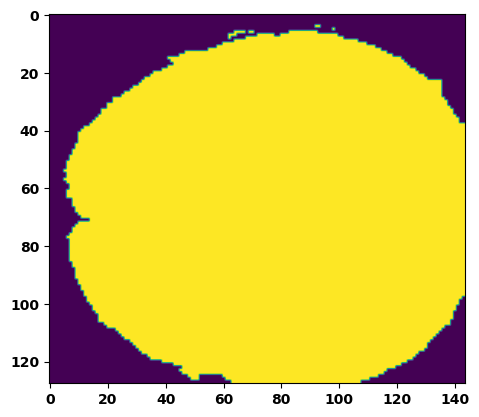

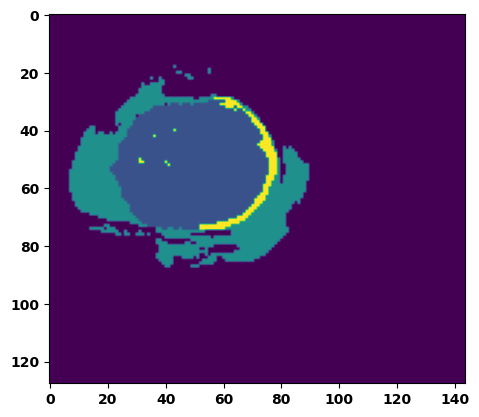

 61%|██████    | 22/36 [00:33<00:22,  1.61s/it]

Batch_id:  21 Eval loss:  0.4940613806247711
Batch_id:  21 Eval IoU:  tensor(0.4145, device='cuda:0')
Batch_id:  21 Eval Mean Dice Score:  tensor(0.9501, device='cuda:0')
Batch_id:  21 Eval Non-tumor Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  21 Eval NCR/NET Dice Score:  tensor(0.9949, device='cuda:0')
Batch_id:  21 Eval ED Dice Score:  tensor(0.9355, device='cuda:0')
Batch_id:  21 Eval ET Dice Score:  tensor(0.9919, device='cuda:0')


 64%|██████▍   | 23/36 [00:35<00:20,  1.60s/it]

Batch_id:  22 Eval loss:  0.08368158340454102
Batch_id:  22 Eval IoU:  tensor(0.8525, device='cuda:0')
Batch_id:  22 Eval Mean Dice Score:  tensor(0.9809, device='cuda:0')
Batch_id:  22 Eval Non-tumor Dice Score:  tensor(0.9811, device='cuda:0')
Batch_id:  22 Eval NCR/NET Dice Score:  tensor(0.9900, device='cuda:0')
Batch_id:  22 Eval ED Dice Score:  tensor(0.9834, device='cuda:0')
Batch_id:  22 Eval ET Dice Score:  tensor(0.9880, device='cuda:0')


 67%|██████▋   | 24/36 [00:36<00:19,  1.59s/it]

Batch_id:  23 Eval loss:  0.7576652765274048
Batch_id:  23 Eval IoU:  tensor(0.2295, device='cuda:0')
Batch_id:  23 Eval Mean Dice Score:  tensor(0.9452, device='cuda:0')
Batch_id:  23 Eval Non-tumor Dice Score:  tensor(0.9178, device='cuda:0')
Batch_id:  23 Eval NCR/NET Dice Score:  tensor(0.9996, device='cuda:0')
Batch_id:  23 Eval ED Dice Score:  tensor(0.9226, device='cuda:0')
Batch_id:  23 Eval ET Dice Score:  tensor(0.9956, device='cuda:0')


 69%|██████▉   | 25/36 [00:38<00:17,  1.58s/it]

Batch_id:  24 Eval loss:  0.664269208908081
Batch_id:  24 Eval IoU:  tensor(0.2796, device='cuda:0')
Batch_id:  24 Eval Mean Dice Score:  tensor(0.9291, device='cuda:0')
Batch_id:  24 Eval Non-tumor Dice Score:  tensor(0.8940, device='cuda:0')
Batch_id:  24 Eval NCR/NET Dice Score:  tensor(0.9668, device='cuda:0')
Batch_id:  24 Eval ED Dice Score:  tensor(0.9619, device='cuda:0')
Batch_id:  24 Eval ET Dice Score:  tensor(0.9647, device='cuda:0')


 72%|███████▏  | 26/36 [00:39<00:15,  1.56s/it]

Batch_id:  25 Eval loss:  0.4821951985359192
Batch_id:  25 Eval IoU:  tensor(0.4238, device='cuda:0')
Batch_id:  25 Eval Mean Dice Score:  tensor(0.9709, device='cuda:0')
Batch_id:  25 Eval Non-tumor Dice Score:  tensor(0.9575, device='cuda:0')
Batch_id:  25 Eval NCR/NET Dice Score:  tensor(0.9942, device='cuda:0')
Batch_id:  25 Eval ED Dice Score:  tensor(0.9682, device='cuda:0')
Batch_id:  25 Eval ET Dice Score:  tensor(0.9927, device='cuda:0')


 75%|███████▌  | 27/36 [00:41<00:13,  1.55s/it]

Batch_id:  26 Eval loss:  0.6359412670135498
Batch_id:  26 Eval IoU:  tensor(0.3010, device='cuda:0')
Batch_id:  26 Eval Mean Dice Score:  tensor(0.9017, device='cuda:0')
Batch_id:  26 Eval Non-tumor Dice Score:  tensor(0.8583, device='cuda:0')
Batch_id:  26 Eval NCR/NET Dice Score:  tensor(0.9009, device='cuda:0')
Batch_id:  26 Eval ED Dice Score:  tensor(0.9478, device='cuda:0')
Batch_id:  26 Eval ET Dice Score:  tensor(0.9980, device='cuda:0')


 78%|███████▊  | 28/36 [00:42<00:12,  1.53s/it]

Batch_id:  27 Eval loss:  0.5483604669570923
Batch_id:  27 Eval IoU:  tensor(0.3656, device='cuda:0')
Batch_id:  27 Eval Mean Dice Score:  tensor(0.9538, device='cuda:0')
Batch_id:  27 Eval Non-tumor Dice Score:  tensor(0.9613, device='cuda:0')
Batch_id:  27 Eval NCR/NET Dice Score:  tensor(0.9595, device='cuda:0')
Batch_id:  27 Eval ED Dice Score:  tensor(0.9551, device='cuda:0')
Batch_id:  27 Eval ET Dice Score:  tensor(0.9855, device='cuda:0')


 81%|████████  | 29/36 [00:44<00:10,  1.56s/it]

Batch_id:  28 Eval loss:  0.756330132484436
Batch_id:  28 Eval IoU:  tensor(0.2338, device='cuda:0')
Batch_id:  28 Eval Mean Dice Score:  tensor(0.9569, device='cuda:0')
Batch_id:  28 Eval Non-tumor Dice Score:  tensor(0.9354, device='cuda:0')
Batch_id:  28 Eval NCR/NET Dice Score:  tensor(0.9994, device='cuda:0')
Batch_id:  28 Eval ED Dice Score:  tensor(0.9409, device='cuda:0')
Batch_id:  28 Eval ET Dice Score:  tensor(0.9951, device='cuda:0')


 83%|████████▎ | 30/36 [00:45<00:09,  1.52s/it]

Batch_id:  29 Eval loss:  0.7130446434020996
Batch_id:  29 Eval IoU:  tensor(0.1994, device='cuda:0')
Batch_id:  29 Eval Mean Dice Score:  tensor(0.5005, device='cuda:0')
Batch_id:  29 Eval Non-tumor Dice Score:  tensor(0.3232, device='cuda:0')
Batch_id:  29 Eval NCR/NET Dice Score:  tensor(0.9574, device='cuda:0')
Batch_id:  29 Eval ED Dice Score:  tensor(0.8709, device='cuda:0')
Batch_id:  29 Eval ET Dice Score:  tensor(0.3501, device='cuda:0')
Batch_id:  30 Eval loss:  0.5970827341079712
Batch_id:  30 Eval IoU:  tensor(0.3369, device='cuda:0')
Batch_id:  30 Eval Mean Dice Score:  tensor(0.8822, device='cuda:0')
Batch_id:  30 Eval Non-tumor Dice Score:  tensor(0.8310, device='cuda:0')
Batch_id:  30 Eval NCR/NET Dice Score:  tensor(0.9783, device='cuda:0')
Batch_id:  30 Eval ED Dice Score:  tensor(0.9094, device='cuda:0')
Batch_id:  30 Eval ET Dice Score:  tensor(0.9280, device='cuda:0')


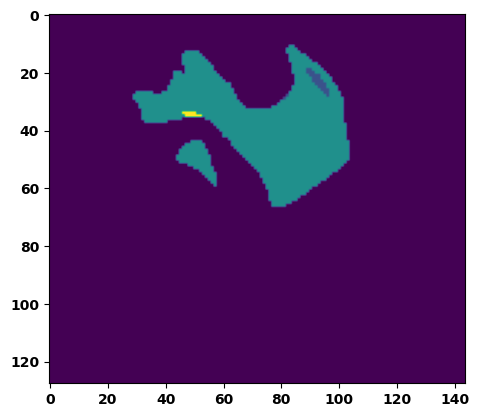

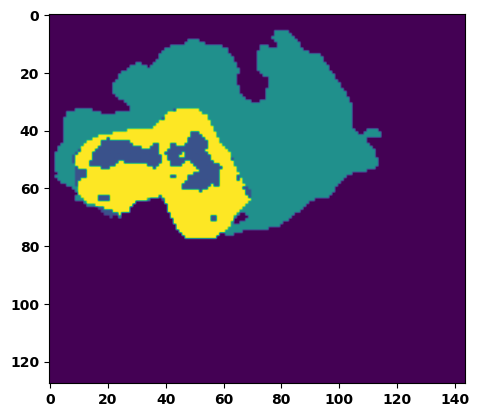

 89%|████████▉ | 32/36 [00:49<00:06,  1.63s/it]

Batch_id:  31 Eval loss:  0.5540913343429565
Batch_id:  31 Eval IoU:  tensor(0.3602, device='cuda:0')
Batch_id:  31 Eval Mean Dice Score:  tensor(0.8973, device='cuda:0')
Batch_id:  31 Eval Non-tumor Dice Score:  tensor(0.9223, device='cuda:0')
Batch_id:  31 Eval NCR/NET Dice Score:  tensor(0.9130, device='cuda:0')
Batch_id:  31 Eval ED Dice Score:  tensor(0.8704, device='cuda:0')
Batch_id:  31 Eval ET Dice Score:  tensor(0.9860, device='cuda:0')


 92%|█████████▏| 33/36 [00:50<00:04,  1.59s/it]

Batch_id:  32 Eval loss:  0.7466897964477539
Batch_id:  32 Eval IoU:  tensor(0.2400, device='cuda:0')
Batch_id:  32 Eval Mean Dice Score:  tensor(0.9578, device='cuda:0')
Batch_id:  32 Eval Non-tumor Dice Score:  tensor(0.9383, device='cuda:0')
Batch_id:  32 Eval NCR/NET Dice Score:  tensor(0.9722, device='cuda:0')
Batch_id:  32 Eval ED Dice Score:  tensor(0.9779, device='cuda:0')
Batch_id:  32 Eval ET Dice Score:  tensor(0.9849, device='cuda:0')


 94%|█████████▍| 34/36 [00:52<00:03,  1.57s/it]

Batch_id:  33 Eval loss:  0.7517635226249695
Batch_id:  33 Eval IoU:  tensor(0.2451, device='cuda:0')
Batch_id:  33 Eval Mean Dice Score:  tensor(0.9870, device='cuda:0')
Batch_id:  33 Eval Non-tumor Dice Score:  tensor(0.9805, device='cuda:0')
Batch_id:  33 Eval NCR/NET Dice Score:  tensor(0.9934, device='cuda:0')
Batch_id:  33 Eval ED Dice Score:  tensor(0.9932, device='cuda:0')
Batch_id:  33 Eval ET Dice Score:  tensor(0.9940, device='cuda:0')


 97%|█████████▋| 35/36 [00:54<00:01,  1.62s/it]

Batch_id:  34 Eval loss:  0.6622598767280579
Batch_id:  34 Eval IoU:  tensor(0.2861, device='cuda:0')
Batch_id:  34 Eval Mean Dice Score:  tensor(0.8907, device='cuda:0')
Batch_id:  34 Eval Non-tumor Dice Score:  tensor(0.8534, device='cuda:0')
Batch_id:  34 Eval NCR/NET Dice Score:  tensor(0.8531, device='cuda:0')
Batch_id:  34 Eval ED Dice Score:  tensor(0.9800, device='cuda:0')
Batch_id:  34 Eval ET Dice Score:  tensor(0.9856, device='cuda:0')


100%|██████████| 36/36 [00:55<00:00,  1.54s/it]

Batch_id:  35 Eval loss:  0.7558667063713074
Batch_id:  35 Eval IoU:  tensor(0.1548, device='cuda:0')
Batch_id:  35 Eval Mean Dice Score:  tensor(0.5568, device='cuda:0')
Batch_id:  35 Eval Non-tumor Dice Score:  tensor(0.4418, device='cuda:0')
Batch_id:  35 Eval NCR/NET Dice Score:  tensor(0.9280, device='cuda:0')
Batch_id:  35 Eval ED Dice Score:  tensor(0.8944, device='cuda:0')
Batch_id:  35 Eval ET Dice Score:  tensor(0.4063, device='cuda:0')
Epoch  49 Training loss:  0.12664765512401407
Epoch  49 Evaluation loss:  0.6072500054207113
Epoch  49 Training accuracy :  tensor(0.8099)
Epoch  49 Evaluation accuracy :  tensor(0.3326)
Epoch  49 Training Mean Dice Score:  tensor(0.9849)
Epoch  49 Eval Mean Dice Score:  tensor(0.8602)
Epoch  49 Training Non-tumor Dice Score:  tensor(0.9859)
Epoch  49 Eval Non-tumor Dice Score:  tensor(0.8185)
Epoch  49 Training NCR/NET Dice Score:  tensor(0.9933)
Epoch  49 Eval NCR/NET Dice Score:  tensor(0.9547)
Epoch  49 Training ED Dice Score:  tensor(0.98

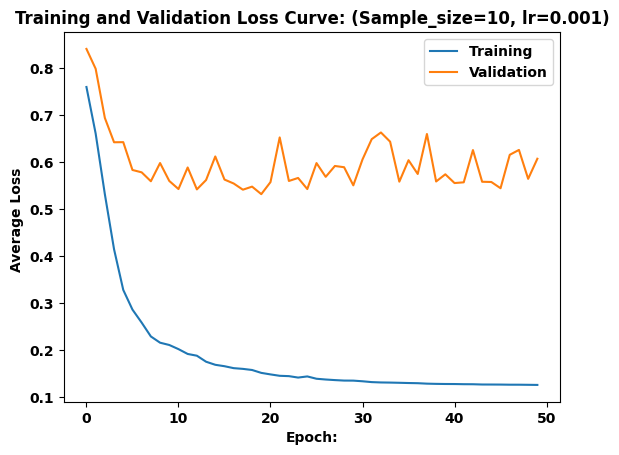

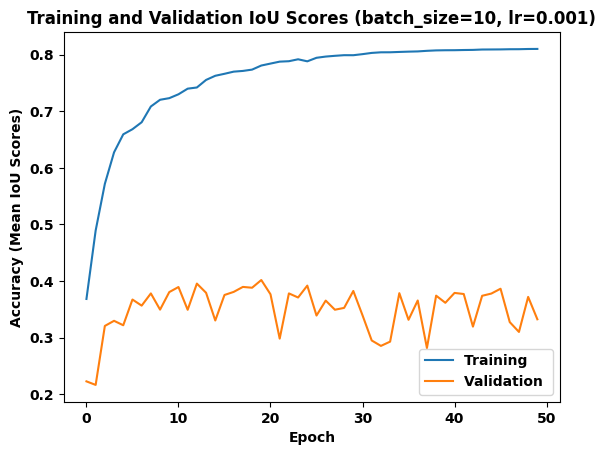

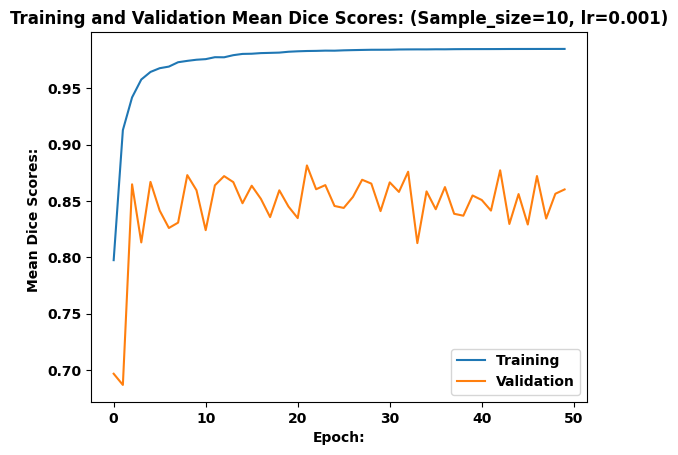

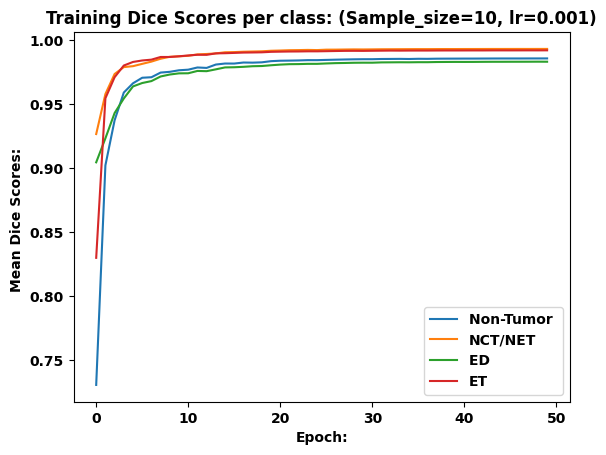

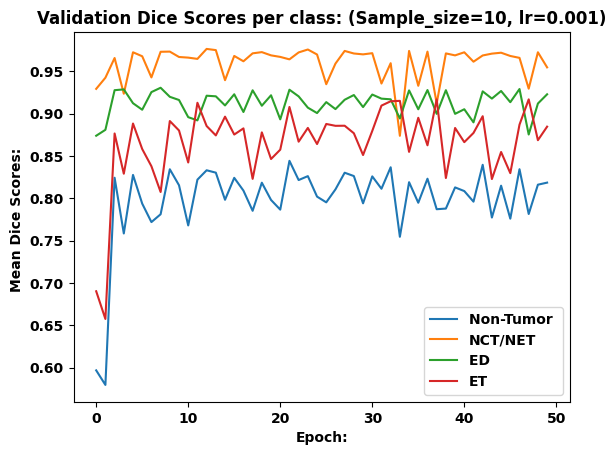

test in session: 


FileNotFoundError: [Errno 2] No such file or directory: 'log/20/#20-BEST'

In [72]:
"""
yellow - label 4
dark blue - label 1 
green - label 2 

purple - label 0
"""

main(0.70)

In [ ]:
'''
input:

y: [slice_num,h,w]

x:[slice_num,input_channel,h,w]

res:[slice_num,output_channel,h,w]


'''

def feature_extraction():
    # Load data
    train_data = torch.load(MODEL_PATH+'trdata.pth')
    eval_data = torch.load(MODEL_PATH+'edata.pth')
    test_data = torch.load(MODEL_PATH+'tdata.pth')
    
    train_pred=torch.tensor()
    train_tar=torch.tensor()
    
    eval_pred=torch.tensor()
    eval_tar=torch.tensor()
    
    test_pred=torch.tensor()
    test_tar=torch.tensor()
    
    
    
    checkpoint = torch.load(MODEL_PATH+'#19-BEST')
    model = Unet(in_channel=INPUT_CHANNEL,out_channel=4).to(device)
    opt = optim.Adam(model.parameters(), lr=LEARNING_RATE)
    model.load_state_dict(checkpoint['model_state_dict'])
    opt.load_state_dict(checkpoint['optim_state_dict'])
    
    print('Best Model loaded!')
 


    #training data set
    print('Training data feature extraction: ')
    model.eval()
    with torch.no_grad():
        
        for index, batch in enumerate(train_data):
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
            res = model(x)
            res=res.to(device)
            res = torch.argmax(res,dim=1)

            
            
    #Eval data set    
    print('Eval data feature extraction: ')
    
    with torch.no_grad():
        
        for index, batch in enumerate(eval_data):
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
            res,dfeatures = model(x)
            res=res.to(device)   
            dfeatures=dfeatures.to(device)
            res = torch.argmax(res,dim=1)
            res = F.one_hot(res,num_classes=4)
            res = res.permute(0,3,1,2)
            y=F.one_hot(y,num_classes=4)
            y = y.permute(0,3,1,2)
            pred = torch.cat((res,dfeatures),dim=1)
            target = torch.cat((res,dfeatures),dim=1)
            if index == 1:
                eval_pred=pred
                eval_tar=target
            else
                eval_pred=torch.cat((eval_pred,pred),dim=0)
                eval_tar=torch.cat((eval_tar,target),dim=0)    
    
    
    
    
    
    #Test data set    
    print('Test data feature extraction: ')
    
    with torch.no_grad():
        
        for index, batch in enumerate(test_data):
            x, y,other= batch 
            a,b,c,d,e=x.shape
            x=x.reshape(a*b,c,d,e)
            x=x.float()
        
            a,b,c,d=y.shape
            y=y.reshape(a*b,c,d)
        
            x,y=x.to(device),y.to(device)
            res,dfeatures = model(x)
            res=res.to(device)    
            dfeatures=dfeatures.to(device)
            res = torch.argmax(res,dim=1)
            res = F.one_hot(res,num_classes=4)
            res = res.permute(0,3,1,2)
            y=F.one_hot(y,num_classes=4)
            y = y.permute(0,3,1,2)
            pred = torch.cat((res,dfeatures),dim=1)
            target = torch.cat((res,dfeatures),dim=1)
            if index == 1:
                test_pred=pred
                test_tar=target
            else
                test_pred=torch.cat((test_pred,pred),dim=0)
                test_tar=torch.cat((test_tar,target),dim=0) 
    
    

In [ ]:
def feature_reduction():
    

In [ ]:
# classification class def: short-term(0): less than 10 months, mid-term(1): between 10 months and 15 months
# long-term(2): more than 15 months

def prediction Model():
    
    